## Load and explore dataset

In [152]:
# check gpu being used
from tensorflow.python.client import device_lib
print(device_lib.list_local_devices())

[name: "/device:CPU:0"
device_type: "CPU"
memory_limit: 268435456
locality {
}
incarnation: 12764251004845179032
, name: "/device:GPU:0"
device_type: "GPU"
memory_limit: 4182310912
locality {
  bus_id: 1
  links {
  }
}
incarnation: 96623374617520046
physical_device_desc: "device: 0, name: NVIDIA GeForce GTX 1660 SUPER, pci bus id: 0000:09:00.0, compute capability: 7.5"
]


In [153]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import tensorflow as tf
import tensorflow_addons as tfa
import pickle
import time
import dill
from pylab import rcParams
from numpy import mean
from numpy import std
from numpy import dstack
from pandas import read_csv
from numpy import unique
from scipy import stats
from sklearn import metrics
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Dense
from tensorflow.keras.layers import Flatten
from tensorflow.keras.layers import Dropout
from tensorflow.keras.layers import LSTM
from tensorflow.keras.layers import TimeDistributed
from tensorflow.keras.layers import Conv1D
from tensorflow.keras.layers import MaxPooling1D
from tensorflow.keras.layers import ConvLSTM2D
from tensorflow.keras.layers import Bidirectional
from tensorflow.keras.utils import to_categorical
from tensorflow.keras import callbacks
from sklearn.metrics import confusion_matrix
from sklearn.model_selection import train_test_split
from sklearn.ensemble import RandomForestClassifier
from sklearn.feature_selection import SelectFromModel
from sklearn import preprocessing
from itertools import zip_longest
from pycm import ConfusionMatrix

In [154]:
# set figure size globally
sns.set(rc={'figure.figsize':(15,12)})
sns.set_style('whitegrid')

### Initail loading of data

In [155]:
# adapted from https://towardsdatascience.com/human-activity-recognition-har-tutorial-with-keras-and-core-ml-part-1-8c05e365dfa0
def read_data(file_path):

    column_names = ['user',
                    'activity',
                    'timestamp',
                    'x-acc',
                    'y-acc',
                    'z-acc']
    df = pd.read_csv(file_path,
                     header=None,
                     names=column_names)
    # Last column has a ";" character which must be removed ...
    df['z-acc'].replace(regex=True,
      inplace=True,
      to_replace=r';',
      value=r'')
    # ... and then this column must be transformed to float explicitly
    df['z-acc'] = df['z-acc'].apply(convert_to_float)
    # This is very important otherwise the model will not fit and loss
    # will show up as NAN
    df.dropna(axis=0, how='any', inplace=True)
    
    return df


def convert_to_float(x):

    try:
        return np.float(x)
    except:
        return np.nan
 

# Load data set containing all the data from csv
wisdm = read_data('datasets/WISDM_ar_v1.1/WISDM_ar_v1.1_raw.txt')

# make list of activity labels
ACTIVITY_LABELS = list(wisdm["activity"].unique())

### See how balanced/unbalanced data is

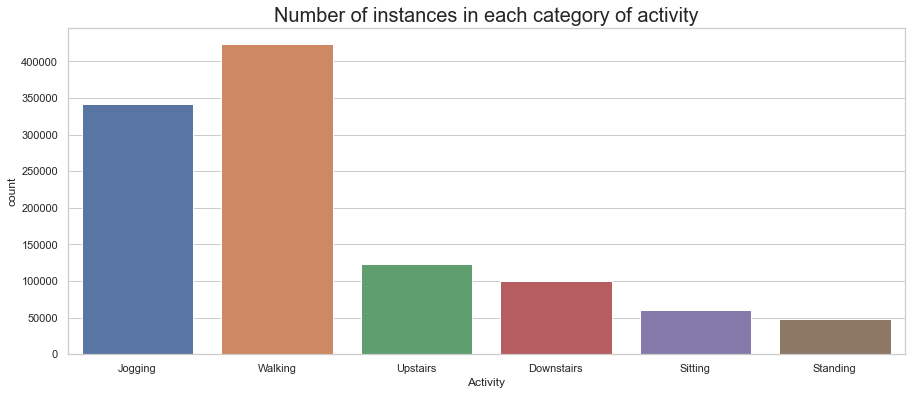

In [156]:
# plot balance of classes in training data
sns.set_style('whitegrid')

plt.figure(figsize=(15,6))
plt.title('Number of instances in each category of activity', fontsize=20)
ax = sns.countplot(x=wisdm["activity"])
ax.set(xlabel='Activity')
plt.show()

So, there is quite a heavy imbalance in the classes for this dataset

In [157]:
wisdm["activity"].value_counts()

Walking       424397
Jogging       342176
Upstairs      122869
Downstairs    100427
Sitting        59939
Standing       48395
Name: activity, dtype: int64

In [158]:
wisdm["activity"].value_counts()["Walking"] / wisdm["activity"].value_counts()["Standing"]

8.769438991631366

Instances of Walking are 8.8 times more common than standing

### Also, check data provided by each user: how much time does each user spend doing each activity?

In [159]:
# make a class variable and features variable 
y = wisdm["activity"]
X = wisdm.drop('activity', axis=1)

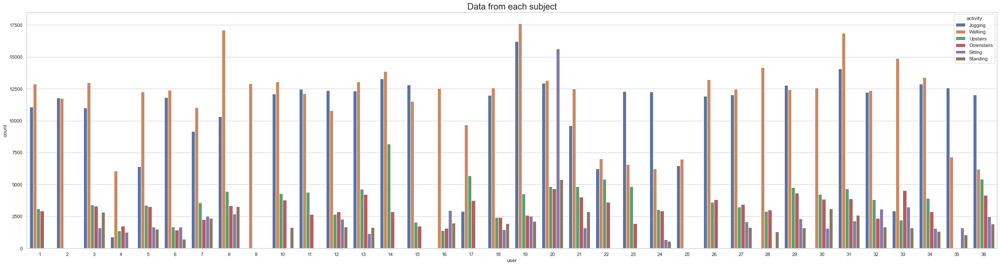

In [160]:
# plot training data from each ppant
plt.figure(figsize=(40,10))
plt.title('Data from each subject', fontsize=20)
sns.countplot(x='user',hue='activity', data = wisdm)
plt.show()

Unsurprisingly, the data is also very imbalanced here. user 9 did nothing but walk

### Visualise movement data for each activity

In [161]:
# get list with each unique subject 
subjects = unique(wisdm["user"])
print(subjects)

[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36]


In [162]:
# adapted from https://medium.com/@curiousily/human-activity-recognition-using-lstms-on-android-tensorflow-for-hackers-part-vi-492da5adef64
def plot_activity(activity, data):
    data = data[data['activity'] == activity][['x-acc', 'y-acc', 'z-acc']][:200]
    axis = data.plot(subplots=True, figsize=(16, 12), 
                     title=activity)
    for ax in axis:
        ax.legend(loc='lower left', bbox_to_anchor=(1.0, 0.5))

Show first 200 instances for each activity. This corresponds to 10 seconds worth of activity, as the sample rate is 20Hz

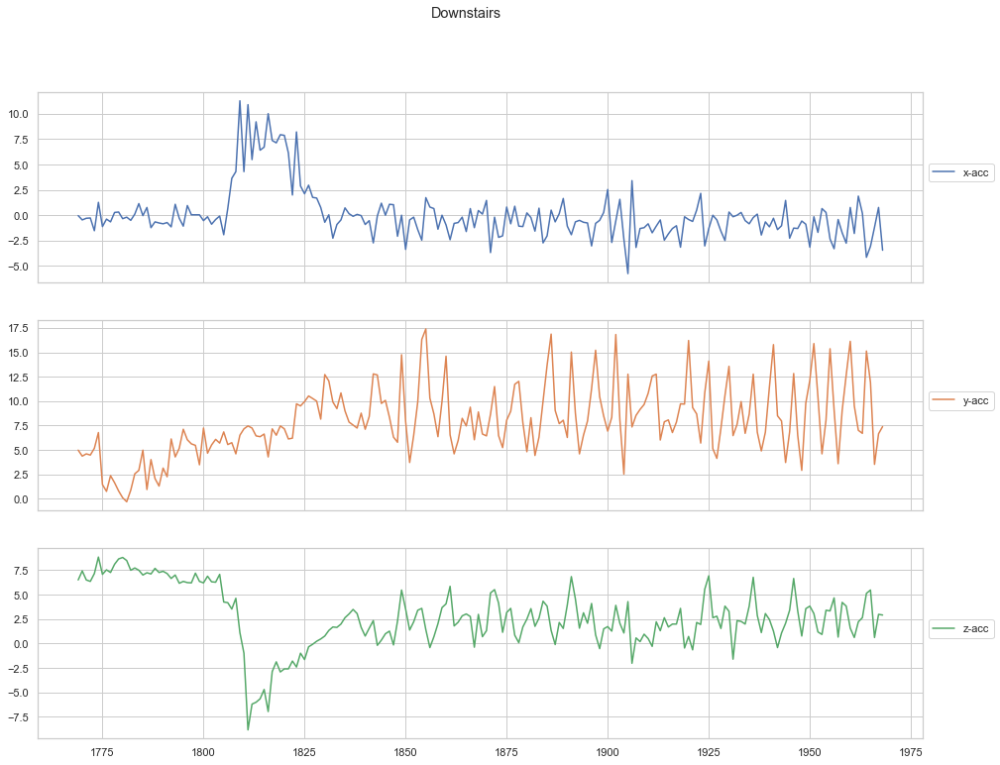

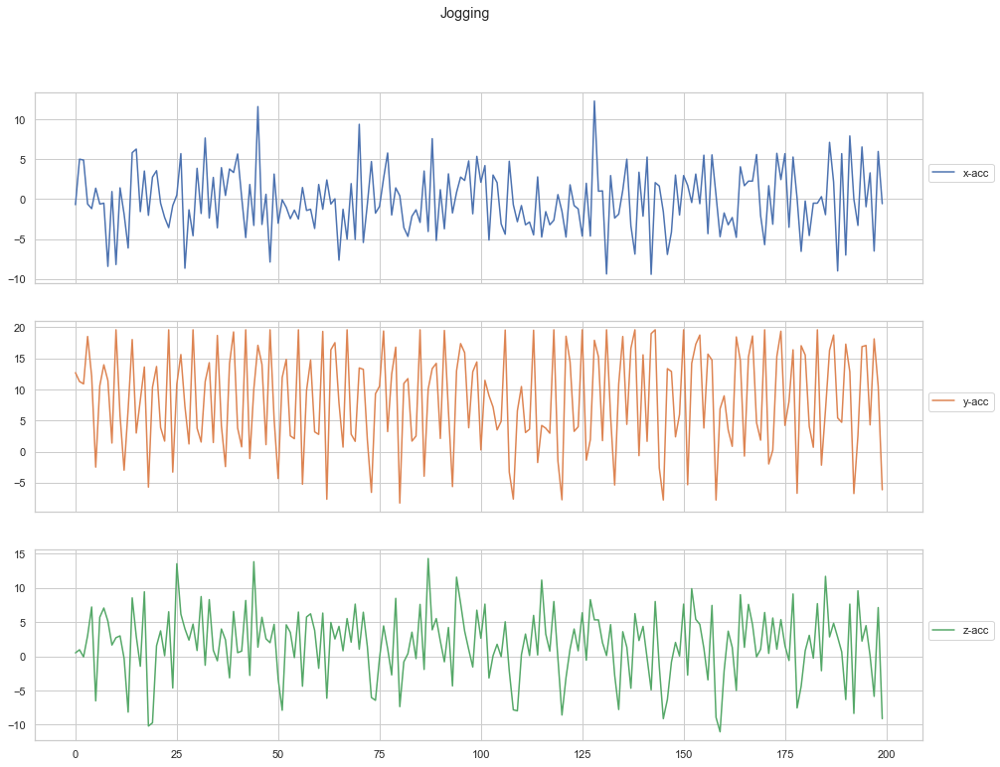

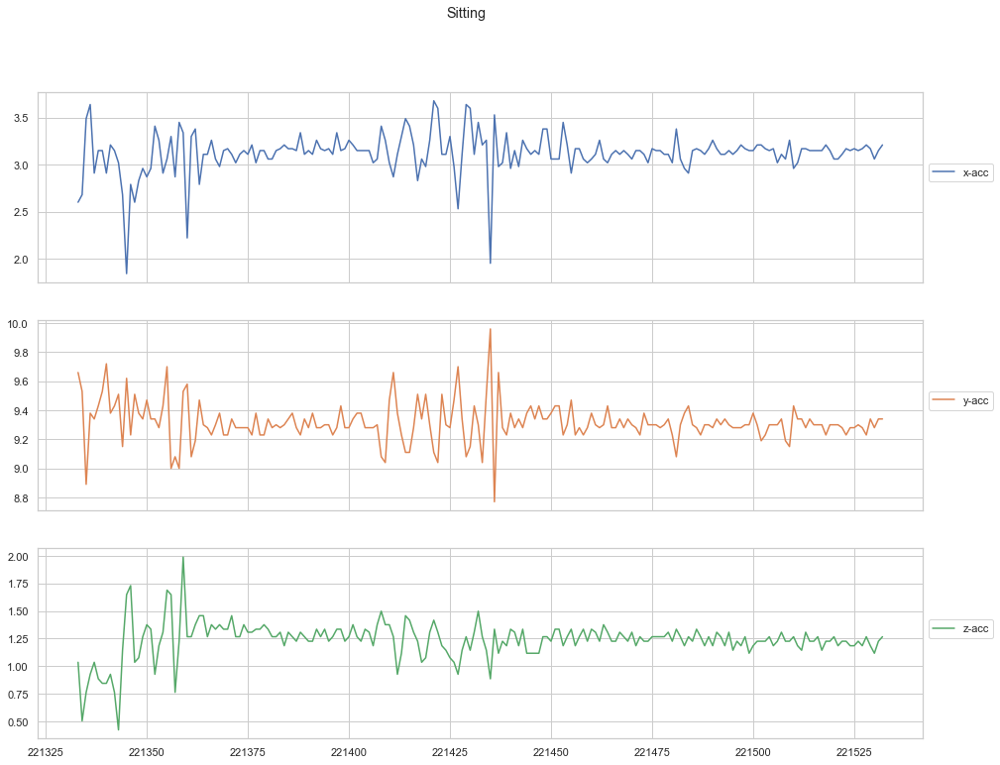

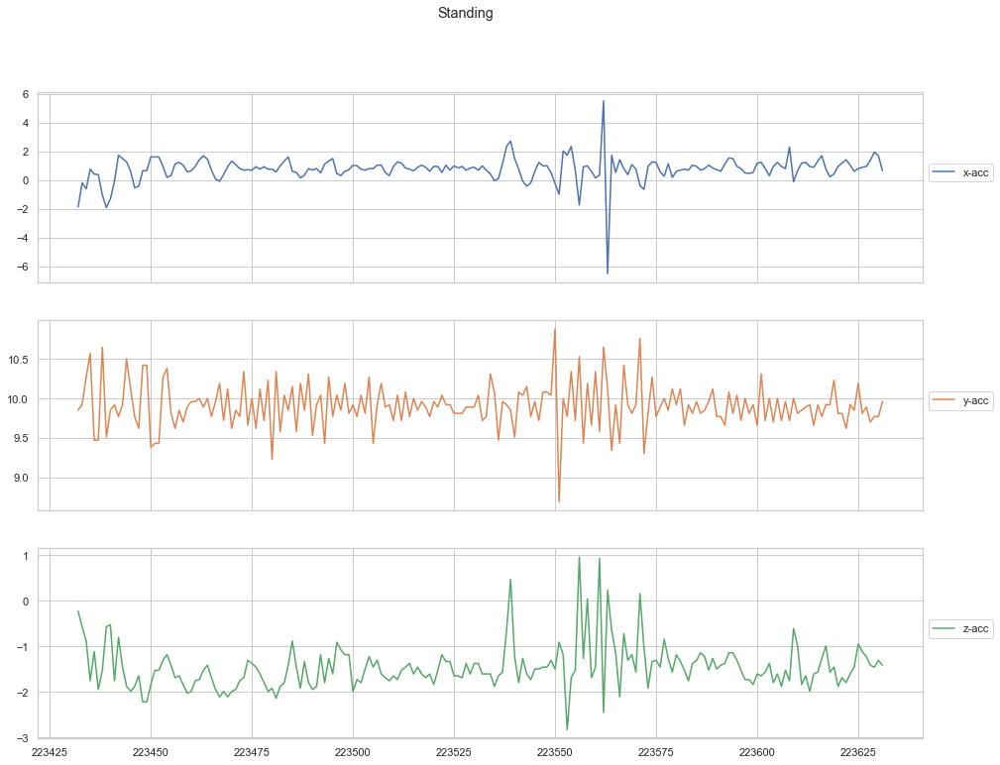

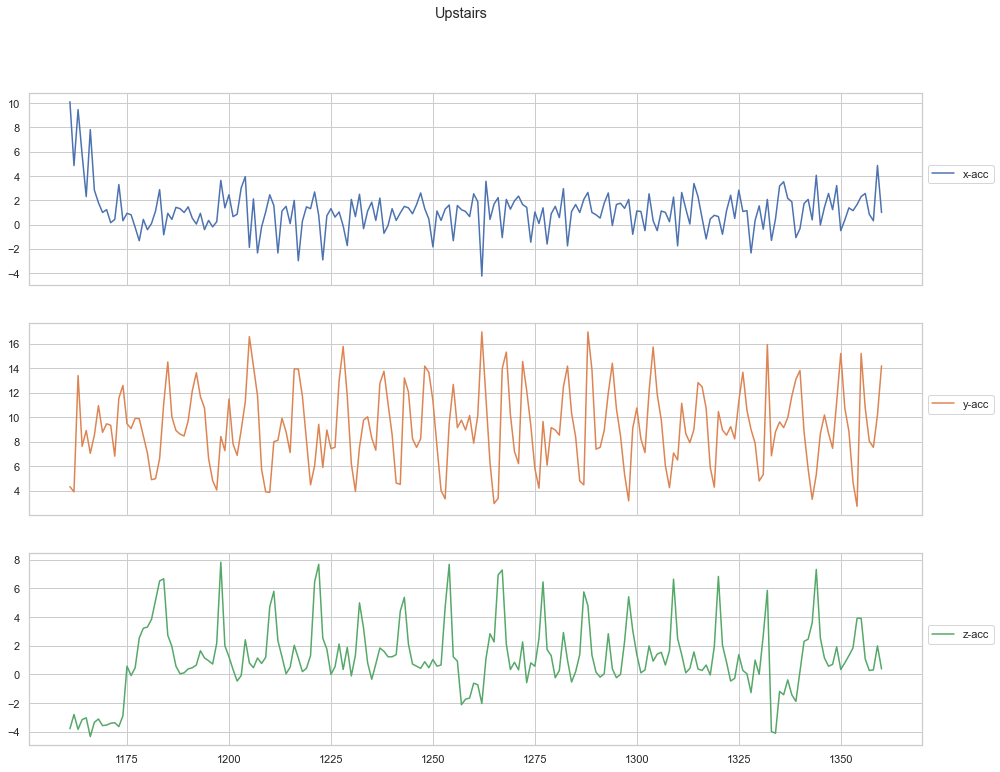

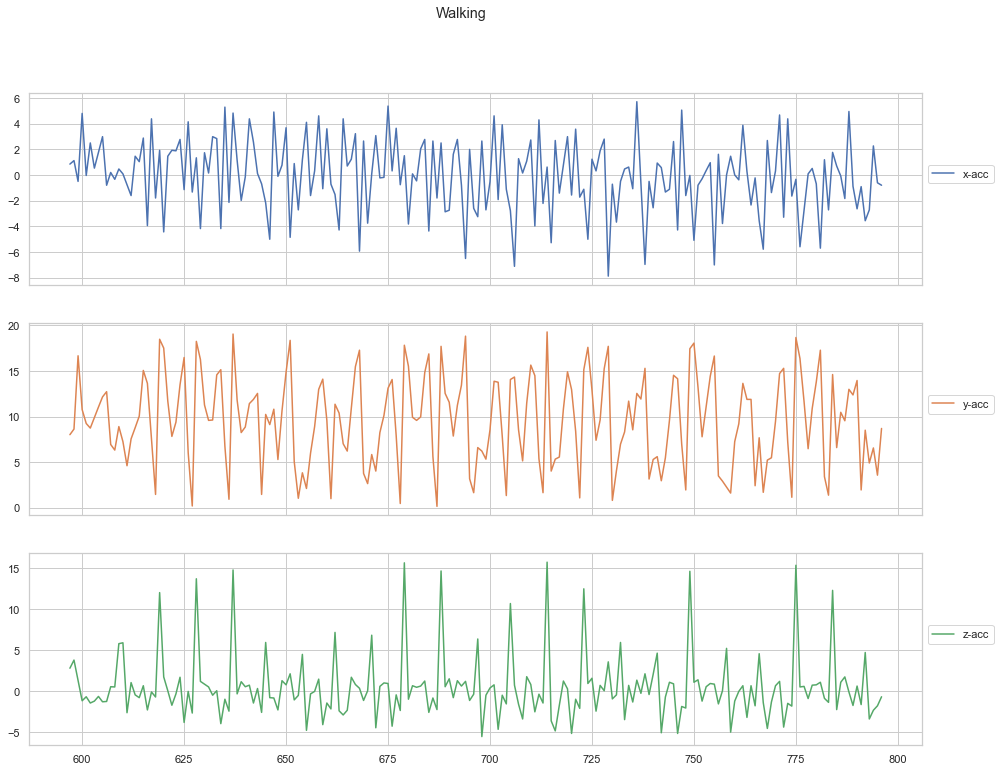

In [163]:
for activity in np.unique(wisdm['activity']):
    subset = wisdm[wisdm['activity'] == activity][:200]
    plot_activity(activity, subset)

### Plot data for one user 

Visualise movement data for a single participant

In [164]:
def plot_user_activity(activity, data, user):
    data = data[data['user']==user]
    data = data[data['activity'] == activity][['x-acc', 'y-acc', 'z-acc']]
    axis = data.plot(subplots=True, figsize=(16, 8), 
                     title=activity)
    for ax in axis:
        ax.legend(loc='lower left', bbox_to_anchor=(1.0, 0.5))

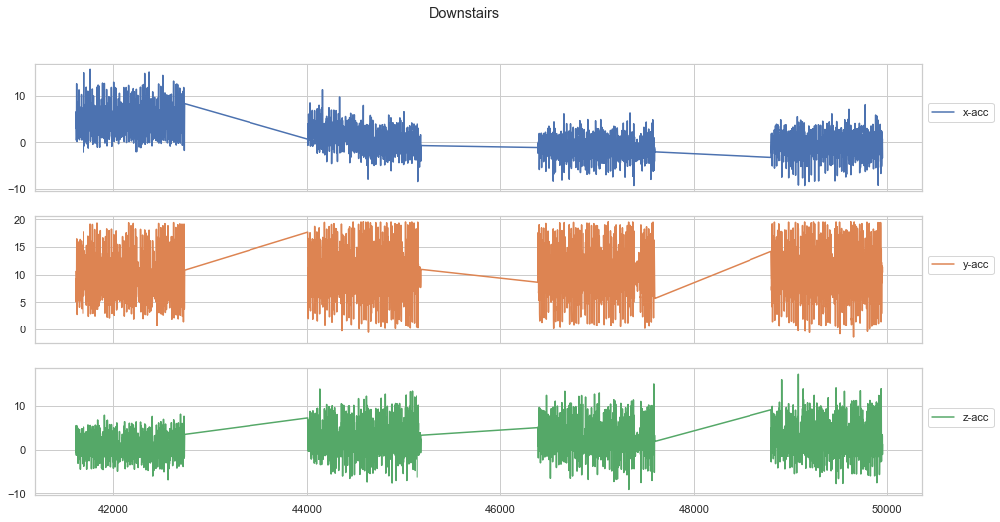

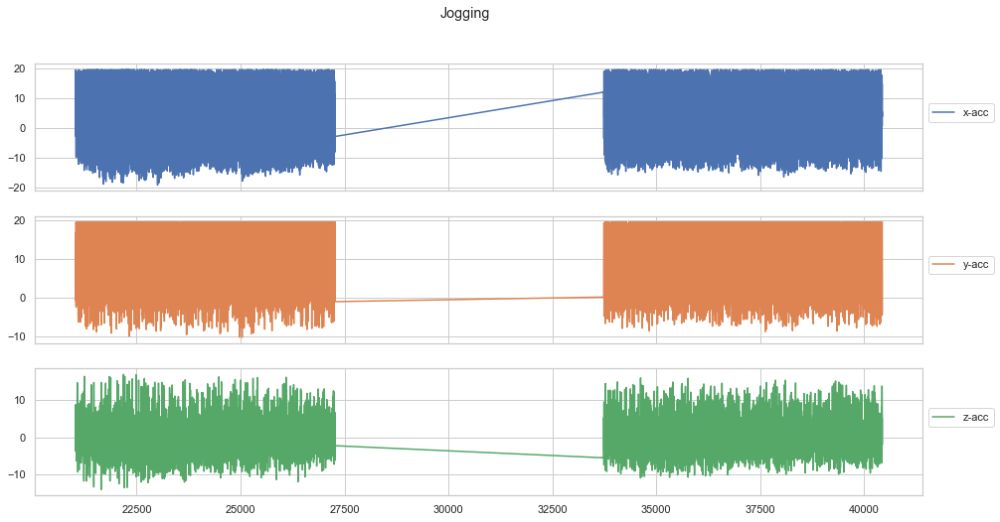

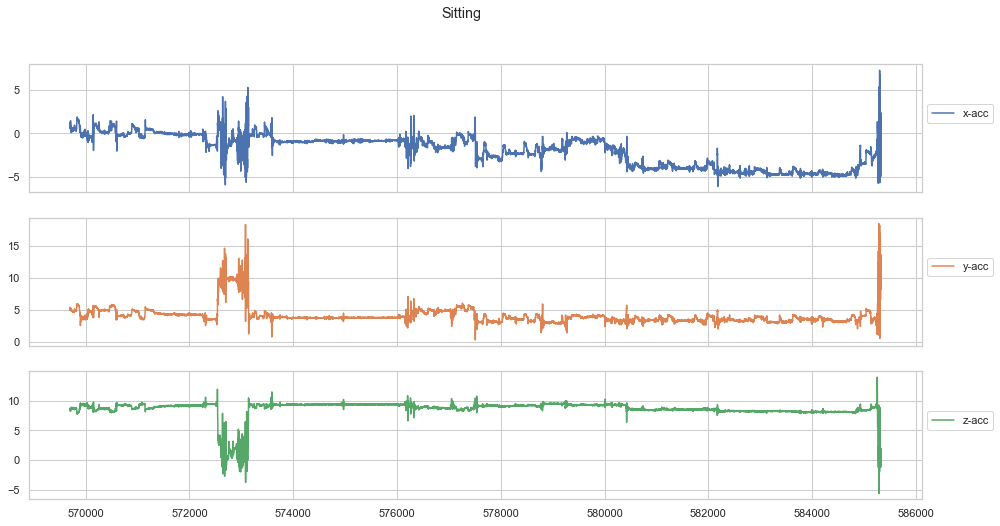

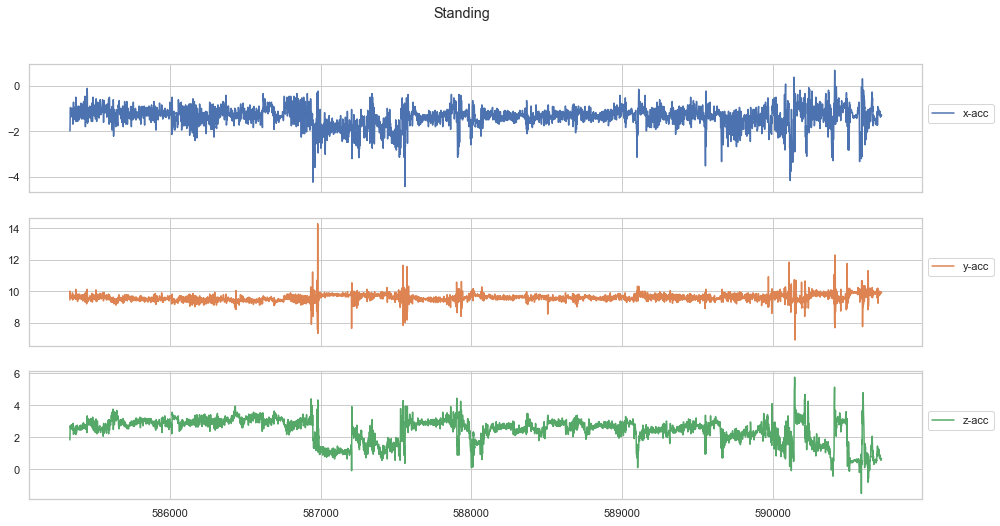

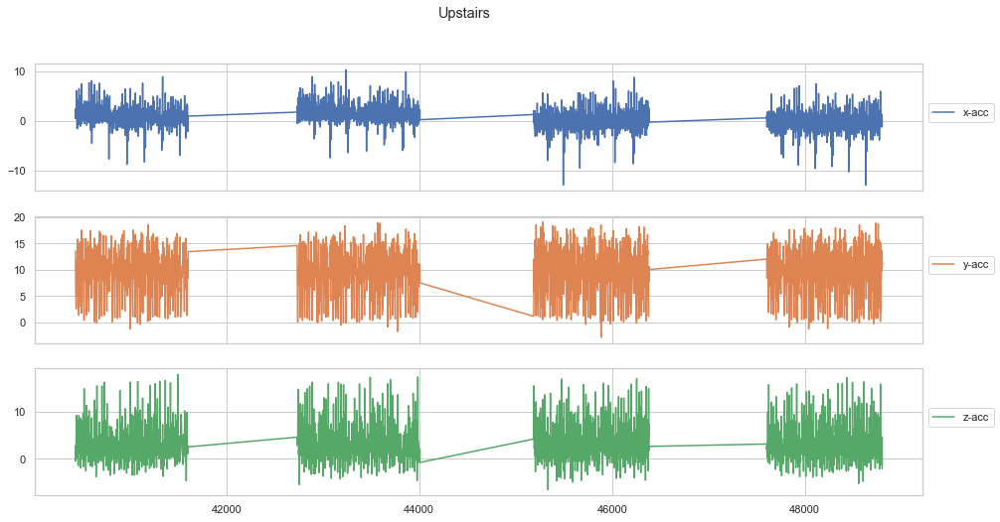

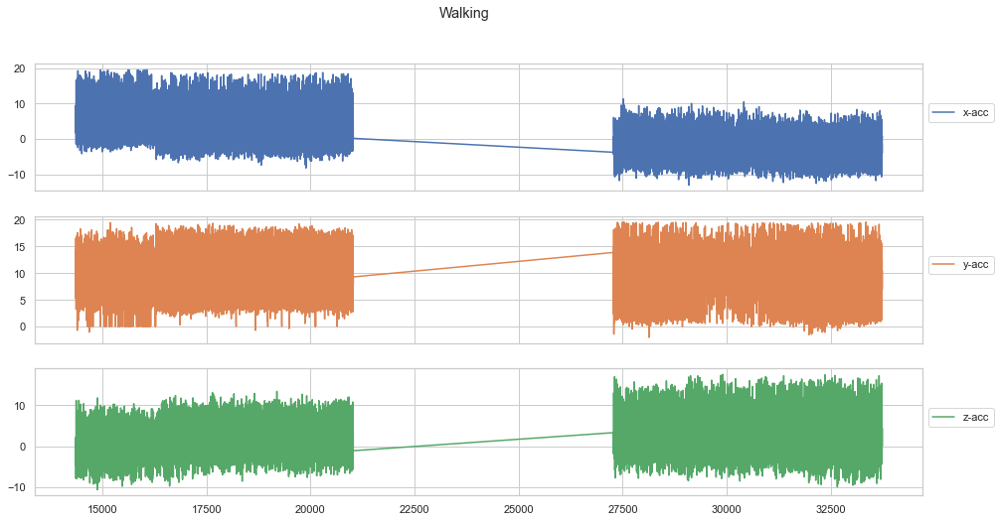

In [165]:
for activity in np.unique(wisdm['activity']):
    subset = wisdm[wisdm['activity'] == activity][:200]
    plot_user_activity(activity, wisdm, 20)

## Pre-process data

Need to:
- Convert activity column to numeric to be compatible with the models
- Split data into windows. The UCI data was split into fixed windows of 2.56 seconds (128 data points) with 50% overlap. Should do something similar
- The UCI dataset was split into train (70%) and test (30%) sets based on data for subjects. Should also do a similar split
 

#### Convert the activity column to be numeric

In [166]:
# adapted from https://towardsdatascience.com/human-activity-recognition-har-tutorial-with-keras-and-core-ml-part-1-8c05e365dfa0
# Define column name of the label vector
LABEL = 'ActivityEncoded'
# Transform the labels from String to Integer via LabelEncoder
le = preprocessing.LabelEncoder()
# Add a new column to the existing DataFrame with the encoded values
wisdm[LABEL] = le.fit_transform(wisdm['activity'].values.ravel())

wisdm.head()

,user,activity,timestamp,x-acc,y-acc,z-acc,ActivityEncoded
0,33,Jogging,49105962326000,-0.694638,12.680544,0.503953,1
1,33,Jogging,49106062271000,5.012288,11.264028,0.953424,1
2,33,Jogging,49106112167000,4.903325,10.882658,-0.081722,1
3,33,Jogging,49106222305000,-0.612916,18.496431,3.023717,1
4,33,Jogging,49106332290000,-1.184970,12.108489,7.205164,1


#### Split data into train and test sets

In [167]:
wisdm_train = wisdm[wisdm['user'] <= 26]
wisdm_test = wisdm[wisdm['user'] > 26]

#### Normalise data

To keep consistent with UCI dataset, normalise between -1 and 1

In [168]:
# Normalise training data
train_cols = wisdm_train[['x-acc', 'y-acc', "z-acc"]].values
scaler = preprocessing.MinMaxScaler(feature_range=(-1, 1))
scaler.fit(train_cols)
train_scaled = scaler.transform(train_cols)

train_scaled_x = []
train_scaled_y = []
train_scaled_z = []


for i in range(len(train_scaled)):
    train_scaled_x.append(train_scaled[i][0])
    train_scaled_y.append(train_scaled[i][1])
    train_scaled_z.append(train_scaled[i][2])

In [169]:
# Normalise testing data, using same scale as training data
test_cols = wisdm_test[['x-acc', 'y-acc', "z-acc"]].values
min_max_scaler = preprocessing.MinMaxScaler(feature_range=(-1, 1))
test_scaled = scaler.transform(test_cols)

test_scaled_x = []
test_scaled_y = []
test_scaled_z = []


for i in range(len(test_scaled)):
    test_scaled_x.append(test_scaled[i][0])
    test_scaled_y.append(test_scaled[i][1])
    test_scaled_z.append(test_scaled[i][2])

#### Segment data into windows

To start, use 42 timesteps (2.1 seconds)

In [170]:
# set steps globally so that it is consistent for each feature/class
N_TIME_STEPS = 42
STEP_DISTANCE = 21

# function to segment features 
# adapted from https://towardsdatascience.com/human-activity-recognition-har-tutorial-with-keras-and-core-ml-part-1-8c05e365dfa0
def create_segments(feature, time_steps=N_TIME_STEPS, step_distance=STEP_DISTANCE):
    
    segments = []
    
    
    for i in range(0, len(feature) - time_steps, step_distance):
        segment = feature[i: i + time_steps]
        segments.append(segment)
        
    return np.array(segments)

In [171]:
# segment training data
train_seg_x = create_segments(feature=train_scaled_x)
train_seg_y = create_segments(feature=train_scaled_y)
train_seg_z = create_segments(feature=train_scaled_z)
# segment test data
test_seg_x = create_segments(feature=test_scaled_x)
test_seg_y = create_segments(feature=test_scaled_y)
test_seg_z = create_segments(feature=test_scaled_z)

In [173]:
# get training data to same shape as with the other dataset
trainX = list()
trainX.append(train_seg_x)
trainX.append(train_seg_y)
trainX.append(train_seg_z)
# make it a 3d array [samples, time steps, features])
trainX = dstack(trainX)

trainX.shape

(37068, 42, 3)

In [174]:
# get training data to same shape as with the other dataset
testX = list()
testX.append(test_seg_x)
testX.append(test_seg_y)
testX.append(test_seg_z)
# make it a 3d array [samples, time steps, features])
testX = dstack(testX)

testX.shape

(15224, 42, 3)

This all seems to be working pretty well. now to do the same with the class variable

In [175]:
# first, segment the data
trainy_segmented = create_segments(wisdm_train["ActivityEncoded"])
testy_segmented = create_segments(wisdm_test["ActivityEncoded"])

In [176]:
# get most common activity for each time window
trainy_segmented_mode=list()

for i in range(len(trainy_segmented)):
    label = stats.mode(trainy_segmented[i])[0][0]
    trainy_segmented_mode.append(label)

# check this is same as lenght of trainX
len(trainy_segmented_mode)

37068

In [177]:
# get most common activity for each time window
testy_segmented_mode=list()

for i in range(len(testy_segmented)):
    label = stats.mode(testy_segmented[i])[0][0]
    testy_segmented_mode.append(label)

# check this is same as lenght of trainX
len(testy_segmented_mode)

15224

In [178]:
# make trainy and testy categorical
trainy = to_categorical(trainy_segmented_mode)
testy = to_categorical(testy_segmented_mode)

print(trainy.shape)
print(testy.shape)

(37068, 6)
(15224, 6)


Now that the data is in the same format as the UCI dataset it should be possible to build the same models on it

## Tiny bit mkore EDA

In [179]:
# make activity labels for plot
activity_labels_neat = ["Downstairs", "Jogging", "Sitting", "Standing", "Upstairs", "Walking"]

# make df for comparing distribution of training and testing data
trainy_plot_df = pd.DataFrame(wisdm_train['ActivityEncoded'].copy())
testy_plot_df = pd.DataFrame(wisdm_test['ActivityEncoded'].copy())

trainy_plot_df['test_train'] = '\n\n Training'
testy_plot_df['test_train'] = '\n\n Testing'

plot_df = pd.concat([trainy_plot_df, testy_plot_df])
plot_df['ActivityEncoded'] = plot_df['ActivityEncoded'] + 1

plot_df

,ActivityEncoded,test_train
8489,6,\n\n Training
8490,6,\n\n Training
8491,6,\n\n Training
8492,6,\n\n Training
8493,6,\n\n Training
...,...,...
832892,4,\n\n Testing
832893,4,\n\n Testing
832894,4,\n\n Testing
832895,4,\n\n Testing


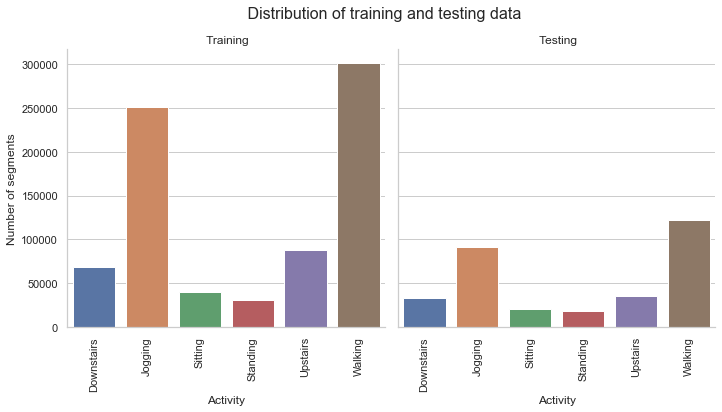

In [180]:
# plot test and train side-bu-side
ax = sns.catplot(x='ActivityEncoded', col='test_train', kind='count', data=plot_df)
ax.fig.suptitle('       Distribution of training and testing data', fontsize = 16)
ax.set_axis_labels(x_var="Activity", y_var="Number of segments")
ax.set_titles("{col_name}")
ax.set_xticklabels(activity_labels_neat)
ax.set_xticklabels(rotation=90)

### Visualise movement data for a single participant

In [181]:
# adapted from https://machinelearningmastery.com/how-to-model-human-activity-from-smartphone-data/
# get list with each unique subject 
sub_map = wisdm['user']
train_subjects = unique(sub_map)
print(train_subjects)

[ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26 27 28 29 30 31 32 33 34 35 36]


In [182]:
# adapted from https://machinelearningmastery.com/how-to-model-human-activity-from-smartphone-data/
# get all data for one participant
def data_for_subject(X, y, sub_map, sub_id):
    # get row indexes for the subject id
    ix = [i for i in range(len(sub_map)) if sub_map[i]==sub_id]
    # return the selected samples
    return X[ix, :, :], y[ix]

In [183]:
# adapted from https://machinelearningmastery.com/how-to-model-human-activity-from-smartphone-data/
# convert a series of windows to a 1D list, and remove overlap
def to_series(windows):
    series = list()
    for window in windows:
        # remove the overlap from the window
        half = int(len(window) / 2) - 1
        for value in window[-half:]:
            series.append(value)
    return series

In [207]:
# adapted from https://machinelearningmastery.com/how-to-model-human-activity-from-smartphone-data/
# plot the data for one participant
def plot_subject(X, y):
    plt.figure(figsize=(15,8))
    # determine the total number of plots
    n, off = X.shape[2] + 1, 0
    # plot total acc
    for i in range(3):
        plt.subplot(n, 1, off+1)
        plt.plot(to_series(X[:, :, off]))
        direction = "AAAAAAAAAAAAAA"
        if (i == 0):
            direction = "x"
        elif (i == 1):
            direction = "y"
        else:
            direction = "z"
        plt.title('total acc '+str(direction), y=0, loc='left')
        off += 1
        plt.xlabel("Time step")
        plt.vlines(34000, -1, 1, colors='red')
        
    # plot activities
    plt.subplot(n, 1, n)
    plt.xlabel("Time step")
    
    # make space so plots don't overlap
    plt.tight_layout()
    plt.plot(y+1)
    plt.ylim(0,7)
    plt.vlines(34000, 0, 7, colors='red')
    plt.title('activity', y=0, loc='left')
    plt.show()
    

train_subjects:  [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26]
(2696, 42, 3) (2696, 1)


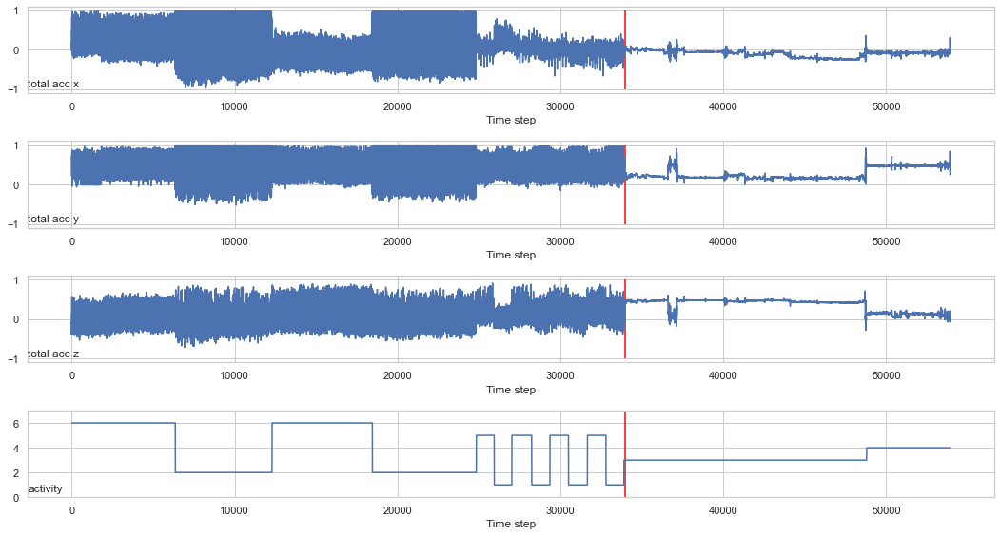

In [209]:
# adapted from https://machinelearningmastery.com/how-to-model-human-activity-from-smartphone-data/
# use all the functions above to visualiase the accelerometer data for one ppant

# load mapping of rows to subjects
sub_map_train = wisdm_train['user'].reset_index(drop = True)
train_subjects = unique(sub_map_train)
sub_map_test = wisdm_test['user'].reset_index(drop = True)
test_subjects = unique(sub_map_test)
# segment this subjects data for cosistency
sub_map_train = create_segments(sub_map_train)
sub_map_test = create_segments(sub_map_test)
print("train_subjects: ", train_subjects)
# get user for each time window
sub_map_train_mode=list()
for i in range(len(sub_map_train)):
    label = stats.mode(sub_map_train[i])[0][0]
    sub_map_train_mode.append(label)
    
# get y in correct format
trainy_raw = np.array(trainy_segmented_mode).reshape((len(trainy)), 1)
testy_raw = np.array(testy_segmented_mode).reshape((len(testy)), 1)

# get the data for ith train subject
sub_id = train_subjects[19]
subX, suby = data_for_subject(trainX, trainy_raw, sub_map_train_mode, sub_id)
print(subX.shape, suby.shape)

# plot data for subject
plot_subject(subX, np.repeat(suby, 20))

Here, I've plotted the x,y,z movement data for the \_th participant in the training set. The last subplot, "activity", shows which activity the participant is doing at each time. 

Activities are coded as so:

0. Downstairs
1. Jogging
2. Sitting
3. Standing
4. Upstairs
5. Walking

There does appear to be a relationship between the accelerometer data and activity. There a pretty clear changes when activity changes, jogging is a stronger signal than walking, upsatairs and downstairs look good

The 9 movement variables also seem to have a lot in common, meaning that the number of features used in a model could possibly be reduced

#### Plot activity per user

In [210]:
# get user per segment
sub_map_train_mode = []

for i in range(len(sub_map_train)):
    label = stats.mode(sub_map_train[i])[0][0]
    sub_map_train_mode.append(label)
    
# make df of subject and activity
y_train_subject = {'subject': sub_map_train_mode, 'activity': trainy_raw.flatten()}
y_train_subject = pd.DataFrame(y_train_subject)
y_train_subject

,subject,activity
0,17,5
1,17,5
2,17,5
3,17,5
4,17,5
...,...,...
37063,19,2
37064,19,2
37065,19,2
37066,19,2


In [211]:
# get user per segment
sub_map_test_mode = []

for i in range(len(sub_map_test)):
    label = stats.mode(sub_map_test[i])[0][0]
    sub_map_test_mode.append(label)

# make df of subject and activity
y_test_subject = {'subject': sub_map_test_mode, 'activity': testy_raw.flatten()}
y_test_subject = pd.DataFrame(y_test_subject)
y_test_subject

,subject,activity
0,33,1
1,33,1
2,33,1
3,33,1
4,33,1
...,...,...
15219,31,3
15220,31,3
15221,31,3
15222,31,3


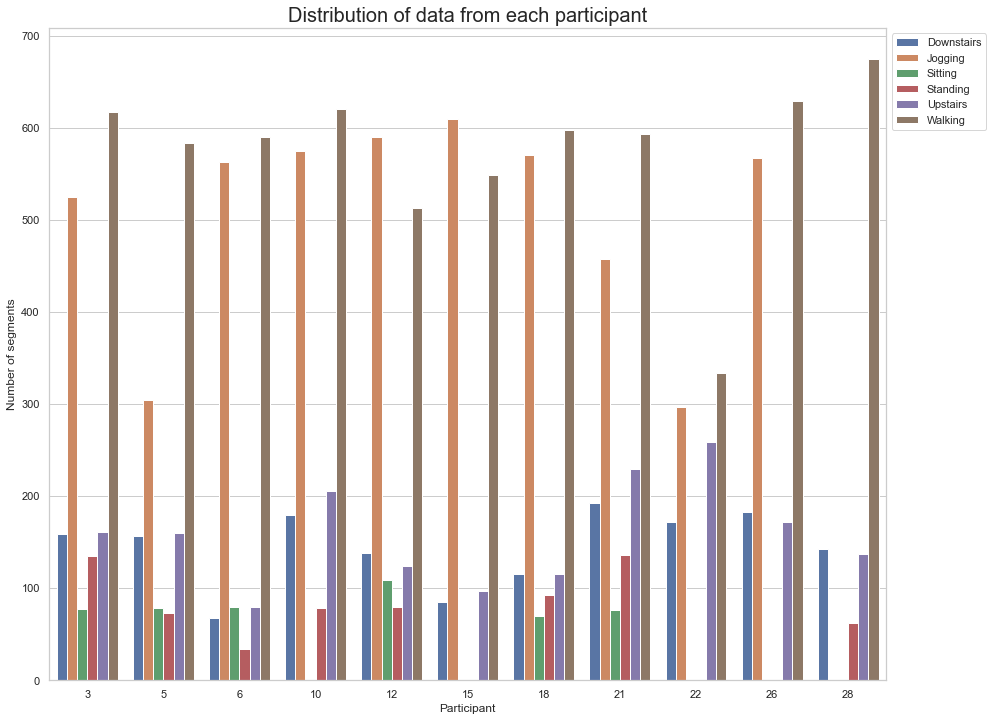

In [212]:
# visualise data for all subjects, but limit to 10 random
y_subject = pd.concat([y_train_subject, y_test_subject])
ax = sns.countplot(x='subject',hue='activity',
                   data = y_subject[y_subject['subject'].isin(np.random.randint(low=0, high=30, size=12))])
ax.set_title("Distribution of data from each participant", fontsize=20)
ax.set(xlabel='Participant',
      ylabel='Number of segments')
ax.legend(activity_labels_neat, bbox_to_anchor=(1,1))

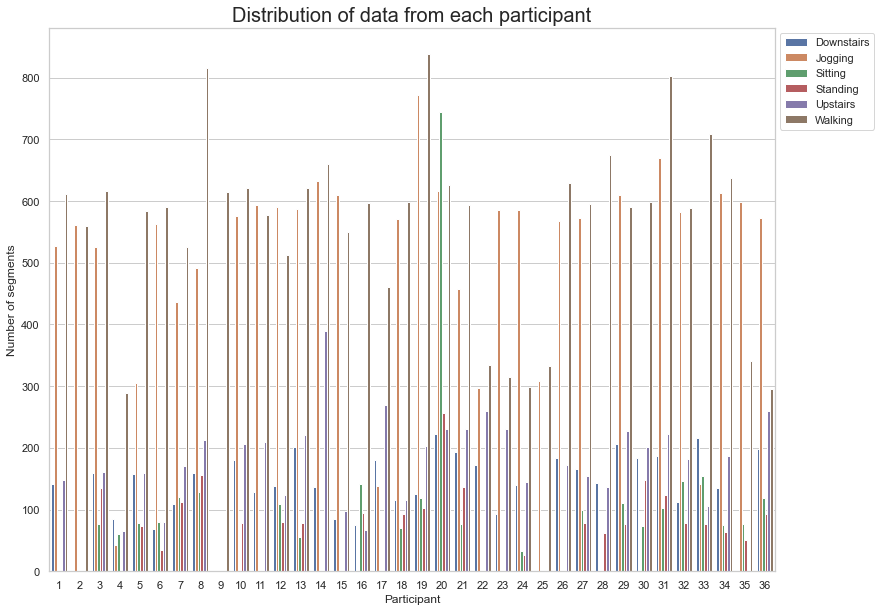

In [213]:
# visualise data for all subjects
plt.figure(figsize=(13,10))
plt.title('Distribution of data from each participant', fontsize=20)
sns.countplot(x='subject',hue='activity', data = y_subject)
plt.legend(activity_labels_neat, bbox_to_anchor=(1,1))
plt.xlabel('Participant')
plt.ylabel('Number of segments')
plt.show()

## Build models

In [215]:
# set epochs and batch size globally
EPOCHS = 5000
BATCH_SIZE = 64
REPEATS = 10

### LSTM Model

In [216]:
# adapted from https://machinelearningmastery.com/how-to-develop-rnn-models-for-human-activity-recognition-time-series-classification/
# fit and evaluate a model
def fit_model_LSTM(trainX, trainy, testX, testy, epochs = EPOCHS):
    
    # print model type
    print('LSTM')
    
    # extract input and output dimensions fromt the dataset
    n_timesteps, n_features, n_outputs = trainX.shape[1], trainX.shape[2], trainy.shape[1]
    
    #print(n_outputs)
    
    # define keras sequential model
    model = Sequential()
    # add single lstm hidden layer
    model.add(LSTM(100, input_shape=(n_timesteps,n_features)))
    # add dropout layer intended to reduce overfitting of model to training data
    model.add(Dropout(0.5))
    # add fully connected layer to interpret features extracted by the LSTM hidden layer
    model.add(Dense(100, activation='relu'))
    # add final output layer is used to make predictions
    model.add(Dense(n_outputs, activation='softmax'))
    model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
    
    # change callbacks_list, depending on whether model is being run for dac etc
    if Experiment_type["type"] == "standard":
        callbacks_list = callbacks_list_standard
    elif Experiment_type["type"] == "dac":
        callbacks_list = callbacks_list_dac
    else:
        callbacks_list = callbacks_list_dac_split
    
    # fit network
    history = model.fit(trainX, trainy, epochs=epochs, batch_size=BATCH_SIZE, validation_data=(testX, testy), callbacks=callbacks_list)
    
    
    # make predictions
    y_pred_train = model.predict(trainX)
    y_pred_test = model.predict(testX)
    
    # make data into array, suitable for confusion matrix
    max_y_pred_train = np.argmax(y_pred_train, axis=1)
    max_y_pred_test = np.argmax(y_pred_test, axis=1)
    max_y_test = np.argmax(testy, axis=1)

    return history, max_y_test, max_y_pred_test, max_y_pred_train, time_callback.times

### CNN-LSTM Model

In [217]:
# adapted from https://machinelearningmastery.com/how-to-develop-rnn-models-for-human-activity-recognition-time-series-classification/
# cnn lstm model
# fit and evaluate a model
def fit_model_CNN_LSTM(trainX, trainy, testX, testy, epochs = EPOCHS):
    
    # print model type
    print("CNN-LSTM")
    
    n_timesteps, n_features, n_outputs = trainX.shape[1], trainX.shape[2], trainy.shape[1]
    # reshape data into time steps of sub-sequences
    n_steps, n_length = 2, 21
    trainX = trainX.reshape((trainX.shape[0], n_steps, n_length, n_features))
    testX = testX.reshape((testX.shape[0], n_steps, n_length, n_features))
    # define model
    model = Sequential()
    model.add(TimeDistributed(Conv1D(filters=64, kernel_size=3, activation='relu'), input_shape=(None,n_length,n_features)))
    model.add(TimeDistributed(Conv1D(filters=64, kernel_size=3, activation='relu')))
    model.add(TimeDistributed(Dropout(0.5)))
    model.add(TimeDistributed(MaxPooling1D(pool_size=2)))
    model.add(TimeDistributed(Flatten()))
    model.add(LSTM(100))
    model.add(Dropout(0.5))
    model.add(Dense(100, activation='relu'))
    model.add(Dense(n_outputs, activation='softmax'))
    model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
    
    # change callbacks_list, depending on whether model is being run for dac etc
    if Experiment_type["type"] == "standard":
        callbacks_list = callbacks_list_standard
    elif Experiment_type["type"] == "dac":
        callbacks_list = callbacks_list_dac
    else:
        callbacks_list = callbacks_list_dac_split
        
    # fit network
    history = model.fit(trainX, trainy, epochs=epochs, batch_size=BATCH_SIZE, validation_data=(testX, testy), callbacks=callbacks_list)
    
    # make predictions
    y_pred_train = model.predict(trainX)
    y_pred_test = model.predict(testX)
    
    # make data into array, suitable for confusion matrix
    max_y_pred_train = np.argmax(y_pred_train, axis=1)
    max_y_pred_test = np.argmax(y_pred_test, axis=1)
    max_y_test = np.argmax(testy, axis=1)

    return history, max_y_test, max_y_pred_test, max_y_pred_train, time_callback.times

### ConvLSTM Network Model

In [218]:
# adapted from https://machinelearningmastery.com/how-to-develop-rnn-models-for-human-activity-recognition-time-series-classification/
# convlstm model

# fit and evaluate a model
def fit_model_ConvLSTM(trainX, trainy, testX, testy, epochs = EPOCHS):
    
    # Run inference on CPU
    with tf.device('/cpu:0'):

        # print model type
        print("ConvLSTM")

        # define model
        n_timesteps, n_features, n_outputs = trainX.shape[1], trainX.shape[2], trainy.shape[1]
        # reshape into subsequences (samples, time steps, rows, cols, channels)
        n_steps, n_length = n_steps, n_length = 2, 21
        trainX = trainX.reshape((trainX.shape[0], n_steps, 1, n_length, n_features))
        testX = testX.reshape((testX.shape[0], n_steps, 1, n_length, n_features))
        # define model
        model = Sequential()
        model.add(ConvLSTM2D(filters=64, kernel_size=(1,3), activation='relu', input_shape=(n_steps, 1, n_length, n_features)))
        model.add(Dropout(0.5))
        model.add(Flatten())
        model.add(Dense(100, activation='relu'))
        model.add(Dense(n_outputs, activation='softmax'))
        model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])

        # change callbacks_list, depending on whether model is being run for dac etc
        if Experiment_type["type"] == "standard":
            callbacks_list = callbacks_list_standard
        elif Experiment_type["type"] == "dac":
            callbacks_list = callbacks_list_dac
        else:
            callbacks_list = callbacks_list_dac_split

        # fit network
        history = model.fit(trainX, 
                            trainy, 
                            epochs=epochs, 
                            batch_size=BATCH_SIZE,
                            validation_data=(testX, testy), 
                            callbacks=callbacks_list)

        # make predictions
        y_pred_train = model.predict(trainX)
        y_pred_test = model.predict(testX)

        # make data into array, suitable for confusion matrix
        max_y_pred_train = np.argmax(y_pred_train, axis=1)
        max_y_pred_test = np.argmax(y_pred_test, axis=1)
        max_y_test = np.argmax(testy, axis=1)

    return history, max_y_test, max_y_pred_test, max_y_pred_train, time_callback.times

### Bi-LSTM model

In [219]:
# fit and evaluate a model
def fit_model_Bi_LSTM(trainX, trainy, testX, testy, epochs = EPOCHS):
    
    # print model type
    print("Bi-LSTM")
    
    n_timesteps, n_features, n_outputs = trainX.shape[1], trainX.shape[2], trainy.shape[1]
    # define model
    model = Sequential()
    model.add(Bidirectional(LSTM(100,input_shape=(n_timesteps, n_features))))
    model.add(Dropout(0.5))
    model.add(Dense(100, activation='relu'))
    model.add(Dense(n_outputs, activation='softmax'))
    model.compile(loss='categorical_crossentropy', optimizer='adam', metrics=['accuracy'])
    
    # change callbacks_list, depending on whether model is being run for dac etc
    if Experiment_type["type"] == "standard":
        callbacks_list = callbacks_list_standard
    elif Experiment_type["type"] == "dac":
        callbacks_list = callbacks_list_dac
    else:
        callbacks_list = callbacks_list_dac_split
      
    # fit network
    history = model.fit(trainX, trainy, epochs=epochs, batch_size=BATCH_SIZE, validation_data=(testX, testy), callbacks=callbacks_list)
    
    # make predictions
    y_pred_train = model.predict(trainX)
    y_pred_test = model.predict(testX)
    
    # make data into array, suitable for confusion matrix
    max_y_pred_train = np.argmax(y_pred_train, axis=1)
    max_y_pred_test = np.argmax(y_pred_test, axis=1)
    max_y_test = np.argmax(testy, axis=1)

    return history, max_y_test, max_y_pred_test, max_y_pred_train, time_callback.times

## Run models

### Useful functions

In [220]:
# adapted fromhttps://stackoverflow.com/questions/43178668/record-the-computation-time-for-each-epoch-in-keras-during-model-fit

# store computation time for models
class TimeHistory(callbacks.Callback):
    def on_train_begin(self, logs={}):
        self.times = []

    def on_epoch_begin(self, batch, logs={}):
        self.epoch_time_start = time.time()

    def on_epoch_end(self, batch, logs={}):
        self.times.append(time.time() - self.epoch_time_start)

In [223]:
# define callbacks to be used

# store computation time
time_callback = TimeHistory()

# make model stop training after MINUTES minutes
MINUTES = 5
SECONDS = MINUTES * 60 

# for standard models, set model to run for full time
timeout_standard = tfa.callbacks.TimeStopping(seconds=SECONDS, verbose=1)
# for dac models, where the model is trained in 3 stages, need to set run time to be shorter for consistency
# the split usually works pretty quickly, so can do this in a shorter time
timeout_dac_split = tfa.callbacks.TimeStopping(seconds=int(SECONDS/10), verbose=1)
# allow stationary and moving data equal proportion of remaining time
timeout_dac = tfa.callbacks.TimeStopping(seconds=int(9*SECONDS/20), verbose=1)

# make lists of callbacks used
callbacks_list_standard = [time_callback, timeout_standard]
callbacks_list_dac_split = [time_callback, timeout_dac_split]
callbacks_list_dac = [time_callback, timeout_dac]

In [224]:
# make list of activity labels for matrix
activity_labels = ["Downstairs", "Jogging", "Sitting", "Standing", "Upstairs", "Walking"]

In [225]:
# dictionary to store what type of model is being ran
Experiment_type = {}
Experiment_type["type"] = "standard"

In [226]:
# adapted from https://towardsdatascience.com/human-activity-recognition-har-tutorial-with-keras-and-core-ml-part-1-8c05e365dfa0
# make a pretty confusion matrix
def show_confusion_matrix(validations, predictions):

    matrix = confusion_matrix(validations, predictions)
    plt.figure(figsize=(8, 7))
    sns.heatmap(matrix,
                cmap='coolwarm',
                linecolor='white',
                linewidths=1,
                xticklabels=activity_labels,
                yticklabels=activity_labels,
                annot=True,
                fmt='d')
    plt.title('Confusion Matrix')
    plt.ylabel('True Label')
    plt.xlabel('Predicted Label')
    plt.show()

In [227]:
# Define dictionaries which store model accuracy, training time, etc

# model accuracy per epoch
epoch_accuracies_train = {}
epoch_accuracies_test = {}

# model accuracy after training completed
final_model_accuracies_train = {}
final_model_accuracies_test = {}

# get training times per model
training_times = {}

# F1 etc
precision = {}
recall = {}
f1_score = {}

In [228]:
# run an experiment, output loss and accuracy graphs. default as base LSTM
def run_experiment(model_type="lstm"):
    
    # dictionary to store what type of model is being ran
    Experiment_type["type"] = "standard"
    
    # select model type, based on user input 
    if (model_type == 'lstm'):
        fit_model = fit_model_LSTM
    elif (model_type == 'cnnlstm'):
        fit_model = fit_model_CNN_LSTM
    elif (model_type == 'convlstm'):
        fit_model = fit_model_ConvLSTM
    elif (model_type == 'bilstm'):
        fit_model = fit_model_Bi_LSTM
    # print message if wrong input given
    else:
        print('INPUT ERROR. Please see the following possible inputs: ')
        print('For a LSTM model, input "lstm"')
        print('For a CNN-LSTM model, input "cnnlstm"')
        print('For a ConvLSTM model, input "convlstm"')
        print('For a Bi-LSTM model, input "bilstm"')
        return
        

    # run model
    history, max_y_test, max_y_pred_test, max_y_pred_train, times = fit_model(trainX, trainy, testX, testy)
    # get training and test set loss
    train_loss = history.history['loss']
    test_loss = history.history['val_loss']
    # get training and test accuracy
    train_accuracy = history.history['accuracy']
    test_accuracy = history.history['val_accuracy']    
    # set number of epochs to be dynamic, depending how long experiment runs for
    epochs = range(0,len(test_accuracy))
    
    # plot loss
    plt.plot(epochs, train_loss, 'r', label='Training set loss')
    plt.plot(epochs, test_loss, 'b', label='Test set loss')
    plt.title('Training and Test set loss')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.ylim([0, 2.0])
    plt.legend()
    plt.show()
    
    # plot accuracy
    plt.plot(epochs, train_accuracy, 'r', label='Training set accuracy')
    plt.plot(epochs, test_accuracy, 'b', label='Test set accuracy')
    plt.title('Training and Test set accuracy')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.ylim([0.6, 1.0])
    plt.legend()
    plt.show()
    
    #get confusion matrix
    show_confusion_matrix(max_y_test, max_y_pred_test)
    
    # normalised confusion matrix
    cm = ConfusionMatrix(actual_vector=max_y_test, predict_vector=max_y_pred_test) # Create CM From Data
    cm.plot(cmap=plt.cm.Reds,normalized=True,number_label=True,plot_lib="seaborn")
       
    # show training time
    print("Training time for the model = ", sum(times), " seconds")
    
    # update dictionaries
    epoch_accuracies_train[model_type] = train_accuracy
    epoch_accuracies_test[model_type] = test_accuracy
    final_model_accuracies_train[model_type] = train_accuracy[-1]
    final_model_accuracies_test[model_type] = test_accuracy[-1]
    training_times[model_type] = times = np.cumsum(times)
    precision[model_type] = metrics.precision_score(max_y_test, max_y_pred_test, average='weighted')
    recall[model_type] = metrics.recall_score(max_y_test, max_y_pred_test, average='weighted')
    f1_score[model_type] = metrics.f1_score(max_y_test, max_y_pred_test, average='weighted')
    
    # return metrics
    return (epoch_accuracies_train[model_type], 
    epoch_accuracies_test[model_type],
    final_model_accuracies_train[model_type],
    final_model_accuracies_test[model_type],
    training_times[model_type],
    precision[model_type],
    recall[model_type],
    f1_score[model_type]
    )

## 'Divide and conquer' method

In [229]:
def data_to_binary(data):
    # code testy so that it is either a stationary activity, or a moving activity
    data = data.flatten()

    # empty dictionary to store binary class variable
    data_binary = list()

    # binary class vairable - if stationary = 0, if moving = 1
    for i in range(len(data)):
        if ((data[i]) == 2) or ((data[i]) == 3):
            #print(trainy_flat[i])
            data_binary.append(0)
        else:
            data_binary.append(1)

    # change to array for model
    data_binary = np.array(data_binary)
    
    return(data_binary)

In [230]:
# labels for the first divide and conquer classifier
activity_labels_dac=["stationary", "moving"]

In [231]:
# make function that splits data, based on the predicted class
def split_data(data, predictions):
    # set variables to count number of stationary and  moving rows 
    stationary_count = 0
    moving_count = 0

    # count rows
    for i in range(len(data)):
        if predictions[i] == 0:
            stationary_count = stationary_count + 1
        else:
            moving_count = moving_count + 1

    #    print(stationary_count, moving_count)

    # variables to move through arrays in loop
    j = 0
    k = 0

    # initialize arrays to store stationary and moving data
    # if 2d array:
    if (len(data.shape)==2):
        # set shape same as y data
        stationary = np.full([stationary_count, data.shape[1]], 111)
        moving = np.full([moving_count, data.shape[1]], 111)
        # store data
        for i in range(len(data)):    
            if predictions[i] == 0:
                stationary[j] = data[i]
                j = j + 1
            else:
                moving[k] = data[i]
                k = k + 1

    # if 3d array:
    else:
        # set same shape as X data. also use 5 decimal points so it doesn't round data
        stationary = np.full([stationary_count, data.shape[1], data.shape[2]], 111.11111)
        moving = np.full([moving_count, data.shape[1], data.shape[2]], 111.11111)  
        # store data
        for i in range(len(data)):    
            if predictions[i] == 0:
                stationary[j] = data[i]
                j = j + 1

            else:
                moving[k] = data[i]
                k = k + 1
                
    return(stationary, moving)

In [232]:
# run an experiment using the divide and conquer method. this part classifies the data as either stationary or moving
def run_experiment_dac_split(trainX, trainy, testX, testy, model_type):
    
    # dictionary to store what type of model is being ran
    Experiment_type["type"] = "split"
    
    # select model type, based on user input in previous function
    if (model_type == 'lstm'):
        fit_model = fit_model_LSTM
    elif (model_type == 'cnnlstm'):
        fit_model = fit_model_CNN_LSTM
    elif (model_type == 'convlstm'):
        fit_model = fit_model_ConvLSTM
    elif (model_type == 'bilstm'):
        fit_model = fit_model_Bi_LSTM
    
    # get shape of trainy and testy. required for model to work
    trainy_shape = trainy.shape
    testy_shape = testy.shape
    
    # convert to binary
    trainy = data_to_binary(trainy)
    testy = data_to_binary(testy)
    
    # reshape data to be consistent with earlier method
    trainy = np.reshape(trainy, trainy_shape)
    testy = np.reshape(testy, testy_shape)
    
    # one hot encode y
    trainy = to_categorical(trainy)
    testy = to_categorical(testy)
    
    # print message to distinguish different output stages
    print("Classify data as either stationary or moving:")
    
    print(trainX.shape)
    print(trainy.shape)
    print(testX.shape)
    print(testy.shape)
    
    
    # run model
    history, max_y_test, max_y_pred_test, max_y_pred_train, times = fit_model(trainX, trainy, testX, testy, epochs=10)
    
    # change experiment type to dac for next part of model
    Experiment_type["type"] = "dac"
    
    return history, max_y_test, max_y_pred_test, max_y_pred_train, times

In [233]:
# convert data into correct foirmat for the below function
trainy_raw = np.array(trainy_segmented_mode).reshape(len(trainy_segmented_mode), 1)
testy_raw = np.array(testy_segmented_mode).reshape(len(testy_segmented_mode), 1)

In [234]:
# function to get weighted average accuracy of DAC models
def weighted_average(stationary_accuracy,stationary_predictions, moving_accuracy, moving_predictions):
    
    weighted = (stationary_accuracy[-1] * len(stationary_predictions))+(moving_accuracy[-1] * len(moving_predictions))
    
    avg = weighted/(len(stationary_predictions) + len(moving_predictions))
    
    return avg

In [235]:
# function to get weighted average accuracy for each epoch
def weighted_average_per_epoch(stationary_accuracy,stationary_predictions, moving_accuracy, moving_predictions):
    
    weighted_list = list()
    
    # need to make sure it works when number of epochs used in moving and stationary are not equal
    if (len(moving_accuracy) == len(stationary_accuracy)):   
        for i in range(len(stationary_accuracy)):
            weighted = (stationary_accuracy[i] * len(stationary_predictions))+(moving_accuracy[i] * len(moving_predictions))
            avg = weighted/(len(stationary_predictions) + len(moving_predictions))
            weighted_list.append(avg)
    else:
        # if more epochs for moving
        if (len(moving_accuracy) > len(stationary_accuracy)):
            for i in range(len(moving_accuracy)):
                # if at epoch only moving_accuracy has reached
                if (i >= len(stationary_accuracy) - 1):
                    weighted = (stationary_accuracy[-1] * len(stationary_predictions))+(moving_accuracy[i] * len(moving_predictions))
                    avg = weighted/(len(stationary_predictions) + len(moving_predictions))
                    weighted_list.append(avg)
                # when at a number of epochs both have reached
                else:
                    weighted = (stationary_accuracy[i] * len(stationary_predictions))+(moving_accuracy[i] * len(moving_predictions))
                    avg = weighted/(len(stationary_predictions) + len(moving_predictions))
                    weighted_list.append(avg)
        else:
            # if more epochs for stationary
            for i in range(len(stationary_accuracy)):
                # if at epoch only stationary_accuracy has reached
                if (i >= len(moving_accuracy) - 1):
                    weighted = (stationary_accuracy[i] * len(stationary_predictions))+(moving_accuracy[-1] * len(moving_predictions))
                    avg = weighted/(len(stationary_predictions) + len(moving_predictions))
                    weighted_list.append(avg)
                # when at a number of epochs both have reached
                else:
                    weighted = (stationary_accuracy[i] * len(stationary_predictions))+(moving_accuracy[i] * len(moving_predictions))
                    avg = weighted/(len(stationary_predictions) + len(moving_predictions))
                    weighted_list.append(avg)          
        

    return weighted_list

In [236]:
# run an experiment using the divide and conquer method. this part calls the classifiers, then outputs visuals
def run_experiment_dac(model_type="lstm"):
    
    # dictionary to store what type of model is being ran
    Experiment_type["type"] = "dac"
    
    # select model type, based on user input 
    if (model_type == 'lstm'):
        fit_model = fit_model_LSTM
    elif (model_type == 'cnnlstm'):
        fit_model = fit_model_CNN_LSTM
    elif (model_type == 'convlstm'):
        fit_model = fit_model_ConvLSTM
    elif (model_type == 'bilstm'):
        fit_model = fit_model_Bi_LSTM
    # print message if wrong input given
    else:
        print('INPUT ERROR. Please see the following possible inputs: ')
        print('For a LSTM model, input "lstm"')
        print('For a CNN-LSTM model, input "cnnlstm"')
        print('For a ConvLSTM model, input "convlstm"')
        print('For a Bi-LSTM model, input "bilstm"')
        return
        
    ###############
    # load data, using load_dataset_group instead of load_dataset as we don't want the class one-hot encoded yet
    trainy = trainy_raw
    testy = testy_raw
    #############
    
    print("SPLITTING DATA:")
    
    # run first classifier, classifying as either stationary or moving
    history_split, max_y_test_split, max_y_pred_test_split, max_y_pred_train_split, times_split = run_experiment_dac_split(trainX,
                                                                                                              trainy,
                                                                                                              testX,
                                                                                                              testy,
                                                                                                              model_type
                                                                                                             )
    
    # use results from first classifier to split data
    # split training and testing data based on the predictions of the model
    trainX_stationary, trainX_moving = split_data(trainX, max_y_pred_train_split)
    testX_stationary, testX_moving = split_data(testX, max_y_pred_test_split)
    trainy_stationary, trainy_moving = split_data(trainy, max_y_pred_train_split)
    testy_stationary, testy_moving = split_data(testy, max_y_pred_test_split)
    
    print("trainy_stationary")
    print(unique(trainy_stationary))
    print("trainy_moving")
    print(unique(trainy_moving))
    print("testy_stationary")
    print(unique(testy_stationary))
    print("testy_moving")
    print(unique(testy_moving))
    
    # one hot encode y
    trainy_stationary = to_categorical(trainy_stationary, num_classes=7)
    testy_stationary = to_categorical(testy_stationary, num_classes=7)
    trainy_moving = to_categorical(trainy_moving, num_classes=7)
    testy_moving = to_categorical(testy_moving, num_classes=7)
    
    print()
    print("STATIONARY")

    # input these variables into a classifier for each of stationary and moving
    history_stationary, max_y_test_stationary, max_y_pred_test_stationary, max_y_pred_train_stationary, times_stationary = fit_model(trainX_stationary,
                                                                                                                   trainy_stationary,
                                                                                                                   testX_stationary,
                                                                                                                   testy_stationary)

    print()
    print("MOVING")
    history_moving, max_y_test_moving, max_y_pred_test_moving, max_y_pred_train_moving, times_moving = fit_model(trainX_moving,
                                                                                                   trainy_moving,
                                                                                                   testX_moving,
                                                                                                   testy_moving)
    

    # get training and test set loss for stationary data
    train_loss_stationary = history_stationary.history['loss']
    test_loss_stationary = history_stationary.history['val_loss']
    # get training and test accuracy
    train_accuracy_stationary = history_stationary.history['accuracy']
    test_accuracy_stationary = history_stationary.history['val_accuracy']    
    # set number of epochs to be dynamic, depending how long experiment runs for
    epochs_stationary = range(0,len(test_accuracy_stationary))

    # plot loss for stationary data
    plt.plot(epochs_stationary, train_loss_stationary, 'r', label='Training set loss')
    plt.plot(epochs_stationary, test_loss_stationary, 'b', label='Test set loss')
    plt.title('Training and Test set loss for stationary data')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.ylim([0, 2.0])
    plt.legend()
    plt.show()

    # plot accuracyfor stationary data
    plt.plot(epochs_stationary, train_accuracy_stationary, 'r', label='Training set accuracy')
    plt.plot(epochs_stationary, test_accuracy_stationary, 'b', label='Test set accuracy')
    plt.title('Training and Test set accuracy for stationary data')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.ylim([0.6, 1.0])
    plt.legend()
    plt.show()
    
    # get training and test set loss for moving data
    train_loss_moving = history_moving.history['loss']
    test_loss_moving = history_moving.history['val_loss']
    # get training and test accuracy
    train_accuracy_moving = history_moving.history['accuracy']
    test_accuracy_moving = history_moving.history['val_accuracy']    
    # set number of epochs to be dynamic, depending how long experiment runs for
    epochs_moving = range(0,len(test_accuracy_moving))

    # plot loss for moving data
    plt.plot(epochs_moving, train_loss_moving, 'r', label='Training set loss')
    plt.plot(epochs_moving, test_loss_moving, 'b', label='Test set loss')
    plt.title('Training and Test set loss for moving data')
    plt.xlabel('Epochs')
    plt.ylabel('Loss')
    plt.legend()
    plt.show()

    # plot accuracy for moving data
    plt.plot(epochs_moving, train_accuracy_moving, 'r', label='Training set accuracy')
    plt.plot(epochs_moving, test_accuracy_moving, 'b', label='Test set accuracy')
    plt.title('Training and Test set accuracy for moving data')
    plt.xlabel('Epochs')
    plt.ylabel('Accuracy')
    plt.legend()
    plt.show()

    # show overall confusion matrix
    max_y_test = np.concatenate((max_y_test_stationary, max_y_test_moving), axis=None)
    max_y_pred_test = np.concatenate((max_y_pred_test_stationary, max_y_pred_test_moving), axis=None)
    print("Overall confusion matrix:")    
    show_confusion_matrix(max_y_test, max_y_pred_test)
    
    # normalised confusion matrix
    cm = ConfusionMatrix(actual_vector=max_y_test, predict_vector=max_y_pred_test) # Create CM From Data
    cm.plot(cmap=plt.cm.Reds,normalized=True,number_label=True,plot_lib="seaborn")
    
    # show training time
    times = [sum(n) for n in zip_longest(times_split, times_stationary, times_moving, fillvalue=0)]
    print("Training time for the model = ", sum(times_split) + sum(times_stationary) + sum(times_moving), " seconds")
    
    # get weighted average accuracy
    weighted_accuracy_train = weighted_average(train_accuracy_stationary, max_y_pred_train_stationary, train_accuracy_moving, max_y_pred_train_moving)
    weighted_accuracy_test = weighted_average(test_accuracy_stationary, max_y_pred_test_stationary, test_accuracy_moving, max_y_pred_test_moving)
    print("Weighted average accuracy = ", weighted_accuracy_test)
    
    # get weighted average accuracy per epoch
    weighted_accuracy_per_epoch_train = weighted_average_per_epoch(train_accuracy_stationary,max_y_pred_train_stationary, train_accuracy_moving, max_y_pred_train_moving)
    weighted_accuracy_per_epoch_test = weighted_average_per_epoch(test_accuracy_stationary,max_y_pred_test_stationary, test_accuracy_moving, max_y_pred_test_moving)
    
    # update dictionaries
    epoch_accuracies_train[model_type +"_dac"] = weighted_accuracy_per_epoch_train
    epoch_accuracies_test[model_type +"_dac"] = weighted_accuracy_per_epoch_test
    final_model_accuracies_train[model_type +"_dac"] = weighted_accuracy_train
    final_model_accuracies_test[model_type+"_dac"] = weighted_accuracy_test
    training_times[model_type+"_dac"] = np.cumsum(times) 
    precision[model_type + "_dac"] = metrics.precision_score(max_y_test, max_y_pred_test, average='weighted')
    recall[model_type + "_dac"] = metrics.recall_score(max_y_test, max_y_pred_test, average='weighted')
    f1_score[model_type + "_dac"] = metrics.f1_score(max_y_test, max_y_pred_test, average='weighted')
    
    # return metrics etc
    return (epoch_accuracies_train[model_type +"_dac"], 
    epoch_accuracies_test[model_type +"_dac"],
    final_model_accuracies_train[model_type +"_dac"],
    final_model_accuracies_test[model_type +"_dac"],
    training_times[model_type +"_dac"],
    precision[model_type +"_dac"],
    recall[model_type +"_dac"],
    f1_score[model_type +"_dac"]
    )

## Oversampling

There is a serious class imbalance problem in this dataset. Oversampling less common classes may improve performance

### Oversample less common cases

In [237]:
# get the ratio of rows in walking (most common class) to each other class
# this can then be used to multiply the less common classes

ratios = {}

for i in range(len(wisdm_train["activity"].unique())):
    ratio = wisdm_train["activity"].value_counts()["Walking"] / wisdm_train["activity"].value_counts()[wisdm_train["activity"].unique()[i]]
    ratios[wisdm_train["activity"].unique()[i]] = int(ratio)

ratios

{'Walking': 1,
 'Jogging': 1,
 'Upstairs': 3,
 'Downstairs': 4,
 'Sitting': 7,
 'Standing': 9}

In [238]:
# make dataframes of the activities to be duplicated
walking = wisdm_train[wisdm_train["activity"] == 'Walking']
jogging = wisdm_train[wisdm_train["activity"] == 'Jogging']
upstairs = wisdm_train[wisdm_train["activity"] == 'Upstairs']
downstairs = wisdm_train[wisdm_train["activity"] == 'Downstairs']
sitting = wisdm_train[wisdm_train["activity"] == 'Sitting']
standing = wisdm_train[wisdm_train["activity"] == 'Standing']

In [239]:
# make new df for the more balanced data
wisdm_train_balanced = walking

# append the new rows, depending on the ratios
wisdm_train_balanced = wisdm_train_balanced.append([jogging] * (ratios['Jogging']), ignore_index=True)
wisdm_train_balanced = wisdm_train_balanced.append([upstairs] * (ratios['Upstairs']), ignore_index=True)
wisdm_train_balanced = wisdm_train_balanced.append([downstairs] * (ratios['Downstairs']), ignore_index=True)
wisdm_train_balanced = wisdm_train_balanced.append([sitting] * (ratios['Sitting']), ignore_index=True)
wisdm_train_balanced = wisdm_train_balanced.append([standing] * (ratios['Standing']), ignore_index=True)

wisdm_train_balanced

,user,activity,timestamp,x-acc,y-acc,z-acc,ActivityEncoded
0,17,Walking,57869902574000,0.572055,9.806650,-0.531194,5
1,17,Walking,57870012316000,-0.000000,10.188020,-0.572055,5
2,17,Walking,57870122301000,-0.231546,9.847511,-0.694638,5
3,17,Walking,57870222246000,0.149824,10.079058,-0.503953,5
4,17,Walking,57870332292000,0.149824,10.147159,-0.612916,5
...,...,...,...,...,...,...,...
1640903,19,Standing,131477821443000,-4.990000,8.390000,-0.380000,3
1640904,19,Standing,131477861513000,-5.130000,8.240000,-0.420000,3
1640905,19,Standing,131477941499000,-4.560000,8.500000,-0.890000,3
1640906,19,Standing,131477981508000,-4.480000,8.540000,-1.080000,3


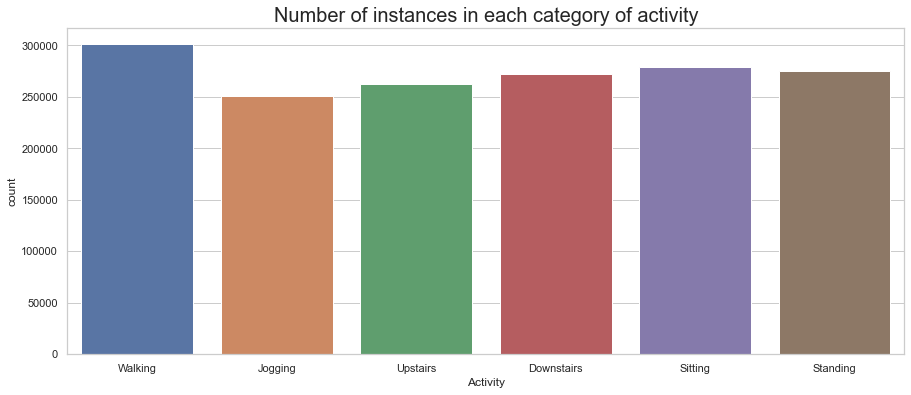

In [240]:
# plot balance of classes in new training data
sns.set_style('whitegrid')

plt.figure(figsize=(15,6))
plt.title('Number of instances in each category of activity', fontsize=20)
ax = sns.countplot(x=wisdm_train_balanced["activity"])
ax.set(xlabel='Activity')
plt.show()

The data is much more balanced now

### Repeat pre-processing steps for the balanced data

Make new variables `trainX_balanced` and `trainy_balanced` and `trainy_raw_balanced` to be used in the models

#### Normalise data

To keep consistent with UCI dataset, normalise between -1 and 1

In [241]:
# Normalise training data
train_cols = wisdm_train_balanced[['x-acc', 'y-acc', "z-acc"]].values
scaler = preprocessing.MinMaxScaler(feature_range=(-1, 1))
scaler.fit(train_cols)
train_scaled = scaler.transform(train_cols)

train_scaled_x = []
train_scaled_y = []
train_scaled_z = []


for i in range(len(train_scaled)):
    train_scaled_x.append(train_scaled[i][0])
    train_scaled_y.append(train_scaled[i][1])
    train_scaled_z.append(train_scaled[i][2])

#### Segment data into windows

In [242]:
# function to segment features, adapted from https://towardsdatascience.com/human-activity-recognition-har-tutorial-with-keras-and-core-ml-part-1-8c05e365dfa0
def create_segments(feature, time_steps=N_TIME_STEPS, step_distance=STEP_DISTANCE):
    
    segments = []
    
    
    for i in range(0, len(feature) - time_steps, step_distance):
        segment = feature[i: i + time_steps]
        segments.append(segment)
        
    return np.array(segments)

In [243]:
# segment training data
train_seg_x = create_segments(feature=train_scaled_x)
train_seg_y = create_segments(feature=train_scaled_y)
train_seg_z = create_segments(feature=train_scaled_z)

In [244]:
# check function works correctly, with 50% overlap
print(train_seg_z[0][21])
print(train_seg_z[1][0])
print(train_seg_z[0][41])
print(train_seg_z[1][20])
print(type(train_seg_z))

-0.006929505709210672
-0.006929505709210672
0.12163607713778249
0.12163607713778249
<class 'numpy.ndarray'>


In [245]:
# get training data to same shape as with the other dataset
trainX_balanced = list()
trainX_balanced.append(train_seg_x)
trainX_balanced.append(train_seg_y)
trainX_balanced.append(train_seg_z)
# make it a 3d array [samples, time steps, features])
trainX_balanced = dstack(trainX_balanced)

trainX_balanced.shape

(78137, 42, 3)

In [246]:
# segment the y data
trainy_segmented = create_segments(wisdm_train_balanced["ActivityEncoded"])

In [247]:
# get most common activity for each time window
trainy_segmented_mode=list()

for i in range(len(trainy_segmented)):
    label = stats.mode(trainy_segmented[i])[0][0]
    trainy_segmented_mode.append(label)

# check this is same as lenght of trainX
len(trainy_segmented_mode)

78137

In [248]:
# make trainy and testy categorical
trainy_balanced = to_categorical(trainy_segmented_mode)

# make a version of trainy_balanced that works in the dac model
trainy_raw_balanced = np.array(trainy_segmented_mode).reshape(len(trainy_segmented_mode), 1)

print(trainy.shape)
print(testy.shape)

(37068, 6)
(15224, 6)


In [255]:
# adapted from https://machinelearningmastery.com/how-to-model-human-activity-from-smartphone-data/
# plot the data for one participant
def plot_subject(X, y):
    plt.figure(figsize=(15,8))
    # determine the total number of plots
    n, off = X.shape[2] + 1, 0
    # plot total acc
    for i in range(3):
        plt.subplot(n, 1, off+1)
        plt.plot(to_series(X[:, :, off]))
        direction = "AAAAAAAAAAAAAA"
        if (i == 0):
            direction = "x"
        elif (i == 1):
            direction = "y"
        else:
            direction = "z"
        plt.title('total acc '+str(direction), y=0, loc='left')
        off += 1
        plt.xlabel("Time step")
        
    # plot activities
    plt.subplot(n, 1, n)
    plt.xlabel("Time step")
    
    # make space so plots don't overlap
    plt.tight_layout()
    plt.plot(y+1)
    plt.ylim(0,7)
    plt.title('activity', y=0, loc='left')
    plt.show()
    

train_subjects:  [ 1  2  3  4  5  6  7  8  9 10 11 12 13 14 15 16 17 18 19 20 21 22 23 24
 25 26]
(10350, 42, 3) (10350, 1)


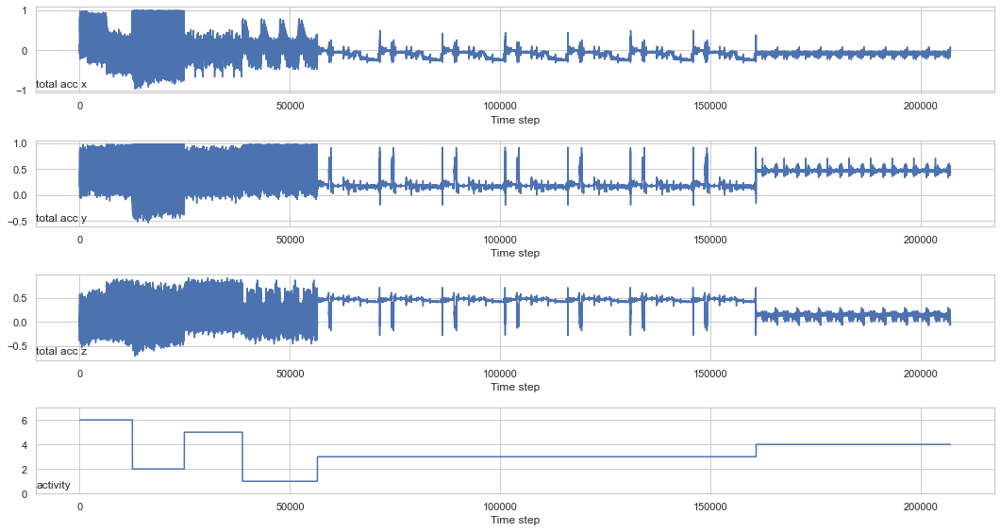

In [256]:
# adapted from https://machinelearningmastery.com/how-to-model-human-activity-from-smartphone-data/
# use all the functions above to visualiase the accelerometer data for one ppant

# load mapping of rows to subjects
sub_map_train = wisdm_train_balanced['user'].reset_index(drop = True)
train_subjects = unique(sub_map_train)
# segment this subjects data for cosistency
sub_map_train = create_segments(sub_map_train)
print("train_subjects: ", train_subjects)
# get user for each time window
sub_map_train_mode=list()
for i in range(len(sub_map_train)):
    label = stats.mode(sub_map_train[i])[0][0]
    sub_map_train_mode.append(label)

# get the data for 20th train subject
sub_id = train_subjects[19]
subX, suby = data_for_subject(trainX_balanced, trainy_raw_balanced, sub_map_train_mode, sub_id)
print(subX.shape, suby.shape)

# plot data for subject
plot_subject(subX, np.repeat(suby, 20))

## Dimensionality Reduction

In [250]:
wisdm_train

,user,activity,timestamp,x-acc,y-acc,z-acc,ActivityEncoded
8489,17,Walking,57869902574000,0.572055,9.806650,-0.531194,5
8490,17,Walking,57870012316000,-0.000000,10.188020,-0.572055,5
8491,17,Walking,57870122301000,-0.231546,9.847511,-0.694638,5
8492,17,Walking,57870222246000,0.149824,10.079058,-0.503953,5
8493,17,Walking,57870332292000,0.149824,10.147159,-0.612916,5
...,...,...,...,...,...,...,...
1098199,19,Sitting,131623331483000,9.000000,-1.570000,1.690000,2
1098200,19,Sitting,131623371431000,9.040000,-1.460000,1.730000,2
1098201,19,Sitting,131623411592000,9.080000,-1.380000,1.690000,2
1098202,19,Sitting,131623491487000,9.000000,-1.460000,1.730000,2


In [251]:
# make variables for each of the features in the train data
trainX_x = list()
trainX_x.append(train_seg_x)
trainX_x = dstack(trainX_x)
trainX_x.shape

trainX_y = list()
trainX_y.append(train_seg_y)
trainX_y = dstack(trainX_y)
trainX_y.shape

trainX_z = list()
trainX_z.append(train_seg_z)
trainX_z = dstack(trainX_z)
trainX_z.shape

(78137, 42, 1)

In [252]:
# make variables for each of the features in the test data
testX_x = list()
testX_x.append(test_seg_x)
testX_x = dstack(testX_x)
testX_x.shape

testX_y = list()
testX_y.append(test_seg_y)
testX_y = dstack(testX_y)
testX_y.shape

testX_z = list()
testX_z.append(test_seg_z)
testX_z = dstack(testX_z)
testX_z.shape

(15224, 42, 1)

In [ ]:
# find most imortant cols in training set
classifier = SelectFromModel(RandomForestClassifier())
classifier.fit(wisdm_train[["x-acc", "y-acc", "z-acc"]],wisdm_train["ActivityEncoded"])

In [ ]:
# show important cols
features = wisdm_train[["x-acc", "y-acc", "z-acc"]].columns[(classifier.get_support())]
print(len(features))
print(features)

In [80]:
# according to theclassifier above, y_acc is the only important classifier. let's try using just this on some models
trainX_fr, trainy_fr, testX_fr, testy_fr = trainX_y, trainy_balanced, testX_y, testy

In [81]:
print(trainX_fr.shape)
print(trainy_fr.shape)
print(testX_fr.shape)
print(testy_fr.shape)

(78137, 42, 1)
(78137, 6)
(15224, 42, 1)
(15224, 6)


## Repeat Experiments

To judge more definitively the performance of models, the model training and testing process will be repeated 10 timeas for each model.

In [82]:
# make variables to store average metrics etc

# model accuracy per epoch
repeat_epoch_accuracies_train = {}
repeat_epoch_accuracies_test = {}

# model accuracy after training completed
repeat_final_model_accuracies_train = {}
repeat_final_model_accuracies_test = {}

# get training times per model
repeat_training_times = {}

# F1 etc
repeat_precision = {}
repeat_recall = {}
repeat_f1_score = {}

In [83]:
# metrics to store mean values of the runs for each model

mean_final_model_accuracies_train = {}
mean_final_model_accuracies_test = {}
mean_precision  = {}
mean_recall = {}
mean_f1_score = {}


std_final_model_accuracies_train= {}
std_final_model_accuracies_test = {}
std_precision= {}
std_recall = {}
std_f1_score = {}

### Standard models

In [84]:
# make trimmed down vversion of run_experiment for the repeat experiments
def run_experiment_r(model_type="lstm", data = "original"):
    
    Experiment_type["type"] = "standard"
    
    print(data)
    
    # select model type, based on user input 
    if (model_type == 'lstm'):
        fit_model = fit_model_LSTM
    elif (model_type == 'cnnlstm'):
        fit_model = fit_model_CNN_LSTM
    elif (model_type == 'convlstm'):
        fit_model = fit_model_ConvLSTM
    elif (model_type == 'bilstm'):
        fit_model = fit_model_Bi_LSTM
    # print message if wrong input given
    else:
        print('INPUT ERROR. Please see the following possible inputs: ')
        print('For a LSTM model, input "lstm"')
        print('For a CNN-LSTM model, input "cnnlstm"')
        print('For a ConvLSTM model, input "convlstm"')
        print('For a Bi-LSTM model, input "bilstm"')
        return
    
    # use different datasets depending on user selection
    if (data == "original"):
        trainX_, trainy_, testX_, testy_ = trainX, trainy, testX, testy
    elif (data == "balanced"):
        trainX_, trainy_, testX_, testy_ = trainX_balanced, trainy_balanced, testX, testy
    elif (data == "reduced"):
        trainX_, trainy_, testX_, testy_ = trainX_fr, trainy_fr, testX_fr, testy_fr
    else:
        print('INPUT ERROR. Please see the following possible inputs: ')
        print('To use the original dataset, input "original"')
        print('To use the oversampled, balanced dataset, input "balanced"')
        print('To use the feature reduced dataset, input "reduced"')
        return
        
    # run model
    history, max_y_test, max_y_pred_test, max_y_pred_train, times = fit_model(trainX_, trainy_, testX_, testy_)
    # get training and test set loss
    train_loss = history.history['loss']
    test_loss = history.history['val_loss']
    # get training and test accuracy
    train_accuracy = history.history['accuracy']
    test_accuracy = history.history['val_accuracy']    
    # set number of epochs to be dynamic, depending how long experiment runs for
    epochs = range(0,len(test_accuracy))
    
    # do normalised cm
    cm = ConfusionMatrix(actual_vector=max_y_test, predict_vector=max_y_pred_test) # Create CM From Data
    cm.plot(cmap=plt.cm.Reds,normalized=True,number_label=True,plot_lib="seaborn")
    
    # return metrics
    return (train_accuracy, 
    test_accuracy,
    train_accuracy[-1],
    test_accuracy[-1],
    np.cumsum(times),
    metrics.precision_score(max_y_test, max_y_pred_test, average='weighted'),
    metrics.recall_score(max_y_test, max_y_pred_test, average='weighted'),
    metrics.f1_score(max_y_test, max_y_pred_test, average='weighted')
    )

In [85]:
# repeat experiment. choose "original", "balanced", or "reduced"  dataset
def repeat_experiment(repeats=REPEATS, model_type="lstm", data = "original"):
    
    Experiment_type["type"] = "standard"
    
    final_model_accuracies_train = list() 
    final_model_accuracies_test = list()
    precision = list()
    recall = list()
    f1_score = list()
    
    # store model name for storage of results and analysis
    model_name = model_type + "_" + data
    
    # repeat model, storing values each time
    for i in range(repeats):
        print("Run: ", i+1)
        a,b,c,d,e,f,g,h = run_experiment_r(model_type=model_type, data = data)
        
        # add these to the metrics dictionaries
        repeat_epoch_accuracies_train[model_name + "_" + str(i+1)] = a
        repeat_epoch_accuracies_test[model_name + "_" + str(i+1)] = b
        repeat_final_model_accuracies_train[model_name + "_" + str(i+1)] = c
        repeat_final_model_accuracies_test[model_name + "_" + str(i+1)] = d
        repeat_training_times[model_name + "_" + str(i+1)] = e
        repeat_precision[model_name + "_" + str(i+1)] = f
        repeat_recall[model_name + "_" + str(i+1)] = g
        repeat_f1_score[model_name + "_" + str(i+1)] = h
        
        # get mean metrics for each model
        # first, store all metrics for each repeat in a list
        final_model_accuracies_train.append(c)
        final_model_accuracies_test.append(d)
        precision.append(f)
        recall.append(g)
        f1_score.append(h)
        # calculate means
        mean_final_model_accuracies_train[model_name] = mean(final_model_accuracies_train)
        mean_final_model_accuracies_test[model_name] = mean(final_model_accuracies_test)
        mean_precision[model_name] = mean(precision)
        mean_recall[model_name] = mean(recall)
        mean_f1_score[model_name] = mean(f1_score)
        # calculate dtandard deviation
        std_final_model_accuracies_train[model_name] = std(final_model_accuracies_train)
        std_final_model_accuracies_test[model_name] = std(final_model_accuracies_test)
        std_precision[model_name] = std(precision)
        std_recall[model_name] = std(recall)
        std_f1_score[model_name] = std(f1_score)

#### Test run

##### Original data

Run:  1
original
LSTM
Epoch 1/5000
580/580 [==============================] - 7s 6ms/step - loss: 0.9935 - accuracy: 0.6485 - val_loss: 1.0422 - val_accuracy: 0.6689
Epoch 2/5000
580/580 [==============================] - 3s 6ms/step - loss: 0.6310 - accuracy: 0.7760 - val_loss: 0.9031 - val_accuracy: 0.6874
Epoch 3/5000
580/580 [==============================] - 3s 6ms/step - loss: 0.5290 - accuracy: 0.8086 - val_loss: 1.1473 - val_accuracy: 0.7128
Epoch 4/5000
580/580 [==============================] - 3s 6ms/step - loss: 0.4152 - accuracy: 0.8491 - val_loss: 0.9460 - val_accuracy: 0.7461
Epoch 5/5000
580/580 [==============================] - 3s 6ms/step - loss: 0.3683 - accuracy: 0.8629 - val_loss: 0.7861 - val_accuracy: 0.7538
Epoch 6/5000
580/580 [==============================] - 3s 6ms/step - loss: 0.3367 - accuracy: 0.8723 - val_loss: 1.0833 - val_accuracy: 0.7306
Epoch 7/5000
580/580 [==============================] - 3s 6ms/step - loss: 0.3064 - accuracy: 0.8862 - val_loss: 

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  2
original
LSTM
Epoch 1/5000
580/580 [==============================] - 4s 6ms/step - loss: 0.9858 - accuracy: 0.6500 - val_loss: 0.8801 - val_accuracy: 0.6781
Epoch 2/5000
580/580 [==============================] - 3s 6ms/step - loss: 0.6252 - accuracy: 0.7779 - val_loss: 0.7976 - val_accuracy: 0.6867
Epoch 3/5000
580/580 [==============================] - 3s 6ms/step - loss: 0.5248 - accuracy: 0.8122 - val_loss: 0.7856 - val_accuracy: 0.7458
Epoch 4/5000
580/580 [==============================] - 3s 6ms/step - loss: 0.4181 - accuracy: 0.8479 - val_loss: 0.8715 - val_accuracy: 0.7675
Epoch 5/5000
580/580 [==============================] - 3s 6ms/step - loss: 0.3510 - accuracy: 0.8714 - val_loss: 0.8326 - val_accuracy: 0.7606
Epoch 6/5000
580/580 [==============================] - 3s 6ms/step - loss: 0.3017 - accuracy: 0.8913 - val_loss: 0.8753 - val_accuracy: 0.7730
Epoch 7/5000
580/580 [==============================] - 3s 6ms/step - loss: 0.2654 - accuracy: 0.9086 - val_loss: 

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  3
original
LSTM
Epoch 1/5000
580/580 [==============================] - 4s 6ms/step - loss: 1.0225 - accuracy: 0.6363 - val_loss: 0.9622 - val_accuracy: 0.6676
Epoch 2/5000
580/580 [==============================] - 3s 6ms/step - loss: 0.6188 - accuracy: 0.7747 - val_loss: 0.9066 - val_accuracy: 0.6963
Epoch 3/5000
580/580 [==============================] - 3s 6ms/step - loss: 0.5220 - accuracy: 0.8110 - val_loss: 1.1585 - val_accuracy: 0.7148
Epoch 4/5000
580/580 [==============================] - 3s 6ms/step - loss: 0.4482 - accuracy: 0.8335 - val_loss: 1.0585 - val_accuracy: 0.7221
Epoch 5/5000
580/580 [==============================] - 3s 6ms/step - loss: 0.3705 - accuracy: 0.8633 - val_loss: 0.9345 - val_accuracy: 0.7371
Epoch 6/5000
580/580 [==============================] - 3s 6ms/step - loss: 0.3304 - accuracy: 0.8810 - val_loss: 0.8471 - val_accuracy: 0.7733
Epoch 7/5000
580/580 [==============================] - 3s 6ms/step - loss: 0.2870 - accuracy: 0.8959 - val_loss: 

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  4
original
LSTM
Epoch 1/5000
580/580 [==============================] - 5s 6ms/step - loss: 0.9945 - accuracy: 0.6466 - val_loss: 0.8904 - val_accuracy: 0.7054
Epoch 2/5000
580/580 [==============================] - 3s 6ms/step - loss: 0.6114 - accuracy: 0.7797 - val_loss: 0.9551 - val_accuracy: 0.6366
Epoch 3/5000
580/580 [==============================] - 3s 6ms/step - loss: 0.4935 - accuracy: 0.8196 - val_loss: 0.7508 - val_accuracy: 0.7669
Epoch 4/5000
580/580 [==============================] - 3s 6ms/step - loss: 0.3993 - accuracy: 0.8538 - val_loss: 0.8321 - val_accuracy: 0.7653
Epoch 5/5000
580/580 [==============================] - 3s 6ms/step - loss: 0.3392 - accuracy: 0.8771 - val_loss: 0.7868 - val_accuracy: 0.7878
Epoch 6/5000
580/580 [==============================] - 3s 6ms/step - loss: 0.2860 - accuracy: 0.9002 - val_loss: 0.8170 - val_accuracy: 0.7792
Epoch 7/5000
580/580 [==============================] - 3s 6ms/step - loss: 0.2503 - accuracy: 0.9123 - val_loss: 

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  5
original
LSTM
Epoch 1/5000
580/580 [==============================] - 4s 6ms/step - loss: 1.0243 - accuracy: 0.6320 - val_loss: 1.1103 - val_accuracy: 0.6707
Epoch 2/5000
580/580 [==============================] - 3s 6ms/step - loss: 0.6297 - accuracy: 0.7777 - val_loss: 0.7908 - val_accuracy: 0.6926
Epoch 3/5000
580/580 [==============================] - 3s 6ms/step - loss: 0.5132 - accuracy: 0.8138 - val_loss: 0.7513 - val_accuracy: 0.7453
Epoch 4/5000
580/580 [==============================] - 3s 6ms/step - loss: 0.4064 - accuracy: 0.8525 - val_loss: 0.8791 - val_accuracy: 0.7124
Epoch 5/5000
580/580 [==============================] - 3s 6ms/step - loss: 0.3573 - accuracy: 0.8663 - val_loss: 1.0445 - val_accuracy: 0.7421
Epoch 6/5000
580/580 [==============================] - 3s 6ms/step - loss: 0.3116 - accuracy: 0.8855 - val_loss: 0.9351 - val_accuracy: 0.7824
Epoch 7/5000
580/580 [==============================] - 3s 6ms/step - loss: 0.2767 - accuracy: 0.9002 - val_loss: 

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  6
original
LSTM
Epoch 1/5000
580/580 [==============================] - 4s 6ms/step - loss: 0.9993 - accuracy: 0.6433 - val_loss: 1.0805 - val_accuracy: 0.6679
Epoch 2/5000
580/580 [==============================] - 3s 6ms/step - loss: 0.6214 - accuracy: 0.7799 - val_loss: 0.9186 - val_accuracy: 0.7075
Epoch 3/5000
580/580 [==============================] - 3s 6ms/step - loss: 0.4834 - accuracy: 0.8257 - val_loss: 0.9961 - val_accuracy: 0.7130
Epoch 4/5000
580/580 [==============================] - 3s 6ms/step - loss: 0.3875 - accuracy: 0.8575 - val_loss: 0.9865 - val_accuracy: 0.7690
Epoch 5/5000
580/580 [==============================] - 3s 6ms/step - loss: 0.3364 - accuracy: 0.8793 - val_loss: 1.0604 - val_accuracy: 0.7738
Epoch 6/5000
580/580 [==============================] - 3s 6ms/step - loss: 0.2974 - accuracy: 0.8953 - val_loss: 1.1261 - val_accuracy: 0.7654
Epoch 7/5000
580/580 [==============================] - 3s 6ms/step - loss: 0.2608 - accuracy: 0.9089 - val_loss: 

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  7
original
LSTM
Epoch 1/5000
580/580 [==============================] - 4s 6ms/step - loss: 1.0148 - accuracy: 0.6391 - val_loss: 1.3113 - val_accuracy: 0.6229
Epoch 2/5000
580/580 [==============================] - 3s 6ms/step - loss: 0.6247 - accuracy: 0.7781 - val_loss: 0.8856 - val_accuracy: 0.7081
Epoch 3/5000
580/580 [==============================] - 3s 6ms/step - loss: 0.5079 - accuracy: 0.8175 - val_loss: 1.1318 - val_accuracy: 0.7026
Epoch 4/5000
580/580 [==============================] - 3s 6ms/step - loss: 0.4139 - accuracy: 0.8472 - val_loss: 1.0940 - val_accuracy: 0.7591
Epoch 5/5000
580/580 [==============================] - 3s 6ms/step - loss: 0.3546 - accuracy: 0.8687 - val_loss: 1.0090 - val_accuracy: 0.7611
Epoch 6/5000
580/580 [==============================] - 3s 6ms/step - loss: 0.3020 - accuracy: 0.8918 - val_loss: 0.8474 - val_accuracy: 0.7864
Epoch 7/5000
580/580 [==============================] - 3s 6ms/step - loss: 0.2654 - accuracy: 0.9065 - val_loss: 

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  8
original
LSTM
Epoch 1/5000
580/580 [==============================] - 5s 6ms/step - loss: 0.9907 - accuracy: 0.6468 - val_loss: 1.3228 - val_accuracy: 0.5208
Epoch 2/5000
580/580 [==============================] - 3s 6ms/step - loss: 0.6488 - accuracy: 0.7679 - val_loss: 0.9347 - val_accuracy: 0.6886
Epoch 3/5000
580/580 [==============================] - 3s 6ms/step - loss: 0.5245 - accuracy: 0.8121 - val_loss: 0.8972 - val_accuracy: 0.7362
Epoch 4/5000
580/580 [==============================] - 3s 6ms/step - loss: 0.4284 - accuracy: 0.8414 - val_loss: 1.0177 - val_accuracy: 0.7519
Epoch 5/5000
580/580 [==============================] - 3s 6ms/step - loss: 0.3426 - accuracy: 0.8733 - val_loss: 0.9086 - val_accuracy: 0.7659
Epoch 6/5000
580/580 [==============================] - 3s 6ms/step - loss: 0.2890 - accuracy: 0.8965 - val_loss: 0.7184 - val_accuracy: 0.7929
Epoch 7/5000
580/580 [==============================] - 3s 6ms/step - loss: 0.2484 - accuracy: 0.9136 - val_loss: 

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  9
original
LSTM
Epoch 1/5000
580/580 [==============================] - 4s 6ms/step - loss: 1.0138 - accuracy: 0.6392 - val_loss: 1.4426 - val_accuracy: 0.6190
Epoch 2/5000
580/580 [==============================] - 3s 6ms/step - loss: 0.6379 - accuracy: 0.7742 - val_loss: 0.8899 - val_accuracy: 0.7093
Epoch 3/5000
580/580 [==============================] - 3s 6ms/step - loss: 0.4995 - accuracy: 0.8190 - val_loss: 0.8743 - val_accuracy: 0.7455
Epoch 4/5000
580/580 [==============================] - 3s 6ms/step - loss: 0.3922 - accuracy: 0.8571 - val_loss: 0.8560 - val_accuracy: 0.7556
Epoch 5/5000
580/580 [==============================] - 3s 6ms/step - loss: 0.3514 - accuracy: 0.8700 - val_loss: 0.8020 - val_accuracy: 0.7830
Epoch 6/5000
580/580 [==============================] - 3s 6ms/step - loss: 0.3074 - accuracy: 0.8894 - val_loss: 0.8719 - val_accuracy: 0.7802
Epoch 7/5000
580/580 [==============================] - 3s 6ms/step - loss: 0.2710 - accuracy: 0.9044 - val_loss: 

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  10
original
LSTM
Epoch 1/5000
580/580 [==============================] - 4s 6ms/step - loss: 0.9929 - accuracy: 0.6423 - val_loss: 1.1570 - val_accuracy: 0.6644
Epoch 2/5000
580/580 [==============================] - 3s 6ms/step - loss: 0.6314 - accuracy: 0.7738 - val_loss: 1.0332 - val_accuracy: 0.7167
Epoch 3/5000
580/580 [==============================] - 3s 6ms/step - loss: 0.5182 - accuracy: 0.8122 - val_loss: 1.0357 - val_accuracy: 0.7153
Epoch 4/5000
580/580 [==============================] - 3s 6ms/step - loss: 0.4165 - accuracy: 0.8458 - val_loss: 0.9360 - val_accuracy: 0.7384
Epoch 5/5000
580/580 [==============================] - 3s 6ms/step - loss: 0.3401 - accuracy: 0.8772 - val_loss: 0.8675 - val_accuracy: 0.7884
Epoch 6/5000
580/580 [==============================] - 3s 6ms/step - loss: 0.2873 - accuracy: 0.8971 - val_loss: 0.6759 - val_accuracy: 0.7821
Epoch 7/5000
580/580 [==============================] - 3s 6ms/step - loss: 0.2572 - accuracy: 0.9074 - val_loss:

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


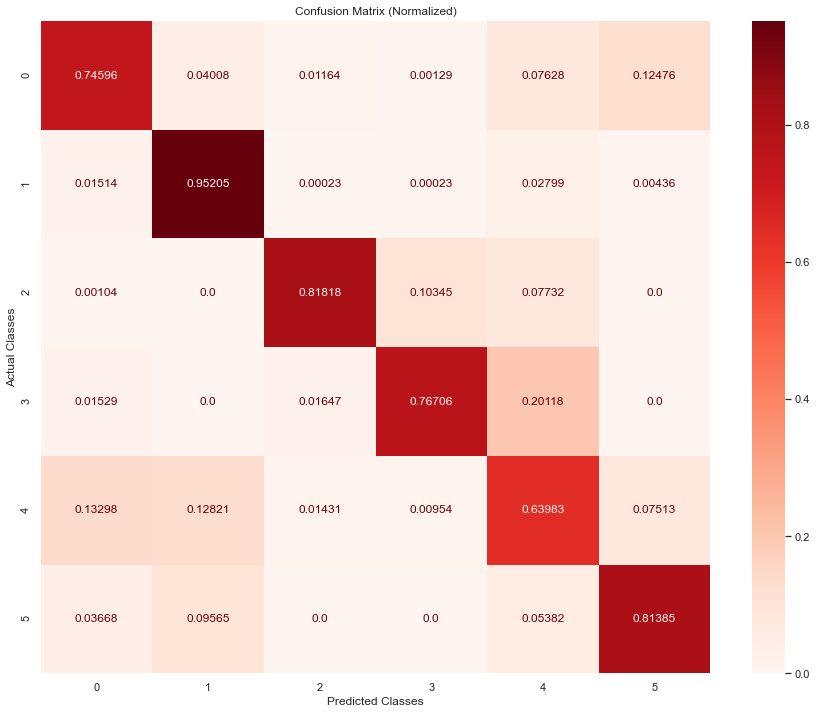

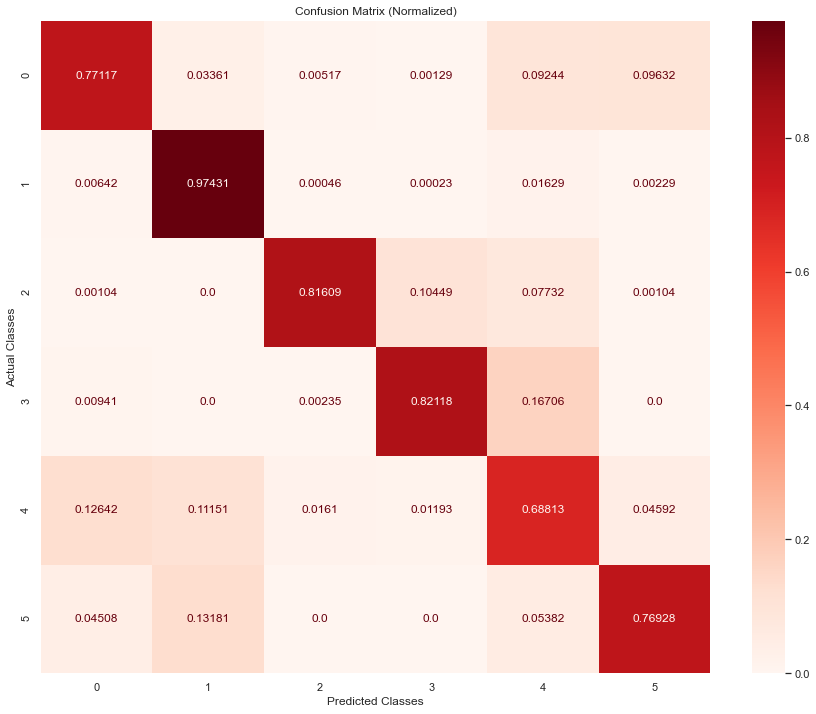

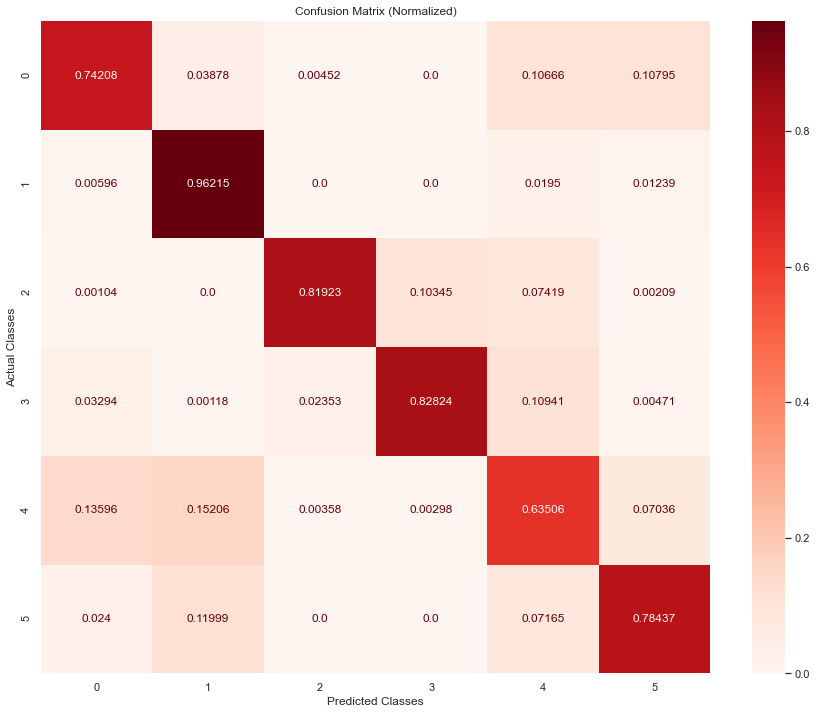

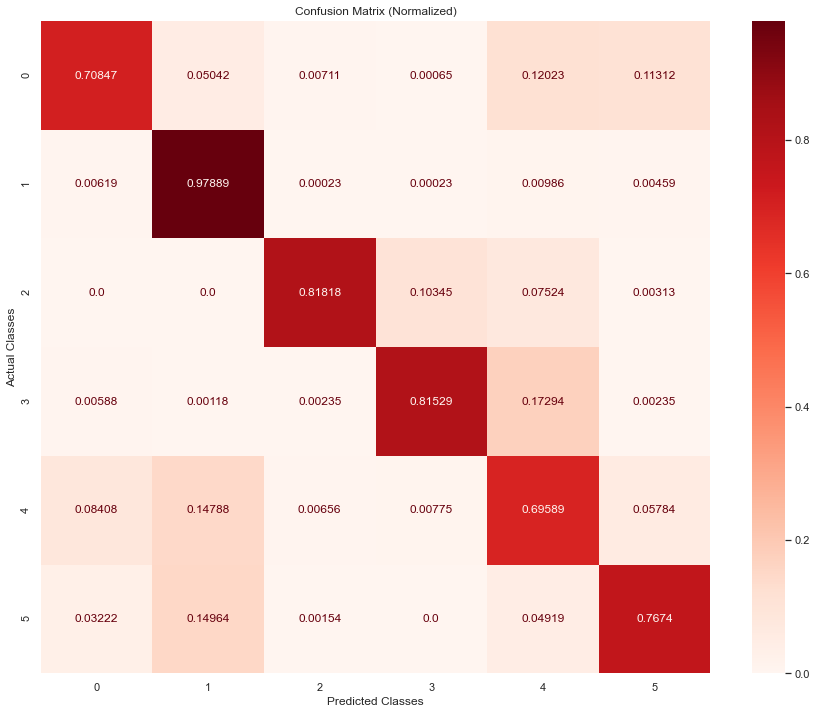

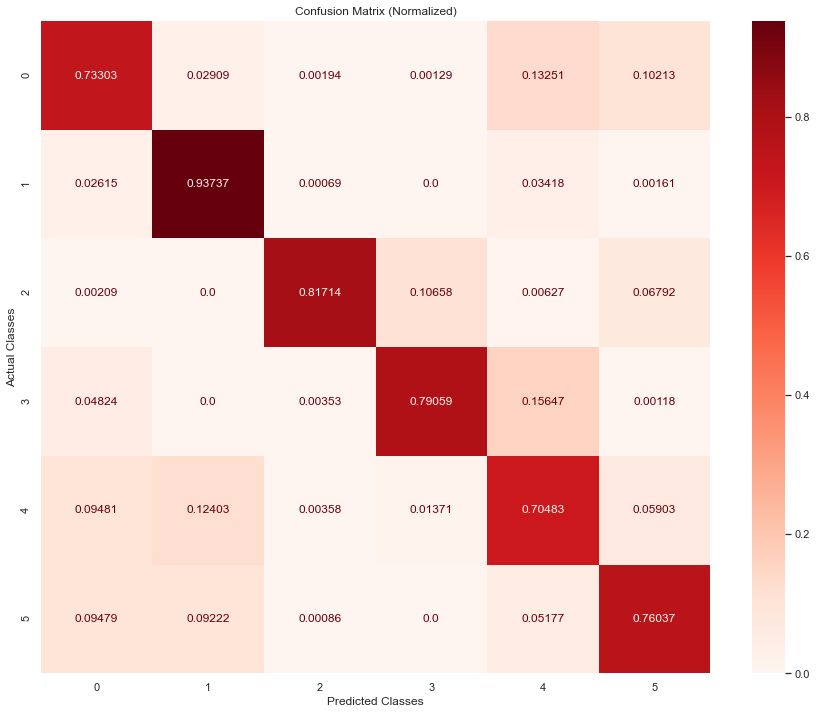

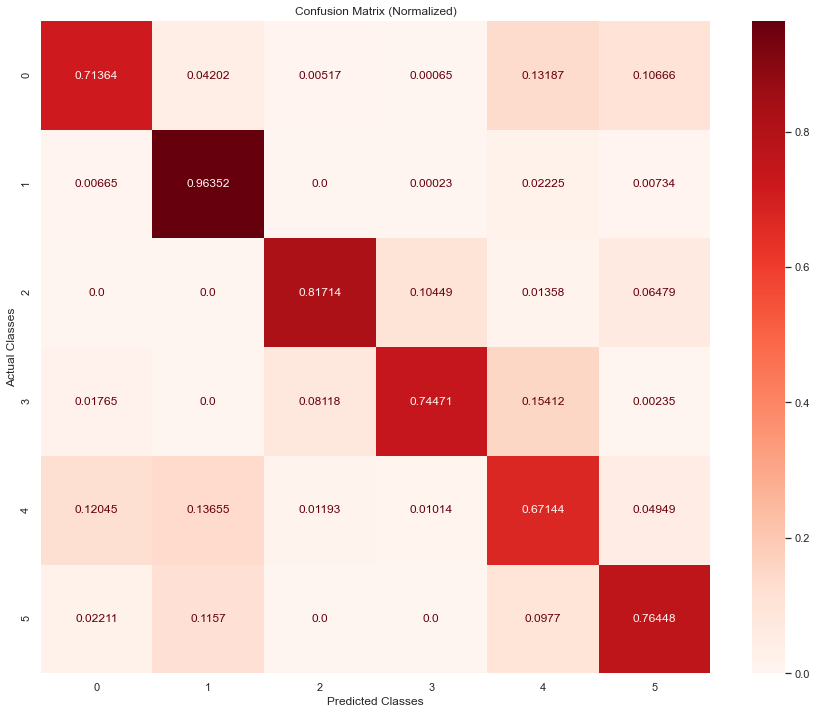

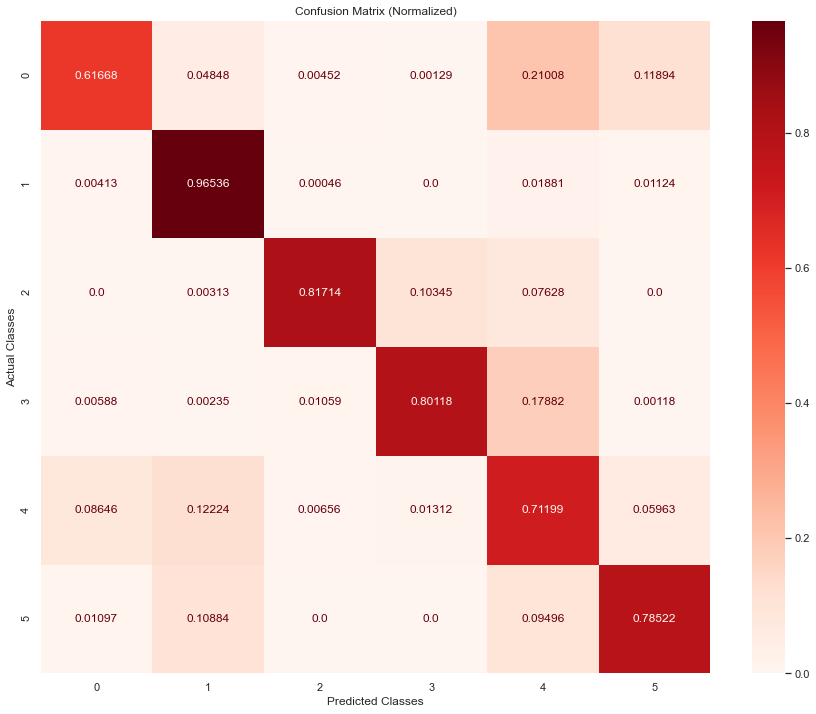

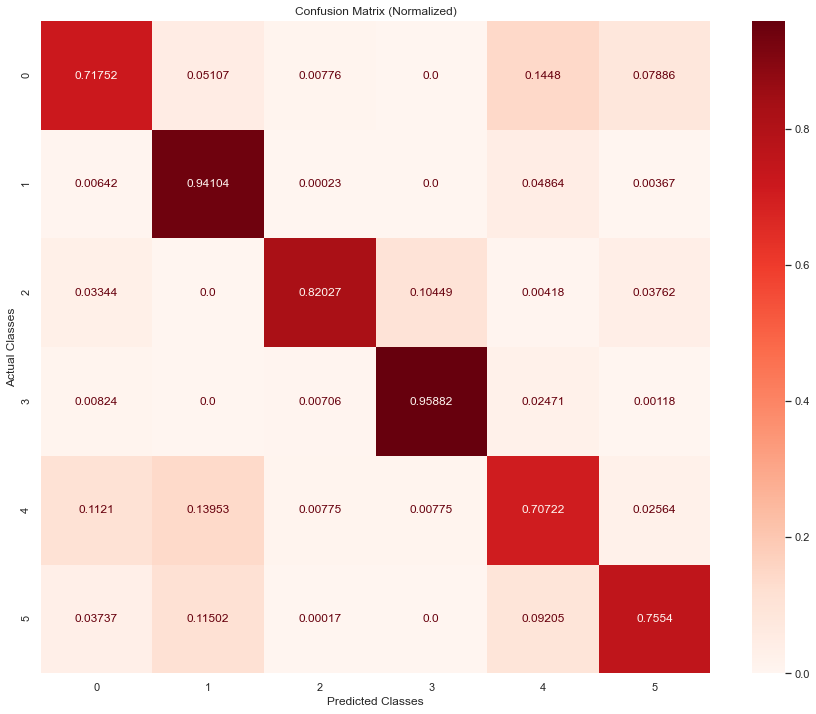

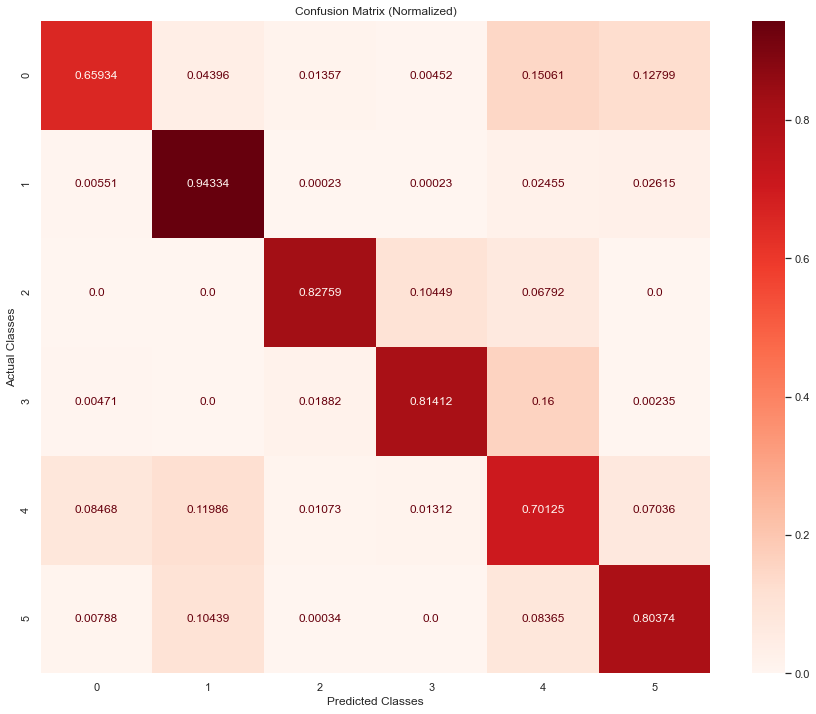

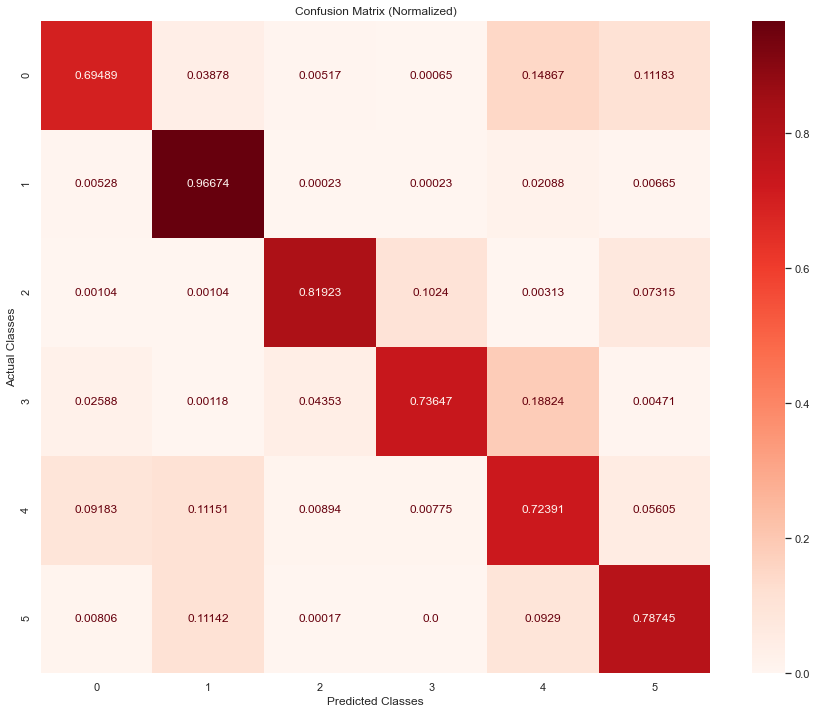

In [86]:
repeat_experiment(model_type="lstm")

Run:  1
original
CNN-LSTM
Epoch 1/5000
580/580 [==============================] - 6s 5ms/step - loss: 0.5865 - accuracy: 0.7869 - val_loss: 0.8128 - val_accuracy: 0.7733
Epoch 2/5000
580/580 [==============================] - 3s 5ms/step - loss: 0.3544 - accuracy: 0.8669 - val_loss: 0.6342 - val_accuracy: 0.7800
Epoch 3/5000
580/580 [==============================] - 3s 5ms/step - loss: 0.2789 - accuracy: 0.8961 - val_loss: 0.7267 - val_accuracy: 0.7909
Epoch 4/5000
580/580 [==============================] - 3s 5ms/step - loss: 0.2318 - accuracy: 0.9138 - val_loss: 0.7349 - val_accuracy: 0.8104
Epoch 5/5000
580/580 [==============================] - 3s 5ms/step - loss: 0.1941 - accuracy: 0.9296 - val_loss: 0.7972 - val_accuracy: 0.8097
Epoch 6/5000
580/580 [==============================] - 3s 5ms/step - loss: 0.1738 - accuracy: 0.9375 - val_loss: 0.7819 - val_accuracy: 0.7998
Epoch 7/5000
580/580 [==============================] - 3s 5ms/step - loss: 0.1562 - accuracy: 0.9456 - val_lo

580/580 [==============================] - 3s 4ms/step - loss: 0.0176 - accuracy: 0.9947 - val_loss: 1.5967 - val_accuracy: 0.8275
Epoch 114/5000
580/580 [==============================] - 3s 4ms/step - loss: 0.0151 - accuracy: 0.9953 - val_loss: 1.5600 - val_accuracy: 0.8252
Epoch 115/5000
580/580 [==============================] - 3s 4ms/step - loss: 0.0170 - accuracy: 0.9946 - val_loss: 1.5178 - val_accuracy: 0.8278
Timed stopping at epoch 115 after training for 0:05:00


c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  2
original
CNN-LSTM
Epoch 1/5000
580/580 [==============================] - 4s 5ms/step - loss: 0.5857 - accuracy: 0.7909 - val_loss: 0.8596 - val_accuracy: 0.7764
Epoch 2/5000
580/580 [==============================] - 3s 4ms/step - loss: 0.3546 - accuracy: 0.8711 - val_loss: 0.7921 - val_accuracy: 0.8015
Epoch 3/5000
580/580 [==============================] - 3s 4ms/step - loss: 0.2720 - accuracy: 0.9023 - val_loss: 0.8268 - val_accuracy: 0.8043
Epoch 4/5000
580/580 [==============================] - 3s 4ms/step - loss: 0.2112 - accuracy: 0.9248 - val_loss: 0.8831 - val_accuracy: 0.8101
Epoch 5/5000
580/580 [==============================] - 3s 4ms/step - loss: 0.1851 - accuracy: 0.9354 - val_loss: 0.8513 - val_accuracy: 0.7848
Epoch 6/5000
580/580 [==============================] - 3s 4ms/step - loss: 0.1664 - accuracy: 0.9426 - val_loss: 0.8281 - val_accuracy: 0.8058
Epoch 7/5000
580/580 [==============================] - 3s 4ms/step - loss: 0.1499 - accuracy: 0.9486 - val_lo

580/580 [==============================] - 3s 4ms/step - loss: 0.0133 - accuracy: 0.9960 - val_loss: 1.5043 - val_accuracy: 0.8378
Epoch 114/5000
580/580 [==============================] - 3s 4ms/step - loss: 0.0152 - accuracy: 0.9946 - val_loss: 1.5762 - val_accuracy: 0.8306
Epoch 115/5000
580/580 [==============================] - 3s 5ms/step - loss: 0.0152 - accuracy: 0.9955 - val_loss: 1.6425 - val_accuracy: 0.8293
Timed stopping at epoch 115 after training for 0:05:00


c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  3
original
CNN-LSTM
Epoch 1/5000
580/580 [==============================] - 4s 5ms/step - loss: 0.5697 - accuracy: 0.7964 - val_loss: 0.8619 - val_accuracy: 0.7630
Epoch 2/5000
580/580 [==============================] - 3s 5ms/step - loss: 0.3299 - accuracy: 0.8794 - val_loss: 0.8796 - val_accuracy: 0.8012
Epoch 3/5000
580/580 [==============================] - 3s 5ms/step - loss: 0.2535 - accuracy: 0.9070 - val_loss: 0.8446 - val_accuracy: 0.7889
Epoch 4/5000
580/580 [==============================] - 3s 5ms/step - loss: 0.2118 - accuracy: 0.9245 - val_loss: 0.8471 - val_accuracy: 0.8165
Epoch 5/5000
580/580 [==============================] - 3s 5ms/step - loss: 0.1812 - accuracy: 0.9371 - val_loss: 0.8628 - val_accuracy: 0.8123
Epoch 6/5000
580/580 [==============================] - 3s 4ms/step - loss: 0.1644 - accuracy: 0.9431 - val_loss: 0.9139 - val_accuracy: 0.7940
Epoch 7/5000
580/580 [==============================] - 3s 5ms/step - loss: 0.1471 - accuracy: 0.9493 - val_lo

580/580 [==============================] - 3s 5ms/step - loss: 0.0154 - accuracy: 0.9948 - val_loss: 1.5675 - val_accuracy: 0.8403
Epoch 114/5000
580/580 [==============================] - 3s 5ms/step - loss: 0.0154 - accuracy: 0.9948 - val_loss: 1.8239 - val_accuracy: 0.8275
Epoch 115/5000
580/580 [==============================] - 3s 5ms/step - loss: 0.0130 - accuracy: 0.9957 - val_loss: 1.6541 - val_accuracy: 0.8395
Timed stopping at epoch 115 after training for 0:05:00


c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  4
original
CNN-LSTM
Epoch 1/5000
580/580 [==============================] - 4s 5ms/step - loss: 0.5828 - accuracy: 0.7908 - val_loss: 0.8167 - val_accuracy: 0.7581
Epoch 2/5000
580/580 [==============================] - 3s 4ms/step - loss: 0.3425 - accuracy: 0.8725 - val_loss: 0.8248 - val_accuracy: 0.7966
Epoch 3/5000
580/580 [==============================] - 3s 4ms/step - loss: 0.2608 - accuracy: 0.9056 - val_loss: 0.8129 - val_accuracy: 0.7939
Epoch 4/5000
580/580 [==============================] - 3s 5ms/step - loss: 0.2144 - accuracy: 0.9243 - val_loss: 0.8187 - val_accuracy: 0.8085
Epoch 5/5000
580/580 [==============================] - 3s 5ms/step - loss: 0.1885 - accuracy: 0.9340 - val_loss: 0.8421 - val_accuracy: 0.8103
Epoch 6/5000
580/580 [==============================] - 3s 5ms/step - loss: 0.1633 - accuracy: 0.9425 - val_loss: 0.8085 - val_accuracy: 0.8175
Epoch 7/5000
580/580 [==============================] - 3s 4ms/step - loss: 0.1497 - accuracy: 0.9494 - val_lo

580/580 [==============================] - 3s 4ms/step - loss: 0.0139 - accuracy: 0.9952 - val_loss: 1.8627 - val_accuracy: 0.8344
Epoch 114/5000
580/580 [==============================] - 3s 4ms/step - loss: 0.0151 - accuracy: 0.9952 - val_loss: 1.6166 - val_accuracy: 0.8416
Epoch 115/5000
580/580 [==============================] - 3s 4ms/step - loss: 0.0153 - accuracy: 0.9950 - val_loss: 1.6695 - val_accuracy: 0.8374
Epoch 116/5000
580/580 [==============================] - 3s 4ms/step - loss: 0.0159 - accuracy: 0.9946 - val_loss: 1.6678 - val_accuracy: 0.8471
Timed stopping at epoch 116 after training for 0:05:00


c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  5
original
CNN-LSTM
Epoch 1/5000
580/580 [==============================] - 4s 5ms/step - loss: 0.5727 - accuracy: 0.7959 - val_loss: 0.8574 - val_accuracy: 0.7425
Epoch 2/5000
580/580 [==============================] - 3s 5ms/step - loss: 0.3510 - accuracy: 0.8686 - val_loss: 0.7793 - val_accuracy: 0.7791
Epoch 3/5000
580/580 [==============================] - 3s 5ms/step - loss: 0.2730 - accuracy: 0.9004 - val_loss: 0.7562 - val_accuracy: 0.7962
Epoch 4/5000
580/580 [==============================] - 3s 4ms/step - loss: 0.2180 - accuracy: 0.9203 - val_loss: 0.8974 - val_accuracy: 0.7876
Epoch 5/5000
580/580 [==============================] - 3s 5ms/step - loss: 0.1859 - accuracy: 0.9353 - val_loss: 0.7911 - val_accuracy: 0.8033
Epoch 6/5000
580/580 [==============================] - 3s 5ms/step - loss: 0.1668 - accuracy: 0.9412 - val_loss: 0.7833 - val_accuracy: 0.7930
Epoch 7/5000
580/580 [==============================] - 3s 5ms/step - loss: 0.1543 - accuracy: 0.9473 - val_lo

580/580 [==============================] - 3s 5ms/step - loss: 0.0170 - accuracy: 0.9945 - val_loss: 1.5506 - val_accuracy: 0.8355
Epoch 114/5000
580/580 [==============================] - 3s 4ms/step - loss: 0.0160 - accuracy: 0.9949 - val_loss: 1.5695 - val_accuracy: 0.8267
Epoch 115/5000
580/580 [==============================] - 3s 4ms/step - loss: 0.0140 - accuracy: 0.9960 - val_loss: 1.8323 - val_accuracy: 0.8265
Epoch 116/5000
580/580 [==============================] - 3s 4ms/step - loss: 0.0159 - accuracy: 0.9953 - val_loss: 1.6390 - val_accuracy: 0.8303
Timed stopping at epoch 116 after training for 0:05:00


c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  6
original
CNN-LSTM
Epoch 1/5000
580/580 [==============================] - 4s 5ms/step - loss: 0.6000 - accuracy: 0.7862 - val_loss: 0.7670 - val_accuracy: 0.7705
Epoch 2/5000
580/580 [==============================] - 3s 4ms/step - loss: 0.3551 - accuracy: 0.8686 - val_loss: 0.8099 - val_accuracy: 0.7844
Epoch 3/5000
580/580 [==============================] - 3s 4ms/step - loss: 0.2757 - accuracy: 0.8991 - val_loss: 0.9208 - val_accuracy: 0.7926
Epoch 4/5000
580/580 [==============================] - 3s 4ms/step - loss: 0.2264 - accuracy: 0.9179 - val_loss: 0.9014 - val_accuracy: 0.8184
Epoch 5/5000
580/580 [==============================] - 3s 4ms/step - loss: 0.1914 - accuracy: 0.9316 - val_loss: 0.9354 - val_accuracy: 0.7927
Epoch 6/5000
580/580 [==============================] - 3s 4ms/step - loss: 0.1706 - accuracy: 0.9405 - val_loss: 0.8961 - val_accuracy: 0.7815
Epoch 7/5000
580/580 [==============================] - 3s 4ms/step - loss: 0.1583 - accuracy: 0.9467 - val_lo

580/580 [==============================] - 3s 5ms/step - loss: 0.0180 - accuracy: 0.9945 - val_loss: 1.3333 - val_accuracy: 0.8400
Epoch 114/5000
580/580 [==============================] - 3s 5ms/step - loss: 0.0128 - accuracy: 0.9958 - val_loss: 1.6804 - val_accuracy: 0.8374
Epoch 115/5000
580/580 [==============================] - 3s 5ms/step - loss: 0.0155 - accuracy: 0.9947 - val_loss: 1.3775 - val_accuracy: 0.8382
Timed stopping at epoch 115 after training for 0:05:00


c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  7
original
CNN-LSTM
Epoch 1/5000
580/580 [==============================] - 4s 5ms/step - loss: 0.5811 - accuracy: 0.7919 - val_loss: 0.9277 - val_accuracy: 0.7583
Epoch 2/5000
580/580 [==============================] - 3s 5ms/step - loss: 0.3427 - accuracy: 0.8723 - val_loss: 0.9264 - val_accuracy: 0.7746
Epoch 3/5000
580/580 [==============================] - 3s 4ms/step - loss: 0.2660 - accuracy: 0.9015 - val_loss: 0.8802 - val_accuracy: 0.7986
Epoch 4/5000
580/580 [==============================] - 3s 4ms/step - loss: 0.2132 - accuracy: 0.9233 - val_loss: 0.9624 - val_accuracy: 0.7918
Epoch 5/5000
580/580 [==============================] - 3s 4ms/step - loss: 0.1882 - accuracy: 0.9344 - val_loss: 0.9089 - val_accuracy: 0.8005
Epoch 6/5000
580/580 [==============================] - 3s 4ms/step - loss: 0.1665 - accuracy: 0.9408 - val_loss: 0.9560 - val_accuracy: 0.8081
Epoch 7/5000
580/580 [==============================] - 3s 4ms/step - loss: 0.1514 - accuracy: 0.9484 - val_lo

580/580 [==============================] - 3s 5ms/step - loss: 0.0172 - accuracy: 0.9944 - val_loss: 1.8764 - val_accuracy: 0.8233
Epoch 114/5000
580/580 [==============================] - 3s 5ms/step - loss: 0.0177 - accuracy: 0.9949 - val_loss: 1.6949 - val_accuracy: 0.8222
Epoch 115/5000
580/580 [==============================] - 3s 5ms/step - loss: 0.0153 - accuracy: 0.9958 - val_loss: 1.7150 - val_accuracy: 0.8346
Timed stopping at epoch 115 after training for 0:05:00


c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  8
original
CNN-LSTM
Epoch 1/5000
580/580 [==============================] - 4s 5ms/step - loss: 0.5707 - accuracy: 0.7947 - val_loss: 0.8177 - val_accuracy: 0.7867
Epoch 2/5000
580/580 [==============================] - 3s 5ms/step - loss: 0.3459 - accuracy: 0.8727 - val_loss: 0.8210 - val_accuracy: 0.7771
Epoch 3/5000
580/580 [==============================] - 3s 5ms/step - loss: 0.2660 - accuracy: 0.9026 - val_loss: 0.8609 - val_accuracy: 0.7838
Epoch 4/5000
580/580 [==============================] - 3s 4ms/step - loss: 0.2237 - accuracy: 0.9177 - val_loss: 0.9119 - val_accuracy: 0.8033
Epoch 5/5000
580/580 [==============================] - 3s 4ms/step - loss: 0.1932 - accuracy: 0.9314 - val_loss: 0.8750 - val_accuracy: 0.7925
Epoch 6/5000
580/580 [==============================] - 3s 5ms/step - loss: 0.1689 - accuracy: 0.9408 - val_loss: 0.9899 - val_accuracy: 0.7995
Epoch 7/5000
580/580 [==============================] - 3s 5ms/step - loss: 0.1534 - accuracy: 0.9470 - val_lo

580/580 [==============================] - 3s 4ms/step - loss: 0.0177 - accuracy: 0.9942 - val_loss: 1.7630 - val_accuracy: 0.8307
Epoch 114/5000
580/580 [==============================] - 3s 4ms/step - loss: 0.0162 - accuracy: 0.9946 - val_loss: 1.7115 - val_accuracy: 0.8214
Epoch 115/5000
580/580 [==============================] - 3s 4ms/step - loss: 0.0173 - accuracy: 0.9947 - val_loss: 1.6595 - val_accuracy: 0.8355
Timed stopping at epoch 115 after training for 0:05:00


c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  9
original
CNN-LSTM
Epoch 1/5000
580/580 [==============================] - 4s 5ms/step - loss: 0.5737 - accuracy: 0.7943 - val_loss: 0.7924 - val_accuracy: 0.7614
Epoch 2/5000
580/580 [==============================] - 3s 4ms/step - loss: 0.3445 - accuracy: 0.8747 - val_loss: 0.8065 - val_accuracy: 0.7967
Epoch 3/5000
580/580 [==============================] - 3s 4ms/step - loss: 0.2661 - accuracy: 0.9028 - val_loss: 0.8008 - val_accuracy: 0.7805
Epoch 4/5000
580/580 [==============================] - 3s 4ms/step - loss: 0.2194 - accuracy: 0.9216 - val_loss: 0.7678 - val_accuracy: 0.8161
Epoch 5/5000
580/580 [==============================] - 3s 4ms/step - loss: 0.1887 - accuracy: 0.9343 - val_loss: 0.8395 - val_accuracy: 0.8122
Epoch 6/5000
580/580 [==============================] - 3s 4ms/step - loss: 0.1697 - accuracy: 0.9430 - val_loss: 0.8171 - val_accuracy: 0.8178
Epoch 7/5000
580/580 [==============================] - 3s 4ms/step - loss: 0.1543 - accuracy: 0.9482 - val_lo

580/580 [==============================] - 3s 4ms/step - loss: 0.0157 - accuracy: 0.9951 - val_loss: 1.8880 - val_accuracy: 0.8190
Epoch 114/5000
580/580 [==============================] - 3s 4ms/step - loss: 0.0149 - accuracy: 0.9955 - val_loss: 1.9646 - val_accuracy: 0.8113
Epoch 115/5000
580/580 [==============================] - 3s 4ms/step - loss: 0.0152 - accuracy: 0.9950 - val_loss: 1.8515 - val_accuracy: 0.8236
Epoch 116/5000
580/580 [==============================] - 3s 4ms/step - loss: 0.0137 - accuracy: 0.9959 - val_loss: 1.9370 - val_accuracy: 0.8169
Timed stopping at epoch 116 after training for 0:05:00


c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  10
original
CNN-LSTM
Epoch 1/5000
580/580 [==============================] - 4s 5ms/step - loss: 0.5882 - accuracy: 0.7906 - val_loss: 0.9067 - val_accuracy: 0.7394
Epoch 2/5000
580/580 [==============================] - 3s 4ms/step - loss: 0.3500 - accuracy: 0.8720 - val_loss: 0.9125 - val_accuracy: 0.7708
Epoch 3/5000
580/580 [==============================] - 3s 4ms/step - loss: 0.2714 - accuracy: 0.8998 - val_loss: 0.8572 - val_accuracy: 0.7922
Epoch 4/5000
580/580 [==============================] - 3s 4ms/step - loss: 0.2283 - accuracy: 0.9174 - val_loss: 0.8297 - val_accuracy: 0.7665
Epoch 5/5000
580/580 [==============================] - 3s 4ms/step - loss: 0.1998 - accuracy: 0.9288 - val_loss: 0.7570 - val_accuracy: 0.7629
Epoch 6/5000
580/580 [==============================] - 3s 4ms/step - loss: 0.1734 - accuracy: 0.9397 - val_loss: 0.8405 - val_accuracy: 0.7846
Epoch 7/5000
580/580 [==============================] - 3s 4ms/step - loss: 0.1605 - accuracy: 0.9452 - val_l

580/580 [==============================] - 3s 5ms/step - loss: 0.0153 - accuracy: 0.9950 - val_loss: 1.5762 - val_accuracy: 0.8324
Epoch 114/5000
580/580 [==============================] - 3s 4ms/step - loss: 0.0151 - accuracy: 0.9952 - val_loss: 1.6401 - val_accuracy: 0.8336
Epoch 115/5000
580/580 [==============================] - 3s 5ms/step - loss: 0.0155 - accuracy: 0.9952 - val_loss: 1.4957 - val_accuracy: 0.8263
Epoch 116/5000
580/580 [==============================] - 3s 4ms/step - loss: 0.0186 - accuracy: 0.9942 - val_loss: 1.4301 - val_accuracy: 0.8299
Timed stopping at epoch 116 after training for 0:05:00


c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


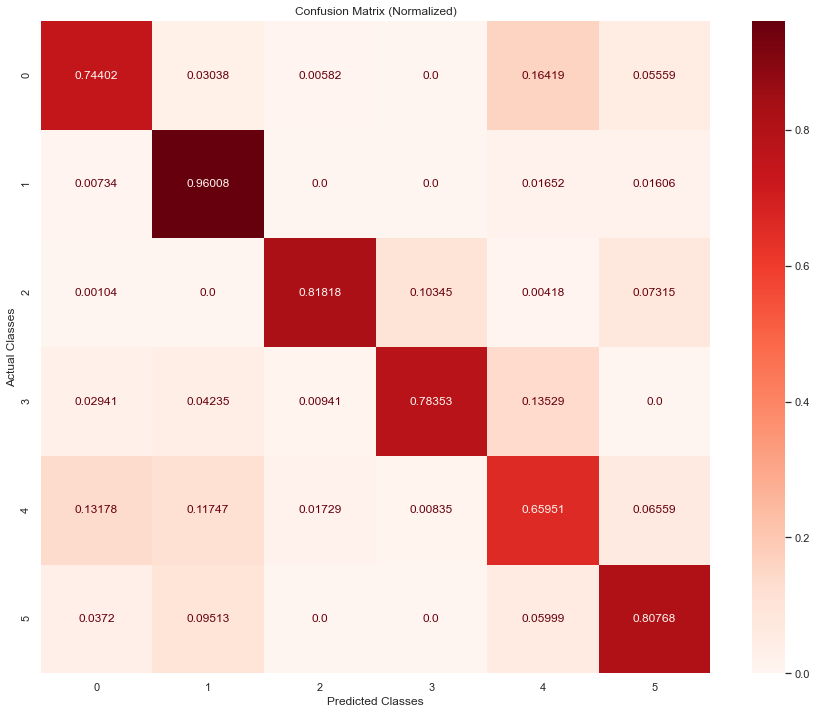

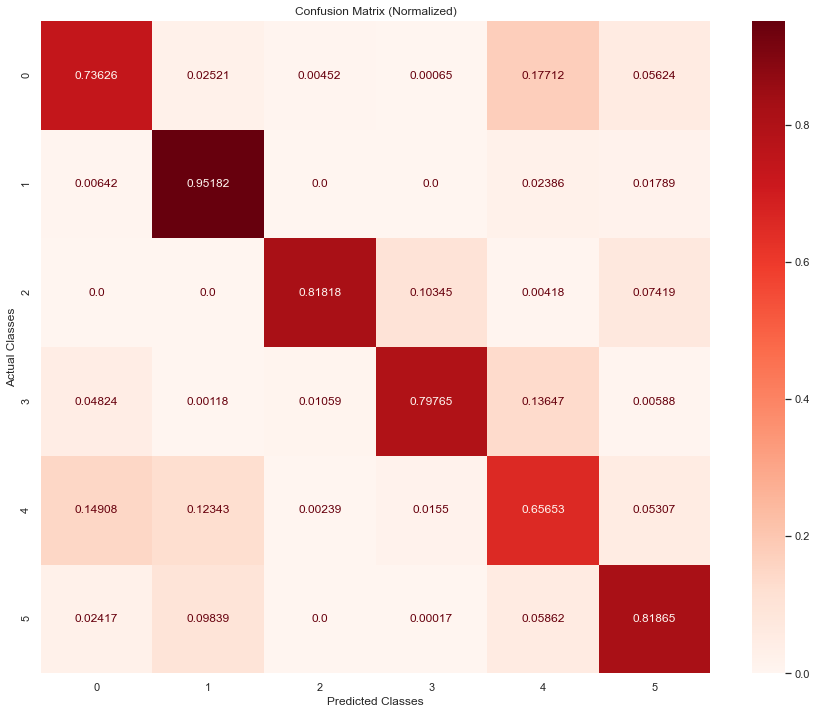

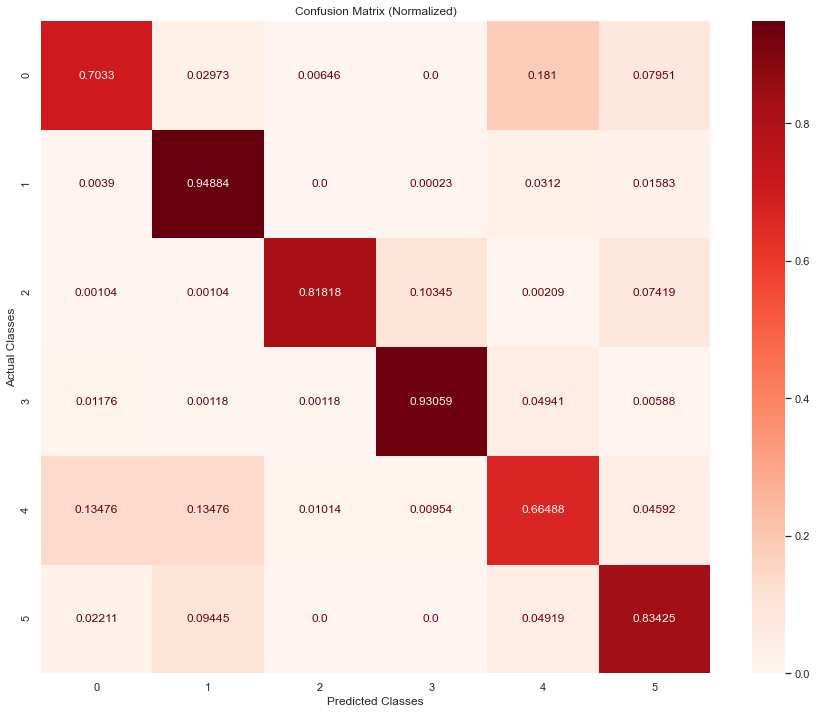

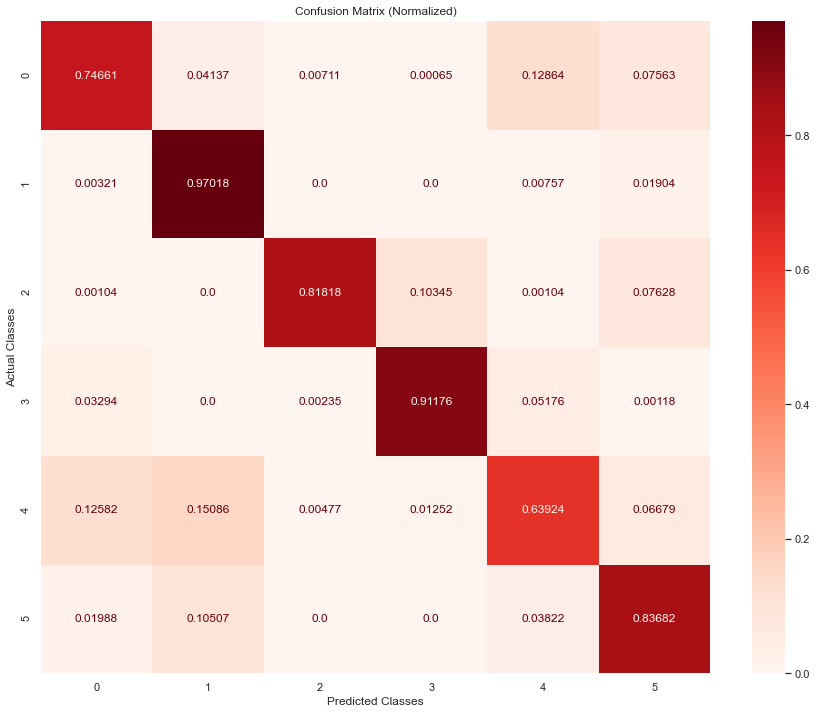

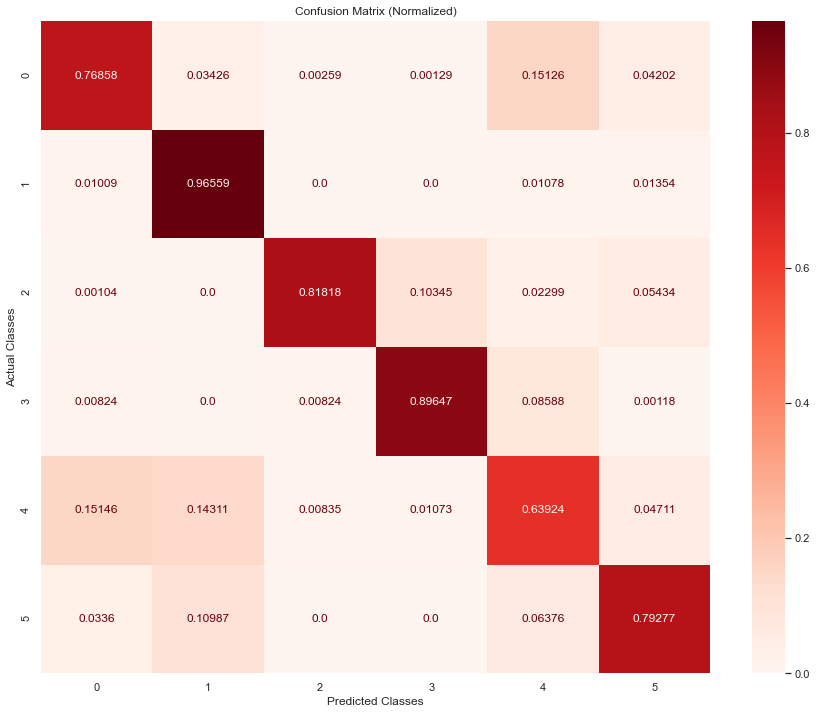

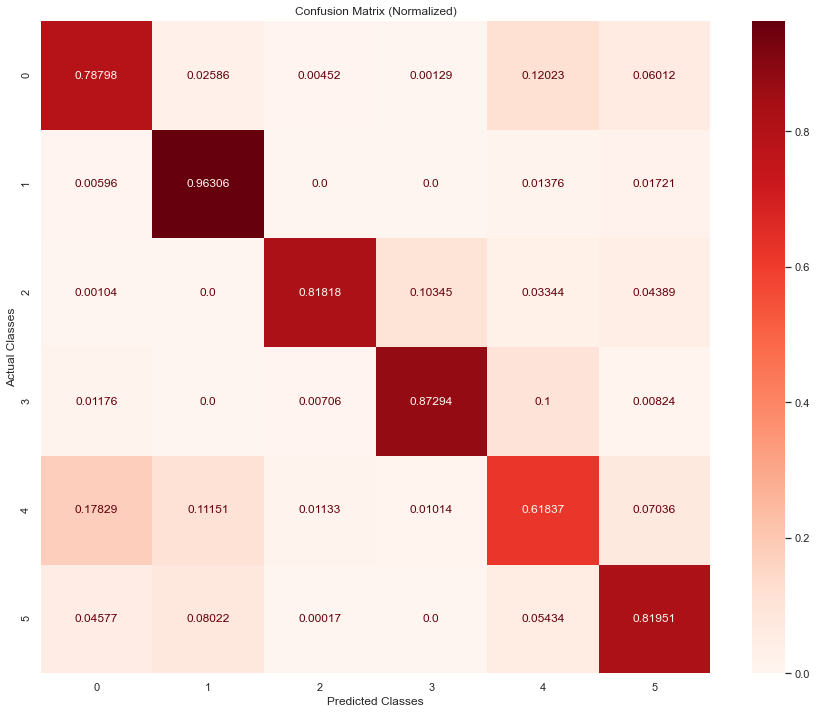

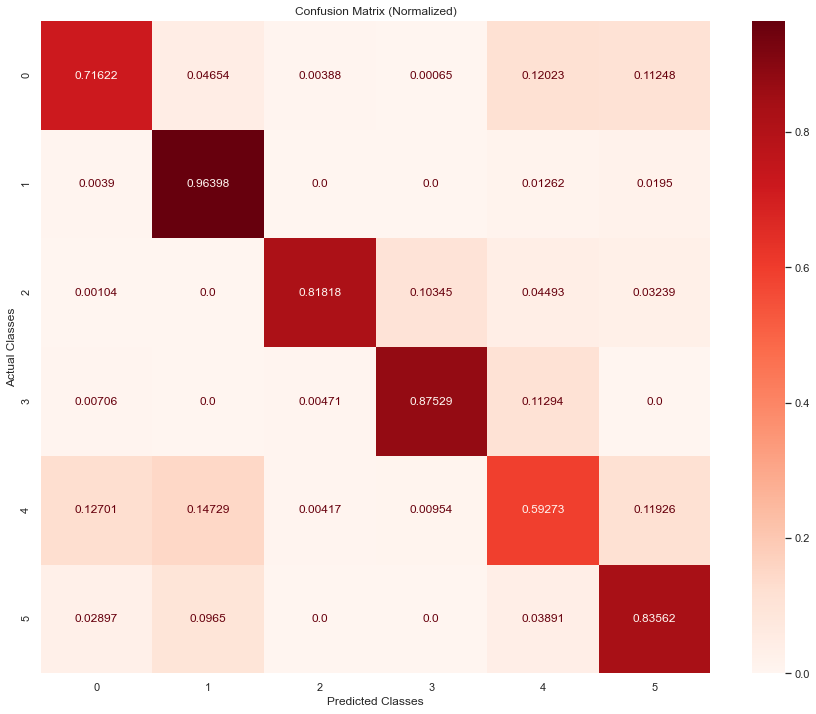

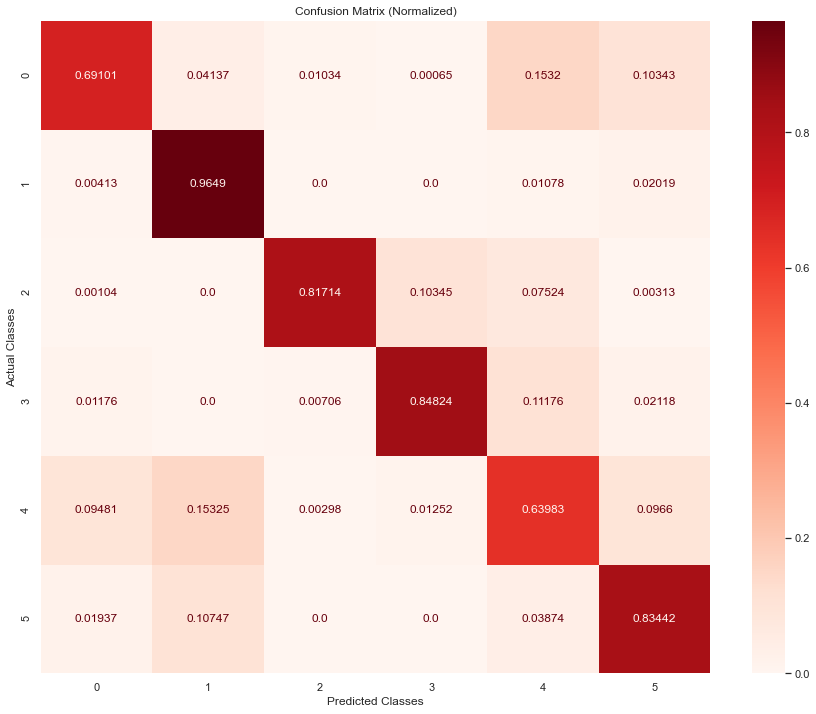

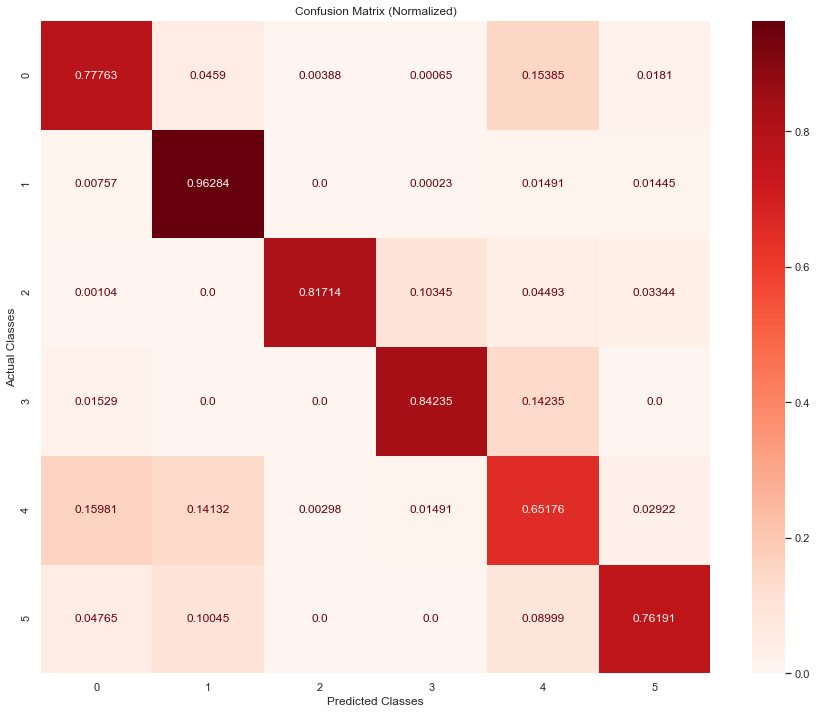

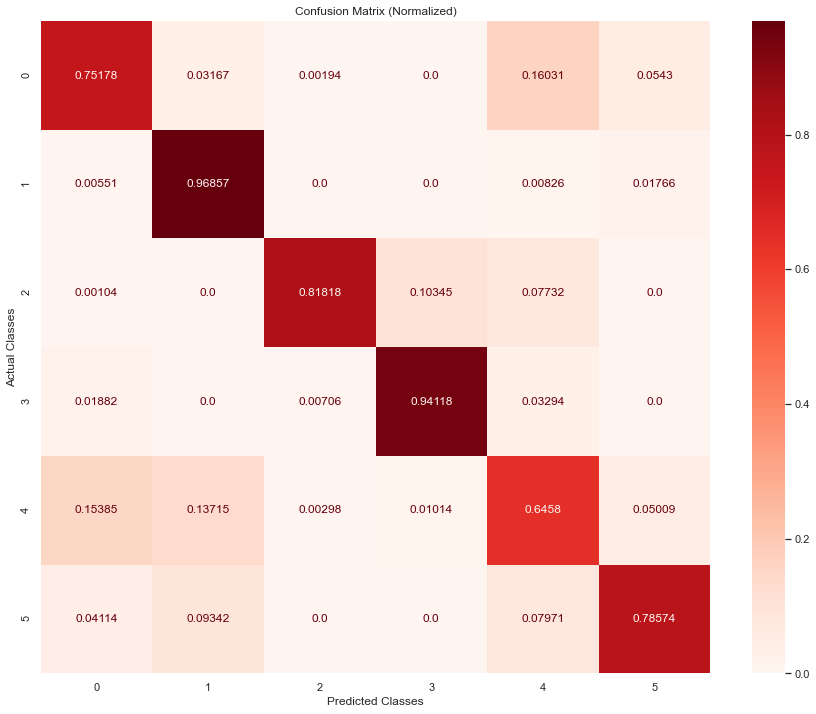

In [87]:
repeat_experiment(model_type="cnnlstm")

Run:  1
original
ConvLSTM
Epoch 1/5000
580/580 [==============================] - 8s 11ms/step - loss: 0.6441 - accuracy: 0.7725 - val_loss: 0.8765 - val_accuracy: 0.7590
Epoch 2/5000
580/580 [==============================] - 7s 11ms/step - loss: 0.4003 - accuracy: 0.8521 - val_loss: 0.6908 - val_accuracy: 0.7779
Epoch 3/5000
580/580 [==============================] - 7s 12ms/step - loss: 0.3367 - accuracy: 0.8754 - val_loss: 0.7825 - val_accuracy: 0.7744
Epoch 4/5000
580/580 [==============================] - 7s 12ms/step - loss: 0.2984 - accuracy: 0.8897 - val_loss: 0.6842 - val_accuracy: 0.7888
Epoch 5/5000
580/580 [==============================] - 7s 12ms/step - loss: 0.2701 - accuracy: 0.9002 - val_loss: 0.6769 - val_accuracy: 0.8047
Epoch 6/5000
580/580 [==============================] - 7s 12ms/step - loss: 0.2415 - accuracy: 0.9134 - val_loss: 0.6925 - val_accuracy: 0.7941
Epoch 7/5000
580/580 [==============================] - 7s 12ms/step - loss: 0.2215 - accuracy: 0.9227 -

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  2
original
ConvLSTM
Epoch 1/5000
580/580 [==============================] - 8s 11ms/step - loss: 0.6515 - accuracy: 0.7734 - val_loss: 0.8110 - val_accuracy: 0.7715
Epoch 2/5000
580/580 [==============================] - 6s 11ms/step - loss: 0.4019 - accuracy: 0.8516 - val_loss: 0.7924 - val_accuracy: 0.7791
Epoch 3/5000
580/580 [==============================] - 6s 11ms/step - loss: 0.3312 - accuracy: 0.8773 - val_loss: 0.7420 - val_accuracy: 0.7766
Epoch 4/5000
580/580 [==============================] - 6s 11ms/step - loss: 0.2886 - accuracy: 0.8939 - val_loss: 0.7580 - val_accuracy: 0.7910
Epoch 5/5000
580/580 [==============================] - 6s 11ms/step - loss: 0.2607 - accuracy: 0.9037 - val_loss: 0.7462 - val_accuracy: 0.7939
Epoch 6/5000
580/580 [==============================] - 6s 11ms/step - loss: 0.2344 - accuracy: 0.9147 - val_loss: 0.8111 - val_accuracy: 0.8016
Epoch 7/5000
580/580 [==============================] - 6s 11ms/step - loss: 0.2153 - accuracy: 0.9230 -

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  3
original
ConvLSTM
Epoch 1/5000
580/580 [==============================] - 8s 12ms/step - loss: 0.6466 - accuracy: 0.7689 - val_loss: 0.8924 - val_accuracy: 0.7533
Epoch 2/5000
580/580 [==============================] - 7s 11ms/step - loss: 0.3838 - accuracy: 0.8565 - val_loss: 0.7393 - val_accuracy: 0.7700
Epoch 3/5000
580/580 [==============================] - 7s 11ms/step - loss: 0.3226 - accuracy: 0.8804 - val_loss: 0.7724 - val_accuracy: 0.7542
Epoch 4/5000
580/580 [==============================] - 7s 11ms/step - loss: 0.2802 - accuracy: 0.8979 - val_loss: 0.5775 - val_accuracy: 0.8107
Epoch 5/5000
580/580 [==============================] - 7s 11ms/step - loss: 0.2516 - accuracy: 0.9090 - val_loss: 0.6259 - val_accuracy: 0.8049
Epoch 6/5000
580/580 [==============================] - 7s 11ms/step - loss: 0.2247 - accuracy: 0.9192 - val_loss: 0.6212 - val_accuracy: 0.7980
Epoch 7/5000
580/580 [==============================] - 7s 11ms/step - loss: 0.2050 - accuracy: 0.9271 -

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  4
original
ConvLSTM
Epoch 1/5000
580/580 [==============================] - 7s 11ms/step - loss: 0.6556 - accuracy: 0.7721 - val_loss: 0.9336 - val_accuracy: 0.7382
Epoch 2/5000
580/580 [==============================] - 6s 11ms/step - loss: 0.3872 - accuracy: 0.8569 - val_loss: 0.7517 - val_accuracy: 0.7760
Epoch 3/5000
580/580 [==============================] - 6s 11ms/step - loss: 0.3223 - accuracy: 0.8810 - val_loss: 0.7363 - val_accuracy: 0.7727
Epoch 4/5000
580/580 [==============================] - 6s 11ms/step - loss: 0.2798 - accuracy: 0.8986 - val_loss: 0.6412 - val_accuracy: 0.7972
Epoch 5/5000
580/580 [==============================] - 6s 11ms/step - loss: 0.2471 - accuracy: 0.9107 - val_loss: 0.5999 - val_accuracy: 0.8219
Epoch 6/5000
580/580 [==============================] - 6s 11ms/step - loss: 0.2221 - accuracy: 0.9200 - val_loss: 0.7586 - val_accuracy: 0.7765
Epoch 7/5000
580/580 [==============================] - 6s 11ms/step - loss: 0.2037 - accuracy: 0.9276 -

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  5
original
ConvLSTM
Epoch 1/5000
580/580 [==============================] - 8s 12ms/step - loss: 0.6621 - accuracy: 0.7711 - val_loss: 0.9239 - val_accuracy: 0.7465
Epoch 2/5000
580/580 [==============================] - 7s 11ms/step - loss: 0.4022 - accuracy: 0.8546 - val_loss: 0.7754 - val_accuracy: 0.7673
Epoch 3/5000
580/580 [==============================] - 7s 11ms/step - loss: 0.3367 - accuracy: 0.8778 - val_loss: 0.6409 - val_accuracy: 0.7830
Epoch 4/5000
580/580 [==============================] - 7s 11ms/step - loss: 0.2918 - accuracy: 0.8938 - val_loss: 0.5986 - val_accuracy: 0.8089
Epoch 5/5000
580/580 [==============================] - 7s 11ms/step - loss: 0.2602 - accuracy: 0.9061 - val_loss: 0.5706 - val_accuracy: 0.8251
Epoch 6/5000
580/580 [==============================] - 7s 11ms/step - loss: 0.2325 - accuracy: 0.9176 - val_loss: 0.6272 - val_accuracy: 0.7962
Epoch 7/5000
580/580 [==============================] - 7s 11ms/step - loss: 0.2132 - accuracy: 0.9249 -

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  6
original
ConvLSTM
Epoch 1/5000
580/580 [==============================] - 8s 11ms/step - loss: 0.6539 - accuracy: 0.7717 - val_loss: 0.9516 - val_accuracy: 0.7526
Epoch 2/5000
580/580 [==============================] - 6s 11ms/step - loss: 0.3933 - accuracy: 0.8560 - val_loss: 0.7645 - val_accuracy: 0.7696
Epoch 3/5000
580/580 [==============================] - 6s 11ms/step - loss: 0.3229 - accuracy: 0.8795 - val_loss: 0.7404 - val_accuracy: 0.7673
Epoch 4/5000
580/580 [==============================] - 6s 11ms/step - loss: 0.2785 - accuracy: 0.8980 - val_loss: 0.7399 - val_accuracy: 0.7911
Epoch 5/5000
580/580 [==============================] - 6s 11ms/step - loss: 0.2488 - accuracy: 0.9087 - val_loss: 0.6756 - val_accuracy: 0.8032
Epoch 6/5000
580/580 [==============================] - 6s 11ms/step - loss: 0.2262 - accuracy: 0.9194 - val_loss: 0.7061 - val_accuracy: 0.7865
Epoch 7/5000
580/580 [==============================] - 6s 11ms/step - loss: 0.2052 - accuracy: 0.9271 -

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  7
original
ConvLSTM
Epoch 1/5000
580/580 [==============================] - 8s 12ms/step - loss: 0.6382 - accuracy: 0.7774 - val_loss: 0.8247 - val_accuracy: 0.7683
Epoch 2/5000
580/580 [==============================] - 7s 12ms/step - loss: 0.3880 - accuracy: 0.8576 - val_loss: 0.7569 - val_accuracy: 0.7796
Epoch 3/5000
580/580 [==============================] - 7s 12ms/step - loss: 0.3233 - accuracy: 0.8820 - val_loss: 0.6360 - val_accuracy: 0.7946
Epoch 4/5000
580/580 [==============================] - 7s 12ms/step - loss: 0.2828 - accuracy: 0.8967 - val_loss: 0.5781 - val_accuracy: 0.8222
Epoch 5/5000
580/580 [==============================] - 7s 12ms/step - loss: 0.2556 - accuracy: 0.9094 - val_loss: 0.6017 - val_accuracy: 0.8104
Epoch 6/5000
580/580 [==============================] - 7s 12ms/step - loss: 0.2288 - accuracy: 0.9185 - val_loss: 0.5888 - val_accuracy: 0.8314
Epoch 7/5000
580/580 [==============================] - 7s 12ms/step - loss: 0.2139 - accuracy: 0.9234 -

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  8
original
ConvLSTM
Epoch 1/5000
580/580 [==============================] - 8s 12ms/step - loss: 0.6472 - accuracy: 0.7739 - val_loss: 0.8620 - val_accuracy: 0.7710
Epoch 2/5000
580/580 [==============================] - 7s 11ms/step - loss: 0.3850 - accuracy: 0.8568 - val_loss: 0.6596 - val_accuracy: 0.7888
Epoch 3/5000
580/580 [==============================] - 7s 11ms/step - loss: 0.3181 - accuracy: 0.8833 - val_loss: 0.5788 - val_accuracy: 0.8127
Epoch 4/5000
580/580 [==============================] - 7s 11ms/step - loss: 0.2729 - accuracy: 0.9008 - val_loss: 0.5812 - val_accuracy: 0.7958
Epoch 5/5000
580/580 [==============================] - 7s 11ms/step - loss: 0.2427 - accuracy: 0.9141 - val_loss: 0.6056 - val_accuracy: 0.7964
Epoch 6/5000
580/580 [==============================] - 7s 11ms/step - loss: 0.2218 - accuracy: 0.9208 - val_loss: 0.5999 - val_accuracy: 0.8221
Epoch 7/5000
580/580 [==============================] - 7s 11ms/step - loss: 0.1995 - accuracy: 0.9294 -

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  9
original
ConvLSTM
Epoch 1/5000
580/580 [==============================] - 8s 12ms/step - loss: 0.6405 - accuracy: 0.7730 - val_loss: 0.8375 - val_accuracy: 0.7712
Epoch 2/5000
580/580 [==============================] - 7s 12ms/step - loss: 0.3910 - accuracy: 0.8564 - val_loss: 0.6933 - val_accuracy: 0.7714
Epoch 3/5000
580/580 [==============================] - 7s 12ms/step - loss: 0.3286 - accuracy: 0.8781 - val_loss: 0.6861 - val_accuracy: 0.7844
Epoch 4/5000
580/580 [==============================] - 7s 12ms/step - loss: 0.2905 - accuracy: 0.8907 - val_loss: 0.7023 - val_accuracy: 0.7944
Epoch 5/5000
580/580 [==============================] - 7s 12ms/step - loss: 0.2602 - accuracy: 0.9019 - val_loss: 0.6453 - val_accuracy: 0.7944
Epoch 6/5000
580/580 [==============================] - 7s 12ms/step - loss: 0.2344 - accuracy: 0.9145 - val_loss: 0.6036 - val_accuracy: 0.8202
Epoch 7/5000
580/580 [==============================] - 7s 12ms/step - loss: 0.2166 - accuracy: 0.9224 -

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  10
original
ConvLSTM
Epoch 1/5000
580/580 [==============================] - 8s 11ms/step - loss: 0.6470 - accuracy: 0.7709 - val_loss: 0.8466 - val_accuracy: 0.7557
Epoch 2/5000
580/580 [==============================] - 6s 11ms/step - loss: 0.3965 - accuracy: 0.8535 - val_loss: 0.7452 - val_accuracy: 0.7687
Epoch 3/5000
580/580 [==============================] - 6s 11ms/step - loss: 0.3207 - accuracy: 0.8824 - val_loss: 0.7267 - val_accuracy: 0.7740
Epoch 4/5000
580/580 [==============================] - 6s 11ms/step - loss: 0.2768 - accuracy: 0.8984 - val_loss: 0.6030 - val_accuracy: 0.8211
Epoch 5/5000
580/580 [==============================] - 6s 11ms/step - loss: 0.2530 - accuracy: 0.9091 - val_loss: 0.6763 - val_accuracy: 0.8033
Epoch 6/5000
580/580 [==============================] - 6s 11ms/step - loss: 0.2262 - accuracy: 0.9194 - val_loss: 0.6409 - val_accuracy: 0.8124
Epoch 7/5000
580/580 [==============================] - 6s 11ms/step - loss: 0.2119 - accuracy: 0.9243 

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


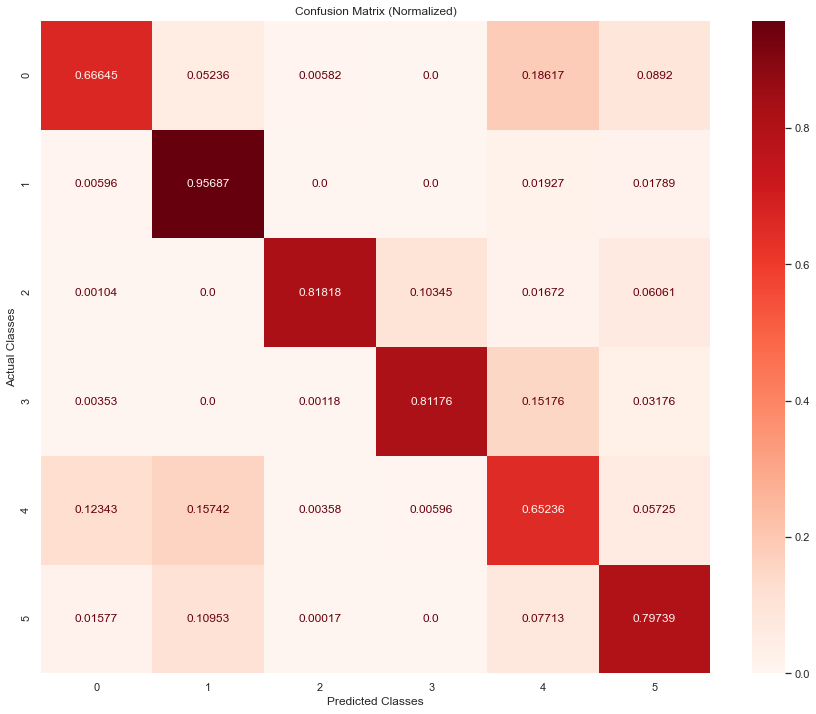

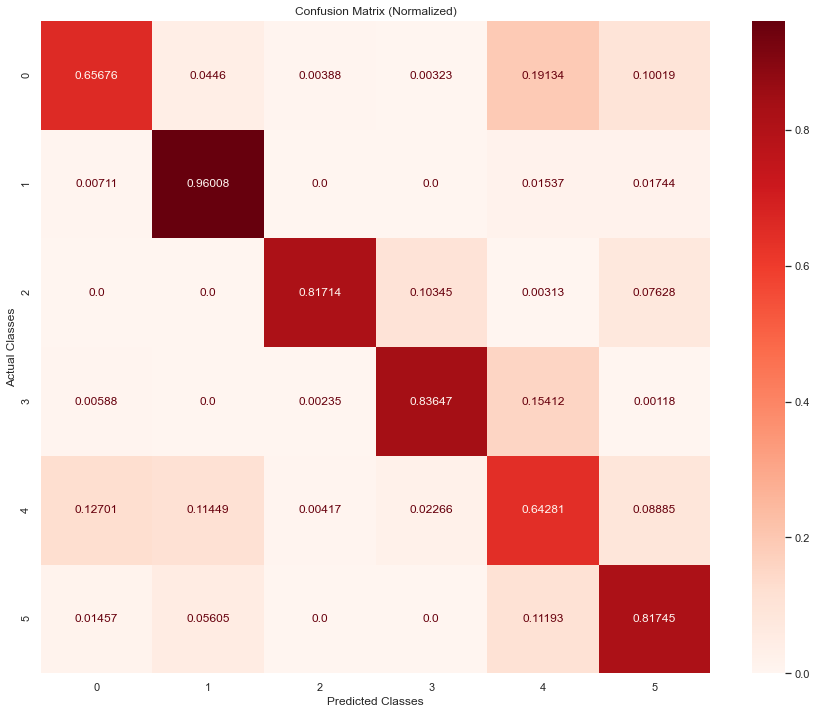

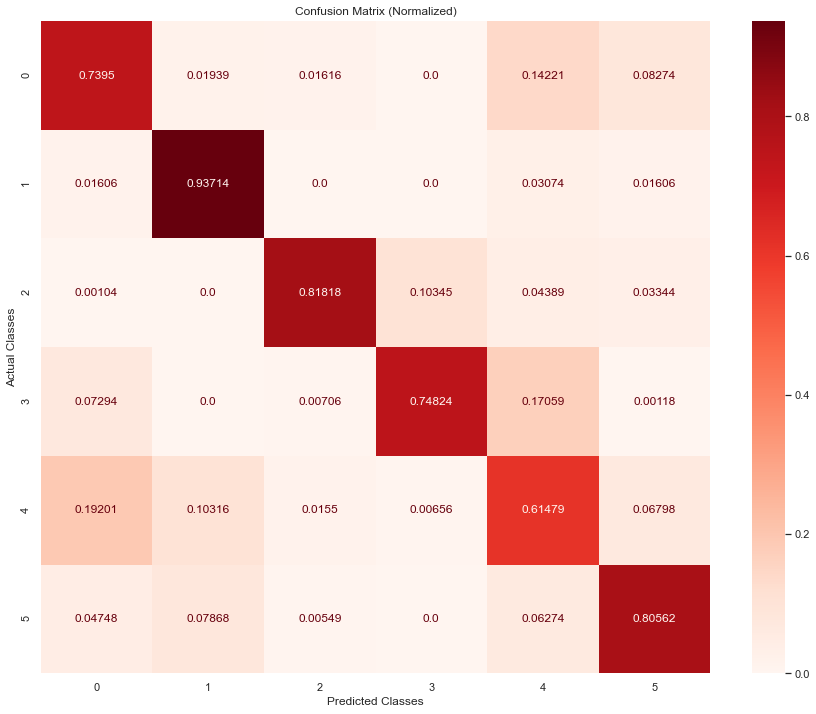

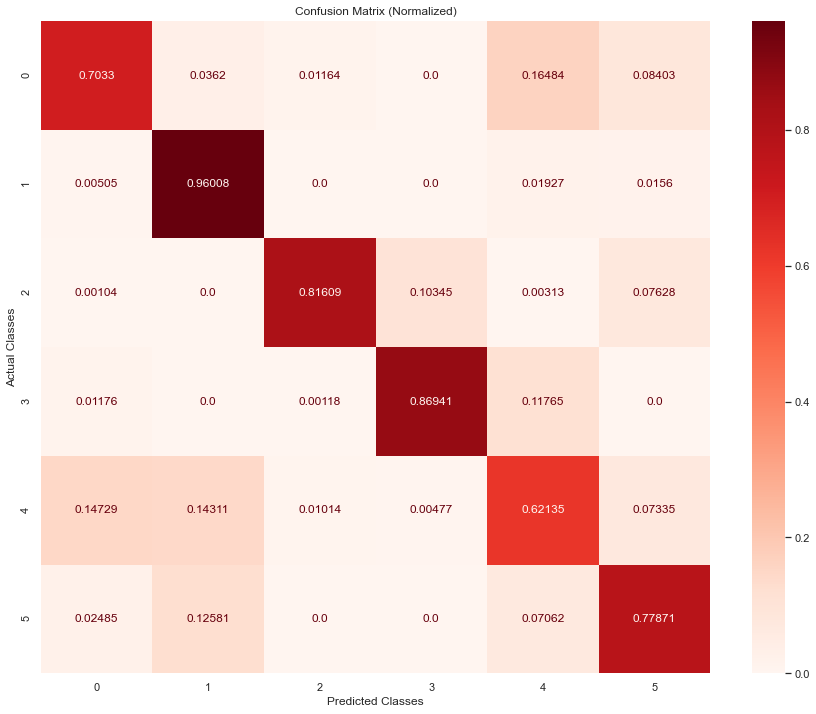

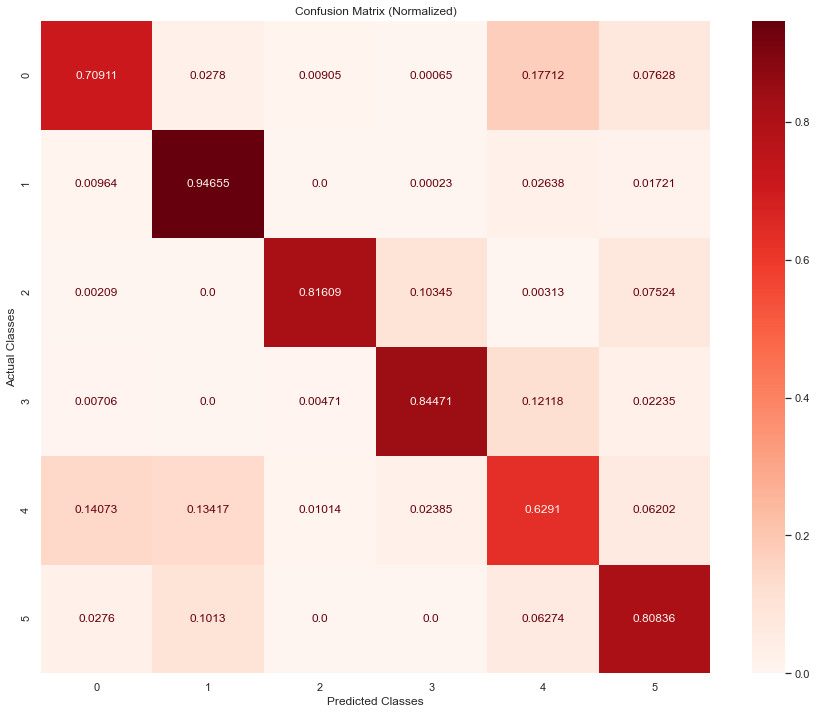

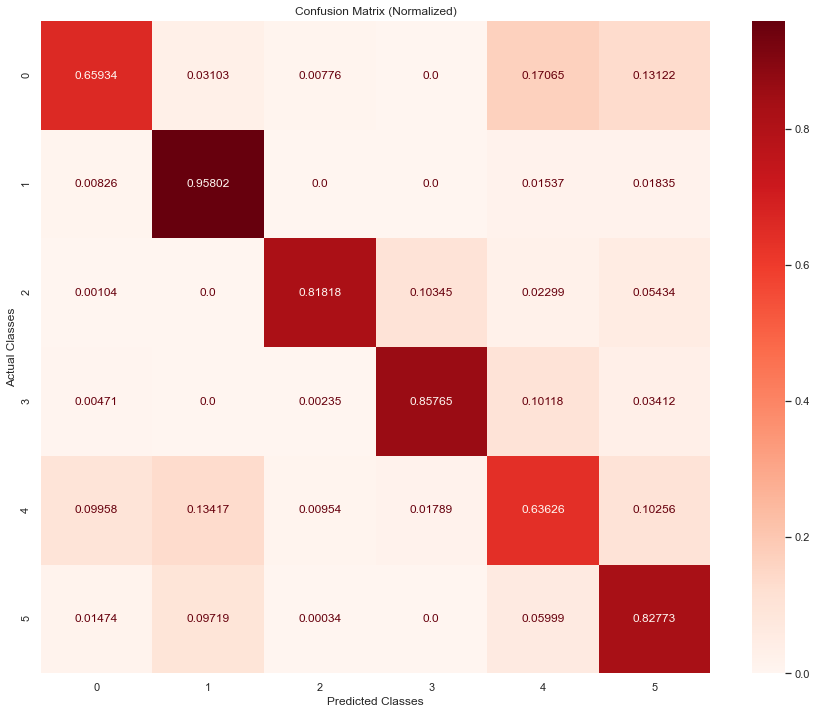

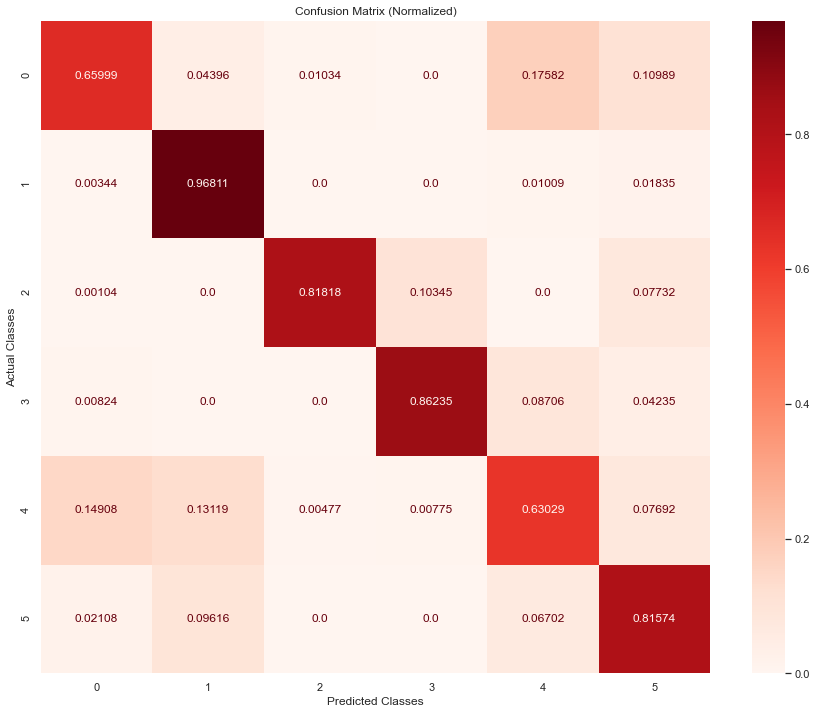

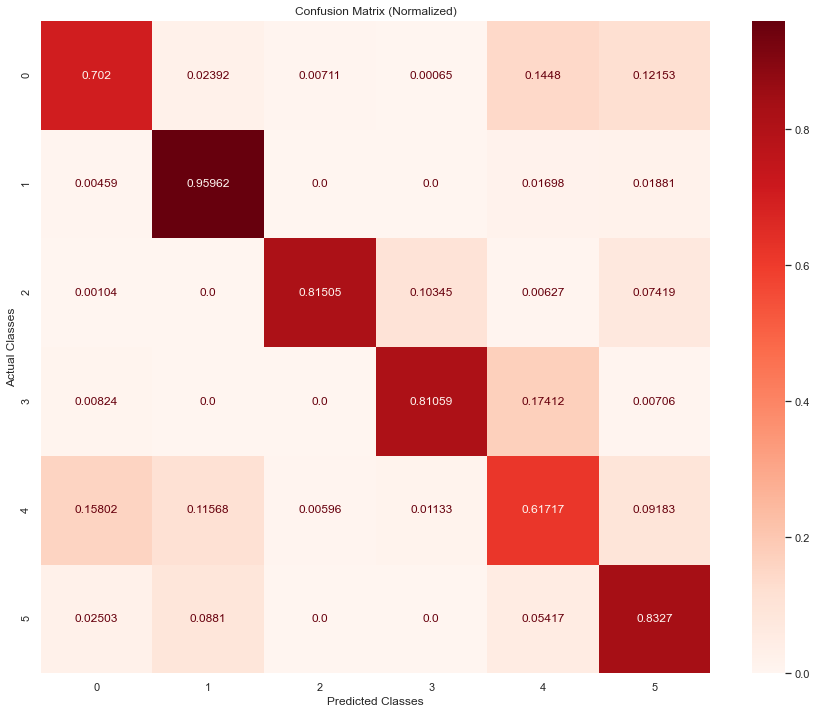

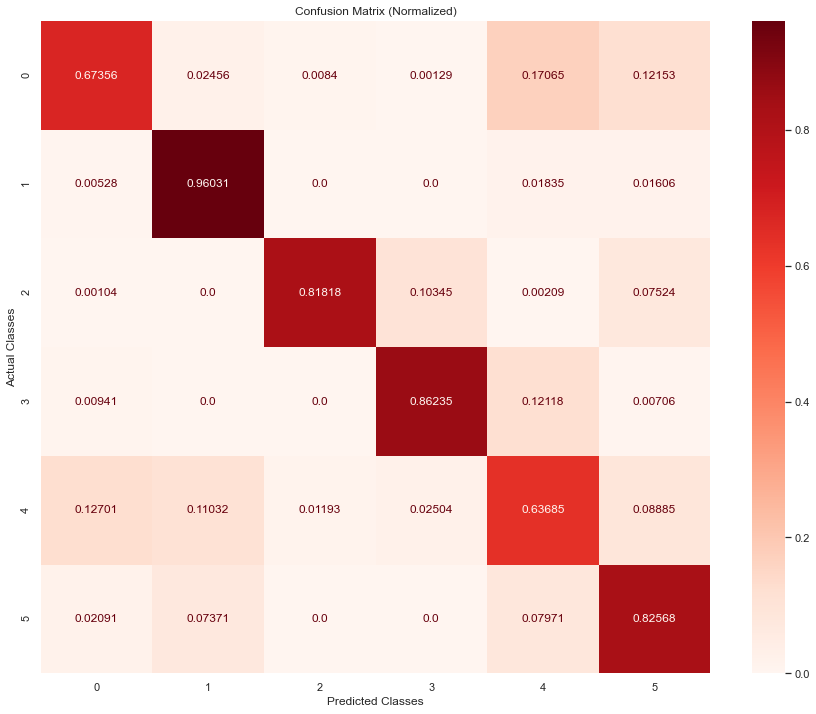

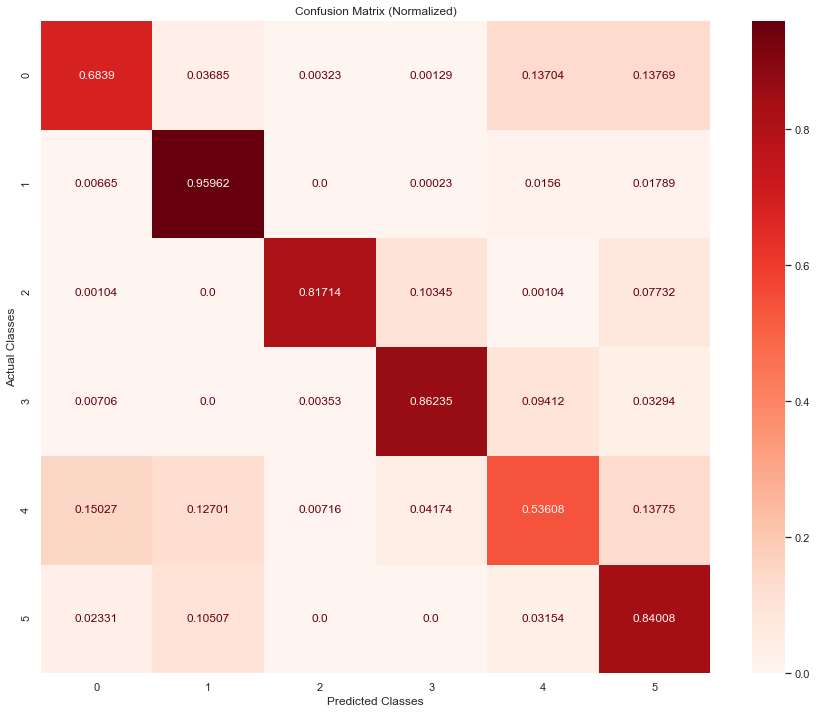

In [88]:
repeat_experiment(model_type="convlstm")

Run:  1
original
Bi-LSTM
Epoch 1/5000
580/580 [==============================] - 8s 10ms/step - loss: 0.9559 - accuracy: 0.6579 - val_loss: 1.3335 - val_accuracy: 0.6671
Epoch 2/5000
580/580 [==============================] - 5s 9ms/step - loss: 0.5904 - accuracy: 0.7882 - val_loss: 1.0661 - val_accuracy: 0.6531
Epoch 3/5000
580/580 [==============================] - 5s 9ms/step - loss: 0.4045 - accuracy: 0.8485 - val_loss: 0.7951 - val_accuracy: 0.7847
Epoch 4/5000
580/580 [==============================] - 5s 9ms/step - loss: 0.3259 - accuracy: 0.8804 - val_loss: 0.7784 - val_accuracy: 0.7818
Epoch 5/5000
580/580 [==============================] - 6s 10ms/step - loss: 0.2878 - accuracy: 0.8941 - val_loss: 1.0238 - val_accuracy: 0.7637
Epoch 6/5000
580/580 [==============================] - 6s 10ms/step - loss: 0.2468 - accuracy: 0.9140 - val_loss: 0.8349 - val_accuracy: 0.7840
Epoch 7/5000
580/580 [==============================] - 5s 9ms/step - loss: 0.2169 - accuracy: 0.9266 - val_

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  2
original
Bi-LSTM
Epoch 1/5000
580/580 [==============================] - 8s 10ms/step - loss: 0.9619 - accuracy: 0.6595 - val_loss: 1.2867 - val_accuracy: 0.6632
Epoch 2/5000
580/580 [==============================] - 5s 9ms/step - loss: 0.5971 - accuracy: 0.7914 - val_loss: 0.9284 - val_accuracy: 0.7072
Epoch 3/5000
580/580 [==============================] - 5s 9ms/step - loss: 0.4380 - accuracy: 0.8442 - val_loss: 1.1868 - val_accuracy: 0.7114
Epoch 4/5000
580/580 [==============================] - 5s 9ms/step - loss: 0.3684 - accuracy: 0.8641 - val_loss: 1.0335 - val_accuracy: 0.7405
Epoch 5/5000
580/580 [==============================] - 5s 9ms/step - loss: 0.3247 - accuracy: 0.8797 - val_loss: 0.9473 - val_accuracy: 0.7389
Epoch 6/5000
580/580 [==============================] - 5s 9ms/step - loss: 0.2860 - accuracy: 0.8975 - val_loss: 0.9937 - val_accuracy: 0.7470
Epoch 7/5000
580/580 [==============================] - 6s 10ms/step - loss: 0.2411 - accuracy: 0.9177 - val_l

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  3
original
Bi-LSTM
Epoch 1/5000
580/580 [==============================] - 8s 10ms/step - loss: 0.9389 - accuracy: 0.6678 - val_loss: 1.0885 - val_accuracy: 0.6582
Epoch 2/5000
580/580 [==============================] - 6s 11ms/step - loss: 0.5938 - accuracy: 0.7903 - val_loss: 0.9239 - val_accuracy: 0.7367
Epoch 3/5000
580/580 [==============================] - 6s 10ms/step - loss: 0.4306 - accuracy: 0.8440 - val_loss: 0.8754 - val_accuracy: 0.7395
Epoch 4/5000
580/580 [==============================] - 6s 10ms/step - loss: 0.3664 - accuracy: 0.8628 - val_loss: 0.9714 - val_accuracy: 0.7415
Epoch 5/5000
580/580 [==============================] - 6s 10ms/step - loss: 0.3173 - accuracy: 0.8826 - val_loss: 1.0016 - val_accuracy: 0.7863
Epoch 6/5000
580/580 [==============================] - 6s 10ms/step - loss: 0.2772 - accuracy: 0.9007 - val_loss: 0.8956 - val_accuracy: 0.7740
Epoch 7/5000
580/580 [==============================] - 6s 10ms/step - loss: 0.2464 - accuracy: 0.9138 - 

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  4
original
Bi-LSTM
Epoch 1/5000
580/580 [==============================] - 8s 10ms/step - loss: 0.9323 - accuracy: 0.6715 - val_loss: 1.0616 - val_accuracy: 0.6310
Epoch 2/5000
580/580 [==============================] - 5s 9ms/step - loss: 0.6103 - accuracy: 0.7852 - val_loss: 0.9248 - val_accuracy: 0.7215
Epoch 3/5000
580/580 [==============================] - 5s 9ms/step - loss: 0.5045 - accuracy: 0.8234 - val_loss: 1.0106 - val_accuracy: 0.7099
Epoch 4/5000
580/580 [==============================] - 5s 9ms/step - loss: 0.3852 - accuracy: 0.8602 - val_loss: 1.1033 - val_accuracy: 0.7045
Epoch 5/5000
580/580 [==============================] - 5s 9ms/step - loss: 0.3395 - accuracy: 0.8748 - val_loss: 0.9318 - val_accuracy: 0.7594
Epoch 6/5000
580/580 [==============================] - 5s 9ms/step - loss: 0.3008 - accuracy: 0.8900 - val_loss: 0.8542 - val_accuracy: 0.7760
Epoch 7/5000
580/580 [==============================] - 5s 9ms/step - loss: 0.2502 - accuracy: 0.9111 - val_lo

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  5
original
Bi-LSTM
Epoch 1/5000
580/580 [==============================] - 8s 10ms/step - loss: 0.9344 - accuracy: 0.6690 - val_loss: 1.3579 - val_accuracy: 0.6465
Epoch 2/5000
580/580 [==============================] - 6s 10ms/step - loss: 0.5810 - accuracy: 0.7966 - val_loss: 1.1688 - val_accuracy: 0.6737
Epoch 3/5000
580/580 [==============================] - 6s 10ms/step - loss: 0.4244 - accuracy: 0.8449 - val_loss: 1.0363 - val_accuracy: 0.7287
Epoch 4/5000
580/580 [==============================] - 6s 10ms/step - loss: 0.3585 - accuracy: 0.8666 - val_loss: 0.7779 - val_accuracy: 0.7114
Epoch 5/5000
580/580 [==============================] - 6s 10ms/step - loss: 0.3208 - accuracy: 0.8800 - val_loss: 0.7185 - val_accuracy: 0.7741
Epoch 6/5000
580/580 [==============================] - 6s 10ms/step - loss: 0.2832 - accuracy: 0.8959 - val_loss: 0.7548 - val_accuracy: 0.7589
Epoch 7/5000
580/580 [==============================] - 6s 10ms/step - loss: 0.2424 - accuracy: 0.9126 - 

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  6
original
Bi-LSTM
Epoch 1/5000
580/580 [==============================] - 8s 10ms/step - loss: 0.9438 - accuracy: 0.6668 - val_loss: 0.9797 - val_accuracy: 0.6755
Epoch 2/5000
580/580 [==============================] - 5s 9ms/step - loss: 0.5995 - accuracy: 0.7872 - val_loss: 0.9527 - val_accuracy: 0.7077
Epoch 3/5000
580/580 [==============================] - 5s 9ms/step - loss: 0.5022 - accuracy: 0.8241 - val_loss: 0.8175 - val_accuracy: 0.7352
Epoch 4/5000
580/580 [==============================] - 5s 9ms/step - loss: 0.4045 - accuracy: 0.8552 - val_loss: 0.9131 - val_accuracy: 0.7237
Epoch 5/5000
580/580 [==============================] - 6s 10ms/step - loss: 0.3278 - accuracy: 0.8854 - val_loss: 0.8622 - val_accuracy: 0.7779
Epoch 6/5000
580/580 [==============================] - 5s 9ms/step - loss: 0.2804 - accuracy: 0.9041 - val_loss: 0.6722 - val_accuracy: 0.7986
Epoch 7/5000
580/580 [==============================] - 6s 9ms/step - loss: 0.2481 - accuracy: 0.9169 - val_l

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  7
original
Bi-LSTM
Epoch 1/5000
580/580 [==============================] - 8s 10ms/step - loss: 0.9261 - accuracy: 0.6725 - val_loss: 1.1203 - val_accuracy: 0.6846
Epoch 2/5000
580/580 [==============================] - 5s 9ms/step - loss: 0.5920 - accuracy: 0.7906 - val_loss: 1.0461 - val_accuracy: 0.7183
Epoch 3/5000
580/580 [==============================] - 5s 9ms/step - loss: 0.4621 - accuracy: 0.8368 - val_loss: 1.2121 - val_accuracy: 0.7133
Epoch 4/5000
580/580 [==============================] - 5s 9ms/step - loss: 0.3648 - accuracy: 0.8655 - val_loss: 1.3007 - val_accuracy: 0.7337
Epoch 5/5000
580/580 [==============================] - 6s 10ms/step - loss: 0.3288 - accuracy: 0.8770 - val_loss: 1.0447 - val_accuracy: 0.6848
Epoch 6/5000
580/580 [==============================] - 6s 10ms/step - loss: 0.2799 - accuracy: 0.9007 - val_loss: 1.1680 - val_accuracy: 0.7618
Epoch 7/5000
580/580 [==============================] - 6s 10ms/step - loss: 0.2355 - accuracy: 0.9205 - val

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  8
original
Bi-LSTM
Epoch 1/5000
580/580 [==============================] - 8s 10ms/step - loss: 0.9067 - accuracy: 0.6774 - val_loss: 1.1661 - val_accuracy: 0.6530
Epoch 2/5000
580/580 [==============================] - 5s 9ms/step - loss: 0.5884 - accuracy: 0.7919 - val_loss: 0.8694 - val_accuracy: 0.7342
Epoch 3/5000
580/580 [==============================] - 5s 9ms/step - loss: 0.4880 - accuracy: 0.8278 - val_loss: 0.8493 - val_accuracy: 0.7048
Epoch 4/5000
580/580 [==============================] - 5s 9ms/step - loss: 0.3807 - accuracy: 0.8610 - val_loss: 0.7651 - val_accuracy: 0.7671
Epoch 5/5000
580/580 [==============================] - 5s 9ms/step - loss: 0.3244 - accuracy: 0.8833 - val_loss: 0.7317 - val_accuracy: 0.7768
Epoch 6/5000
580/580 [==============================] - 5s 9ms/step - loss: 0.2803 - accuracy: 0.8996 - val_loss: 0.9169 - val_accuracy: 0.7847
Epoch 7/5000
580/580 [==============================] - 5s 9ms/step - loss: 0.2472 - accuracy: 0.9131 - val_lo

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  9
original
Bi-LSTM
Epoch 1/5000
580/580 [==============================] - 8s 10ms/step - loss: 0.9335 - accuracy: 0.6690 - val_loss: 1.1676 - val_accuracy: 0.6710
Epoch 2/5000
580/580 [==============================] - 5s 9ms/step - loss: 0.5865 - accuracy: 0.7959 - val_loss: 0.9970 - val_accuracy: 0.6464
Epoch 3/5000
580/580 [==============================] - 5s 9ms/step - loss: 0.4598 - accuracy: 0.8370 - val_loss: 1.0514 - val_accuracy: 0.7160
Epoch 4/5000
580/580 [==============================] - 5s 9ms/step - loss: 0.3710 - accuracy: 0.8651 - val_loss: 1.0057 - val_accuracy: 0.7379
Epoch 5/5000
580/580 [==============================] - 6s 9ms/step - loss: 0.3408 - accuracy: 0.8765 - val_loss: 1.0526 - val_accuracy: 0.7562
Epoch 6/5000
580/580 [==============================] - 5s 9ms/step - loss: 0.3041 - accuracy: 0.8906 - val_loss: 1.2578 - val_accuracy: 0.7388
Epoch 7/5000
580/580 [==============================] - 5s 9ms/step - loss: 0.2803 - accuracy: 0.9002 - val_lo

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  10
original
Bi-LSTM
Epoch 1/5000
580/580 [==============================] - 7s 10ms/step - loss: 0.9493 - accuracy: 0.6619 - val_loss: 1.1095 - val_accuracy: 0.6993
Epoch 2/5000
580/580 [==============================] - 5s 9ms/step - loss: 0.5955 - accuracy: 0.7897 - val_loss: 1.1447 - val_accuracy: 0.6461
Epoch 3/5000
580/580 [==============================] - 5s 9ms/step - loss: 0.4527 - accuracy: 0.8388 - val_loss: 0.7192 - val_accuracy: 0.7507
Epoch 4/5000
580/580 [==============================] - 5s 9ms/step - loss: 0.3551 - accuracy: 0.8702 - val_loss: 0.9328 - val_accuracy: 0.7658
Epoch 5/5000
580/580 [==============================] - 6s 10ms/step - loss: 0.3082 - accuracy: 0.8891 - val_loss: 0.7980 - val_accuracy: 0.7620
Epoch 6/5000
580/580 [==============================] - 6s 10ms/step - loss: 0.2727 - accuracy: 0.9048 - val_loss: 0.9556 - val_accuracy: 0.7269
Epoch 7/5000
580/580 [==============================] - 6s 10ms/step - loss: 0.2411 - accuracy: 0.9160 - va

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


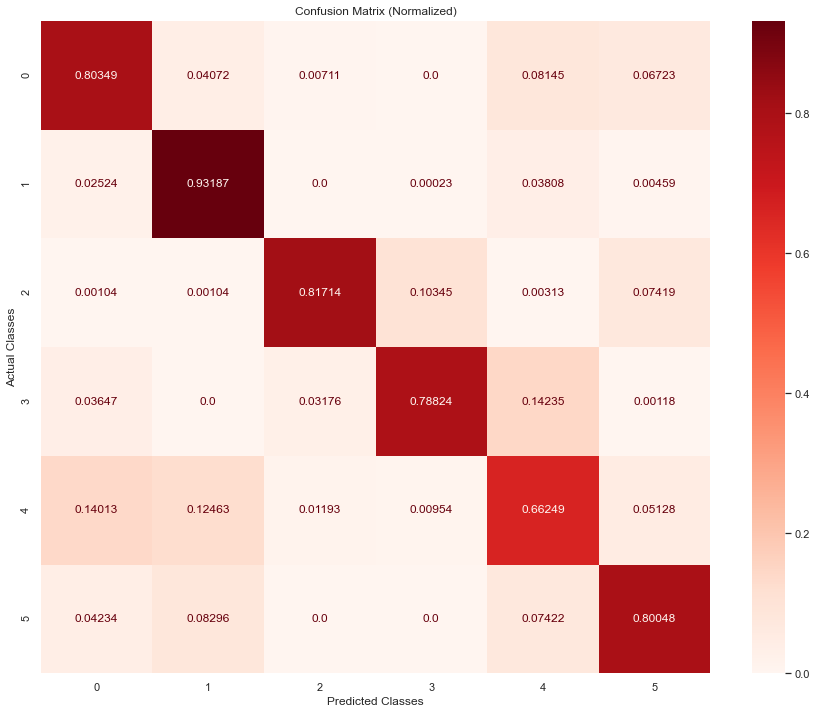

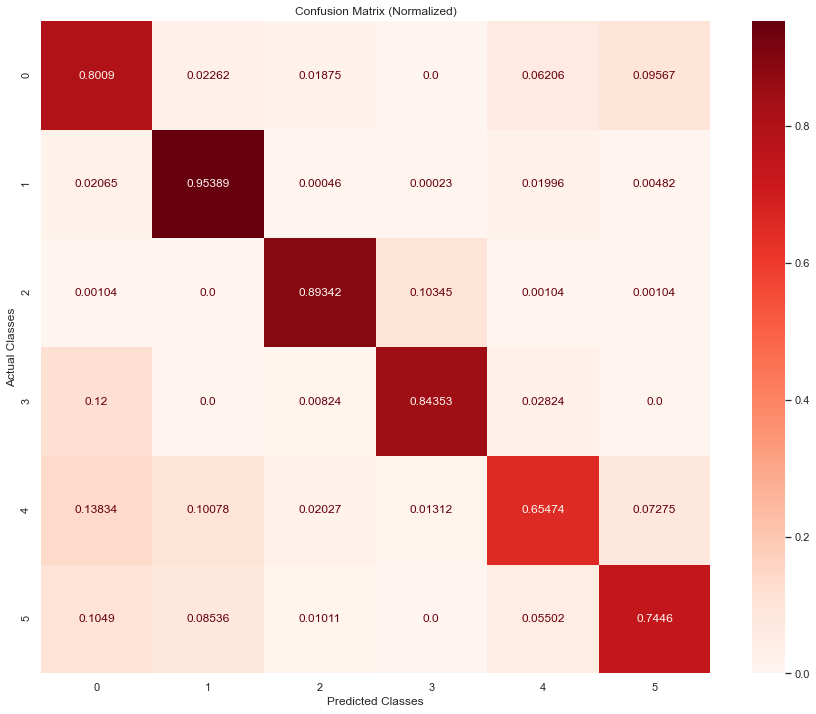

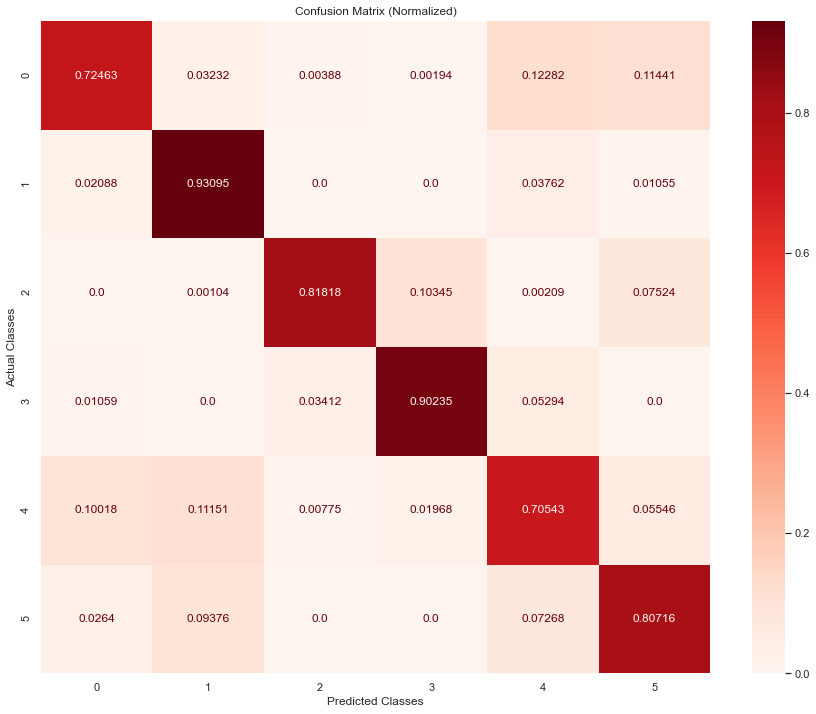

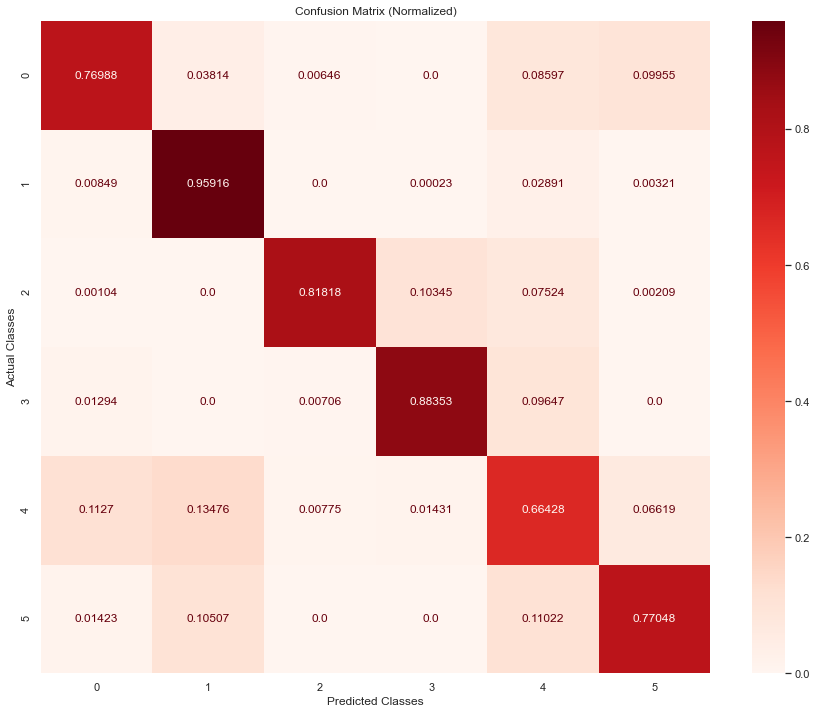

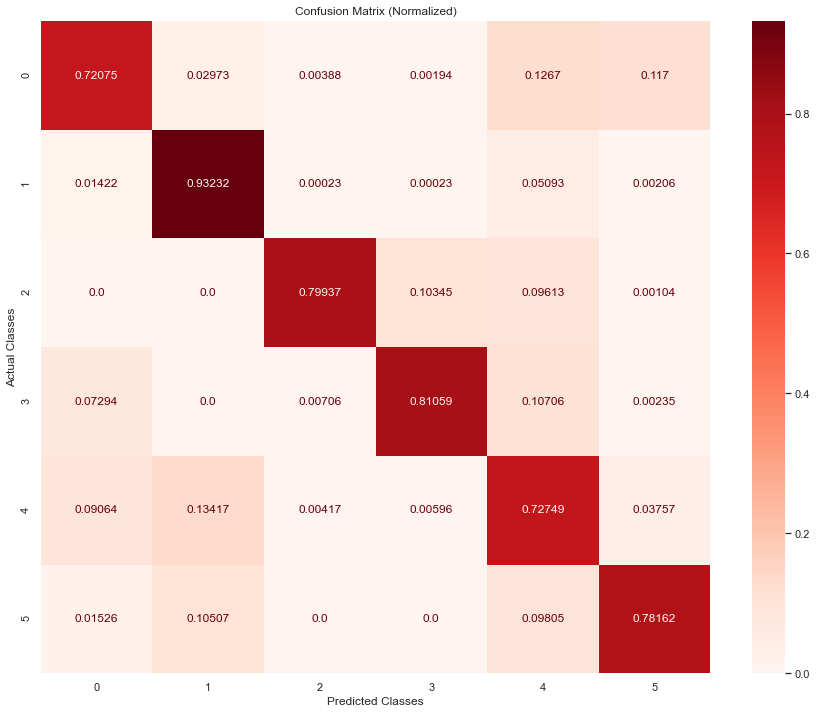

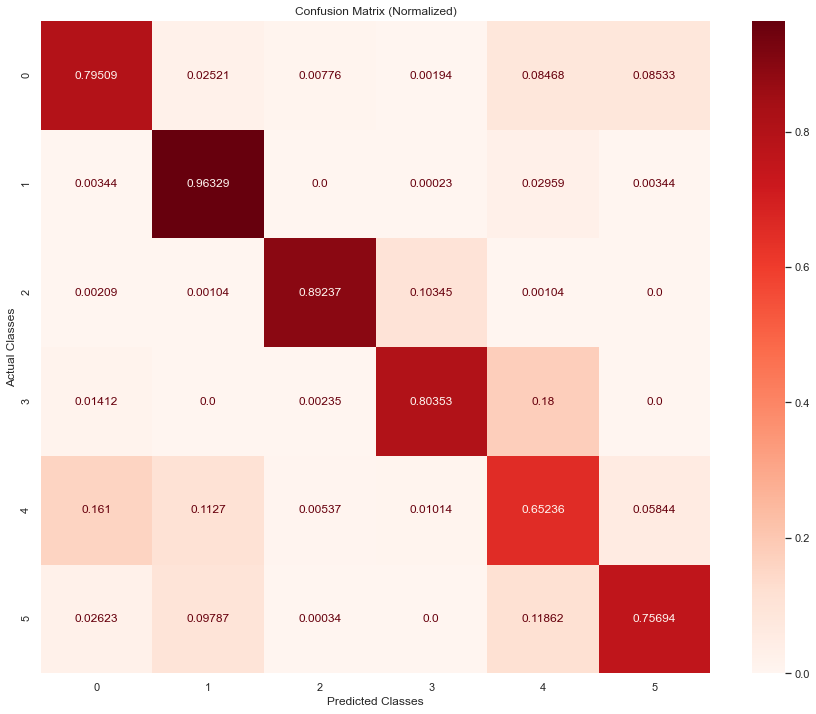

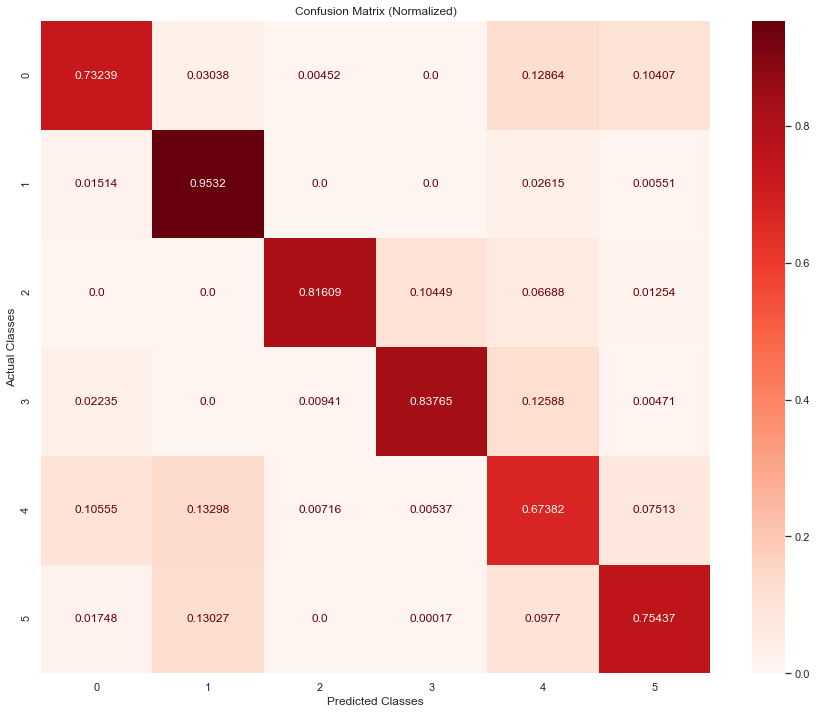

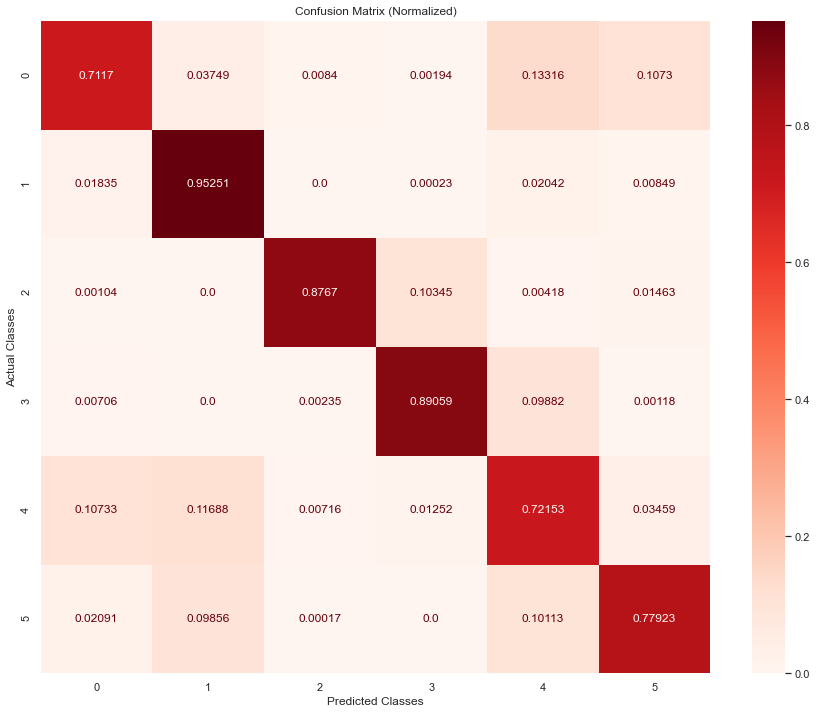

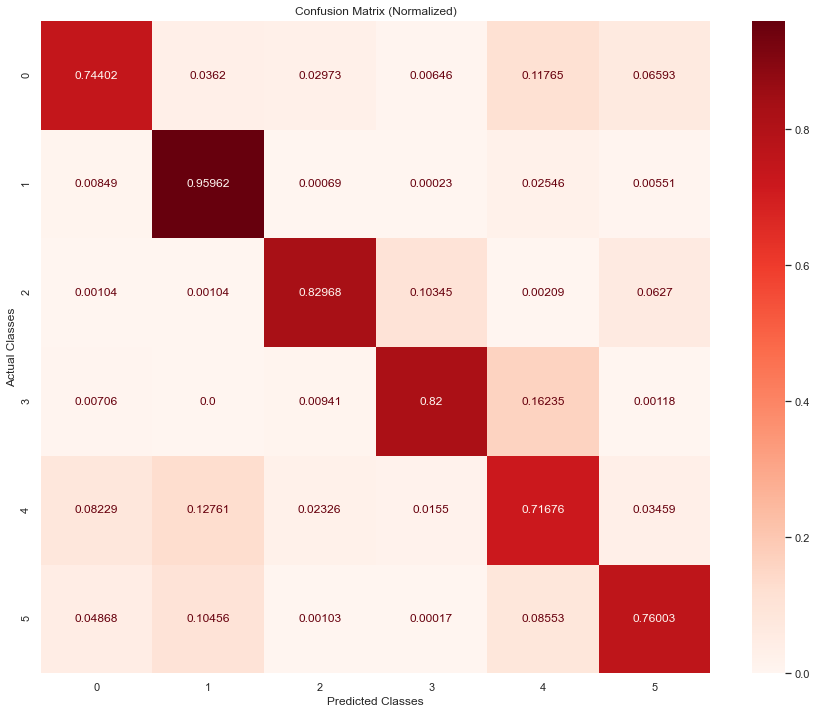

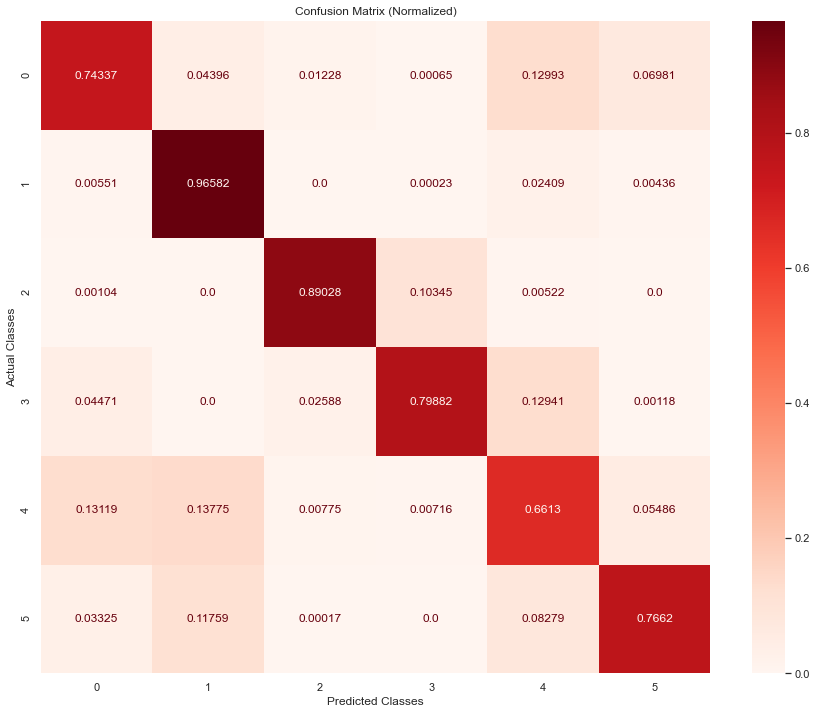

In [89]:
repeat_experiment(model_type="bilstm")

##### Oversampled/balanced data

Run:  1
balanced
LSTM
Epoch 1/5000
1221/1221 [==============================] - 7s 5ms/step - loss: 0.9111 - accuracy: 0.6122 - val_loss: 1.3692 - val_accuracy: 0.5654
Epoch 2/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.5131 - accuracy: 0.7786 - val_loss: 1.0132 - val_accuracy: 0.6706
Epoch 3/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.3312 - accuracy: 0.8810 - val_loss: 0.8831 - val_accuracy: 0.7576
Epoch 4/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.2460 - accuracy: 0.9150 - val_loss: 1.1108 - val_accuracy: 0.7824
Epoch 5/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.1958 - accuracy: 0.9344 - val_loss: 1.0412 - val_accuracy: 0.7382
Epoch 6/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.1600 - accuracy: 0.9483 - val_loss: 0.9283 - val_accuracy: 0.7801
Epoch 7/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.1354 - accuracy: 0.955

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  2
balanced
LSTM
Epoch 1/5000
1221/1221 [==============================] - 7s 5ms/step - loss: 0.9289 - accuracy: 0.6082 - val_loss: 0.9587 - val_accuracy: 0.6864
Epoch 2/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.5419 - accuracy: 0.7676 - val_loss: 1.2518 - val_accuracy: 0.6883
Epoch 3/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.3479 - accuracy: 0.8755 - val_loss: 1.0163 - val_accuracy: 0.7643
Epoch 4/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.2552 - accuracy: 0.9138 - val_loss: 0.8895 - val_accuracy: 0.7887
Epoch 5/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.2059 - accuracy: 0.9311 - val_loss: 1.2325 - val_accuracy: 0.7914
Epoch 6/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.1656 - accuracy: 0.9456 - val_loss: 0.9591 - val_accuracy: 0.8039
Epoch 7/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.1397 - accuracy: 0.954

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  3
balanced
LSTM
Epoch 1/5000
1221/1221 [==============================] - 8s 5ms/step - loss: 0.9389 - accuracy: 0.6029 - val_loss: 1.1380 - val_accuracy: 0.6584
Epoch 2/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.5505 - accuracy: 0.7636 - val_loss: 1.3476 - val_accuracy: 0.6525
Epoch 3/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.3327 - accuracy: 0.8810 - val_loss: 0.9943 - val_accuracy: 0.7808
Epoch 4/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.2391 - accuracy: 0.9197 - val_loss: 0.9062 - val_accuracy: 0.7669
Epoch 5/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.1864 - accuracy: 0.9388 - val_loss: 0.7915 - val_accuracy: 0.8035
Epoch 6/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.1543 - accuracy: 0.9506 - val_loss: 0.8776 - val_accuracy: 0.8223
Epoch 7/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.1362 - accuracy: 0.956

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  4
balanced
LSTM
Epoch 1/5000
1221/1221 [==============================] - 7s 5ms/step - loss: 0.9530 - accuracy: 0.5959 - val_loss: 0.8820 - val_accuracy: 0.6699
Epoch 2/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.5646 - accuracy: 0.7537 - val_loss: 1.0420 - val_accuracy: 0.6692
Epoch 3/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.3632 - accuracy: 0.8659 - val_loss: 0.9480 - val_accuracy: 0.7882
Epoch 4/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.2680 - accuracy: 0.9080 - val_loss: 1.0857 - val_accuracy: 0.8024
Epoch 5/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.2042 - accuracy: 0.9315 - val_loss: 0.8939 - val_accuracy: 0.7972
Epoch 6/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.1604 - accuracy: 0.9474 - val_loss: 0.6526 - val_accuracy: 0.8366
Epoch 7/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.1347 - accuracy: 0.957

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  5
balanced
LSTM
Epoch 1/5000
1221/1221 [==============================] - 7s 5ms/step - loss: 0.9160 - accuracy: 0.6110 - val_loss: 1.1999 - val_accuracy: 0.6371
Epoch 2/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.5628 - accuracy: 0.7499 - val_loss: 1.1793 - val_accuracy: 0.6801
Epoch 3/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.3684 - accuracy: 0.8612 - val_loss: 0.9278 - val_accuracy: 0.7528
Epoch 4/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.2640 - accuracy: 0.9112 - val_loss: 0.9864 - val_accuracy: 0.7895
Epoch 5/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.2179 - accuracy: 0.9285 - val_loss: 1.1027 - val_accuracy: 0.7587
Epoch 6/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.1794 - accuracy: 0.9413 - val_loss: 1.1285 - val_accuracy: 0.8016
Epoch 7/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.1524 - accuracy: 0.951

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  6
balanced
LSTM
Epoch 1/5000
1221/1221 [==============================] - 7s 5ms/step - loss: 0.9173 - accuracy: 0.6115 - val_loss: 0.9609 - val_accuracy: 0.6581
Epoch 2/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.5317 - accuracy: 0.7687 - val_loss: 1.0738 - val_accuracy: 0.6832
Epoch 3/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.3330 - accuracy: 0.8797 - val_loss: 1.0407 - val_accuracy: 0.8030
Epoch 4/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.2542 - accuracy: 0.9138 - val_loss: 1.1452 - val_accuracy: 0.7281
Epoch 5/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.1986 - accuracy: 0.9336 - val_loss: 0.8852 - val_accuracy: 0.7440
Epoch 6/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.1585 - accuracy: 0.9491 - val_loss: 0.7548 - val_accuracy: 0.8233
Epoch 7/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.1386 - accuracy: 0.956

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  7
balanced
LSTM
Epoch 1/5000
1221/1221 [==============================] - 8s 5ms/step - loss: 0.9436 - accuracy: 0.5982 - val_loss: 0.9321 - val_accuracy: 0.6824
Epoch 2/5000
1221/1221 [==============================] - 7s 5ms/step - loss: 0.5536 - accuracy: 0.7625 - val_loss: 0.8126 - val_accuracy: 0.7634
Epoch 3/5000
1221/1221 [==============================] - 7s 5ms/step - loss: 0.3579 - accuracy: 0.8713 - val_loss: 0.7652 - val_accuracy: 0.7790
Epoch 4/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.2547 - accuracy: 0.9139 - val_loss: 1.0003 - val_accuracy: 0.7486
Epoch 5/5000
1221/1221 [==============================] - 7s 5ms/step - loss: 0.2047 - accuracy: 0.9315 - val_loss: 0.9493 - val_accuracy: 0.7849
Epoch 6/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.1635 - accuracy: 0.9464 - val_loss: 0.9755 - val_accuracy: 0.7944
Epoch 7/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.1434 - accuracy: 0.953

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  8
balanced
LSTM
Epoch 1/5000
1221/1221 [==============================] - 7s 5ms/step - loss: 0.9161 - accuracy: 0.6110 - val_loss: 0.9709 - val_accuracy: 0.6593
Epoch 2/5000
1221/1221 [==============================] - 7s 5ms/step - loss: 0.5177 - accuracy: 0.7810 - val_loss: 1.1421 - val_accuracy: 0.7292
Epoch 3/5000
1221/1221 [==============================] - 7s 6ms/step - loss: 0.3277 - accuracy: 0.8845 - val_loss: 0.9462 - val_accuracy: 0.7668
Epoch 4/5000
1221/1221 [==============================] - 7s 5ms/step - loss: 0.2520 - accuracy: 0.9152 - val_loss: 0.9483 - val_accuracy: 0.7908
Epoch 5/5000
1221/1221 [==============================] - 7s 5ms/step - loss: 0.2048 - accuracy: 0.9321 - val_loss: 0.8378 - val_accuracy: 0.7995
Epoch 6/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.1745 - accuracy: 0.9437 - val_loss: 1.3330 - val_accuracy: 0.7999
Epoch 7/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.1487 - accuracy: 0.951

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  9
balanced
LSTM
Epoch 1/5000
1221/1221 [==============================] - 8s 5ms/step - loss: 0.9321 - accuracy: 0.6012 - val_loss: 0.9357 - val_accuracy: 0.6719
Epoch 2/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.5383 - accuracy: 0.7706 - val_loss: 0.8943 - val_accuracy: 0.7700
Epoch 3/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.3335 - accuracy: 0.8817 - val_loss: 0.8486 - val_accuracy: 0.7880
Epoch 4/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.2574 - accuracy: 0.9136 - val_loss: 0.8302 - val_accuracy: 0.7744
Epoch 5/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.2035 - accuracy: 0.9317 - val_loss: 0.8963 - val_accuracy: 0.8005
Epoch 6/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.1692 - accuracy: 0.9448 - val_loss: 0.9040 - val_accuracy: 0.8071
Epoch 7/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.1454 - accuracy: 0.954

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  10
balanced
LSTM
Epoch 1/5000
1221/1221 [==============================] - 7s 5ms/step - loss: 0.9002 - accuracy: 0.6179 - val_loss: 0.9675 - val_accuracy: 0.6598
Epoch 2/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.5436 - accuracy: 0.7616 - val_loss: 1.0639 - val_accuracy: 0.7041
Epoch 3/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.3701 - accuracy: 0.8591 - val_loss: 1.0296 - val_accuracy: 0.7765
Epoch 4/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.2651 - accuracy: 0.9113 - val_loss: 0.8522 - val_accuracy: 0.7942
Epoch 5/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.2031 - accuracy: 0.9346 - val_loss: 0.8812 - val_accuracy: 0.7759
Epoch 6/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.1677 - accuracy: 0.9456 - val_loss: 0.8189 - val_accuracy: 0.8282
Epoch 7/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.1388 - accuracy: 0.95

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


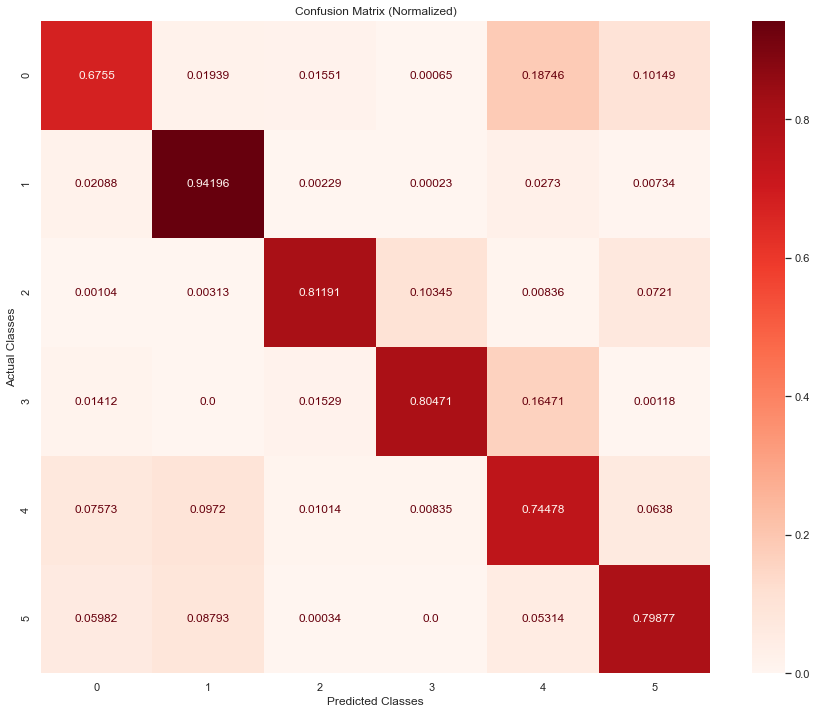

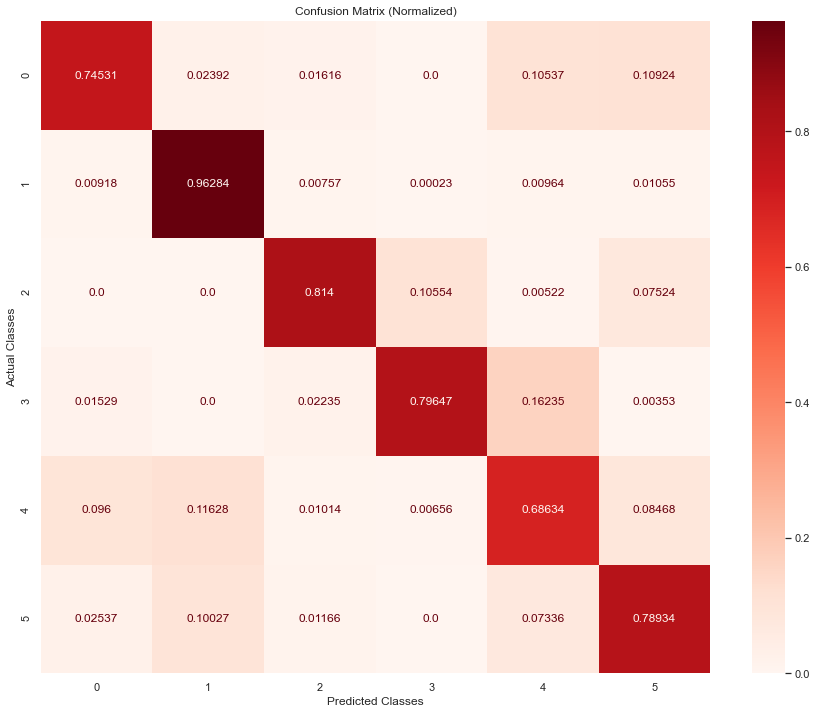

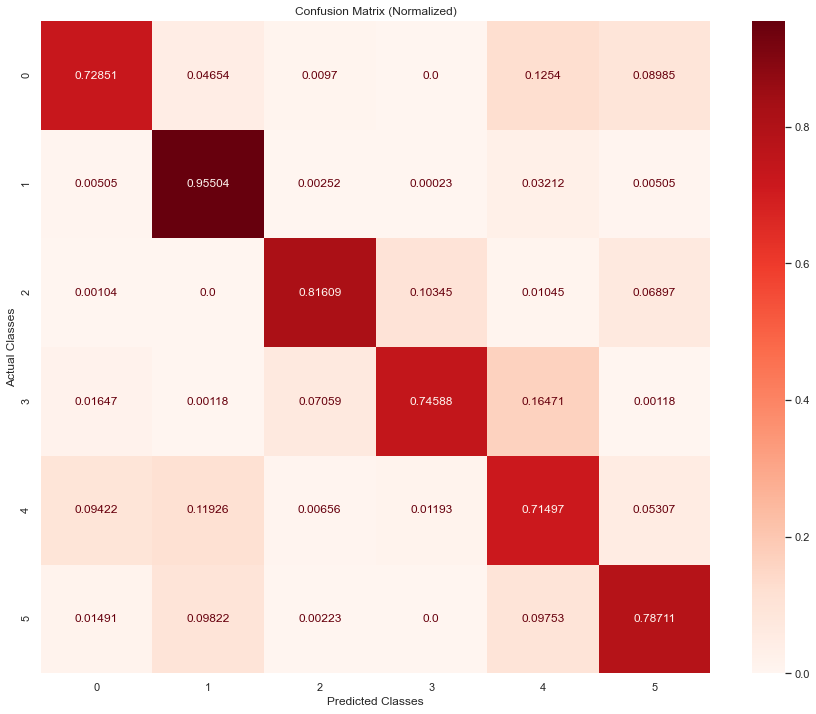

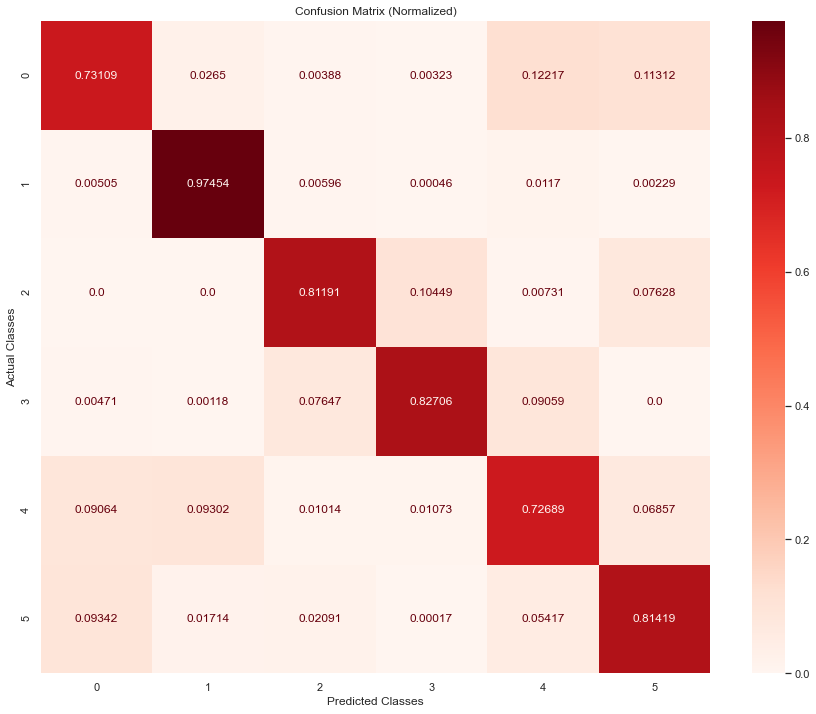

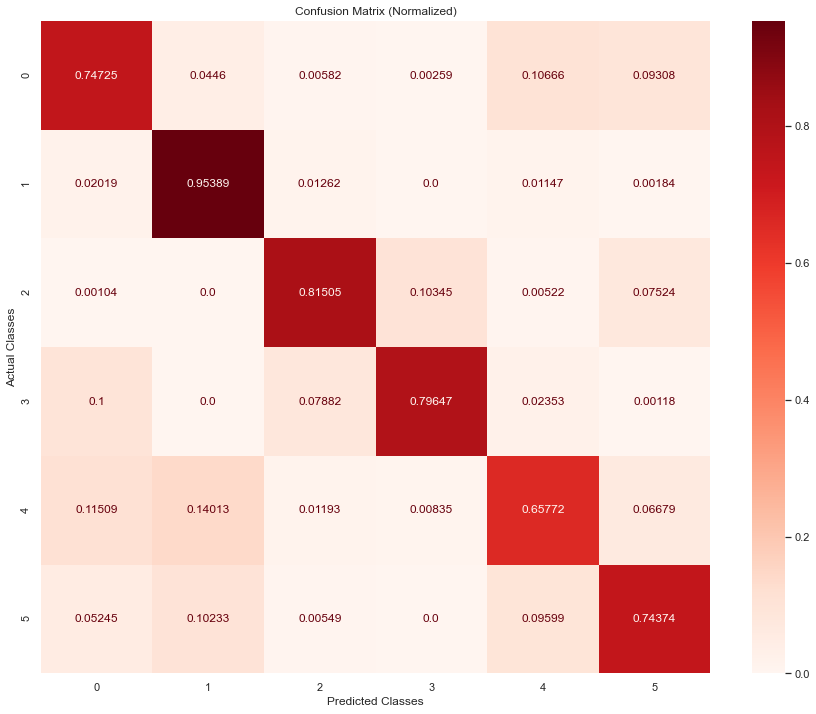

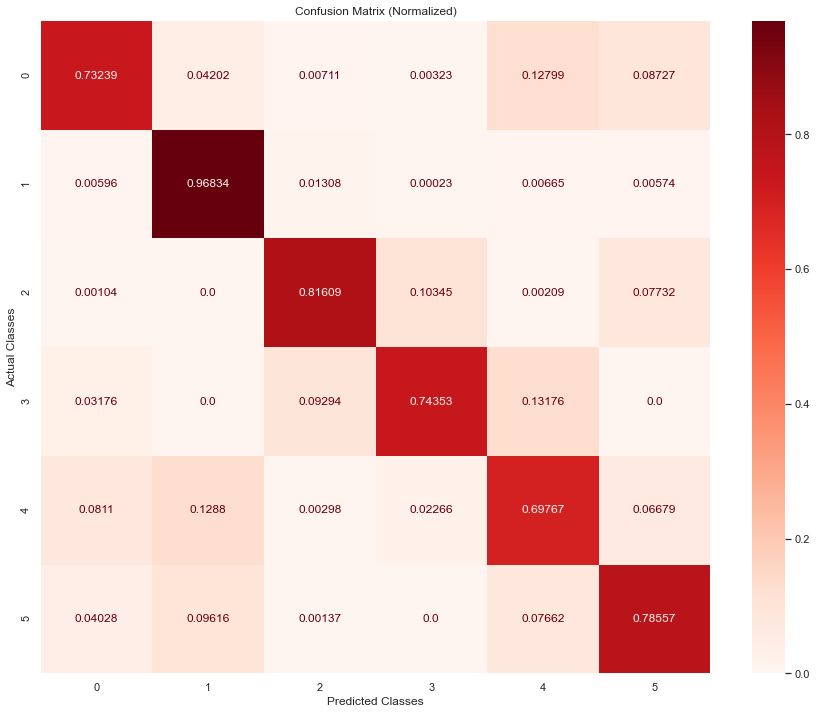

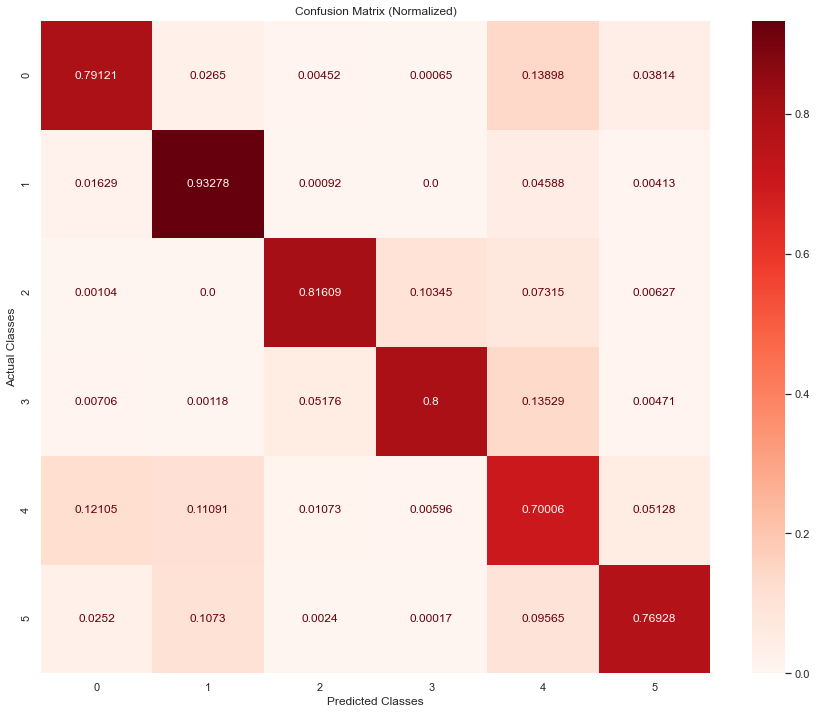

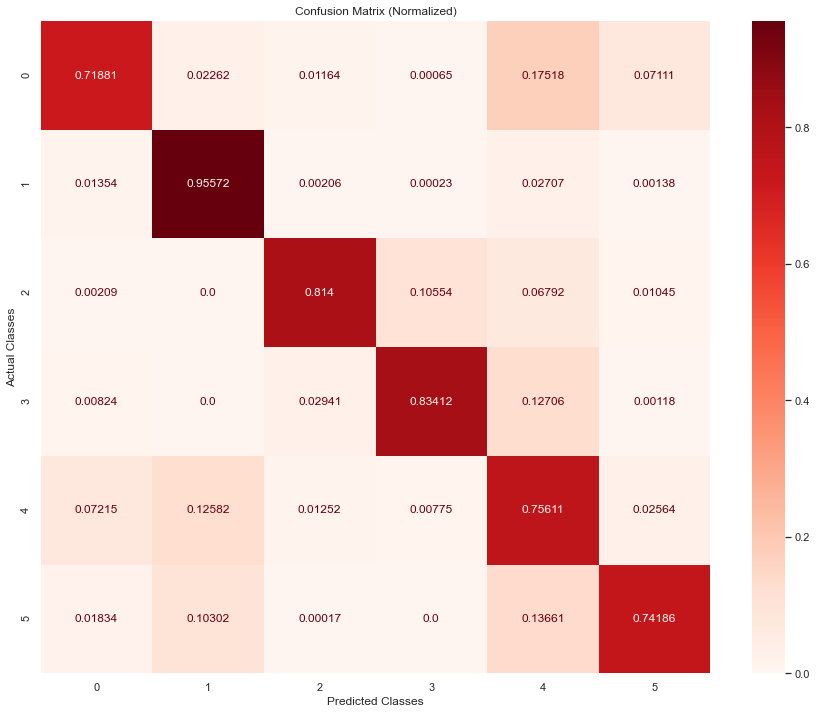

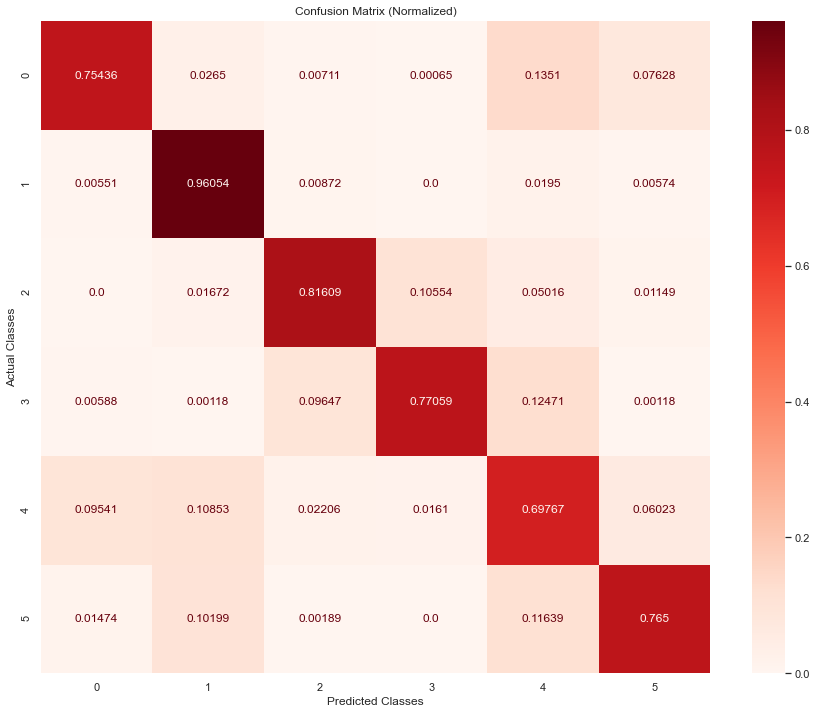

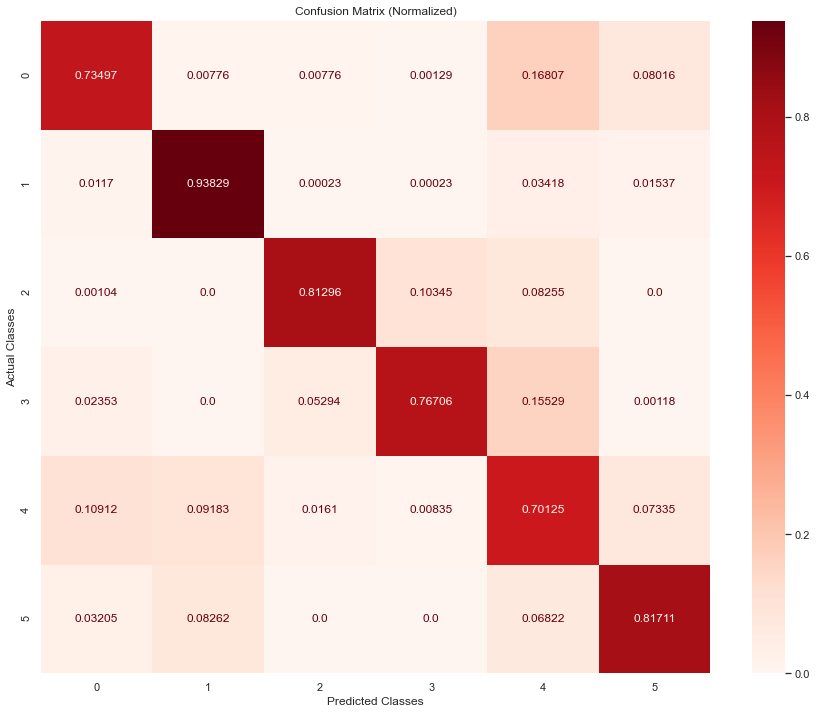

In [90]:
repeat_experiment(model_type="lstm", data = "balanced")

Run:  1
balanced
CNN-LSTM
Epoch 1/5000
1221/1221 [==============================] - 7s 4ms/step - loss: 0.5064 - accuracy: 0.7860 - val_loss: 0.8938 - val_accuracy: 0.8104
Epoch 2/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.2601 - accuracy: 0.9043 - val_loss: 0.8059 - val_accuracy: 0.8156
Epoch 3/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.1886 - accuracy: 0.9329 - val_loss: 0.8259 - val_accuracy: 0.7767
Epoch 4/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.1539 - accuracy: 0.9471 - val_loss: 0.8321 - val_accuracy: 0.8091
Epoch 5/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.1337 - accuracy: 0.9542 - val_loss: 0.9198 - val_accuracy: 0.7992
Epoch 6/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.1190 - accuracy: 0.9600 - val_loss: 0.8622 - val_accuracy: 0.8296
Epoch 7/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.1044 - accuracy: 0

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  2
balanced
CNN-LSTM
Epoch 1/5000
1221/1221 [==============================] - 6s 4ms/step - loss: 0.5062 - accuracy: 0.7902 - val_loss: 0.8658 - val_accuracy: 0.7923
Epoch 2/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.2651 - accuracy: 0.9018 - val_loss: 0.8167 - val_accuracy: 0.8110
Epoch 3/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.1961 - accuracy: 0.9311 - val_loss: 0.8610 - val_accuracy: 0.8000
Epoch 4/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.1621 - accuracy: 0.9441 - val_loss: 0.7444 - val_accuracy: 0.8205
Epoch 5/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.1366 - accuracy: 0.9535 - val_loss: 1.0794 - val_accuracy: 0.7339
Epoch 6/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.1233 - accuracy: 0.9585 - val_loss: 0.8977 - val_accuracy: 0.8185
Epoch 7/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.1092 - accuracy: 0

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  3
balanced
CNN-LSTM
Epoch 1/5000
1221/1221 [==============================] - 6s 4ms/step - loss: 0.5394 - accuracy: 0.7712 - val_loss: 0.7838 - val_accuracy: 0.7824
Epoch 2/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.2690 - accuracy: 0.9008 - val_loss: 0.9014 - val_accuracy: 0.7970
Epoch 3/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.1964 - accuracy: 0.9316 - val_loss: 0.7318 - val_accuracy: 0.8297
Epoch 4/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.1595 - accuracy: 0.9456 - val_loss: 0.7939 - val_accuracy: 0.8243
Epoch 5/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.1350 - accuracy: 0.9539 - val_loss: 0.8688 - val_accuracy: 0.8421
Epoch 6/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.1183 - accuracy: 0.9602 - val_loss: 0.8633 - val_accuracy: 0.8332
Epoch 7/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.1072 - accuracy: 0

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  4
balanced
CNN-LSTM
Epoch 1/5000
1221/1221 [==============================] - 6s 4ms/step - loss: 0.5263 - accuracy: 0.7759 - val_loss: 0.9672 - val_accuracy: 0.7622
Epoch 2/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.2653 - accuracy: 0.9007 - val_loss: 0.8360 - val_accuracy: 0.7955
Epoch 3/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.1920 - accuracy: 0.9316 - val_loss: 0.9368 - val_accuracy: 0.7993
Epoch 4/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.1551 - accuracy: 0.9465 - val_loss: 0.9163 - val_accuracy: 0.7870
Epoch 5/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.1317 - accuracy: 0.9548 - val_loss: 1.0558 - val_accuracy: 0.7955
Epoch 6/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.1181 - accuracy: 0.9610 - val_loss: 0.9075 - val_accuracy: 0.8163
Epoch 7/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.1057 - accuracy: 0

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  5
balanced
CNN-LSTM
Epoch 1/5000
1221/1221 [==============================] - 6s 4ms/step - loss: 0.5178 - accuracy: 0.7807 - val_loss: 0.8269 - val_accuracy: 0.8018
Epoch 2/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.2678 - accuracy: 0.8996 - val_loss: 0.9245 - val_accuracy: 0.8128
Epoch 3/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.1951 - accuracy: 0.9317 - val_loss: 0.8937 - val_accuracy: 0.8031
Epoch 4/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.1591 - accuracy: 0.9457 - val_loss: 1.0040 - val_accuracy: 0.7977
Epoch 5/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.1345 - accuracy: 0.9540 - val_loss: 1.0669 - val_accuracy: 0.7958
Epoch 6/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.1221 - accuracy: 0.9592 - val_loss: 0.8969 - val_accuracy: 0.8139
Epoch 7/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.1057 - accuracy: 0

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  6
balanced
CNN-LSTM
Epoch 1/5000
1221/1221 [==============================] - 6s 4ms/step - loss: 0.5206 - accuracy: 0.7829 - val_loss: 0.9274 - val_accuracy: 0.7796
Epoch 2/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.2580 - accuracy: 0.9056 - val_loss: 0.9106 - val_accuracy: 0.7996
Epoch 3/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.1887 - accuracy: 0.9345 - val_loss: 1.0460 - val_accuracy: 0.7436
Epoch 4/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.1548 - accuracy: 0.9468 - val_loss: 1.0788 - val_accuracy: 0.7893
Epoch 5/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.1354 - accuracy: 0.9548 - val_loss: 0.9339 - val_accuracy: 0.8250
Epoch 6/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.1159 - accuracy: 0.9610 - val_loss: 0.8361 - val_accuracy: 0.8210
Epoch 7/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.1068 - accuracy: 0

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  7
balanced
CNN-LSTM
Epoch 1/5000
1221/1221 [==============================] - 6s 4ms/step - loss: 0.5203 - accuracy: 0.7812 - val_loss: 0.9032 - val_accuracy: 0.7671
Epoch 2/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.2679 - accuracy: 0.8989 - val_loss: 0.8972 - val_accuracy: 0.8056
Epoch 3/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.1926 - accuracy: 0.9308 - val_loss: 0.9751 - val_accuracy: 0.8064
Epoch 4/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.1535 - accuracy: 0.9473 - val_loss: 1.0025 - val_accuracy: 0.7853
Epoch 5/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.1328 - accuracy: 0.9553 - val_loss: 1.0065 - val_accuracy: 0.7706
Epoch 6/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.1187 - accuracy: 0.9596 - val_loss: 0.9169 - val_accuracy: 0.8115
Epoch 7/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.1009 - accuracy: 0

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  8
balanced
CNN-LSTM
Epoch 1/5000
1221/1221 [==============================] - 7s 4ms/step - loss: 0.5075 - accuracy: 0.7872 - val_loss: 0.7977 - val_accuracy: 0.8059
Epoch 2/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.2697 - accuracy: 0.8996 - val_loss: 0.8604 - val_accuracy: 0.7999
Epoch 3/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.1973 - accuracy: 0.9307 - val_loss: 0.8849 - val_accuracy: 0.7727
Epoch 4/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.1608 - accuracy: 0.9444 - val_loss: 0.9131 - val_accuracy: 0.8135
Epoch 5/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.1372 - accuracy: 0.9537 - val_loss: 0.9682 - val_accuracy: 0.8024
Epoch 6/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.1226 - accuracy: 0.9595 - val_loss: 0.8459 - val_accuracy: 0.8346
Epoch 7/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.1067 - accuracy: 0

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  9
balanced
CNN-LSTM
Epoch 1/5000
1221/1221 [==============================] - 6s 4ms/step - loss: 0.5130 - accuracy: 0.7831 - val_loss: 0.8717 - val_accuracy: 0.7970
Epoch 2/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.2642 - accuracy: 0.9033 - val_loss: 0.9856 - val_accuracy: 0.7671
Epoch 3/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.1922 - accuracy: 0.9330 - val_loss: 0.9690 - val_accuracy: 0.8038
Epoch 4/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.1549 - accuracy: 0.9463 - val_loss: 0.8294 - val_accuracy: 0.8012
Epoch 5/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.1342 - accuracy: 0.9540 - val_loss: 0.8654 - val_accuracy: 0.8233
Epoch 6/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.1180 - accuracy: 0.9602 - val_loss: 1.0637 - val_accuracy: 0.7741
Epoch 7/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.1034 - accuracy: 0

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  10
balanced
CNN-LSTM
Epoch 1/5000
1221/1221 [==============================] - 7s 4ms/step - loss: 0.5098 - accuracy: 0.7857 - val_loss: 0.7360 - val_accuracy: 0.7981
Epoch 2/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.2550 - accuracy: 0.9065 - val_loss: 0.8039 - val_accuracy: 0.7934
Epoch 3/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.1903 - accuracy: 0.9346 - val_loss: 0.7604 - val_accuracy: 0.7926
Epoch 4/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.1562 - accuracy: 0.9466 - val_loss: 0.8458 - val_accuracy: 0.7813
Epoch 5/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.1307 - accuracy: 0.9565 - val_loss: 0.8190 - val_accuracy: 0.8001
Epoch 6/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.1175 - accuracy: 0.9601 - val_loss: 0.9278 - val_accuracy: 0.7712
Epoch 7/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.1021 - accuracy: 

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


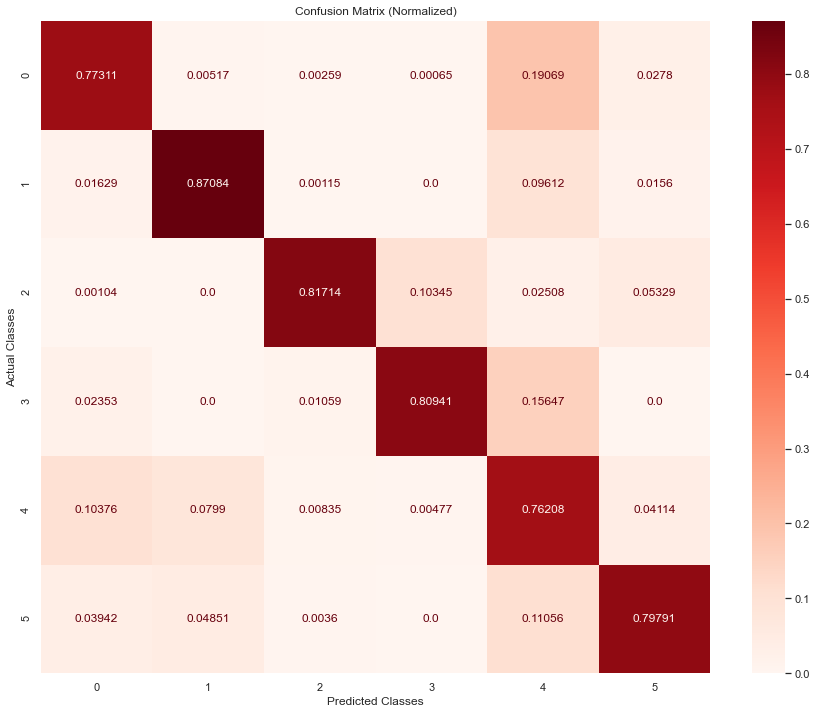

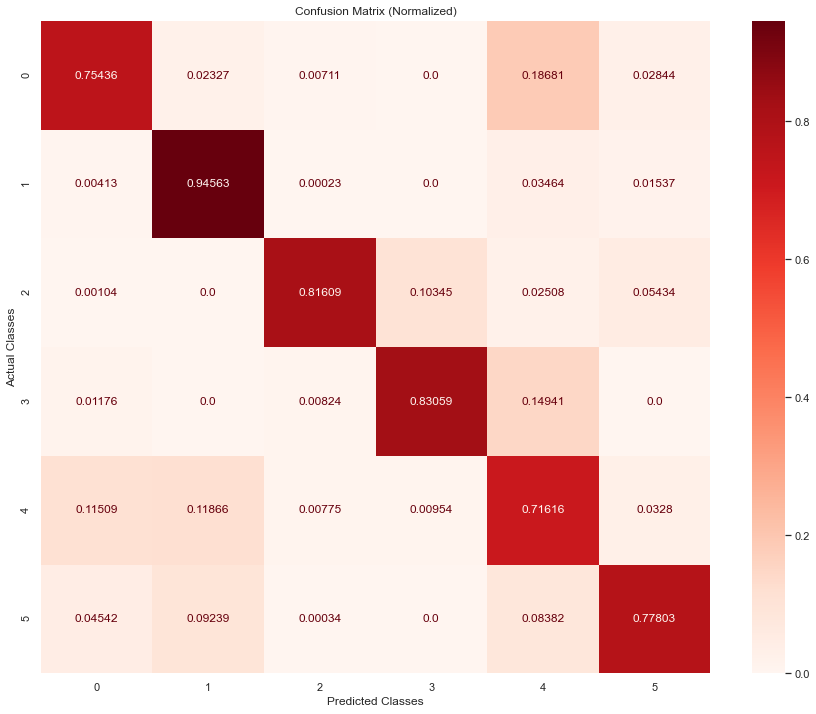

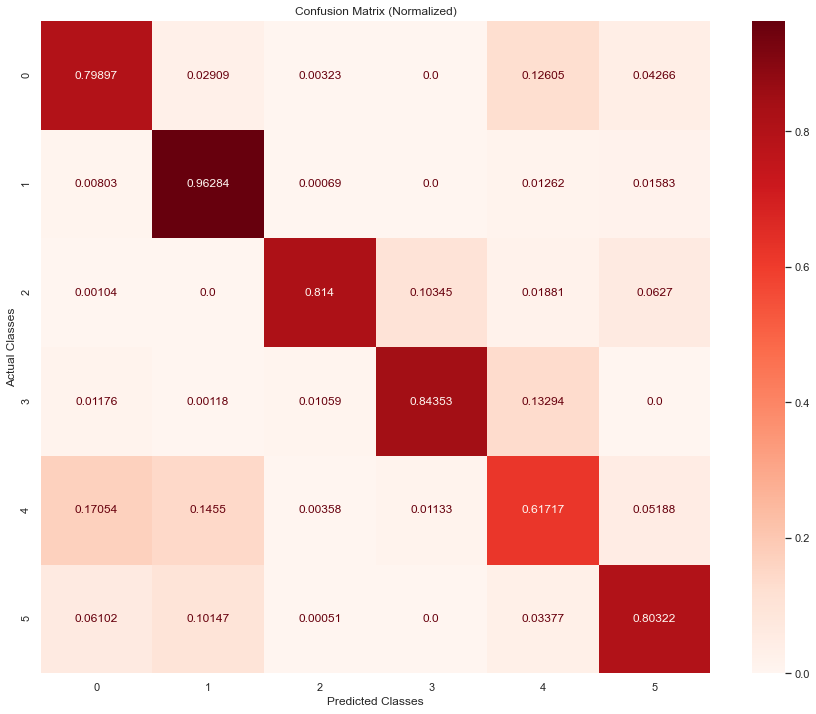

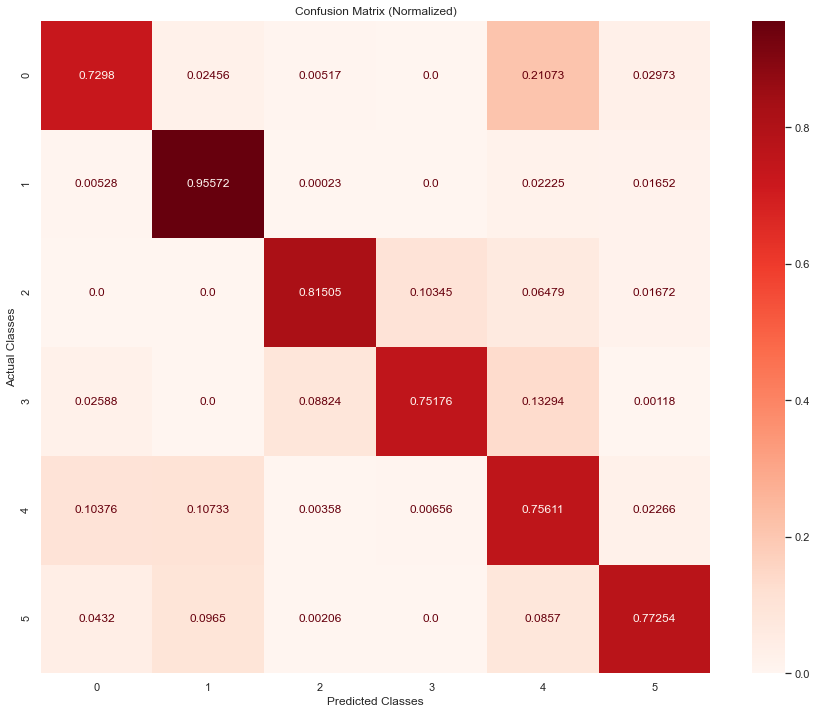

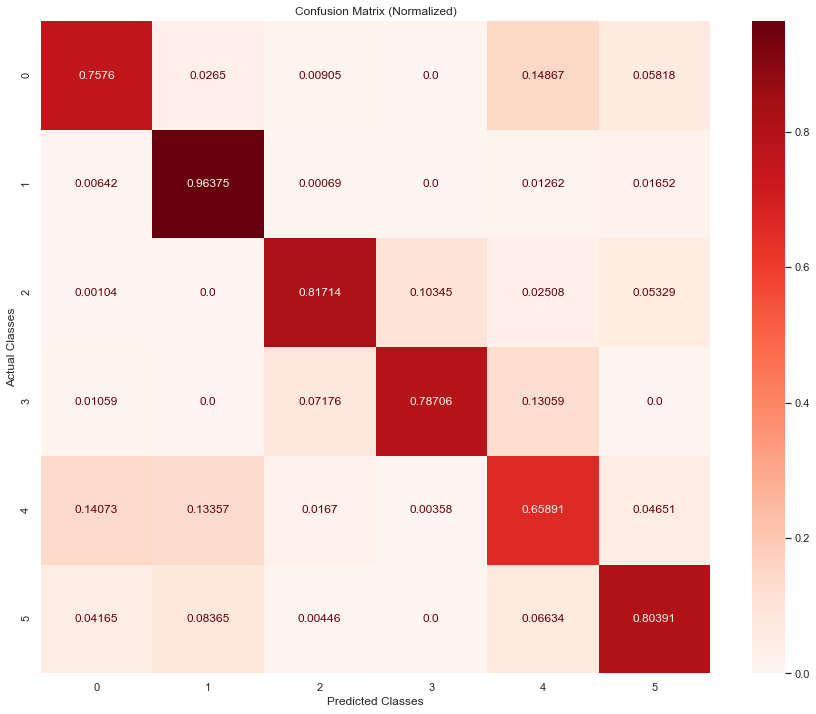

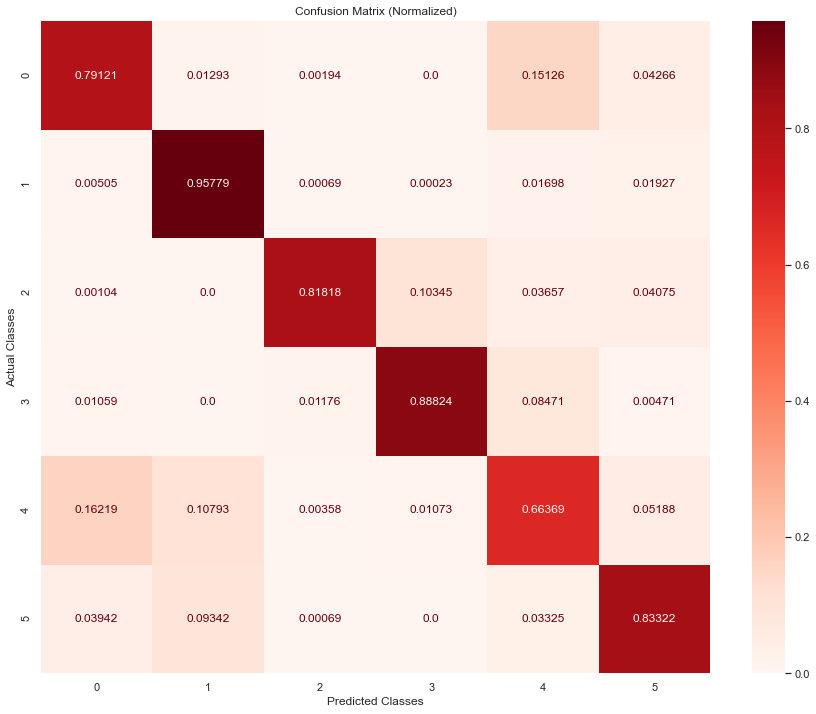

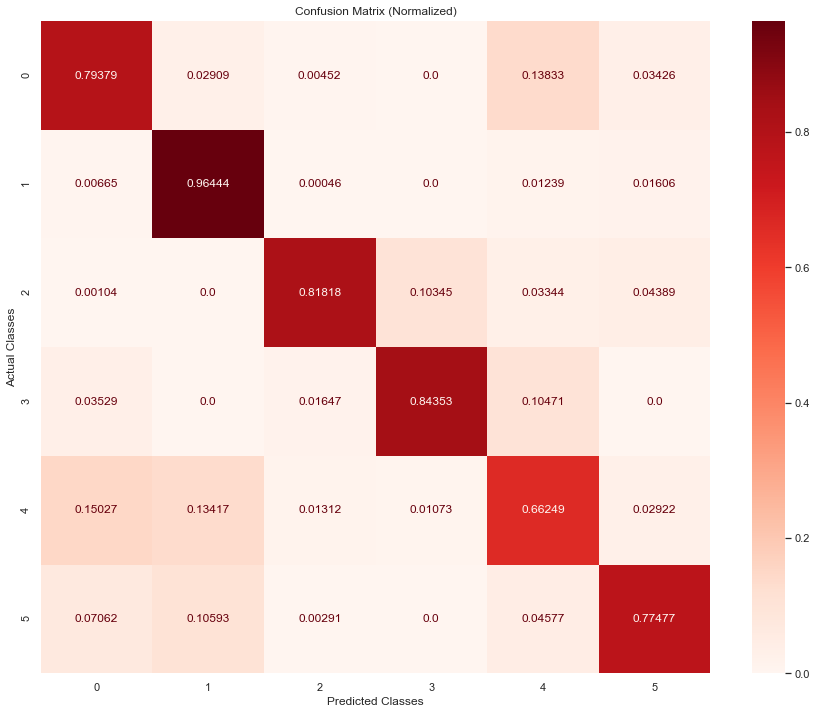

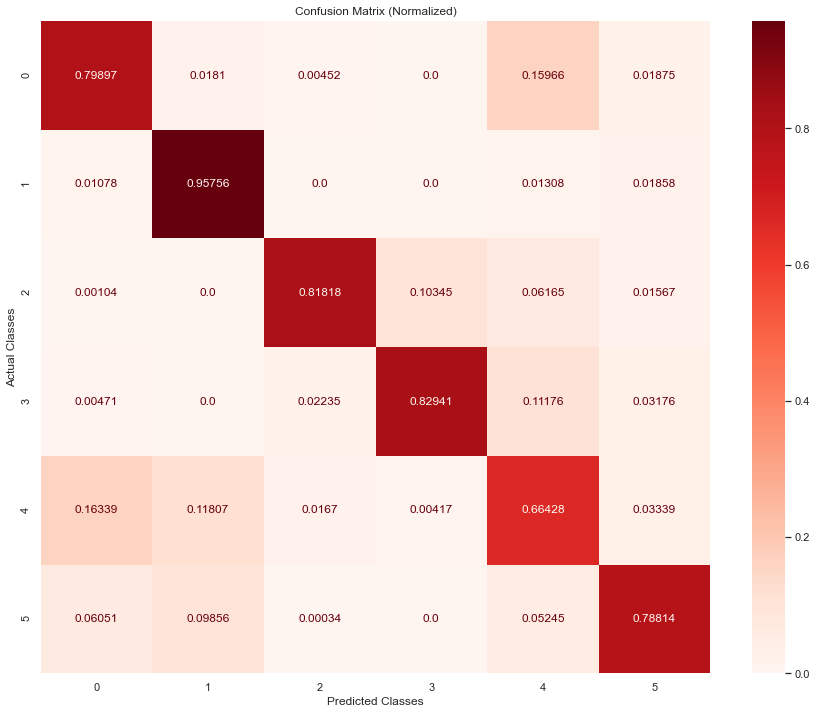

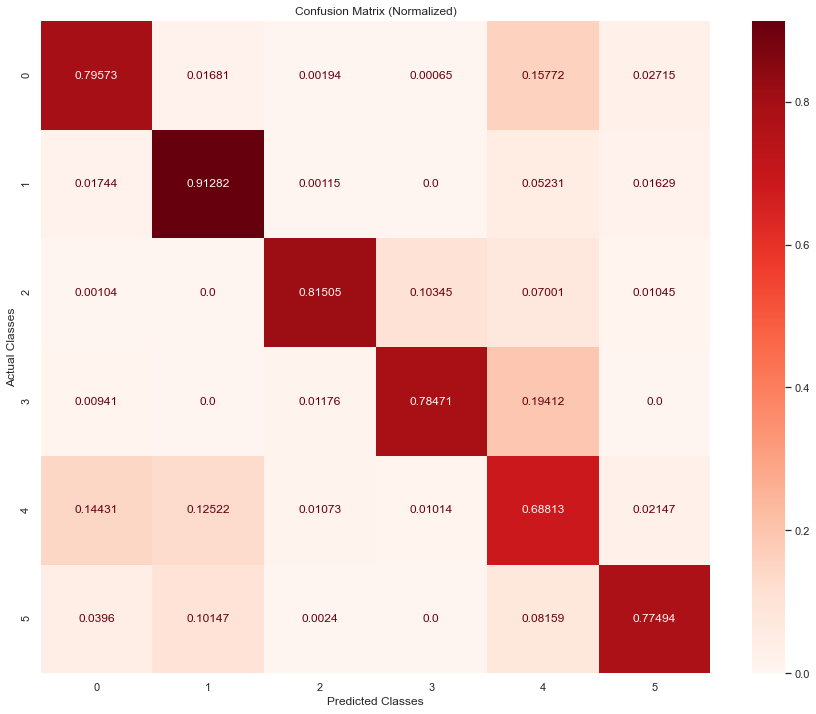

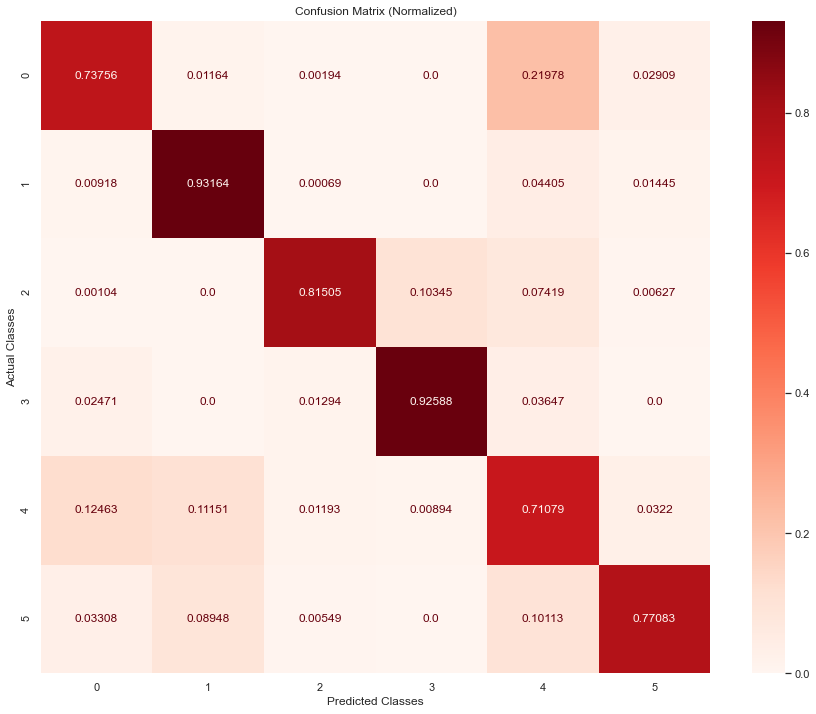

In [91]:
repeat_experiment(model_type="cnnlstm", data = "balanced")

Run:  1
balanced
ConvLSTM
Epoch 1/5000
1221/1221 [==============================] - 15s 12ms/step - loss: 0.5694 - accuracy: 0.7643 - val_loss: 0.8303 - val_accuracy: 0.7880
Epoch 2/5000
1221/1221 [==============================] - 14s 12ms/step - loss: 0.3285 - accuracy: 0.8720 - val_loss: 0.9524 - val_accuracy: 0.7716
Epoch 3/5000
1221/1221 [==============================] - 14s 12ms/step - loss: 0.2572 - accuracy: 0.9056 - val_loss: 0.7674 - val_accuracy: 0.7944
Epoch 4/5000
1221/1221 [==============================] - 14s 12ms/step - loss: 0.2187 - accuracy: 0.9209 - val_loss: 0.7571 - val_accuracy: 0.8040
Epoch 5/5000
1221/1221 [==============================] - 14s 12ms/step - loss: 0.1923 - accuracy: 0.9308 - val_loss: 0.7807 - val_accuracy: 0.8012
Epoch 6/5000
1221/1221 [==============================] - 14s 12ms/step - loss: 0.1754 - accuracy: 0.9378 - val_loss: 0.7855 - val_accuracy: 0.8040
Epoch 7/5000
1221/1221 [==============================] - 14s 11ms/step - loss: 0.1577

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  2
balanced
ConvLSTM
Epoch 1/5000
1221/1221 [==============================] - 16s 12ms/step - loss: 0.5494 - accuracy: 0.7761 - val_loss: 0.7822 - val_accuracy: 0.7880
Epoch 2/5000
1221/1221 [==============================] - 14s 12ms/step - loss: 0.3221 - accuracy: 0.8753 - val_loss: 0.7326 - val_accuracy: 0.8108
Epoch 3/5000
1221/1221 [==============================] - 14s 12ms/step - loss: 0.2609 - accuracy: 0.9033 - val_loss: 0.6824 - val_accuracy: 0.8085
Epoch 4/5000
1221/1221 [==============================] - 14s 12ms/step - loss: 0.2252 - accuracy: 0.9185 - val_loss: 0.7443 - val_accuracy: 0.7904
Epoch 5/5000
1221/1221 [==============================] - 14s 12ms/step - loss: 0.1988 - accuracy: 0.9283 - val_loss: 0.8058 - val_accuracy: 0.8104
Epoch 6/5000
1221/1221 [==============================] - 14s 12ms/step - loss: 0.1820 - accuracy: 0.9344 - val_loss: 0.7389 - val_accuracy: 0.8102
Epoch 7/5000
1221/1221 [==============================] - 14s 12ms/step - loss: 0.1638

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  3
balanced
ConvLSTM
Epoch 1/5000
1221/1221 [==============================] - 15s 11ms/step - loss: 0.5643 - accuracy: 0.7652 - val_loss: 0.8072 - val_accuracy: 0.7856
Epoch 2/5000
1221/1221 [==============================] - 14s 11ms/step - loss: 0.3308 - accuracy: 0.8703 - val_loss: 0.7668 - val_accuracy: 0.7976
Epoch 3/5000
1221/1221 [==============================] - 14s 11ms/step - loss: 0.2610 - accuracy: 0.9021 - val_loss: 0.6914 - val_accuracy: 0.8012
Epoch 4/5000
1221/1221 [==============================] - 14s 11ms/step - loss: 0.2187 - accuracy: 0.9200 - val_loss: 0.7829 - val_accuracy: 0.7937
Epoch 5/5000
1221/1221 [==============================] - 14s 11ms/step - loss: 0.1928 - accuracy: 0.9314 - val_loss: 0.6814 - val_accuracy: 0.8255
Epoch 6/5000
1221/1221 [==============================] - 14s 11ms/step - loss: 0.1741 - accuracy: 0.9380 - val_loss: 0.8476 - val_accuracy: 0.8052
Epoch 7/5000
1221/1221 [==============================] - 14s 11ms/step - loss: 0.1583

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  4
balanced
ConvLSTM
Epoch 1/5000
1221/1221 [==============================] - 15s 12ms/step - loss: 0.5727 - accuracy: 0.7608 - val_loss: 0.8485 - val_accuracy: 0.7960
Epoch 2/5000
1221/1221 [==============================] - 14s 11ms/step - loss: 0.3320 - accuracy: 0.8708 - val_loss: 0.7651 - val_accuracy: 0.8013
Epoch 3/5000
1221/1221 [==============================] - 14s 11ms/step - loss: 0.2621 - accuracy: 0.9025 - val_loss: 0.7122 - val_accuracy: 0.8138
Epoch 4/5000
1221/1221 [==============================] - 14s 11ms/step - loss: 0.2249 - accuracy: 0.9179 - val_loss: 0.8672 - val_accuracy: 0.7797
Epoch 5/5000
1221/1221 [==============================] - 14s 11ms/step - loss: 0.1977 - accuracy: 0.9295 - val_loss: 0.7429 - val_accuracy: 0.8184
Epoch 6/5000
1221/1221 [==============================] - 14s 11ms/step - loss: 0.1777 - accuracy: 0.9371 - val_loss: 0.7828 - val_accuracy: 0.8207
Epoch 7/5000
1221/1221 [==============================] - 14s 11ms/step - loss: 0.1612

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  5
balanced
ConvLSTM
Epoch 1/5000
1221/1221 [==============================] - 14s 10ms/step - loss: 0.5660 - accuracy: 0.7647 - val_loss: 1.0251 - val_accuracy: 0.6950
Epoch 2/5000
1221/1221 [==============================] - 12s 10ms/step - loss: 0.3258 - accuracy: 0.8747 - val_loss: 0.8357 - val_accuracy: 0.7977
Epoch 3/5000
1221/1221 [==============================] - 12s 10ms/step - loss: 0.2510 - accuracy: 0.9086 - val_loss: 0.6750 - val_accuracy: 0.8168
Epoch 4/5000
1221/1221 [==============================] - 12s 10ms/step - loss: 0.2118 - accuracy: 0.9234 - val_loss: 0.7850 - val_accuracy: 0.8029
Epoch 5/5000
1221/1221 [==============================] - 12s 10ms/step - loss: 0.1869 - accuracy: 0.9344 - val_loss: 0.8920 - val_accuracy: 0.8007
Epoch 6/5000
1221/1221 [==============================] - 12s 10ms/step - loss: 0.1685 - accuracy: 0.9404 - val_loss: 0.8451 - val_accuracy: 0.8014
Epoch 7/5000
1221/1221 [==============================] - 12s 10ms/step - loss: 0.1549

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  6
balanced
ConvLSTM
Epoch 1/5000
1221/1221 [==============================] - 17s 13ms/step - loss: 0.5450 - accuracy: 0.7770 - val_loss: 0.9334 - val_accuracy: 0.7760
Epoch 2/5000
1221/1221 [==============================] - 16s 13ms/step - loss: 0.3158 - accuracy: 0.8795 - val_loss: 0.7969 - val_accuracy: 0.8094
Epoch 3/5000
1221/1221 [==============================] - 16s 13ms/step - loss: 0.2525 - accuracy: 0.9071 - val_loss: 0.8135 - val_accuracy: 0.7928
Epoch 4/5000
1221/1221 [==============================] - 16s 13ms/step - loss: 0.2125 - accuracy: 0.9230 - val_loss: 0.8037 - val_accuracy: 0.7945
Epoch 5/5000
1221/1221 [==============================] - 16s 13ms/step - loss: 0.1854 - accuracy: 0.9344 - val_loss: 0.8241 - val_accuracy: 0.8172
Epoch 6/5000
1221/1221 [==============================] - 16s 13ms/step - loss: 0.1668 - accuracy: 0.9412 - val_loss: 0.9171 - val_accuracy: 0.8195
Epoch 7/5000
1221/1221 [==============================] - 16s 13ms/step - loss: 0.1515

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  7
balanced
ConvLSTM
Epoch 1/5000
1221/1221 [==============================] - 16s 12ms/step - loss: 0.5755 - accuracy: 0.7594 - val_loss: 0.7416 - val_accuracy: 0.7880
Epoch 2/5000
1221/1221 [==============================] - 15s 12ms/step - loss: 0.3381 - accuracy: 0.8672 - val_loss: 0.8692 - val_accuracy: 0.7799
Epoch 3/5000
1221/1221 [==============================] - 15s 12ms/step - loss: 0.2598 - accuracy: 0.9018 - val_loss: 0.9439 - val_accuracy: 0.7669
Epoch 4/5000
1221/1221 [==============================] - 15s 12ms/step - loss: 0.2165 - accuracy: 0.9213 - val_loss: 0.7544 - val_accuracy: 0.8031
Epoch 5/5000
1221/1221 [==============================] - 15s 12ms/step - loss: 0.1885 - accuracy: 0.9325 - val_loss: 0.8295 - val_accuracy: 0.7974
Epoch 6/5000
1221/1221 [==============================] - 15s 12ms/step - loss: 0.1701 - accuracy: 0.9401 - val_loss: 0.7766 - val_accuracy: 0.8113
Epoch 7/5000
1221/1221 [==============================] - 15s 12ms/step - loss: 0.1539

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  8
balanced
ConvLSTM
Epoch 1/5000
1221/1221 [==============================] - 16s 12ms/step - loss: 0.5607 - accuracy: 0.7663 - val_loss: 0.9120 - val_accuracy: 0.7689
Epoch 2/5000
1221/1221 [==============================] - 15s 12ms/step - loss: 0.3241 - accuracy: 0.8741 - val_loss: 0.8582 - val_accuracy: 0.7903
Epoch 3/5000
1221/1221 [==============================] - 15s 12ms/step - loss: 0.2511 - accuracy: 0.9088 - val_loss: 0.8260 - val_accuracy: 0.7958
Epoch 4/5000
1221/1221 [==============================] - 15s 12ms/step - loss: 0.2142 - accuracy: 0.9227 - val_loss: 0.8044 - val_accuracy: 0.8029
Epoch 5/5000
1221/1221 [==============================] - 15s 12ms/step - loss: 0.1891 - accuracy: 0.9330 - val_loss: 0.8375 - val_accuracy: 0.8277
Epoch 6/5000
1221/1221 [==============================] - 15s 12ms/step - loss: 0.1711 - accuracy: 0.9405 - val_loss: 0.8246 - val_accuracy: 0.8150
Epoch 7/5000
1221/1221 [==============================] - 15s 12ms/step - loss: 0.1572

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  9
balanced
ConvLSTM
Epoch 1/5000
1221/1221 [==============================] - 17s 13ms/step - loss: 0.5513 - accuracy: 0.7759 - val_loss: 0.8273 - val_accuracy: 0.7740
Epoch 2/5000
1221/1221 [==============================] - 15s 13ms/step - loss: 0.3191 - accuracy: 0.8771 - val_loss: 0.8323 - val_accuracy: 0.7836
Epoch 3/5000
1221/1221 [==============================] - 15s 13ms/step - loss: 0.2533 - accuracy: 0.9056 - val_loss: 0.8353 - val_accuracy: 0.7907
Epoch 4/5000
1221/1221 [==============================] - 16s 13ms/step - loss: 0.2173 - accuracy: 0.9208 - val_loss: 0.8954 - val_accuracy: 0.7703
Epoch 5/5000
1221/1221 [==============================] - 15s 13ms/step - loss: 0.1903 - accuracy: 0.9318 - val_loss: 0.8603 - val_accuracy: 0.8036
Epoch 6/5000
1221/1221 [==============================] - 15s 13ms/step - loss: 0.1694 - accuracy: 0.9403 - val_loss: 0.9295 - val_accuracy: 0.8013
Epoch 7/5000
1221/1221 [==============================] - 15s 13ms/step - loss: 0.1562

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  10
balanced
ConvLSTM
Epoch 1/5000
1221/1221 [==============================] - 18s 14ms/step - loss: 0.5642 - accuracy: 0.7678 - val_loss: 0.8336 - val_accuracy: 0.7899
Epoch 2/5000
1221/1221 [==============================] - 17s 14ms/step - loss: 0.3262 - accuracy: 0.8750 - val_loss: 0.7169 - val_accuracy: 0.8072
Epoch 3/5000
1221/1221 [==============================] - 17s 14ms/step - loss: 0.2577 - accuracy: 0.9034 - val_loss: 0.6147 - val_accuracy: 0.8182
Epoch 4/5000
1221/1221 [==============================] - 17s 14ms/step - loss: 0.2230 - accuracy: 0.9181 - val_loss: 0.6841 - val_accuracy: 0.8047
Epoch 5/5000
1221/1221 [==============================] - 17s 14ms/step - loss: 0.1979 - accuracy: 0.9296 - val_loss: 0.6648 - val_accuracy: 0.8170
Epoch 6/5000
1221/1221 [==============================] - 17s 14ms/step - loss: 0.1789 - accuracy: 0.9364 - val_loss: 0.6840 - val_accuracy: 0.8111
Epoch 7/5000
1221/1221 [==============================] - 17s 14ms/step - loss: 0.161

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


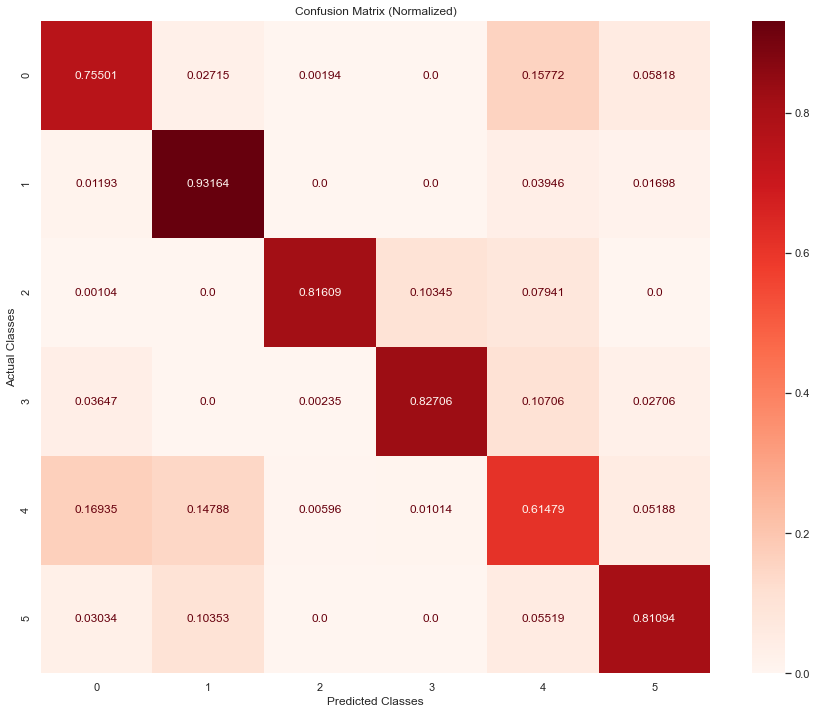

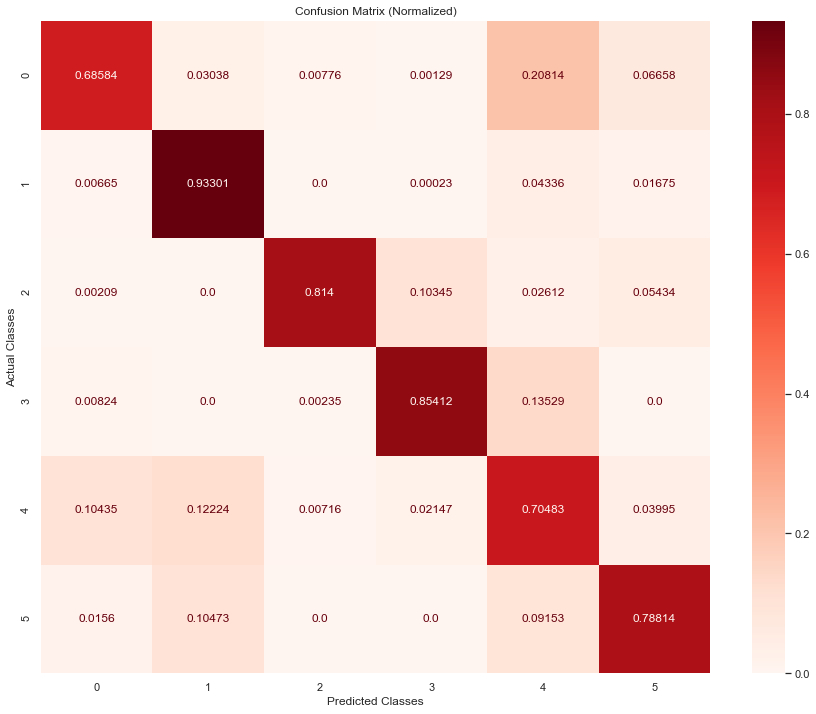

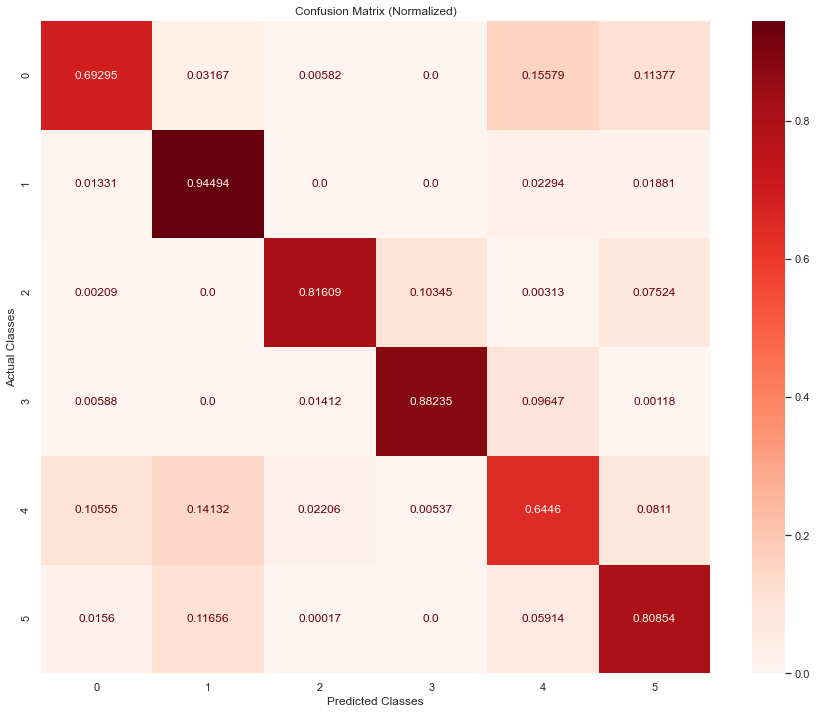

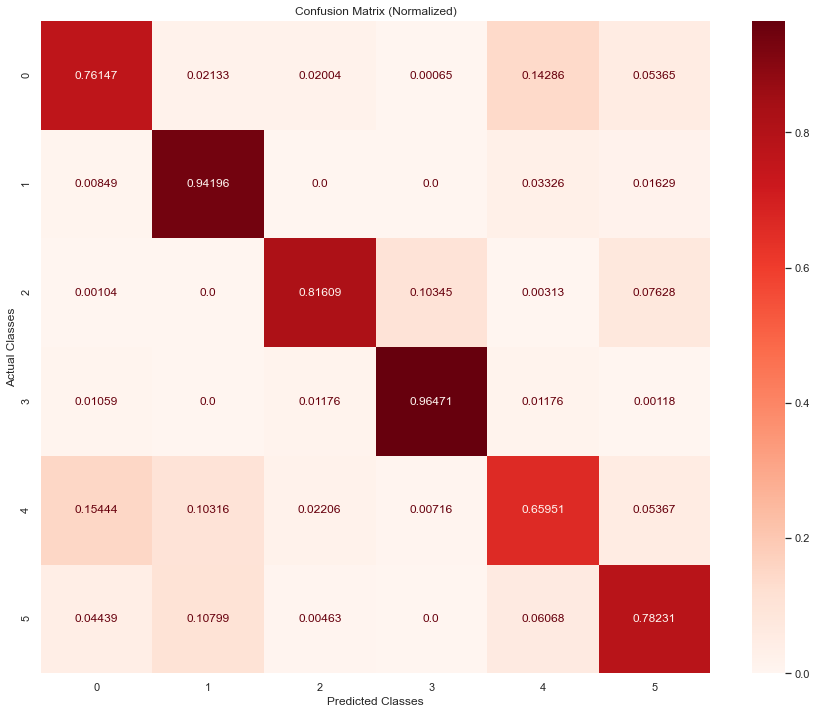

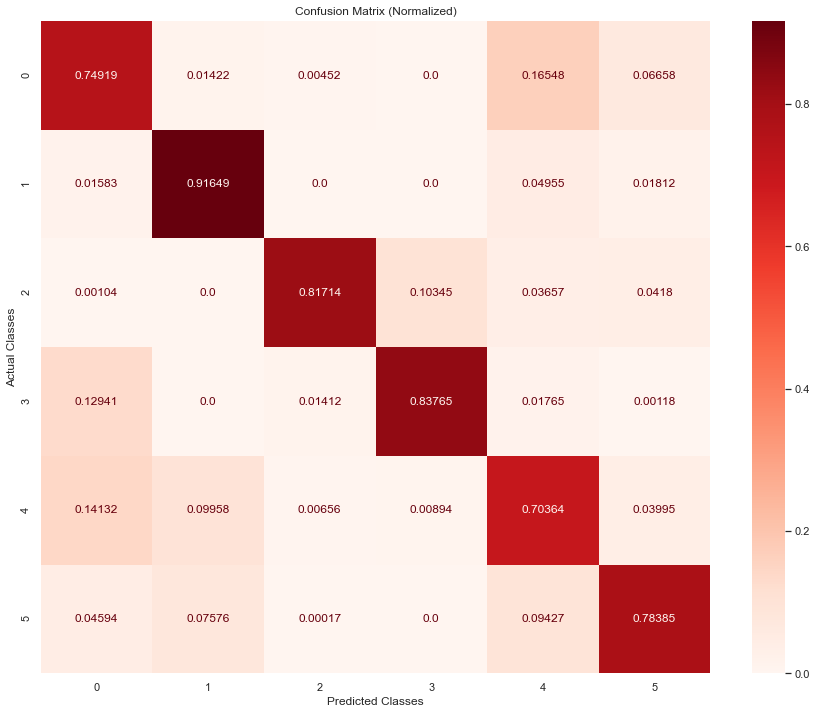

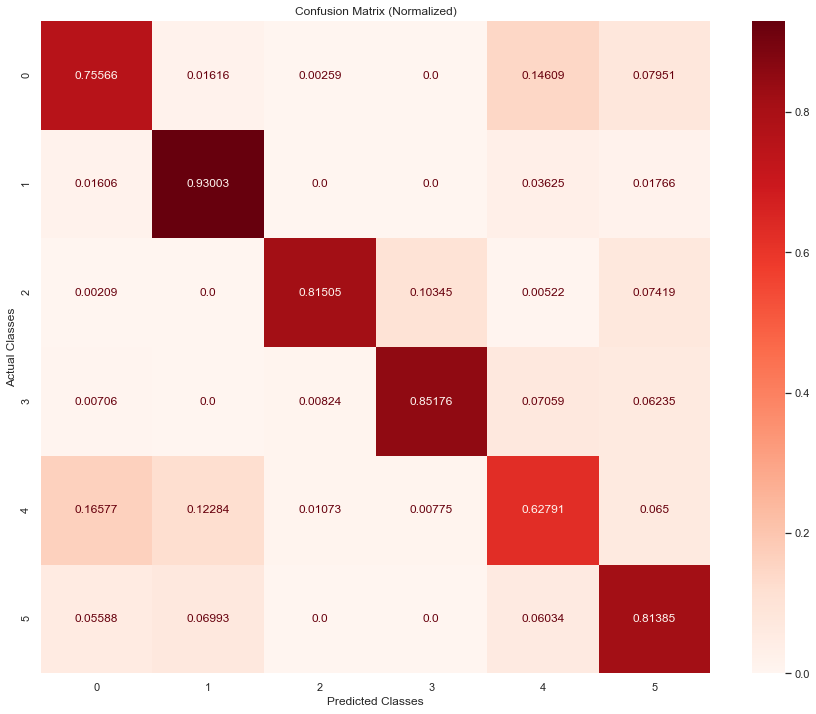

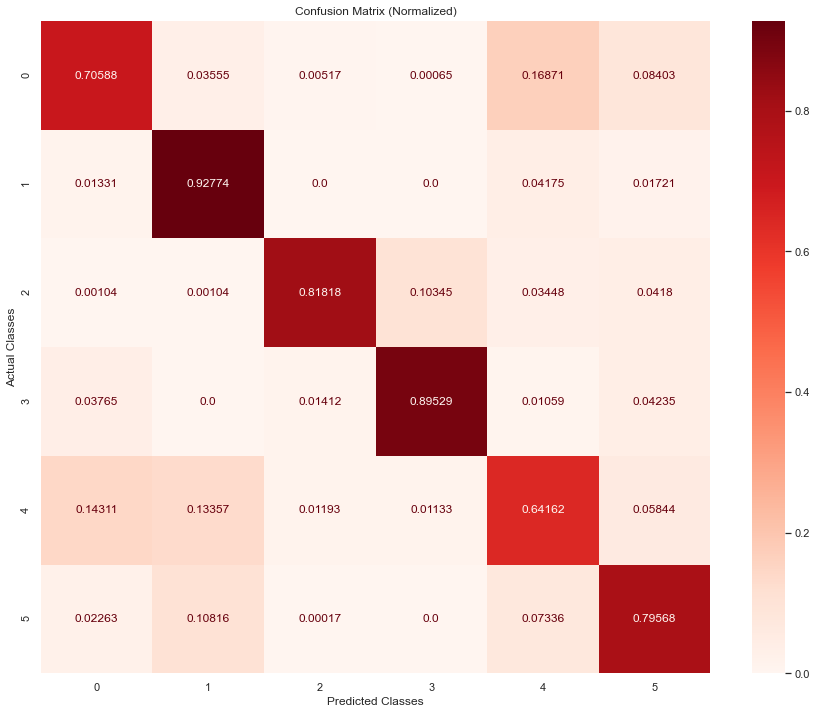

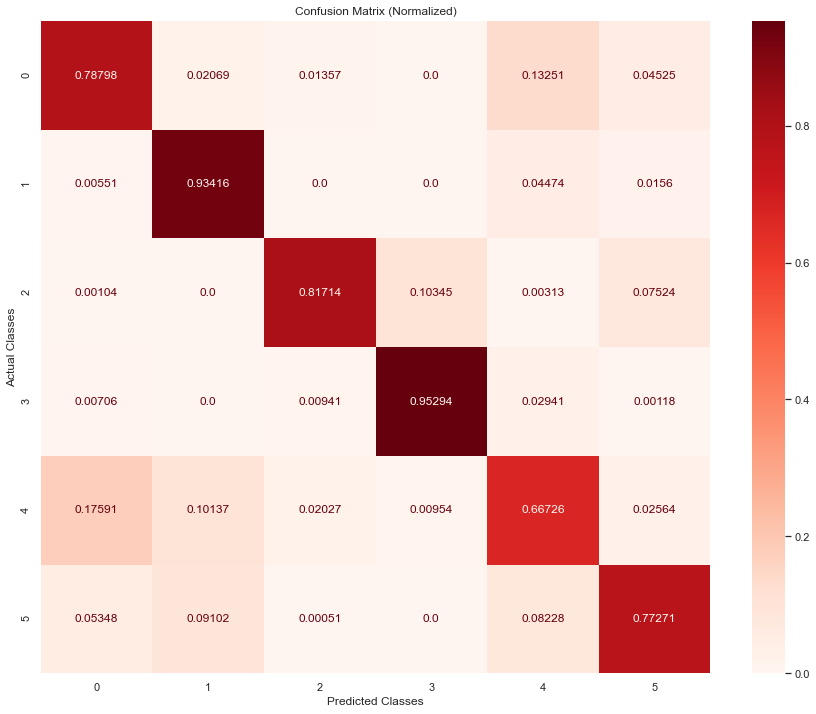

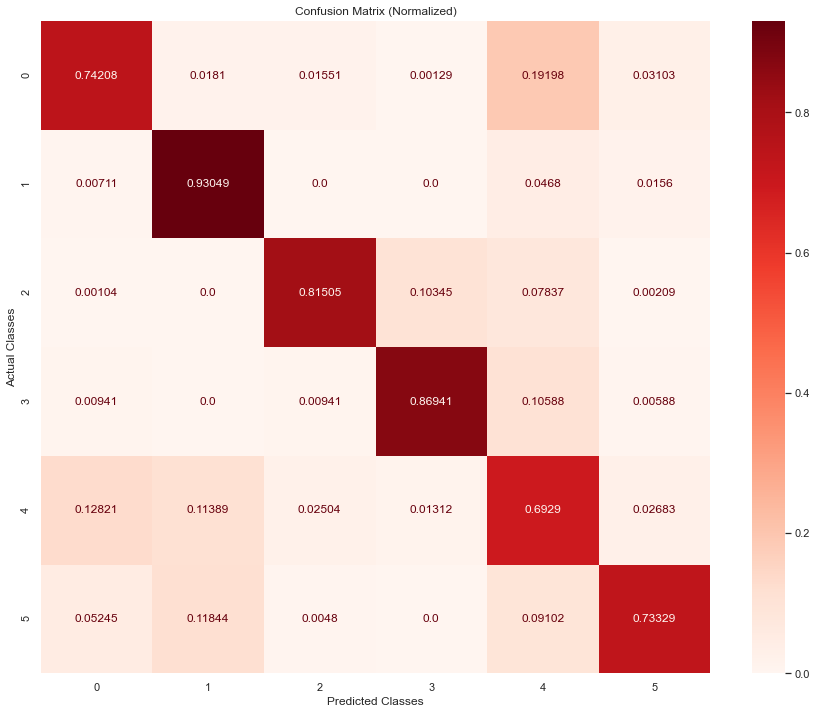

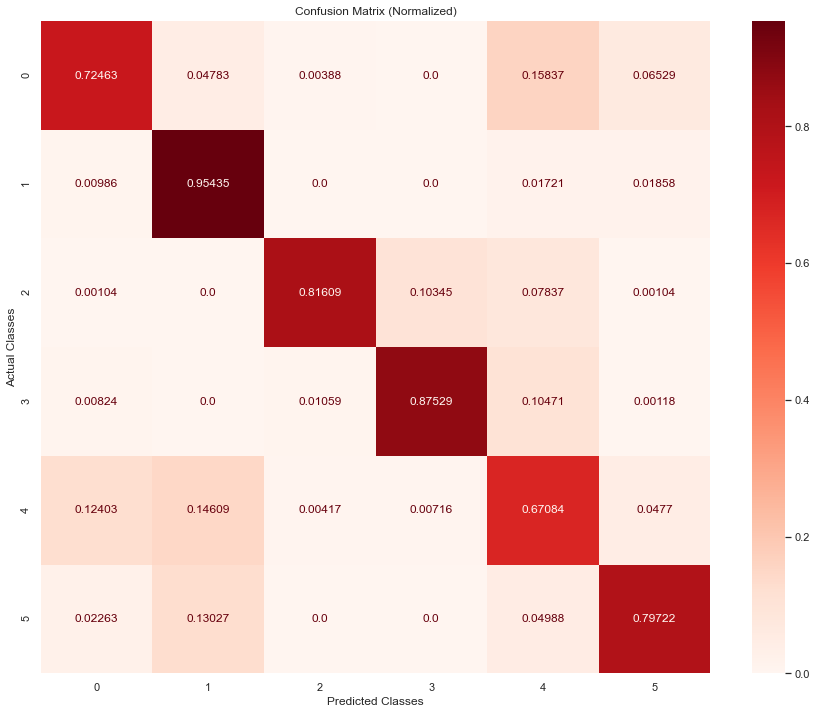

In [92]:
repeat_experiment(model_type="convlstm", data = "balanced")

Run:  1
balanced
Bi-LSTM
Epoch 1/5000
1221/1221 [==============================] - 13s 9ms/step - loss: 0.8446 - accuracy: 0.6415 - val_loss: 1.0500 - val_accuracy: 0.6430
Epoch 2/5000
1221/1221 [==============================] - 11s 9ms/step - loss: 0.5086 - accuracy: 0.7852 - val_loss: 0.8546 - val_accuracy: 0.7785
Epoch 3/5000
1221/1221 [==============================] - 11s 9ms/step - loss: 0.2959 - accuracy: 0.8941 - val_loss: 0.6483 - val_accuracy: 0.8236
Epoch 4/5000
1221/1221 [==============================] - 11s 9ms/step - loss: 0.2110 - accuracy: 0.9286 - val_loss: 0.6027 - val_accuracy: 0.8201
Epoch 5/5000
1221/1221 [==============================] - 11s 9ms/step - loss: 0.1711 - accuracy: 0.9428 - val_loss: 0.8198 - val_accuracy: 0.8059
Epoch 6/5000
1221/1221 [==============================] - 11s 9ms/step - loss: 0.1419 - accuracy: 0.9528 - val_loss: 0.8200 - val_accuracy: 0.8087
Epoch 7/5000
1221/1221 [==============================] - 10s 9ms/step - loss: 0.1204 - accur

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  2
balanced
Bi-LSTM
Epoch 1/5000
1221/1221 [==============================] - 13s 9ms/step - loss: 0.8831 - accuracy: 0.6255 - val_loss: 0.9718 - val_accuracy: 0.6626
Epoch 2/5000
1221/1221 [==============================] - 10s 9ms/step - loss: 0.4552 - accuracy: 0.8199 - val_loss: 1.1334 - val_accuracy: 0.7246
Epoch 3/5000
1221/1221 [==============================] - 11s 9ms/step - loss: 0.2838 - accuracy: 0.9002 - val_loss: 0.9091 - val_accuracy: 0.8049
Epoch 4/5000
1221/1221 [==============================] - 11s 9ms/step - loss: 0.2213 - accuracy: 0.9243 - val_loss: 0.9809 - val_accuracy: 0.8002
Epoch 5/5000
1221/1221 [==============================] - 10s 9ms/step - loss: 0.1764 - accuracy: 0.9407 - val_loss: 0.9351 - val_accuracy: 0.7769
Epoch 6/5000
1221/1221 [==============================] - 11s 9ms/step - loss: 0.1449 - accuracy: 0.9522 - val_loss: 1.0579 - val_accuracy: 0.8003
Epoch 7/5000
1221/1221 [==============================] - 11s 9ms/step - loss: 0.1260 - accur

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  3
balanced
Bi-LSTM
Epoch 1/5000
1221/1221 [==============================] - 13s 9ms/step - loss: 0.8560 - accuracy: 0.6352 - val_loss: 1.0974 - val_accuracy: 0.5855
Epoch 2/5000
1221/1221 [==============================] - 10s 9ms/step - loss: 0.5065 - accuracy: 0.7842 - val_loss: 0.9189 - val_accuracy: 0.7674
Epoch 3/5000
1221/1221 [==============================] - 11s 9ms/step - loss: 0.3182 - accuracy: 0.8832 - val_loss: 1.1617 - val_accuracy: 0.7581
Epoch 4/5000
1221/1221 [==============================] - 11s 9ms/step - loss: 0.2510 - accuracy: 0.9127 - val_loss: 1.1918 - val_accuracy: 0.7780
Epoch 5/5000
1221/1221 [==============================] - 11s 9ms/step - loss: 0.1995 - accuracy: 0.9310 - val_loss: 0.8158 - val_accuracy: 0.7877
Epoch 6/5000
1221/1221 [==============================] - 11s 9ms/step - loss: 0.1615 - accuracy: 0.9458 - val_loss: 1.0271 - val_accuracy: 0.7870
Epoch 7/5000
1221/1221 [==============================] - 11s 9ms/step - loss: 0.1353 - accur

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  4
balanced
Bi-LSTM
Epoch 1/5000
1221/1221 [==============================] - 13s 9ms/step - loss: 0.8387 - accuracy: 0.6460 - val_loss: 1.1892 - val_accuracy: 0.6472
Epoch 2/5000
1221/1221 [==============================] - 11s 9ms/step - loss: 0.4010 - accuracy: 0.8474 - val_loss: 1.0481 - val_accuracy: 0.7441
Epoch 3/5000
1221/1221 [==============================] - 10s 9ms/step - loss: 0.2713 - accuracy: 0.9061 - val_loss: 0.9633 - val_accuracy: 0.7638
Epoch 4/5000
1221/1221 [==============================] - 11s 9ms/step - loss: 0.2061 - accuracy: 0.9298 - val_loss: 0.9455 - val_accuracy: 0.7942
Epoch 5/5000
1221/1221 [==============================] - 11s 9ms/step - loss: 0.1677 - accuracy: 0.9441 - val_loss: 0.9136 - val_accuracy: 0.8027
Epoch 6/5000
1221/1221 [==============================] - 11s 9ms/step - loss: 0.1411 - accuracy: 0.9531 - val_loss: 0.8845 - val_accuracy: 0.7781
Epoch 7/5000
1221/1221 [==============================] - 11s 9ms/step - loss: 0.1217 - accur

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  5
balanced
Bi-LSTM
Epoch 1/5000
1221/1221 [==============================] - 13s 9ms/step - loss: 0.8640 - accuracy: 0.6321 - val_loss: 1.0487 - val_accuracy: 0.6433
Epoch 2/5000
1221/1221 [==============================] - 11s 9ms/step - loss: 0.4355 - accuracy: 0.8249 - val_loss: 1.2292 - val_accuracy: 0.7599
Epoch 3/5000
1221/1221 [==============================] - 11s 9ms/step - loss: 0.2782 - accuracy: 0.9040 - val_loss: 1.0814 - val_accuracy: 0.8049
Epoch 4/5000
1221/1221 [==============================] - 11s 9ms/step - loss: 0.2119 - accuracy: 0.9285 - val_loss: 1.0636 - val_accuracy: 0.8049
Epoch 5/5000
1221/1221 [==============================] - 11s 9ms/step - loss: 0.1662 - accuracy: 0.9456 - val_loss: 1.0377 - val_accuracy: 0.8197
Epoch 6/5000
1221/1221 [==============================] - 11s 9ms/step - loss: 0.1373 - accuracy: 0.9556 - val_loss: 0.9787 - val_accuracy: 0.8156
Epoch 7/5000
1221/1221 [==============================] - 11s 9ms/step - loss: 0.1211 - accur

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  6
balanced
Bi-LSTM
Epoch 1/5000
1221/1221 [==============================] - 13s 9ms/step - loss: 0.8366 - accuracy: 0.6468 - val_loss: 0.9416 - val_accuracy: 0.6496
Epoch 2/5000
1221/1221 [==============================] - 11s 9ms/step - loss: 0.5147 - accuracy: 0.7854 - val_loss: 1.3466 - val_accuracy: 0.7545
Epoch 3/5000
1221/1221 [==============================] - 10s 9ms/step - loss: 0.3206 - accuracy: 0.8861 - val_loss: 1.0376 - val_accuracy: 0.6977
Epoch 4/5000
1221/1221 [==============================] - 10s 9ms/step - loss: 0.2494 - accuracy: 0.9139 - val_loss: 1.0617 - val_accuracy: 0.8013
Epoch 5/5000
1221/1221 [==============================] - 11s 9ms/step - loss: 0.1981 - accuracy: 0.9323 - val_loss: 0.9969 - val_accuracy: 0.7790
Epoch 6/5000
1221/1221 [==============================] - 10s 9ms/step - loss: 0.1624 - accuracy: 0.9456 - val_loss: 0.7119 - val_accuracy: 0.8160
Epoch 7/5000
1221/1221 [==============================] - 11s 9ms/step - loss: 0.1374 - accur

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  7
balanced
Bi-LSTM
Epoch 1/5000
1221/1221 [==============================] - 13s 9ms/step - loss: 0.8803 - accuracy: 0.6296 - val_loss: 1.4637 - val_accuracy: 0.5646
Epoch 2/5000
1221/1221 [==============================] - 11s 9ms/step - loss: 0.5124 - accuracy: 0.7829 - val_loss: 0.9865 - val_accuracy: 0.6869
Epoch 3/5000
1221/1221 [==============================] - 11s 9ms/step - loss: 0.3463 - accuracy: 0.8716 - val_loss: 0.9921 - val_accuracy: 0.7830
Epoch 4/5000
1221/1221 [==============================] - 11s 9ms/step - loss: 0.2276 - accuracy: 0.9221 - val_loss: 0.8487 - val_accuracy: 0.8082
Epoch 5/5000
1221/1221 [==============================] - 11s 9ms/step - loss: 0.1804 - accuracy: 0.9394 - val_loss: 0.8603 - val_accuracy: 0.8106
Epoch 6/5000
1221/1221 [==============================] - 11s 9ms/step - loss: 0.1476 - accuracy: 0.9512 - val_loss: 0.6609 - val_accuracy: 0.8288
Epoch 7/5000
1221/1221 [==============================] - 11s 9ms/step - loss: 0.1253 - accur

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  8
balanced
Bi-LSTM
Epoch 1/5000
1221/1221 [==============================] - 13s 9ms/step - loss: 0.8480 - accuracy: 0.6406 - val_loss: 1.1709 - val_accuracy: 0.6464
Epoch 2/5000
1221/1221 [==============================] - 11s 9ms/step - loss: 0.4695 - accuracy: 0.8102 - val_loss: 1.1091 - val_accuracy: 0.7179
Epoch 3/5000
1221/1221 [==============================] - 11s 9ms/step - loss: 0.3192 - accuracy: 0.8871 - val_loss: 1.0454 - val_accuracy: 0.7516
Epoch 4/5000
1221/1221 [==============================] - 11s 9ms/step - loss: 0.2397 - accuracy: 0.9172 - val_loss: 0.9202 - val_accuracy: 0.7585
Epoch 5/5000
1221/1221 [==============================] - 11s 9ms/step - loss: 0.1988 - accuracy: 0.9320 - val_loss: 0.9457 - val_accuracy: 0.7838
Epoch 6/5000
1221/1221 [==============================] - 10s 9ms/step - loss: 0.1620 - accuracy: 0.9462 - val_loss: 0.8447 - val_accuracy: 0.8043
Epoch 7/5000
1221/1221 [==============================] - 10s 9ms/step - loss: 0.1352 - accur

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  9
balanced
Bi-LSTM
Epoch 1/5000
1221/1221 [==============================] - 13s 9ms/step - loss: 0.8155 - accuracy: 0.6526 - val_loss: 1.0340 - val_accuracy: 0.6833
Epoch 2/5000
1221/1221 [==============================] - 11s 9ms/step - loss: 0.4477 - accuracy: 0.8211 - val_loss: 1.0017 - val_accuracy: 0.7457
Epoch 3/5000
1221/1221 [==============================] - 11s 9ms/step - loss: 0.2807 - accuracy: 0.9006 - val_loss: 1.0093 - val_accuracy: 0.7704
Epoch 4/5000
1221/1221 [==============================] - 11s 9ms/step - loss: 0.2184 - accuracy: 0.9263 - val_loss: 0.9100 - val_accuracy: 0.7323
Epoch 5/5000
1221/1221 [==============================] - 11s 9ms/step - loss: 0.1749 - accuracy: 0.9418 - val_loss: 0.8692 - val_accuracy: 0.8019
Epoch 6/5000
1221/1221 [==============================] - 10s 9ms/step - loss: 0.1439 - accuracy: 0.9534 - val_loss: 1.0790 - val_accuracy: 0.8099
Epoch 7/5000
1221/1221 [==============================] - 10s 9ms/step - loss: 0.1249 - accur

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  10
balanced
Bi-LSTM
Epoch 1/5000
1221/1221 [==============================] - 13s 9ms/step - loss: 0.8449 - accuracy: 0.6409 - val_loss: 0.9365 - val_accuracy: 0.6811
Epoch 2/5000
1221/1221 [==============================] - 11s 9ms/step - loss: 0.4295 - accuracy: 0.8306 - val_loss: 0.8820 - val_accuracy: 0.7712
Epoch 3/5000
1221/1221 [==============================] - 11s 9ms/step - loss: 0.2632 - accuracy: 0.9068 - val_loss: 0.9930 - val_accuracy: 0.7728
Epoch 4/5000
1221/1221 [==============================] - 11s 9ms/step - loss: 0.2039 - accuracy: 0.9301 - val_loss: 0.8730 - val_accuracy: 0.7857
Epoch 5/5000
1221/1221 [==============================] - 11s 9ms/step - loss: 0.1705 - accuracy: 0.9427 - val_loss: 0.8304 - val_accuracy: 0.7783
Epoch 6/5000
1221/1221 [==============================] - 11s 9ms/step - loss: 0.1394 - accuracy: 0.9540 - val_loss: 0.8132 - val_accuracy: 0.7957
Epoch 7/5000
1221/1221 [==============================] - 11s 9ms/step - loss: 0.1255 - accu

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


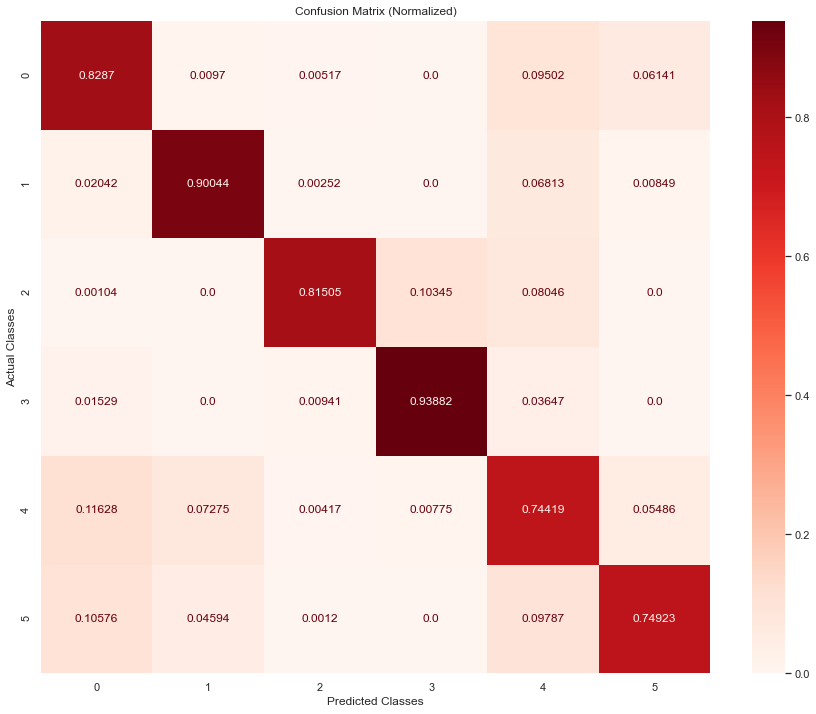

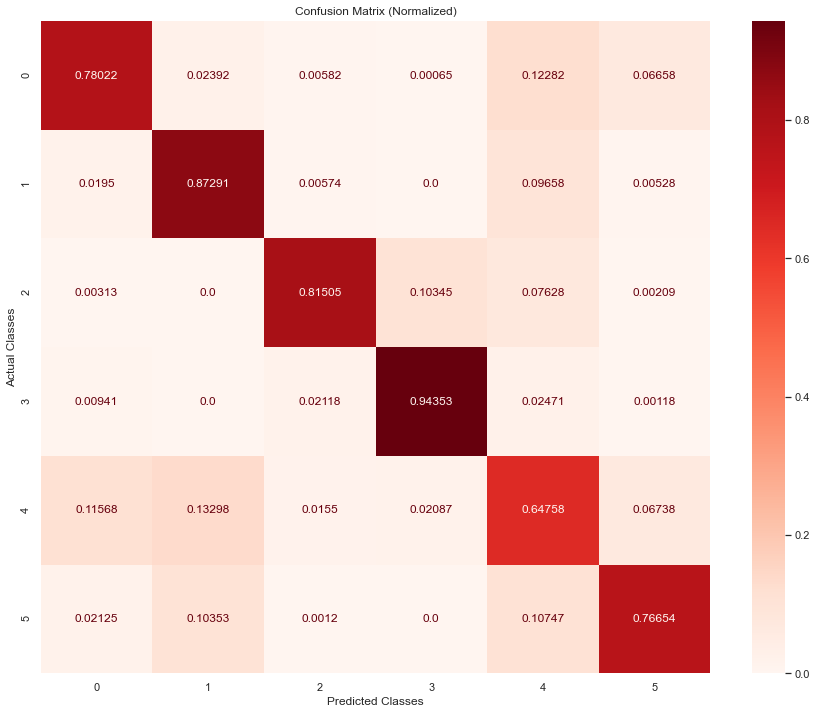

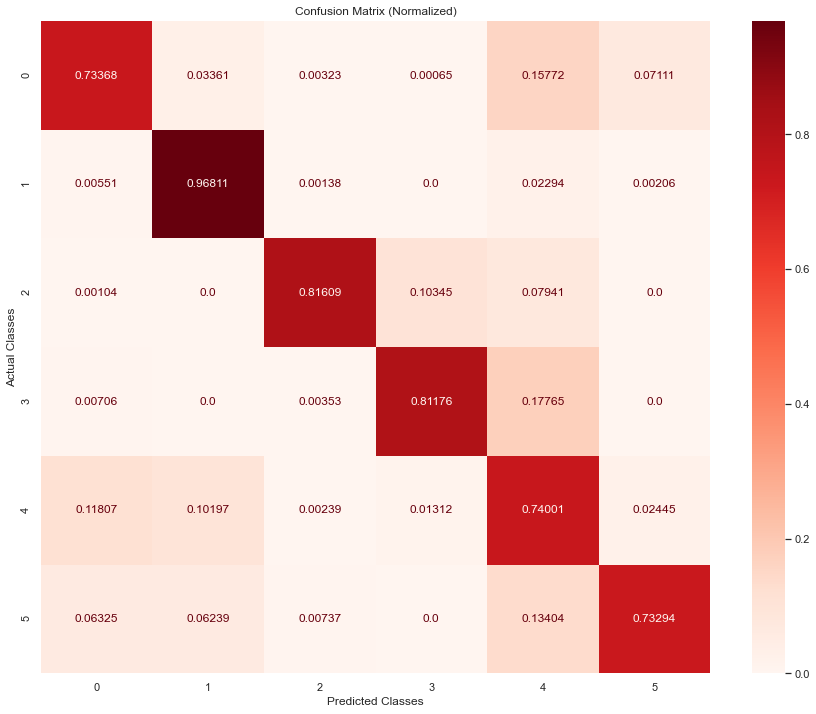

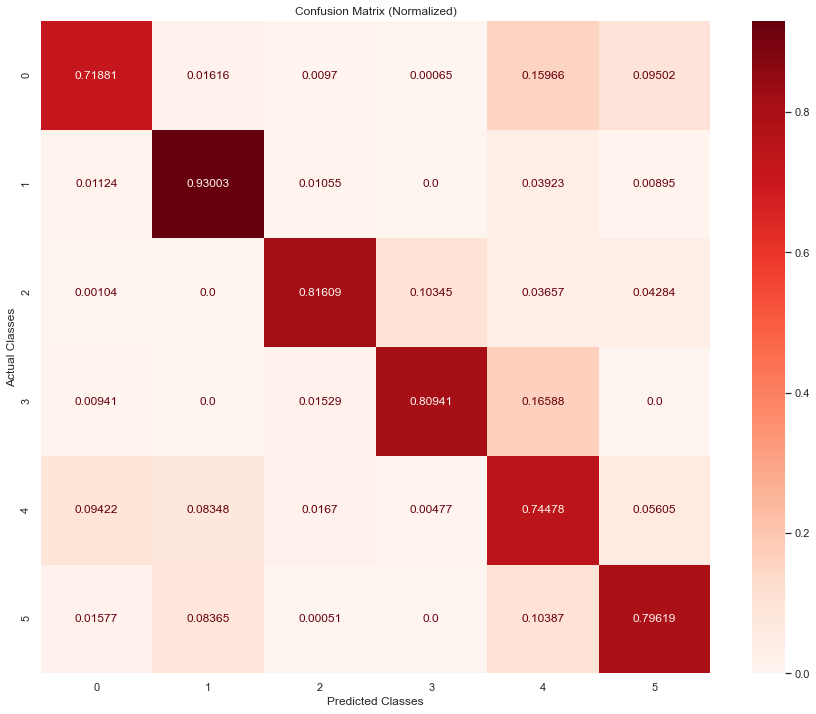

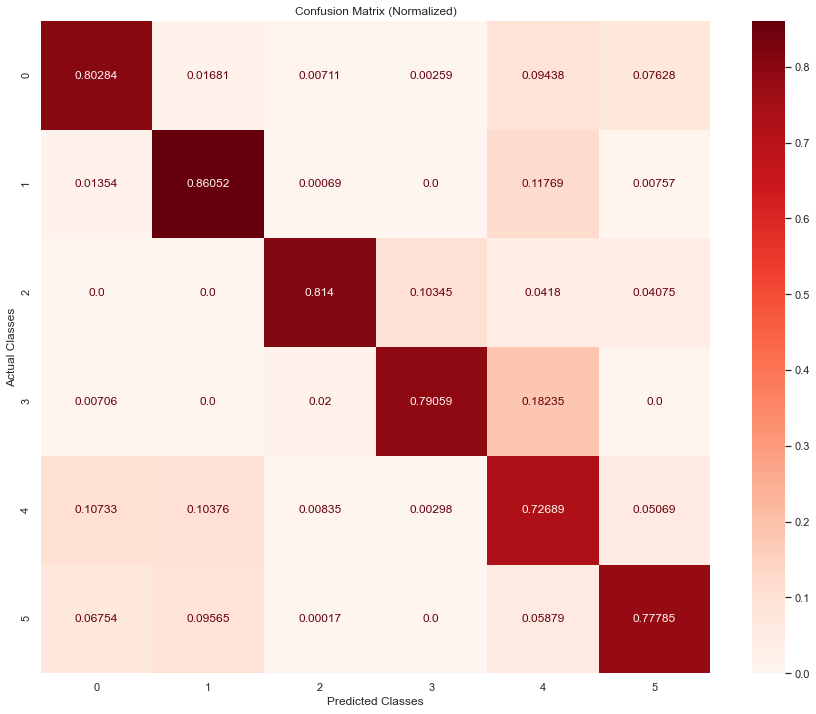

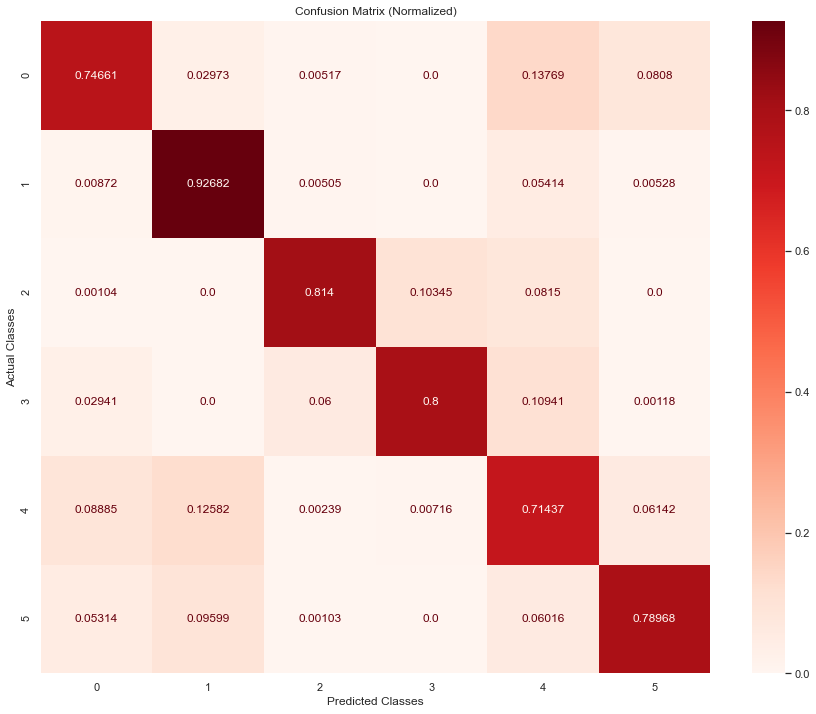

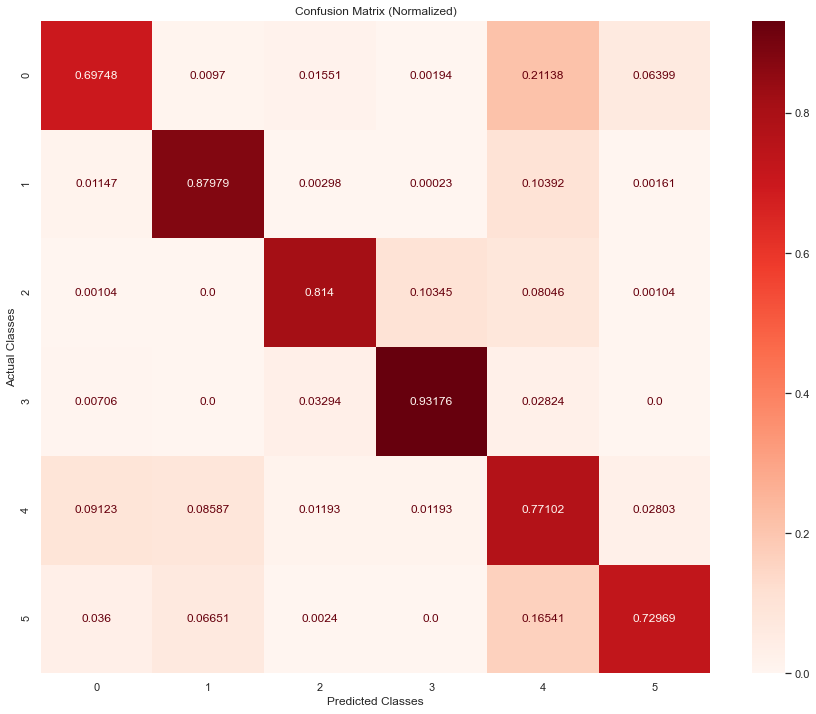

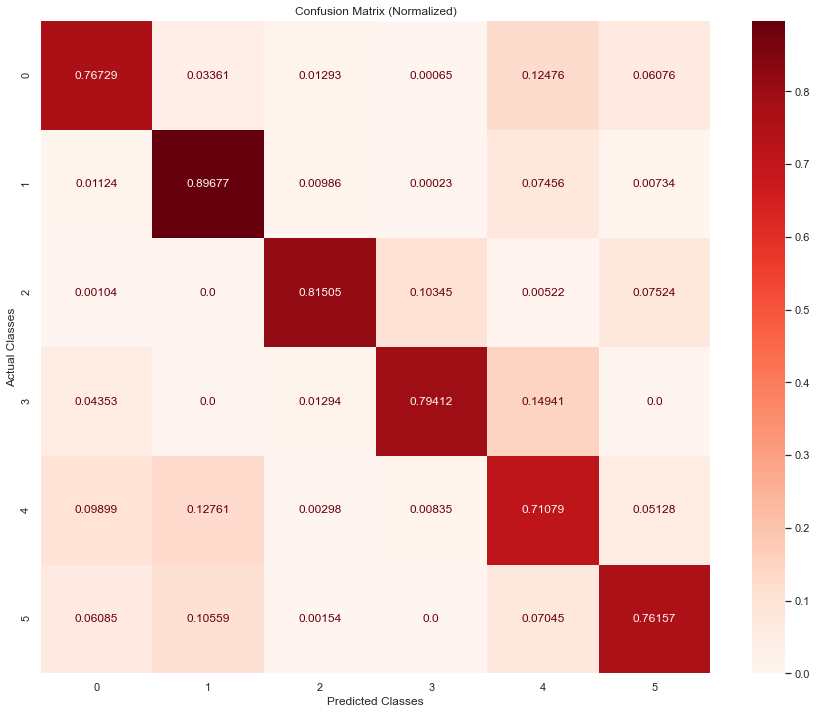

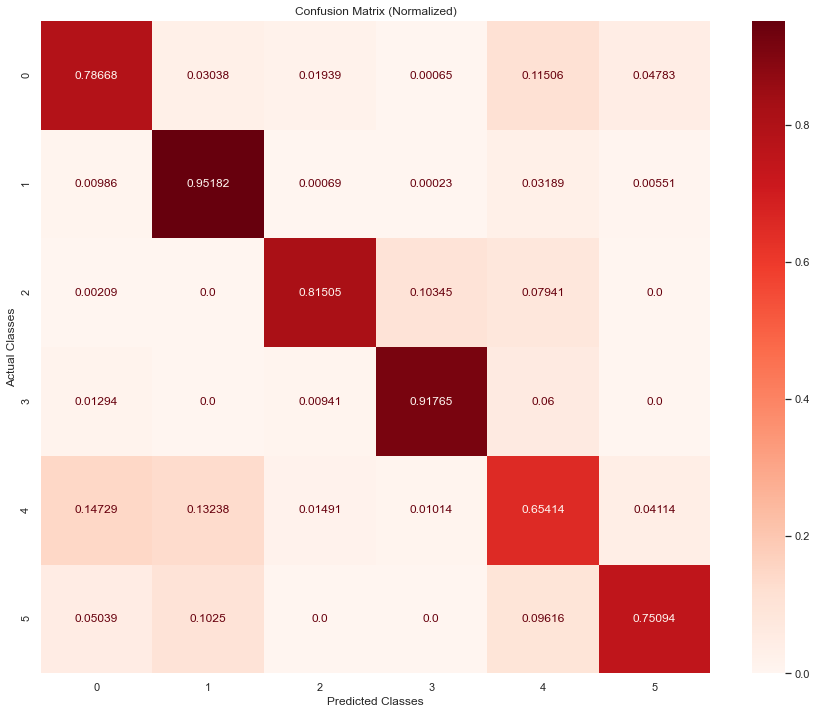

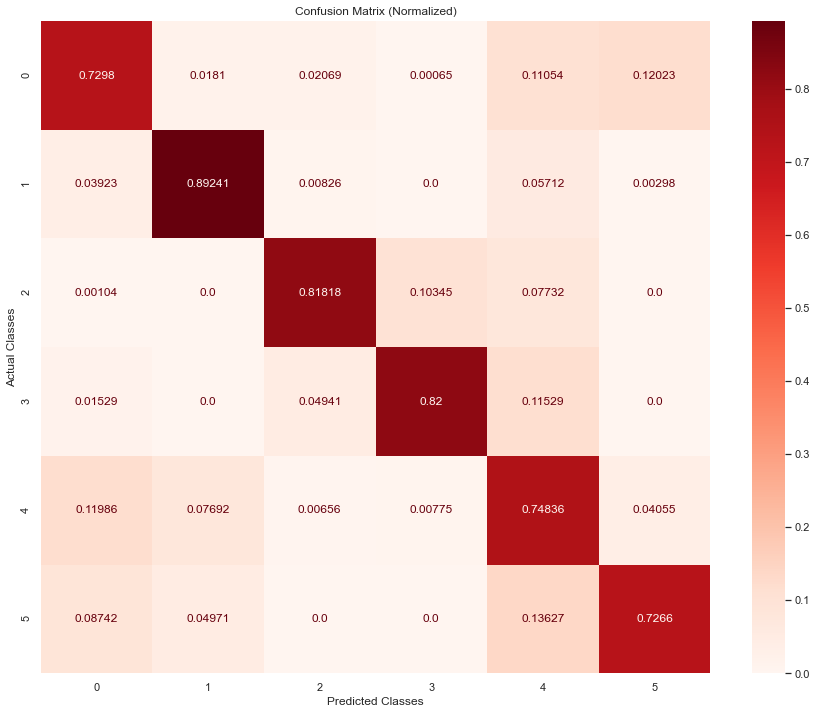

In [93]:
repeat_experiment(model_type="bilstm", data = "balanced")

##### After feature reduction

Run:  1
reduced
LSTM
Epoch 1/5000
1221/1221 [==============================] - 7s 5ms/step - loss: 1.2054 - accuracy: 0.4715 - val_loss: 1.1174 - val_accuracy: 0.6611
Epoch 2/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.6685 - accuracy: 0.7130 - val_loss: 1.1282 - val_accuracy: 0.7500
Epoch 3/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.5018 - accuracy: 0.8093 - val_loss: 1.2658 - val_accuracy: 0.8027
Epoch 4/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.4103 - accuracy: 0.8474 - val_loss: 1.1004 - val_accuracy: 0.8004
Epoch 5/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.3608 - accuracy: 0.8676 - val_loss: 0.9057 - val_accuracy: 0.8085
Epoch 6/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.3244 - accuracy: 0.8822 - val_loss: 0.7045 - val_accuracy: 0.8274
Epoch 7/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.2938 - accuracy: 0.8949

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  2
reduced
LSTM
Epoch 1/5000
1221/1221 [==============================] - 8s 5ms/step - loss: 1.1536 - accuracy: 0.4969 - val_loss: 1.1454 - val_accuracy: 0.6500
Epoch 2/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.6502 - accuracy: 0.7138 - val_loss: 1.2513 - val_accuracy: 0.6614
Epoch 3/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.5196 - accuracy: 0.7983 - val_loss: 0.9676 - val_accuracy: 0.8144
Epoch 4/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.4221 - accuracy: 0.8424 - val_loss: 0.8781 - val_accuracy: 0.8118
Epoch 5/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.3687 - accuracy: 0.8622 - val_loss: 0.8938 - val_accuracy: 0.8176
Epoch 6/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.3308 - accuracy: 0.8779 - val_loss: 0.8288 - val_accuracy: 0.8182
Epoch 7/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.2987 - accuracy: 0.8908

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  3
reduced
LSTM
Epoch 1/5000
1221/1221 [==============================] - 7s 5ms/step - loss: 1.2407 - accuracy: 0.4637 - val_loss: 1.0770 - val_accuracy: 0.6973
Epoch 2/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.6528 - accuracy: 0.7191 - val_loss: 1.1078 - val_accuracy: 0.7511
Epoch 3/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.4913 - accuracy: 0.8162 - val_loss: 0.8757 - val_accuracy: 0.7998
Epoch 4/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.4042 - accuracy: 0.8503 - val_loss: 0.9515 - val_accuracy: 0.8064
Epoch 5/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.3587 - accuracy: 0.8680 - val_loss: 0.9610 - val_accuracy: 0.8227
Epoch 6/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.3186 - accuracy: 0.8844 - val_loss: 0.8170 - val_accuracy: 0.8233
Epoch 7/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.2951 - accuracy: 0.8932

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  4
reduced
LSTM
Epoch 1/5000
1221/1221 [==============================] - 7s 5ms/step - loss: 1.2908 - accuracy: 0.4303 - val_loss: 1.0374 - val_accuracy: 0.6943
Epoch 2/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.6867 - accuracy: 0.7001 - val_loss: 1.3147 - val_accuracy: 0.6886
Epoch 3/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.5528 - accuracy: 0.7780 - val_loss: 0.9619 - val_accuracy: 0.8012
Epoch 4/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.4378 - accuracy: 0.8380 - val_loss: 0.8362 - val_accuracy: 0.8082
Epoch 5/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.3820 - accuracy: 0.8593 - val_loss: 0.7606 - val_accuracy: 0.7949
Epoch 6/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.3336 - accuracy: 0.8782 - val_loss: 0.8862 - val_accuracy: 0.7924
Epoch 7/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.3049 - accuracy: 0.8887

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  5
reduced
LSTM
Epoch 1/5000
1221/1221 [==============================] - 7s 5ms/step - loss: 1.3450 - accuracy: 0.4094 - val_loss: 1.1821 - val_accuracy: 0.6607
Epoch 2/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.7132 - accuracy: 0.6892 - val_loss: 1.1650 - val_accuracy: 0.7577
Epoch 3/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.5452 - accuracy: 0.7829 - val_loss: 0.8686 - val_accuracy: 0.8007
Epoch 4/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.4404 - accuracy: 0.8348 - val_loss: 0.7811 - val_accuracy: 0.8131
Epoch 5/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.3852 - accuracy: 0.8561 - val_loss: 0.7707 - val_accuracy: 0.8141
Epoch 6/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.3420 - accuracy: 0.8718 - val_loss: 0.7370 - val_accuracy: 0.8318
Epoch 7/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.3051 - accuracy: 0.8861

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  6
reduced
LSTM
Epoch 1/5000
1221/1221 [==============================] - 8s 5ms/step - loss: 1.2767 - accuracy: 0.4376 - val_loss: 1.1214 - val_accuracy: 0.6495
Epoch 2/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.6846 - accuracy: 0.7015 - val_loss: 1.1188 - val_accuracy: 0.7294
Epoch 3/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.5632 - accuracy: 0.7698 - val_loss: 0.8387 - val_accuracy: 0.8055
Epoch 4/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.4308 - accuracy: 0.8388 - val_loss: 0.8129 - val_accuracy: 0.8226
Epoch 5/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.3740 - accuracy: 0.8600 - val_loss: 0.7363 - val_accuracy: 0.8236
Epoch 6/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.3387 - accuracy: 0.8745 - val_loss: 0.7291 - val_accuracy: 0.8330
Epoch 7/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.3040 - accuracy: 0.8904

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  7
reduced
LSTM
Epoch 1/5000
1221/1221 [==============================] - 7s 5ms/step - loss: 1.2243 - accuracy: 0.4629 - val_loss: 1.1514 - val_accuracy: 0.6526
Epoch 2/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.6814 - accuracy: 0.7046 - val_loss: 1.1564 - val_accuracy: 0.7295
Epoch 3/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.5420 - accuracy: 0.7825 - val_loss: 1.2078 - val_accuracy: 0.8184
Epoch 4/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.4063 - accuracy: 0.8506 - val_loss: 0.9293 - val_accuracy: 0.8008
Epoch 5/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.3514 - accuracy: 0.8714 - val_loss: 0.8312 - val_accuracy: 0.8318
Epoch 6/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.3169 - accuracy: 0.8869 - val_loss: 0.7542 - val_accuracy: 0.7939
Epoch 7/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.2892 - accuracy: 0.8977

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  8
reduced
LSTM
Epoch 1/5000
1221/1221 [==============================] - 8s 6ms/step - loss: 1.2744 - accuracy: 0.4381 - val_loss: 1.2520 - val_accuracy: 0.5571
Epoch 2/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.6952 - accuracy: 0.6947 - val_loss: 1.1857 - val_accuracy: 0.7408
Epoch 3/5000
1221/1221 [==============================] - 7s 5ms/step - loss: 0.5848 - accuracy: 0.7573 - val_loss: 1.0335 - val_accuracy: 0.7491
Epoch 4/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.4567 - accuracy: 0.8298 - val_loss: 0.9594 - val_accuracy: 0.8115
Epoch 5/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.3843 - accuracy: 0.8553 - val_loss: 0.8009 - val_accuracy: 0.8288
Epoch 6/5000
1221/1221 [==============================] - 7s 5ms/step - loss: 0.3361 - accuracy: 0.8751 - val_loss: 0.7380 - val_accuracy: 0.8297
Epoch 7/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.2974 - accuracy: 0.8918

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  9
reduced
LSTM
Epoch 1/5000
1221/1221 [==============================] - 7s 5ms/step - loss: 1.2590 - accuracy: 0.4466 - val_loss: 1.2397 - val_accuracy: 0.6484
Epoch 2/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.7175 - accuracy: 0.6877 - val_loss: 1.1342 - val_accuracy: 0.7148
Epoch 3/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.5851 - accuracy: 0.7562 - val_loss: 1.0593 - val_accuracy: 0.7993
Epoch 4/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.4411 - accuracy: 0.8350 - val_loss: 1.1002 - val_accuracy: 0.7820
Epoch 5/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.3730 - accuracy: 0.8617 - val_loss: 0.7613 - val_accuracy: 0.8118
Epoch 6/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.3268 - accuracy: 0.8806 - val_loss: 0.8263 - val_accuracy: 0.8127
Epoch 7/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.2984 - accuracy: 0.8920

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  10
reduced
LSTM
Epoch 1/5000
1221/1221 [==============================] - 8s 5ms/step - loss: 1.2029 - accuracy: 0.4686 - val_loss: 1.1216 - val_accuracy: 0.7196
Epoch 2/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.6525 - accuracy: 0.7219 - val_loss: 1.1454 - val_accuracy: 0.7232
Epoch 3/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.4788 - accuracy: 0.8189 - val_loss: 0.7879 - val_accuracy: 0.8153
Epoch 4/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.3944 - accuracy: 0.8535 - val_loss: 0.7211 - val_accuracy: 0.8196
Epoch 5/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.3432 - accuracy: 0.8730 - val_loss: 0.7651 - val_accuracy: 0.8264
Epoch 6/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.3054 - accuracy: 0.8898 - val_loss: 0.7393 - val_accuracy: 0.8339
Epoch 7/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.2748 - accuracy: 0.901

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


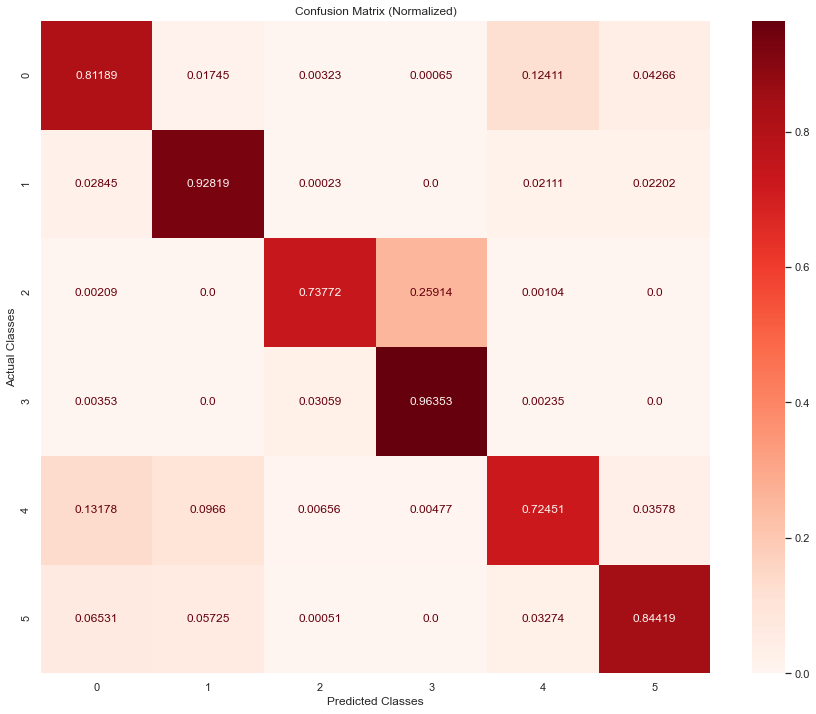

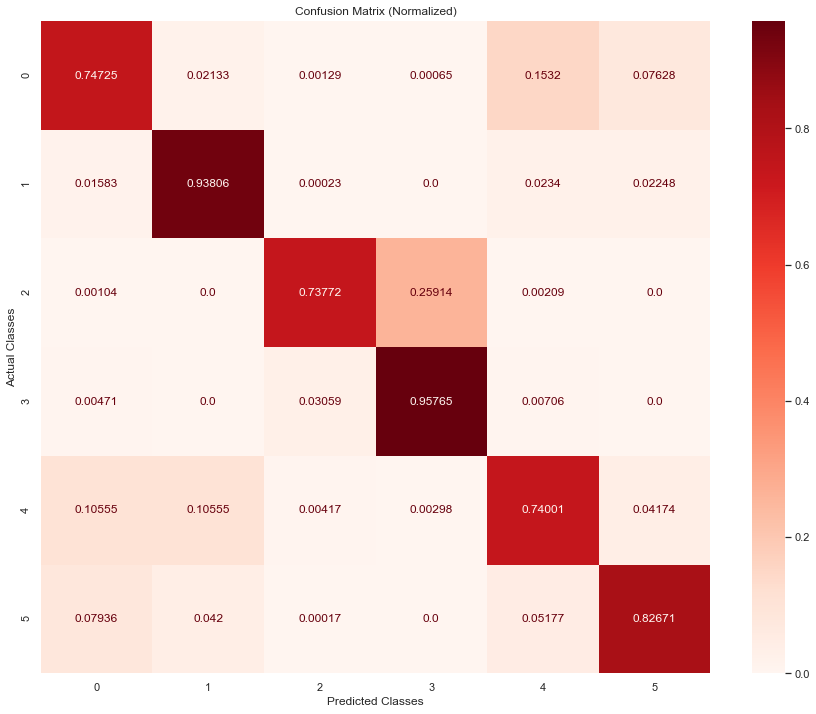

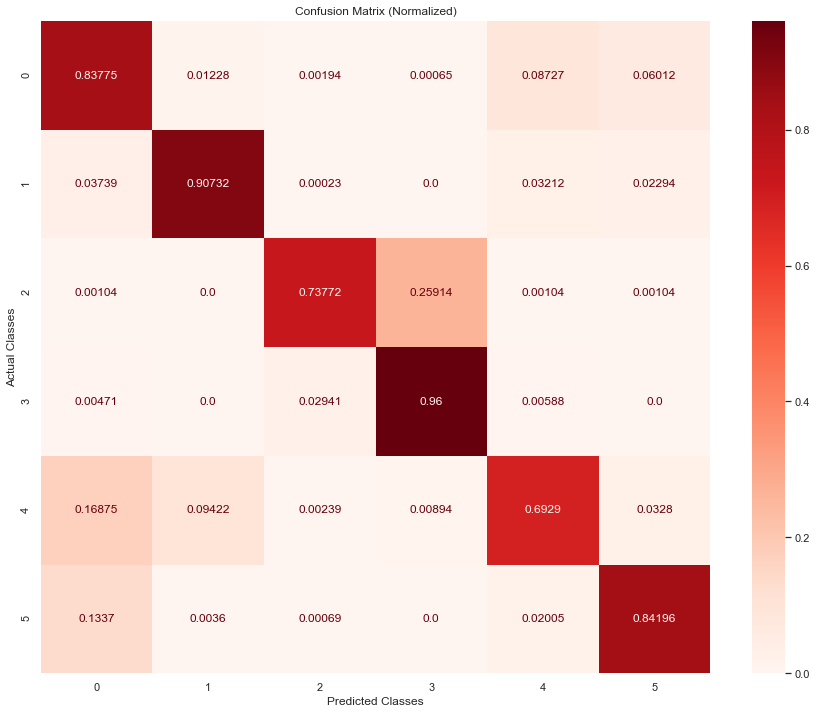

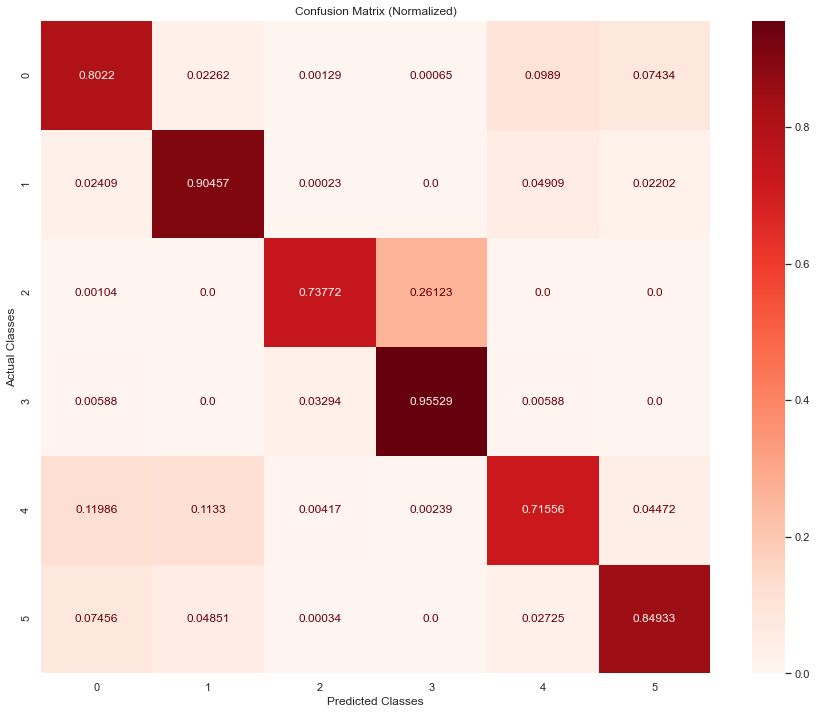

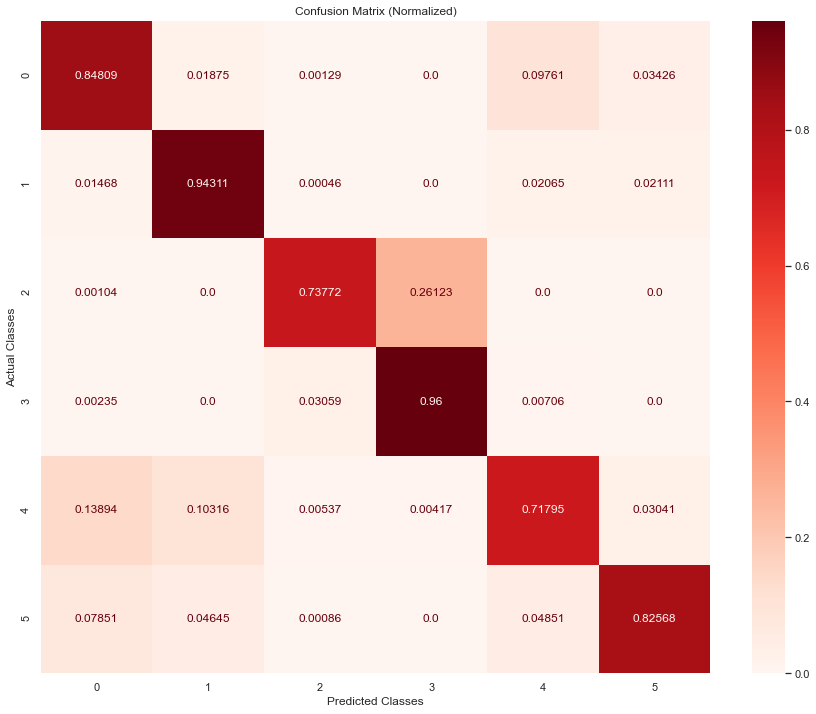

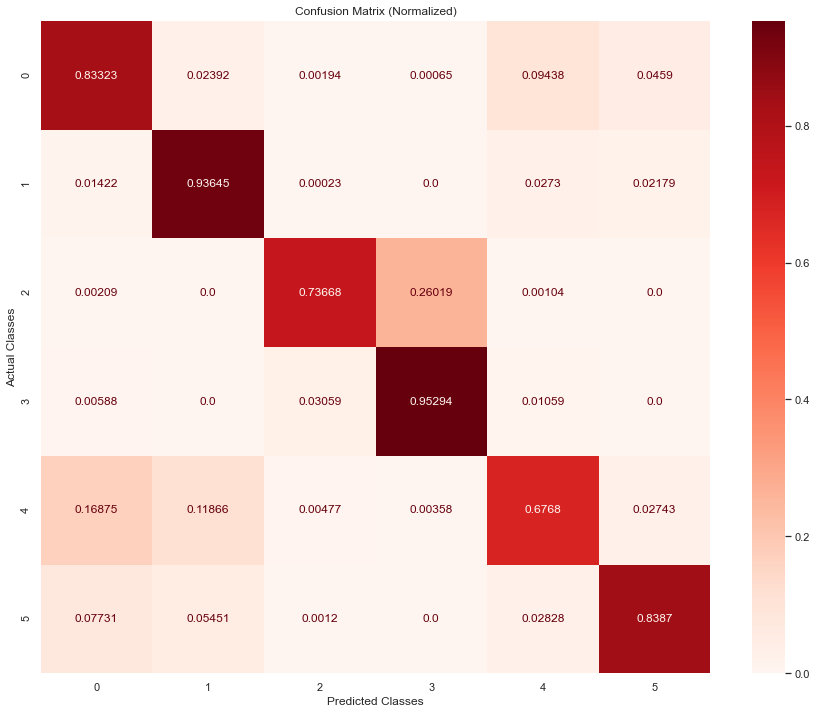

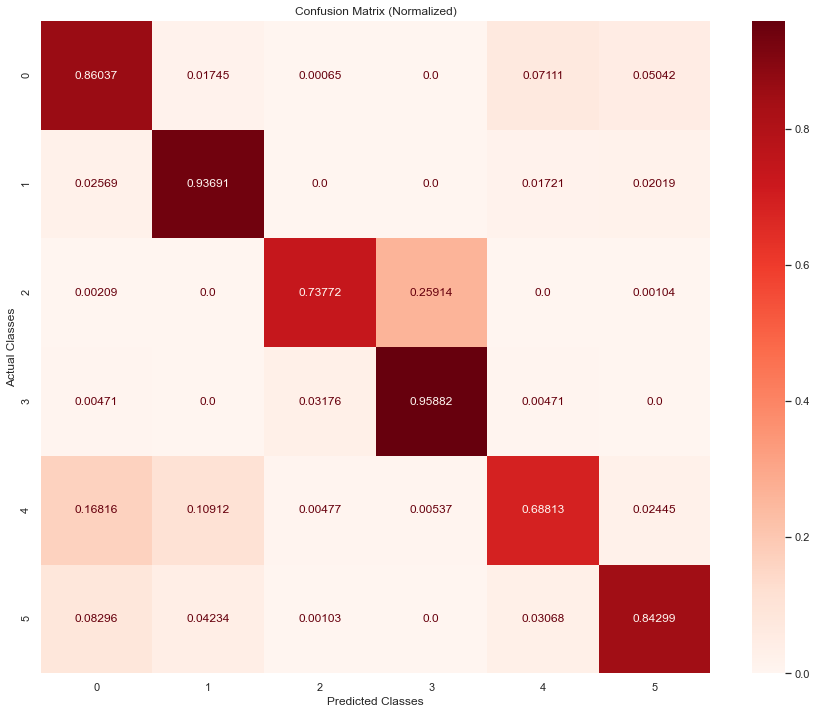

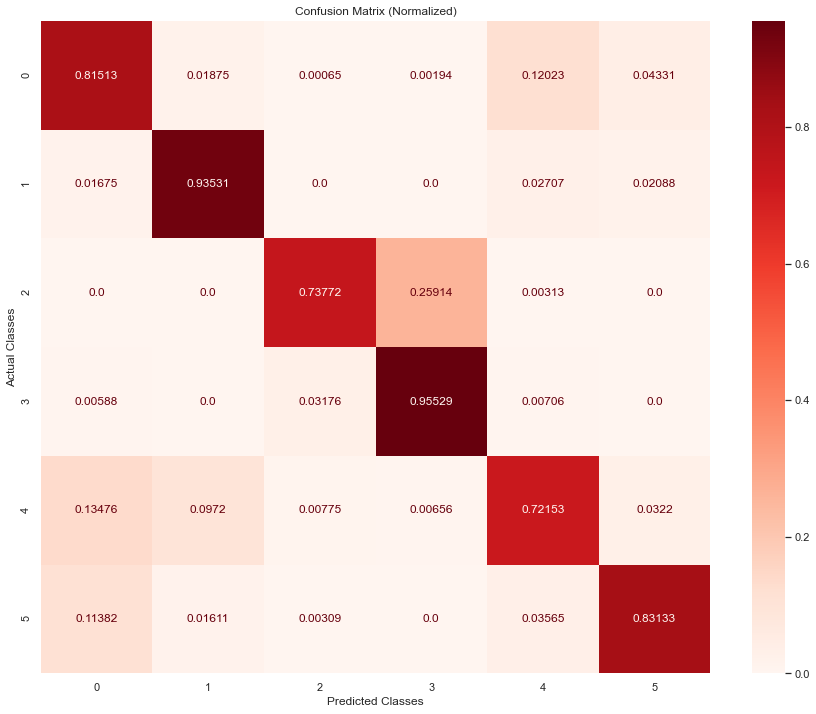

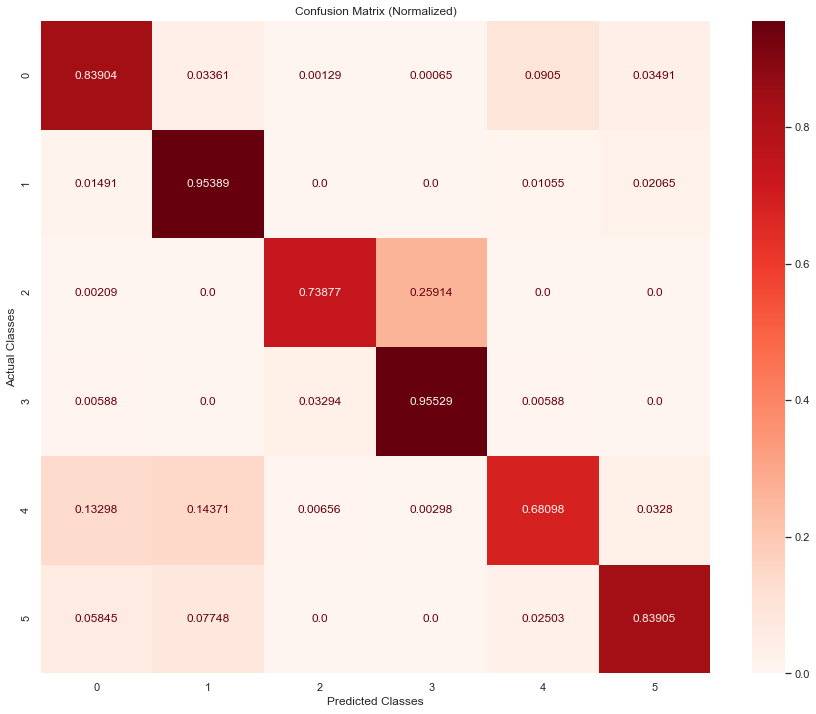

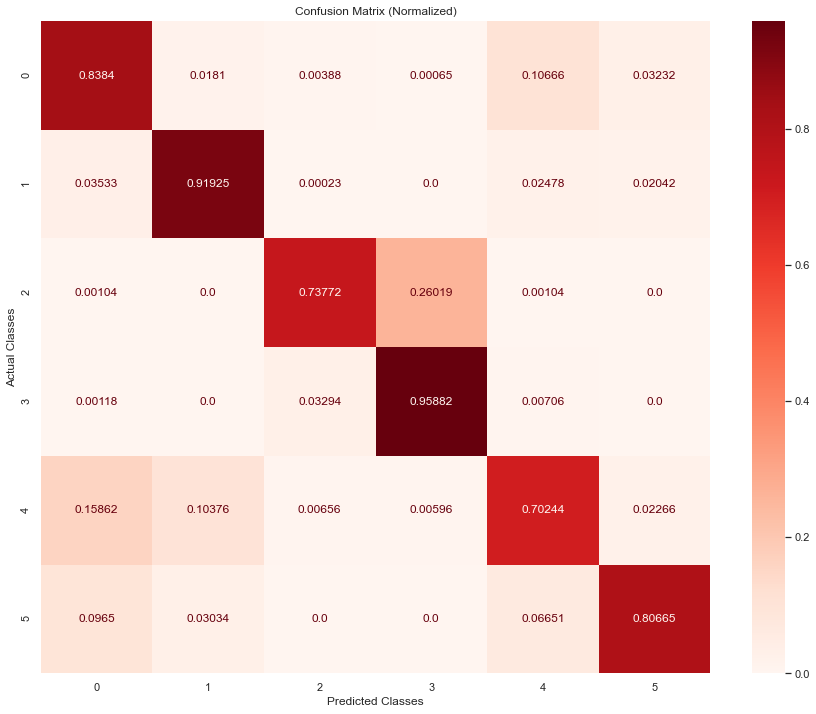

In [94]:
repeat_experiment(repeats=REPEATS, model_type="lstm", data = "reduced")

Run:  1
reduced
CNN-LSTM
Epoch 1/5000
1221/1221 [==============================] - 6s 4ms/step - loss: 0.6643 - accuracy: 0.7042 - val_loss: 1.0302 - val_accuracy: 0.6894
Epoch 2/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.4712 - accuracy: 0.8106 - val_loss: 0.7994 - val_accuracy: 0.7954
Epoch 3/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.3826 - accuracy: 0.8535 - val_loss: 0.7110 - val_accuracy: 0.8202
Epoch 4/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.3352 - accuracy: 0.8731 - val_loss: 0.6652 - val_accuracy: 0.8379
Epoch 5/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.3039 - accuracy: 0.8878 - val_loss: 0.6700 - val_accuracy: 0.8291
Epoch 6/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.2813 - accuracy: 0.8976 - val_loss: 0.7070 - val_accuracy: 0.8267
Epoch 7/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.2653 - accuracy: 0.

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  2
reduced
CNN-LSTM
Epoch 1/5000
1221/1221 [==============================] - 6s 4ms/step - loss: 0.6661 - accuracy: 0.7036 - val_loss: 0.9246 - val_accuracy: 0.7306
Epoch 2/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.4756 - accuracy: 0.8086 - val_loss: 0.7694 - val_accuracy: 0.7968
Epoch 3/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.3824 - accuracy: 0.8521 - val_loss: 0.6593 - val_accuracy: 0.8277
Epoch 4/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.3302 - accuracy: 0.8747 - val_loss: 0.7016 - val_accuracy: 0.8275
Epoch 5/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.3024 - accuracy: 0.8886 - val_loss: 0.6378 - val_accuracy: 0.8400
Epoch 6/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.2823 - accuracy: 0.8970 - val_loss: 0.6386 - val_accuracy: 0.8424
Epoch 7/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.2674 - accuracy: 0.

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  3
reduced
CNN-LSTM
Epoch 1/5000
1221/1221 [==============================] - 6s 4ms/step - loss: 0.6811 - accuracy: 0.6924 - val_loss: 1.0245 - val_accuracy: 0.6850
Epoch 2/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.4858 - accuracy: 0.8016 - val_loss: 0.8936 - val_accuracy: 0.7939
Epoch 3/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.3855 - accuracy: 0.8504 - val_loss: 0.8009 - val_accuracy: 0.7786
Epoch 4/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.3323 - accuracy: 0.8761 - val_loss: 0.7542 - val_accuracy: 0.8435
Epoch 5/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.2986 - accuracy: 0.8904 - val_loss: 0.6823 - val_accuracy: 0.8414
Epoch 6/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.2782 - accuracy: 0.8983 - val_loss: 0.6611 - val_accuracy: 0.8464
Epoch 7/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.2596 - accuracy: 0.

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  4
reduced
CNN-LSTM
Epoch 1/5000
1221/1221 [==============================] - 6s 4ms/step - loss: 0.6556 - accuracy: 0.7118 - val_loss: 0.9414 - val_accuracy: 0.7507
Epoch 2/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.4485 - accuracy: 0.8207 - val_loss: 0.8210 - val_accuracy: 0.7878
Epoch 3/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.3696 - accuracy: 0.8590 - val_loss: 0.6704 - val_accuracy: 0.8203
Epoch 4/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.3261 - accuracy: 0.8773 - val_loss: 0.7071 - val_accuracy: 0.8221
Epoch 5/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.2998 - accuracy: 0.8888 - val_loss: 0.6826 - val_accuracy: 0.8326
Epoch 6/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.2723 - accuracy: 0.9021 - val_loss: 0.6643 - val_accuracy: 0.8370
Epoch 7/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.2597 - accuracy: 0.

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  5
reduced
CNN-LSTM
Epoch 1/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.6690 - accuracy: 0.7028 - val_loss: 0.9508 - val_accuracy: 0.7562
Epoch 2/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.4678 - accuracy: 0.8121 - val_loss: 0.7353 - val_accuracy: 0.8125
Epoch 3/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.3752 - accuracy: 0.8559 - val_loss: 0.6198 - val_accuracy: 0.8318
Epoch 4/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.3309 - accuracy: 0.8763 - val_loss: 0.6393 - val_accuracy: 0.8396
Epoch 5/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.3016 - accuracy: 0.8890 - val_loss: 0.6507 - val_accuracy: 0.8336
Epoch 6/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.2803 - accuracy: 0.8986 - val_loss: 0.6843 - val_accuracy: 0.8431
Epoch 7/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.2625 - accuracy: 0.

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  6
reduced
CNN-LSTM
Epoch 1/5000
1221/1221 [==============================] - 6s 4ms/step - loss: 0.6737 - accuracy: 0.6961 - val_loss: 1.0512 - val_accuracy: 0.6806
Epoch 2/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.4812 - accuracy: 0.8038 - val_loss: 0.8165 - val_accuracy: 0.7558
Epoch 3/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.3861 - accuracy: 0.8501 - val_loss: 0.7055 - val_accuracy: 0.8244
Epoch 4/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.3320 - accuracy: 0.8743 - val_loss: 0.6472 - val_accuracy: 0.8266
Epoch 5/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.3052 - accuracy: 0.8865 - val_loss: 0.6352 - val_accuracy: 0.8443
Epoch 6/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.2812 - accuracy: 0.8966 - val_loss: 0.6385 - val_accuracy: 0.8421
Epoch 7/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.2646 - accuracy: 0.

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  7
reduced
CNN-LSTM
Epoch 1/5000
1221/1221 [==============================] - 6s 4ms/step - loss: 0.6616 - accuracy: 0.7072 - val_loss: 0.8937 - val_accuracy: 0.7363
Epoch 2/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.4654 - accuracy: 0.8137 - val_loss: 0.7894 - val_accuracy: 0.7921
Epoch 3/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.3703 - accuracy: 0.8577 - val_loss: 0.7131 - val_accuracy: 0.8125
Epoch 4/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.3238 - accuracy: 0.8779 - val_loss: 0.7674 - val_accuracy: 0.8016
Epoch 5/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.2920 - accuracy: 0.8919 - val_loss: 0.6699 - val_accuracy: 0.8349
Epoch 6/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.2732 - accuracy: 0.9005 - val_loss: 0.6492 - val_accuracy: 0.8408
Epoch 7/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.2581 - accuracy: 0.

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  8
reduced
CNN-LSTM
Epoch 1/5000
1221/1221 [==============================] - 6s 4ms/step - loss: 0.6546 - accuracy: 0.7106 - val_loss: 0.9235 - val_accuracy: 0.7418
Epoch 2/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.4544 - accuracy: 0.8188 - val_loss: 0.7927 - val_accuracy: 0.8009
Epoch 3/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.3662 - accuracy: 0.8601 - val_loss: 0.6993 - val_accuracy: 0.8288
Epoch 4/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.3216 - accuracy: 0.8803 - val_loss: 0.6750 - val_accuracy: 0.8387
Epoch 5/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.2966 - accuracy: 0.8903 - val_loss: 0.6231 - val_accuracy: 0.8432
Epoch 6/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.2752 - accuracy: 0.9011 - val_loss: 0.7047 - val_accuracy: 0.8435
Epoch 7/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.2601 - accuracy: 0.

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  9
reduced
CNN-LSTM
Epoch 1/5000
1221/1221 [==============================] - 6s 5ms/step - loss: 0.6625 - accuracy: 0.7062 - val_loss: 0.9143 - val_accuracy: 0.7210
Epoch 2/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.4682 - accuracy: 0.8108 - val_loss: 0.7421 - val_accuracy: 0.8081
Epoch 3/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.3774 - accuracy: 0.8539 - val_loss: 0.7086 - val_accuracy: 0.8151
Epoch 4/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.3316 - accuracy: 0.8759 - val_loss: 0.6595 - val_accuracy: 0.8319
Epoch 5/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.3069 - accuracy: 0.8861 - val_loss: 0.6228 - val_accuracy: 0.8359
Epoch 6/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.2877 - accuracy: 0.8957 - val_loss: 0.6091 - val_accuracy: 0.8440
Epoch 7/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.2677 - accuracy: 0.

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  10
reduced
CNN-LSTM
Epoch 1/5000
1221/1221 [==============================] - 6s 4ms/step - loss: 0.6627 - accuracy: 0.7062 - val_loss: 0.9897 - val_accuracy: 0.6962
Epoch 2/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.4670 - accuracy: 0.8135 - val_loss: 0.8426 - val_accuracy: 0.7899
Epoch 3/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.3751 - accuracy: 0.8558 - val_loss: 0.7399 - val_accuracy: 0.8186
Epoch 4/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.3293 - accuracy: 0.8780 - val_loss: 0.6978 - val_accuracy: 0.8348
Epoch 5/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.2989 - accuracy: 0.8907 - val_loss: 0.7002 - val_accuracy: 0.8299
Epoch 6/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.2790 - accuracy: 0.8998 - val_loss: 0.6010 - val_accuracy: 0.8456
Epoch 7/5000
1221/1221 [==============================] - 5s 4ms/step - loss: 0.2637 - accuracy: 0

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


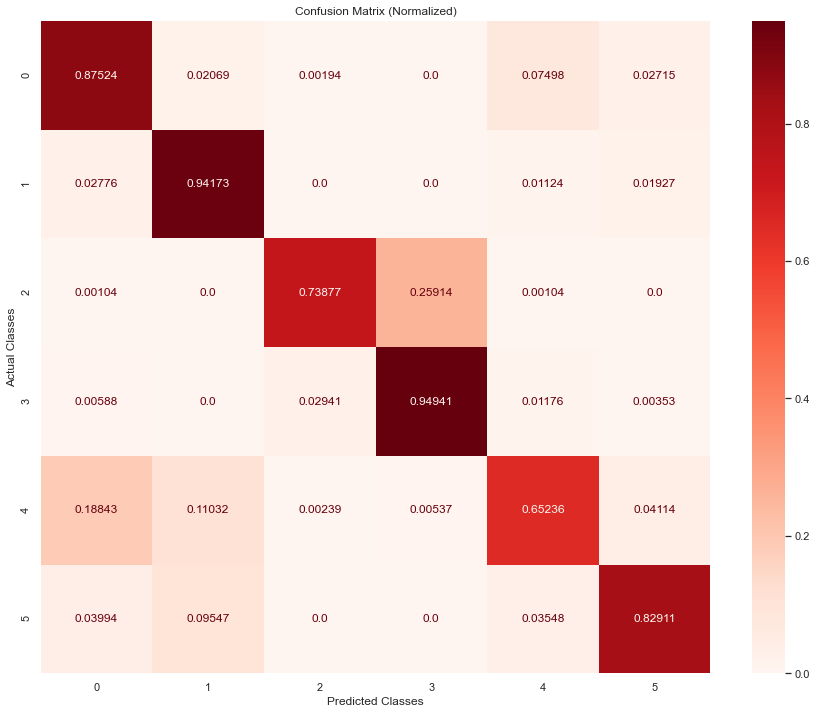

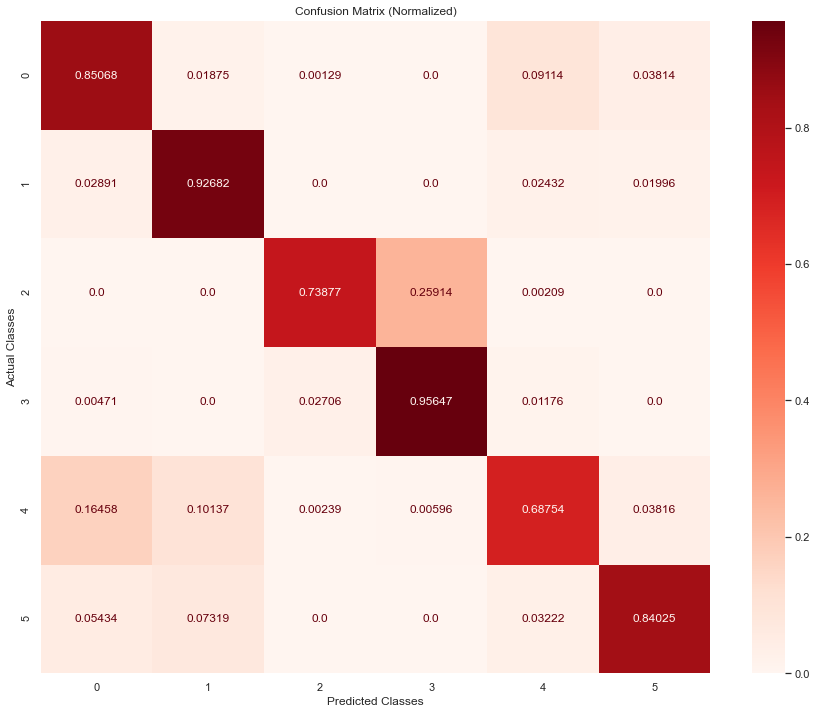

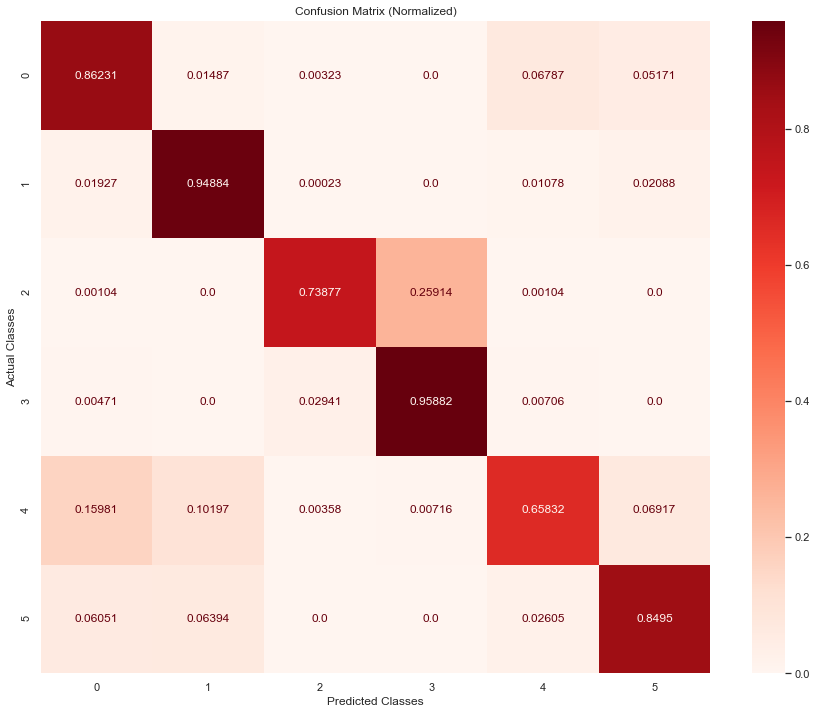

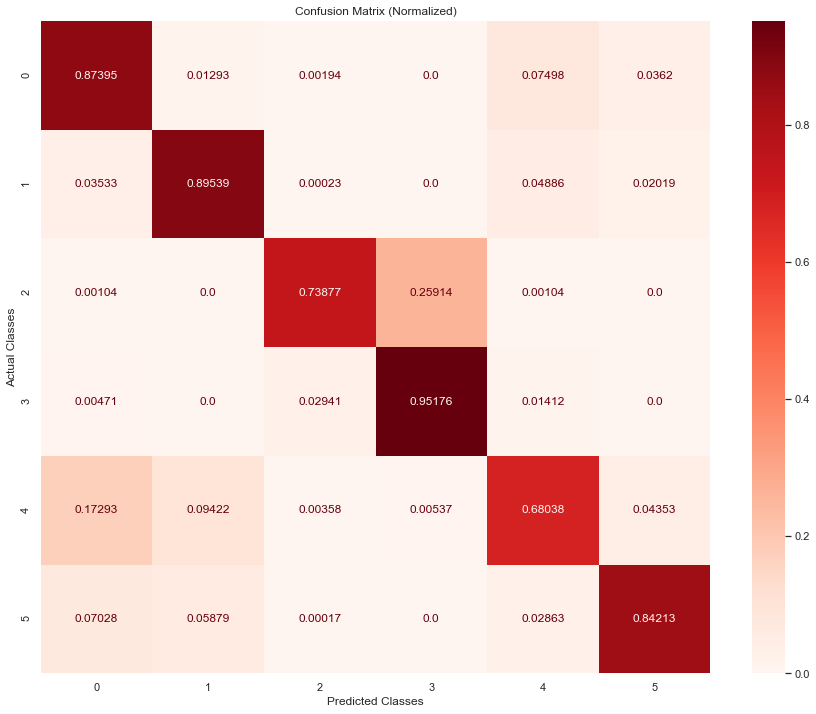

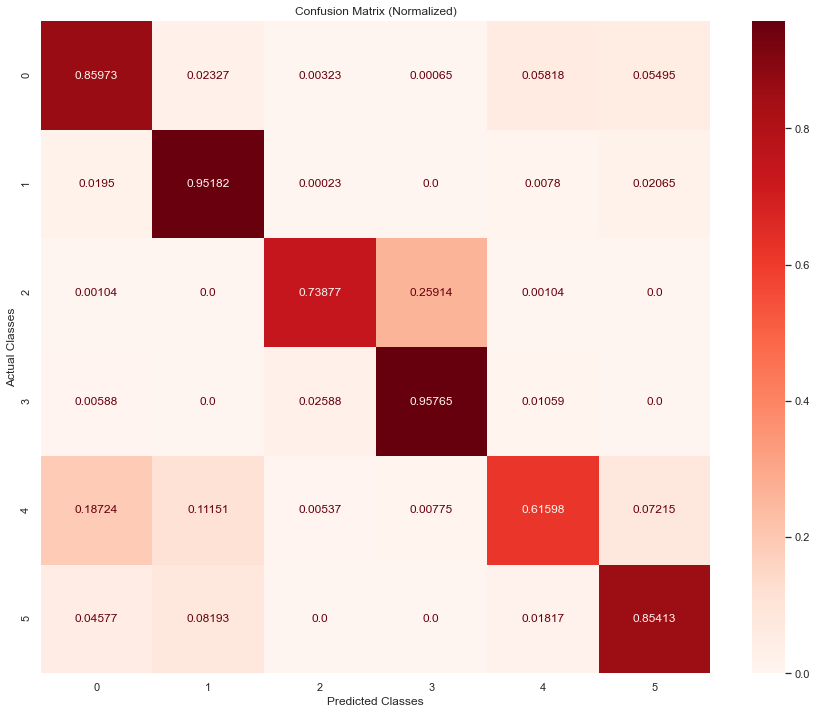

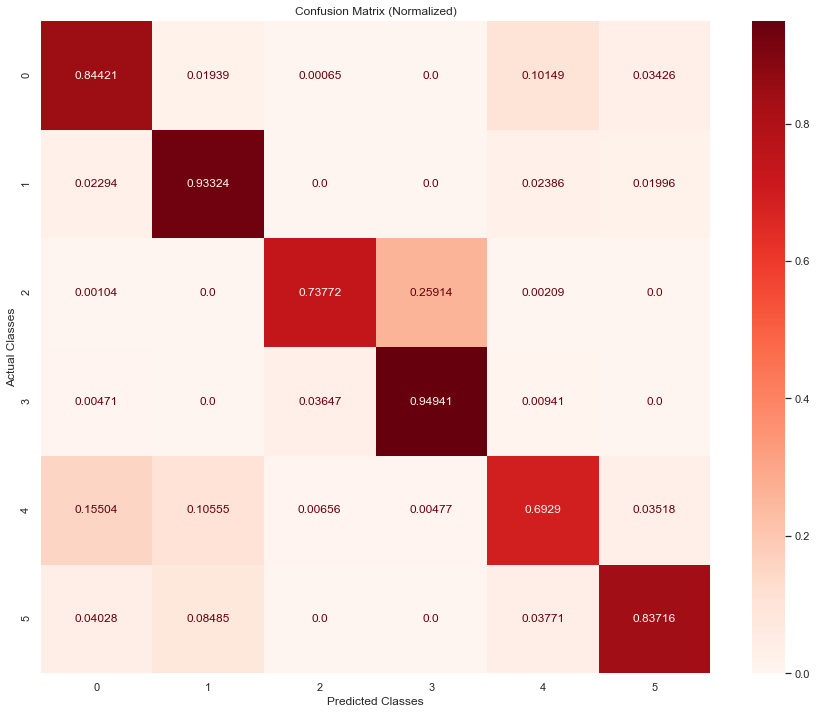

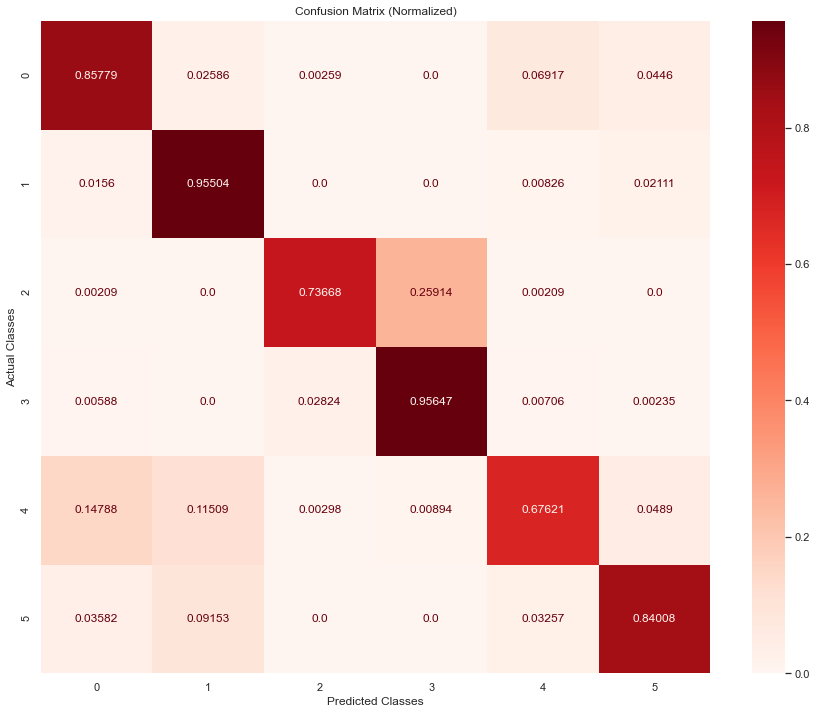

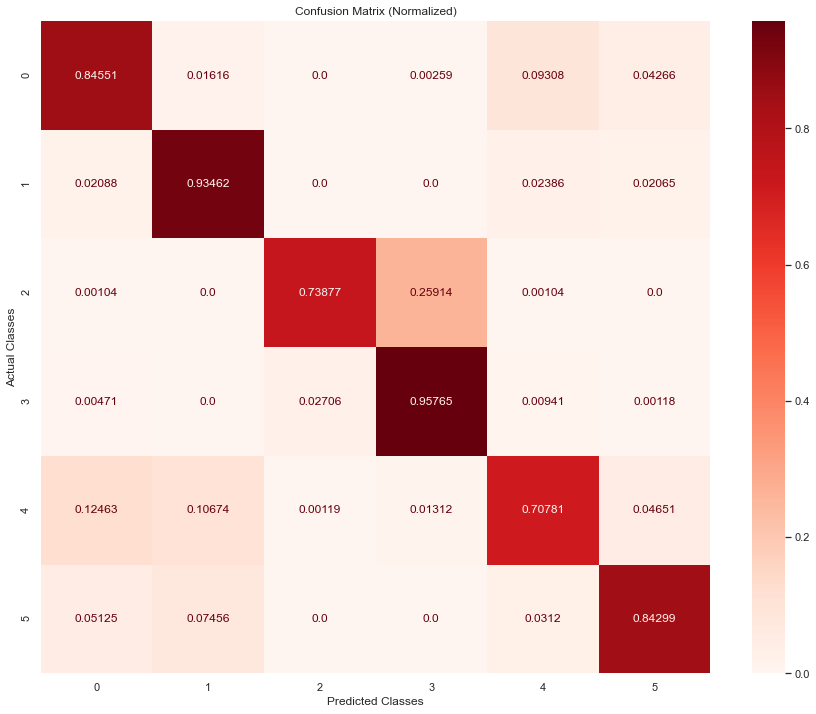

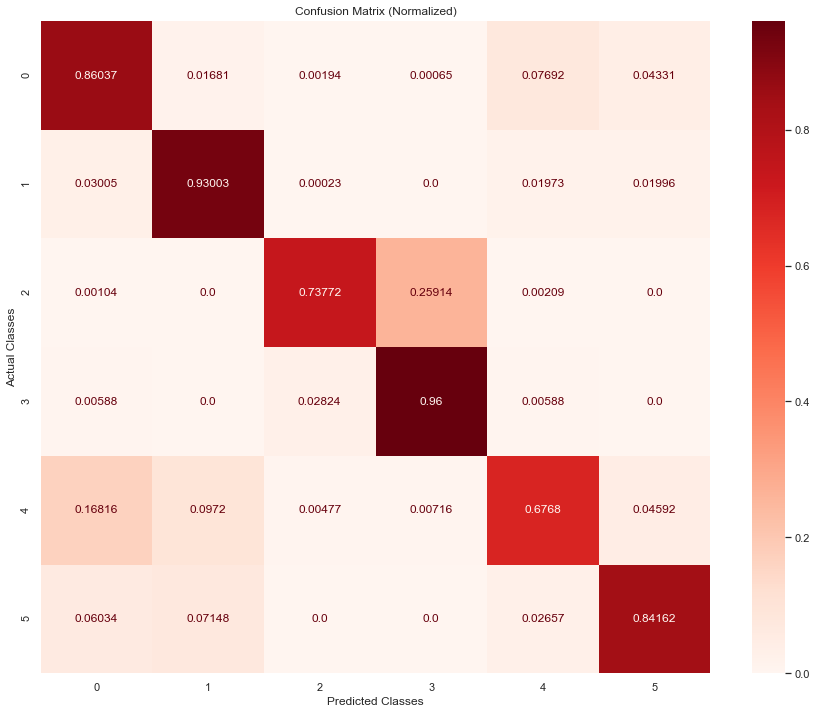

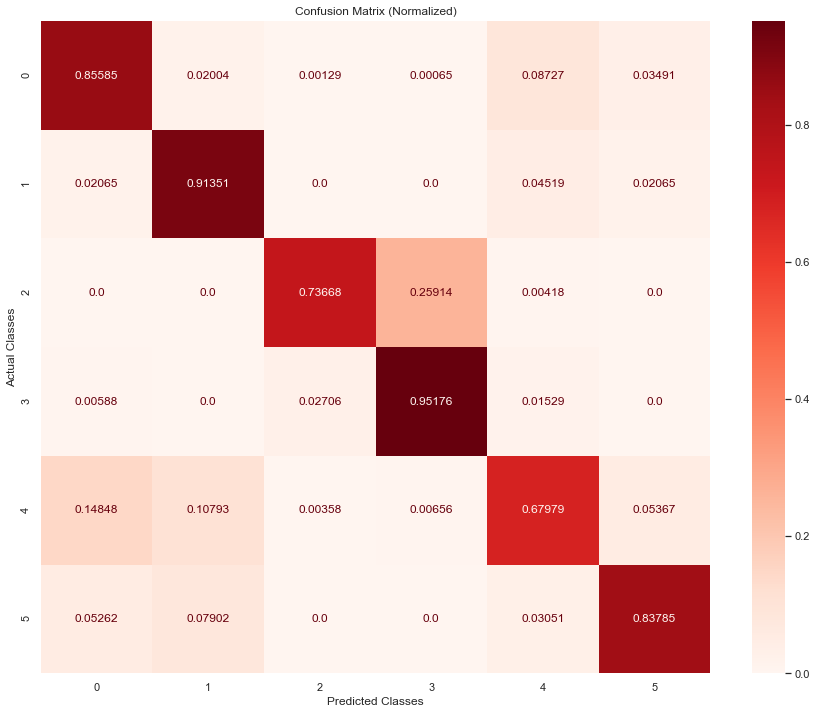

In [95]:
repeat_experiment(repeats=REPEATS, model_type="cnnlstm", data = "reduced")

Run:  1
reduced
ConvLSTM
Epoch 1/5000
1221/1221 [==============================] - 15s 11ms/step - loss: 0.6847 - accuracy: 0.7108 - val_loss: 0.8447 - val_accuracy: 0.7160
Epoch 2/5000
1221/1221 [==============================] - 14s 11ms/step - loss: 0.5175 - accuracy: 0.7884 - val_loss: 0.8935 - val_accuracy: 0.7442
Epoch 3/5000
1221/1221 [==============================] - 14s 11ms/step - loss: 0.4527 - accuracy: 0.8174 - val_loss: 0.8169 - val_accuracy: 0.7757
Epoch 4/5000
1221/1221 [==============================] - 14s 11ms/step - loss: 0.4105 - accuracy: 0.8367 - val_loss: 0.7976 - val_accuracy: 0.8000
Epoch 5/5000
1221/1221 [==============================] - 14s 11ms/step - loss: 0.3818 - accuracy: 0.8504 - val_loss: 0.8588 - val_accuracy: 0.8052
Epoch 6/5000
1221/1221 [==============================] - 14s 11ms/step - loss: 0.3562 - accuracy: 0.8619 - val_loss: 0.6880 - val_accuracy: 0.8175
Epoch 7/5000
1221/1221 [==============================] - 14s 11ms/step - loss: 0.3396 

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  2
reduced
ConvLSTM
Epoch 1/5000
1221/1221 [==============================] - 15s 11ms/step - loss: 0.6881 - accuracy: 0.7107 - val_loss: 1.0082 - val_accuracy: 0.6430
Epoch 2/5000
1221/1221 [==============================] - 14s 11ms/step - loss: 0.5068 - accuracy: 0.7947 - val_loss: 0.7670 - val_accuracy: 0.7648
Epoch 3/5000
1221/1221 [==============================] - 14s 11ms/step - loss: 0.4346 - accuracy: 0.8281 - val_loss: 0.7331 - val_accuracy: 0.7878
Epoch 4/5000
1221/1221 [==============================] - 14s 11ms/step - loss: 0.3939 - accuracy: 0.8459 - val_loss: 0.7315 - val_accuracy: 0.8060
Epoch 5/5000
1221/1221 [==============================] - 14s 11ms/step - loss: 0.3645 - accuracy: 0.8589 - val_loss: 0.7197 - val_accuracy: 0.8007
Epoch 6/5000
1221/1221 [==============================] - 14s 11ms/step - loss: 0.3463 - accuracy: 0.8671 - val_loss: 0.6839 - val_accuracy: 0.8181
Epoch 7/5000
1221/1221 [==============================] - 14s 11ms/step - loss: 0.3310 

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  3
reduced
ConvLSTM
Epoch 1/5000
1221/1221 [==============================] - 14s 11ms/step - loss: 0.6873 - accuracy: 0.7113 - val_loss: 0.8141 - val_accuracy: 0.7203
Epoch 2/5000
1221/1221 [==============================] - 14s 11ms/step - loss: 0.5216 - accuracy: 0.7870 - val_loss: 0.8085 - val_accuracy: 0.7510
Epoch 3/5000
1221/1221 [==============================] - 14s 11ms/step - loss: 0.4492 - accuracy: 0.8210 - val_loss: 0.7518 - val_accuracy: 0.7878
Epoch 4/5000
1221/1221 [==============================] - 14s 11ms/step - loss: 0.4064 - accuracy: 0.8387 - val_loss: 0.7094 - val_accuracy: 0.8020
Epoch 5/5000
1221/1221 [==============================] - 14s 11ms/step - loss: 0.3727 - accuracy: 0.8533 - val_loss: 0.7210 - val_accuracy: 0.8136
Epoch 6/5000
1221/1221 [==============================] - 14s 12ms/step - loss: 0.3493 - accuracy: 0.8647 - val_loss: 0.6551 - val_accuracy: 0.8130
Epoch 7/5000
1221/1221 [==============================] - 14s 12ms/step - loss: 0.3316 

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  4
reduced
ConvLSTM
Epoch 1/5000
1221/1221 [==============================] - 15s 11ms/step - loss: 0.6823 - accuracy: 0.7134 - val_loss: 0.9237 - val_accuracy: 0.7008
Epoch 2/5000
1221/1221 [==============================] - 13s 11ms/step - loss: 0.5230 - accuracy: 0.7843 - val_loss: 0.8223 - val_accuracy: 0.7540
Epoch 3/5000
1221/1221 [==============================] - 13s 11ms/step - loss: 0.4535 - accuracy: 0.8174 - val_loss: 0.8844 - val_accuracy: 0.7611
Epoch 4/5000
1221/1221 [==============================] - 13s 11ms/step - loss: 0.4134 - accuracy: 0.8334 - val_loss: 0.7333 - val_accuracy: 0.7987
Epoch 5/5000
1221/1221 [==============================] - 13s 11ms/step - loss: 0.3777 - accuracy: 0.8512 - val_loss: 0.7167 - val_accuracy: 0.8042
Epoch 6/5000
1221/1221 [==============================] - 13s 11ms/step - loss: 0.3568 - accuracy: 0.8601 - val_loss: 0.7098 - val_accuracy: 0.8117
Epoch 7/5000
1221/1221 [==============================] - 13s 11ms/step - loss: 0.3360 

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  5
reduced
ConvLSTM
Epoch 1/5000
1221/1221 [==============================] - 14s 11ms/step - loss: 0.6927 - accuracy: 0.7086 - val_loss: 0.8423 - val_accuracy: 0.7063
Epoch 2/5000
1221/1221 [==============================] - 13s 10ms/step - loss: 0.5026 - accuracy: 0.7960 - val_loss: 0.8537 - val_accuracy: 0.7378
Epoch 3/5000
1221/1221 [==============================] - 13s 10ms/step - loss: 0.4309 - accuracy: 0.8280 - val_loss: 0.8081 - val_accuracy: 0.7698
Epoch 4/5000
1221/1221 [==============================] - 13s 10ms/step - loss: 0.3909 - accuracy: 0.8461 - val_loss: 0.7089 - val_accuracy: 0.8045
Epoch 5/5000
1221/1221 [==============================] - 13s 10ms/step - loss: 0.3635 - accuracy: 0.8605 - val_loss: 0.7603 - val_accuracy: 0.8125
Epoch 6/5000
1221/1221 [==============================] - 13s 11ms/step - loss: 0.3415 - accuracy: 0.8688 - val_loss: 0.6958 - val_accuracy: 0.8134
Epoch 7/5000
1221/1221 [==============================] - 13s 10ms/step - loss: 0.3259 

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  6
reduced
ConvLSTM
Epoch 1/5000
1221/1221 [==============================] - 15s 11ms/step - loss: 0.6805 - accuracy: 0.7142 - val_loss: 0.9274 - val_accuracy: 0.6961
Epoch 2/5000
1221/1221 [==============================] - 13s 11ms/step - loss: 0.5049 - accuracy: 0.7952 - val_loss: 0.9004 - val_accuracy: 0.7314
Epoch 3/5000
1221/1221 [==============================] - 13s 11ms/step - loss: 0.4357 - accuracy: 0.8240 - val_loss: 0.7831 - val_accuracy: 0.7925
Epoch 4/5000
1221/1221 [==============================] - 13s 11ms/step - loss: 0.3916 - accuracy: 0.8460 - val_loss: 0.6974 - val_accuracy: 0.8042
Epoch 5/5000
1221/1221 [==============================] - 13s 11ms/step - loss: 0.3618 - accuracy: 0.8590 - val_loss: 0.7323 - val_accuracy: 0.8050
Epoch 6/5000
1221/1221 [==============================] - 13s 11ms/step - loss: 0.3440 - accuracy: 0.8680 - val_loss: 0.7011 - val_accuracy: 0.8129
Epoch 7/5000
1221/1221 [==============================] - 13s 11ms/step - loss: 0.3270 

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  7
reduced
ConvLSTM
Epoch 1/5000
1221/1221 [==============================] - 14s 11ms/step - loss: 0.6968 - accuracy: 0.7042 - val_loss: 0.7800 - val_accuracy: 0.7374
Epoch 2/5000
1221/1221 [==============================] - 13s 11ms/step - loss: 0.5272 - accuracy: 0.7825 - val_loss: 0.8310 - val_accuracy: 0.7349
Epoch 3/5000
1221/1221 [==============================] - 13s 11ms/step - loss: 0.4615 - accuracy: 0.8131 - val_loss: 0.7459 - val_accuracy: 0.7799
Epoch 4/5000
1221/1221 [==============================] - 13s 11ms/step - loss: 0.4100 - accuracy: 0.8359 - val_loss: 0.6884 - val_accuracy: 0.8045
Epoch 5/5000
1221/1221 [==============================] - 13s 11ms/step - loss: 0.3753 - accuracy: 0.8532 - val_loss: 0.6665 - val_accuracy: 0.8186
Epoch 6/5000
1221/1221 [==============================] - 13s 11ms/step - loss: 0.3528 - accuracy: 0.8635 - val_loss: 0.6785 - val_accuracy: 0.8137
Epoch 7/5000
1221/1221 [==============================] - 13s 11ms/step - loss: 0.3329 

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  8
reduced
ConvLSTM
Epoch 1/5000
1221/1221 [==============================] - 14s 11ms/step - loss: 0.6921 - accuracy: 0.7083 - val_loss: 0.9445 - val_accuracy: 0.6960
Epoch 2/5000
1221/1221 [==============================] - 13s 11ms/step - loss: 0.5358 - accuracy: 0.7807 - val_loss: 0.8541 - val_accuracy: 0.7479
Epoch 3/5000
1221/1221 [==============================] - 13s 11ms/step - loss: 0.4780 - accuracy: 0.8073 - val_loss: 0.8039 - val_accuracy: 0.7504
Epoch 4/5000
1221/1221 [==============================] - 13s 11ms/step - loss: 0.4303 - accuracy: 0.8272 - val_loss: 0.7705 - val_accuracy: 0.7908
Epoch 5/5000
1221/1221 [==============================] - 13s 11ms/step - loss: 0.3907 - accuracy: 0.8464 - val_loss: 0.7741 - val_accuracy: 0.7983
Epoch 6/5000
1221/1221 [==============================] - 13s 11ms/step - loss: 0.3630 - accuracy: 0.8584 - val_loss: 0.7641 - val_accuracy: 0.7996
Epoch 7/5000
1221/1221 [==============================] - 13s 11ms/step - loss: 0.3461 

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  9
reduced
ConvLSTM
Epoch 1/5000
1221/1221 [==============================] - 14s 11ms/step - loss: 0.6955 - accuracy: 0.7040 - val_loss: 0.8327 - val_accuracy: 0.7046
Epoch 2/5000
1221/1221 [==============================] - 13s 11ms/step - loss: 0.5039 - accuracy: 0.7945 - val_loss: 0.8078 - val_accuracy: 0.7675
Epoch 3/5000
1221/1221 [==============================] - 13s 11ms/step - loss: 0.4395 - accuracy: 0.8236 - val_loss: 0.7170 - val_accuracy: 0.7993
Epoch 4/5000
1221/1221 [==============================] - 13s 11ms/step - loss: 0.3988 - accuracy: 0.8421 - val_loss: 0.6944 - val_accuracy: 0.8096
Epoch 5/5000
1221/1221 [==============================] - 13s 11ms/step - loss: 0.3712 - accuracy: 0.8554 - val_loss: 0.7416 - val_accuracy: 0.8090
Epoch 6/5000
1221/1221 [==============================] - 13s 11ms/step - loss: 0.3490 - accuracy: 0.8668 - val_loss: 0.7104 - val_accuracy: 0.8217
Epoch 7/5000
1221/1221 [==============================] - 13s 11ms/step - loss: 0.3298 

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  10
reduced
ConvLSTM
Epoch 1/5000
1221/1221 [==============================] - 16s 12ms/step - loss: 0.6930 - accuracy: 0.7055 - val_loss: 1.0215 - val_accuracy: 0.6460
Epoch 2/5000
1221/1221 [==============================] - 15s 12ms/step - loss: 0.5260 - accuracy: 0.7842 - val_loss: 0.8532 - val_accuracy: 0.7390
Epoch 3/5000
1221/1221 [==============================] - 15s 12ms/step - loss: 0.4636 - accuracy: 0.8139 - val_loss: 0.8701 - val_accuracy: 0.7409
Epoch 4/5000
1221/1221 [==============================] - 15s 12ms/step - loss: 0.4171 - accuracy: 0.8353 - val_loss: 0.7218 - val_accuracy: 0.7945
Epoch 5/5000
1221/1221 [==============================] - 15s 12ms/step - loss: 0.3875 - accuracy: 0.8486 - val_loss: 0.6751 - val_accuracy: 0.8186
Epoch 6/5000
1221/1221 [==============================] - 15s 12ms/step - loss: 0.3630 - accuracy: 0.8600 - val_loss: 0.6954 - val_accuracy: 0.8140
Epoch 7/5000
1221/1221 [==============================] - 15s 12ms/step - loss: 0.3471

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


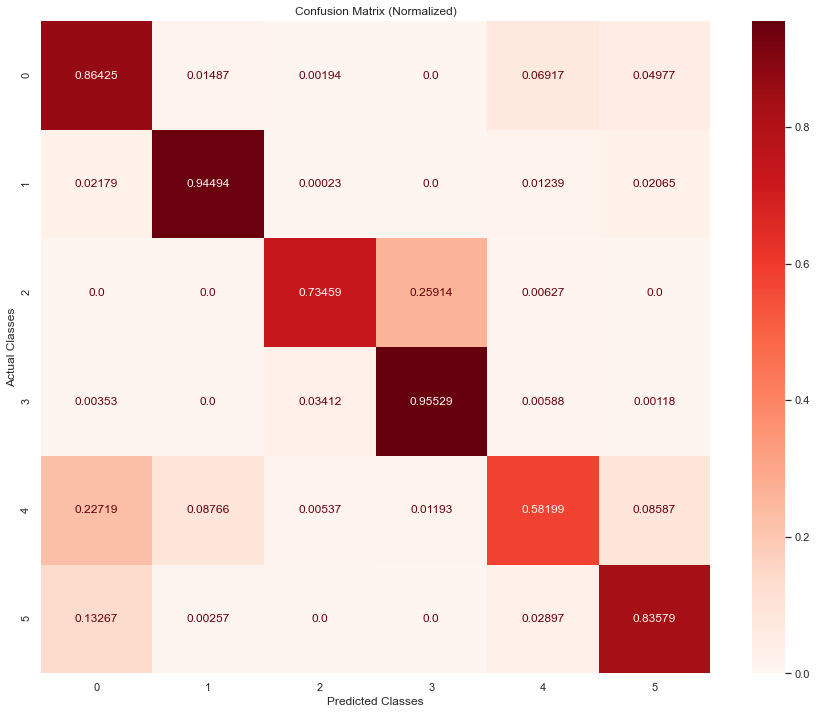

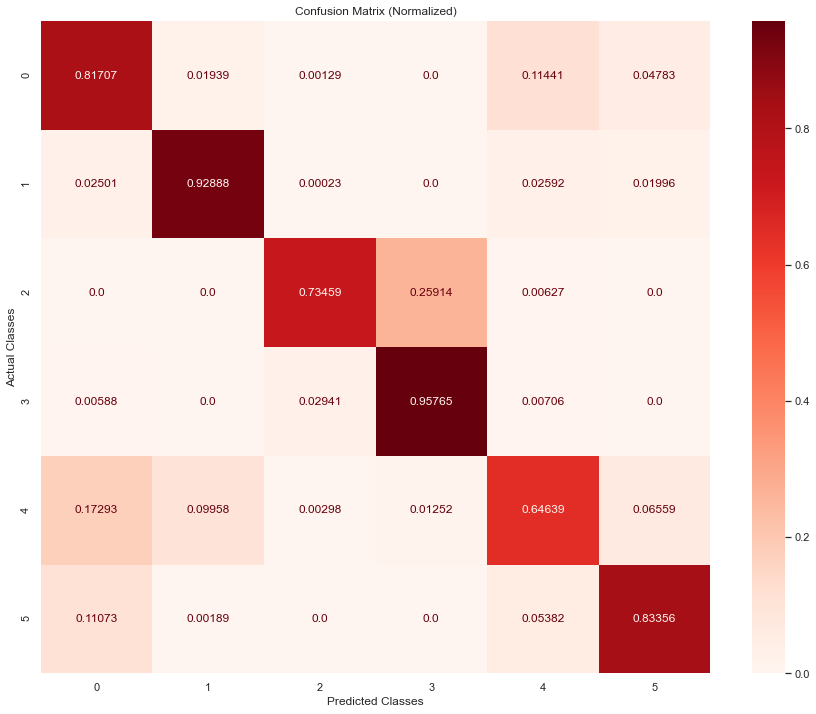

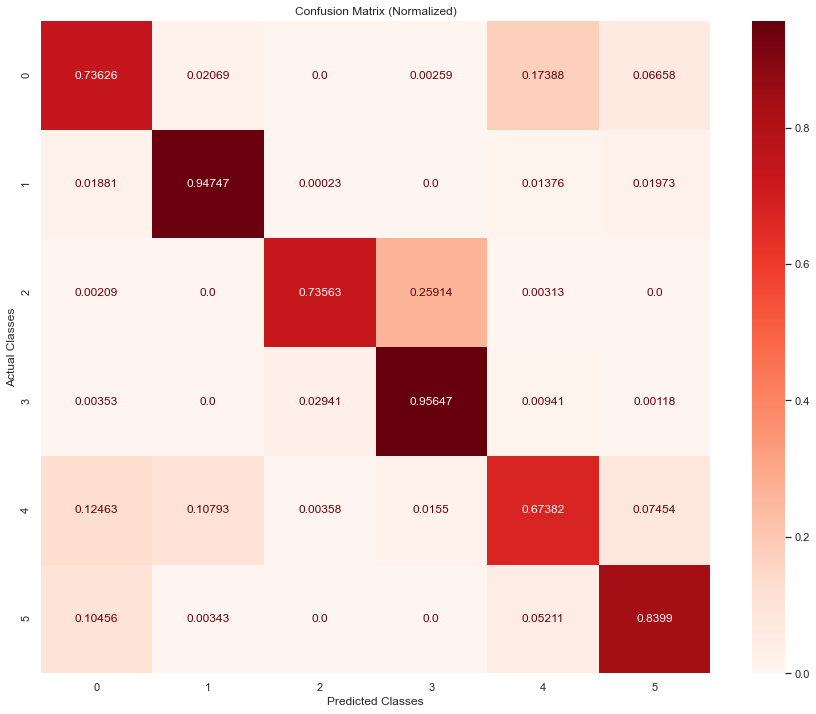

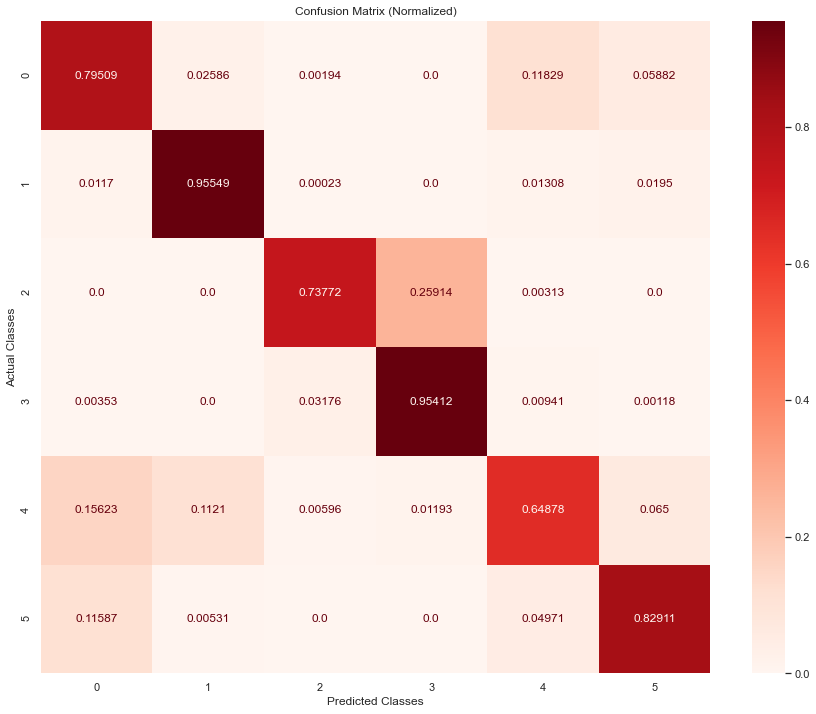

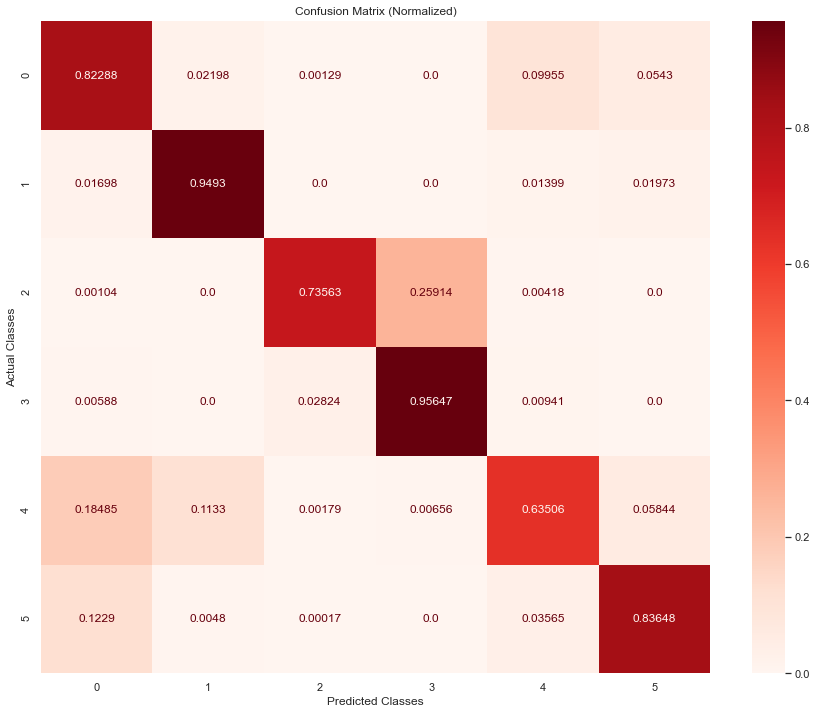

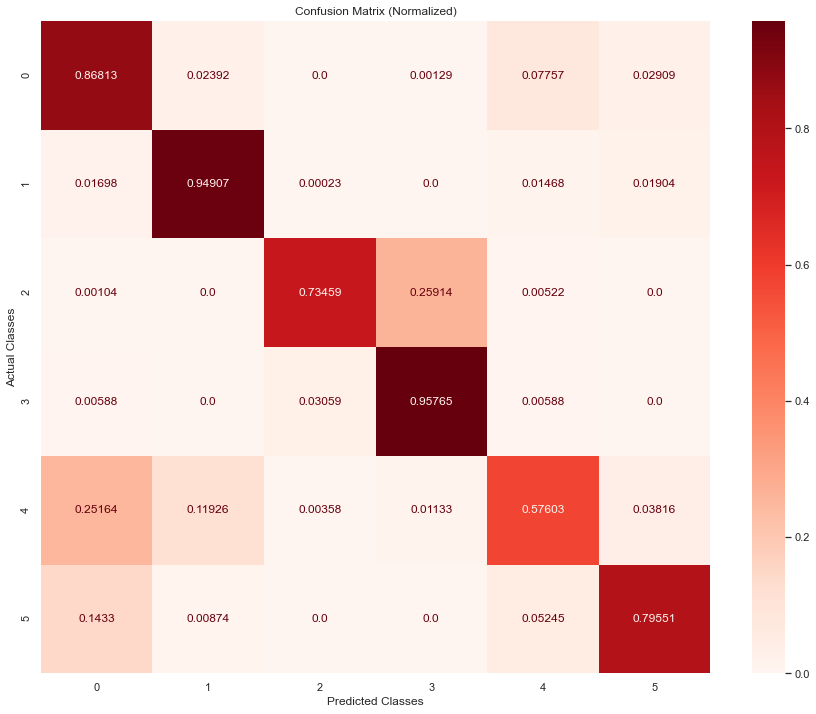

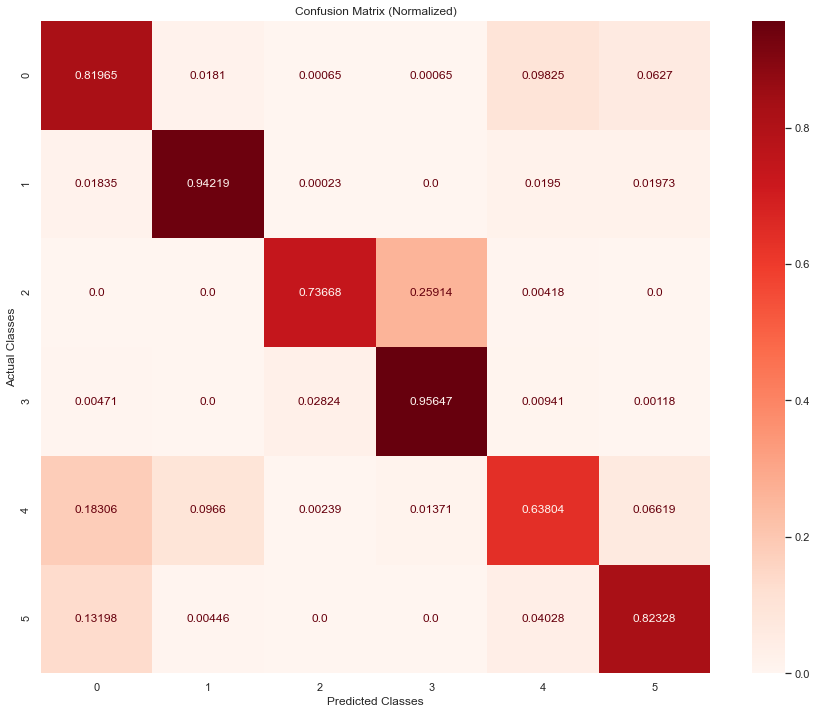

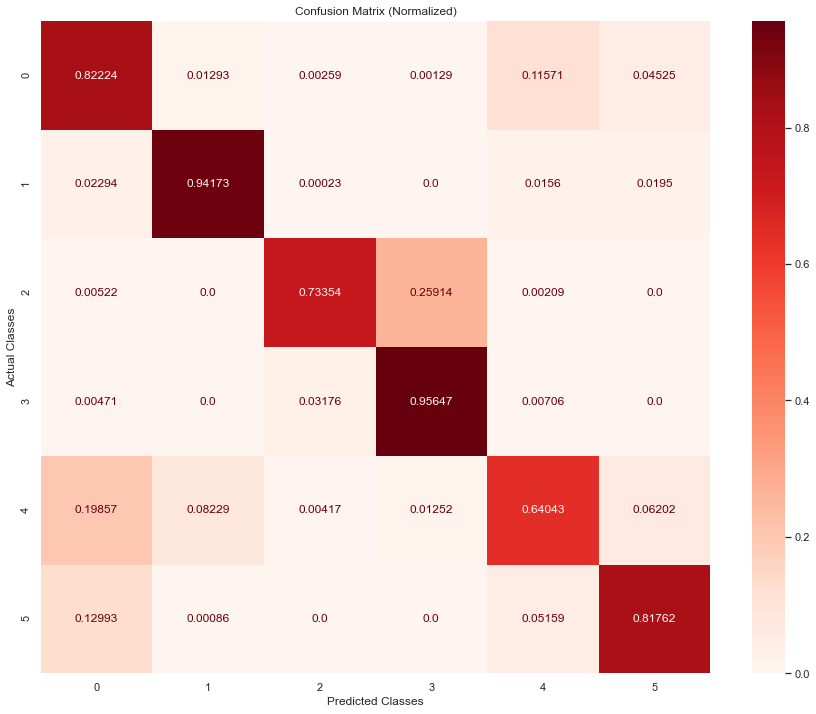

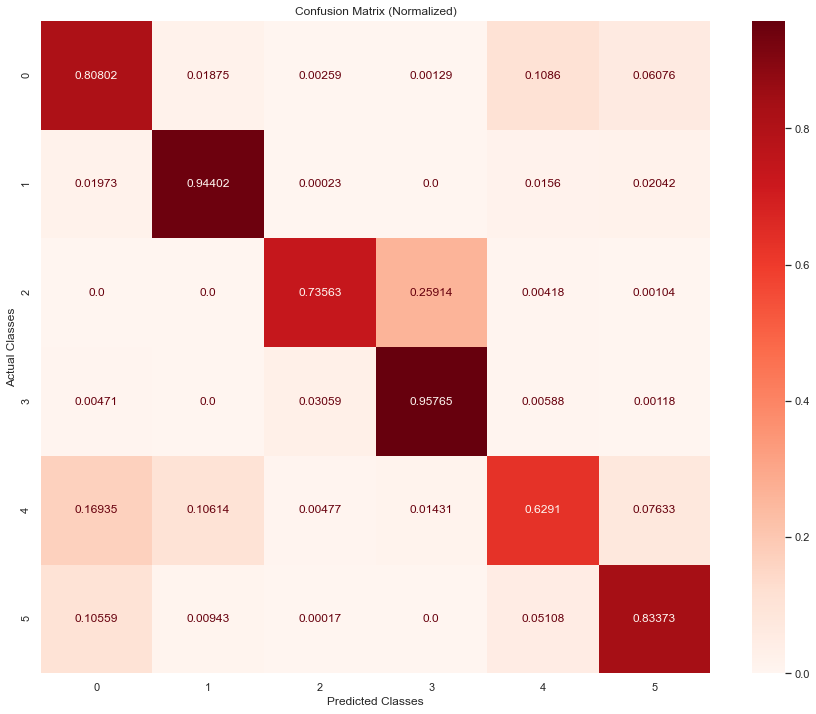

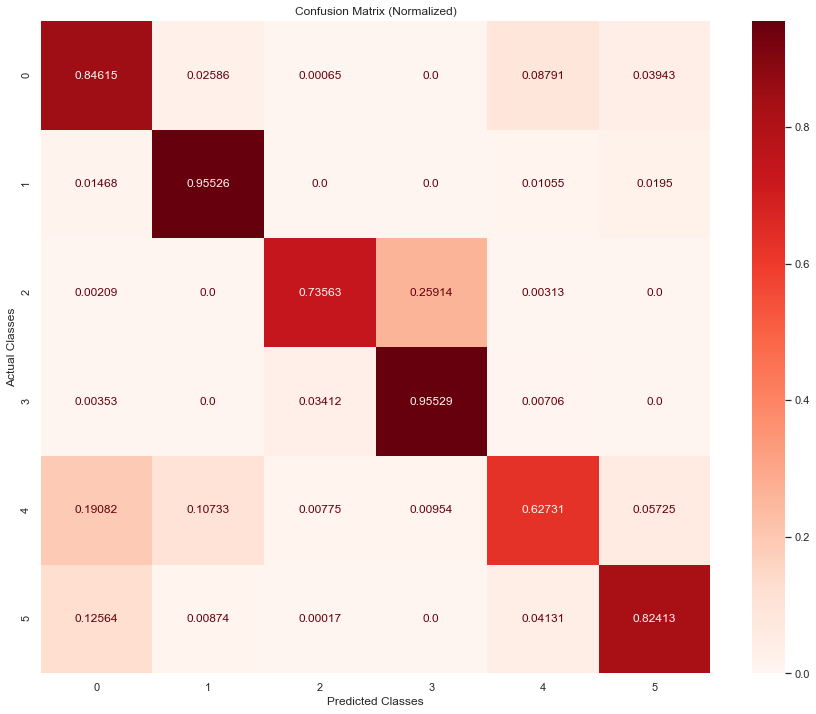

In [96]:
repeat_experiment(repeats=REPEATS, model_type="convlstm", data = "reduced")

Run:  1
reduced
Bi-LSTM
Epoch 1/5000
1221/1221 [==============================] - 12s 9ms/step - loss: 1.0705 - accuracy: 0.5341 - val_loss: 1.1622 - val_accuracy: 0.7162
Epoch 2/5000
1221/1221 [==============================] - 10s 9ms/step - loss: 0.6592 - accuracy: 0.7090 - val_loss: 1.2025 - val_accuracy: 0.6523
Epoch 3/5000
1221/1221 [==============================] - 10s 8ms/step - loss: 0.5143 - accuracy: 0.7903 - val_loss: 1.0658 - val_accuracy: 0.7884
Epoch 4/5000
1221/1221 [==============================] - 10s 8ms/step - loss: 0.4099 - accuracy: 0.8464 - val_loss: 0.9953 - val_accuracy: 0.8102
Epoch 5/5000
1221/1221 [==============================] - 10s 8ms/step - loss: 0.3585 - accuracy: 0.8671 - val_loss: 0.7701 - val_accuracy: 0.8219
Epoch 6/5000
1221/1221 [==============================] - 10s 9ms/step - loss: 0.3222 - accuracy: 0.8819 - val_loss: 0.8351 - val_accuracy: 0.8187
Epoch 7/5000
1221/1221 [==============================] - 10s 8ms/step - loss: 0.2914 - accura

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  2
reduced
Bi-LSTM
Epoch 1/5000
1221/1221 [==============================] - 13s 9ms/step - loss: 0.9892 - accuracy: 0.5644 - val_loss: 1.1289 - val_accuracy: 0.7222
Epoch 2/5000
1221/1221 [==============================] - 11s 9ms/step - loss: 0.6268 - accuracy: 0.7233 - val_loss: 0.9068 - val_accuracy: 0.7436
Epoch 3/5000
1221/1221 [==============================] - 10s 8ms/step - loss: 0.4833 - accuracy: 0.8068 - val_loss: 0.9482 - val_accuracy: 0.8099
Epoch 4/5000
1221/1221 [==============================] - 10s 8ms/step - loss: 0.3840 - accuracy: 0.8581 - val_loss: 0.6885 - val_accuracy: 0.8254
Epoch 5/5000
1221/1221 [==============================] - 10s 8ms/step - loss: 0.3402 - accuracy: 0.8742 - val_loss: 0.7524 - val_accuracy: 0.8083
Epoch 6/5000
1221/1221 [==============================] - 10s 8ms/step - loss: 0.3103 - accuracy: 0.8857 - val_loss: 0.7438 - val_accuracy: 0.8103
Epoch 7/5000
1221/1221 [==============================] - 10s 8ms/step - loss: 0.2887 - accura

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  3
reduced
Bi-LSTM
Epoch 1/5000
1221/1221 [==============================] - 12s 9ms/step - loss: 1.0093 - accuracy: 0.5566 - val_loss: 1.1268 - val_accuracy: 0.7038
Epoch 2/5000
1221/1221 [==============================] - 10s 8ms/step - loss: 0.6202 - accuracy: 0.7337 - val_loss: 0.8583 - val_accuracy: 0.7808
Epoch 3/5000
1221/1221 [==============================] - 10s 8ms/step - loss: 0.4832 - accuracy: 0.8176 - val_loss: 0.9135 - val_accuracy: 0.8090
Epoch 4/5000
1221/1221 [==============================] - 10s 8ms/step - loss: 0.4213 - accuracy: 0.8436 - val_loss: 0.8469 - val_accuracy: 0.8148
Epoch 5/5000
1221/1221 [==============================] - 10s 8ms/step - loss: 0.3619 - accuracy: 0.8646 - val_loss: 0.6785 - val_accuracy: 0.8258
Epoch 6/5000
1221/1221 [==============================] - 10s 8ms/step - loss: 0.3167 - accuracy: 0.8842 - val_loss: 0.7585 - val_accuracy: 0.8236
Epoch 7/5000
1221/1221 [==============================] - 10s 8ms/step - loss: 0.2835 - accura

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  4
reduced
Bi-LSTM
Epoch 1/5000
1221/1221 [==============================] - 12s 9ms/step - loss: 0.9800 - accuracy: 0.5698 - val_loss: 1.2300 - val_accuracy: 0.6421
Epoch 2/5000
1221/1221 [==============================] - 10s 9ms/step - loss: 0.6079 - accuracy: 0.7367 - val_loss: 1.0618 - val_accuracy: 0.6950
Epoch 3/5000
1221/1221 [==============================] - 11s 9ms/step - loss: 0.4489 - accuracy: 0.8298 - val_loss: 0.6960 - val_accuracy: 0.8280
Epoch 4/5000
1221/1221 [==============================] - 10s 8ms/step - loss: 0.3651 - accuracy: 0.8655 - val_loss: 0.6122 - val_accuracy: 0.8358
Epoch 5/5000
1221/1221 [==============================] - 10s 8ms/step - loss: 0.3337 - accuracy: 0.8786 - val_loss: 0.7148 - val_accuracy: 0.8318
Epoch 6/5000
1221/1221 [==============================] - 10s 8ms/step - loss: 0.3054 - accuracy: 0.8886 - val_loss: 0.7629 - val_accuracy: 0.8165
Epoch 7/5000
1221/1221 [==============================] - 10s 9ms/step - loss: 0.2863 - accura

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  5
reduced
Bi-LSTM
Epoch 1/5000
1221/1221 [==============================] - 12s 9ms/step - loss: 1.0179 - accuracy: 0.5550 - val_loss: 1.1467 - val_accuracy: 0.6888
Epoch 2/5000
1221/1221 [==============================] - 10s 8ms/step - loss: 0.6269 - accuracy: 0.7259 - val_loss: 1.1578 - val_accuracy: 0.7344
Epoch 3/5000
1221/1221 [==============================] - 10s 8ms/step - loss: 0.4916 - accuracy: 0.8016 - val_loss: 0.8613 - val_accuracy: 0.8054
Epoch 4/5000
1221/1221 [==============================] - 10s 8ms/step - loss: 0.3803 - accuracy: 0.8600 - val_loss: 0.7140 - val_accuracy: 0.8151
Epoch 5/5000
1221/1221 [==============================] - 10s 8ms/step - loss: 0.3428 - accuracy: 0.8759 - val_loss: 0.7847 - val_accuracy: 0.8235
Epoch 6/5000
1221/1221 [==============================] - 10s 8ms/step - loss: 0.3137 - accuracy: 0.8858 - val_loss: 0.8818 - val_accuracy: 0.8302
Epoch 7/5000
1221/1221 [==============================] - 10s 9ms/step - loss: 0.2895 - accura

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  6
reduced
Bi-LSTM
Epoch 1/5000
1221/1221 [==============================] - 13s 9ms/step - loss: 0.9899 - accuracy: 0.5611 - val_loss: 1.0648 - val_accuracy: 0.6841
Epoch 2/5000
1221/1221 [==============================] - 10s 8ms/step - loss: 0.6147 - accuracy: 0.7376 - val_loss: 1.1552 - val_accuracy: 0.7278
Epoch 3/5000
1221/1221 [==============================] - 10s 8ms/step - loss: 0.4716 - accuracy: 0.8149 - val_loss: 0.7921 - val_accuracy: 0.8204
Epoch 4/5000
1221/1221 [==============================] - 10s 8ms/step - loss: 0.3786 - accuracy: 0.8582 - val_loss: 0.8012 - val_accuracy: 0.7972
Epoch 5/5000
1221/1221 [==============================] - 10s 8ms/step - loss: 0.3406 - accuracy: 0.8736 - val_loss: 0.7014 - val_accuracy: 0.8233
Epoch 6/5000
1221/1221 [==============================] - 10s 8ms/step - loss: 0.3117 - accuracy: 0.8837 - val_loss: 0.7297 - val_accuracy: 0.8312
Epoch 7/5000
1221/1221 [==============================] - 10s 8ms/step - loss: 0.2842 - accura

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  7
reduced
Bi-LSTM
Epoch 1/5000
1221/1221 [==============================] - 12s 9ms/step - loss: 1.0176 - accuracy: 0.5525 - val_loss: 1.2790 - val_accuracy: 0.6909
Epoch 2/5000
1221/1221 [==============================] - 10s 9ms/step - loss: 0.6123 - accuracy: 0.7372 - val_loss: 1.0103 - val_accuracy: 0.7683
Epoch 3/5000
1221/1221 [==============================] - 11s 9ms/step - loss: 0.4458 - accuracy: 0.8340 - val_loss: 0.9559 - val_accuracy: 0.7713
Epoch 4/5000
1221/1221 [==============================] - 10s 8ms/step - loss: 0.3803 - accuracy: 0.8585 - val_loss: 1.0777 - val_accuracy: 0.7983
Epoch 5/5000
1221/1221 [==============================] - 10s 8ms/step - loss: 0.3349 - accuracy: 0.8779 - val_loss: 0.8178 - val_accuracy: 0.8142
Epoch 6/5000
1221/1221 [==============================] - 11s 9ms/step - loss: 0.3040 - accuracy: 0.8889 - val_loss: 0.7251 - val_accuracy: 0.8268
Epoch 7/5000
1221/1221 [==============================] - 11s 9ms/step - loss: 0.2783 - accura

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  8
reduced
Bi-LSTM
Epoch 1/5000
1221/1221 [==============================] - 12s 9ms/step - loss: 1.0446 - accuracy: 0.5405 - val_loss: 1.1662 - val_accuracy: 0.7364
Epoch 2/5000
1221/1221 [==============================] - 10s 8ms/step - loss: 0.6073 - accuracy: 0.7406 - val_loss: 0.9267 - val_accuracy: 0.7731
Epoch 3/5000
1221/1221 [==============================] - 10s 8ms/step - loss: 0.4431 - accuracy: 0.8335 - val_loss: 0.8654 - val_accuracy: 0.8068
Epoch 4/5000
1221/1221 [==============================] - 10s 8ms/step - loss: 0.3716 - accuracy: 0.8625 - val_loss: 0.8460 - val_accuracy: 0.8218
Epoch 5/5000
1221/1221 [==============================] - 10s 8ms/step - loss: 0.3324 - accuracy: 0.8767 - val_loss: 0.8675 - val_accuracy: 0.8297
Epoch 6/5000
1221/1221 [==============================] - 10s 8ms/step - loss: 0.2968 - accuracy: 0.8913 - val_loss: 0.7216 - val_accuracy: 0.8335
Epoch 7/5000
1221/1221 [==============================] - 10s 8ms/step - loss: 0.2715 - accura

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  9
reduced
Bi-LSTM
Epoch 1/5000
1221/1221 [==============================] - 13s 9ms/step - loss: 0.9943 - accuracy: 0.5632 - val_loss: 0.9890 - val_accuracy: 0.7168
Epoch 2/5000
1221/1221 [==============================] - 10s 8ms/step - loss: 0.5878 - accuracy: 0.7560 - val_loss: 0.8933 - val_accuracy: 0.7288
Epoch 3/5000
1221/1221 [==============================] - 10s 8ms/step - loss: 0.4712 - accuracy: 0.8237 - val_loss: 0.7588 - val_accuracy: 0.8122
Epoch 4/5000
1221/1221 [==============================] - 10s 8ms/step - loss: 0.3988 - accuracy: 0.8508 - val_loss: 0.8742 - val_accuracy: 0.7936
Epoch 5/5000
1221/1221 [==============================] - 10s 8ms/step - loss: 0.3544 - accuracy: 0.8676 - val_loss: 0.8938 - val_accuracy: 0.8107
Epoch 6/5000
1221/1221 [==============================] - 10s 9ms/step - loss: 0.3260 - accuracy: 0.8804 - val_loss: 0.7843 - val_accuracy: 0.8263
Epoch 7/5000
1221/1221 [==============================] - 11s 9ms/step - loss: 0.2930 - accura

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  10
reduced
Bi-LSTM
Epoch 1/5000
1221/1221 [==============================] - 13s 9ms/step - loss: 1.0152 - accuracy: 0.5572 - val_loss: 0.9296 - val_accuracy: 0.7317
Epoch 2/5000
1221/1221 [==============================] - 10s 8ms/step - loss: 0.6054 - accuracy: 0.7434 - val_loss: 0.9739 - val_accuracy: 0.7708
Epoch 3/5000
1221/1221 [==============================] - 10s 8ms/step - loss: 0.4469 - accuracy: 0.8310 - val_loss: 0.9763 - val_accuracy: 0.8004
Epoch 4/5000
1221/1221 [==============================] - 10s 8ms/step - loss: 0.3828 - accuracy: 0.8572 - val_loss: 0.8044 - val_accuracy: 0.8002
Epoch 5/5000
1221/1221 [==============================] - 10s 8ms/step - loss: 0.3380 - accuracy: 0.8755 - val_loss: 0.8064 - val_accuracy: 0.8108
Epoch 6/5000
1221/1221 [==============================] - 10s 8ms/step - loss: 0.3042 - accuracy: 0.8892 - val_loss: 0.8694 - val_accuracy: 0.7905
Epoch 7/5000
1221/1221 [==============================] - 10s 8ms/step - loss: 0.2768 - accur

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


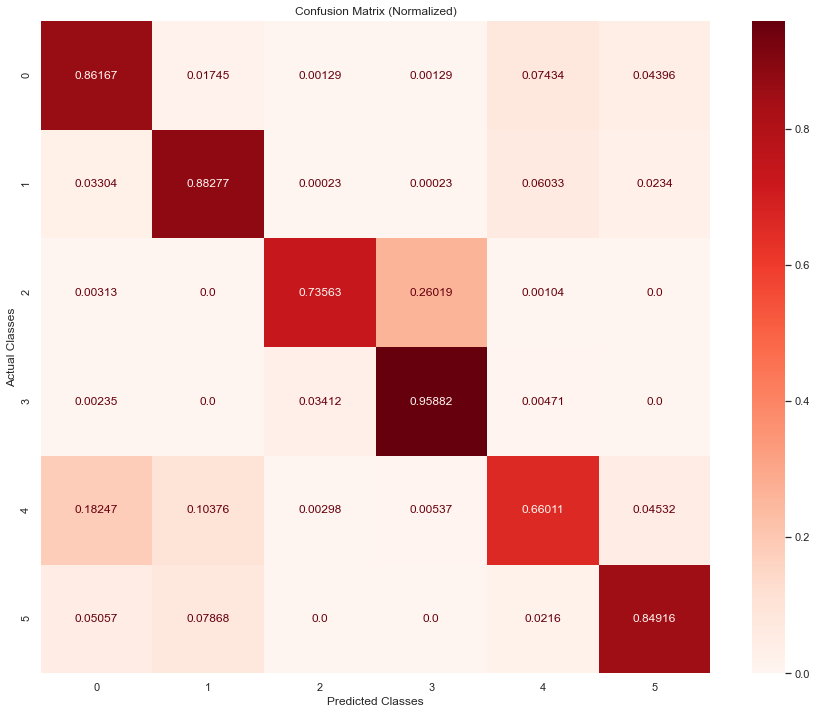

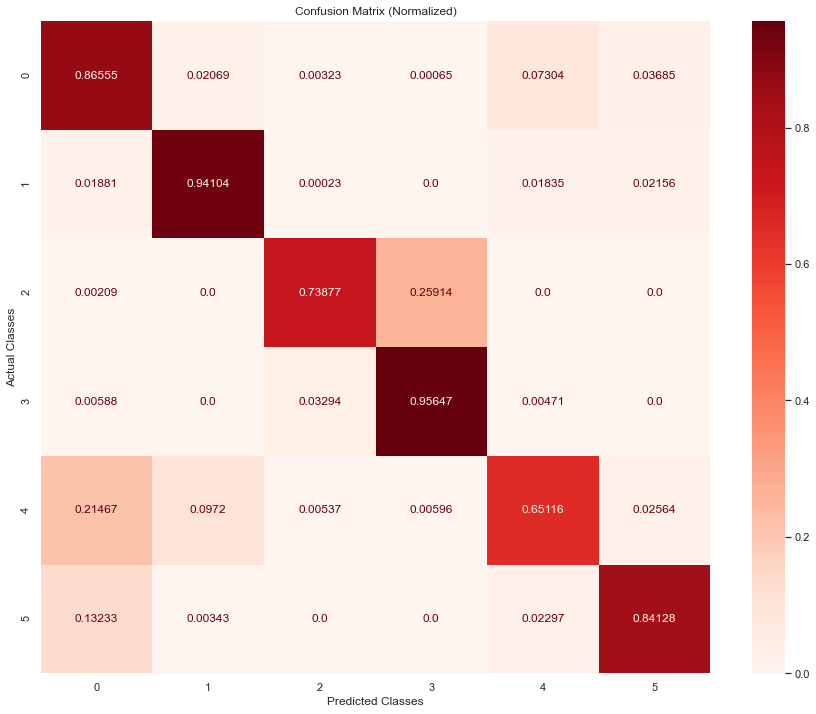

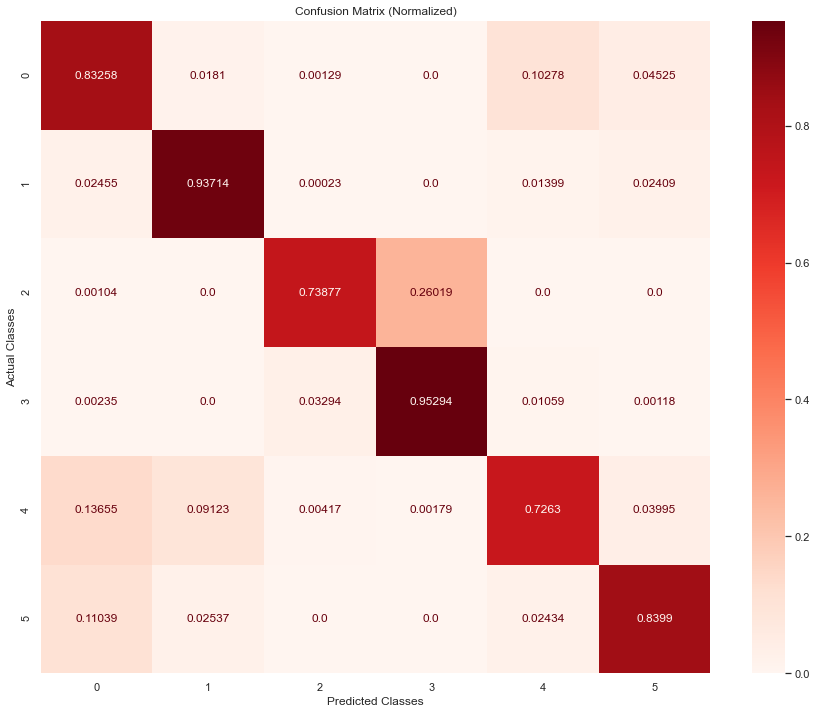

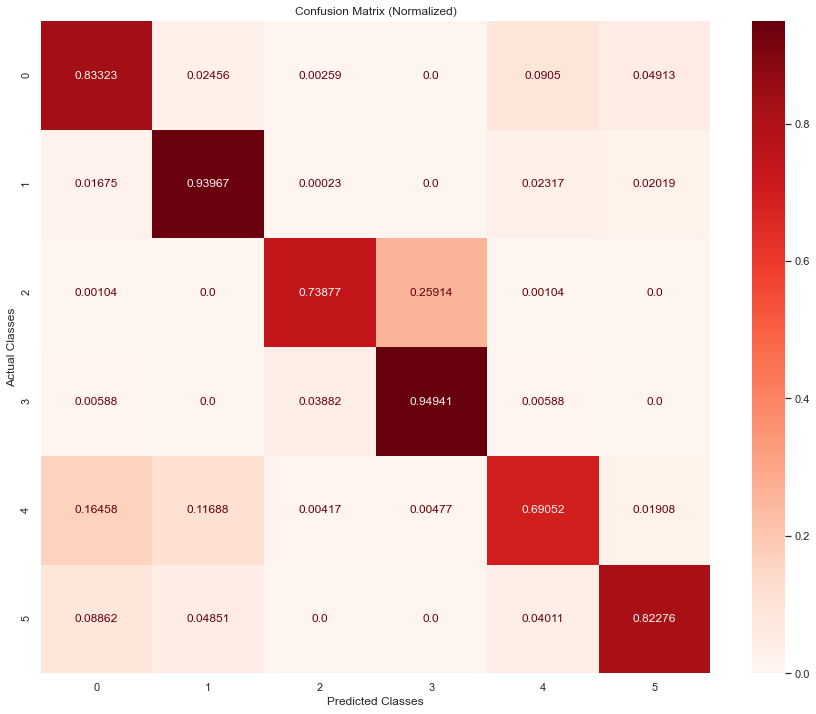

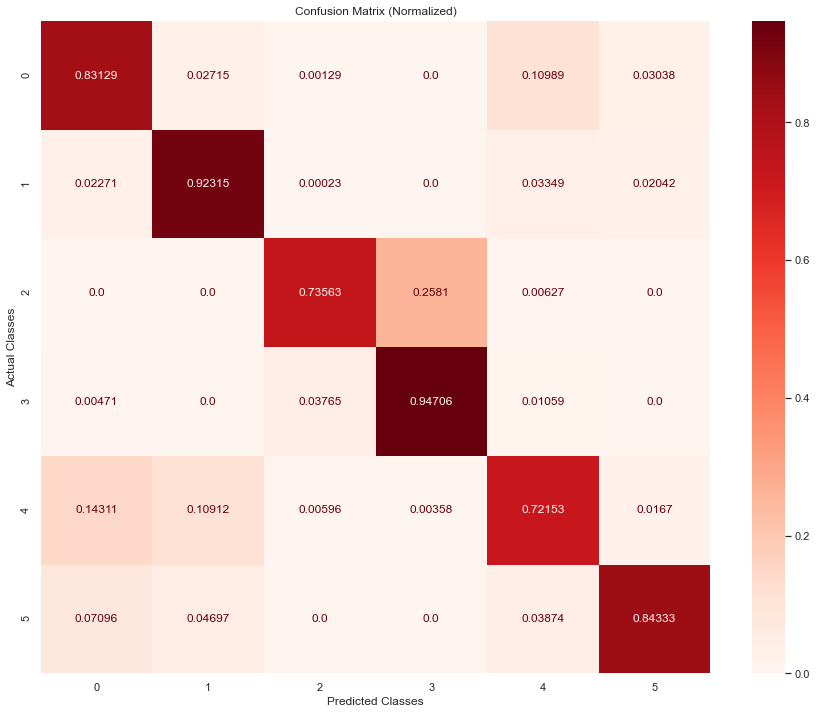

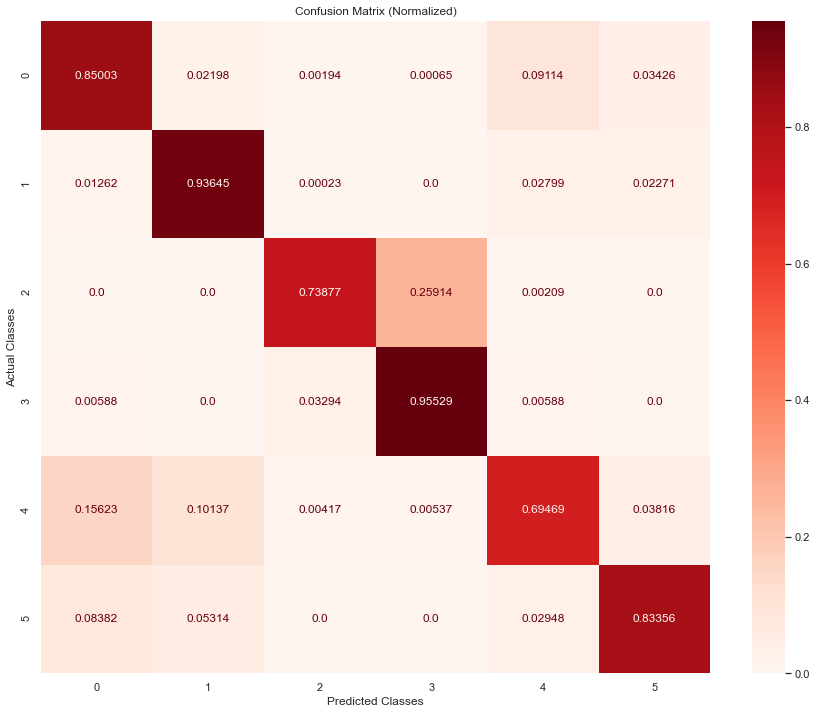

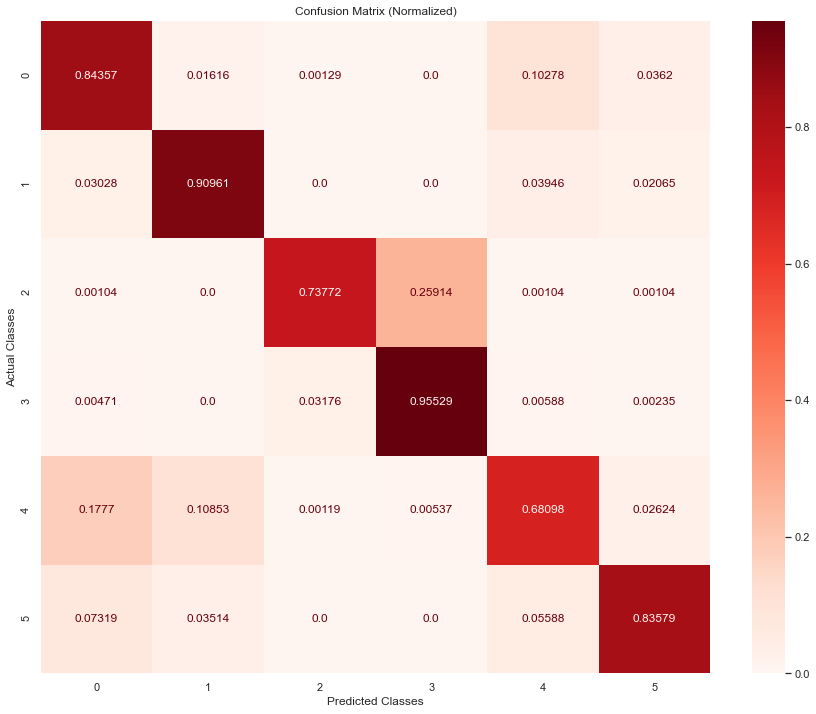

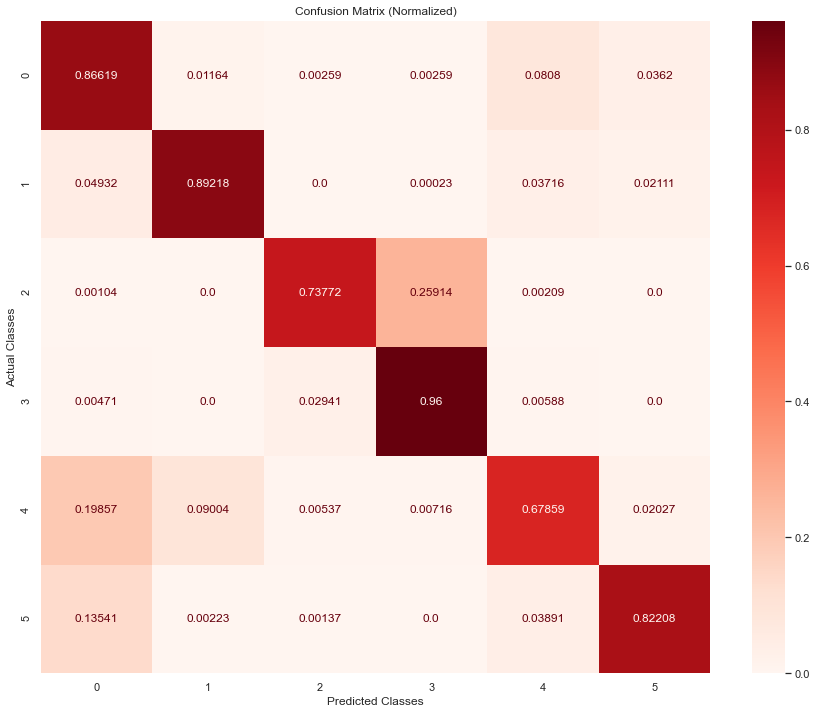

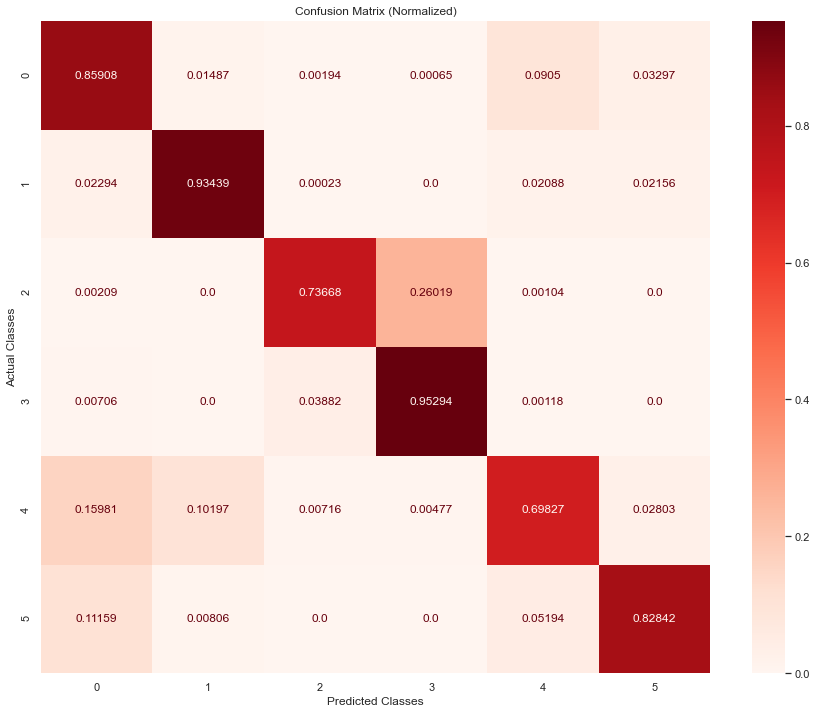

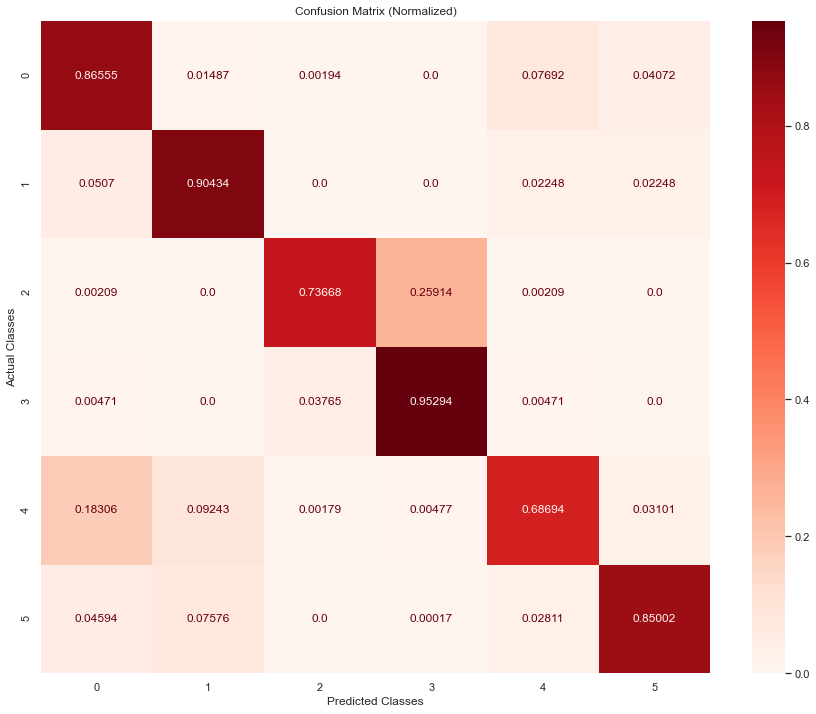

In [97]:
repeat_experiment(repeats=REPEATS, model_type="bilstm", data = "reduced")

### Divide and conquer

In [98]:
# make trimmed down vversion of run_experiment_dac for the repeat experiments
def run_experiment_dac_r(model_type="lstm", data = "original"):
    
    Experiment_type["type"] = "dac"
    
    print(data)
    
    # select model type, based on user input 
    if (model_type == 'lstm'):
        fit_model = fit_model_LSTM
    elif (model_type == 'cnnlstm'):
        fit_model = fit_model_CNN_LSTM
    elif (model_type == 'convlstm'):
        fit_model = fit_model_ConvLSTM
    elif (model_type == 'bilstm'):
        fit_model = fit_model_Bi_LSTM
    # print message if wrong input given
    else:
        print('INPUT ERROR. Please see the following possible inputs: ')
        print('For a LSTM model, input "lstm"')
        print('For a CNN-LSTM model, input "cnnlstm"')
        print('For a ConvLSTM model, input "convlstm"')
        print('For a Bi-LSTM model, input "bilstm"')
        return
  
    
    # use different datasets depending on user selection
    if (data == "original"):
        trainX_, trainy_, testX_, testy_ = trainX, trainy_raw, testX, testy_raw
    elif (data == "balanced"):
        trainX_, trainy_, testX_, testy_ = trainX_balanced, trainy_raw_balanced, testX, testy_raw        
    elif (data == "reduced"):
        trainX_, trainy_, testX_, testy_ = trainX_fr, trainy_raw_balanced, testX_fr, testy_raw
    else:
        print('INPUT ERROR. Please see the following possible inputs: ')
        print('To use the original dataset, input "original"')
        print('To use the oversampled, balanced dataset, input "balanced"')
        print('To use the feature reduced dataset, input "reduced"')
        return
    
    print("SPLITTING DATA:")
    
    # run first classifier, classifying as either stationary or moving
    history_split, max_y_test_split, max_y_pred_test_split, max_y_pred_train_split, times_split = run_experiment_dac_split(trainX_,
                                                                                                              trainy_,
                                                                                                              testX_,
                                                                                                              testy_,
                                                                                                              model_type
                                                                                                             )
    
    # use results from first classifier to split data
    # split training and testing data based on the predictions of the model
    trainX_stationary, trainX_moving = split_data(trainX_, max_y_pred_train_split)
    testX_stationary, testX_moving = split_data(testX_, max_y_pred_test_split)
    trainy_stationary, trainy_moving = split_data(trainy_, max_y_pred_train_split)
    testy_stationary, testy_moving = split_data(testy_, max_y_pred_test_split)
    
    # one hot encode y
    trainy_stationary = to_categorical(trainy_stationary, num_classes=7)
    testy_stationary = to_categorical(testy_stationary, num_classes=7)
    trainy_moving = to_categorical(trainy_moving, num_classes=7)
    testy_moving = to_categorical(testy_moving, num_classes=7)
      
    print()
    print("STATIONARY")

    # input these variables into a classifier for each of stationary and moving
    history_stationary, max_y_test_stationary, max_y_pred_test_stationary, max_y_pred_train_stationary, times_stationary = fit_model(trainX_stationary,
                                                                                                                           trainy_stationary,
                                                                                                                           testX_stationary,
                                                                                                                           testy_stationary)

    print()
    print("MOVING")
    history_moving, max_y_test_moving, max_y_pred_test_moving, max_y_pred_train_moving, times_moving = fit_model(trainX_moving,
                                                                                                           trainy_moving,
                                                                                                           testX_moving,
                                                                                                           testy_moving)
    

    # get training and test set loss for stationary data
    train_loss_stationary = history_stationary.history['loss']
    test_loss_stationary = history_stationary.history['val_loss']
    # get training and test accuracy
    train_accuracy_stationary = history_stationary.history['accuracy']
    test_accuracy_stationary = history_stationary.history['val_accuracy']    
    # set number of epochs to be dynamic, depending how long experiment runs for
    epochs_stationary = range(0,len(test_accuracy_stationary))

    # get training and test set loss for moving data
    train_loss_moving = history_moving.history['loss']
    test_loss_moving = history_moving.history['val_loss']
    # get training and test accuracy
    train_accuracy_moving = history_moving.history['accuracy']
    test_accuracy_moving = history_moving.history['val_accuracy']    
    # set number of epochs to be dynamic, depending how long experiment runs for
    epochs_moving = range(0,len(test_accuracy_moving))

    # show overall confusion matrix
    max_y_test = np.concatenate((max_y_test_stationary, max_y_test_moving), axis=None)
    max_y_pred_test = np.concatenate((max_y_pred_test_stationary, max_y_pred_test_moving), axis=None)
    # dop normalised cm
    cm = ConfusionMatrix(actual_vector=max_y_test, predict_vector=max_y_pred_test) # Create CM From Data
    cm.plot(cmap=plt.cm.Reds,normalized=True,number_label=True,plot_lib="seaborn")
    
    # show training time
    times = [sum(n) for n in zip_longest(times_split, times_stationary, times_moving, fillvalue=0)]   

    # get weighted average accuracy
    weighted_accuracy_train = weighted_average(train_accuracy_stationary, max_y_pred_train_stationary, train_accuracy_moving, max_y_pred_train_moving)
    weighted_accuracy_test = weighted_average(test_accuracy_stationary, max_y_pred_test_stationary, test_accuracy_moving, max_y_pred_test_moving)

    # get weighted average accuracy per epoch
    weighted_accuracy_per_epoch_train = weighted_average_per_epoch(train_accuracy_stationary,max_y_pred_train_stationary, train_accuracy_moving, max_y_pred_train_moving)
    weighted_accuracy_per_epoch_test = weighted_average_per_epoch(test_accuracy_stationary,max_y_pred_test_stationary, test_accuracy_moving, max_y_pred_test_moving)
    
    # return metrics etc
    return (weighted_accuracy_per_epoch_train, 
    weighted_accuracy_per_epoch_test,
    weighted_accuracy_train,
    weighted_accuracy_test,
    np.cumsum(times),
    metrics.precision_score(max_y_test, max_y_pred_test, average='weighted'),
    metrics.recall_score(max_y_test, max_y_pred_test, average='weighted'),
    metrics.f1_score(max_y_test, max_y_pred_test, average='weighted')
    )

In [99]:
# do the same for divide and conquer
def repeat_experiment_dac(repeats=REPEATS, model_type="lstm", data = "original"):
    
    Experiment_type["type"] = "dac"
    
    final_model_accuracies_train = list() 
    final_model_accuracies_test = list()
    precision = list()
    recall = list()
    f1_score = list()
    
    # store model name for storage of results and analysis
    model_name = model_type + "_" + data
    
    # repeat model, storing values each time
    for i in range(repeats):
        print("Run: ", i+1)
        a,b,c,d,e,f,g,h = run_experiment_dac_r(model_type=model_type, data = data)
        
        # add these to the metrics dictionaries
        repeat_epoch_accuracies_train[model_name + "_" + "_dac_" + str(i+1)] = a
        repeat_epoch_accuracies_test[model_name + "_" + "_dac_" + str(i+1)] = b
        repeat_final_model_accuracies_train[model_name + "_" + "_dac_" + str(i+1)] = c
        repeat_final_model_accuracies_test[model_name + "_" + "_dac_" + str(i+1)] = d
        repeat_training_times[model_name + "_" + "_dac_" + str(i+1)] = e
        repeat_precision[model_name + "_" + "_dac_" + str(i+1)] = f
        repeat_recall[model_name + "_" + "_dac_" + str(i+1)] = g
        repeat_f1_score[model_name + "_" + "_dac_" + str(i+1)] = h
        
        # get mean metrics for each model
        # first, store all metrics for each repeat in a list
        final_model_accuracies_train.append(c)
        final_model_accuracies_test.append(d)
        precision.append(f)
        recall.append(g)
        f1_score.append(h)
        # calculate means
        mean_final_model_accuracies_train[model_name + "_dac"] = mean(final_model_accuracies_train)
        mean_final_model_accuracies_test[model_name + "_dac"] = mean(final_model_accuracies_test)
        mean_precision[model_name + "_dac"] = mean(precision)
        mean_recall[model_name + "_dac"] = mean(recall)
        mean_f1_score[model_name + "_dac"] = mean(f1_score)
        # calculate dtandard deviation
        std_final_model_accuracies_train[model_name + "_dac"] = std(final_model_accuracies_train)
        std_final_model_accuracies_test[model_name + "_dac"] = std(final_model_accuracies_test)
        std_precision[model_name + "_dac"] = std(precision)
        std_recall[model_name + "_dac"] = std(recall)
        std_f1_score[model_name + "_dac"] = std(f1_score)  

#### Test run

##### Original data

Run:  1
original
SPLITTING DATA:
Classify data as either stationary or moving:
(37068, 42, 3)
(37068, 2)
(15224, 42, 3)
(15224, 2)
LSTM
Epoch 1/10
580/580 [==============================] - 4s 6ms/step - loss: 0.1851 - accuracy: 0.9482 - val_loss: 0.3329 - val_accuracy: 0.9302
Epoch 2/10
580/580 [==============================] - 3s 6ms/step - loss: 0.1217 - accuracy: 0.9598 - val_loss: 0.2173 - val_accuracy: 0.9341
Epoch 3/10
580/580 [==============================] - 3s 6ms/step - loss: 0.0296 - accuracy: 0.9916 - val_loss: 0.0802 - val_accuracy: 0.9821
Epoch 4/10
580/580 [==============================] - 3s 6ms/step - loss: 0.0154 - accuracy: 0.9962 - val_loss: 0.0877 - val_accuracy: 0.9796
Epoch 5/10
580/580 [==============================] - 3s 6ms/step - loss: 0.0134 - accuracy: 0.9966 - val_loss: 0.0858 - val_accuracy: 0.9835
Epoch 6/10
580/580 [==============================] - 3s 6ms/step - loss: 0.0117 - accuracy: 0.9971 - val_loss: 0.0305 - val_accuracy: 0.9914
Epoch 7/10
5

Epoch 48/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.1536 - accuracy: 0.9666 - val_loss: 0.3978 - val_accuracy: 0.8572
Epoch 49/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.1027 - accuracy: 0.9810 - val_loss: 0.5278 - val_accuracy: 0.9011
Epoch 50/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0761 - accuracy: 0.9883 - val_loss: 0.5594 - val_accuracy: 0.9011
Epoch 51/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0725 - accuracy: 0.9889 - val_loss: 0.5768 - val_accuracy: 0.9011
Epoch 52/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0723 - accuracy: 0.9892 - val_loss: 0.5639 - val_accuracy: 0.9018
Epoch 53/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.1335 - accuracy: 0.9774 - val_loss: 0.6497 - val_accuracy: 0.8527
Epoch 54/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0814 - accuracy: 0.9864 - val_loss: 0.5303 - val_accuracy: 0.9018

Epoch 162/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0642 - accuracy: 0.9895 - val_loss: 0.5381 - val_accuracy: 0.9011
Epoch 163/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0605 - accuracy: 0.9898 - val_loss: 0.5772 - val_accuracy: 0.9011
Epoch 164/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0632 - accuracy: 0.9898 - val_loss: 0.5555 - val_accuracy: 0.9011
Epoch 165/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0610 - accuracy: 0.9892 - val_loss: 0.5371 - val_accuracy: 0.9011
Epoch 166/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0606 - accuracy: 0.9895 - val_loss: 0.5356 - val_accuracy: 0.9011
Epoch 167/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0604 - accuracy: 0.9895 - val_loss: 0.5207 - val_accuracy: 0.9011
Epoch 168/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0573 - accuracy: 0.9898 - val_loss: 0.5419 - val_accuracy:

Epoch 219/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0599 - accuracy: 0.9898 - val_loss: 0.6105 - val_accuracy: 0.9011
Epoch 220/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0592 - accuracy: 0.9901 - val_loss: 0.5910 - val_accuracy: 0.9005
Epoch 221/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0560 - accuracy: 0.9904 - val_loss: 0.6039 - val_accuracy: 0.9018
Epoch 222/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0596 - accuracy: 0.9901 - val_loss: 0.5496 - val_accuracy: 0.9005
Epoch 223/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0616 - accuracy: 0.9898 - val_loss: 0.5472 - val_accuracy: 0.9018
Epoch 224/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0575 - accuracy: 0.9895 - val_loss: 0.5506 - val_accuracy: 0.9005
Epoch 225/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0594 - accuracy: 0.9904 - val_loss: 0.5074 - val_accuracy:

Epoch 276/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0573 - accuracy: 0.9901 - val_loss: 0.5454 - val_accuracy: 0.9011
Epoch 277/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0565 - accuracy: 0.9904 - val_loss: 0.5794 - val_accuracy: 0.9011
Epoch 278/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0558 - accuracy: 0.9904 - val_loss: 0.6091 - val_accuracy: 0.9018
Epoch 279/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0562 - accuracy: 0.9901 - val_loss: 0.6302 - val_accuracy: 0.9018
Epoch 280/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0556 - accuracy: 0.9904 - val_loss: 0.5528 - val_accuracy: 0.9011
Epoch 281/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0552 - accuracy: 0.9901 - val_loss: 0.5636 - val_accuracy: 0.9018
Epoch 282/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0554 - accuracy: 0.9901 - val_loss: 0.6073 - val_accuracy:

Epoch 333/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0551 - accuracy: 0.9895 - val_loss: 0.5041 - val_accuracy: 0.9018
Epoch 334/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0558 - accuracy: 0.9907 - val_loss: 0.4553 - val_accuracy: 0.9031
Epoch 335/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0519 - accuracy: 0.9910 - val_loss: 0.6069 - val_accuracy: 0.9018
Epoch 336/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0520 - accuracy: 0.9910 - val_loss: 0.5375 - val_accuracy: 0.9018
Epoch 337/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0501 - accuracy: 0.9916 - val_loss: 0.5497 - val_accuracy: 0.9018
Epoch 338/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0491 - accuracy: 0.9913 - val_loss: 0.6481 - val_accuracy: 0.9011
Epoch 339/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0497 - accuracy: 0.9913 - val_loss: 0.5095 - val_accuracy:

Epoch 390/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0436 - accuracy: 0.9919 - val_loss: 0.5341 - val_accuracy: 0.9044
Epoch 391/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0414 - accuracy: 0.9919 - val_loss: 0.4424 - val_accuracy: 0.9096
Epoch 392/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0424 - accuracy: 0.9919 - val_loss: 0.4246 - val_accuracy: 0.9103
Epoch 393/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0450 - accuracy: 0.9913 - val_loss: 0.4877 - val_accuracy: 0.9064
Epoch 394/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0427 - accuracy: 0.9919 - val_loss: 0.5059 - val_accuracy: 0.9050
Epoch 395/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0440 - accuracy: 0.9919 - val_loss: 0.5223 - val_accuracy: 0.9037
Epoch 396/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0454 - accuracy: 0.9913 - val_loss: 0.5093 - val_accuracy:

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  2
original
SPLITTING DATA:
Classify data as either stationary or moving:
(37068, 42, 3)
(37068, 2)
(15224, 42, 3)
(15224, 2)
LSTM
Epoch 1/10
580/580 [==============================] - 4s 6ms/step - loss: 0.1901 - accuracy: 0.9472 - val_loss: 0.2670 - val_accuracy: 0.9321
Epoch 2/10
580/580 [==============================] - 3s 6ms/step - loss: 0.1444 - accuracy: 0.9567 - val_loss: 0.2662 - val_accuracy: 0.9272
Epoch 3/10
580/580 [==============================] - 3s 6ms/step - loss: 0.0482 - accuracy: 0.9838 - val_loss: 0.1048 - val_accuracy: 0.9833
Epoch 4/10
580/580 [==============================] - 3s 6ms/step - loss: 0.0160 - accuracy: 0.9957 - val_loss: 0.1120 - val_accuracy: 0.9733
Epoch 5/10
580/580 [==============================] - 3s 6ms/step - loss: 0.0117 - accuracy: 0.9970 - val_loss: 0.0805 - val_accuracy: 0.9852
Epoch 6/10
580/580 [==============================] - 3s 6ms/step - loss: 0.0109 - accuracy: 0.9974 - val_loss: 0.1178 - val_accuracy: 0.9819
Epoch 7/10
5

Epoch 48/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0910 - accuracy: 0.9848 - val_loss: 0.3592 - val_accuracy: 0.9095
Epoch 49/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0927 - accuracy: 0.9848 - val_loss: 0.4022 - val_accuracy: 0.9095
Epoch 50/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0927 - accuracy: 0.9848 - val_loss: 0.4068 - val_accuracy: 0.9089
Epoch 51/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0913 - accuracy: 0.9848 - val_loss: 0.3839 - val_accuracy: 0.9095
Epoch 52/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0907 - accuracy: 0.9851 - val_loss: 0.3630 - val_accuracy: 0.9095
Epoch 53/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0891 - accuracy: 0.9842 - val_loss: 0.4061 - val_accuracy: 0.9089
Epoch 54/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0950 - accuracy: 0.9848 - val_loss: 0.3664 - val_accuracy: 0.9095

Epoch 162/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0596 - accuracy: 0.9881 - val_loss: 0.3258 - val_accuracy: 0.9262
Epoch 163/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0545 - accuracy: 0.9887 - val_loss: 0.3579 - val_accuracy: 0.9255
Epoch 164/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0560 - accuracy: 0.9893 - val_loss: 0.4042 - val_accuracy: 0.9120
Epoch 165/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0532 - accuracy: 0.9893 - val_loss: 0.3847 - val_accuracy: 0.9169
Epoch 166/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0540 - accuracy: 0.9896 - val_loss: 0.3855 - val_accuracy: 0.9243
Epoch 167/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0516 - accuracy: 0.9899 - val_loss: 0.3752 - val_accuracy: 0.9243
Epoch 168/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0519 - accuracy: 0.9893 - val_loss: 0.4042 - val_accuracy:

Epoch 219/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0485 - accuracy: 0.9910 - val_loss: 0.4507 - val_accuracy: 0.9249
Epoch 220/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0490 - accuracy: 0.9910 - val_loss: 0.4118 - val_accuracy: 0.9237
Epoch 221/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0500 - accuracy: 0.9904 - val_loss: 0.4024 - val_accuracy: 0.9255
Epoch 222/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0524 - accuracy: 0.9899 - val_loss: 0.4076 - val_accuracy: 0.9231
Epoch 223/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0654 - accuracy: 0.9878 - val_loss: 0.4018 - val_accuracy: 0.9237
Epoch 224/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0511 - accuracy: 0.9896 - val_loss: 0.4032 - val_accuracy: 0.9249
Epoch 225/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0546 - accuracy: 0.9887 - val_loss: 0.3744 - val_accuracy:

Epoch 276/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0506 - accuracy: 0.9893 - val_loss: 0.3794 - val_accuracy: 0.9218
Epoch 277/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0487 - accuracy: 0.9896 - val_loss: 0.4190 - val_accuracy: 0.9231
Epoch 278/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0429 - accuracy: 0.9904 - val_loss: 0.4063 - val_accuracy: 0.9225
Epoch 279/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0396 - accuracy: 0.9916 - val_loss: 0.4031 - val_accuracy: 0.9243
Epoch 280/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0387 - accuracy: 0.9916 - val_loss: 0.4671 - val_accuracy: 0.9237
Epoch 281/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0398 - accuracy: 0.9907 - val_loss: 0.4623 - val_accuracy: 0.9120
Epoch 282/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0368 - accuracy: 0.9922 - val_loss: 0.4831 - val_accuracy:

Epoch 333/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0292 - accuracy: 0.9928 - val_loss: 0.4702 - val_accuracy: 0.9225
Epoch 334/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0300 - accuracy: 0.9937 - val_loss: 0.4286 - val_accuracy: 0.9218
Epoch 335/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0316 - accuracy: 0.9928 - val_loss: 0.4629 - val_accuracy: 0.9225
Epoch 336/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0264 - accuracy: 0.9946 - val_loss: 0.5178 - val_accuracy: 0.9151
Epoch 337/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0289 - accuracy: 0.9928 - val_loss: 0.4843 - val_accuracy: 0.9243
Epoch 338/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0309 - accuracy: 0.9925 - val_loss: 0.4803 - val_accuracy: 0.9231
Epoch 339/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0274 - accuracy: 0.9946 - val_loss: 0.4702 - val_accuracy:

Epoch 390/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0262 - accuracy: 0.9934 - val_loss: 0.5992 - val_accuracy: 0.9225
Epoch 391/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0256 - accuracy: 0.9946 - val_loss: 0.6076 - val_accuracy: 0.9218
Epoch 392/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0224 - accuracy: 0.9949 - val_loss: 0.5942 - val_accuracy: 0.9206
Epoch 393/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0260 - accuracy: 0.9940 - val_loss: 0.5522 - val_accuracy: 0.9225
Epoch 394/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0275 - accuracy: 0.9937 - val_loss: 0.5816 - val_accuracy: 0.9218
Epoch 395/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0242 - accuracy: 0.9943 - val_loss: 0.5944 - val_accuracy: 0.9231
Epoch 396/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0260 - accuracy: 0.9943 - val_loss: 0.5445 - val_accuracy:

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  3
original
SPLITTING DATA:
Classify data as either stationary or moving:
(37068, 42, 3)
(37068, 2)
(15224, 42, 3)
(15224, 2)
LSTM
Epoch 1/10
580/580 [==============================] - 5s 7ms/step - loss: 0.1853 - accuracy: 0.9496 - val_loss: 0.3654 - val_accuracy: 0.9319
Epoch 2/10
580/580 [==============================] - 3s 6ms/step - loss: 0.1449 - accuracy: 0.9562 - val_loss: 0.4914 - val_accuracy: 0.9274
Epoch 3/10
580/580 [==============================] - 3s 6ms/step - loss: 0.0436 - accuracy: 0.9840 - val_loss: 0.1753 - val_accuracy: 0.9648
Epoch 4/10
580/580 [==============================] - 3s 6ms/step - loss: 0.0138 - accuracy: 0.9964 - val_loss: 0.1179 - val_accuracy: 0.9777
Epoch 5/10
580/580 [==============================] - 3s 6ms/step - loss: 0.0108 - accuracy: 0.9975 - val_loss: 0.1198 - val_accuracy: 0.9760
Epoch 6/10
580/580 [==============================] - 3s 6ms/step - loss: 0.0098 - accuracy: 0.9976 - val_loss: 0.1445 - val_accuracy: 0.9725
Epoch 7/10
5

Epoch 48/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.1801 - accuracy: 0.9614 - val_loss: 0.5905 - val_accuracy: 0.8652
Epoch 49/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.1828 - accuracy: 0.9614 - val_loss: 0.5725 - val_accuracy: 0.8646
Epoch 50/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.1782 - accuracy: 0.9623 - val_loss: 0.6339 - val_accuracy: 0.8317
Epoch 51/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.1797 - accuracy: 0.9620 - val_loss: 0.5716 - val_accuracy: 0.8652
Epoch 52/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.1717 - accuracy: 0.9623 - val_loss: 0.5900 - val_accuracy: 0.8652
Epoch 53/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.1651 - accuracy: 0.9626 - val_loss: 0.5287 - val_accuracy: 0.8652
Epoch 54/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.1588 - accuracy: 0.9644 - val_loss: 0.6715 - val_accuracy: 0.8652

Epoch 162/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0996 - accuracy: 0.9810 - val_loss: 0.7791 - val_accuracy: 0.8652
Epoch 163/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.1019 - accuracy: 0.9807 - val_loss: 0.7178 - val_accuracy: 0.8652
Epoch 164/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.1016 - accuracy: 0.9810 - val_loss: 0.6863 - val_accuracy: 0.8652
Epoch 165/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.1042 - accuracy: 0.9807 - val_loss: 0.6944 - val_accuracy: 0.8658
Epoch 166/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.1013 - accuracy: 0.9810 - val_loss: 0.7536 - val_accuracy: 0.8652
Epoch 167/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.1051 - accuracy: 0.9801 - val_loss: 0.7058 - val_accuracy: 0.8646
Epoch 168/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.1020 - accuracy: 0.9807 - val_loss: 0.7508 - val_accuracy:

Epoch 219/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0594 - accuracy: 0.9855 - val_loss: 0.5999 - val_accuracy: 0.8717
Epoch 220/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0644 - accuracy: 0.9834 - val_loss: 0.8149 - val_accuracy: 0.8611
Epoch 221/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0676 - accuracy: 0.9834 - val_loss: 0.8383 - val_accuracy: 0.8358
Epoch 222/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0565 - accuracy: 0.9849 - val_loss: 0.8096 - val_accuracy: 0.8693
Epoch 223/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0607 - accuracy: 0.9855 - val_loss: 0.9121 - val_accuracy: 0.8387
Epoch 224/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0596 - accuracy: 0.9858 - val_loss: 0.7188 - val_accuracy: 0.8711
Epoch 225/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0617 - accuracy: 0.9849 - val_loss: 0.7517 - val_accuracy:

Epoch 276/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0389 - accuracy: 0.9890 - val_loss: 0.9882 - val_accuracy: 0.8711
Epoch 277/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0343 - accuracy: 0.9911 - val_loss: 1.0155 - val_accuracy: 0.8682
Epoch 278/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0333 - accuracy: 0.9914 - val_loss: 0.9667 - val_accuracy: 0.8399
Epoch 279/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0276 - accuracy: 0.9932 - val_loss: 1.1624 - val_accuracy: 0.8370
Epoch 280/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0373 - accuracy: 0.9902 - val_loss: 1.1279 - val_accuracy: 0.8458
Epoch 281/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0467 - accuracy: 0.9861 - val_loss: 1.0512 - val_accuracy: 0.8582
Epoch 282/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0344 - accuracy: 0.9914 - val_loss: 1.2586 - val_accuracy:

Epoch 333/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0193 - accuracy: 0.9947 - val_loss: 1.1602 - val_accuracy: 0.8370
Epoch 334/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0166 - accuracy: 0.9956 - val_loss: 1.2316 - val_accuracy: 0.8387
Epoch 335/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0141 - accuracy: 0.9964 - val_loss: 1.2001 - val_accuracy: 0.8499
Epoch 336/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0150 - accuracy: 0.9953 - val_loss: 1.1409 - val_accuracy: 0.8593
Epoch 337/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0173 - accuracy: 0.9961 - val_loss: 1.1577 - val_accuracy: 0.8599
Epoch 338/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0155 - accuracy: 0.9958 - val_loss: 1.2571 - val_accuracy: 0.8558
Epoch 339/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0160 - accuracy: 0.9961 - val_loss: 1.2978 - val_accuracy:

Epoch 390/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0124 - accuracy: 0.9961 - val_loss: 1.4127 - val_accuracy: 0.8676
Epoch 391/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0121 - accuracy: 0.9964 - val_loss: 1.4838 - val_accuracy: 0.8593
Epoch 392/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0125 - accuracy: 0.9967 - val_loss: 1.3603 - val_accuracy: 0.8540
Epoch 393/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0309 - accuracy: 0.9929 - val_loss: 1.2819 - val_accuracy: 0.8323
Epoch 394/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0238 - accuracy: 0.9950 - val_loss: 1.2420 - val_accuracy: 0.8529
Epoch 395/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0266 - accuracy: 0.9938 - val_loss: 0.9973 - val_accuracy: 0.8658
Epoch 396/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0163 - accuracy: 0.9950 - val_loss: 1.2583 - val_accuracy:

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  4
original
SPLITTING DATA:
Classify data as either stationary or moving:
(37068, 42, 3)
(37068, 2)
(15224, 42, 3)
(15224, 2)
LSTM
Epoch 1/10
580/580 [==============================] - 5s 6ms/step - loss: 0.1804 - accuracy: 0.9510 - val_loss: 0.3105 - val_accuracy: 0.9271
Epoch 2/10
580/580 [==============================] - 3s 6ms/step - loss: 0.1405 - accuracy: 0.9564 - val_loss: 0.2580 - val_accuracy: 0.9218
Epoch 3/10
580/580 [==============================] - 3s 6ms/step - loss: 0.0409 - accuracy: 0.9858 - val_loss: 0.1465 - val_accuracy: 0.9700
Epoch 4/10
580/580 [==============================] - 3s 6ms/step - loss: 0.0137 - accuracy: 0.9964 - val_loss: 0.0924 - val_accuracy: 0.9842
Epoch 5/10
580/580 [==============================] - 3s 6ms/step - loss: 0.0105 - accuracy: 0.9976 - val_loss: 0.0929 - val_accuracy: 0.9857
Epoch 6/10
580/580 [==============================] - 3s 6ms/step - loss: 0.0098 - accuracy: 0.9977 - val_loss: 0.1036 - val_accuracy: 0.9780
Epoch 7/10
5

Epoch 48/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.1086 - accuracy: 0.9804 - val_loss: 0.5521 - val_accuracy: 0.8843
Epoch 49/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.1125 - accuracy: 0.9798 - val_loss: 0.4648 - val_accuracy: 0.8849
Epoch 50/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.1107 - accuracy: 0.9807 - val_loss: 0.5854 - val_accuracy: 0.8810
Epoch 51/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.1072 - accuracy: 0.9801 - val_loss: 0.4871 - val_accuracy: 0.8838
Epoch 52/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.1121 - accuracy: 0.9801 - val_loss: 0.5456 - val_accuracy: 0.8810
Epoch 53/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.1064 - accuracy: 0.9801 - val_loss: 0.4867 - val_accuracy: 0.8793
Epoch 54/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.1076 - accuracy: 0.9801 - val_loss: 0.4942 - val_accuracy: 0.8798

Epoch 162/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0899 - accuracy: 0.9816 - val_loss: 0.7235 - val_accuracy: 0.8664
Epoch 163/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0898 - accuracy: 0.9813 - val_loss: 0.7014 - val_accuracy: 0.8254
Epoch 164/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0875 - accuracy: 0.9819 - val_loss: 0.7319 - val_accuracy: 0.8001
Epoch 165/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0868 - accuracy: 0.9828 - val_loss: 0.7315 - val_accuracy: 0.7990
Epoch 166/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0878 - accuracy: 0.9819 - val_loss: 0.9490 - val_accuracy: 0.7636
Epoch 167/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0882 - accuracy: 0.9810 - val_loss: 0.6181 - val_accuracy: 0.8888
Epoch 168/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0955 - accuracy: 0.9795 - val_loss: 0.7347 - val_accuracy:

Epoch 219/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0760 - accuracy: 0.9843 - val_loss: 0.9735 - val_accuracy: 0.7866
Epoch 220/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0699 - accuracy: 0.9849 - val_loss: 1.0090 - val_accuracy: 0.7967
Epoch 221/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0679 - accuracy: 0.9843 - val_loss: 0.9942 - val_accuracy: 0.7866
Epoch 222/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0666 - accuracy: 0.9849 - val_loss: 0.8948 - val_accuracy: 0.7990
Epoch 223/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0679 - accuracy: 0.9840 - val_loss: 1.0907 - val_accuracy: 0.8265
Epoch 224/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0673 - accuracy: 0.9849 - val_loss: 1.2216 - val_accuracy: 0.7777
Epoch 225/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0695 - accuracy: 0.9858 - val_loss: 1.0848 - val_accuracy:

Epoch 276/5000
53/53 [==============================] - 0s 7ms/step - loss: 0.0477 - accuracy: 0.9881 - val_loss: 0.9589 - val_accuracy: 0.7866
Epoch 277/5000
53/53 [==============================] - 0s 7ms/step - loss: 0.0514 - accuracy: 0.9878 - val_loss: 1.2691 - val_accuracy: 0.7917
Epoch 278/5000
53/53 [==============================] - 0s 7ms/step - loss: 0.0418 - accuracy: 0.9878 - val_loss: 1.2125 - val_accuracy: 0.7967
Epoch 279/5000
53/53 [==============================] - 0s 7ms/step - loss: 0.0455 - accuracy: 0.9884 - val_loss: 1.0005 - val_accuracy: 0.8192
Epoch 280/5000
53/53 [==============================] - 0s 7ms/step - loss: 0.0461 - accuracy: 0.9896 - val_loss: 1.3090 - val_accuracy: 0.7923
Epoch 281/5000
53/53 [==============================] - 0s 7ms/step - loss: 0.0358 - accuracy: 0.9911 - val_loss: 1.2617 - val_accuracy: 0.8433
Epoch 282/5000
53/53 [==============================] - 0s 7ms/step - loss: 0.0344 - accuracy: 0.9899 - val_loss: 1.5561 - val_accuracy:

Epoch 333/5000
53/53 [==============================] - 0s 7ms/step - loss: 0.0318 - accuracy: 0.9920 - val_loss: 1.1274 - val_accuracy: 0.8119
Epoch 334/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0271 - accuracy: 0.9929 - val_loss: 1.2225 - val_accuracy: 0.7866
Epoch 335/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0266 - accuracy: 0.9932 - val_loss: 1.2481 - val_accuracy: 0.8057
Epoch 336/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0219 - accuracy: 0.9944 - val_loss: 1.4546 - val_accuracy: 0.7894
Epoch 337/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0229 - accuracy: 0.9944 - val_loss: 1.3755 - val_accuracy: 0.7810
Epoch 338/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0221 - accuracy: 0.9941 - val_loss: 1.3810 - val_accuracy: 0.7462
Epoch 339/5000
53/53 [==============================] - 0s 7ms/step - loss: 0.0211 - accuracy: 0.9947 - val_loss: 1.4396 - val_accuracy:

Epoch 390/5000
53/53 [==============================] - 0s 7ms/step - loss: 0.0181 - accuracy: 0.9955 - val_loss: 1.4089 - val_accuracy: 0.7900
Epoch 391/5000
53/53 [==============================] - 0s 7ms/step - loss: 0.0246 - accuracy: 0.9935 - val_loss: 1.4619 - val_accuracy: 0.7608
Epoch 392/5000
53/53 [==============================] - 0s 7ms/step - loss: 0.0169 - accuracy: 0.9955 - val_loss: 1.5646 - val_accuracy: 0.7816
Epoch 393/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0203 - accuracy: 0.9944 - val_loss: 1.6010 - val_accuracy: 0.7732
Epoch 394/5000
53/53 [==============================] - 0s 7ms/step - loss: 0.0181 - accuracy: 0.9950 - val_loss: 1.4957 - val_accuracy: 0.7821
Epoch 395/5000
53/53 [==============================] - 0s 7ms/step - loss: 0.0185 - accuracy: 0.9961 - val_loss: 1.6970 - val_accuracy: 0.7833
Epoch 396/5000
53/53 [==============================] - 0s 7ms/step - loss: 0.0141 - accuracy: 0.9958 - val_loss: 1.8603 - val_accuracy:

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  5
original
SPLITTING DATA:
Classify data as either stationary or moving:
(37068, 42, 3)
(37068, 2)
(15224, 42, 3)
(15224, 2)
LSTM
Epoch 1/10
580/580 [==============================] - 5s 6ms/step - loss: 0.1847 - accuracy: 0.9486 - val_loss: 0.3564 - val_accuracy: 0.9272
Epoch 2/10
580/580 [==============================] - 3s 6ms/step - loss: 0.1204 - accuracy: 0.9595 - val_loss: 0.2750 - val_accuracy: 0.8925
Epoch 3/10
580/580 [==============================] - 3s 6ms/step - loss: 0.0314 - accuracy: 0.9894 - val_loss: 0.1003 - val_accuracy: 0.9795
Epoch 4/10
580/580 [==============================] - 3s 6ms/step - loss: 0.0124 - accuracy: 0.9971 - val_loss: 0.1086 - val_accuracy: 0.9801
Epoch 5/10
580/580 [==============================] - 3s 6ms/step - loss: 0.0133 - accuracy: 0.9971 - val_loss: 0.1016 - val_accuracy: 0.9825
Epoch 6/10
580/580 [==============================] - 3s 6ms/step - loss: 0.0098 - accuracy: 0.9978 - val_loss: 0.0843 - val_accuracy: 0.9831
Epoch 7/10
5

Epoch 48/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0791 - accuracy: 0.9868 - val_loss: 0.5783 - val_accuracy: 0.8777
Epoch 49/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0762 - accuracy: 0.9865 - val_loss: 0.6273 - val_accuracy: 0.8777
Epoch 50/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0806 - accuracy: 0.9871 - val_loss: 0.6147 - val_accuracy: 0.8777
Epoch 51/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0779 - accuracy: 0.9871 - val_loss: 0.6551 - val_accuracy: 0.8777
Epoch 52/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0763 - accuracy: 0.9871 - val_loss: 0.5724 - val_accuracy: 0.8771
Epoch 53/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0784 - accuracy: 0.9871 - val_loss: 0.5483 - val_accuracy: 0.8777
Epoch 54/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0769 - accuracy: 0.9868 - val_loss: 0.5500 - val_accuracy: 0.8765

Epoch 162/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0610 - accuracy: 0.9889 - val_loss: 0.7205 - val_accuracy: 0.8820
Epoch 163/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0612 - accuracy: 0.9886 - val_loss: 0.6769 - val_accuracy: 0.8789
Epoch 164/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0599 - accuracy: 0.9889 - val_loss: 0.6487 - val_accuracy: 0.8808
Epoch 165/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0605 - accuracy: 0.9892 - val_loss: 0.6681 - val_accuracy: 0.8808
Epoch 166/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0625 - accuracy: 0.9886 - val_loss: 0.6453 - val_accuracy: 0.8820
Epoch 167/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0590 - accuracy: 0.9892 - val_loss: 0.6894 - val_accuracy: 0.8795
Epoch 168/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0593 - accuracy: 0.9889 - val_loss: 0.7436 - val_accuracy:

Epoch 219/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0590 - accuracy: 0.9892 - val_loss: 0.6150 - val_accuracy: 0.8850
Epoch 220/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0514 - accuracy: 0.9889 - val_loss: 0.5894 - val_accuracy: 0.8862
Epoch 221/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0509 - accuracy: 0.9904 - val_loss: 0.5835 - val_accuracy: 0.8844
Epoch 222/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0511 - accuracy: 0.9895 - val_loss: 0.5751 - val_accuracy: 0.8862
Epoch 223/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0491 - accuracy: 0.9901 - val_loss: 0.7228 - val_accuracy: 0.8850
Epoch 224/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0469 - accuracy: 0.9904 - val_loss: 0.6685 - val_accuracy: 0.8850
Epoch 225/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0480 - accuracy: 0.9895 - val_loss: 0.6131 - val_accuracy:

Epoch 276/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0374 - accuracy: 0.9919 - val_loss: 0.7536 - val_accuracy: 0.8826
Epoch 277/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0358 - accuracy: 0.9916 - val_loss: 0.7247 - val_accuracy: 0.8850
Epoch 278/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0366 - accuracy: 0.9913 - val_loss: 0.8016 - val_accuracy: 0.8820
Epoch 279/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0377 - accuracy: 0.9913 - val_loss: 0.8248 - val_accuracy: 0.8735
Epoch 280/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0369 - accuracy: 0.9922 - val_loss: 0.8804 - val_accuracy: 0.8680
Epoch 281/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0350 - accuracy: 0.9919 - val_loss: 0.8064 - val_accuracy: 0.8795
Epoch 282/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0343 - accuracy: 0.9919 - val_loss: 0.7922 - val_accuracy:

Epoch 333/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0303 - accuracy: 0.9928 - val_loss: 0.8766 - val_accuracy: 0.8747
Epoch 334/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0240 - accuracy: 0.9946 - val_loss: 0.8425 - val_accuracy: 0.8729
Epoch 335/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0271 - accuracy: 0.9934 - val_loss: 0.9340 - val_accuracy: 0.8699
Epoch 336/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0248 - accuracy: 0.9937 - val_loss: 0.8701 - val_accuracy: 0.8717
Epoch 337/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0234 - accuracy: 0.9943 - val_loss: 0.9926 - val_accuracy: 0.8396
Epoch 338/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0253 - accuracy: 0.9940 - val_loss: 0.9947 - val_accuracy: 0.8729
Epoch 339/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0246 - accuracy: 0.9940 - val_loss: 1.0436 - val_accuracy:

Epoch 390/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0165 - accuracy: 0.9967 - val_loss: 1.5219 - val_accuracy: 0.8717
Epoch 391/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0173 - accuracy: 0.9967 - val_loss: 1.6491 - val_accuracy: 0.8692
Epoch 392/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0193 - accuracy: 0.9949 - val_loss: 1.2714 - val_accuracy: 0.8880
Epoch 393/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0262 - accuracy: 0.9934 - val_loss: 1.1570 - val_accuracy: 0.8874
Epoch 394/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0290 - accuracy: 0.9931 - val_loss: 1.2996 - val_accuracy: 0.8862
Epoch 395/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0209 - accuracy: 0.9955 - val_loss: 1.1931 - val_accuracy: 0.8868
Epoch 396/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0211 - accuracy: 0.9943 - val_loss: 1.2589 - val_accuracy:

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  6
original
SPLITTING DATA:
Classify data as either stationary or moving:
(37068, 42, 3)
(37068, 2)
(15224, 42, 3)
(15224, 2)
LSTM
Epoch 1/10
580/580 [==============================] - 4s 6ms/step - loss: 0.1831 - accuracy: 0.9494 - val_loss: 0.3282 - val_accuracy: 0.9268
Epoch 2/10
580/580 [==============================] - 3s 6ms/step - loss: 0.1517 - accuracy: 0.9554 - val_loss: 0.3091 - val_accuracy: 0.9283
Epoch 3/10
580/580 [==============================] - 3s 6ms/step - loss: 0.0555 - accuracy: 0.9823 - val_loss: 0.1201 - val_accuracy: 0.9641
Epoch 4/10
580/580 [==============================] - 3s 6ms/step - loss: 0.0138 - accuracy: 0.9970 - val_loss: 0.0648 - val_accuracy: 0.9836
Epoch 5/10
580/580 [==============================] - 3s 6ms/step - loss: 0.0176 - accuracy: 0.9959 - val_loss: 0.0525 - val_accuracy: 0.9863
Epoch 6/10
580/580 [==============================] - 3s 6ms/step - loss: 0.0118 - accuracy: 0.9974 - val_loss: 0.0944 - val_accuracy: 0.9818
Epoch 7/10
5

Epoch 48/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0870 - accuracy: 0.9859 - val_loss: 0.6855 - val_accuracy: 0.8982
Epoch 49/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0855 - accuracy: 0.9859 - val_loss: 0.6396 - val_accuracy: 0.8982
Epoch 50/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0843 - accuracy: 0.9856 - val_loss: 0.6750 - val_accuracy: 0.8982
Epoch 51/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0867 - accuracy: 0.9859 - val_loss: 0.6747 - val_accuracy: 0.8982
Epoch 52/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0839 - accuracy: 0.9859 - val_loss: 0.6668 - val_accuracy: 0.8982
Epoch 53/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0847 - accuracy: 0.9859 - val_loss: 0.6610 - val_accuracy: 0.8982
Epoch 54/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0859 - accuracy: 0.9859 - val_loss: 0.6563 - val_accuracy: 0.8982

Epoch 162/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0729 - accuracy: 0.9874 - val_loss: 0.4809 - val_accuracy: 0.9073
Epoch 163/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0742 - accuracy: 0.9877 - val_loss: 0.5416 - val_accuracy: 0.9012
Epoch 164/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.1076 - accuracy: 0.9772 - val_loss: 0.3438 - val_accuracy: 0.9200
Epoch 165/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0805 - accuracy: 0.9862 - val_loss: 0.3395 - val_accuracy: 0.9206
Epoch 166/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0750 - accuracy: 0.9868 - val_loss: 0.4945 - val_accuracy: 0.9067
Epoch 167/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0730 - accuracy: 0.9877 - val_loss: 0.4704 - val_accuracy: 0.9073
Epoch 168/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0746 - accuracy: 0.9874 - val_loss: 0.4620 - val_accuracy:

Epoch 219/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0681 - accuracy: 0.9871 - val_loss: 0.6059 - val_accuracy: 0.9000
Epoch 220/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0683 - accuracy: 0.9874 - val_loss: 0.6358 - val_accuracy: 0.9042
Epoch 221/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0853 - accuracy: 0.9868 - val_loss: 0.9332 - val_accuracy: 0.8764
Epoch 222/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0792 - accuracy: 0.9871 - val_loss: 0.4763 - val_accuracy: 0.9000
Epoch 223/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0738 - accuracy: 0.9874 - val_loss: 0.4458 - val_accuracy: 0.9061
Epoch 224/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0710 - accuracy: 0.9874 - val_loss: 0.4947 - val_accuracy: 0.8958
Epoch 225/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0719 - accuracy: 0.9880 - val_loss: 0.5685 - val_accuracy:

Epoch 276/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0663 - accuracy: 0.9880 - val_loss: 0.4293 - val_accuracy: 0.9018
Epoch 277/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0755 - accuracy: 0.9862 - val_loss: 0.3671 - val_accuracy: 0.9109
Epoch 278/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0671 - accuracy: 0.9871 - val_loss: 0.3931 - val_accuracy: 0.9085
Epoch 279/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0633 - accuracy: 0.9877 - val_loss: 0.4184 - val_accuracy: 0.9079
Epoch 280/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0656 - accuracy: 0.9874 - val_loss: 0.4065 - val_accuracy: 0.9061
Epoch 281/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0644 - accuracy: 0.9871 - val_loss: 0.3777 - val_accuracy: 0.9091
Epoch 282/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0649 - accuracy: 0.9880 - val_loss: 0.4736 - val_accuracy:

Epoch 333/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0660 - accuracy: 0.9880 - val_loss: 0.5289 - val_accuracy: 0.8933
Epoch 334/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0648 - accuracy: 0.9880 - val_loss: 0.5368 - val_accuracy: 0.8861
Epoch 335/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0638 - accuracy: 0.9874 - val_loss: 0.7380 - val_accuracy: 0.8994
Epoch 336/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0648 - accuracy: 0.9880 - val_loss: 0.4949 - val_accuracy: 0.9006
Epoch 337/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0660 - accuracy: 0.9880 - val_loss: 0.5017 - val_accuracy: 0.8988
Epoch 338/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0645 - accuracy: 0.9874 - val_loss: 0.4935 - val_accuracy: 0.9030
Epoch 339/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0643 - accuracy: 0.9877 - val_loss: 0.5116 - val_accuracy:

Epoch 390/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0565 - accuracy: 0.9889 - val_loss: 0.8032 - val_accuracy: 0.9012
Epoch 391/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0546 - accuracy: 0.9886 - val_loss: 0.6597 - val_accuracy: 0.8867
Epoch 392/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0599 - accuracy: 0.9883 - val_loss: 0.6248 - val_accuracy: 0.9048
Epoch 393/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0581 - accuracy: 0.9889 - val_loss: 0.7565 - val_accuracy: 0.9006
Epoch 394/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0568 - accuracy: 0.9880 - val_loss: 0.6563 - val_accuracy: 0.9036
Epoch 395/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0541 - accuracy: 0.9892 - val_loss: 0.6480 - val_accuracy: 0.8794
Epoch 396/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0584 - accuracy: 0.9880 - val_loss: 0.5525 - val_accuracy:

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  7
original
SPLITTING DATA:
Classify data as either stationary or moving:
(37068, 42, 3)
(37068, 2)
(15224, 42, 3)
(15224, 2)
LSTM
Epoch 1/10
580/580 [==============================] - 4s 6ms/step - loss: 0.1806 - accuracy: 0.9508 - val_loss: 0.3289 - val_accuracy: 0.9279
Epoch 2/10
580/580 [==============================] - 4s 6ms/step - loss: 0.1245 - accuracy: 0.9590 - val_loss: 0.2274 - val_accuracy: 0.9404
Epoch 3/10
580/580 [==============================] - 3s 6ms/step - loss: 0.0305 - accuracy: 0.9896 - val_loss: 0.1485 - val_accuracy: 0.9720
Epoch 4/10
580/580 [==============================] - 3s 6ms/step - loss: 0.0145 - accuracy: 0.9966 - val_loss: 0.1739 - val_accuracy: 0.9725
Epoch 5/10
580/580 [==============================] - 3s 6ms/step - loss: 0.0166 - accuracy: 0.9957 - val_loss: 0.0795 - val_accuracy: 0.9821
Epoch 6/10
580/580 [==============================] - 3s 6ms/step - loss: 0.0109 - accuracy: 0.9973 - val_loss: 0.1019 - val_accuracy: 0.9838
Epoch 7/10
5

Epoch 48/5000
52/52 [==============================] - 0s 7ms/step - loss: 0.0709 - accuracy: 0.9887 - val_loss: 0.4578 - val_accuracy: 0.9091
Epoch 49/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0588 - accuracy: 0.9893 - val_loss: 0.4587 - val_accuracy: 0.9053
Epoch 50/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0584 - accuracy: 0.9899 - val_loss: 0.4730 - val_accuracy: 0.9040
Epoch 51/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0587 - accuracy: 0.9899 - val_loss: 0.5163 - val_accuracy: 0.9040
Epoch 52/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0577 - accuracy: 0.9896 - val_loss: 0.5907 - val_accuracy: 0.9040
Epoch 53/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0579 - accuracy: 0.9902 - val_loss: 0.6117 - val_accuracy: 0.9040
Epoch 54/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0591 - accuracy: 0.9902 - val_loss: 0.5643 - val_accuracy: 0.9040

Epoch 162/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0515 - accuracy: 0.9911 - val_loss: 0.7039 - val_accuracy: 0.9021
Epoch 163/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0530 - accuracy: 0.9911 - val_loss: 0.7034 - val_accuracy: 0.9008
Epoch 164/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0518 - accuracy: 0.9911 - val_loss: 0.7609 - val_accuracy: 0.8938
Epoch 165/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0634 - accuracy: 0.9893 - val_loss: 0.7253 - val_accuracy: 0.9034
Epoch 166/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0609 - accuracy: 0.9896 - val_loss: 0.6747 - val_accuracy: 0.9027
Epoch 167/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0547 - accuracy: 0.9899 - val_loss: 0.7269 - val_accuracy: 0.9021
Epoch 168/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0531 - accuracy: 0.9908 - val_loss: 0.6419 - val_accuracy:

Epoch 219/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0514 - accuracy: 0.9908 - val_loss: 0.6829 - val_accuracy: 0.9008
Epoch 220/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0574 - accuracy: 0.9893 - val_loss: 0.6404 - val_accuracy: 0.9015
Epoch 221/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0548 - accuracy: 0.9908 - val_loss: 0.6535 - val_accuracy: 0.9034
Epoch 222/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0512 - accuracy: 0.9908 - val_loss: 0.7504 - val_accuracy: 0.8957
Epoch 223/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0602 - accuracy: 0.9893 - val_loss: 0.4747 - val_accuracy: 0.9161
Epoch 224/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0614 - accuracy: 0.9902 - val_loss: 0.4844 - val_accuracy: 0.9161
Epoch 225/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0529 - accuracy: 0.9908 - val_loss: 0.4609 - val_accuracy:

Epoch 276/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0449 - accuracy: 0.9914 - val_loss: 0.7359 - val_accuracy: 0.9027
Epoch 277/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0429 - accuracy: 0.9917 - val_loss: 0.7056 - val_accuracy: 0.9015
Epoch 278/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0419 - accuracy: 0.9908 - val_loss: 0.7986 - val_accuracy: 0.9034
Epoch 279/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0480 - accuracy: 0.9917 - val_loss: 0.7505 - val_accuracy: 0.9034
Epoch 280/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0422 - accuracy: 0.9914 - val_loss: 0.7638 - val_accuracy: 0.9021
Epoch 281/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0595 - accuracy: 0.9899 - val_loss: 0.6774 - val_accuracy: 0.9046
Epoch 282/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0491 - accuracy: 0.9917 - val_loss: 0.6689 - val_accuracy:

Epoch 333/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0402 - accuracy: 0.9914 - val_loss: 0.5616 - val_accuracy: 0.9072
Epoch 334/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0357 - accuracy: 0.9920 - val_loss: 0.5696 - val_accuracy: 0.9085
Epoch 335/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0533 - accuracy: 0.9884 - val_loss: 0.5060 - val_accuracy: 0.9174
Epoch 336/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0392 - accuracy: 0.9914 - val_loss: 0.4716 - val_accuracy: 0.9180
Epoch 337/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0367 - accuracy: 0.9920 - val_loss: 0.4758 - val_accuracy: 0.9174
Epoch 338/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0353 - accuracy: 0.9930 - val_loss: 0.4725 - val_accuracy: 0.9180
Epoch 339/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0358 - accuracy: 0.9920 - val_loss: 0.5037 - val_accuracy:

Epoch 390/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0305 - accuracy: 0.9939 - val_loss: 0.7172 - val_accuracy: 0.9040
Epoch 391/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0284 - accuracy: 0.9945 - val_loss: 0.7266 - val_accuracy: 0.9021
Epoch 392/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0302 - accuracy: 0.9930 - val_loss: 0.7573 - val_accuracy: 0.9046
Epoch 393/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0310 - accuracy: 0.9936 - val_loss: 0.7750 - val_accuracy: 0.9027
Epoch 394/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0284 - accuracy: 0.9936 - val_loss: 0.7719 - val_accuracy: 0.9040
Epoch 395/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0318 - accuracy: 0.9927 - val_loss: 0.7329 - val_accuracy: 0.9027
Epoch 396/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0312 - accuracy: 0.9920 - val_loss: 0.7302 - val_accuracy:

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  8
original
SPLITTING DATA:
Classify data as either stationary or moving:
(37068, 42, 3)
(37068, 2)
(15224, 42, 3)
(15224, 2)
LSTM
Epoch 1/10
580/580 [==============================] - 5s 6ms/step - loss: 0.1802 - accuracy: 0.9496 - val_loss: 0.3330 - val_accuracy: 0.9280
Epoch 2/10
580/580 [==============================] - 3s 6ms/step - loss: 0.1507 - accuracy: 0.9530 - val_loss: 0.3419 - val_accuracy: 0.9187
Epoch 3/10
580/580 [==============================] - 3s 6ms/step - loss: 0.0429 - accuracy: 0.9854 - val_loss: 0.1030 - val_accuracy: 0.9824
Epoch 4/10
580/580 [==============================] - 3s 6ms/step - loss: 0.0157 - accuracy: 0.9959 - val_loss: 0.1237 - val_accuracy: 0.9720
Epoch 5/10
580/580 [==============================] - 3s 6ms/step - loss: 0.0127 - accuracy: 0.9969 - val_loss: 0.1031 - val_accuracy: 0.9852
Epoch 6/10
580/580 [==============================] - 3s 6ms/step - loss: 0.0131 - accuracy: 0.9967 - val_loss: 0.0752 - val_accuracy: 0.9861
Epoch 7/10
5

Epoch 48/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0920 - accuracy: 0.9847 - val_loss: 0.4647 - val_accuracy: 0.9047
Epoch 49/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0951 - accuracy: 0.9850 - val_loss: 0.4703 - val_accuracy: 0.9093
Epoch 50/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0923 - accuracy: 0.9847 - val_loss: 0.4410 - val_accuracy: 0.9076
Epoch 51/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0880 - accuracy: 0.9850 - val_loss: 0.5064 - val_accuracy: 0.9047
Epoch 52/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0909 - accuracy: 0.9847 - val_loss: 0.5096 - val_accuracy: 0.9024
Epoch 53/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0914 - accuracy: 0.9850 - val_loss: 0.5162 - val_accuracy: 0.9001
Epoch 54/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0907 - accuracy: 0.9850 - val_loss: 0.5765 - val_accuracy: 0.8804

Epoch 162/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0883 - accuracy: 0.9847 - val_loss: 0.6793 - val_accuracy: 0.9029
Epoch 163/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0876 - accuracy: 0.9847 - val_loss: 0.8516 - val_accuracy: 0.9024
Epoch 164/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0868 - accuracy: 0.9847 - val_loss: 0.5551 - val_accuracy: 0.9024
Epoch 165/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0886 - accuracy: 0.9847 - val_loss: 0.5506 - val_accuracy: 0.9018
Epoch 166/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0870 - accuracy: 0.9847 - val_loss: 0.5999 - val_accuracy: 0.9006
Epoch 167/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0876 - accuracy: 0.9847 - val_loss: 0.6979 - val_accuracy: 0.8879
Epoch 168/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0871 - accuracy: 0.9850 - val_loss: 0.8145 - val_accuracy:

Epoch 219/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0868 - accuracy: 0.9847 - val_loss: 0.5687 - val_accuracy: 0.9099
Epoch 220/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0867 - accuracy: 0.9847 - val_loss: 0.5786 - val_accuracy: 0.9081
Epoch 221/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0888 - accuracy: 0.9847 - val_loss: 0.5593 - val_accuracy: 0.9099
Epoch 222/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0881 - accuracy: 0.9847 - val_loss: 0.5737 - val_accuracy: 0.9076
Epoch 223/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0870 - accuracy: 0.9847 - val_loss: 0.5092 - val_accuracy: 0.9157
Epoch 224/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0882 - accuracy: 0.9847 - val_loss: 0.5152 - val_accuracy: 0.9122
Epoch 225/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0873 - accuracy: 0.9847 - val_loss: 0.5256 - val_accuracy:

Epoch 276/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0813 - accuracy: 0.9844 - val_loss: 0.4265 - val_accuracy: 0.9243
Epoch 277/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0821 - accuracy: 0.9844 - val_loss: 0.4310 - val_accuracy: 0.9255
Epoch 278/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0800 - accuracy: 0.9844 - val_loss: 0.4895 - val_accuracy: 0.9162
Epoch 279/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0789 - accuracy: 0.9847 - val_loss: 0.5031 - val_accuracy: 0.9122
Epoch 280/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0783 - accuracy: 0.9844 - val_loss: 0.4998 - val_accuracy: 0.9128
Epoch 281/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0802 - accuracy: 0.9844 - val_loss: 0.5123 - val_accuracy: 0.9110
Epoch 282/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0760 - accuracy: 0.9847 - val_loss: 0.6222 - val_accuracy:

Epoch 333/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0637 - accuracy: 0.9859 - val_loss: 0.8910 - val_accuracy: 0.9001
Epoch 334/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0558 - accuracy: 0.9868 - val_loss: 0.9015 - val_accuracy: 0.9024
Epoch 335/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0577 - accuracy: 0.9865 - val_loss: 0.9229 - val_accuracy: 0.8914
Epoch 336/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0557 - accuracy: 0.9859 - val_loss: 0.7833 - val_accuracy: 0.8729
Epoch 337/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0534 - accuracy: 0.9853 - val_loss: 0.8918 - val_accuracy: 0.9006
Epoch 338/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0678 - accuracy: 0.9856 - val_loss: 0.8340 - val_accuracy: 0.9070
Epoch 339/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0650 - accuracy: 0.9856 - val_loss: 0.5945 - val_accuracy:

Epoch 390/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0475 - accuracy: 0.9883 - val_loss: 0.7175 - val_accuracy: 0.8972
Epoch 391/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0478 - accuracy: 0.9886 - val_loss: 0.8259 - val_accuracy: 0.8764
Epoch 392/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0478 - accuracy: 0.9868 - val_loss: 0.8255 - val_accuracy: 0.8706
Epoch 393/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0434 - accuracy: 0.9886 - val_loss: 0.9313 - val_accuracy: 0.8769
Epoch 394/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0887 - accuracy: 0.9796 - val_loss: 0.6947 - val_accuracy: 0.9058
Epoch 395/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0574 - accuracy: 0.9862 - val_loss: 0.8797 - val_accuracy: 0.8746
Epoch 396/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0494 - accuracy: 0.9880 - val_loss: 0.8496 - val_accuracy:

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  9
original
SPLITTING DATA:
Classify data as either stationary or moving:
(37068, 42, 3)
(37068, 2)
(15224, 42, 3)
(15224, 2)
LSTM
Epoch 1/10
580/580 [==============================] - 4s 6ms/step - loss: 0.1817 - accuracy: 0.9504 - val_loss: 0.2863 - val_accuracy: 0.9304
Epoch 2/10
580/580 [==============================] - 3s 6ms/step - loss: 0.1323 - accuracy: 0.9568 - val_loss: 0.5357 - val_accuracy: 0.9153
Epoch 3/10
580/580 [==============================] - 3s 6ms/step - loss: 0.0459 - accuracy: 0.9852 - val_loss: 0.1052 - val_accuracy: 0.9770
Epoch 4/10
580/580 [==============================] - 3s 6ms/step - loss: 0.0200 - accuracy: 0.9951 - val_loss: 0.1889 - val_accuracy: 0.9580
Epoch 5/10
580/580 [==============================] - 3s 6ms/step - loss: 0.0126 - accuracy: 0.9969 - val_loss: 0.1102 - val_accuracy: 0.9797
Epoch 6/10
580/580 [==============================] - 3s 6ms/step - loss: 0.0127 - accuracy: 0.9968 - val_loss: 0.0794 - val_accuracy: 0.9844
Epoch 7/10
5

Epoch 48/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0774 - accuracy: 0.9868 - val_loss: 0.4129 - val_accuracy: 0.9043
Epoch 49/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0776 - accuracy: 0.9868 - val_loss: 0.3752 - val_accuracy: 0.9049
Epoch 50/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0743 - accuracy: 0.9871 - val_loss: 0.4053 - val_accuracy: 0.8906
Epoch 51/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0792 - accuracy: 0.9859 - val_loss: 0.4107 - val_accuracy: 0.8794
Epoch 52/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0773 - accuracy: 0.9868 - val_loss: 0.4212 - val_accuracy: 0.9062
Epoch 53/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0728 - accuracy: 0.9862 - val_loss: 0.4369 - val_accuracy: 0.8987
Epoch 54/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0756 - accuracy: 0.9868 - val_loss: 0.4598 - val_accuracy: 0.9062

Epoch 162/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0725 - accuracy: 0.9874 - val_loss: 0.4568 - val_accuracy: 0.9049
Epoch 163/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0709 - accuracy: 0.9877 - val_loss: 0.5012 - val_accuracy: 0.8975
Epoch 164/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0677 - accuracy: 0.9877 - val_loss: 0.4456 - val_accuracy: 0.8658
Epoch 165/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0715 - accuracy: 0.9877 - val_loss: 0.5162 - val_accuracy: 0.8931
Epoch 166/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0698 - accuracy: 0.9877 - val_loss: 0.5031 - val_accuracy: 0.8956
Epoch 167/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0684 - accuracy: 0.9880 - val_loss: 0.3879 - val_accuracy: 0.8981
Epoch 168/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0694 - accuracy: 0.9874 - val_loss: 0.4396 - val_accuracy:

Epoch 219/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0633 - accuracy: 0.9880 - val_loss: 0.8142 - val_accuracy: 0.8434
Epoch 220/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0608 - accuracy: 0.9883 - val_loss: 0.6899 - val_accuracy: 0.8776
Epoch 221/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0659 - accuracy: 0.9871 - val_loss: 0.5244 - val_accuracy: 0.9055
Epoch 222/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0686 - accuracy: 0.9877 - val_loss: 0.5154 - val_accuracy: 0.8993
Epoch 223/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0613 - accuracy: 0.9886 - val_loss: 0.5739 - val_accuracy: 0.8975
Epoch 224/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0601 - accuracy: 0.9886 - val_loss: 0.4767 - val_accuracy: 0.8968
Epoch 225/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0581 - accuracy: 0.9886 - val_loss: 0.5475 - val_accuracy:

Epoch 276/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0491 - accuracy: 0.9898 - val_loss: 0.4486 - val_accuracy: 0.9024
Epoch 277/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0453 - accuracy: 0.9904 - val_loss: 0.4503 - val_accuracy: 0.8968
Epoch 278/5000
53/53 [==============================] - 0s 7ms/step - loss: 0.0435 - accuracy: 0.9904 - val_loss: 0.4648 - val_accuracy: 0.8943
Epoch 279/5000
53/53 [==============================] - 0s 7ms/step - loss: 0.0409 - accuracy: 0.9922 - val_loss: 0.5193 - val_accuracy: 0.8962
Epoch 280/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0410 - accuracy: 0.9922 - val_loss: 0.5460 - val_accuracy: 0.8788
Epoch 281/5000
53/53 [==============================] - 0s 7ms/step - loss: 0.0363 - accuracy: 0.9925 - val_loss: 0.6051 - val_accuracy: 0.8658
Epoch 282/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0401 - accuracy: 0.9919 - val_loss: 0.5108 - val_accuracy:

Epoch 333/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0289 - accuracy: 0.9943 - val_loss: 0.6900 - val_accuracy: 0.8745
Epoch 334/5000
53/53 [==============================] - 0s 7ms/step - loss: 0.0275 - accuracy: 0.9940 - val_loss: 0.7086 - val_accuracy: 0.8912
Epoch 335/5000
53/53 [==============================] - 0s 7ms/step - loss: 0.0357 - accuracy: 0.9919 - val_loss: 0.5604 - val_accuracy: 0.8639
Epoch 336/5000
53/53 [==============================] - 0s 7ms/step - loss: 0.0617 - accuracy: 0.9880 - val_loss: 0.5912 - val_accuracy: 0.8477
Epoch 337/5000
53/53 [==============================] - 0s 7ms/step - loss: 0.0600 - accuracy: 0.9874 - val_loss: 0.4061 - val_accuracy: 0.8776
Epoch 338/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0554 - accuracy: 0.9886 - val_loss: 0.4236 - val_accuracy: 0.8937
Epoch 339/5000
53/53 [==============================] - 0s 7ms/step - loss: 0.0521 - accuracy: 0.9892 - val_loss: 0.4760 - val_accuracy:

Epoch 390/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0289 - accuracy: 0.9934 - val_loss: 0.5883 - val_accuracy: 0.8981
Epoch 391/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0290 - accuracy: 0.9922 - val_loss: 0.7959 - val_accuracy: 0.8757
Epoch 392/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0540 - accuracy: 0.9886 - val_loss: 0.6209 - val_accuracy: 0.8931
Epoch 393/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0340 - accuracy: 0.9922 - val_loss: 0.8565 - val_accuracy: 0.8769
Epoch 394/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0297 - accuracy: 0.9925 - val_loss: 0.9792 - val_accuracy: 0.8763
Epoch 395/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0280 - accuracy: 0.9934 - val_loss: 0.9218 - val_accuracy: 0.8769
Epoch 396/5000
53/53 [==============================] - 0s 6ms/step - loss: 0.0295 - accuracy: 0.9937 - val_loss: 0.7444 - val_accuracy:

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  10
original
SPLITTING DATA:
Classify data as either stationary or moving:
(37068, 42, 3)
(37068, 2)
(15224, 42, 3)
(15224, 2)
LSTM
Epoch 1/10
580/580 [==============================] - 5s 6ms/step - loss: 0.1839 - accuracy: 0.9498 - val_loss: 0.3308 - val_accuracy: 0.9272
Epoch 2/10
580/580 [==============================] - 3s 6ms/step - loss: 0.1456 - accuracy: 0.9558 - val_loss: 0.3913 - val_accuracy: 0.9260
Epoch 3/10
580/580 [==============================] - 3s 6ms/step - loss: 0.0335 - accuracy: 0.9889 - val_loss: 0.1201 - val_accuracy: 0.9745
Epoch 4/10
580/580 [==============================] - 3s 6ms/step - loss: 0.0133 - accuracy: 0.9967 - val_loss: 0.0855 - val_accuracy: 0.9819
Epoch 5/10
580/580 [==============================] - 3s 6ms/step - loss: 0.0119 - accuracy: 0.9971 - val_loss: 0.1007 - val_accuracy: 0.9808
Epoch 6/10
580/580 [==============================] - 3s 6ms/step - loss: 0.0089 - accuracy: 0.9978 - val_loss: 0.0815 - val_accuracy: 0.9844
Epoch 7/10


Epoch 48/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.1343 - accuracy: 0.9688 - val_loss: 0.3808 - val_accuracy: 0.9037
Epoch 49/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.1236 - accuracy: 0.9694 - val_loss: 0.4049 - val_accuracy: 0.8945
Epoch 50/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0908 - accuracy: 0.9818 - val_loss: 0.5215 - val_accuracy: 0.8704
Epoch 51/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0717 - accuracy: 0.9870 - val_loss: 0.6266 - val_accuracy: 0.8569
Epoch 52/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0682 - accuracy: 0.9891 - val_loss: 0.5345 - val_accuracy: 0.8584
Epoch 53/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0673 - accuracy: 0.9894 - val_loss: 0.6491 - val_accuracy: 0.8534
Epoch 54/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0747 - accuracy: 0.9876 - val_loss: 0.6122 - val_accuracy: 0.8562

Epoch 162/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0527 - accuracy: 0.9909 - val_loss: 0.4714 - val_accuracy: 0.9086
Epoch 163/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0517 - accuracy: 0.9906 - val_loss: 0.4686 - val_accuracy: 0.9072
Epoch 164/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0547 - accuracy: 0.9897 - val_loss: 0.4687 - val_accuracy: 0.9079
Epoch 165/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0535 - accuracy: 0.9903 - val_loss: 0.5108 - val_accuracy: 0.9079
Epoch 166/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0562 - accuracy: 0.9909 - val_loss: 0.4957 - val_accuracy: 0.9086
Epoch 167/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0562 - accuracy: 0.9900 - val_loss: 0.4440 - val_accuracy: 0.9079
Epoch 168/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0556 - accuracy: 0.9906 - val_loss: 0.5092 - val_accuracy:

Epoch 219/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0466 - accuracy: 0.9915 - val_loss: 0.4765 - val_accuracy: 0.9086
Epoch 220/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0554 - accuracy: 0.9903 - val_loss: 0.4777 - val_accuracy: 0.9079
Epoch 221/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0488 - accuracy: 0.9906 - val_loss: 0.4879 - val_accuracy: 0.9086
Epoch 222/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0455 - accuracy: 0.9909 - val_loss: 0.4312 - val_accuracy: 0.9086
Epoch 223/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0424 - accuracy: 0.9921 - val_loss: 0.4465 - val_accuracy: 0.9086
Epoch 224/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0433 - accuracy: 0.9924 - val_loss: 0.5190 - val_accuracy: 0.9079
Epoch 225/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0453 - accuracy: 0.9921 - val_loss: 0.4810 - val_accuracy:

Epoch 276/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0434 - accuracy: 0.9924 - val_loss: 0.6168 - val_accuracy: 0.8676
Epoch 277/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0439 - accuracy: 0.9915 - val_loss: 0.6015 - val_accuracy: 0.9086
Epoch 278/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0447 - accuracy: 0.9924 - val_loss: 0.5838 - val_accuracy: 0.9093
Epoch 279/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0402 - accuracy: 0.9930 - val_loss: 0.5858 - val_accuracy: 0.9093
Epoch 280/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0414 - accuracy: 0.9930 - val_loss: 0.5779 - val_accuracy: 0.9086
Epoch 281/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0439 - accuracy: 0.9924 - val_loss: 0.5432 - val_accuracy: 0.9072
Epoch 282/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0404 - accuracy: 0.9930 - val_loss: 0.5664 - val_accuracy:

Epoch 333/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0393 - accuracy: 0.9927 - val_loss: 0.5771 - val_accuracy: 0.9079
Epoch 334/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0389 - accuracy: 0.9927 - val_loss: 0.6320 - val_accuracy: 0.9079
Epoch 335/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0521 - accuracy: 0.9909 - val_loss: 0.5872 - val_accuracy: 0.9079
Epoch 336/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0510 - accuracy: 0.9915 - val_loss: 0.5237 - val_accuracy: 0.9037
Epoch 337/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0579 - accuracy: 0.9879 - val_loss: 0.5415 - val_accuracy: 0.9016
Epoch 338/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0523 - accuracy: 0.9903 - val_loss: 0.5781 - val_accuracy: 0.9072
Epoch 339/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0471 - accuracy: 0.9912 - val_loss: 0.5914 - val_accuracy:

Epoch 390/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0316 - accuracy: 0.9942 - val_loss: 0.8184 - val_accuracy: 0.8690
Epoch 391/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0333 - accuracy: 0.9939 - val_loss: 0.8238 - val_accuracy: 0.8676
Epoch 392/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0305 - accuracy: 0.9942 - val_loss: 0.8511 - val_accuracy: 0.8661
Epoch 393/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0328 - accuracy: 0.9936 - val_loss: 0.7329 - val_accuracy: 0.9072
Epoch 394/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0319 - accuracy: 0.9936 - val_loss: 0.7989 - val_accuracy: 0.8704
Epoch 395/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0343 - accuracy: 0.9939 - val_loss: 0.8078 - val_accuracy: 0.9016
Epoch 396/5000
52/52 [==============================] - 0s 6ms/step - loss: 0.0370 - accuracy: 0.9924 - val_loss: 0.6141 - val_accuracy:

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


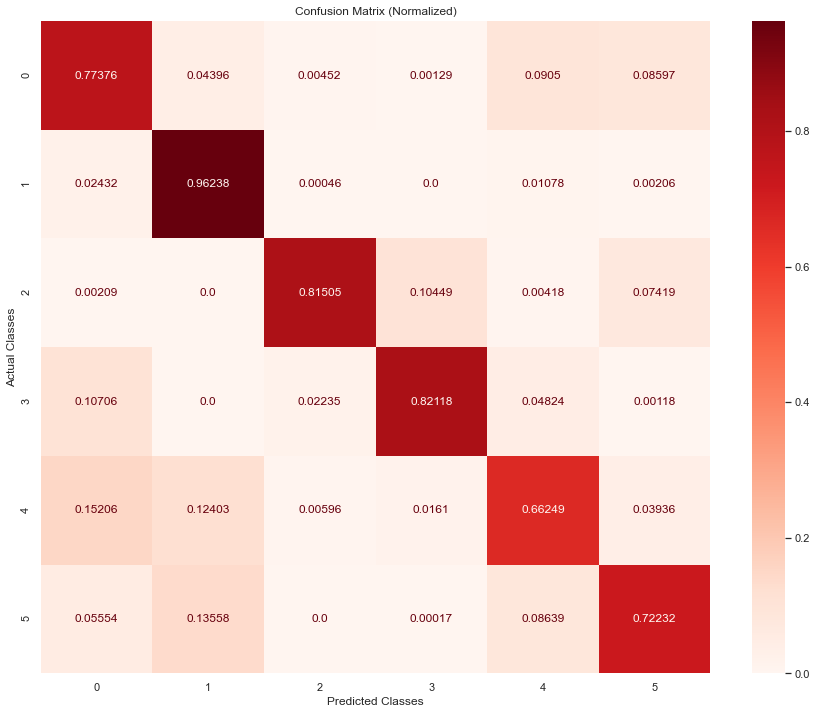

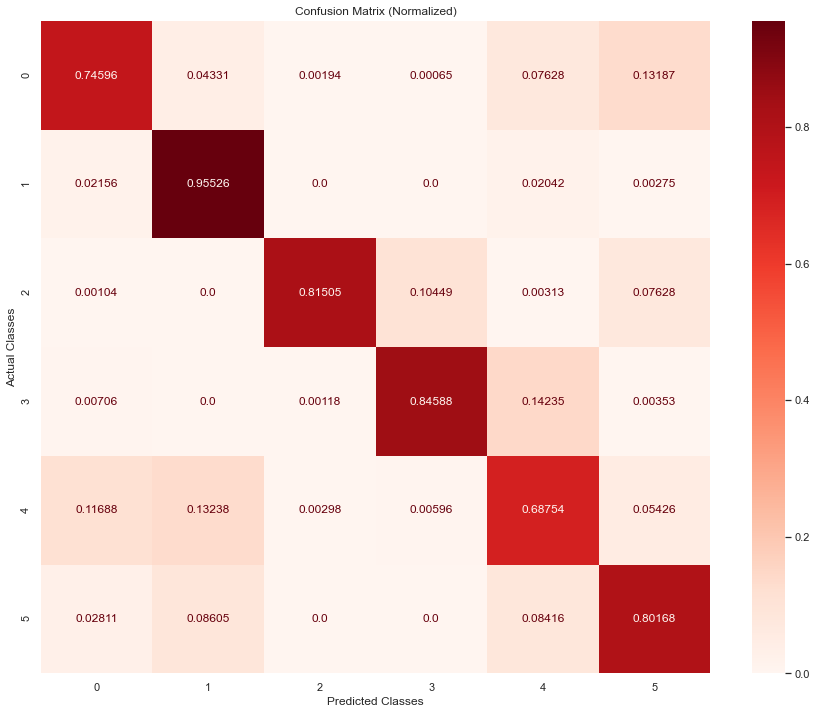

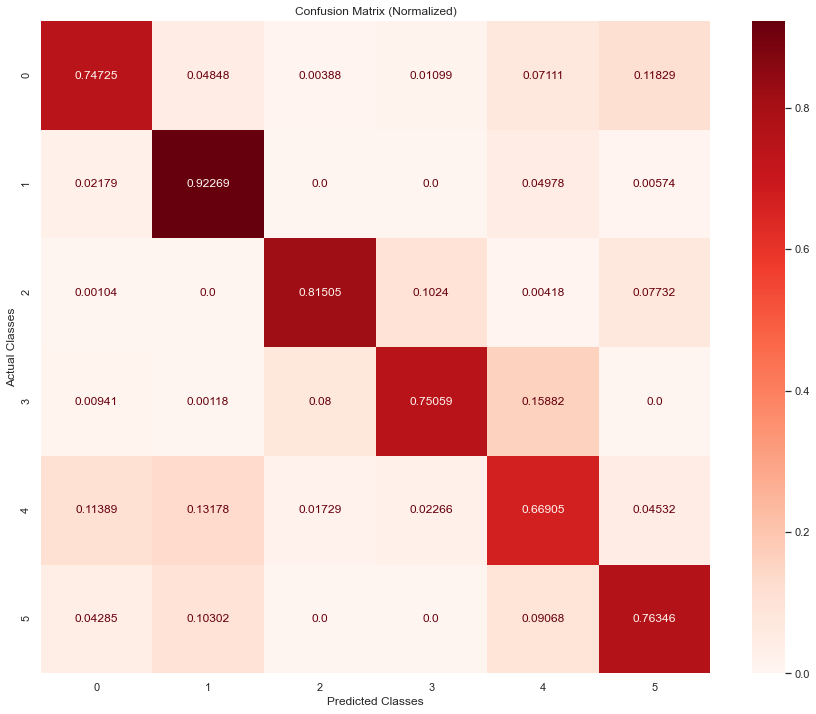

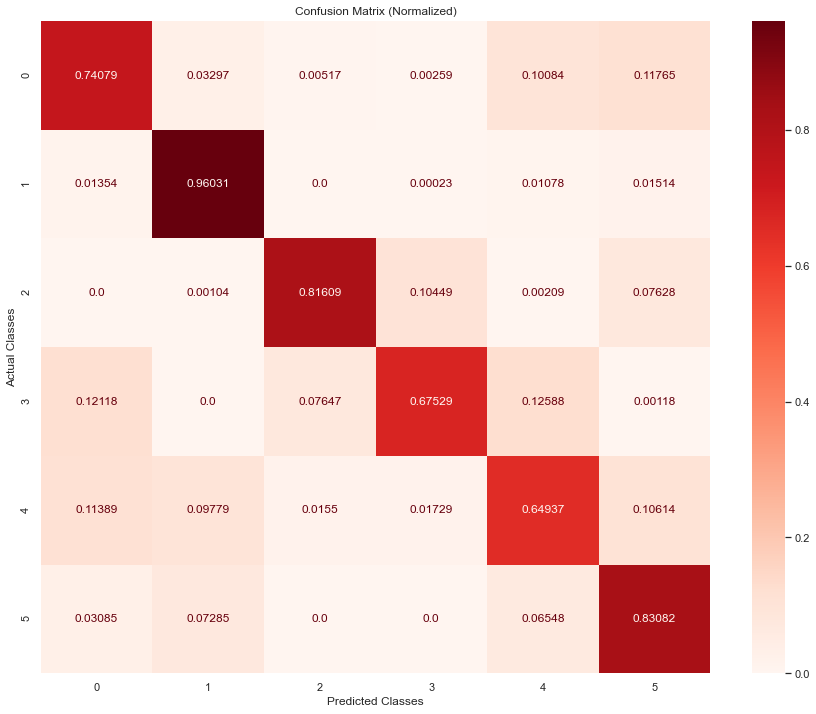

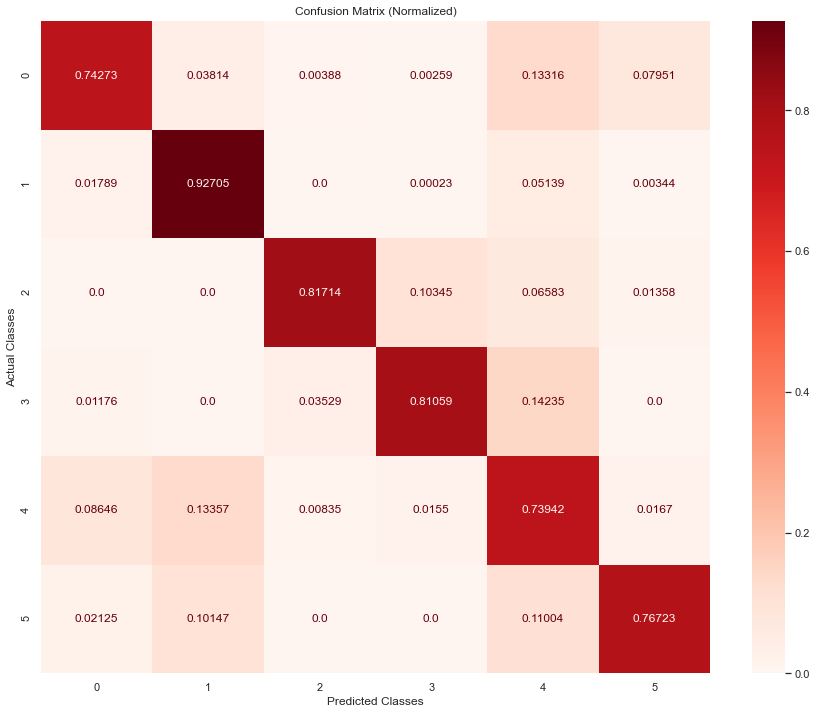

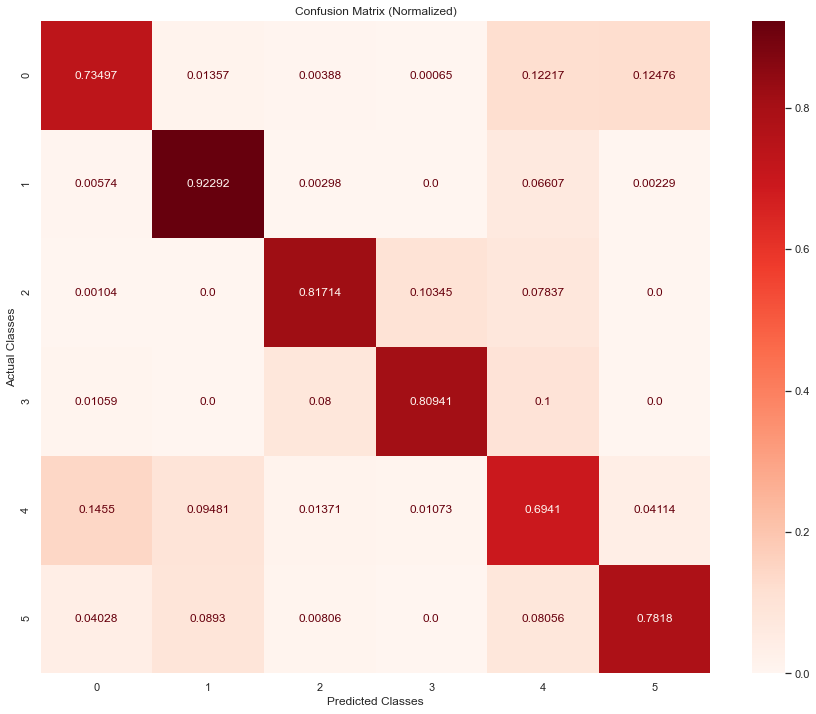

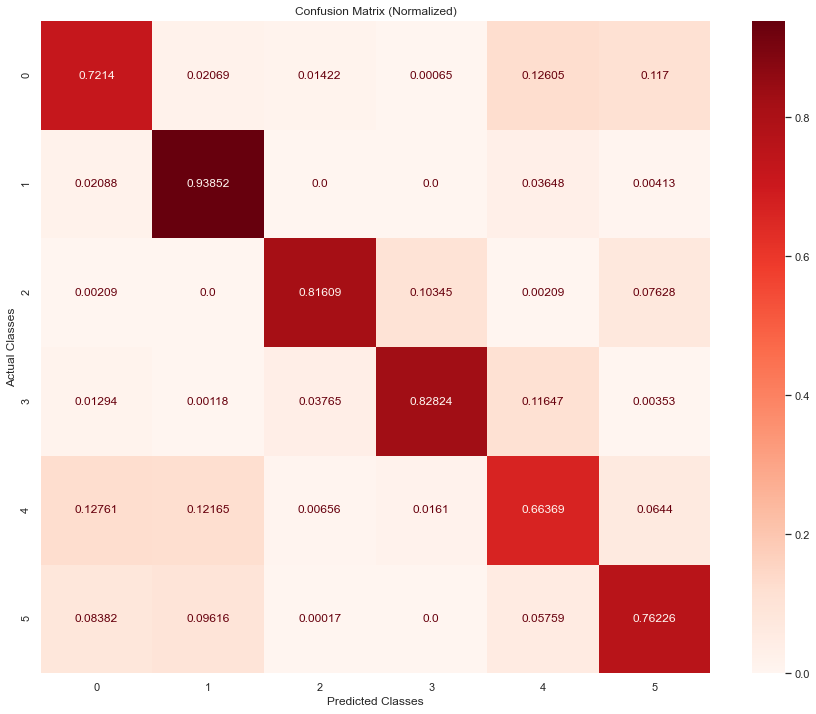

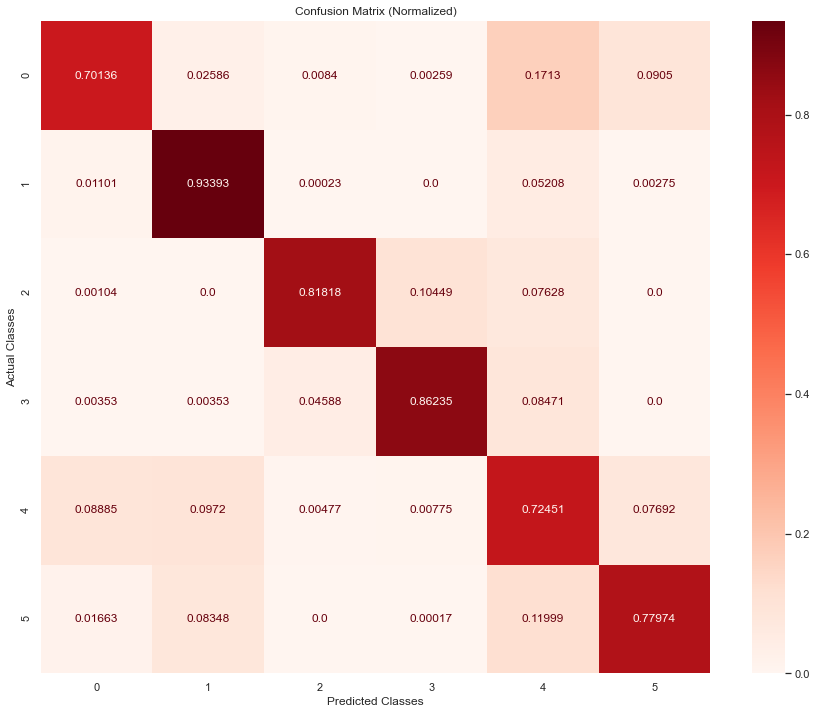

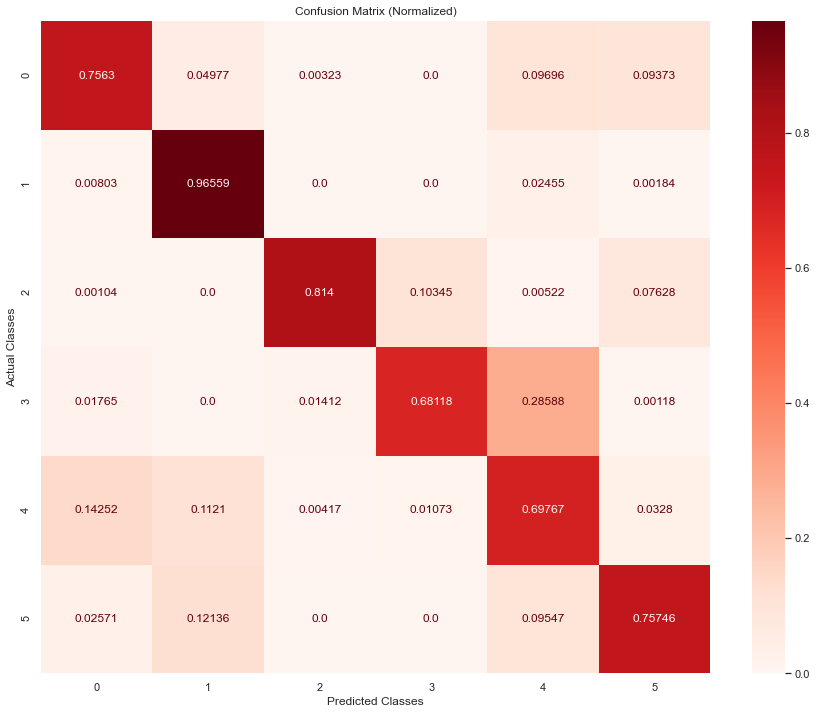

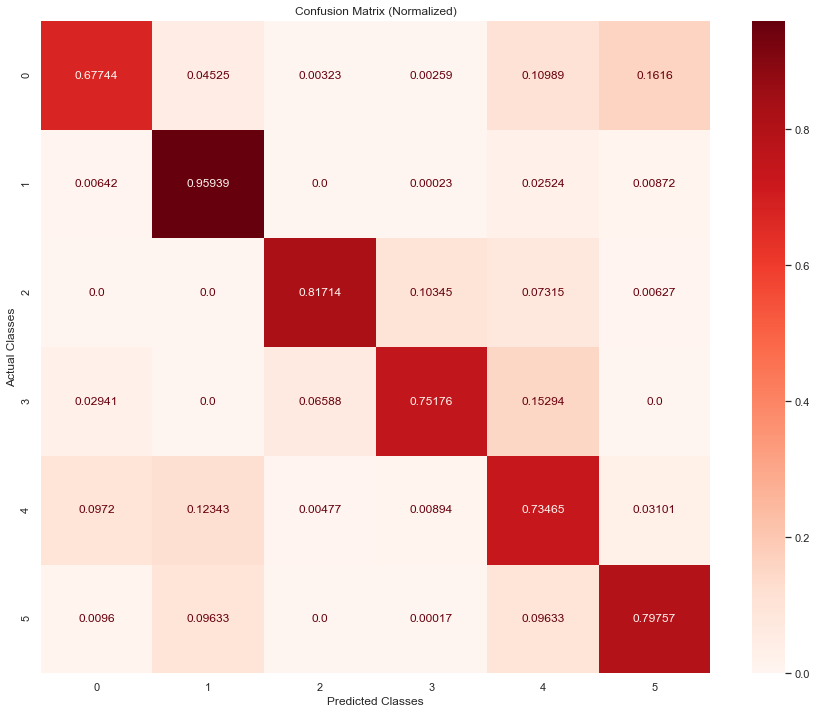

In [100]:
repeat_experiment_dac(model_type="lstm")

Run:  1
original
SPLITTING DATA:
Classify data as either stationary or moving:
(37068, 42, 3)
(37068, 2)
(15224, 42, 3)
(15224, 2)
CNN-LSTM
Epoch 1/10
580/580 [==============================] - 4s 5ms/step - loss: 0.0387 - accuracy: 0.9845 - val_loss: 0.0568 - val_accuracy: 0.9811
Epoch 2/10
580/580 [==============================] - 3s 4ms/step - loss: 0.0071 - accuracy: 0.9983 - val_loss: 0.0352 - val_accuracy: 0.9882
Epoch 3/10
580/580 [==============================] - 3s 4ms/step - loss: 0.0065 - accuracy: 0.9981 - val_loss: 0.0400 - val_accuracy: 0.9886
Epoch 4/10
580/580 [==============================] - 3s 5ms/step - loss: 0.0045 - accuracy: 0.9988 - val_loss: 0.0640 - val_accuracy: 0.9796
Epoch 5/10
580/580 [==============================] - 3s 5ms/step - loss: 0.0046 - accuracy: 0.9988 - val_loss: 0.0609 - val_accuracy: 0.9857
Epoch 6/10
580/580 [==============================] - 3s 4ms/step - loss: 0.0043 - accuracy: 0.9989 - val_loss: 0.0698 - val_accuracy: 0.9825
Epoch 7/

Epoch 47/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0282 - accuracy: 0.9931 - val_loss: 0.9710 - val_accuracy: 0.8594
Epoch 48/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0249 - accuracy: 0.9946 - val_loss: 1.0597 - val_accuracy: 0.8605
Epoch 49/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0246 - accuracy: 0.9946 - val_loss: 0.9157 - val_accuracy: 0.8605
Epoch 50/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0215 - accuracy: 0.9952 - val_loss: 1.0337 - val_accuracy: 0.8550
Epoch 51/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0205 - accuracy: 0.9952 - val_loss: 0.9738 - val_accuracy: 0.8605
Epoch 52/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0220 - accuracy: 0.9943 - val_loss: 0.8789 - val_accuracy: 0.8688
Epoch 53/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0216 - accuracy: 0.9949 - val_loss: 1.0064 - val_accuracy: 0.8611

Epoch 161/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0036 - accuracy: 0.9991 - val_loss: 2.5549 - val_accuracy: 0.8594
Epoch 162/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0123 - accuracy: 0.9973 - val_loss: 2.1622 - val_accuracy: 0.8545
Epoch 163/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0168 - accuracy: 0.9961 - val_loss: 1.9244 - val_accuracy: 0.8655
Epoch 164/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0058 - accuracy: 0.9991 - val_loss: 2.0303 - val_accuracy: 0.8605
Epoch 165/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0060 - accuracy: 0.9985 - val_loss: 2.0845 - val_accuracy: 0.8622
Epoch 166/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0126 - accuracy: 0.9961 - val_loss: 1.9482 - val_accuracy: 0.8534
Epoch 167/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0053 - accuracy: 0.9985 - val_loss: 2.0779 - val_accuracy:

Epoch 218/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0039 - accuracy: 0.9988 - val_loss: 2.5650 - val_accuracy: 0.8567
Epoch 219/5000
53/53 [==============================] - 0s 5ms/step - loss: 9.5525e-04 - accuracy: 0.9997 - val_loss: 2.5520 - val_accuracy: 0.8495
Epoch 220/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0037 - accuracy: 0.9982 - val_loss: 2.6121 - val_accuracy: 0.8556
Epoch 221/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0023 - accuracy: 0.9991 - val_loss: 2.8552 - val_accuracy: 0.8633
Epoch 222/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0044 - accuracy: 0.9991 - val_loss: 2.5147 - val_accuracy: 0.8556
Epoch 223/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0030 - accuracy: 0.9985 - val_loss: 2.6357 - val_accuracy: 0.8556
Epoch 224/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0014 - accuracy: 0.9994 - val_loss: 2.7456 - val_accur

53/53 [==============================] - 0s 5ms/step - loss: 3.8237e-04 - accuracy: 1.0000 - val_loss: 2.6709 - val_accuracy: 0.8572
Epoch 331/5000
53/53 [==============================] - 0s 5ms/step - loss: 7.6814e-04 - accuracy: 0.9997 - val_loss: 2.5992 - val_accuracy: 0.8550
Epoch 332/5000
53/53 [==============================] - 0s 5ms/step - loss: 2.1747e-04 - accuracy: 1.0000 - val_loss: 2.6626 - val_accuracy: 0.8550
Epoch 333/5000
53/53 [==============================] - 0s 5ms/step - loss: 5.0648e-04 - accuracy: 0.9997 - val_loss: 2.8799 - val_accuracy: 0.8506
Epoch 334/5000
53/53 [==============================] - 0s 5ms/step - loss: 2.5073e-04 - accuracy: 1.0000 - val_loss: 2.9037 - val_accuracy: 0.8517
Epoch 335/5000
53/53 [==============================] - 0s 5ms/step - loss: 3.2619e-04 - accuracy: 1.0000 - val_loss: 2.9725 - val_accuracy: 0.8528
Epoch 336/5000
53/53 [==============================] - 0s 5ms/step - loss: 6.7598e-04 - accuracy: 0.9997 - val_loss: 2.9503 - 

53/53 [==============================] - 0s 5ms/step - loss: 1.1652e-04 - accuracy: 1.0000 - val_loss: 2.6310 - val_accuracy: 0.8567
Epoch 387/5000
53/53 [==============================] - 0s 5ms/step - loss: 2.0632e-04 - accuracy: 1.0000 - val_loss: 2.6655 - val_accuracy: 0.8556
Epoch 388/5000
53/53 [==============================] - 0s 5ms/step - loss: 2.0421e-04 - accuracy: 1.0000 - val_loss: 2.6903 - val_accuracy: 0.8561
Epoch 389/5000
53/53 [==============================] - 0s 5ms/step - loss: 3.0537e-04 - accuracy: 1.0000 - val_loss: 2.6853 - val_accuracy: 0.8556
Epoch 390/5000
53/53 [==============================] - 0s 5ms/step - loss: 2.2712e-04 - accuracy: 1.0000 - val_loss: 2.7255 - val_accuracy: 0.8556
Epoch 391/5000
53/53 [==============================] - 0s 5ms/step - loss: 7.7761e-05 - accuracy: 1.0000 - val_loss: 2.7590 - val_accuracy: 0.8561
Epoch 392/5000
53/53 [==============================] - 0s 5ms/step - loss: 5.3892e-05 - accuracy: 1.0000 - val_loss: 2.7779 - 

Epoch 442/5000
53/53 [==============================] - 0s 5ms/step - loss: 3.7315e-05 - accuracy: 1.0000 - val_loss: 2.9705 - val_accuracy: 0.8583
Epoch 443/5000
53/53 [==============================] - 0s 5ms/step - loss: 1.2950e-04 - accuracy: 1.0000 - val_loss: 2.9905 - val_accuracy: 0.8572
Epoch 444/5000
53/53 [==============================] - 0s 5ms/step - loss: 9.3903e-05 - accuracy: 1.0000 - val_loss: 3.0180 - val_accuracy: 0.8567
Epoch 445/5000
53/53 [==============================] - 0s 5ms/step - loss: 1.3362e-04 - accuracy: 1.0000 - val_loss: 3.0328 - val_accuracy: 0.8561
Epoch 446/5000
53/53 [==============================] - 0s 5ms/step - loss: 3.8492e-05 - accuracy: 1.0000 - val_loss: 3.0583 - val_accuracy: 0.8583
Epoch 447/5000
53/53 [==============================] - 0s 5ms/step - loss: 6.0713e-05 - accuracy: 1.0000 - val_loss: 3.0745 - val_accuracy: 0.8561
Epoch 448/5000
53/53 [==============================] - 0s 5ms/step - loss: 2.6703e-05 - accuracy: 1.0000 - val_

Epoch 498/5000
53/53 [==============================] - 0s 5ms/step - loss: 1.0262e-04 - accuracy: 1.0000 - val_loss: 2.6804 - val_accuracy: 0.8594
Epoch 499/5000
53/53 [==============================] - 0s 5ms/step - loss: 2.4471e-05 - accuracy: 1.0000 - val_loss: 2.6986 - val_accuracy: 0.8594
Epoch 500/5000
53/53 [==============================] - 0s 5ms/step - loss: 3.0151e-05 - accuracy: 1.0000 - val_loss: 2.7247 - val_accuracy: 0.8594
Epoch 501/5000
53/53 [==============================] - 0s 5ms/step - loss: 8.0941e-05 - accuracy: 1.0000 - val_loss: 2.7101 - val_accuracy: 0.8594
Epoch 502/5000
53/53 [==============================] - 0s 5ms/step - loss: 9.7729e-05 - accuracy: 1.0000 - val_loss: 2.7321 - val_accuracy: 0.8594
Epoch 503/5000
53/53 [==============================] - 0s 5ms/step - loss: 5.9467e-05 - accuracy: 1.0000 - val_loss: 2.7442 - val_accuracy: 0.8594
Epoch 504/5000
53/53 [==============================] - 0s 5ms/step - loss: 1.4435e-05 - accuracy: 1.0000 - val_

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  2
original
SPLITTING DATA:
Classify data as either stationary or moving:
(37068, 42, 3)
(37068, 2)
(15224, 42, 3)
(15224, 2)
CNN-LSTM
Epoch 1/10
580/580 [==============================] - 4s 5ms/step - loss: 0.0320 - accuracy: 0.9890 - val_loss: 0.0320 - val_accuracy: 0.9895
Epoch 2/10
580/580 [==============================] - 3s 4ms/step - loss: 0.0075 - accuracy: 0.9983 - val_loss: 0.0579 - val_accuracy: 0.9847
Epoch 3/10
580/580 [==============================] - 3s 4ms/step - loss: 0.0060 - accuracy: 0.9984 - val_loss: 0.0861 - val_accuracy: 0.9744
Epoch 4/10
580/580 [==============================] - 3s 4ms/step - loss: 0.0057 - accuracy: 0.9984 - val_loss: 0.0897 - val_accuracy: 0.9805
Epoch 5/10
580/580 [==============================] - 3s 4ms/step - loss: 0.0043 - accuracy: 0.9988 - val_loss: 0.0845 - val_accuracy: 0.9853
Epoch 6/10
580/580 [==============================] - 3s 4ms/step - loss: 0.0048 - accuracy: 0.9987 - val_loss: 0.1161 - val_accuracy: 0.9802
Epoch 7/

Epoch 47/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0410 - accuracy: 0.9916 - val_loss: 1.0137 - val_accuracy: 0.8792
Epoch 48/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0378 - accuracy: 0.9928 - val_loss: 0.9286 - val_accuracy: 0.8798
Epoch 49/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0382 - accuracy: 0.9925 - val_loss: 0.9375 - val_accuracy: 0.8804
Epoch 50/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0375 - accuracy: 0.9928 - val_loss: 1.0651 - val_accuracy: 0.8804
Epoch 51/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0382 - accuracy: 0.9928 - val_loss: 1.0547 - val_accuracy: 0.8662
Epoch 52/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0386 - accuracy: 0.9928 - val_loss: 1.0095 - val_accuracy: 0.8792
Epoch 53/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0349 - accuracy: 0.9931 - val_loss: 1.0446 - val_accuracy: 0.8751

Epoch 161/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0085 - accuracy: 0.9976 - val_loss: 1.5549 - val_accuracy: 0.8769
Epoch 162/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0095 - accuracy: 0.9982 - val_loss: 1.4543 - val_accuracy: 0.8697
Epoch 163/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0077 - accuracy: 0.9979 - val_loss: 1.5037 - val_accuracy: 0.8792
Epoch 164/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0120 - accuracy: 0.9970 - val_loss: 1.5440 - val_accuracy: 0.8804
Epoch 165/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0080 - accuracy: 0.9982 - val_loss: 1.4280 - val_accuracy: 0.8786
Epoch 166/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0089 - accuracy: 0.9976 - val_loss: 1.6090 - val_accuracy: 0.8792
Epoch 167/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0094 - accuracy: 0.9970 - val_loss: 1.7461 - val_accuracy:

Epoch 218/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0036 - accuracy: 0.9994 - val_loss: 1.6013 - val_accuracy: 0.8780
Epoch 219/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0044 - accuracy: 0.9988 - val_loss: 1.6980 - val_accuracy: 0.8775
Epoch 220/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0043 - accuracy: 0.9985 - val_loss: 1.7394 - val_accuracy: 0.8679
Epoch 221/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0043 - accuracy: 0.9985 - val_loss: 1.5918 - val_accuracy: 0.8751
Epoch 222/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0032 - accuracy: 0.9994 - val_loss: 1.8194 - val_accuracy: 0.8751
Epoch 223/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0023 - accuracy: 0.9991 - val_loss: 1.6816 - val_accuracy: 0.8804
Epoch 224/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0022 - accuracy: 0.9991 - val_loss: 1.5428 - val_accuracy:

Epoch 275/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.9994 - val_loss: 1.6908 - val_accuracy: 0.8923
Epoch 276/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0023 - accuracy: 0.9994 - val_loss: 1.5712 - val_accuracy: 0.8941
Epoch 277/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0108 - accuracy: 0.9976 - val_loss: 1.6105 - val_accuracy: 0.8745
Epoch 278/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0122 - accuracy: 0.9964 - val_loss: 1.7168 - val_accuracy: 0.8888
Epoch 279/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0049 - accuracy: 0.9985 - val_loss: 1.5964 - val_accuracy: 0.8917
Epoch 280/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0021 - accuracy: 0.9997 - val_loss: 1.7460 - val_accuracy: 0.8894
Epoch 281/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0062 - accuracy: 0.9982 - val_loss: 1.6672 - val_accuracy:

53/53 [==============================] - 0s 5ms/step - loss: 0.0011 - accuracy: 0.9994 - val_loss: 1.8759 - val_accuracy: 0.8935
Epoch 388/5000
53/53 [==============================] - 0s 5ms/step - loss: 1.5615e-04 - accuracy: 1.0000 - val_loss: 1.9551 - val_accuracy: 0.8929
Epoch 389/5000
53/53 [==============================] - 0s 5ms/step - loss: 8.6507e-05 - accuracy: 1.0000 - val_loss: 1.9737 - val_accuracy: 0.8929
Epoch 390/5000
53/53 [==============================] - 0s 5ms/step - loss: 4.7004e-04 - accuracy: 0.9997 - val_loss: 2.0001 - val_accuracy: 0.8929
Epoch 391/5000
53/53 [==============================] - 0s 5ms/step - loss: 1.6284e-04 - accuracy: 1.0000 - val_loss: 1.9760 - val_accuracy: 0.8935
Epoch 392/5000
53/53 [==============================] - 0s 5ms/step - loss: 1.1028e-04 - accuracy: 1.0000 - val_loss: 1.9757 - val_accuracy: 0.8935
Epoch 393/5000
53/53 [==============================] - 0s 5ms/step - loss: 3.2420e-04 - accuracy: 1.0000 - val_loss: 1.9637 - val_

Epoch 443/5000
53/53 [==============================] - 0s 5ms/step - loss: 1.1814e-04 - accuracy: 1.0000 - val_loss: 2.3615 - val_accuracy: 0.8792
Epoch 444/5000
53/53 [==============================] - 0s 5ms/step - loss: 1.1056e-04 - accuracy: 1.0000 - val_loss: 2.3373 - val_accuracy: 0.8792
Epoch 445/5000
53/53 [==============================] - 0s 5ms/step - loss: 3.0122e-05 - accuracy: 1.0000 - val_loss: 2.3333 - val_accuracy: 0.8786
Epoch 446/5000
53/53 [==============================] - 0s 5ms/step - loss: 6.0832e-05 - accuracy: 1.0000 - val_loss: 2.3643 - val_accuracy: 0.8792
Epoch 447/5000
53/53 [==============================] - 0s 5ms/step - loss: 5.0662e-05 - accuracy: 1.0000 - val_loss: 2.4323 - val_accuracy: 0.8798
Epoch 448/5000
53/53 [==============================] - 0s 5ms/step - loss: 6.4968e-04 - accuracy: 0.9997 - val_loss: 2.3317 - val_accuracy: 0.8757
Epoch 449/5000
53/53 [==============================] - 0s 5ms/step - loss: 9.4881e-05 - accuracy: 1.0000 - val_

Epoch 499/5000
53/53 [==============================] - 0s 5ms/step - loss: 2.6060e-04 - accuracy: 1.0000 - val_loss: 2.0962 - val_accuracy: 0.8769
Epoch 500/5000
53/53 [==============================] - 0s 5ms/step - loss: 9.0003e-05 - accuracy: 1.0000 - val_loss: 2.0886 - val_accuracy: 0.8775
Epoch 501/5000
53/53 [==============================] - 0s 5ms/step - loss: 2.6490e-04 - accuracy: 1.0000 - val_loss: 2.1006 - val_accuracy: 0.8769
Epoch 502/5000
53/53 [==============================] - 0s 5ms/step - loss: 1.1263e-04 - accuracy: 1.0000 - val_loss: 2.1203 - val_accuracy: 0.8769
Epoch 503/5000
53/53 [==============================] - 0s 5ms/step - loss: 3.3148e-04 - accuracy: 1.0000 - val_loss: 2.2508 - val_accuracy: 0.8769
Epoch 504/5000
53/53 [==============================] - 0s 5ms/step - loss: 4.2098e-04 - accuracy: 0.9997 - val_loss: 2.1758 - val_accuracy: 0.8769
Epoch 505/5000
53/53 [==============================] - 0s 5ms/step - loss: 1.7672e-04 - accuracy: 1.0000 - val_

Epoch 43/5000
527/527 [==============================] - 2s 4ms/step - loss: 0.0370 - accuracy: 0.9872 - val_loss: 1.5006 - val_accuracy: 0.8173
Epoch 44/5000
527/527 [==============================] - 2s 4ms/step - loss: 0.0364 - accuracy: 0.9873 - val_loss: 1.6472 - val_accuracy: 0.7845
Epoch 45/5000
527/527 [==============================] - 2s 4ms/step - loss: 0.0352 - accuracy: 0.9877 - val_loss: 1.6598 - val_accuracy: 0.8027
Epoch 46/5000
527/527 [==============================] - 2s 5ms/step - loss: 0.0328 - accuracy: 0.9884 - val_loss: 1.6344 - val_accuracy: 0.8064
Epoch 47/5000
527/527 [==============================] - 2s 5ms/step - loss: 0.0332 - accuracy: 0.9879 - val_loss: 1.7497 - val_accuracy: 0.7987
Epoch 48/5000
527/527 [==============================] - 2s 4ms/step - loss: 0.0336 - accuracy: 0.9884 - val_loss: 1.6164 - val_accuracy: 0.8063
Epoch 49/5000
527/527 [==============================] - 2s 4ms/step - loss: 0.0291 - accuracy: 0.9900 - val_loss: 1.6239 - val_ac

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  3
original
SPLITTING DATA:
Classify data as either stationary or moving:
(37068, 42, 3)
(37068, 2)
(15224, 42, 3)
(15224, 2)
CNN-LSTM
Epoch 1/10
580/580 [==============================] - 4s 5ms/step - loss: 0.0356 - accuracy: 0.9868 - val_loss: 0.0409 - val_accuracy: 0.9838
Epoch 2/10
580/580 [==============================] - 3s 5ms/step - loss: 0.0083 - accuracy: 0.9978 - val_loss: 0.0357 - val_accuracy: 0.9873
Epoch 3/10
580/580 [==============================] - 3s 5ms/step - loss: 0.0057 - accuracy: 0.9985 - val_loss: 0.0422 - val_accuracy: 0.9869
Epoch 4/10
580/580 [==============================] - 3s 5ms/step - loss: 0.0059 - accuracy: 0.9982 - val_loss: 0.0594 - val_accuracy: 0.9831
Epoch 5/10
580/580 [==============================] - 3s 5ms/step - loss: 0.0045 - accuracy: 0.9987 - val_loss: 0.0550 - val_accuracy: 0.9875
Epoch 6/10
580/580 [==============================] - 3s 5ms/step - loss: 0.0041 - accuracy: 0.9989 - val_loss: 0.0531 - val_accuracy: 0.9872
Epoch 7/

Epoch 47/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0302 - accuracy: 0.9919 - val_loss: 0.8698 - val_accuracy: 0.8577
Epoch 48/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0252 - accuracy: 0.9922 - val_loss: 0.9040 - val_accuracy: 0.8649
Epoch 49/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0276 - accuracy: 0.9937 - val_loss: 0.8307 - val_accuracy: 0.8494
Epoch 50/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0268 - accuracy: 0.9934 - val_loss: 0.7620 - val_accuracy: 0.8899
Epoch 51/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0311 - accuracy: 0.9934 - val_loss: 0.8355 - val_accuracy: 0.8894
Epoch 52/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0257 - accuracy: 0.9937 - val_loss: 0.8356 - val_accuracy: 0.8888
Epoch 53/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0254 - accuracy: 0.9949 - val_loss: 1.1355 - val_accuracy: 0.8788

Epoch 161/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0072 - accuracy: 0.9985 - val_loss: 1.7953 - val_accuracy: 0.8766
Epoch 162/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0083 - accuracy: 0.9985 - val_loss: 1.9672 - val_accuracy: 0.8777
Epoch 163/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0088 - accuracy: 0.9985 - val_loss: 1.9122 - val_accuracy: 0.8766
Epoch 164/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0081 - accuracy: 0.9979 - val_loss: 1.7255 - val_accuracy: 0.8766
Epoch 165/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0065 - accuracy: 0.9985 - val_loss: 1.7251 - val_accuracy: 0.8805
Epoch 166/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0067 - accuracy: 0.9982 - val_loss: 1.6954 - val_accuracy: 0.8760
Epoch 167/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0073 - accuracy: 0.9979 - val_loss: 1.8308 - val_accuracy:

Epoch 218/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0063 - accuracy: 0.9982 - val_loss: 1.8217 - val_accuracy: 0.8838
Epoch 219/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0049 - accuracy: 0.9988 - val_loss: 1.8697 - val_accuracy: 0.8822
Epoch 220/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0045 - accuracy: 0.9988 - val_loss: 1.9673 - val_accuracy: 0.8849
Epoch 221/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0035 - accuracy: 0.9985 - val_loss: 1.9529 - val_accuracy: 0.8838
Epoch 222/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0043 - accuracy: 0.9991 - val_loss: 1.9642 - val_accuracy: 0.8844
Epoch 223/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0034 - accuracy: 0.9988 - val_loss: 1.9403 - val_accuracy: 0.8844
Epoch 224/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0029 - accuracy: 0.9991 - val_loss: 2.0282 - val_accuracy:

Epoch 275/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0036 - accuracy: 0.9988 - val_loss: 2.0533 - val_accuracy: 0.8844
Epoch 276/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0050 - accuracy: 0.9988 - val_loss: 2.0122 - val_accuracy: 0.8855
Epoch 277/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0059 - accuracy: 0.9979 - val_loss: 1.9184 - val_accuracy: 0.8877
Epoch 278/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0045 - accuracy: 0.9979 - val_loss: 2.1271 - val_accuracy: 0.8894
Epoch 279/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0164 - accuracy: 0.9979 - val_loss: 1.8440 - val_accuracy: 0.8883
Epoch 280/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0065 - accuracy: 0.9982 - val_loss: 1.6774 - val_accuracy: 0.8899
Epoch 281/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0021 - accuracy: 0.9994 - val_loss: 1.9396 - val_accuracy:

53/53 [==============================] - 0s 5ms/step - loss: 7.7248e-04 - accuracy: 0.9997 - val_loss: 2.0992 - val_accuracy: 0.8927
Epoch 388/5000
53/53 [==============================] - 0s 5ms/step - loss: 6.3511e-04 - accuracy: 0.9997 - val_loss: 2.1787 - val_accuracy: 0.8883
Epoch 389/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0014 - accuracy: 0.9997 - val_loss: 2.1241 - val_accuracy: 0.8888
Epoch 390/5000
53/53 [==============================] - 0s 5ms/step - loss: 1.0402e-04 - accuracy: 1.0000 - val_loss: 2.1588 - val_accuracy: 0.8899
Epoch 391/5000
53/53 [==============================] - 0s 5ms/step - loss: 6.3000e-04 - accuracy: 0.9997 - val_loss: 2.1180 - val_accuracy: 0.8911
Epoch 392/5000
53/53 [==============================] - 0s 5ms/step - loss: 9.3313e-04 - accuracy: 0.9994 - val_loss: 2.1975 - val_accuracy: 0.8911
Epoch 393/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0015 - accuracy: 0.9997 - val_loss: 2.1571 - val_accu

53/53 [==============================] - 0s 5ms/step - loss: 1.2127e-04 - accuracy: 1.0000 - val_loss: 2.4128 - val_accuracy: 0.8733
Epoch 444/5000
53/53 [==============================] - 0s 5ms/step - loss: 3.4323e-04 - accuracy: 0.9997 - val_loss: 2.4335 - val_accuracy: 0.8733
Epoch 445/5000
53/53 [==============================] - 0s 5ms/step - loss: 3.7447e-05 - accuracy: 1.0000 - val_loss: 2.5066 - val_accuracy: 0.8727
Epoch 446/5000
53/53 [==============================] - 0s 5ms/step - loss: 5.7961e-05 - accuracy: 1.0000 - val_loss: 2.5524 - val_accuracy: 0.8722
Epoch 447/5000
53/53 [==============================] - 0s 5ms/step - loss: 3.9795e-05 - accuracy: 1.0000 - val_loss: 2.5729 - val_accuracy: 0.8727
Epoch 448/5000
53/53 [==============================] - 0s 5ms/step - loss: 4.3535e-05 - accuracy: 1.0000 - val_loss: 2.5827 - val_accuracy: 0.8727
Epoch 449/5000
53/53 [==============================] - 0s 5ms/step - loss: 1.9392e-05 - accuracy: 1.0000 - val_loss: 2.6136 - 

527/527 [==============================] - 2s 4ms/step - loss: 0.0367 - accuracy: 0.9875 - val_loss: 1.4434 - val_accuracy: 0.7983
Epoch 41/5000
527/527 [==============================] - 2s 4ms/step - loss: 0.0345 - accuracy: 0.9878 - val_loss: 1.5692 - val_accuracy: 0.8116
Epoch 42/5000
527/527 [==============================] - 2s 4ms/step - loss: 0.0343 - accuracy: 0.9883 - val_loss: 1.5153 - val_accuracy: 0.8018
Epoch 43/5000
527/527 [==============================] - 2s 4ms/step - loss: 0.0356 - accuracy: 0.9871 - val_loss: 1.5254 - val_accuracy: 0.8155
Epoch 44/5000
527/527 [==============================] - 2s 4ms/step - loss: 0.0346 - accuracy: 0.9883 - val_loss: 1.5255 - val_accuracy: 0.8188
Epoch 45/5000
527/527 [==============================] - 2s 4ms/step - loss: 0.0323 - accuracy: 0.9886 - val_loss: 1.4560 - val_accuracy: 0.8205
Epoch 46/5000
527/527 [==============================] - 2s 4ms/step - loss: 0.0317 - accuracy: 0.9890 - val_loss: 1.4188 - val_accuracy: 0.8216

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  4
original
SPLITTING DATA:
Classify data as either stationary or moving:
(37068, 42, 3)
(37068, 2)
(15224, 42, 3)
(15224, 2)
CNN-LSTM
Epoch 1/10
580/580 [==============================] - 4s 5ms/step - loss: 0.0343 - accuracy: 0.9881 - val_loss: 0.0600 - val_accuracy: 0.9783
Epoch 2/10
580/580 [==============================] - 3s 4ms/step - loss: 0.0074 - accuracy: 0.9982 - val_loss: 0.0343 - val_accuracy: 0.9905
Epoch 3/10
580/580 [==============================] - 3s 4ms/step - loss: 0.0061 - accuracy: 0.9984 - val_loss: 0.0670 - val_accuracy: 0.9832
Epoch 4/10
580/580 [==============================] - 3s 5ms/step - loss: 0.0057 - accuracy: 0.9981 - val_loss: 0.0480 - val_accuracy: 0.9878
Epoch 5/10
580/580 [==============================] - 3s 5ms/step - loss: 0.0043 - accuracy: 0.9986 - val_loss: 0.0774 - val_accuracy: 0.9830
Epoch 6/10
580/580 [==============================] - 3s 4ms/step - loss: 0.0035 - accuracy: 0.9990 - val_loss: 0.0707 - val_accuracy: 0.9869
Epoch 7/

Epoch 47/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0439 - accuracy: 0.9901 - val_loss: 0.7675 - val_accuracy: 0.8744
Epoch 48/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0423 - accuracy: 0.9898 - val_loss: 0.8354 - val_accuracy: 0.8660
Epoch 49/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0392 - accuracy: 0.9901 - val_loss: 0.8359 - val_accuracy: 0.8358
Epoch 50/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0381 - accuracy: 0.9913 - val_loss: 0.8972 - val_accuracy: 0.8459
Epoch 51/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0364 - accuracy: 0.9916 - val_loss: 0.8173 - val_accuracy: 0.8364
Epoch 52/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0442 - accuracy: 0.9892 - val_loss: 0.9635 - val_accuracy: 0.8649
Epoch 53/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0355 - accuracy: 0.9901 - val_loss: 0.8741 - val_accuracy: 0.8649

Epoch 161/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0123 - accuracy: 0.9970 - val_loss: 1.3611 - val_accuracy: 0.8733
Epoch 162/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0106 - accuracy: 0.9979 - val_loss: 1.4169 - val_accuracy: 0.8738
Epoch 163/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0103 - accuracy: 0.9979 - val_loss: 1.3956 - val_accuracy: 0.8738
Epoch 164/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0101 - accuracy: 0.9973 - val_loss: 1.4518 - val_accuracy: 0.8721
Epoch 165/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0097 - accuracy: 0.9976 - val_loss: 1.5987 - val_accuracy: 0.8738
Epoch 166/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0111 - accuracy: 0.9973 - val_loss: 1.5083 - val_accuracy: 0.8727
Epoch 167/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0088 - accuracy: 0.9976 - val_loss: 1.5894 - val_accuracy:

Epoch 218/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0035 - accuracy: 0.9988 - val_loss: 1.8408 - val_accuracy: 0.8727
Epoch 219/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0055 - accuracy: 0.9982 - val_loss: 1.9935 - val_accuracy: 0.8738
Epoch 220/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0042 - accuracy: 0.9988 - val_loss: 1.9172 - val_accuracy: 0.8721
Epoch 221/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0025 - accuracy: 0.9994 - val_loss: 2.0334 - val_accuracy: 0.8705
Epoch 222/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0047 - accuracy: 0.9988 - val_loss: 2.0561 - val_accuracy: 0.8727
Epoch 223/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0037 - accuracy: 0.9988 - val_loss: 2.1089 - val_accuracy: 0.8755
Epoch 224/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0095 - accuracy: 0.9976 - val_loss: 2.0614 - val_accuracy:

Epoch 275/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0020 - accuracy: 0.9991 - val_loss: 1.9745 - val_accuracy: 0.8733
Epoch 276/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0047 - accuracy: 0.9985 - val_loss: 1.8399 - val_accuracy: 0.8744
Epoch 277/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0046 - accuracy: 0.9988 - val_loss: 1.9750 - val_accuracy: 0.8733
Epoch 278/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0033 - accuracy: 0.9994 - val_loss: 1.8308 - val_accuracy: 0.8755
Epoch 279/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0025 - accuracy: 0.9991 - val_loss: 2.1482 - val_accuracy: 0.8749
Epoch 280/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0029 - accuracy: 0.9988 - val_loss: 2.1624 - val_accuracy: 0.8738
Epoch 281/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0020 - accuracy: 0.9991 - val_loss: 2.0607 - val_accuracy:

53/53 [==============================] - 0s 5ms/step - loss: 0.0026 - accuracy: 0.9991 - val_loss: 2.2633 - val_accuracy: 0.8738
Epoch 388/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0026 - accuracy: 0.9991 - val_loss: 2.0953 - val_accuracy: 0.8755
Epoch 389/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0023 - accuracy: 0.9991 - val_loss: 2.0754 - val_accuracy: 0.8755
Epoch 390/5000
53/53 [==============================] - 0s 5ms/step - loss: 7.7555e-04 - accuracy: 0.9997 - val_loss: 2.2261 - val_accuracy: 0.8749
Epoch 391/5000
53/53 [==============================] - 0s 5ms/step - loss: 5.2379e-04 - accuracy: 0.9997 - val_loss: 2.2315 - val_accuracy: 0.8749
Epoch 392/5000
53/53 [==============================] - 0s 5ms/step - loss: 1.2263e-04 - accuracy: 1.0000 - val_loss: 2.2758 - val_accuracy: 0.8749
Epoch 393/5000
53/53 [==============================] - 0s 5ms/step - loss: 7.7107e-04 - accuracy: 0.9994 - val_loss: 2.2613 - val_accuracy

53/53 [==============================] - 0s 5ms/step - loss: 8.3210e-05 - accuracy: 1.0000 - val_loss: 2.0430 - val_accuracy: 0.8749
Epoch 500/5000
53/53 [==============================] - 0s 5ms/step - loss: 1.0564e-04 - accuracy: 1.0000 - val_loss: 2.0657 - val_accuracy: 0.8755
Epoch 501/5000
53/53 [==============================] - 0s 5ms/step - loss: 3.7608e-04 - accuracy: 0.9997 - val_loss: 2.0498 - val_accuracy: 0.8744
Epoch 502/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0010 - accuracy: 0.9994 - val_loss: 2.0747 - val_accuracy: 0.8738
Epoch 503/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.9997 - val_loss: 2.0152 - val_accuracy: 0.8733
Epoch 504/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0034 - accuracy: 0.9991 - val_loss: 1.9062 - val_accuracy: 0.8738
Epoch 505/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.9994 - val_loss: 1.9095 - val_accuracy: 0.

Epoch 30/5000
528/528 [==============================] - 2s 4ms/step - loss: 0.0552 - accuracy: 0.9817 - val_loss: 1.2722 - val_accuracy: 0.7925
Epoch 31/5000
528/528 [==============================] - 2s 5ms/step - loss: 0.0518 - accuracy: 0.9822 - val_loss: 1.5113 - val_accuracy: 0.7967
Epoch 32/5000
528/528 [==============================] - 2s 5ms/step - loss: 0.0505 - accuracy: 0.9822 - val_loss: 1.2414 - val_accuracy: 0.8157
Epoch 33/5000
528/528 [==============================] - 2s 5ms/step - loss: 0.0481 - accuracy: 0.9837 - val_loss: 1.5176 - val_accuracy: 0.8003
Epoch 34/5000
528/528 [==============================] - 2s 5ms/step - loss: 0.0499 - accuracy: 0.9822 - val_loss: 1.3846 - val_accuracy: 0.8161
Epoch 35/5000
528/528 [==============================] - 2s 5ms/step - loss: 0.0468 - accuracy: 0.9832 - val_loss: 1.7205 - val_accuracy: 0.7863
Epoch 36/5000
528/528 [==============================] - 2s 5ms/step - loss: 0.0477 - accuracy: 0.9836 - val_loss: 1.6715 - val_ac

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  5
original
SPLITTING DATA:
Classify data as either stationary or moving:
(37068, 42, 3)
(37068, 2)
(15224, 42, 3)
(15224, 2)
CNN-LSTM
Epoch 1/10
580/580 [==============================] - 4s 5ms/step - loss: 0.0383 - accuracy: 0.9856 - val_loss: 0.0501 - val_accuracy: 0.9826
Epoch 2/10
580/580 [==============================] - 3s 4ms/step - loss: 0.0074 - accuracy: 0.9982 - val_loss: 0.0465 - val_accuracy: 0.9855
Epoch 3/10
580/580 [==============================] - 3s 5ms/step - loss: 0.0062 - accuracy: 0.9982 - val_loss: 0.0532 - val_accuracy: 0.9855
Epoch 4/10
580/580 [==============================] - 3s 5ms/step - loss: 0.0062 - accuracy: 0.9982 - val_loss: 0.0741 - val_accuracy: 0.9784
Epoch 5/10
580/580 [==============================] - 3s 4ms/step - loss: 0.0052 - accuracy: 0.9985 - val_loss: 0.0229 - val_accuracy: 0.9894
Epoch 6/10
580/580 [==============================] - 3s 4ms/step - loss: 0.0041 - accuracy: 0.9990 - val_loss: 0.0650 - val_accuracy: 0.9815
Epoch 7/

Epoch 47/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0312 - accuracy: 0.9935 - val_loss: 0.6485 - val_accuracy: 0.8860
Epoch 48/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0298 - accuracy: 0.9938 - val_loss: 0.7374 - val_accuracy: 0.8890
Epoch 49/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0292 - accuracy: 0.9941 - val_loss: 0.6717 - val_accuracy: 0.8789
Epoch 50/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0326 - accuracy: 0.9929 - val_loss: 0.6576 - val_accuracy: 0.8937
Epoch 51/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0348 - accuracy: 0.9929 - val_loss: 0.6479 - val_accuracy: 0.8943
Epoch 52/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0359 - accuracy: 0.9932 - val_loss: 0.6428 - val_accuracy: 0.8949
Epoch 53/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0328 - accuracy: 0.9929 - val_loss: 0.6760 - val_accuracy: 0.8919

Epoch 161/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0047 - accuracy: 0.9988 - val_loss: 1.4859 - val_accuracy: 0.8890
Epoch 162/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0039 - accuracy: 0.9991 - val_loss: 1.4491 - val_accuracy: 0.8866
Epoch 163/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0037 - accuracy: 0.9991 - val_loss: 1.4630 - val_accuracy: 0.8878
Epoch 164/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0032 - accuracy: 0.9994 - val_loss: 1.4690 - val_accuracy: 0.8830
Epoch 165/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0043 - accuracy: 0.9979 - val_loss: 1.5375 - val_accuracy: 0.8836
Epoch 166/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0084 - accuracy: 0.9976 - val_loss: 1.4447 - val_accuracy: 0.8866
Epoch 167/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0041 - accuracy: 0.9988 - val_loss: 1.5499 - val_accuracy:

Epoch 218/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0014 - accuracy: 0.9994 - val_loss: 1.6875 - val_accuracy: 0.8895
Epoch 219/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0018 - accuracy: 0.9994 - val_loss: 1.6505 - val_accuracy: 0.8890
Epoch 220/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0039 - accuracy: 0.9988 - val_loss: 1.6845 - val_accuracy: 0.8878
Epoch 221/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0040 - accuracy: 0.9988 - val_loss: 1.6719 - val_accuracy: 0.8878
Epoch 222/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0040 - accuracy: 0.9988 - val_loss: 1.8891 - val_accuracy: 0.8895
Epoch 223/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0080 - accuracy: 0.9982 - val_loss: 1.8025 - val_accuracy: 0.8622
Epoch 224/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0051 - accuracy: 0.9982 - val_loss: 1.7136 - val_accuracy:

53/53 [==============================] - 0s 5ms/step - loss: 0.0109 - accuracy: 0.9976 - val_loss: 1.9417 - val_accuracy: 0.8895
Epoch 331/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0054 - accuracy: 0.9982 - val_loss: 1.6721 - val_accuracy: 0.8913
Epoch 332/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0019 - accuracy: 0.9997 - val_loss: 1.8079 - val_accuracy: 0.8919
Epoch 333/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0028 - accuracy: 0.9991 - val_loss: 1.7308 - val_accuracy: 0.8913
Epoch 334/5000
53/53 [==============================] - 0s 5ms/step - loss: 4.5318e-04 - accuracy: 1.0000 - val_loss: 1.8034 - val_accuracy: 0.8913
Epoch 335/5000
53/53 [==============================] - 0s 5ms/step - loss: 5.7279e-04 - accuracy: 1.0000 - val_loss: 1.8729 - val_accuracy: 0.8913
Epoch 336/5000
53/53 [==============================] - 0s 5ms/step - loss: 4.0312e-04 - accuracy: 0.9997 - val_loss: 1.8456 - val_accuracy: 0.

Epoch 386/5000
53/53 [==============================] - 0s 5ms/step - loss: 2.2074e-04 - accuracy: 1.0000 - val_loss: 2.1344 - val_accuracy: 0.8913
Epoch 387/5000
53/53 [==============================] - 0s 5ms/step - loss: 2.0217e-04 - accuracy: 1.0000 - val_loss: 2.1194 - val_accuracy: 0.8901
Epoch 388/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0086 - accuracy: 0.9997 - val_loss: 2.0630 - val_accuracy: 0.8890
Epoch 389/5000
53/53 [==============================] - 0s 5ms/step - loss: 1.5640e-04 - accuracy: 1.0000 - val_loss: 2.0310 - val_accuracy: 0.8890
Epoch 390/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.9994 - val_loss: 2.0610 - val_accuracy: 0.8890
Epoch 391/5000
53/53 [==============================] - 0s 5ms/step - loss: 1.5476e-04 - accuracy: 1.0000 - val_loss: 2.0837 - val_accuracy: 0.8783
Epoch 392/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0060 - accuracy: 0.9982 - val_loss: 1.9094

Epoch 442/5000
53/53 [==============================] - 0s 5ms/step - loss: 2.7660e-04 - accuracy: 1.0000 - val_loss: 1.8940 - val_accuracy: 0.8901
Epoch 443/5000
53/53 [==============================] - 0s 5ms/step - loss: 1.3693e-04 - accuracy: 1.0000 - val_loss: 1.9133 - val_accuracy: 0.8901
Epoch 444/5000
53/53 [==============================] - 0s 5ms/step - loss: 2.1146e-04 - accuracy: 1.0000 - val_loss: 1.9501 - val_accuracy: 0.8901
Epoch 445/5000
53/53 [==============================] - 0s 5ms/step - loss: 6.0140e-04 - accuracy: 1.0000 - val_loss: 1.9200 - val_accuracy: 0.8901
Epoch 446/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0114 - accuracy: 0.9964 - val_loss: 1.8737 - val_accuracy: 0.8872
Epoch 447/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0078 - accuracy: 0.9985 - val_loss: 1.6270 - val_accuracy: 0.8901
Epoch 448/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0013 - accuracy: 0.9994 - val_loss: 1.5963

Epoch 498/5000
53/53 [==============================] - 0s 5ms/step - loss: 2.5128e-05 - accuracy: 1.0000 - val_loss: 2.1629 - val_accuracy: 0.8913
Epoch 499/5000
53/53 [==============================] - 0s 5ms/step - loss: 4.8189e-04 - accuracy: 0.9997 - val_loss: 2.1093 - val_accuracy: 0.8901
Epoch 500/5000
53/53 [==============================] - 0s 5ms/step - loss: 1.3961e-04 - accuracy: 1.0000 - val_loss: 2.0692 - val_accuracy: 0.8895
Epoch 501/5000
53/53 [==============================] - 0s 5ms/step - loss: 4.6029e-05 - accuracy: 1.0000 - val_loss: 2.0944 - val_accuracy: 0.8907
Epoch 502/5000
53/53 [==============================] - 0s 5ms/step - loss: 7.3244e-05 - accuracy: 1.0000 - val_loss: 2.1114 - val_accuracy: 0.8907
Epoch 503/5000
53/53 [==============================] - 0s 5ms/step - loss: 1.1649e-04 - accuracy: 1.0000 - val_loss: 2.1456 - val_accuracy: 0.8907
Epoch 504/5000
53/53 [==============================] - 0s 5ms/step - loss: 1.3642e-04 - accuracy: 1.0000 - val_

Epoch 40/5000
527/527 [==============================] - 2s 4ms/step - loss: 0.0371 - accuracy: 0.9870 - val_loss: 1.5552 - val_accuracy: 0.7915
Epoch 41/5000
527/527 [==============================] - 2s 4ms/step - loss: 0.0370 - accuracy: 0.9872 - val_loss: 1.3090 - val_accuracy: 0.8150
Epoch 42/5000
527/527 [==============================] - 2s 4ms/step - loss: 0.0340 - accuracy: 0.9879 - val_loss: 1.4149 - val_accuracy: 0.8112
Epoch 43/5000
527/527 [==============================] - 2s 4ms/step - loss: 0.0337 - accuracy: 0.9886 - val_loss: 1.5522 - val_accuracy: 0.8047
Epoch 44/5000
527/527 [==============================] - 2s 4ms/step - loss: 0.0315 - accuracy: 0.9885 - val_loss: 1.8336 - val_accuracy: 0.7951
Epoch 45/5000
527/527 [==============================] - 2s 4ms/step - loss: 0.0326 - accuracy: 0.9882 - val_loss: 1.5472 - val_accuracy: 0.8098
Epoch 46/5000
527/527 [==============================] - 2s 4ms/step - loss: 0.0333 - accuracy: 0.9885 - val_loss: 1.5944 - val_ac

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  6
original
SPLITTING DATA:
Classify data as either stationary or moving:
(37068, 42, 3)
(37068, 2)
(15224, 42, 3)
(15224, 2)
CNN-LSTM
Epoch 1/10
580/580 [==============================] - 4s 5ms/step - loss: 0.0334 - accuracy: 0.9876 - val_loss: 0.0416 - val_accuracy: 0.9859
Epoch 2/10
580/580 [==============================] - 3s 5ms/step - loss: 0.0072 - accuracy: 0.9980 - val_loss: 0.0397 - val_accuracy: 0.9889
Epoch 3/10
580/580 [==============================] - 3s 5ms/step - loss: 0.0064 - accuracy: 0.9980 - val_loss: 0.0556 - val_accuracy: 0.9831
Epoch 4/10
580/580 [==============================] - 3s 5ms/step - loss: 0.0049 - accuracy: 0.9985 - val_loss: 0.0647 - val_accuracy: 0.9792
Epoch 5/10
580/580 [==============================] - 3s 4ms/step - loss: 0.0046 - accuracy: 0.9985 - val_loss: 0.0638 - val_accuracy: 0.9836
Epoch 6/10
580/580 [==============================] - 3s 5ms/step - loss: 0.0040 - accuracy: 0.9989 - val_loss: 0.0672 - val_accuracy: 0.9846
Epoch 7/

Epoch 47/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0373 - accuracy: 0.9922 - val_loss: 0.9585 - val_accuracy: 0.8545
Epoch 48/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0373 - accuracy: 0.9925 - val_loss: 0.9161 - val_accuracy: 0.8767
Epoch 49/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0366 - accuracy: 0.9928 - val_loss: 1.1329 - val_accuracy: 0.8446
Epoch 50/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0353 - accuracy: 0.9928 - val_loss: 1.1305 - val_accuracy: 0.8473
Epoch 51/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0350 - accuracy: 0.9928 - val_loss: 0.9409 - val_accuracy: 0.8761
Epoch 52/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0338 - accuracy: 0.9931 - val_loss: 1.1043 - val_accuracy: 0.8496
Epoch 53/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0340 - accuracy: 0.9928 - val_loss: 1.0624 - val_accuracy: 0.8479

Epoch 161/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0042 - accuracy: 0.9988 - val_loss: 1.5827 - val_accuracy: 0.8855
Epoch 162/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0024 - accuracy: 0.9988 - val_loss: 1.7363 - val_accuracy: 0.8872
Epoch 163/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0023 - accuracy: 0.9991 - val_loss: 1.6766 - val_accuracy: 0.8883
Epoch 164/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0073 - accuracy: 0.9982 - val_loss: 1.6357 - val_accuracy: 0.8872
Epoch 165/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0026 - accuracy: 0.9988 - val_loss: 1.6977 - val_accuracy: 0.8861
Epoch 166/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0042 - accuracy: 0.9988 - val_loss: 1.7358 - val_accuracy: 0.8850
Epoch 167/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0039 - accuracy: 0.9988 - val_loss: 1.7403 - val_accuracy:

53/53 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.9994 - val_loss: 1.8686 - val_accuracy: 0.8722
Epoch 274/5000
53/53 [==============================] - 0s 5ms/step - loss: 5.9493e-04 - accuracy: 1.0000 - val_loss: 1.9361 - val_accuracy: 0.8722
Epoch 275/5000
53/53 [==============================] - 0s 5ms/step - loss: 8.3887e-04 - accuracy: 0.9997 - val_loss: 2.0080 - val_accuracy: 0.8744
Epoch 276/5000
53/53 [==============================] - 0s 5ms/step - loss: 3.7982e-04 - accuracy: 1.0000 - val_loss: 2.1198 - val_accuracy: 0.8750
Epoch 277/5000
53/53 [==============================] - 0s 5ms/step - loss: 4.5623e-04 - accuracy: 0.9997 - val_loss: 2.1283 - val_accuracy: 0.8744
Epoch 278/5000
53/53 [==============================] - 0s 5ms/step - loss: 2.5065e-04 - accuracy: 1.0000 - val_loss: 2.0704 - val_accuracy: 0.8739
Epoch 279/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0021 - accuracy: 0.9994 - val_loss: 2.0290 - val_accu

53/53 [==============================] - 0s 5ms/step - loss: 1.1128e-04 - accuracy: 1.0000 - val_loss: 1.8480 - val_accuracy: 0.8789
Epoch 330/5000
53/53 [==============================] - 0s 5ms/step - loss: 1.6578e-04 - accuracy: 1.0000 - val_loss: 1.9326 - val_accuracy: 0.8783
Epoch 331/5000
53/53 [==============================] - 0s 5ms/step - loss: 7.7853e-05 - accuracy: 1.0000 - val_loss: 1.9599 - val_accuracy: 0.8783
Epoch 332/5000
53/53 [==============================] - 0s 5ms/step - loss: 2.6617e-04 - accuracy: 1.0000 - val_loss: 1.9396 - val_accuracy: 0.8800
Epoch 333/5000
53/53 [==============================] - 0s 5ms/step - loss: 3.7947e-04 - accuracy: 0.9997 - val_loss: 1.9196 - val_accuracy: 0.8794
Epoch 334/5000
53/53 [==============================] - 0s 5ms/step - loss: 4.7563e-05 - accuracy: 1.0000 - val_loss: 1.9509 - val_accuracy: 0.8794
Epoch 335/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0020 - accuracy: 0.9988 - val_loss: 1.8617 - val_

Epoch 385/5000
53/53 [==============================] - 0s 5ms/step - loss: 1.6163e-04 - accuracy: 1.0000 - val_loss: 2.2814 - val_accuracy: 0.8811
Epoch 386/5000
53/53 [==============================] - 0s 5ms/step - loss: 1.9651e-04 - accuracy: 1.0000 - val_loss: 2.2824 - val_accuracy: 0.8794
Epoch 387/5000
53/53 [==============================] - 0s 5ms/step - loss: 2.4486e-05 - accuracy: 1.0000 - val_loss: 2.2970 - val_accuracy: 0.8794
Epoch 388/5000
53/53 [==============================] - 0s 5ms/step - loss: 1.6370e-05 - accuracy: 1.0000 - val_loss: 2.3430 - val_accuracy: 0.8789
Epoch 389/5000
53/53 [==============================] - 0s 5ms/step - loss: 8.4090e-05 - accuracy: 1.0000 - val_loss: 2.8220 - val_accuracy: 0.8634
Epoch 390/5000
53/53 [==============================] - 0s 5ms/step - loss: 8.4898e-05 - accuracy: 1.0000 - val_loss: 2.8380 - val_accuracy: 0.8650
Epoch 391/5000
53/53 [==============================] - 0s 5ms/step - loss: 3.5575e-05 - accuracy: 1.0000 - val_

Epoch 441/5000
53/53 [==============================] - 0s 5ms/step - loss: 8.6309e-05 - accuracy: 1.0000 - val_loss: 2.5161 - val_accuracy: 0.8750
Epoch 442/5000
53/53 [==============================] - 0s 5ms/step - loss: 2.4635e-04 - accuracy: 1.0000 - val_loss: 2.4890 - val_accuracy: 0.8733
Epoch 443/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.9994 - val_loss: 2.6288 - val_accuracy: 0.8728
Epoch 444/5000
53/53 [==============================] - 0s 5ms/step - loss: 1.7334e-04 - accuracy: 1.0000 - val_loss: 2.6542 - val_accuracy: 0.8733
Epoch 445/5000
53/53 [==============================] - 0s 5ms/step - loss: 6.5327e-05 - accuracy: 1.0000 - val_loss: 2.6639 - val_accuracy: 0.8733
Epoch 446/5000
53/53 [==============================] - 0s 5ms/step - loss: 6.6659e-05 - accuracy: 1.0000 - val_loss: 2.6824 - val_accuracy: 0.8739
Epoch 447/5000
53/53 [==============================] - 0s 5ms/step - loss: 4.3582e-05 - accuracy: 1.0000 - val_loss

Epoch 39/5000
527/527 [==============================] - 2s 4ms/step - loss: 0.0387 - accuracy: 0.9859 - val_loss: 1.7044 - val_accuracy: 0.7908
Epoch 40/5000
527/527 [==============================] - 2s 4ms/step - loss: 0.0388 - accuracy: 0.9862 - val_loss: 1.5860 - val_accuracy: 0.7981
Epoch 41/5000
527/527 [==============================] - 2s 4ms/step - loss: 0.0365 - accuracy: 0.9867 - val_loss: 1.5686 - val_accuracy: 0.8067
Epoch 42/5000
527/527 [==============================] - 2s 4ms/step - loss: 0.0366 - accuracy: 0.9875 - val_loss: 1.5427 - val_accuracy: 0.8031
Epoch 43/5000
527/527 [==============================] - 2s 4ms/step - loss: 0.0333 - accuracy: 0.9876 - val_loss: 1.7939 - val_accuracy: 0.8105
Epoch 44/5000
527/527 [==============================] - 2s 4ms/step - loss: 0.0337 - accuracy: 0.9882 - val_loss: 1.5649 - val_accuracy: 0.7979
Epoch 45/5000
527/527 [==============================] - 2s 4ms/step - loss: 0.0339 - accuracy: 0.9883 - val_loss: 1.7038 - val_ac

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  7
original
SPLITTING DATA:
Classify data as either stationary or moving:
(37068, 42, 3)
(37068, 2)
(15224, 42, 3)
(15224, 2)
CNN-LSTM
Epoch 1/10
580/580 [==============================] - 4s 5ms/step - loss: 0.0344 - accuracy: 0.9877 - val_loss: 0.0396 - val_accuracy: 0.9875
Epoch 2/10
580/580 [==============================] - 3s 4ms/step - loss: 0.0078 - accuracy: 0.9981 - val_loss: 0.0408 - val_accuracy: 0.9831
Epoch 3/10
580/580 [==============================] - 3s 4ms/step - loss: 0.0060 - accuracy: 0.9985 - val_loss: 0.0453 - val_accuracy: 0.9861
Epoch 4/10
580/580 [==============================] - 3s 5ms/step - loss: 0.0047 - accuracy: 0.9987 - val_loss: 0.0458 - val_accuracy: 0.9865
Epoch 5/10
580/580 [==============================] - 3s 4ms/step - loss: 0.0052 - accuracy: 0.9986 - val_loss: 0.0797 - val_accuracy: 0.9800
Epoch 6/10
580/580 [==============================] - 3s 4ms/step - loss: 0.0040 - accuracy: 0.9987 - val_loss: 0.0613 - val_accuracy: 0.9852
Epoch 7/

Epoch 47/5000
52/52 [==============================] - 0s 5ms/step - loss: 0.0285 - accuracy: 0.9946 - val_loss: 0.5459 - val_accuracy: 0.9128
Epoch 48/5000
52/52 [==============================] - 0s 5ms/step - loss: 0.0336 - accuracy: 0.9940 - val_loss: 0.6661 - val_accuracy: 0.8993
Epoch 49/5000
52/52 [==============================] - 0s 5ms/step - loss: 0.0299 - accuracy: 0.9943 - val_loss: 0.4659 - val_accuracy: 0.9140
Epoch 50/5000
52/52 [==============================] - 0s 5ms/step - loss: 0.0282 - accuracy: 0.9943 - val_loss: 0.5372 - val_accuracy: 0.9085
Epoch 51/5000
52/52 [==============================] - 0s 5ms/step - loss: 0.0271 - accuracy: 0.9949 - val_loss: 0.5599 - val_accuracy: 0.9024
Epoch 52/5000
52/52 [==============================] - 0s 5ms/step - loss: 0.0260 - accuracy: 0.9946 - val_loss: 0.6321 - val_accuracy: 0.8682
Epoch 53/5000
52/52 [==============================] - 0s 5ms/step - loss: 0.0259 - accuracy: 0.9949 - val_loss: 0.6230 - val_accuracy: 0.8890

Epoch 161/5000
52/52 [==============================] - 0s 5ms/step - loss: 0.0058 - accuracy: 0.9985 - val_loss: 1.2394 - val_accuracy: 0.9097
Epoch 162/5000
52/52 [==============================] - 0s 5ms/step - loss: 0.0041 - accuracy: 0.9988 - val_loss: 1.3079 - val_accuracy: 0.9103
Epoch 163/5000
52/52 [==============================] - 0s 5ms/step - loss: 0.0048 - accuracy: 0.9988 - val_loss: 1.3476 - val_accuracy: 0.9097
Epoch 164/5000
52/52 [==============================] - 0s 5ms/step - loss: 0.0049 - accuracy: 0.9988 - val_loss: 1.3108 - val_accuracy: 0.9097
Epoch 165/5000
52/52 [==============================] - 0s 5ms/step - loss: 0.0060 - accuracy: 0.9988 - val_loss: 1.4002 - val_accuracy: 0.9128
Epoch 166/5000
52/52 [==============================] - 0s 5ms/step - loss: 0.0046 - accuracy: 0.9982 - val_loss: 1.4548 - val_accuracy: 0.9121
Epoch 167/5000
52/52 [==============================] - 0s 5ms/step - loss: 0.0078 - accuracy: 0.9979 - val_loss: 1.3224 - val_accuracy:

Epoch 218/5000
52/52 [==============================] - 0s 5ms/step - loss: 0.0029 - accuracy: 0.9985 - val_loss: 1.7573 - val_accuracy: 0.9115
Epoch 219/5000
52/52 [==============================] - 0s 5ms/step - loss: 0.0017 - accuracy: 0.9994 - val_loss: 1.7202 - val_accuracy: 0.9115
Epoch 220/5000
52/52 [==============================] - 0s 5ms/step - loss: 0.0032 - accuracy: 0.9994 - val_loss: 1.6351 - val_accuracy: 0.9109
Epoch 221/5000
52/52 [==============================] - 0s 5ms/step - loss: 0.0014 - accuracy: 0.9991 - val_loss: 1.6611 - val_accuracy: 0.9140
Epoch 222/5000
52/52 [==============================] - 0s 5ms/step - loss: 0.0124 - accuracy: 0.9976 - val_loss: 1.3677 - val_accuracy: 0.9103
Epoch 223/5000
52/52 [==============================] - 0s 5ms/step - loss: 0.0042 - accuracy: 0.9988 - val_loss: 1.5486 - val_accuracy: 0.9091
Epoch 224/5000
52/52 [==============================] - 0s 5ms/step - loss: 0.0029 - accuracy: 0.9991 - val_loss: 1.6297 - val_accuracy:

52/52 [==============================] - 0s 5ms/step - loss: 1.3930e-04 - accuracy: 1.0000 - val_loss: 1.7174 - val_accuracy: 0.9128
Epoch 331/5000
52/52 [==============================] - 0s 5ms/step - loss: 4.3521e-04 - accuracy: 1.0000 - val_loss: 1.7030 - val_accuracy: 0.9128
Epoch 332/5000
52/52 [==============================] - 0s 5ms/step - loss: 7.6655e-05 - accuracy: 1.0000 - val_loss: 1.7361 - val_accuracy: 0.9115
Epoch 333/5000
52/52 [==============================] - 0s 5ms/step - loss: 1.9603e-04 - accuracy: 1.0000 - val_loss: 1.7506 - val_accuracy: 0.9128
Epoch 334/5000
52/52 [==============================] - 0s 5ms/step - loss: 9.0025e-04 - accuracy: 0.9997 - val_loss: 1.7072 - val_accuracy: 0.9134
Epoch 335/5000
52/52 [==============================] - 0s 5ms/step - loss: 7.7489e-05 - accuracy: 1.0000 - val_loss: 1.7480 - val_accuracy: 0.9128
Epoch 336/5000
52/52 [==============================] - 0s 5ms/step - loss: 1.0174e-04 - accuracy: 1.0000 - val_loss: 1.7790 - 

52/52 [==============================] - 0s 5ms/step - loss: 0.0066 - accuracy: 0.9982 - val_loss: 1.3412 - val_accuracy: 0.9134
Epoch 387/5000
52/52 [==============================] - 0s 5ms/step - loss: 0.0046 - accuracy: 0.9991 - val_loss: 1.4684 - val_accuracy: 0.9152
Epoch 388/5000
52/52 [==============================] - 0s 5ms/step - loss: 0.0015 - accuracy: 0.9997 - val_loss: 1.5744 - val_accuracy: 0.9152
Epoch 389/5000
52/52 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.9997 - val_loss: 1.6420 - val_accuracy: 0.9164
Epoch 390/5000
52/52 [==============================] - 0s 5ms/step - loss: 5.3062e-04 - accuracy: 0.9997 - val_loss: 1.6509 - val_accuracy: 0.9164
Epoch 391/5000
52/52 [==============================] - 0s 5ms/step - loss: 3.0222e-04 - accuracy: 1.0000 - val_loss: 1.6912 - val_accuracy: 0.9164
Epoch 392/5000
52/52 [==============================] - 0s 5ms/step - loss: 7.1667e-04 - accuracy: 0.9997 - val_loss: 1.6279 - val_accuracy: 0.

Epoch 442/5000
52/52 [==============================] - 0s 5ms/step - loss: 4.1014e-04 - accuracy: 1.0000 - val_loss: 1.7470 - val_accuracy: 0.9115
Epoch 443/5000
52/52 [==============================] - 0s 5ms/step - loss: 0.0025 - accuracy: 0.9997 - val_loss: 2.5215 - val_accuracy: 0.8822
Epoch 444/5000
52/52 [==============================] - 0s 5ms/step - loss: 0.0044 - accuracy: 0.9994 - val_loss: 1.8517 - val_accuracy: 0.9152
Epoch 445/5000
52/52 [==============================] - 0s 5ms/step - loss: 5.6040e-04 - accuracy: 0.9997 - val_loss: 1.8525 - val_accuracy: 0.9158
Epoch 446/5000
52/52 [==============================] - 0s 5ms/step - loss: 9.2521e-04 - accuracy: 0.9994 - val_loss: 1.8091 - val_accuracy: 0.9158
Epoch 447/5000
52/52 [==============================] - 0s 5ms/step - loss: 0.0024 - accuracy: 0.9991 - val_loss: 1.8641 - val_accuracy: 0.9103
Epoch 448/5000
52/52 [==============================] - 0s 5ms/step - loss: 3.3923e-04 - accuracy: 1.0000 - val_loss: 2.0691

528/528 [==============================] - 2s 4ms/step - loss: 0.0672 - accuracy: 0.9766 - val_loss: 1.0307 - val_accuracy: 0.7952
Epoch 24/5000
528/528 [==============================] - 2s 4ms/step - loss: 0.0621 - accuracy: 0.9783 - val_loss: 1.0395 - val_accuracy: 0.8028
Epoch 25/5000
528/528 [==============================] - 2s 4ms/step - loss: 0.0635 - accuracy: 0.9777 - val_loss: 1.0956 - val_accuracy: 0.7999
Epoch 26/5000
528/528 [==============================] - 2s 4ms/step - loss: 0.0580 - accuracy: 0.9788 - val_loss: 1.1188 - val_accuracy: 0.8132
Epoch 27/5000
528/528 [==============================] - 2s 4ms/step - loss: 0.0569 - accuracy: 0.9804 - val_loss: 1.1063 - val_accuracy: 0.7966
Epoch 28/5000
528/528 [==============================] - 2s 4ms/step - loss: 0.0584 - accuracy: 0.9800 - val_loss: 0.9928 - val_accuracy: 0.8049
Epoch 29/5000
528/528 [==============================] - 2s 4ms/step - loss: 0.0519 - accuracy: 0.9817 - val_loss: 1.3249 - val_accuracy: 0.7954

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  8
original
SPLITTING DATA:
Classify data as either stationary or moving:
(37068, 42, 3)
(37068, 2)
(15224, 42, 3)
(15224, 2)
CNN-LSTM
Epoch 1/10
580/580 [==============================] - 4s 5ms/step - loss: 0.0338 - accuracy: 0.9880 - val_loss: 0.0400 - val_accuracy: 0.9849
Epoch 2/10
580/580 [==============================] - 3s 4ms/step - loss: 0.0077 - accuracy: 0.9980 - val_loss: 0.0388 - val_accuracy: 0.9828
Epoch 3/10
580/580 [==============================] - 3s 5ms/step - loss: 0.0057 - accuracy: 0.9984 - val_loss: 0.0558 - val_accuracy: 0.9831
Epoch 4/10
580/580 [==============================] - 3s 5ms/step - loss: 0.0055 - accuracy: 0.9983 - val_loss: 0.0729 - val_accuracy: 0.9785
Epoch 5/10
580/580 [==============================] - 3s 5ms/step - loss: 0.0051 - accuracy: 0.9984 - val_loss: 0.0443 - val_accuracy: 0.9863
Epoch 6/10
580/580 [==============================] - 3s 4ms/step - loss: 0.0049 - accuracy: 0.9986 - val_loss: 0.0564 - val_accuracy: 0.9846
Epoch 7/

Epoch 47/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0372 - accuracy: 0.9914 - val_loss: 0.7498 - val_accuracy: 0.8530
Epoch 48/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0374 - accuracy: 0.9914 - val_loss: 0.8047 - val_accuracy: 0.8181
Epoch 49/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0366 - accuracy: 0.9920 - val_loss: 0.7051 - val_accuracy: 0.8102
Epoch 50/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0361 - accuracy: 0.9926 - val_loss: 0.7051 - val_accuracy: 0.8221
Epoch 51/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0378 - accuracy: 0.9929 - val_loss: 0.8579 - val_accuracy: 0.8193
Epoch 52/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0304 - accuracy: 0.9937 - val_loss: 0.8104 - val_accuracy: 0.8243
Epoch 53/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0338 - accuracy: 0.9926 - val_loss: 0.6662 - val_accuracy: 0.8530

Epoch 161/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0048 - accuracy: 0.9982 - val_loss: 1.7436 - val_accuracy: 0.8502
Epoch 162/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0055 - accuracy: 0.9982 - val_loss: 1.7051 - val_accuracy: 0.8502
Epoch 163/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0072 - accuracy: 0.9988 - val_loss: 1.7104 - val_accuracy: 0.8440
Epoch 164/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0078 - accuracy: 0.9973 - val_loss: 1.4582 - val_accuracy: 0.8575
Epoch 165/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0090 - accuracy: 0.9982 - val_loss: 1.6609 - val_accuracy: 0.8502
Epoch 166/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0107 - accuracy: 0.9973 - val_loss: 1.5550 - val_accuracy: 0.8384
Epoch 167/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0056 - accuracy: 0.9982 - val_loss: 1.6096 - val_accuracy:

Epoch 218/5000
53/53 [==============================] - 0s 5ms/step - loss: 9.3221e-04 - accuracy: 0.9997 - val_loss: 2.3789 - val_accuracy: 0.8181
Epoch 219/5000
53/53 [==============================] - 0s 5ms/step - loss: 8.4505e-04 - accuracy: 1.0000 - val_loss: 2.3283 - val_accuracy: 0.8181
Epoch 220/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0014 - accuracy: 0.9994 - val_loss: 2.2700 - val_accuracy: 0.8187
Epoch 221/5000
53/53 [==============================] - 0s 5ms/step - loss: 8.7374e-04 - accuracy: 0.9997 - val_loss: 2.4201 - val_accuracy: 0.8176
Epoch 222/5000
53/53 [==============================] - 0s 5ms/step - loss: 6.2660e-04 - accuracy: 1.0000 - val_loss: 2.4319 - val_accuracy: 0.8181
Epoch 223/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0075 - accuracy: 0.9988 - val_loss: 2.2417 - val_accuracy: 0.8187
Epoch 224/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.9994 - val_loss: 2.1747

53/53 [==============================] - 0s 5ms/step - loss: 5.4306e-04 - accuracy: 0.9997 - val_loss: 2.1109 - val_accuracy: 0.8440
Epoch 331/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.9994 - val_loss: 2.2231 - val_accuracy: 0.8373
Epoch 332/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0039 - accuracy: 0.9985 - val_loss: 2.1836 - val_accuracy: 0.8485
Epoch 333/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0063 - accuracy: 0.9988 - val_loss: 2.1144 - val_accuracy: 0.8497
Epoch 334/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0015 - accuracy: 0.9988 - val_loss: 2.2083 - val_accuracy: 0.8474
Epoch 335/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0022 - accuracy: 0.9991 - val_loss: 2.3245 - val_accuracy: 0.8508
Epoch 336/5000
53/53 [==============================] - 0s 5ms/step - loss: 6.9041e-04 - accuracy: 0.9997 - val_loss: 2.2810 - val_accuracy: 0.8497

53/53 [==============================] - 0s 5ms/step - loss: 6.0187e-04 - accuracy: 0.9997 - val_loss: 2.5388 - val_accuracy: 0.8468
Epoch 443/5000
53/53 [==============================] - 0s 5ms/step - loss: 5.3688e-04 - accuracy: 1.0000 - val_loss: 2.6173 - val_accuracy: 0.8457
Epoch 444/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0033 - accuracy: 0.9997 - val_loss: 2.3746 - val_accuracy: 0.8468
Epoch 445/5000
53/53 [==============================] - 0s 5ms/step - loss: 6.0901e-04 - accuracy: 0.9997 - val_loss: 2.4478 - val_accuracy: 0.8435
Epoch 446/5000
53/53 [==============================] - 0s 5ms/step - loss: 1.7950e-04 - accuracy: 1.0000 - val_loss: 2.5111 - val_accuracy: 0.8440
Epoch 447/5000
53/53 [==============================] - 0s 5ms/step - loss: 1.5343e-04 - accuracy: 1.0000 - val_loss: 2.5628 - val_accuracy: 0.8446
Epoch 448/5000
53/53 [==============================] - 0s 5ms/step - loss: 3.5442e-04 - accuracy: 1.0000 - val_loss: 2.5356 - val_

53/53 [==============================] - 0s 5ms/step - loss: 2.9113e-04 - accuracy: 1.0000 - val_loss: 2.8217 - val_accuracy: 0.8468
Epoch 499/5000
53/53 [==============================] - 0s 5ms/step - loss: 3.8942e-05 - accuracy: 1.0000 - val_loss: 2.8487 - val_accuracy: 0.8474
Epoch 500/5000
53/53 [==============================] - 0s 5ms/step - loss: 8.7811e-05 - accuracy: 1.0000 - val_loss: 2.8714 - val_accuracy: 0.8468
Epoch 501/5000
53/53 [==============================] - 0s 5ms/step - loss: 1.5910e-04 - accuracy: 1.0000 - val_loss: 2.9249 - val_accuracy: 0.8446
Epoch 502/5000
53/53 [==============================] - 0s 5ms/step - loss: 4.4758e-04 - accuracy: 0.9997 - val_loss: 2.9037 - val_accuracy: 0.8418
Epoch 503/5000
53/53 [==============================] - 0s 5ms/step - loss: 4.9653e-05 - accuracy: 1.0000 - val_loss: 2.9480 - val_accuracy: 0.8435
Epoch 504/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0034 - accuracy: 0.9997 - val_loss: 3.0304 - val_

Epoch 39/5000
527/527 [==============================] - 2s 4ms/step - loss: 0.0388 - accuracy: 0.9870 - val_loss: 1.5494 - val_accuracy: 0.8215
Epoch 40/5000
527/527 [==============================] - 2s 4ms/step - loss: 0.0357 - accuracy: 0.9879 - val_loss: 1.5333 - val_accuracy: 0.8093
Epoch 41/5000
527/527 [==============================] - 2s 4ms/step - loss: 0.0348 - accuracy: 0.9880 - val_loss: 1.7199 - val_accuracy: 0.7951
Epoch 42/5000
527/527 [==============================] - 2s 4ms/step - loss: 0.0336 - accuracy: 0.9880 - val_loss: 1.5947 - val_accuracy: 0.8212
Epoch 43/5000
527/527 [==============================] - 2s 4ms/step - loss: 0.0349 - accuracy: 0.9887 - val_loss: 1.5945 - val_accuracy: 0.8131
Epoch 44/5000
527/527 [==============================] - 2s 4ms/step - loss: 0.0307 - accuracy: 0.9894 - val_loss: 1.6551 - val_accuracy: 0.8147
Epoch 45/5000
527/527 [==============================] - 2s 4ms/step - loss: 0.0309 - accuracy: 0.9888 - val_loss: 1.6974 - val_ac

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  9
original
SPLITTING DATA:
Classify data as either stationary or moving:
(37068, 42, 3)
(37068, 2)
(15224, 42, 3)
(15224, 2)
CNN-LSTM
Epoch 1/10
580/580 [==============================] - 4s 5ms/step - loss: 0.0346 - accuracy: 0.9872 - val_loss: 0.0565 - val_accuracy: 0.9794
Epoch 2/10
580/580 [==============================] - 3s 4ms/step - loss: 0.0066 - accuracy: 0.9985 - val_loss: 0.0528 - val_accuracy: 0.9821
Epoch 3/10
580/580 [==============================] - 3s 4ms/step - loss: 0.0071 - accuracy: 0.9981 - val_loss: 0.0523 - val_accuracy: 0.9866
Epoch 4/10
580/580 [==============================] - 3s 4ms/step - loss: 0.0055 - accuracy: 0.9986 - val_loss: 0.0904 - val_accuracy: 0.9761
Epoch 5/10
580/580 [==============================] - 3s 4ms/step - loss: 0.0045 - accuracy: 0.9987 - val_loss: 0.0516 - val_accuracy: 0.9840
Epoch 6/10
580/580 [==============================] - 3s 4ms/step - loss: 0.0045 - accuracy: 0.9989 - val_loss: 0.0395 - val_accuracy: 0.9871
Epoch 7/

Epoch 47/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0353 - accuracy: 0.9925 - val_loss: 0.7825 - val_accuracy: 0.8763
Epoch 48/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0313 - accuracy: 0.9931 - val_loss: 0.9051 - val_accuracy: 0.8439
Epoch 49/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0316 - accuracy: 0.9940 - val_loss: 0.9299 - val_accuracy: 0.8382
Epoch 50/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0289 - accuracy: 0.9943 - val_loss: 0.9702 - val_accuracy: 0.8711
Epoch 51/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0301 - accuracy: 0.9940 - val_loss: 0.6809 - val_accuracy: 0.8688
Epoch 52/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0288 - accuracy: 0.9934 - val_loss: 0.9540 - val_accuracy: 0.8688
Epoch 53/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0260 - accuracy: 0.9943 - val_loss: 1.0364 - val_accuracy: 0.8416

Epoch 161/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0073 - accuracy: 0.9976 - val_loss: 1.8034 - val_accuracy: 0.8688
Epoch 162/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0047 - accuracy: 0.9979 - val_loss: 1.8392 - val_accuracy: 0.8676
Epoch 163/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0048 - accuracy: 0.9982 - val_loss: 1.8816 - val_accuracy: 0.8659
Epoch 164/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0036 - accuracy: 0.9988 - val_loss: 1.8727 - val_accuracy: 0.8659
Epoch 165/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0035 - accuracy: 0.9985 - val_loss: 1.8203 - val_accuracy: 0.8642
Epoch 166/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0044 - accuracy: 0.9982 - val_loss: 1.8651 - val_accuracy: 0.8682
Epoch 167/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0024 - accuracy: 0.9991 - val_loss: 2.0674 - val_accuracy:

Epoch 218/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0019 - accuracy: 0.9991 - val_loss: 2.2720 - val_accuracy: 0.8792
Epoch 219/5000
53/53 [==============================] - 0s 5ms/step - loss: 9.1017e-04 - accuracy: 1.0000 - val_loss: 2.3326 - val_accuracy: 0.8786
Epoch 220/5000
53/53 [==============================] - 0s 5ms/step - loss: 6.3962e-04 - accuracy: 1.0000 - val_loss: 2.4857 - val_accuracy: 0.8792
Epoch 221/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0018 - accuracy: 0.9994 - val_loss: 2.3744 - val_accuracy: 0.8780
Epoch 222/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0046 - accuracy: 0.9982 - val_loss: 2.0605 - val_accuracy: 0.8792
Epoch 223/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0045 - accuracy: 0.9985 - val_loss: 2.4833 - val_accuracy: 0.8792
Epoch 224/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0041 - accuracy: 0.9985 - val_loss: 2.2740 - val_a

53/53 [==============================] - 0s 5ms/step - loss: 0.0016 - accuracy: 0.9994 - val_loss: 2.1625 - val_accuracy: 0.8798
Epoch 331/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0035 - accuracy: 0.9997 - val_loss: 2.1071 - val_accuracy: 0.8809
Epoch 332/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0012 - accuracy: 0.9997 - val_loss: 2.0788 - val_accuracy: 0.8798
Epoch 333/5000
53/53 [==============================] - 0s 5ms/step - loss: 3.0234e-04 - accuracy: 1.0000 - val_loss: 2.2134 - val_accuracy: 0.8798
Epoch 334/5000
53/53 [==============================] - 0s 5ms/step - loss: 4.0138e-04 - accuracy: 0.9997 - val_loss: 2.2312 - val_accuracy: 0.8803
Epoch 335/5000
53/53 [==============================] - 0s 5ms/step - loss: 5.1768e-04 - accuracy: 1.0000 - val_loss: 2.2444 - val_accuracy: 0.8803
Epoch 336/5000
53/53 [==============================] - 0s 5ms/step - loss: 3.0240e-04 - accuracy: 1.0000 - val_loss: 2.3859 - val_accuracy

Epoch 442/5000
53/53 [==============================] - 0s 5ms/step - loss: 1.5791e-04 - accuracy: 1.0000 - val_loss: 2.8344 - val_accuracy: 0.8676
Epoch 443/5000
53/53 [==============================] - 0s 5ms/step - loss: 2.9768e-05 - accuracy: 1.0000 - val_loss: 2.8738 - val_accuracy: 0.8682
Epoch 444/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0031 - accuracy: 0.9994 - val_loss: 2.5372 - val_accuracy: 0.8717
Epoch 445/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0119 - accuracy: 0.9985 - val_loss: 2.3903 - val_accuracy: 0.8676
Epoch 446/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0121 - accuracy: 0.9979 - val_loss: 1.9733 - val_accuracy: 0.8734
Epoch 447/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0082 - accuracy: 0.9979 - val_loss: 2.1870 - val_accuracy: 0.8694
Epoch 448/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0033 - accuracy: 0.9994 - val_loss: 2.1824 - val_a

Epoch 498/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0069 - accuracy: 0.9982 - val_loss: 2.4815 - val_accuracy: 0.8532
Epoch 499/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0031 - accuracy: 0.9994 - val_loss: 2.0798 - val_accuracy: 0.8682
Epoch 500/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0069 - accuracy: 0.9988 - val_loss: 2.3224 - val_accuracy: 0.8642
Epoch 501/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0018 - accuracy: 0.9994 - val_loss: 2.4845 - val_accuracy: 0.8647
Epoch 502/5000
53/53 [==============================] - 0s 5ms/step - loss: 9.9677e-04 - accuracy: 0.9997 - val_loss: 2.4935 - val_accuracy: 0.8642
Epoch 503/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0059 - accuracy: 0.9982 - val_loss: 2.2620 - val_accuracy: 0.8659
Epoch 504/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0014 - accuracy: 0.9997 - val_loss: 2.4362 - val_accur

Epoch 42/5000
527/527 [==============================] - 2s 4ms/step - loss: 0.0316 - accuracy: 0.9894 - val_loss: 1.8377 - val_accuracy: 0.8060
Epoch 43/5000
527/527 [==============================] - 2s 5ms/step - loss: 0.0369 - accuracy: 0.9870 - val_loss: 1.7266 - val_accuracy: 0.8147
Epoch 44/5000
527/527 [==============================] - 2s 4ms/step - loss: 0.0333 - accuracy: 0.9884 - val_loss: 1.6414 - val_accuracy: 0.8178
Epoch 45/5000
527/527 [==============================] - 2s 4ms/step - loss: 0.0312 - accuracy: 0.9892 - val_loss: 1.7273 - val_accuracy: 0.8028
Epoch 46/5000
527/527 [==============================] - 2s 4ms/step - loss: 0.0334 - accuracy: 0.9884 - val_loss: 1.7396 - val_accuracy: 0.8186
Epoch 47/5000
527/527 [==============================] - 2s 5ms/step - loss: 0.0281 - accuracy: 0.9900 - val_loss: 1.7854 - val_accuracy: 0.8151
Epoch 48/5000
527/527 [==============================] - 2s 5ms/step - loss: 0.0298 - accuracy: 0.9896 - val_loss: 1.6575 - val_ac

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  10
original
SPLITTING DATA:
Classify data as either stationary or moving:
(37068, 42, 3)
(37068, 2)
(15224, 42, 3)
(15224, 2)
CNN-LSTM
Epoch 1/10
580/580 [==============================] - 4s 5ms/step - loss: 0.0357 - accuracy: 0.9854 - val_loss: 0.0314 - val_accuracy: 0.9882
Epoch 2/10
580/580 [==============================] - 3s 4ms/step - loss: 0.0077 - accuracy: 0.9982 - val_loss: 0.0348 - val_accuracy: 0.9873
Epoch 3/10
580/580 [==============================] - 3s 4ms/step - loss: 0.0059 - accuracy: 0.9983 - val_loss: 0.0664 - val_accuracy: 0.9816
Epoch 4/10
580/580 [==============================] - 3s 4ms/step - loss: 0.0052 - accuracy: 0.9986 - val_loss: 0.0434 - val_accuracy: 0.9892
Epoch 5/10
580/580 [==============================] - 3s 4ms/step - loss: 0.0048 - accuracy: 0.9986 - val_loss: 0.0624 - val_accuracy: 0.9846
Epoch 6/10
580/580 [==============================] - 3s 4ms/step - loss: 0.0040 - accuracy: 0.9988 - val_loss: 0.0805 - val_accuracy: 0.9833
Epoch 7

Epoch 47/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0439 - accuracy: 0.9896 - val_loss: 0.9624 - val_accuracy: 0.8301
Epoch 48/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0372 - accuracy: 0.9908 - val_loss: 0.9723 - val_accuracy: 0.8351
Epoch 49/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0427 - accuracy: 0.9884 - val_loss: 0.9851 - val_accuracy: 0.8351
Epoch 50/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0352 - accuracy: 0.9932 - val_loss: 0.9780 - val_accuracy: 0.8318
Epoch 51/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0393 - accuracy: 0.9914 - val_loss: 0.9459 - val_accuracy: 0.8334
Epoch 52/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0456 - accuracy: 0.9884 - val_loss: 0.8062 - val_accuracy: 0.8108
Epoch 53/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0350 - accuracy: 0.9926 - val_loss: 0.9438 - val_accuracy: 0.8097

Epoch 161/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0091 - accuracy: 0.9976 - val_loss: 1.9249 - val_accuracy: 0.8384
Epoch 162/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0092 - accuracy: 0.9985 - val_loss: 2.0247 - val_accuracy: 0.8362
Epoch 163/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0095 - accuracy: 0.9976 - val_loss: 1.9589 - val_accuracy: 0.8356
Epoch 164/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0135 - accuracy: 0.9964 - val_loss: 1.8733 - val_accuracy: 0.8345
Epoch 165/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0126 - accuracy: 0.9964 - val_loss: 2.6254 - val_accuracy: 0.8202
Epoch 166/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0135 - accuracy: 0.9964 - val_loss: 1.5198 - val_accuracy: 0.8483
Epoch 167/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0077 - accuracy: 0.9988 - val_loss: 1.6664 - val_accuracy:

Epoch 218/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0064 - accuracy: 0.9976 - val_loss: 1.9838 - val_accuracy: 0.8329
Epoch 219/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0040 - accuracy: 0.9991 - val_loss: 2.0201 - val_accuracy: 0.8373
Epoch 220/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0039 - accuracy: 0.9985 - val_loss: 1.9657 - val_accuracy: 0.8351
Epoch 221/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0030 - accuracy: 0.9994 - val_loss: 2.0195 - val_accuracy: 0.8318
Epoch 222/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0028 - accuracy: 0.9988 - val_loss: 2.1121 - val_accuracy: 0.8334
Epoch 223/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0035 - accuracy: 0.9985 - val_loss: 2.1340 - val_accuracy: 0.8340
Epoch 224/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0030 - accuracy: 0.9991 - val_loss: 2.1202 - val_accuracy:

Epoch 275/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0033 - accuracy: 0.9991 - val_loss: 1.9496 - val_accuracy: 0.8395
Epoch 276/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0028 - accuracy: 0.9991 - val_loss: 1.9550 - val_accuracy: 0.8384
Epoch 277/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0036 - accuracy: 0.9988 - val_loss: 1.8068 - val_accuracy: 0.8323
Epoch 278/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0030 - accuracy: 0.9991 - val_loss: 2.0974 - val_accuracy: 0.8351
Epoch 279/5000
53/53 [==============================] - 0s 5ms/step - loss: 6.4038e-04 - accuracy: 0.9997 - val_loss: 2.1359 - val_accuracy: 0.8345
Epoch 280/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0014 - accuracy: 0.9994 - val_loss: 2.1586 - val_accuracy: 0.8340
Epoch 281/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0026 - accuracy: 0.9985 - val_loss: 2.0031 - val_accur

53/53 [==============================] - 0s 5ms/step - loss: 0.0060 - accuracy: 0.9991 - val_loss: 2.0993 - val_accuracy: 0.8340
Epoch 388/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0019 - accuracy: 0.9991 - val_loss: 2.3114 - val_accuracy: 0.8367
Epoch 389/5000
53/53 [==============================] - 0s 5ms/step - loss: 6.6308e-04 - accuracy: 1.0000 - val_loss: 2.4742 - val_accuracy: 0.8318
Epoch 390/5000
53/53 [==============================] - 0s 5ms/step - loss: 7.4662e-04 - accuracy: 0.9997 - val_loss: 2.5711 - val_accuracy: 0.8279
Epoch 391/5000
53/53 [==============================] - 0s 5ms/step - loss: 6.4050e-04 - accuracy: 1.0000 - val_loss: 2.6573 - val_accuracy: 0.8196
Epoch 392/5000
53/53 [==============================] - 0s 5ms/step - loss: 7.6667e-04 - accuracy: 0.9994 - val_loss: 2.6252 - val_accuracy: 0.8296
Epoch 393/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0088 - accuracy: 0.9985 - val_loss: 2.2640 - val_accuracy

Epoch 443/5000
53/53 [==============================] - 0s 5ms/step - loss: 1.3599e-04 - accuracy: 1.0000 - val_loss: 3.1495 - val_accuracy: 0.8169
Epoch 444/5000
53/53 [==============================] - 0s 5ms/step - loss: 6.9761e-04 - accuracy: 1.0000 - val_loss: 3.0401 - val_accuracy: 0.8158
Epoch 445/5000
53/53 [==============================] - 0s 5ms/step - loss: 7.7275e-05 - accuracy: 1.0000 - val_loss: 3.1063 - val_accuracy: 0.8152
Epoch 446/5000
53/53 [==============================] - 0s 5ms/step - loss: 8.4925e-05 - accuracy: 1.0000 - val_loss: 3.0712 - val_accuracy: 0.8163
Epoch 447/5000
53/53 [==============================] - 0s 5ms/step - loss: 1.1916e-04 - accuracy: 1.0000 - val_loss: 3.1166 - val_accuracy: 0.8163
Epoch 448/5000
53/53 [==============================] - 0s 5ms/step - loss: 2.6593e-05 - accuracy: 1.0000 - val_loss: 3.1216 - val_accuracy: 0.8163
Epoch 449/5000
53/53 [==============================] - 0s 5ms/step - loss: 1.6869e-04 - accuracy: 1.0000 - val_

Epoch 499/5000
53/53 [==============================] - 0s 5ms/step - loss: 8.9136e-04 - accuracy: 0.9994 - val_loss: 2.2487 - val_accuracy: 0.8472
Epoch 500/5000
53/53 [==============================] - 0s 5ms/step - loss: 5.9180e-04 - accuracy: 1.0000 - val_loss: 2.3680 - val_accuracy: 0.8478
Epoch 501/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0038 - accuracy: 0.9991 - val_loss: 2.1695 - val_accuracy: 0.8483
Epoch 502/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0032 - accuracy: 0.9988 - val_loss: 2.0108 - val_accuracy: 0.8483
Epoch 503/5000
53/53 [==============================] - 0s 5ms/step - loss: 0.0014 - accuracy: 0.9994 - val_loss: 1.8896 - val_accuracy: 0.8478
Epoch 504/5000
53/53 [==============================] - 0s 5ms/step - loss: 9.0663e-04 - accuracy: 0.9997 - val_loss: 2.1575 - val_accuracy: 0.8472
Epoch 505/5000
53/53 [==============================] - 0s 5ms/step - loss: 6.4031e-04 - accuracy: 0.9997 - val_loss: 2.0852

Epoch 40/5000
527/527 [==============================] - 2s 4ms/step - loss: 0.0344 - accuracy: 0.9875 - val_loss: 1.5469 - val_accuracy: 0.8221
Epoch 41/5000
527/527 [==============================] - 2s 4ms/step - loss: 0.0334 - accuracy: 0.9886 - val_loss: 1.7576 - val_accuracy: 0.8121
Epoch 42/5000
527/527 [==============================] - 2s 4ms/step - loss: 0.0327 - accuracy: 0.9886 - val_loss: 1.5201 - val_accuracy: 0.8203
Epoch 43/5000
527/527 [==============================] - 2s 4ms/step - loss: 0.0333 - accuracy: 0.9883 - val_loss: 1.6269 - val_accuracy: 0.8230
Epoch 44/5000
527/527 [==============================] - 2s 4ms/step - loss: 0.0333 - accuracy: 0.9885 - val_loss: 1.7882 - val_accuracy: 0.8067
Epoch 45/5000
527/527 [==============================] - 2s 4ms/step - loss: 0.0313 - accuracy: 0.9894 - val_loss: 1.8040 - val_accuracy: 0.8177
Epoch 46/5000
527/527 [==============================] - 2s 4ms/step - loss: 0.0328 - accuracy: 0.9888 - val_loss: 1.8280 - val_ac

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


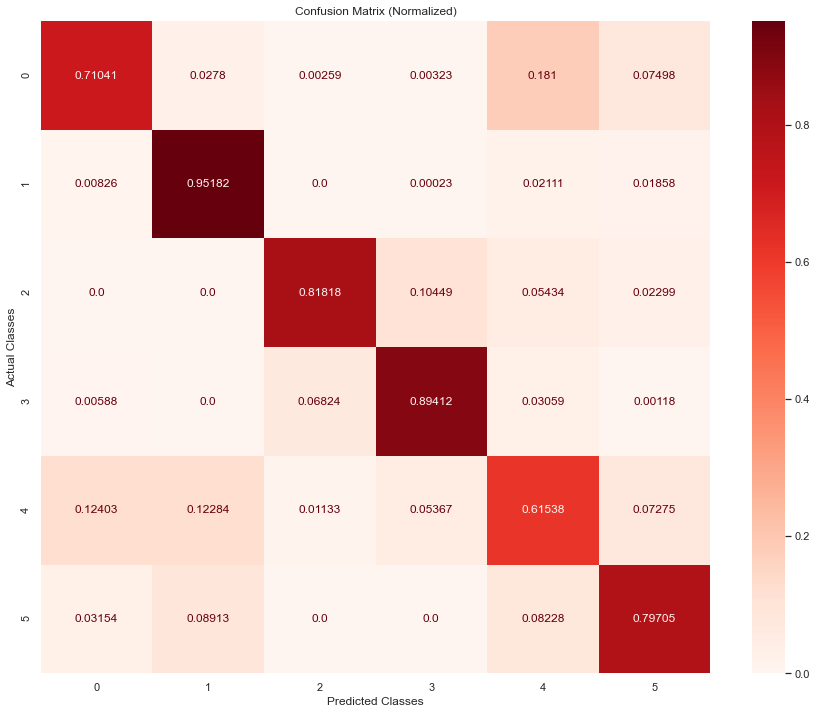

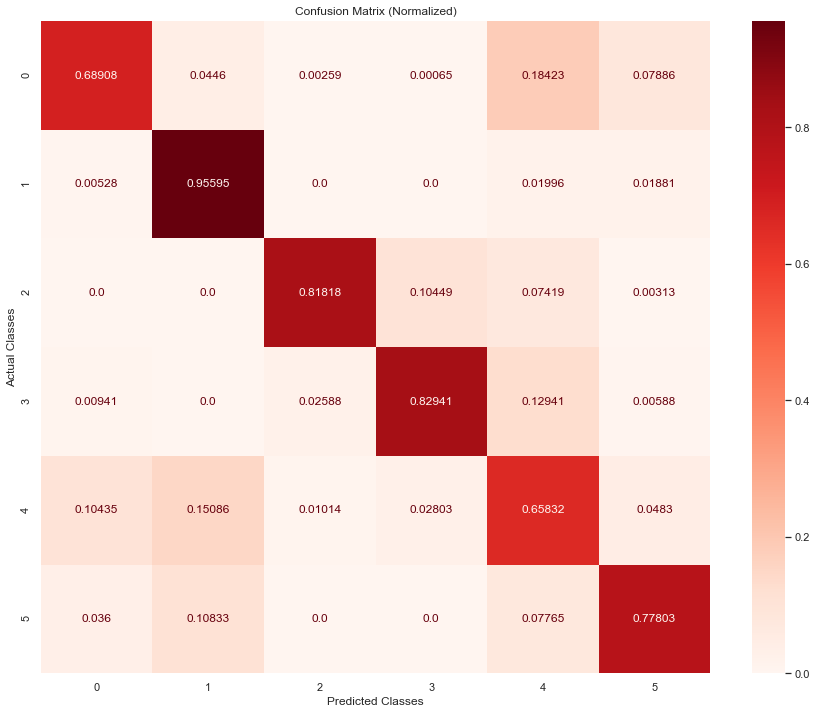

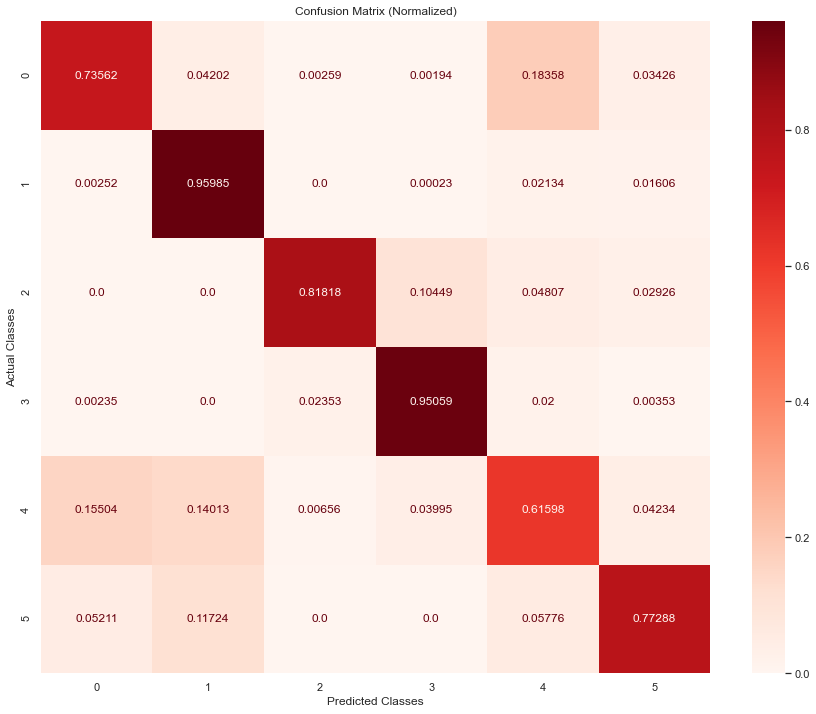

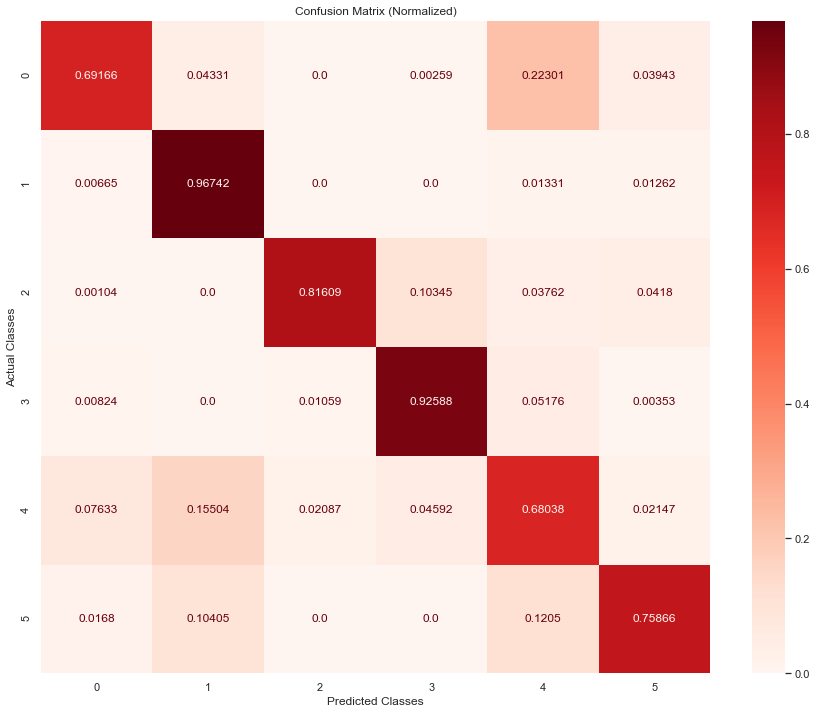

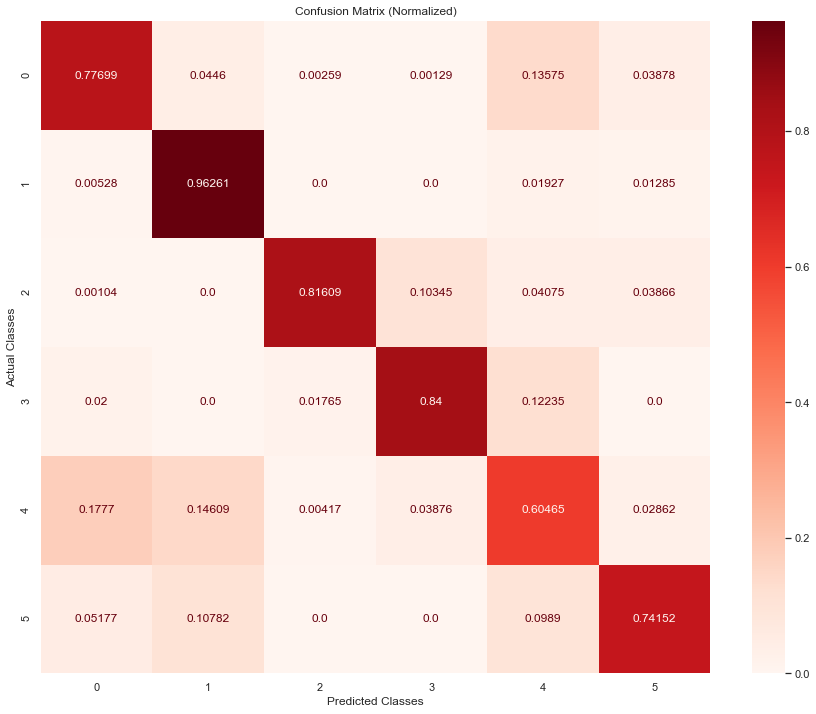

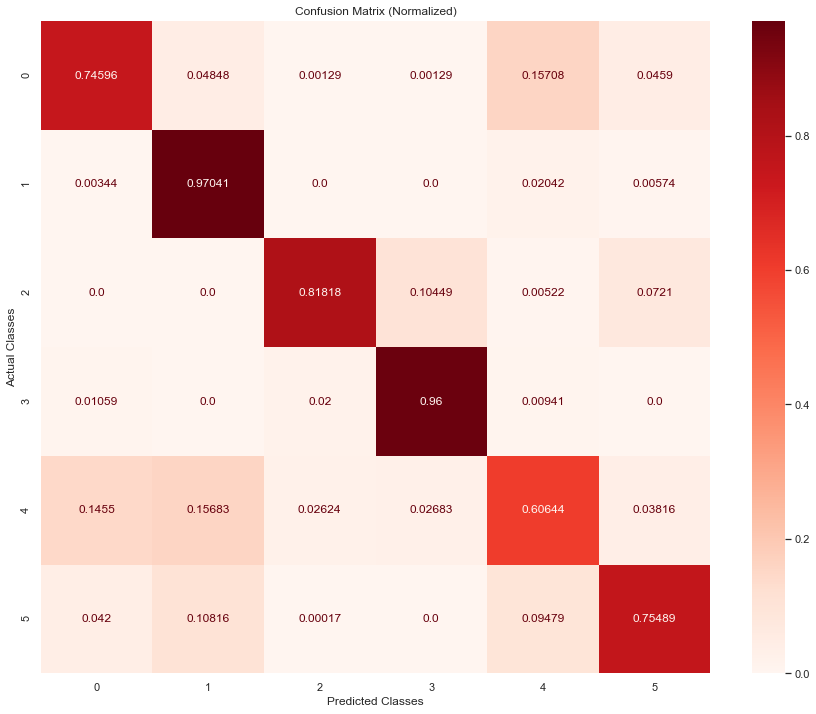

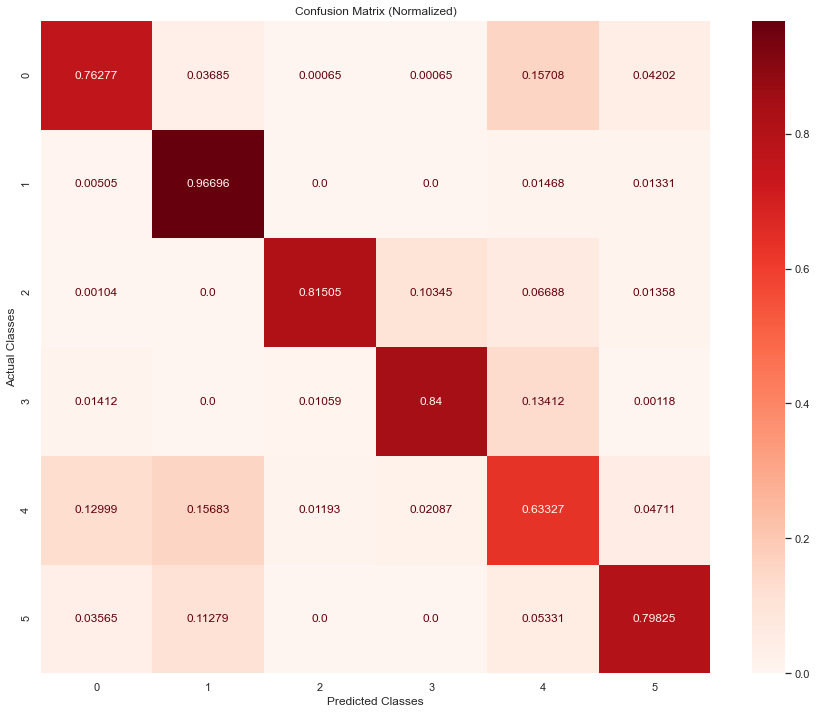

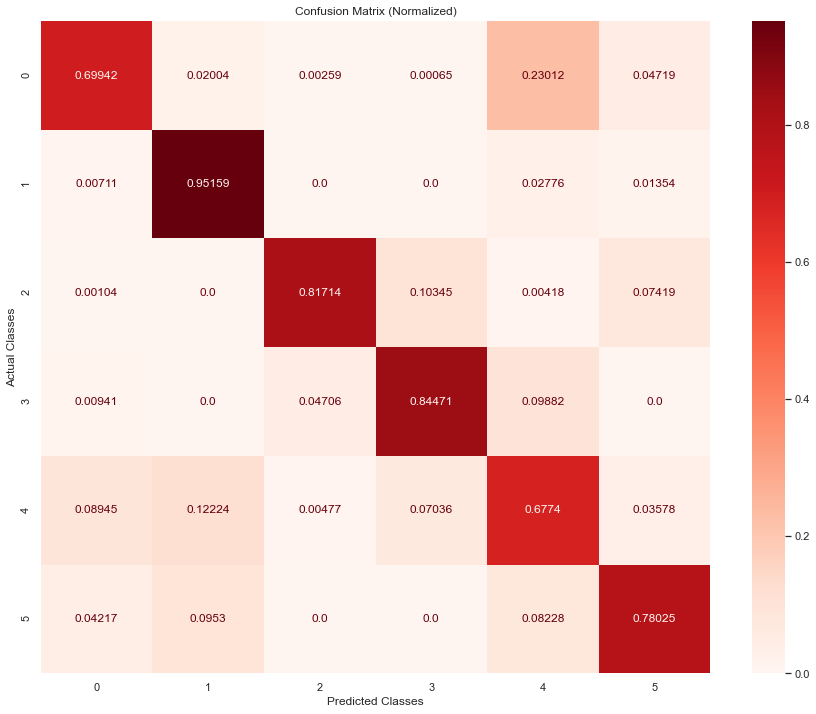

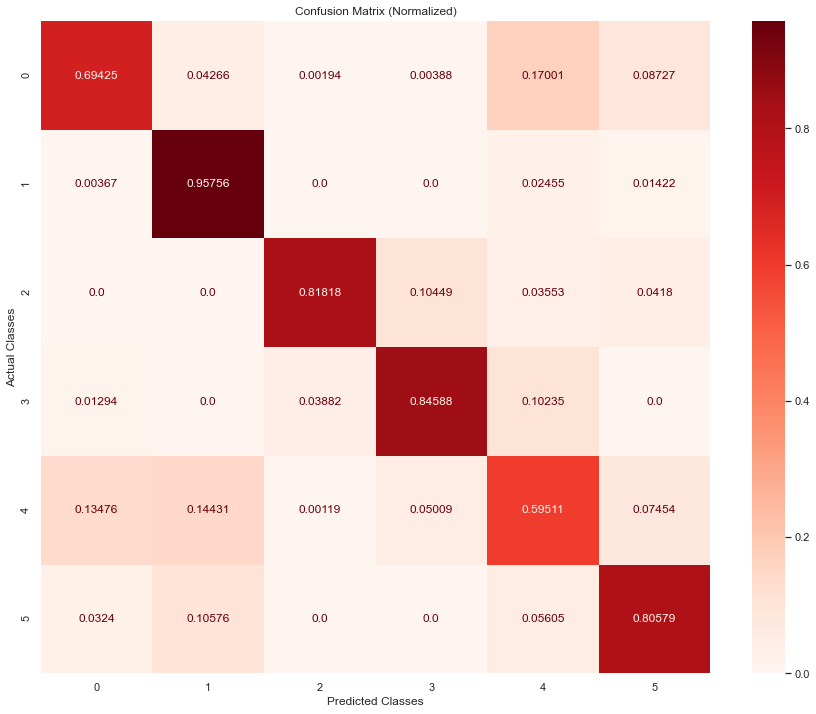

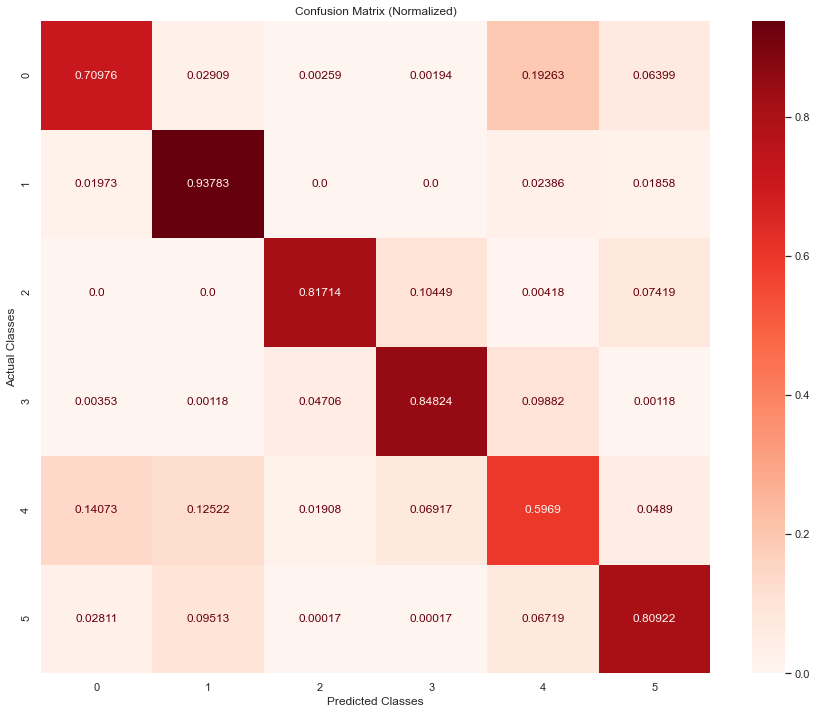

In [101]:
repeat_experiment_dac(model_type="cnnlstm")

Run:  1
original
SPLITTING DATA:
Classify data as either stationary or moving:
(37068, 42, 3)
(37068, 2)
(15224, 42, 3)
(15224, 2)
ConvLSTM
Epoch 1/10
580/580 [==============================] - 9s 14ms/step - loss: 0.0548 - accuracy: 0.9816 - val_loss: 0.0937 - val_accuracy: 0.9771
Epoch 2/10
580/580 [==============================] - 8s 13ms/step - loss: 0.0083 - accuracy: 0.9979 - val_loss: 0.0535 - val_accuracy: 0.9847
Epoch 3/10
580/580 [==============================] - 8s 13ms/step - loss: 0.0074 - accuracy: 0.9981 - val_loss: 0.0835 - val_accuracy: 0.9815
Epoch 4/10
580/580 [==============================] - 8s 13ms/step - loss: 0.0067 - accuracy: 0.9982 - val_loss: 0.0916 - val_accuracy: 0.9810
Timed stopping at epoch 4 after training for 0:00:30

STATIONARY
ConvLSTM
Epoch 1/5000
53/53 [==============================] - 2s 17ms/step - loss: 0.5618 - accuracy: 0.9433 - val_loss: 0.8111 - val_accuracy: 0.8263
Epoch 2/5000
53/53 [==============================] - 1s 14ms/step - lo

Epoch 109/5000
53/53 [==============================] - 1s 14ms/step - loss: 0.0195 - accuracy: 0.9949 - val_loss: 2.0088 - val_accuracy: 0.8400
Epoch 110/5000
53/53 [==============================] - 1s 14ms/step - loss: 0.0232 - accuracy: 0.9937 - val_loss: 1.7610 - val_accuracy: 0.8505
Epoch 111/5000
53/53 [==============================] - 1s 14ms/step - loss: 0.0261 - accuracy: 0.9928 - val_loss: 2.1957 - val_accuracy: 0.8428
Epoch 112/5000
53/53 [==============================] - 1s 13ms/step - loss: 0.0208 - accuracy: 0.9946 - val_loss: 2.1978 - val_accuracy: 0.8428
Epoch 113/5000
53/53 [==============================] - 1s 13ms/step - loss: 0.0229 - accuracy: 0.9937 - val_loss: 2.1117 - val_accuracy: 0.8362
Epoch 114/5000
53/53 [==============================] - 1s 13ms/step - loss: 0.0215 - accuracy: 0.9949 - val_loss: 2.1410 - val_accuracy: 0.8450
Epoch 115/5000
53/53 [==============================] - 1s 13ms/step - loss: 0.0207 - accuracy: 0.9931 - val_loss: 2.0773 - val_ac

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  2
original
SPLITTING DATA:
Classify data as either stationary or moving:
(37068, 42, 3)
(37068, 2)
(15224, 42, 3)
(15224, 2)
ConvLSTM
Epoch 1/10
580/580 [==============================] - 11s 17ms/step - loss: 0.0510 - accuracy: 0.9812 - val_loss: 0.0768 - val_accuracy: 0.9769
Epoch 2/10
580/580 [==============================] - 9s 16ms/step - loss: 0.0082 - accuracy: 0.9981 - val_loss: 0.0548 - val_accuracy: 0.9853
Epoch 3/10
580/580 [==============================] - 9s 16ms/step - loss: 0.0076 - accuracy: 0.9981 - val_loss: 0.0868 - val_accuracy: 0.9794
Epoch 4/10
580/580 [==============================] - 9s 16ms/step - loss: 0.0070 - accuracy: 0.9982 - val_loss: 0.1022 - val_accuracy: 0.9796
Timed stopping at epoch 4 after training for 0:00:30

STATIONARY
ConvLSTM
Epoch 1/5000
52/52 [==============================] - 2s 19ms/step - loss: 0.5186 - accuracy: 0.9431 - val_loss: 1.0531 - val_accuracy: 0.8653
Epoch 2/5000
52/52 [==============================] - 1s 16ms/step - l

Epoch 109/5000
52/52 [==============================] - 1s 16ms/step - loss: 0.0282 - accuracy: 0.9940 - val_loss: 2.7229 - val_accuracy: 0.8653
Epoch 110/5000
52/52 [==============================] - 1s 16ms/step - loss: 0.0269 - accuracy: 0.9946 - val_loss: 2.8136 - val_accuracy: 0.8618
Epoch 111/5000
52/52 [==============================] - 1s 16ms/step - loss: 0.0238 - accuracy: 0.9949 - val_loss: 2.8940 - val_accuracy: 0.8618
Epoch 112/5000
52/52 [==============================] - 1s 16ms/step - loss: 0.0251 - accuracy: 0.9940 - val_loss: 2.7176 - val_accuracy: 0.8618
Epoch 113/5000
52/52 [==============================] - 1s 16ms/step - loss: 0.0257 - accuracy: 0.9940 - val_loss: 3.2327 - val_accuracy: 0.8595
Epoch 114/5000
52/52 [==============================] - 1s 16ms/step - loss: 0.0281 - accuracy: 0.9925 - val_loss: 3.4861 - val_accuracy: 0.8624
Epoch 115/5000
52/52 [==============================] - 1s 16ms/step - loss: 0.0236 - accuracy: 0.9940 - val_loss: 3.1387 - val_ac

528/528 [==============================] - 8s 15ms/step - loss: 0.3527 - accuracy: 0.8676 - val_loss: 0.6788 - val_accuracy: 0.8045
Epoch 4/5000
528/528 [==============================] - 8s 15ms/step - loss: 0.3019 - accuracy: 0.8864 - val_loss: 0.7333 - val_accuracy: 0.7942
Epoch 5/5000
528/528 [==============================] - 8s 15ms/step - loss: 0.2720 - accuracy: 0.8992 - val_loss: 0.6893 - val_accuracy: 0.8178
Epoch 6/5000
528/528 [==============================] - 8s 15ms/step - loss: 0.2501 - accuracy: 0.9091 - val_loss: 0.7918 - val_accuracy: 0.7831
Epoch 7/5000
528/528 [==============================] - 8s 15ms/step - loss: 0.2300 - accuracy: 0.9153 - val_loss: 0.7923 - val_accuracy: 0.8056
Epoch 8/5000
528/528 [==============================] - 8s 15ms/step - loss: 0.2173 - accuracy: 0.9209 - val_loss: 0.7525 - val_accuracy: 0.8201
Epoch 9/5000
528/528 [==============================] - 8s 15ms/step - loss: 0.1978 - accuracy: 0.9281 - val_loss: 0.8530 - val_accuracy: 0.804

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  3
original
SPLITTING DATA:
Classify data as either stationary or moving:
(37068, 42, 3)
(37068, 2)
(15224, 42, 3)
(15224, 2)
ConvLSTM
Epoch 1/10
580/580 [==============================] - 11s 16ms/step - loss: 0.0628 - accuracy: 0.9764 - val_loss: 0.0753 - val_accuracy: 0.9826
Epoch 2/10
580/580 [==============================] - 9s 16ms/step - loss: 0.0090 - accuracy: 0.9979 - val_loss: 0.1251 - val_accuracy: 0.9706
Epoch 3/10
580/580 [==============================] - 9s 16ms/step - loss: 0.0076 - accuracy: 0.9984 - val_loss: 0.0834 - val_accuracy: 0.9806
Epoch 4/10
580/580 [==============================] - 9s 16ms/step - loss: 0.0066 - accuracy: 0.9984 - val_loss: 0.0955 - val_accuracy: 0.9773
Timed stopping at epoch 4 after training for 0:00:30

STATIONARY
ConvLSTM
Epoch 1/5000
55/55 [==============================] - 2s 19ms/step - loss: 0.6639 - accuracy: 0.9100 - val_loss: 0.6706 - val_accuracy: 0.7960
Epoch 2/5000
55/55 [==============================] - 1s 16ms/step - l

Epoch 109/5000
55/55 [==============================] - 1s 16ms/step - loss: 0.0253 - accuracy: 0.9937 - val_loss: 1.4699 - val_accuracy: 0.8980
Epoch 110/5000
55/55 [==============================] - 1s 16ms/step - loss: 0.0234 - accuracy: 0.9943 - val_loss: 1.3581 - val_accuracy: 0.8965
Epoch 111/5000
55/55 [==============================] - 1s 16ms/step - loss: 0.0192 - accuracy: 0.9960 - val_loss: 1.4768 - val_accuracy: 0.9010
Epoch 112/5000
55/55 [==============================] - 1s 16ms/step - loss: 0.0189 - accuracy: 0.9960 - val_loss: 1.4812 - val_accuracy: 0.8939
Epoch 113/5000
55/55 [==============================] - 1s 16ms/step - loss: 0.0210 - accuracy: 0.9946 - val_loss: 1.4787 - val_accuracy: 0.8929
Epoch 114/5000
55/55 [==============================] - 1s 16ms/step - loss: 0.0187 - accuracy: 0.9951 - val_loss: 1.5660 - val_accuracy: 0.9025
Epoch 115/5000
55/55 [==============================] - 1s 16ms/step - loss: 0.0176 - accuracy: 0.9960 - val_loss: 1.5386 - val_ac

525/525 [==============================] - 8s 14ms/step - loss: 0.1756 - accuracy: 0.9361 - val_loss: 0.7651 - val_accuracy: 0.8045
Epoch 11/5000
525/525 [==============================] - 8s 15ms/step - loss: 0.1623 - accuracy: 0.9415 - val_loss: 0.9185 - val_accuracy: 0.8021
Epoch 12/5000
525/525 [==============================] - 8s 15ms/step - loss: 0.1526 - accuracy: 0.9454 - val_loss: 0.9813 - val_accuracy: 0.8091
Epoch 13/5000
525/525 [==============================] - 8s 15ms/step - loss: 0.1443 - accuracy: 0.9479 - val_loss: 0.9188 - val_accuracy: 0.8152
Epoch 14/5000
525/525 [==============================] - 8s 15ms/step - loss: 0.1356 - accuracy: 0.9521 - val_loss: 0.9914 - val_accuracy: 0.8093
Epoch 15/5000
525/525 [==============================] - 8s 14ms/step - loss: 0.1292 - accuracy: 0.9532 - val_loss: 1.0261 - val_accuracy: 0.8096
Epoch 16/5000
525/525 [==============================] - 8s 14ms/step - loss: 0.1209 - accuracy: 0.9558 - val_loss: 1.0007 - val_accuracy:

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  4
original
SPLITTING DATA:
Classify data as either stationary or moving:
(37068, 42, 3)
(37068, 2)
(15224, 42, 3)
(15224, 2)
ConvLSTM
Epoch 1/10
580/580 [==============================] - 12s 18ms/step - loss: 0.0505 - accuracy: 0.9819 - val_loss: 0.0675 - val_accuracy: 0.9823
Epoch 2/10
580/580 [==============================] - 10s 18ms/step - loss: 0.0100 - accuracy: 0.9974 - val_loss: 0.1114 - val_accuracy: 0.9749
Epoch 3/10
580/580 [==============================] - 10s 17ms/step - loss: 0.0079 - accuracy: 0.9980 - val_loss: 0.1009 - val_accuracy: 0.9813
Timed stopping at epoch 3 after training for 0:00:30

STATIONARY
ConvLSTM
Epoch 1/5000
52/52 [==============================] - 2s 20ms/step - loss: 0.5262 - accuracy: 0.9352 - val_loss: 0.7670 - val_accuracy: 0.8746
Epoch 2/5000
52/52 [==============================] - 1s 17ms/step - loss: 0.0589 - accuracy: 0.9916 - val_loss: 0.6006 - val_accuracy: 0.8728
Epoch 3/5000
52/52 [==============================] - 1s 17ms/step -

Epoch 110/5000
52/52 [==============================] - 1s 17ms/step - loss: 0.0205 - accuracy: 0.9955 - val_loss: 1.7213 - val_accuracy: 0.8722
Epoch 111/5000
52/52 [==============================] - 1s 17ms/step - loss: 0.0205 - accuracy: 0.9955 - val_loss: 1.8297 - val_accuracy: 0.8740
Epoch 112/5000
52/52 [==============================] - 1s 17ms/step - loss: 0.0191 - accuracy: 0.9955 - val_loss: 1.6084 - val_accuracy: 0.8728
Epoch 113/5000
52/52 [==============================] - 1s 17ms/step - loss: 0.0222 - accuracy: 0.9949 - val_loss: 1.7709 - val_accuracy: 0.8841
Epoch 114/5000
52/52 [==============================] - 1s 17ms/step - loss: 0.0235 - accuracy: 0.9952 - val_loss: 1.8127 - val_accuracy: 0.8757
Epoch 115/5000
52/52 [==============================] - 1s 17ms/step - loss: 0.0213 - accuracy: 0.9958 - val_loss: 1.8268 - val_accuracy: 0.8853
Epoch 116/5000
52/52 [==============================] - 1s 17ms/step - loss: 0.0213 - accuracy: 0.9949 - val_loss: 1.8754 - val_ac

Epoch 14/5000
528/528 [==============================] - 8s 16ms/step - loss: 0.1510 - accuracy: 0.9466 - val_loss: 1.0662 - val_accuracy: 0.7989
Epoch 15/5000
528/528 [==============================] - 8s 16ms/step - loss: 0.1445 - accuracy: 0.9480 - val_loss: 1.2913 - val_accuracy: 0.7976
Epoch 16/5000
528/528 [==============================] - 8s 16ms/step - loss: 0.1369 - accuracy: 0.9509 - val_loss: 1.2536 - val_accuracy: 0.7980
Epoch 17/5000
528/528 [==============================] - 8s 16ms/step - loss: 0.1312 - accuracy: 0.9514 - val_loss: 1.1316 - val_accuracy: 0.8014
Timed stopping at epoch 17 after training for 0:02:15


c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  5
original
SPLITTING DATA:
Classify data as either stationary or moving:
(37068, 42, 3)
(37068, 2)
(15224, 42, 3)
(15224, 2)
ConvLSTM
Epoch 1/10
580/580 [==============================] - 11s 16ms/step - loss: 0.0590 - accuracy: 0.9787 - val_loss: 0.0919 - val_accuracy: 0.9752
Epoch 2/10
580/580 [==============================] - 9s 16ms/step - loss: 0.0088 - accuracy: 0.9980 - val_loss: 0.0619 - val_accuracy: 0.9827
Epoch 3/10
580/580 [==============================] - 9s 16ms/step - loss: 0.0074 - accuracy: 0.9983 - val_loss: 0.0760 - val_accuracy: 0.9785
Epoch 4/10
580/580 [==============================] - 9s 16ms/step - loss: 0.0073 - accuracy: 0.9983 - val_loss: 0.1394 - val_accuracy: 0.9721
Timed stopping at epoch 4 after training for 0:00:30

STATIONARY
ConvLSTM
Epoch 1/5000
52/52 [==============================] - 2s 19ms/step - loss: 0.4939 - accuracy: 0.9676 - val_loss: 0.4495 - val_accuracy: 0.9038
Epoch 2/5000
52/52 [==============================] - 1s 16ms/step - l

52/52 [==============================] - 1s 16ms/step - loss: 0.0160 - accuracy: 0.9966 - val_loss: 1.8831 - val_accuracy: 0.9031
Epoch 109/5000
52/52 [==============================] - 1s 16ms/step - loss: 0.0159 - accuracy: 0.9966 - val_loss: 1.7785 - val_accuracy: 0.9031
Epoch 110/5000
52/52 [==============================] - 1s 16ms/step - loss: 0.0161 - accuracy: 0.9966 - val_loss: 1.7372 - val_accuracy: 0.9031
Epoch 111/5000
52/52 [==============================] - 1s 16ms/step - loss: 0.0156 - accuracy: 0.9966 - val_loss: 1.8111 - val_accuracy: 0.9031
Epoch 112/5000
52/52 [==============================] - 1s 16ms/step - loss: 0.0154 - accuracy: 0.9963 - val_loss: 1.9088 - val_accuracy: 0.9160
Epoch 113/5000
52/52 [==============================] - 1s 16ms/step - loss: 0.0198 - accuracy: 0.9963 - val_loss: 1.5878 - val_accuracy: 0.9031
Epoch 114/5000
52/52 [==============================] - 1s 16ms/step - loss: 0.0158 - accuracy: 0.9966 - val_loss: 1.6970 - val_accuracy: 0.9031


c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  6
original
SPLITTING DATA:
Classify data as either stationary or moving:
(37068, 42, 3)
(37068, 2)
(15224, 42, 3)
(15224, 2)
ConvLSTM
Epoch 1/10
580/580 [==============================] - 11s 16ms/step - loss: 0.0552 - accuracy: 0.9790 - val_loss: 0.1107 - val_accuracy: 0.9672
Epoch 2/10
580/580 [==============================] - 9s 16ms/step - loss: 0.0083 - accuracy: 0.9979 - val_loss: 0.0895 - val_accuracy: 0.9774
Epoch 3/10
580/580 [==============================] - 9s 16ms/step - loss: 0.0074 - accuracy: 0.9982 - val_loss: 0.1368 - val_accuracy: 0.9735
Epoch 4/10
580/580 [==============================] - 9s 16ms/step - loss: 0.0067 - accuracy: 0.9982 - val_loss: 0.1845 - val_accuracy: 0.9628
Timed stopping at epoch 4 after training for 0:00:30

STATIONARY
ConvLSTM
Epoch 1/5000
49/49 [==============================] - 2s 18ms/step - loss: 0.5379 - accuracy: 0.9555 - val_loss: 0.1995 - val_accuracy: 0.9552
Epoch 2/5000
49/49 [==============================] - 1s 15ms/step - l

Epoch 109/5000
49/49 [==============================] - 1s 15ms/step - loss: 0.0167 - accuracy: 0.9968 - val_loss: 0.5276 - val_accuracy: 0.9496
Epoch 110/5000
49/49 [==============================] - 1s 15ms/step - loss: 0.0162 - accuracy: 0.9965 - val_loss: 0.5038 - val_accuracy: 0.9504
Epoch 111/5000
49/49 [==============================] - 1s 15ms/step - loss: 0.0148 - accuracy: 0.9968 - val_loss: 0.5146 - val_accuracy: 0.9504
Epoch 112/5000
49/49 [==============================] - 1s 15ms/step - loss: 0.0157 - accuracy: 0.9968 - val_loss: 0.5012 - val_accuracy: 0.9560
Epoch 113/5000
49/49 [==============================] - 1s 15ms/step - loss: 0.0160 - accuracy: 0.9968 - val_loss: 0.4945 - val_accuracy: 0.9536
Epoch 114/5000
49/49 [==============================] - 1s 15ms/step - loss: 0.0153 - accuracy: 0.9968 - val_loss: 0.5105 - val_accuracy: 0.9560
Epoch 115/5000
49/49 [==============================] - 1s 15ms/step - loss: 0.0162 - accuracy: 0.9968 - val_loss: 0.4985 - val_ac

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  7
original
SPLITTING DATA:
Classify data as either stationary or moving:
(37068, 42, 3)
(37068, 2)
(15224, 42, 3)
(15224, 2)
ConvLSTM
Epoch 1/10
580/580 [==============================] - 11s 17ms/step - loss: 0.0509 - accuracy: 0.9829 - val_loss: 0.0822 - val_accuracy: 0.9794
Epoch 2/10
580/580 [==============================] - 10s 17ms/step - loss: 0.0091 - accuracy: 0.9978 - val_loss: 0.0797 - val_accuracy: 0.9802
Epoch 3/10
580/580 [==============================] - 10s 17ms/step - loss: 0.0068 - accuracy: 0.9985 - val_loss: 0.0608 - val_accuracy: 0.9888
Timed stopping at epoch 3 after training for 0:00:30

STATIONARY
ConvLSTM
Epoch 1/5000
53/53 [==============================] - 2s 20ms/step - loss: 0.5357 - accuracy: 0.9474 - val_loss: 0.6684 - val_accuracy: 0.8777
Epoch 2/5000
53/53 [==============================] - 1s 17ms/step - loss: 0.0654 - accuracy: 0.9901 - val_loss: 0.5263 - val_accuracy: 0.8800
Epoch 3/5000
53/53 [==============================] - 1s 17ms/step -

Epoch 110/5000
53/53 [==============================] - 1s 17ms/step - loss: 0.0324 - accuracy: 0.9934 - val_loss: 1.1943 - val_accuracy: 0.8648
Epoch 111/5000
53/53 [==============================] - 1s 17ms/step - loss: 0.0333 - accuracy: 0.9931 - val_loss: 1.2597 - val_accuracy: 0.8608
Epoch 112/5000
53/53 [==============================] - 1s 17ms/step - loss: 0.0341 - accuracy: 0.9934 - val_loss: 1.1744 - val_accuracy: 0.8862
Epoch 113/5000
53/53 [==============================] - 1s 16ms/step - loss: 0.0322 - accuracy: 0.9934 - val_loss: 1.4165 - val_accuracy: 0.8518
Epoch 114/5000
53/53 [==============================] - 1s 17ms/step - loss: 0.0574 - accuracy: 0.9910 - val_loss: 1.2449 - val_accuracy: 0.8862
Epoch 115/5000
53/53 [==============================] - 1s 16ms/step - loss: 0.0384 - accuracy: 0.9925 - val_loss: 0.8418 - val_accuracy: 0.8885
Epoch 116/5000
53/53 [==============================] - 1s 17ms/step - loss: 0.0342 - accuracy: 0.9925 - val_loss: 1.0369 - val_ac

Epoch 13/5000
528/528 [==============================] - 8s 15ms/step - loss: 0.1578 - accuracy: 0.9441 - val_loss: 0.9478 - val_accuracy: 0.8024
Epoch 14/5000
528/528 [==============================] - 8s 15ms/step - loss: 0.1527 - accuracy: 0.9448 - val_loss: 0.9074 - val_accuracy: 0.8039
Epoch 15/5000
528/528 [==============================] - 8s 15ms/step - loss: 0.1423 - accuracy: 0.9501 - val_loss: 0.9390 - val_accuracy: 0.8065
Epoch 16/5000
528/528 [==============================] - 8s 15ms/step - loss: 0.1366 - accuracy: 0.9508 - val_loss: 1.0273 - val_accuracy: 0.8120
Epoch 17/5000
528/528 [==============================] - 8s 15ms/step - loss: 0.1336 - accuracy: 0.9514 - val_loss: 1.0229 - val_accuracy: 0.8083
Timed stopping at epoch 17 after training for 0:02:15


c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  8
original
SPLITTING DATA:
Classify data as either stationary or moving:
(37068, 42, 3)
(37068, 2)
(15224, 42, 3)
(15224, 2)
ConvLSTM
Epoch 1/10
580/580 [==============================] - 10s 15ms/step - loss: 0.0536 - accuracy: 0.9822 - val_loss: 0.0646 - val_accuracy: 0.9815
Epoch 2/10
580/580 [==============================] - 9s 15ms/step - loss: 0.0087 - accuracy: 0.9979 - val_loss: 0.0424 - val_accuracy: 0.9898
Epoch 3/10
580/580 [==============================] - 9s 15ms/step - loss: 0.0071 - accuracy: 0.9982 - val_loss: 0.0622 - val_accuracy: 0.9844
Epoch 4/10
580/580 [==============================] - 9s 15ms/step - loss: 0.0073 - accuracy: 0.9979 - val_loss: 0.1152 - val_accuracy: 0.9751
Timed stopping at epoch 4 after training for 0:00:30

STATIONARY
ConvLSTM
Epoch 1/5000
52/52 [==============================] - 2s 18ms/step - loss: 0.4998 - accuracy: 0.9452 - val_loss: 0.3786 - val_accuracy: 0.9120
Epoch 2/5000
52/52 [==============================] - 1s 15ms/step - l

Epoch 109/5000
52/52 [==============================] - 1s 15ms/step - loss: 0.0195 - accuracy: 0.9960 - val_loss: 2.4349 - val_accuracy: 0.9127
Epoch 110/5000
52/52 [==============================] - 1s 15ms/step - loss: 0.0167 - accuracy: 0.9963 - val_loss: 2.3888 - val_accuracy: 0.9092
Epoch 111/5000
52/52 [==============================] - 1s 15ms/step - loss: 0.0150 - accuracy: 0.9963 - val_loss: 2.3996 - val_accuracy: 0.9078
Epoch 112/5000
52/52 [==============================] - 1s 15ms/step - loss: 0.0139 - accuracy: 0.9966 - val_loss: 2.8771 - val_accuracy: 0.9078
Epoch 113/5000
52/52 [==============================] - 1s 15ms/step - loss: 0.0312 - accuracy: 0.9924 - val_loss: 2.0656 - val_accuracy: 0.9216
Epoch 114/5000
52/52 [==============================] - 1s 15ms/step - loss: 0.0182 - accuracy: 0.9960 - val_loss: 2.0691 - val_accuracy: 0.9216
Epoch 115/5000
52/52 [==============================] - 1s 15ms/step - loss: 0.0170 - accuracy: 0.9960 - val_loss: 1.9533 - val_ac

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  9
original
SPLITTING DATA:
Classify data as either stationary or moving:
(37068, 42, 3)
(37068, 2)
(15224, 42, 3)
(15224, 2)
ConvLSTM
Epoch 1/10
580/580 [==============================] - 11s 17ms/step - loss: 0.0518 - accuracy: 0.9829 - val_loss: 0.0649 - val_accuracy: 0.9809
Epoch 2/10
580/580 [==============================] - 10s 17ms/step - loss: 0.0088 - accuracy: 0.9979 - val_loss: 0.0495 - val_accuracy: 0.9861
Epoch 3/10
580/580 [==============================] - 10s 17ms/step - loss: 0.0075 - accuracy: 0.9981 - val_loss: 0.0669 - val_accuracy: 0.9840
Timed stopping at epoch 3 after training for 0:00:30

STATIONARY
ConvLSTM
Epoch 1/5000
53/53 [==============================] - 2s 19ms/step - loss: 0.5854 - accuracy: 0.9438 - val_loss: 0.8903 - val_accuracy: 0.8584
Epoch 2/5000
53/53 [==============================] - 1s 16ms/step - loss: 0.0759 - accuracy: 0.9886 - val_loss: 0.6087 - val_accuracy: 0.8590
Epoch 3/5000
53/53 [==============================] - 1s 16ms/step -

Epoch 110/5000
53/53 [==============================] - 1s 16ms/step - loss: 0.0277 - accuracy: 0.9931 - val_loss: 1.4556 - val_accuracy: 0.8607
Epoch 111/5000
53/53 [==============================] - 1s 16ms/step - loss: 0.0257 - accuracy: 0.9949 - val_loss: 1.5209 - val_accuracy: 0.8646
Epoch 112/5000
53/53 [==============================] - 1s 16ms/step - loss: 0.0262 - accuracy: 0.9928 - val_loss: 1.5126 - val_accuracy: 0.8612
Epoch 113/5000
53/53 [==============================] - 1s 16ms/step - loss: 0.0258 - accuracy: 0.9937 - val_loss: 1.5256 - val_accuracy: 0.8651
Epoch 114/5000
53/53 [==============================] - 1s 16ms/step - loss: 0.0272 - accuracy: 0.9925 - val_loss: 2.2239 - val_accuracy: 0.8226
Epoch 115/5000
53/53 [==============================] - 1s 16ms/step - loss: 0.0252 - accuracy: 0.9934 - val_loss: 1.8025 - val_accuracy: 0.8584
Epoch 116/5000
53/53 [==============================] - 1s 16ms/step - loss: 0.0238 - accuracy: 0.9940 - val_loss: 2.5559 - val_ac

Epoch 12/5000
528/528 [==============================] - 8s 15ms/step - loss: 0.1671 - accuracy: 0.9399 - val_loss: 0.9179 - val_accuracy: 0.7982
Epoch 13/5000
528/528 [==============================] - 8s 15ms/step - loss: 0.1623 - accuracy: 0.9419 - val_loss: 1.1988 - val_accuracy: 0.7917
Epoch 14/5000
528/528 [==============================] - 8s 15ms/step - loss: 0.1534 - accuracy: 0.9447 - val_loss: 1.2216 - val_accuracy: 0.8045
Epoch 15/5000
528/528 [==============================] - 8s 15ms/step - loss: 0.1433 - accuracy: 0.9487 - val_loss: 1.1906 - val_accuracy: 0.8002
Epoch 16/5000
528/528 [==============================] - 8s 15ms/step - loss: 0.1405 - accuracy: 0.9513 - val_loss: 1.1204 - val_accuracy: 0.7984
Epoch 17/5000
528/528 [==============================] - 8s 15ms/step - loss: 0.1323 - accuracy: 0.9520 - val_loss: 1.1777 - val_accuracy: 0.8055
Timed stopping at epoch 17 after training for 0:02:15


c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  10
original
SPLITTING DATA:
Classify data as either stationary or moving:
(37068, 42, 3)
(37068, 2)
(15224, 42, 3)
(15224, 2)
ConvLSTM
Epoch 1/10
580/580 [==============================] - 11s 17ms/step - loss: 0.0490 - accuracy: 0.9833 - val_loss: 0.0591 - val_accuracy: 0.9830
Epoch 2/10
580/580 [==============================] - 9s 16ms/step - loss: 0.0080 - accuracy: 0.9981 - val_loss: 0.0839 - val_accuracy: 0.9764
Epoch 3/10
580/580 [==============================] - 9s 16ms/step - loss: 0.0073 - accuracy: 0.9982 - val_loss: 0.1475 - val_accuracy: 0.9702
Epoch 4/10
580/580 [==============================] - 9s 16ms/step - loss: 0.0075 - accuracy: 0.9978 - val_loss: 0.0718 - val_accuracy: 0.9816
Timed stopping at epoch 4 after training for 0:00:30

STATIONARY
ConvLSTM
Epoch 1/5000
52/52 [==============================] - 2s 19ms/step - loss: 0.5183 - accuracy: 0.9519 - val_loss: 0.5850 - val_accuracy: 0.9029
Epoch 2/5000
52/52 [==============================] - 1s 16ms/step - 

Epoch 109/5000
52/52 [==============================] - 1s 16ms/step - loss: 0.0188 - accuracy: 0.9958 - val_loss: 2.2412 - val_accuracy: 0.9004
Epoch 110/5000
52/52 [==============================] - 1s 16ms/step - loss: 0.0174 - accuracy: 0.9955 - val_loss: 2.1602 - val_accuracy: 0.8992
Epoch 111/5000
52/52 [==============================] - 1s 16ms/step - loss: 0.0167 - accuracy: 0.9961 - val_loss: 2.3211 - val_accuracy: 0.9023
Epoch 112/5000
52/52 [==============================] - 1s 16ms/step - loss: 0.0172 - accuracy: 0.9958 - val_loss: 2.4640 - val_accuracy: 0.9029
Epoch 113/5000
52/52 [==============================] - 1s 16ms/step - loss: 0.0160 - accuracy: 0.9961 - val_loss: 2.3646 - val_accuracy: 0.9023
Epoch 114/5000
52/52 [==============================] - 1s 16ms/step - loss: 0.0153 - accuracy: 0.9961 - val_loss: 2.4965 - val_accuracy: 0.9029
Epoch 115/5000
52/52 [==============================] - 1s 16ms/step - loss: 0.0159 - accuracy: 0.9964 - val_loss: 2.4920 - val_ac

528/528 [==============================] - 8s 15ms/step - loss: 0.4136 - accuracy: 0.8437 - val_loss: 0.7919 - val_accuracy: 0.7600
Epoch 3/5000
528/528 [==============================] - 8s 15ms/step - loss: 0.3397 - accuracy: 0.8712 - val_loss: 0.7445 - val_accuracy: 0.7670
Epoch 4/5000
528/528 [==============================] - 8s 15ms/step - loss: 0.2963 - accuracy: 0.8871 - val_loss: 0.7173 - val_accuracy: 0.7892
Epoch 5/5000
528/528 [==============================] - 8s 15ms/step - loss: 0.2670 - accuracy: 0.9001 - val_loss: 0.7083 - val_accuracy: 0.8024
Epoch 6/5000
528/528 [==============================] - 8s 15ms/step - loss: 0.2453 - accuracy: 0.9100 - val_loss: 0.7151 - val_accuracy: 0.8086
Epoch 7/5000
528/528 [==============================] - 8s 15ms/step - loss: 0.2249 - accuracy: 0.9172 - val_loss: 0.7621 - val_accuracy: 0.8030
Epoch 8/5000
528/528 [==============================] - 8s 15ms/step - loss: 0.2096 - accuracy: 0.9233 - val_loss: 0.7506 - val_accuracy: 0.812

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


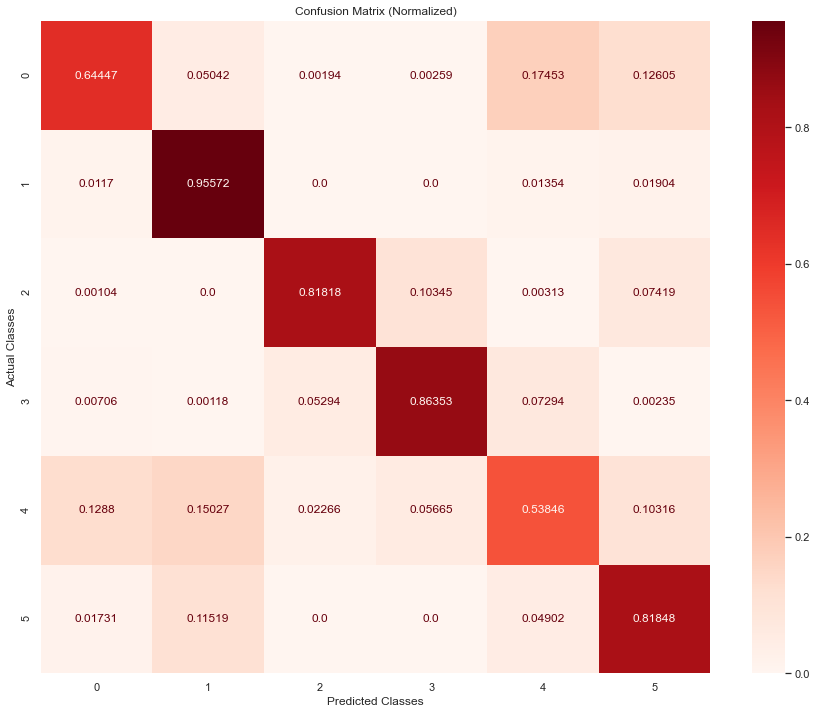

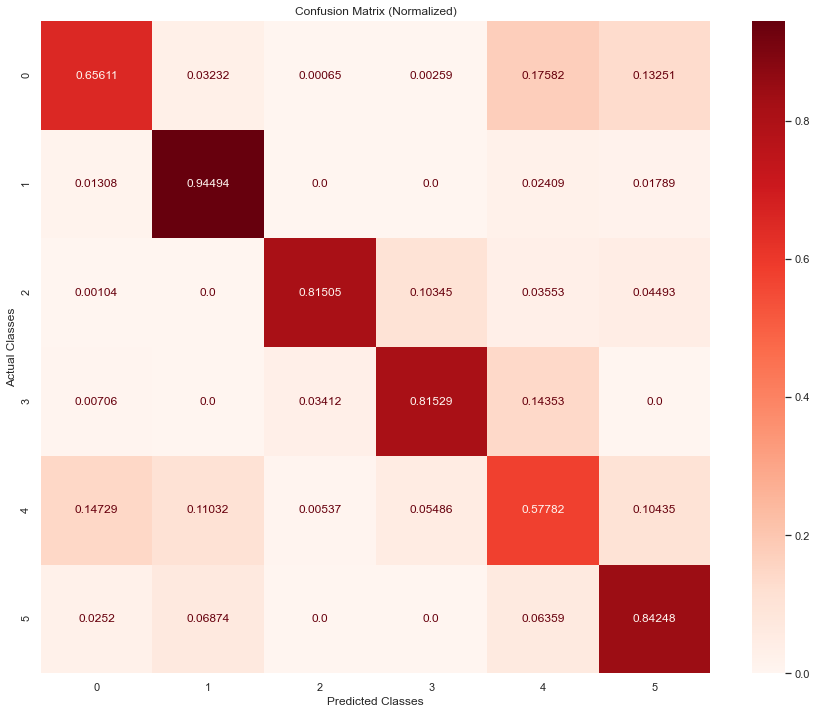

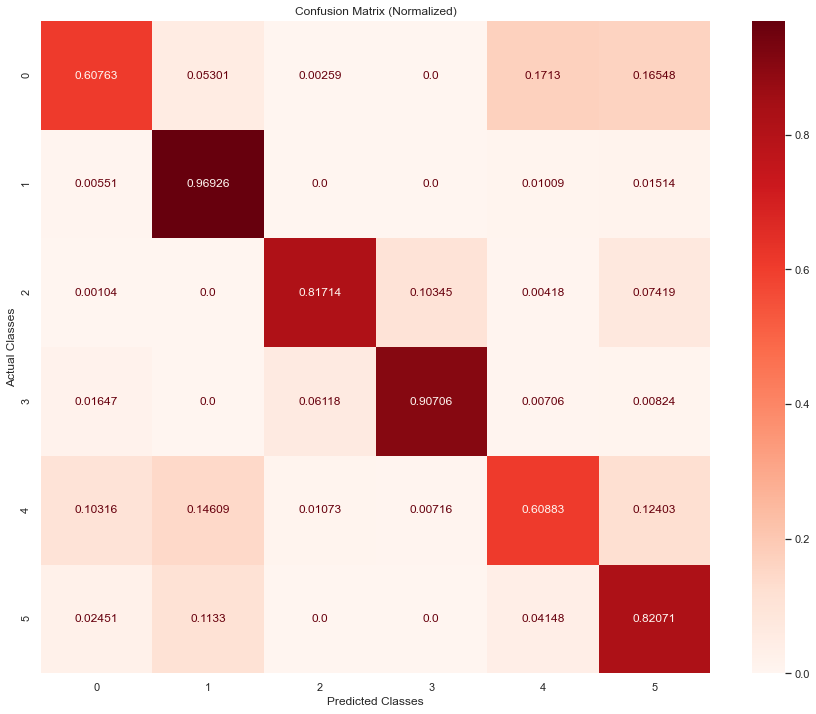

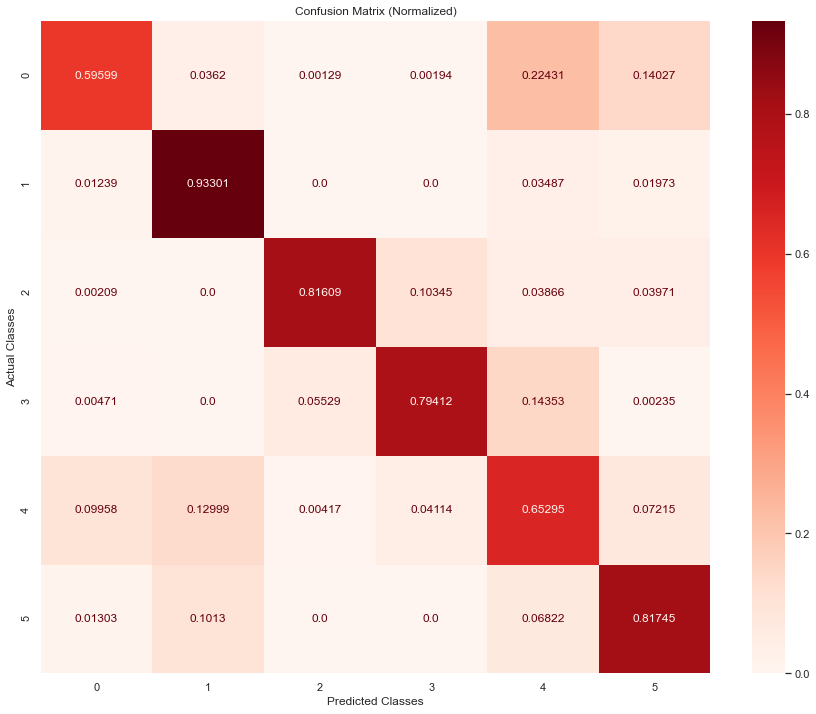

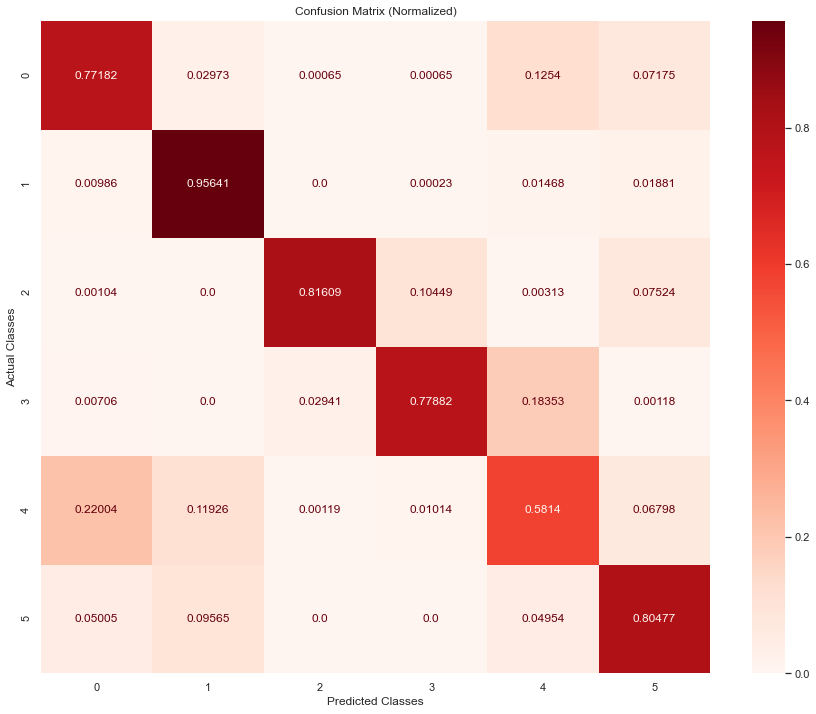

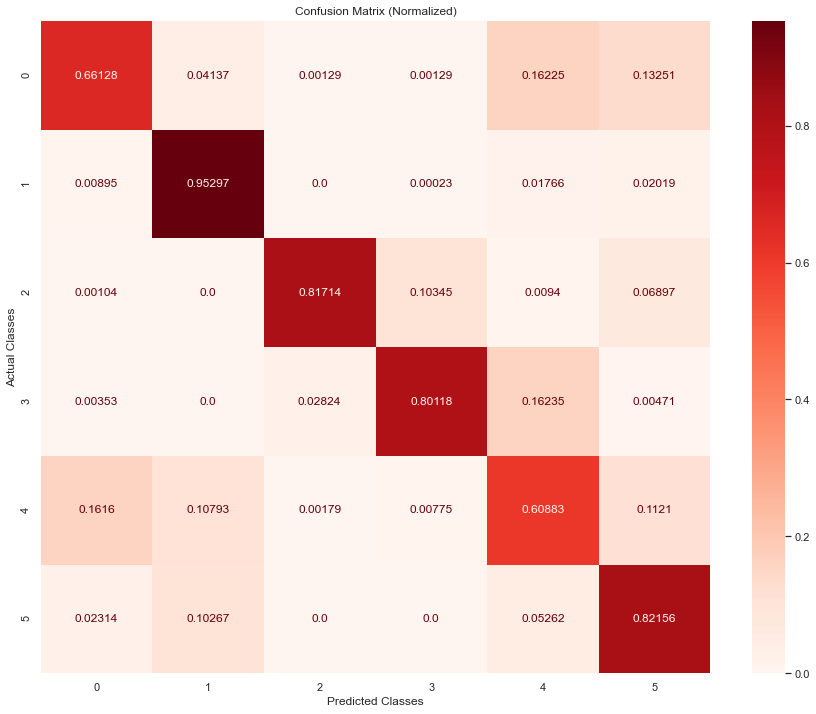

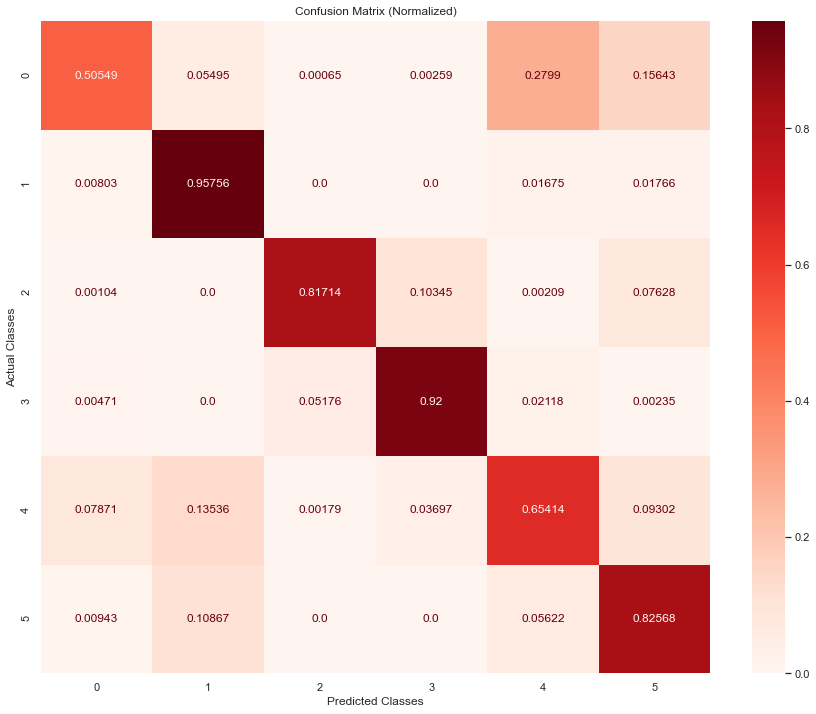

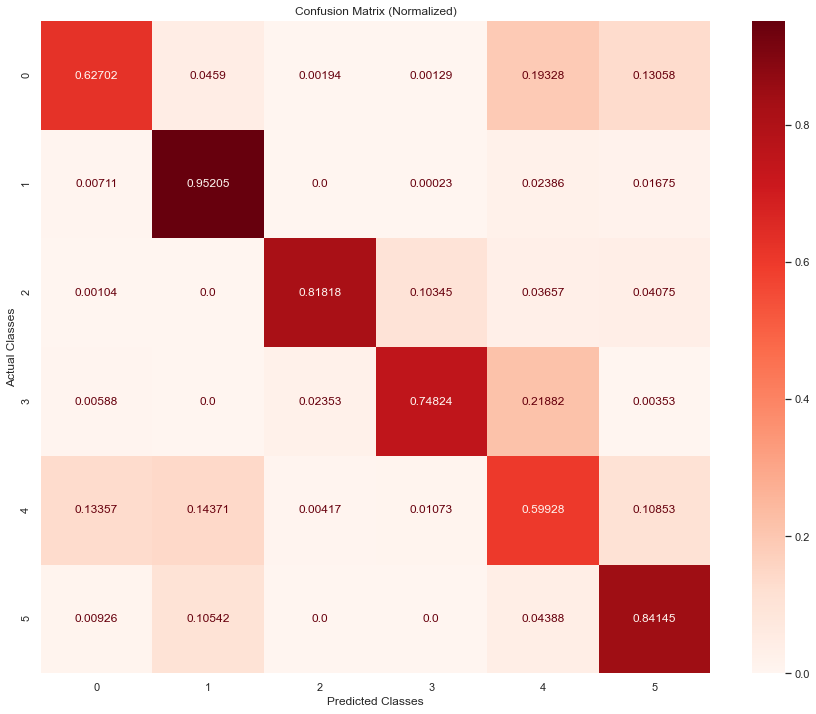

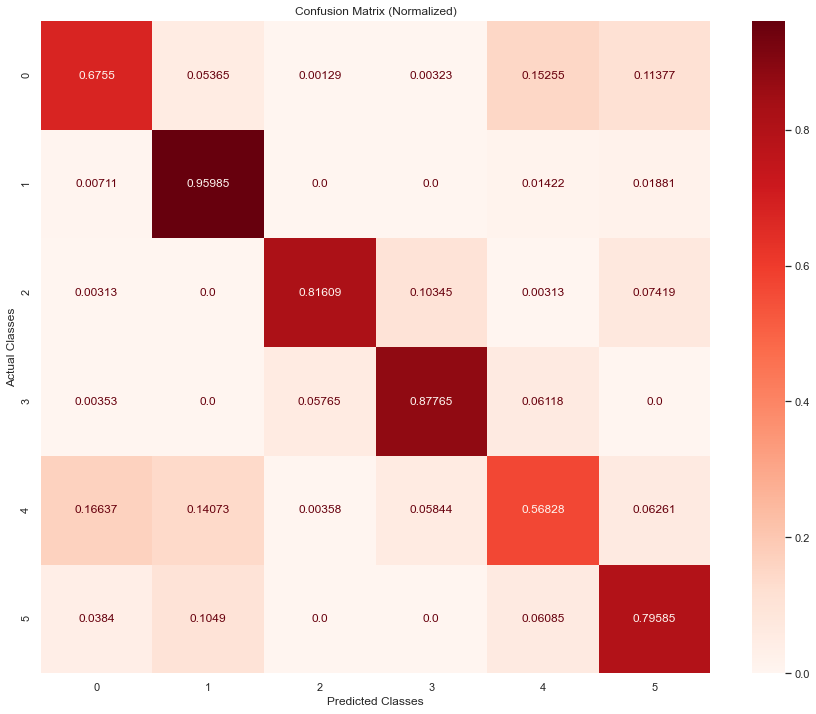

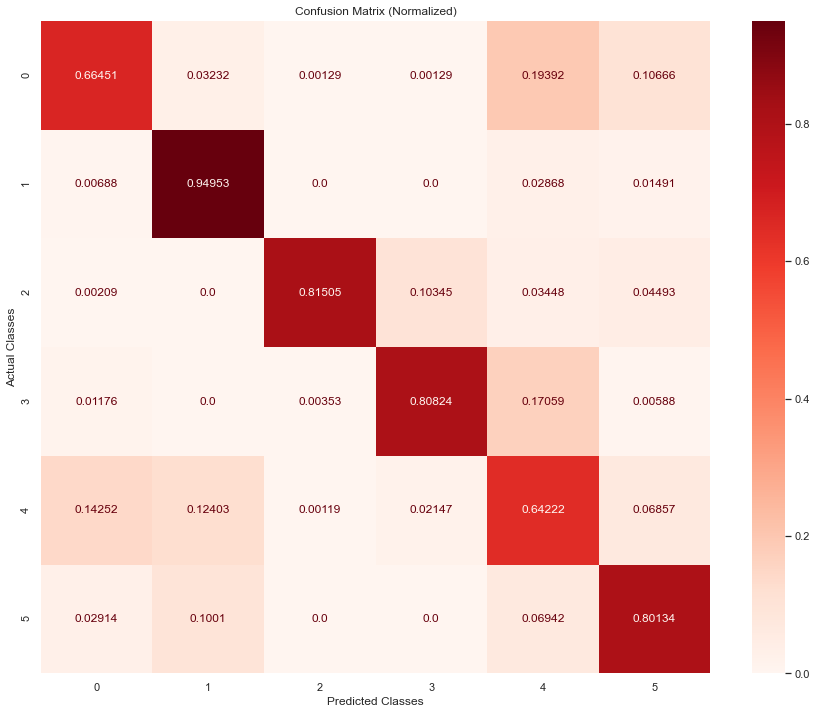

In [102]:
repeat_experiment_dac(model_type="convlstm")

Run:  1
original
SPLITTING DATA:
Classify data as either stationary or moving:
(37068, 42, 3)
(37068, 2)
(15224, 42, 3)
(15224, 2)
Bi-LSTM
Epoch 1/10
580/580 [==============================] - 8s 10ms/step - loss: 0.1778 - accuracy: 0.9508 - val_loss: 0.3500 - val_accuracy: 0.9270
Epoch 2/10
580/580 [==============================] - 5s 9ms/step - loss: 0.1075 - accuracy: 0.9645 - val_loss: 0.1743 - val_accuracy: 0.9358
Epoch 3/10
580/580 [==============================] - 5s 9ms/step - loss: 0.0189 - accuracy: 0.9949 - val_loss: 0.0716 - val_accuracy: 0.9831
Epoch 4/10
580/580 [==============================] - 5s 9ms/step - loss: 0.0096 - accuracy: 0.9979 - val_loss: 0.0564 - val_accuracy: 0.9874
Epoch 5/10
580/580 [==============================] - 5s 9ms/step - loss: 0.0098 - accuracy: 0.9975 - val_loss: 0.0634 - val_accuracy: 0.9846
Epoch 6/10
580/580 [==============================] - 5s 9ms/step - loss: 0.0087 - accuracy: 0.9979 - val_loss: 0.0703 - val_accuracy: 0.9847
Timed st

Epoch 107/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0634 - accuracy: 0.9881 - val_loss: 0.4646 - val_accuracy: 0.8778
Epoch 108/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0606 - accuracy: 0.9887 - val_loss: 0.4894 - val_accuracy: 0.8934
Epoch 109/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0612 - accuracy: 0.9887 - val_loss: 0.5249 - val_accuracy: 0.8928
Epoch 110/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0608 - accuracy: 0.9884 - val_loss: 0.5062 - val_accuracy: 0.8922
Epoch 111/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0627 - accuracy: 0.9881 - val_loss: 0.4744 - val_accuracy: 0.8940
Epoch 112/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0628 - accuracy: 0.9890 - val_loss: 0.5195 - val_accuracy: 0.8934
Epoch 113/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0588 - accuracy: 0.9887 - val_loss: 0.5458 - val_ac

53/53 [==============================] - 1s 10ms/step - loss: 0.0352 - accuracy: 0.9887 - val_loss: 0.8818 - val_accuracy: 0.8958
Epoch 220/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0299 - accuracy: 0.9916 - val_loss: 0.8330 - val_accuracy: 0.8994
Epoch 221/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0295 - accuracy: 0.9899 - val_loss: 0.8623 - val_accuracy: 0.8982
Epoch 222/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0352 - accuracy: 0.9928 - val_loss: 0.8148 - val_accuracy: 0.8988
Epoch 223/5000
53/53 [==============================] - ETA: 0s - loss: 0.0253 - accuracy: 0.99 - 1s 10ms/step - loss: 0.0261 - accuracy: 0.9925 - val_loss: 0.7284 - val_accuracy: 0.8982
Epoch 224/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0266 - accuracy: 0.9922 - val_loss: 0.9160 - val_accuracy: 0.8970
Epoch 225/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0258 - accuracy: 0.9919 

Epoch 24/5000
527/527 [==============================] - 5s 10ms/step - loss: 0.0680 - accuracy: 0.9788 - val_loss: 1.0307 - val_accuracy: 0.7927
Epoch 25/5000
527/527 [==============================] - 5s 9ms/step - loss: 0.0691 - accuracy: 0.9783 - val_loss: 1.1208 - val_accuracy: 0.8039
Epoch 26/5000
527/527 [==============================] - 5s 9ms/step - loss: 0.0647 - accuracy: 0.9802 - val_loss: 1.2269 - val_accuracy: 0.7915
Epoch 27/5000
527/527 [==============================] - 5s 9ms/step - loss: 0.0595 - accuracy: 0.9810 - val_loss: 1.1681 - val_accuracy: 0.8049
Timed stopping at epoch 27 after training for 0:02:15


c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  2
original
SPLITTING DATA:
Classify data as either stationary or moving:
(37068, 42, 3)
(37068, 2)
(15224, 42, 3)
(15224, 2)
Bi-LSTM
Epoch 1/10
580/580 [==============================] - 8s 10ms/step - loss: 0.1745 - accuracy: 0.9505 - val_loss: 0.3182 - val_accuracy: 0.9313
Epoch 2/10
580/580 [==============================] - 5s 9ms/step - loss: 0.0500 - accuracy: 0.9821 - val_loss: 0.1052 - val_accuracy: 0.9804
Epoch 3/10
580/580 [==============================] - 5s 9ms/step - loss: 0.0157 - accuracy: 0.9965 - val_loss: 0.0669 - val_accuracy: 0.9850
Epoch 4/10
580/580 [==============================] - 5s 9ms/step - loss: 0.0148 - accuracy: 0.9965 - val_loss: 0.1055 - val_accuracy: 0.9805
Epoch 5/10
580/580 [==============================] - 5s 9ms/step - loss: 0.0103 - accuracy: 0.9974 - val_loss: 0.0662 - val_accuracy: 0.9855
Epoch 6/10
580/580 [==============================] - 5s 9ms/step - loss: 0.0094 - accuracy: 0.9975 - val_loss: 0.0524 - val_accuracy: 0.9866
Timed st

Epoch 107/5000
52/52 [==============================] - 1s 10ms/step - loss: 0.0506 - accuracy: 0.9907 - val_loss: 0.4623 - val_accuracy: 0.8983
Epoch 108/5000
52/52 [==============================] - 1s 10ms/step - loss: 0.0560 - accuracy: 0.9901 - val_loss: 0.4709 - val_accuracy: 0.8758
Epoch 109/5000
52/52 [==============================] - 1s 10ms/step - loss: 0.0504 - accuracy: 0.9913 - val_loss: 0.4576 - val_accuracy: 0.8953
Epoch 110/5000
52/52 [==============================] - 1s 10ms/step - loss: 0.0508 - accuracy: 0.9916 - val_loss: 0.4878 - val_accuracy: 0.8959
Epoch 111/5000
52/52 [==============================] - 1s 10ms/step - loss: 0.0485 - accuracy: 0.9913 - val_loss: 0.6009 - val_accuracy: 0.8634
Epoch 112/5000
52/52 [==============================] - 1s 10ms/step - loss: 0.0520 - accuracy: 0.9904 - val_loss: 0.5253 - val_accuracy: 0.9042
Epoch 113/5000
52/52 [==============================] - 1s 10ms/step - loss: 0.0516 - accuracy: 0.9907 - val_loss: 0.5305 - val_ac

52/52 [==============================] - 1s 10ms/step - loss: 0.0425 - accuracy: 0.9910 - val_loss: 0.6307 - val_accuracy: 0.9042
Epoch 220/5000
52/52 [==============================] - 1s 10ms/step - loss: 0.0357 - accuracy: 0.9925 - val_loss: 0.4693 - val_accuracy: 0.9030
Epoch 221/5000
52/52 [==============================] - 1s 10ms/step - loss: 0.0377 - accuracy: 0.9916 - val_loss: 0.5869 - val_accuracy: 0.9048
Epoch 222/5000
52/52 [==============================] - 1s 10ms/step - loss: 0.0398 - accuracy: 0.9916 - val_loss: 0.4994 - val_accuracy: 0.9048
Epoch 223/5000
52/52 [==============================] - 1s 10ms/step - loss: 0.0393 - accuracy: 0.9922 - val_loss: 0.4841 - val_accuracy: 0.9042
Epoch 224/5000
52/52 [==============================] - 1s 10ms/step - loss: 0.0330 - accuracy: 0.9925 - val_loss: 0.5083 - val_accuracy: 0.9042
Epoch 225/5000
52/52 [==============================] - 1s 10ms/step - loss: 0.0379 - accuracy: 0.9919 - val_loss: 0.5245 - val_accuracy: 0.9036


c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  3
original
SPLITTING DATA:
Classify data as either stationary or moving:
(37068, 42, 3)
(37068, 2)
(15224, 42, 3)
(15224, 2)
Bi-LSTM
Epoch 1/10
580/580 [==============================] - 8s 10ms/step - loss: 0.1756 - accuracy: 0.9506 - val_loss: 0.3094 - val_accuracy: 0.9272
Epoch 2/10
580/580 [==============================] - 5s 9ms/step - loss: 0.1086 - accuracy: 0.9640 - val_loss: 0.0843 - val_accuracy: 0.9547
Epoch 3/10
580/580 [==============================] - 5s 9ms/step - loss: 0.0167 - accuracy: 0.9955 - val_loss: 0.0784 - val_accuracy: 0.9786
Epoch 4/10
580/580 [==============================] - 6s 10ms/step - loss: 0.0115 - accuracy: 0.9970 - val_loss: 0.0798 - val_accuracy: 0.9811
Epoch 5/10
580/580 [==============================] - 6s 9ms/step - loss: 0.0092 - accuracy: 0.9977 - val_loss: 0.0688 - val_accuracy: 0.9816
Epoch 6/10
580/580 [==============================] - 5s 9ms/step - loss: 0.0102 - accuracy: 0.9979 - val_loss: 0.0608 - val_accuracy: 0.9848
Timed s

Epoch 107/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0865 - accuracy: 0.9842 - val_loss: 0.5047 - val_accuracy: 0.8936
Epoch 108/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0893 - accuracy: 0.9842 - val_loss: 0.4559 - val_accuracy: 0.8878
Epoch 109/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0872 - accuracy: 0.9839 - val_loss: 0.4434 - val_accuracy: 0.8966
Epoch 110/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0861 - accuracy: 0.9848 - val_loss: 0.5095 - val_accuracy: 0.8819
Epoch 111/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0857 - accuracy: 0.9836 - val_loss: 0.4736 - val_accuracy: 0.8504
Epoch 112/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0881 - accuracy: 0.9848 - val_loss: 0.4922 - val_accuracy: 0.8890
Epoch 113/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0850 - accuracy: 0.9842 - val_loss: 0.4592 - val_ac

53/53 [==============================] - 1s 10ms/step - loss: 0.0366 - accuracy: 0.9923 - val_loss: 0.6863 - val_accuracy: 0.8989
Epoch 220/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0327 - accuracy: 0.9920 - val_loss: 0.6801 - val_accuracy: 0.8895
Epoch 221/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0369 - accuracy: 0.9908 - val_loss: 0.7090 - val_accuracy: 0.8925
Epoch 222/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0348 - accuracy: 0.9914 - val_loss: 0.7012 - val_accuracy: 0.8872
Epoch 223/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0371 - accuracy: 0.9908 - val_loss: 0.7582 - val_accuracy: 0.8749
Epoch 224/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0445 - accuracy: 0.9896 - val_loss: 0.7563 - val_accuracy: 0.8913
Epoch 225/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0365 - accuracy: 0.9908 - val_loss: 0.7358 - val_accuracy: 0.8948


c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  4
original
SPLITTING DATA:
Classify data as either stationary or moving:
(37068, 42, 3)
(37068, 2)
(15224, 42, 3)
(15224, 2)
Bi-LSTM
Epoch 1/10
580/580 [==============================] - 8s 10ms/step - loss: 0.1729 - accuracy: 0.9502 - val_loss: 0.2808 - val_accuracy: 0.9271
Epoch 2/10
580/580 [==============================] - 5s 9ms/step - loss: 0.0599 - accuracy: 0.9786 - val_loss: 0.1383 - val_accuracy: 0.9574
Epoch 3/10
580/580 [==============================] - 6s 10ms/step - loss: 0.0164 - accuracy: 0.9959 - val_loss: 0.1681 - val_accuracy: 0.9704
Epoch 4/10
580/580 [==============================] - 6s 10ms/step - loss: 0.0107 - accuracy: 0.9972 - val_loss: 0.1339 - val_accuracy: 0.9767
Epoch 5/10
580/580 [==============================] - 6s 10ms/step - loss: 0.0103 - accuracy: 0.9975 - val_loss: 0.2033 - val_accuracy: 0.9664
Epoch 6/10
580/580 [==============================] - 6s 10ms/step - loss: 0.0090 - accuracy: 0.9977 - val_loss: 0.0895 - val_accuracy: 0.9723
Time

Epoch 107/5000
54/54 [==============================] - 1s 10ms/step - loss: 0.1314 - accuracy: 0.9742 - val_loss: 0.7166 - val_accuracy: 0.8084
Epoch 108/5000
54/54 [==============================] - 1s 10ms/step - loss: 0.1262 - accuracy: 0.9748 - val_loss: 0.8258 - val_accuracy: 0.8141
Epoch 109/5000
54/54 [==============================] - 1s 10ms/step - loss: 0.1409 - accuracy: 0.9721 - val_loss: 0.7506 - val_accuracy: 0.8425
Epoch 110/5000
54/54 [==============================] - 1s 10ms/step - loss: 0.1377 - accuracy: 0.9721 - val_loss: 0.8212 - val_accuracy: 0.8363
Epoch 111/5000
54/54 [==============================] - 1s 10ms/step - loss: 0.1288 - accuracy: 0.9739 - val_loss: 0.8079 - val_accuracy: 0.8323
Epoch 112/5000
54/54 [==============================] - 1s 10ms/step - loss: 0.1342 - accuracy: 0.9727 - val_loss: 0.8016 - val_accuracy: 0.8209
Epoch 113/5000
54/54 [==============================] - 1s 10ms/step - loss: 0.1289 - accuracy: 0.9727 - val_loss: 0.7640 - val_ac

54/54 [==============================] - 1s 11ms/step - loss: 0.0646 - accuracy: 0.9818 - val_loss: 0.7761 - val_accuracy: 0.8397
Epoch 220/5000
54/54 [==============================] - 1s 10ms/step - loss: 0.0767 - accuracy: 0.9765 - val_loss: 0.6522 - val_accuracy: 0.8243
Epoch 221/5000
54/54 [==============================] - 1s 10ms/step - loss: 0.0626 - accuracy: 0.9812 - val_loss: 0.6472 - val_accuracy: 0.8425
Epoch 222/5000
54/54 [==============================] - 1s 10ms/step - loss: 0.0608 - accuracy: 0.9818 - val_loss: 0.7241 - val_accuracy: 0.8232
Epoch 223/5000
54/54 [==============================] - 1s 10ms/step - loss: 0.0617 - accuracy: 0.9830 - val_loss: 0.6565 - val_accuracy: 0.8459
Epoch 224/5000
54/54 [==============================] - 1s 11ms/step - loss: 0.0645 - accuracy: 0.9827 - val_loss: 0.7637 - val_accuracy: 0.8437
Epoch 225/5000
54/54 [==============================] - 1s 10ms/step - loss: 0.0662 - accuracy: 0.9804 - val_loss: 0.7171 - val_accuracy: 0.8192


c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  5
original
SPLITTING DATA:
Classify data as either stationary or moving:
(37068, 42, 3)
(37068, 2)
(15224, 42, 3)
(15224, 2)
Bi-LSTM
Epoch 1/10
580/580 [==============================] - 7s 10ms/step - loss: 0.1778 - accuracy: 0.9508 - val_loss: 0.3477 - val_accuracy: 0.9086
Epoch 2/10
580/580 [==============================] - 5s 9ms/step - loss: 0.1093 - accuracy: 0.9648 - val_loss: 0.2035 - val_accuracy: 0.9522
Epoch 3/10
580/580 [==============================] - 5s 9ms/step - loss: 0.0163 - accuracy: 0.9955 - val_loss: 0.0708 - val_accuracy: 0.9815
Epoch 4/10
580/580 [==============================] - 5s 9ms/step - loss: 0.0116 - accuracy: 0.9972 - val_loss: 0.0706 - val_accuracy: 0.9871
Epoch 5/10
580/580 [==============================] - 5s 9ms/step - loss: 0.0110 - accuracy: 0.9979 - val_loss: 0.1404 - val_accuracy: 0.9781
Epoch 6/10
580/580 [==============================] - 5s 9ms/step - loss: 0.0103 - accuracy: 0.9973 - val_loss: 0.0485 - val_accuracy: 0.9881
Timed st

Epoch 107/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0856 - accuracy: 0.9825 - val_loss: 0.6300 - val_accuracy: 0.8564
Epoch 108/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0839 - accuracy: 0.9822 - val_loss: 0.6156 - val_accuracy: 0.8745
Epoch 109/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0866 - accuracy: 0.9813 - val_loss: 0.5752 - val_accuracy: 0.8745
Epoch 110/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0950 - accuracy: 0.9805 - val_loss: 0.5589 - val_accuracy: 0.8739
Epoch 111/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0862 - accuracy: 0.9810 - val_loss: 0.5320 - val_accuracy: 0.8575
Epoch 112/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0874 - accuracy: 0.9813 - val_loss: 0.5566 - val_accuracy: 0.8750
Epoch 113/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0857 - accuracy: 0.9816 - val_loss: 0.5797 - val_ac

53/53 [==============================] - 1s 10ms/step - loss: 0.0441 - accuracy: 0.9893 - val_loss: 0.7422 - val_accuracy: 0.8624
Epoch 220/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0486 - accuracy: 0.9887 - val_loss: 0.7154 - val_accuracy: 0.8613
Epoch 221/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0416 - accuracy: 0.9890 - val_loss: 0.6710 - val_accuracy: 0.8596
Epoch 222/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0373 - accuracy: 0.9902 - val_loss: 0.6151 - val_accuracy: 0.8745
Epoch 223/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0423 - accuracy: 0.9887 - val_loss: 0.6949 - val_accuracy: 0.8750
Epoch 224/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0424 - accuracy: 0.9882 - val_loss: 0.7618 - val_accuracy: 0.8684
Epoch 225/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0444 - accuracy: 0.9899 - val_loss: 0.8258 - val_accuracy: 0.8191


c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  6
original
SPLITTING DATA:
Classify data as either stationary or moving:
(37068, 42, 3)
(37068, 2)
(15224, 42, 3)
(15224, 2)
Bi-LSTM
Epoch 1/10
580/580 [==============================] - 8s 10ms/step - loss: 0.1802 - accuracy: 0.9499 - val_loss: 0.2976 - val_accuracy: 0.9279
Epoch 2/10
580/580 [==============================] - 6s 10ms/step - loss: 0.1053 - accuracy: 0.9662 - val_loss: 0.1531 - val_accuracy: 0.9520
Epoch 3/10
580/580 [==============================] - 5s 9ms/step - loss: 0.0186 - accuracy: 0.9953 - val_loss: 0.1192 - val_accuracy: 0.9793
Epoch 4/10
580/580 [==============================] - 6s 9ms/step - loss: 0.0128 - accuracy: 0.9968 - val_loss: 0.1397 - val_accuracy: 0.9792
Epoch 5/10
580/580 [==============================] - 5s 9ms/step - loss: 0.0086 - accuracy: 0.9979 - val_loss: 0.1051 - val_accuracy: 0.9797
Epoch 6/10
580/580 [==============================] - 5s 9ms/step - loss: 0.0085 - accuracy: 0.9979 - val_loss: 0.1074 - val_accuracy: 0.9806
Timed s

Epoch 107/5000
52/52 [==============================] - 1s 10ms/step - loss: 0.0851 - accuracy: 0.9847 - val_loss: 0.4408 - val_accuracy: 0.8991
Epoch 108/5000
52/52 [==============================] - 1s 10ms/step - loss: 0.0835 - accuracy: 0.9847 - val_loss: 0.4472 - val_accuracy: 0.8991
Epoch 109/5000
52/52 [==============================] - 1s 10ms/step - loss: 0.0818 - accuracy: 0.9844 - val_loss: 0.4239 - val_accuracy: 0.8991
Epoch 110/5000
52/52 [==============================] - 1s 10ms/step - loss: 0.0965 - accuracy: 0.9822 - val_loss: 0.6505 - val_accuracy: 0.8985
Epoch 111/5000
52/52 [==============================] - 1s 10ms/step - loss: 0.0854 - accuracy: 0.9841 - val_loss: 0.4687 - val_accuracy: 0.8985
Epoch 112/5000
52/52 [==============================] - 1s 11ms/step - loss: 0.0841 - accuracy: 0.9835 - val_loss: 0.4590 - val_accuracy: 0.9010
Epoch 113/5000
52/52 [==============================] - 1s 10ms/step - loss: 0.0807 - accuracy: 0.9844 - val_loss: 0.5010 - val_ac

52/52 [==============================] - 1s 10ms/step - loss: 0.0487 - accuracy: 0.9881 - val_loss: 0.5329 - val_accuracy: 0.8856
Epoch 220/5000
52/52 [==============================] - 1s 10ms/step - loss: 0.0469 - accuracy: 0.9896 - val_loss: 0.5137 - val_accuracy: 0.9053
Epoch 221/5000
52/52 [==============================] - 1s 10ms/step - loss: 0.0500 - accuracy: 0.9893 - val_loss: 0.4893 - val_accuracy: 0.9077
Epoch 222/5000
52/52 [==============================] - 1s 10ms/step - loss: 0.0404 - accuracy: 0.9896 - val_loss: 0.5725 - val_accuracy: 0.8721
Epoch 223/5000
52/52 [==============================] - 1s 10ms/step - loss: 0.0423 - accuracy: 0.9890 - val_loss: 0.4824 - val_accuracy: 0.8911
Epoch 224/5000
52/52 [==============================] - 1s 10ms/step - loss: 0.0432 - accuracy: 0.9884 - val_loss: 0.5370 - val_accuracy: 0.8727
Epoch 225/5000
52/52 [==============================] - 1s 10ms/step - loss: 0.0391 - accuracy: 0.9905 - val_loss: 0.5980 - val_accuracy: 0.8690


c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  7
original
SPLITTING DATA:
Classify data as either stationary or moving:
(37068, 42, 3)
(37068, 2)
(15224, 42, 3)
(15224, 2)
Bi-LSTM
Epoch 1/10
580/580 [==============================] - 8s 10ms/step - loss: 0.1801 - accuracy: 0.9489 - val_loss: 0.3098 - val_accuracy: 0.9271
Epoch 2/10
580/580 [==============================] - 5s 9ms/step - loss: 0.0512 - accuracy: 0.9825 - val_loss: 0.0877 - val_accuracy: 0.9796
Epoch 3/10
580/580 [==============================] - 5s 9ms/step - loss: 0.0155 - accuracy: 0.9957 - val_loss: 0.0525 - val_accuracy: 0.9857
Epoch 4/10
580/580 [==============================] - 5s 9ms/step - loss: 0.0117 - accuracy: 0.9974 - val_loss: 0.0702 - val_accuracy: 0.9845
Epoch 5/10
580/580 [==============================] - 5s 9ms/step - loss: 0.0096 - accuracy: 0.9977 - val_loss: 0.0773 - val_accuracy: 0.9806
Epoch 6/10
580/580 [==============================] - 5s 9ms/step - loss: 0.0109 - accuracy: 0.9974 - val_loss: 0.0871 - val_accuracy: 0.9836
Timed st

Epoch 107/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0755 - accuracy: 0.9855 - val_loss: 0.5505 - val_accuracy: 0.8771
Epoch 108/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0704 - accuracy: 0.9861 - val_loss: 0.5462 - val_accuracy: 0.8765
Epoch 109/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0700 - accuracy: 0.9870 - val_loss: 0.7026 - val_accuracy: 0.8614
Epoch 110/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0760 - accuracy: 0.9840 - val_loss: 0.5701 - val_accuracy: 0.8765
Epoch 111/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0741 - accuracy: 0.9855 - val_loss: 0.5970 - val_accuracy: 0.8655
Epoch 112/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0707 - accuracy: 0.9861 - val_loss: 0.6005 - val_accuracy: 0.8730
Epoch 113/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0732 - accuracy: 0.9858 - val_loss: 0.6234 - val_ac

53/53 [==============================] - 1s 10ms/step - loss: 0.0270 - accuracy: 0.9932 - val_loss: 0.4882 - val_accuracy: 0.8853
Epoch 220/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0229 - accuracy: 0.9944 - val_loss: 0.6956 - val_accuracy: 0.8835
Epoch 221/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0232 - accuracy: 0.9953 - val_loss: 0.7425 - val_accuracy: 0.8783
Epoch 222/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0326 - accuracy: 0.9923 - val_loss: 0.7907 - val_accuracy: 0.8468
Epoch 223/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0479 - accuracy: 0.9878 - val_loss: 0.5665 - val_accuracy: 0.8736
Epoch 224/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0411 - accuracy: 0.9902 - val_loss: 0.6230 - val_accuracy: 0.8754
Epoch 225/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0292 - accuracy: 0.9920 - val_loss: 0.6494 - val_accuracy: 0.8783


c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  8
original
SPLITTING DATA:
Classify data as either stationary or moving:
(37068, 42, 3)
(37068, 2)
(15224, 42, 3)
(15224, 2)
Bi-LSTM
Epoch 1/10
580/580 [==============================] - 7s 10ms/step - loss: 0.1767 - accuracy: 0.9511 - val_loss: 0.3614 - val_accuracy: 0.9312
Epoch 2/10
580/580 [==============================] - 5s 9ms/step - loss: 0.0925 - accuracy: 0.9715 - val_loss: 0.0764 - val_accuracy: 0.9846
Epoch 3/10
580/580 [==============================] - 6s 10ms/step - loss: 0.0147 - accuracy: 0.9963 - val_loss: 0.0481 - val_accuracy: 0.9905
Epoch 4/10
580/580 [==============================] - 6s 10ms/step - loss: 0.0113 - accuracy: 0.9971 - val_loss: 0.0658 - val_accuracy: 0.9852
Epoch 5/10
580/580 [==============================] - 6s 10ms/step - loss: 0.0099 - accuracy: 0.9976 - val_loss: 0.1360 - val_accuracy: 0.9800
Epoch 6/10
580/580 [==============================] - 5s 9ms/step - loss: 0.0102 - accuracy: 0.9976 - val_loss: 0.0808 - val_accuracy: 0.9846
Timed

Epoch 107/5000
52/52 [==============================] - 1s 10ms/step - loss: 0.0508 - accuracy: 0.9921 - val_loss: 0.5745 - val_accuracy: 0.9122
Epoch 108/5000
52/52 [==============================] - 1s 10ms/step - loss: 0.0519 - accuracy: 0.9921 - val_loss: 0.5564 - val_accuracy: 0.9122
Epoch 109/5000
52/52 [==============================] - 1s 10ms/step - loss: 0.0501 - accuracy: 0.9921 - val_loss: 0.5359 - val_accuracy: 0.9122
Epoch 110/5000
52/52 [==============================] - 1s 10ms/step - loss: 0.0507 - accuracy: 0.9921 - val_loss: 0.5184 - val_accuracy: 0.9122
Epoch 111/5000
52/52 [==============================] - 1s 10ms/step - loss: 0.0506 - accuracy: 0.9921 - val_loss: 0.5398 - val_accuracy: 0.9122
Epoch 112/5000
52/52 [==============================] - 1s 10ms/step - loss: 0.0507 - accuracy: 0.9921 - val_loss: 0.5281 - val_accuracy: 0.9122
Epoch 113/5000
52/52 [==============================] - 1s 10ms/step - loss: 0.0512 - accuracy: 0.9921 - val_loss: 0.5588 - val_ac

52/52 [==============================] - 1s 10ms/step - loss: 0.0424 - accuracy: 0.9924 - val_loss: 0.3564 - val_accuracy: 0.9129
Epoch 220/5000
52/52 [==============================] - 1s 10ms/step - loss: 0.0427 - accuracy: 0.9924 - val_loss: 0.3923 - val_accuracy: 0.9141
Epoch 221/5000
52/52 [==============================] - 1s 10ms/step - loss: 0.0439 - accuracy: 0.9924 - val_loss: 0.3465 - val_accuracy: 0.9141
Epoch 222/5000
52/52 [==============================] - 1s 10ms/step - loss: 0.0415 - accuracy: 0.9924 - val_loss: 0.3793 - val_accuracy: 0.9141
Epoch 223/5000
52/52 [==============================] - 1s 10ms/step - loss: 0.0435 - accuracy: 0.9921 - val_loss: 0.3835 - val_accuracy: 0.9141
Epoch 224/5000
52/52 [==============================] - 1s 10ms/step - loss: 0.0414 - accuracy: 0.9924 - val_loss: 0.3904 - val_accuracy: 0.9135
Epoch 225/5000
52/52 [==============================] - 1s 10ms/step - loss: 0.0445 - accuracy: 0.9921 - val_loss: 0.3740 - val_accuracy: 0.9135


c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  9
original
SPLITTING DATA:
Classify data as either stationary or moving:
(37068, 42, 3)
(37068, 2)
(15224, 42, 3)
(15224, 2)
Bi-LSTM
Epoch 1/10
580/580 [==============================] - 7s 10ms/step - loss: 0.1749 - accuracy: 0.9502 - val_loss: 0.4510 - val_accuracy: 0.9272
Epoch 2/10
580/580 [==============================] - 5s 9ms/step - loss: 0.0629 - accuracy: 0.9766 - val_loss: 0.1223 - val_accuracy: 0.9783
Epoch 3/10
580/580 [==============================] - 6s 10ms/step - loss: 0.0154 - accuracy: 0.9957 - val_loss: 0.0810 - val_accuracy: 0.9850
Epoch 4/10
580/580 [==============================] - 5s 9ms/step - loss: 0.0117 - accuracy: 0.9968 - val_loss: 0.1932 - val_accuracy: 0.9739
Epoch 5/10
580/580 [==============================] - 5s 9ms/step - loss: 0.0116 - accuracy: 0.9971 - val_loss: 0.0492 - val_accuracy: 0.9890
Epoch 6/10
580/580 [==============================] - 5s 9ms/step - loss: 0.0106 - accuracy: 0.9973 - val_loss: 0.0535 - val_accuracy: 0.9875
Timed s

Epoch 107/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0688 - accuracy: 0.9868 - val_loss: 0.5222 - val_accuracy: 0.8973
Epoch 108/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0671 - accuracy: 0.9871 - val_loss: 0.5576 - val_accuracy: 0.8967
Epoch 109/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0753 - accuracy: 0.9856 - val_loss: 0.5241 - val_accuracy: 0.8931
Epoch 110/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0708 - accuracy: 0.9862 - val_loss: 0.5772 - val_accuracy: 0.8955
Epoch 111/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0687 - accuracy: 0.9865 - val_loss: 0.5936 - val_accuracy: 0.8871
Epoch 112/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0693 - accuracy: 0.9865 - val_loss: 0.6148 - val_accuracy: 0.8949
Epoch 113/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0644 - accuracy: 0.9868 - val_loss: 0.6447 - val_ac

53/53 [==============================] - 1s 10ms/step - loss: 0.0490 - accuracy: 0.9874 - val_loss: 0.6260 - val_accuracy: 0.9008
Epoch 220/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0431 - accuracy: 0.9886 - val_loss: 0.5807 - val_accuracy: 0.9050
Epoch 221/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0370 - accuracy: 0.9916 - val_loss: 0.6122 - val_accuracy: 0.9038
Epoch 222/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0293 - accuracy: 0.9931 - val_loss: 0.6209 - val_accuracy: 0.8967
Epoch 223/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0241 - accuracy: 0.9949 - val_loss: 0.6877 - val_accuracy: 0.8996
Epoch 224/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0281 - accuracy: 0.9937 - val_loss: 0.7547 - val_accuracy: 0.8943
Epoch 225/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0286 - accuracy: 0.9931 - val_loss: 0.7303 - val_accuracy: 0.9026


c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  10
original
SPLITTING DATA:
Classify data as either stationary or moving:
(37068, 42, 3)
(37068, 2)
(15224, 42, 3)
(15224, 2)
Bi-LSTM
Epoch 1/10
580/580 [==============================] - 8s 11ms/step - loss: 0.1837 - accuracy: 0.9476 - val_loss: 0.3530 - val_accuracy: 0.9318
Epoch 2/10
580/580 [==============================] - 6s 10ms/step - loss: 0.1320 - accuracy: 0.9575 - val_loss: 0.2091 - val_accuracy: 0.9331
Epoch 3/10
580/580 [==============================] - 6s 10ms/step - loss: 0.0266 - accuracy: 0.9908 - val_loss: 0.1222 - val_accuracy: 0.9792
Epoch 4/10
580/580 [==============================] - 6s 10ms/step - loss: 0.0141 - accuracy: 0.9962 - val_loss: 0.0802 - val_accuracy: 0.9827
Epoch 5/10
580/580 [==============================] - 6s 10ms/step - loss: 0.0104 - accuracy: 0.9975 - val_loss: 0.0591 - val_accuracy: 0.9869
Timed stopping at epoch 5 after training for 0:00:30

STATIONARY
Bi-LSTM
Epoch 1/5000
53/53 [==============================] - 2s 17ms/step - los

Epoch 108/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0858 - accuracy: 0.9843 - val_loss: 0.5713 - val_accuracy: 0.8742
Epoch 109/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0815 - accuracy: 0.9849 - val_loss: 0.6162 - val_accuracy: 0.8777
Epoch 110/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0891 - accuracy: 0.9834 - val_loss: 0.5303 - val_accuracy: 0.8907
Epoch 111/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0858 - accuracy: 0.9837 - val_loss: 0.5236 - val_accuracy: 0.8878
Epoch 112/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0903 - accuracy: 0.9813 - val_loss: 0.5580 - val_accuracy: 0.8943
Epoch 113/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0858 - accuracy: 0.9846 - val_loss: 0.5302 - val_accuracy: 0.8972
Epoch 114/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0890 - accuracy: 0.9828 - val_loss: 0.5487 - val_ac

53/53 [==============================] - 1s 10ms/step - loss: 0.0453 - accuracy: 0.9858 - val_loss: 0.7386 - val_accuracy: 0.8949
Epoch 221/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0410 - accuracy: 0.9890 - val_loss: 0.7008 - val_accuracy: 0.8919
Epoch 222/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0440 - accuracy: 0.9887 - val_loss: 0.8246 - val_accuracy: 0.8730
Epoch 223/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0464 - accuracy: 0.9875 - val_loss: 0.7461 - val_accuracy: 0.8901
Epoch 224/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0419 - accuracy: 0.9884 - val_loss: 0.7218 - val_accuracy: 0.8955
Epoch 225/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0404 - accuracy: 0.9887 - val_loss: 0.7516 - val_accuracy: 0.8878
Epoch 226/5000
53/53 [==============================] - 1s 10ms/step - loss: 0.0436 - accuracy: 0.9878 - val_loss: 0.8199 - val_accuracy: 0.8795


c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


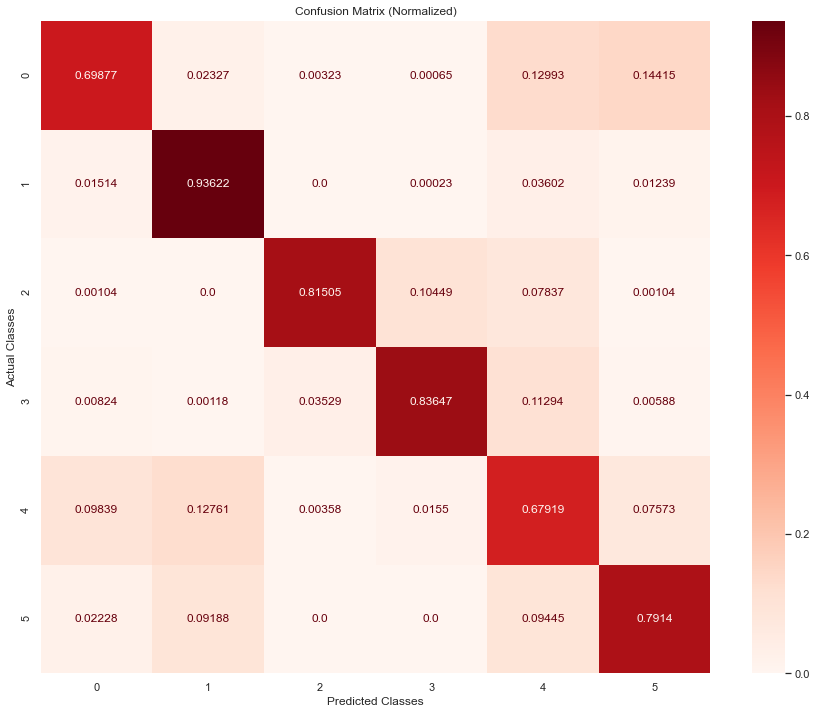

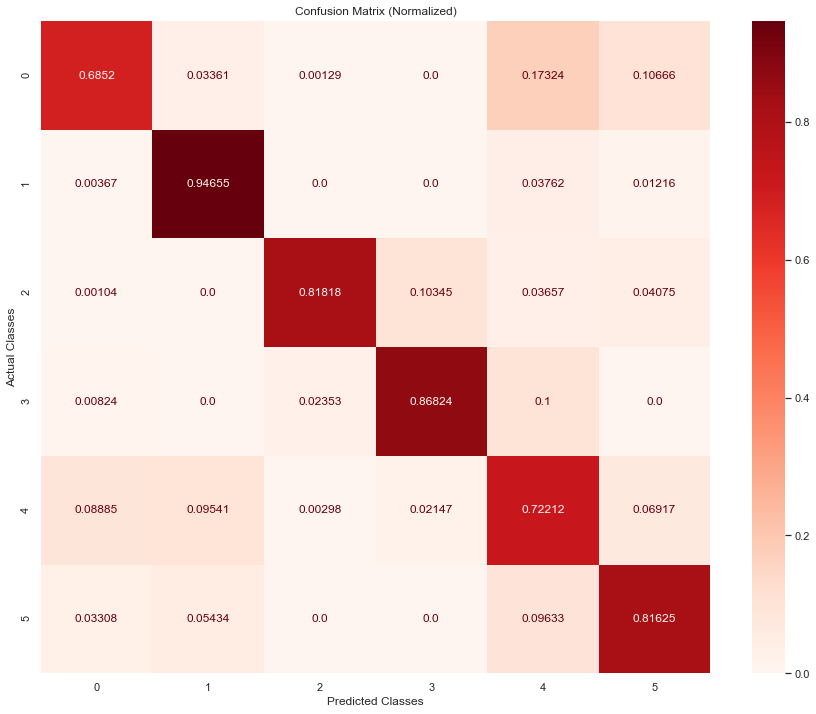

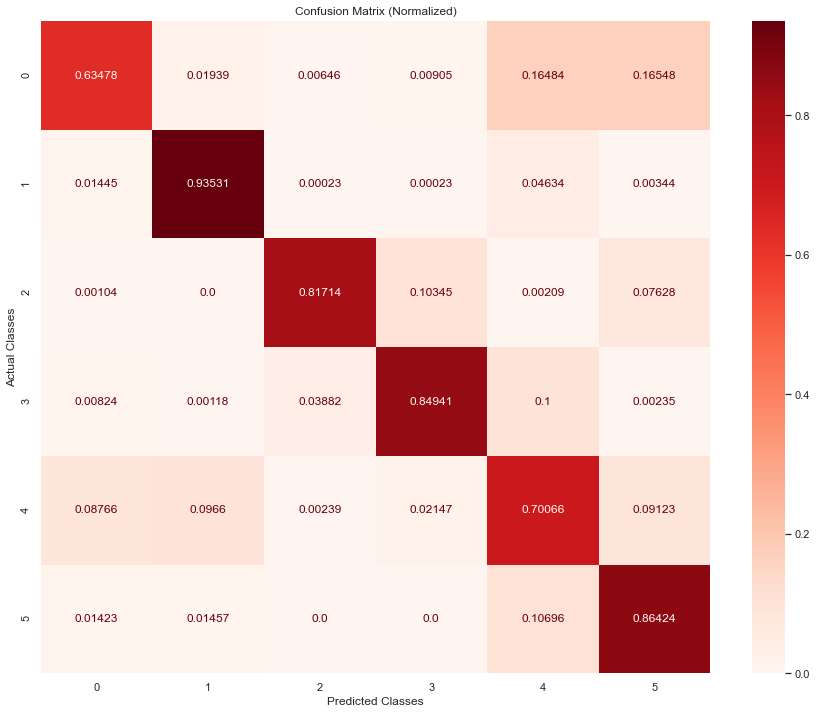

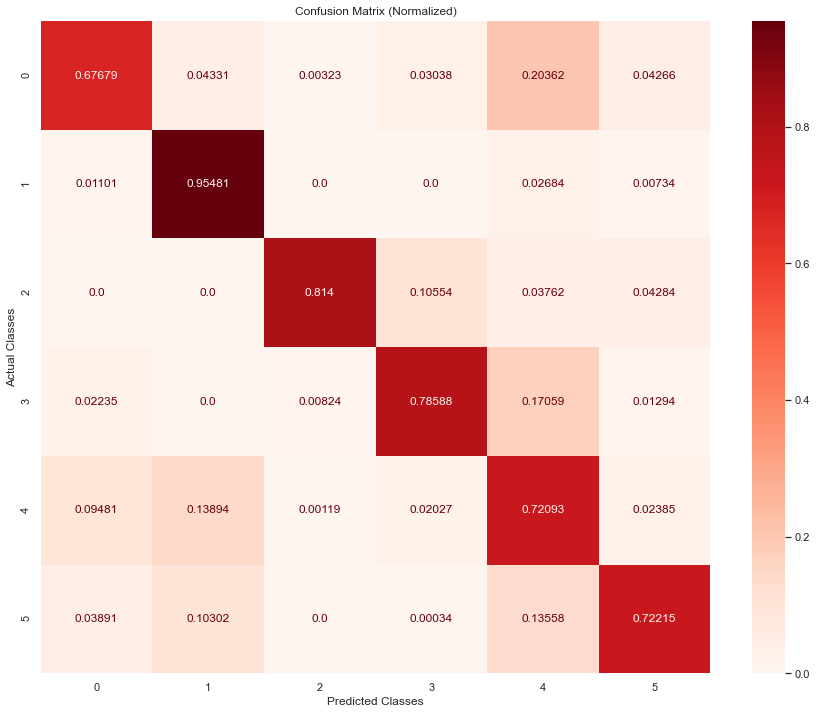

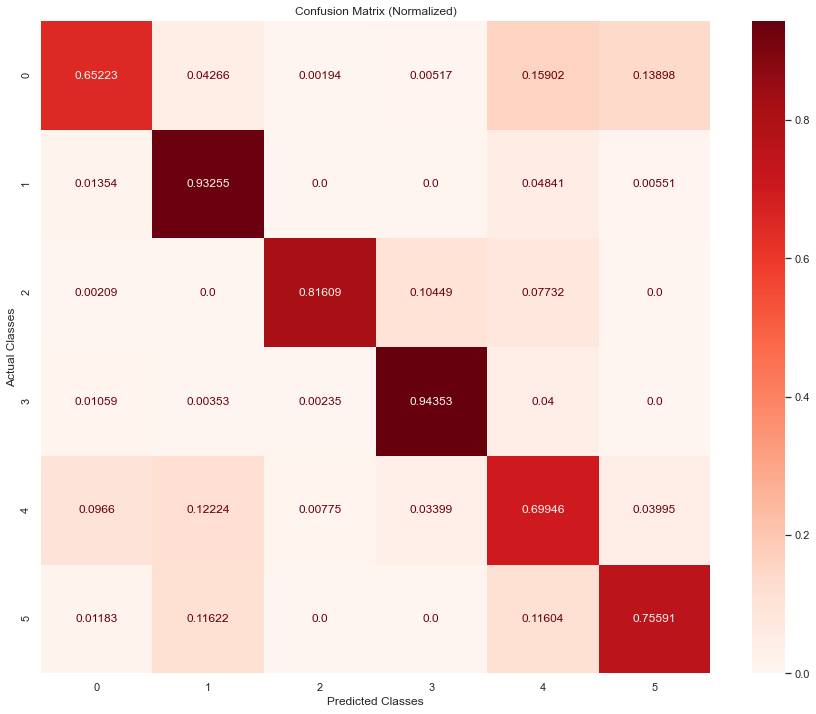

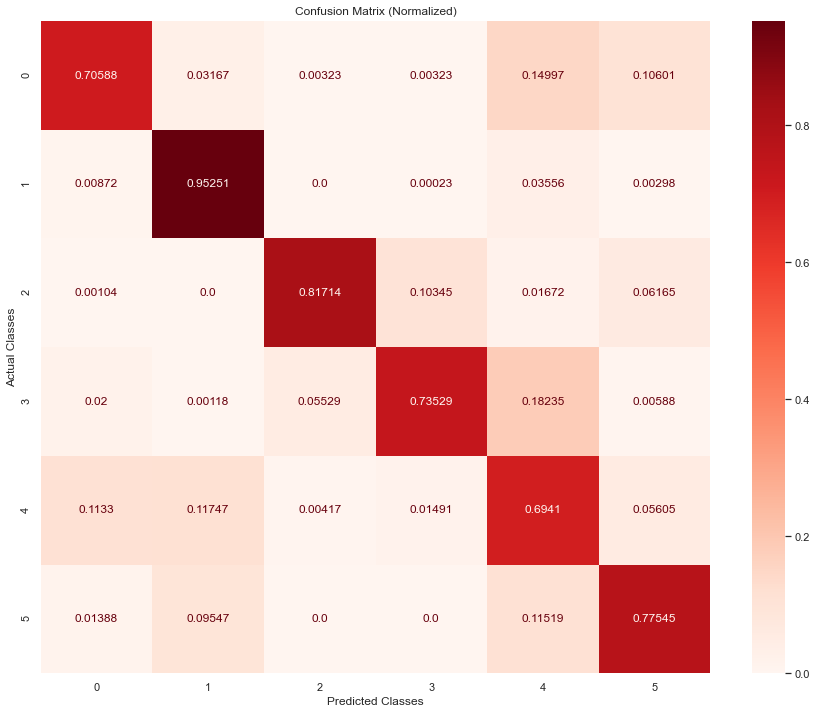

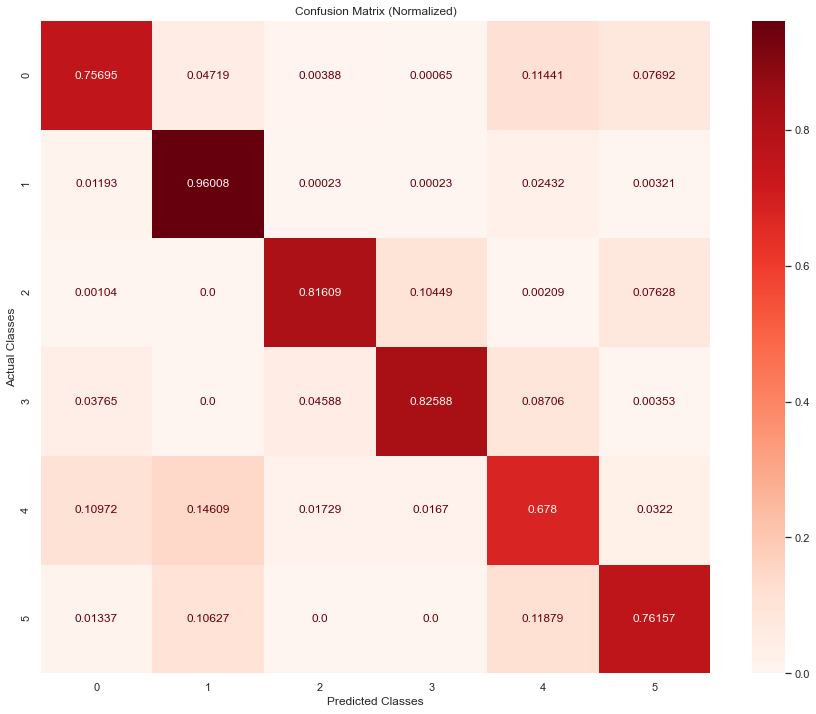

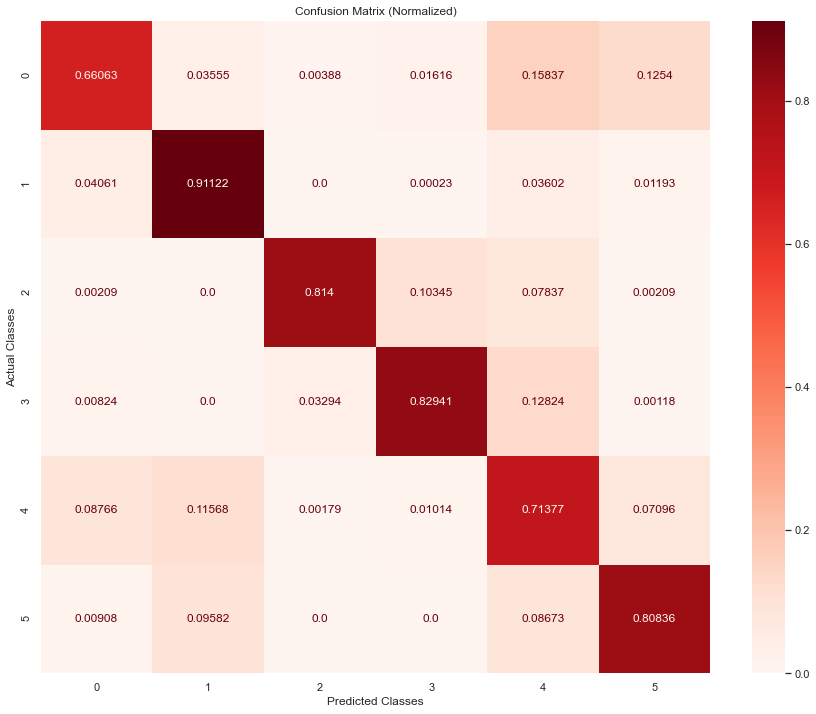

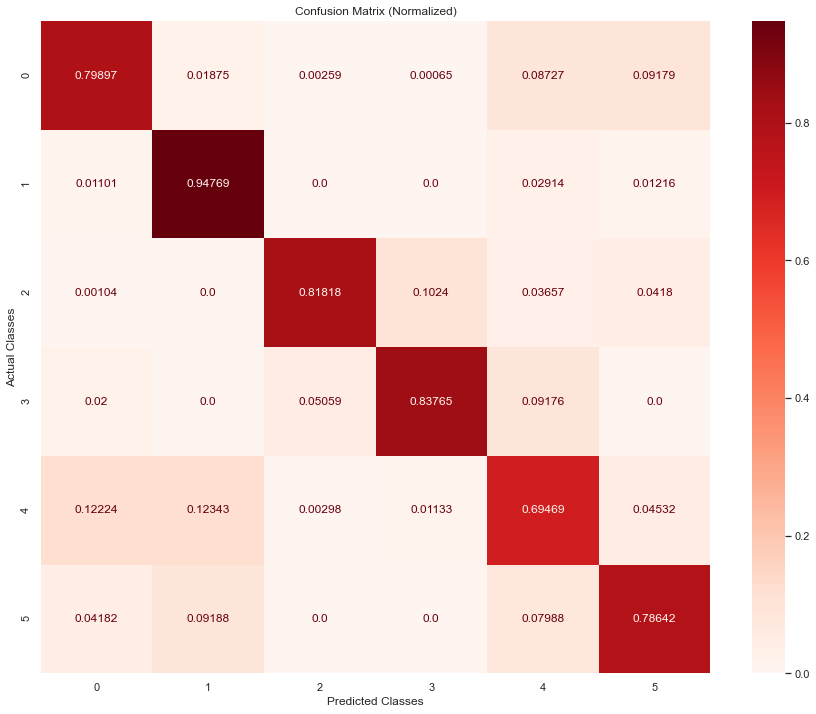

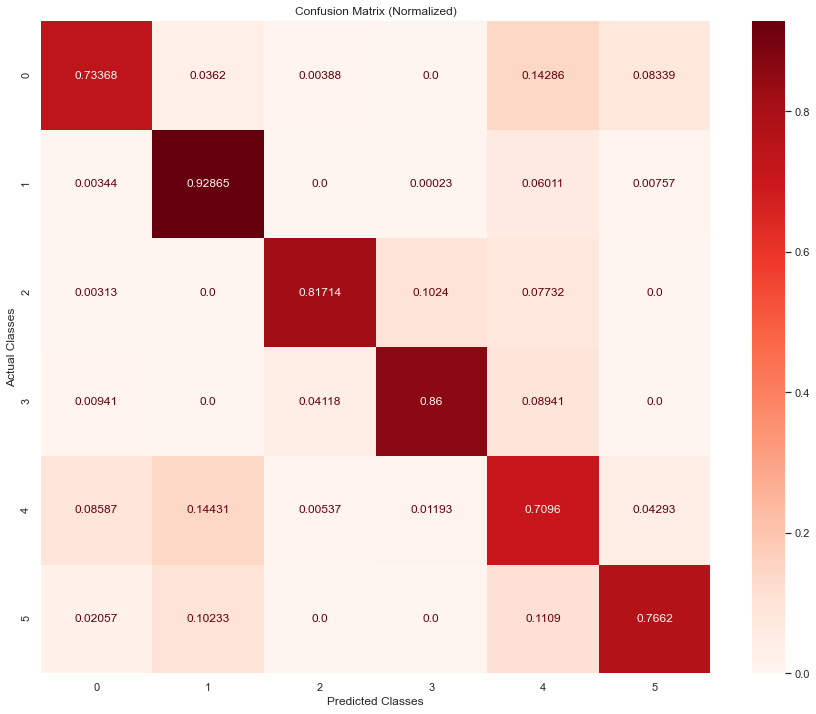

In [103]:
repeat_experiment_dac(model_type="bilstm")

##### Oversampled/balanced data

Run:  1
balanced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 3)
(78137, 2)
(15224, 42, 3)
(15224, 2)
LSTM
Epoch 1/10
1221/1221 [==============================] - 8s 6ms/step - loss: 0.2282 - accuracy: 0.8956 - val_loss: 0.2161 - val_accuracy: 0.9659
Epoch 2/10
1221/1221 [==============================] - 7s 6ms/step - loss: 0.0215 - accuracy: 0.9946 - val_loss: 0.0392 - val_accuracy: 0.9902
Epoch 3/10
1221/1221 [==============================] - 7s 5ms/step - loss: 0.0142 - accuracy: 0.9961 - val_loss: 0.1952 - val_accuracy: 0.9792
Epoch 4/10
1221/1221 [==============================] - 7s 6ms/step - loss: 0.0117 - accuracy: 0.9968 - val_loss: 0.1168 - val_accuracy: 0.9836
Epoch 5/10
1221/1221 [==============================] - 7s 5ms/step - loss: 0.0099 - accuracy: 0.9972 - val_loss: 0.1859 - val_accuracy: 0.9764
Timed stopping at epoch 5 after training for 0:00:30

STATIONARY
LSTM
Epoch 1/5000
416/416 [==============================] - 3s 6ms/step - loss

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  2
balanced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 3)
(78137, 2)
(15224, 42, 3)
(15224, 2)
LSTM
Epoch 1/10
1221/1221 [==============================] - 7s 5ms/step - loss: 0.2335 - accuracy: 0.8924 - val_loss: 0.1372 - val_accuracy: 0.9741
Epoch 2/10
1221/1221 [==============================] - 6s 5ms/step - loss: 0.0210 - accuracy: 0.9948 - val_loss: 0.1189 - val_accuracy: 0.9871
Epoch 3/10
1221/1221 [==============================] - 6s 5ms/step - loss: 0.0152 - accuracy: 0.9961 - val_loss: 0.1047 - val_accuracy: 0.9844
Epoch 4/10
1221/1221 [==============================] - 6s 5ms/step - loss: 0.0107 - accuracy: 0.9973 - val_loss: 0.1307 - val_accuracy: 0.9850
Epoch 5/10
1221/1221 [==============================] - 6s 5ms/step - loss: 0.0092 - accuracy: 0.9977 - val_loss: 0.1498 - val_accuracy: 0.9855
Timed stopping at epoch 5 after training for 0:00:30

STATIONARY
LSTM
Epoch 1/5000
412/412 [==============================] - 3s 5ms/step - loss

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  3
balanced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 3)
(78137, 2)
(15224, 42, 3)
(15224, 2)
LSTM
Epoch 1/10
1221/1221 [==============================] - 7s 5ms/step - loss: 0.2332 - accuracy: 0.8944 - val_loss: 0.1403 - val_accuracy: 0.9744
Epoch 2/10
1221/1221 [==============================] - 6s 5ms/step - loss: 0.0231 - accuracy: 0.9946 - val_loss: 0.0784 - val_accuracy: 0.9867
Epoch 3/10
1221/1221 [==============================] - 7s 5ms/step - loss: 0.0142 - accuracy: 0.9968 - val_loss: 0.0985 - val_accuracy: 0.9853
Epoch 4/10
1221/1221 [==============================] - 6s 5ms/step - loss: 0.0145 - accuracy: 0.9967 - val_loss: 0.0501 - val_accuracy: 0.9886
Epoch 5/10
1221/1221 [==============================] - 6s 5ms/step - loss: 0.0114 - accuracy: 0.9974 - val_loss: 0.0885 - val_accuracy: 0.9806
Timed stopping at epoch 5 after training for 0:00:30

STATIONARY
LSTM
Epoch 1/5000
409/409 [==============================] - 3s 5ms/step - loss

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  4
balanced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 3)
(78137, 2)
(15224, 42, 3)
(15224, 2)
LSTM
Epoch 1/10
1221/1221 [==============================] - 7s 5ms/step - loss: 0.2082 - accuracy: 0.9040 - val_loss: 0.1036 - val_accuracy: 0.9797
Epoch 2/10
1221/1221 [==============================] - 6s 5ms/step - loss: 0.0191 - accuracy: 0.9957 - val_loss: 0.0984 - val_accuracy: 0.9826
Epoch 3/10
1221/1221 [==============================] - 6s 5ms/step - loss: 0.0144 - accuracy: 0.9966 - val_loss: 0.0932 - val_accuracy: 0.9845
Epoch 4/10
1221/1221 [==============================] - 6s 5ms/step - loss: 0.0115 - accuracy: 0.9972 - val_loss: 0.1109 - val_accuracy: 0.9843
Epoch 5/10
1221/1221 [==============================] - 6s 5ms/step - loss: 0.0103 - accuracy: 0.9975 - val_loss: 0.0619 - val_accuracy: 0.9865
Timed stopping at epoch 5 after training for 0:00:30

STATIONARY
LSTM
Epoch 1/5000
412/412 [==============================] - 3s 5ms/step - loss

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  5
balanced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 3)
(78137, 2)
(15224, 42, 3)
(15224, 2)
LSTM
Epoch 1/10
1221/1221 [==============================] - 7s 5ms/step - loss: 0.2550 - accuracy: 0.8831 - val_loss: 0.0716 - val_accuracy: 0.9842
Epoch 2/10
1221/1221 [==============================] - 6s 5ms/step - loss: 0.0214 - accuracy: 0.9948 - val_loss: 0.1244 - val_accuracy: 0.9763
Epoch 3/10
1221/1221 [==============================] - 6s 5ms/step - loss: 0.0153 - accuracy: 0.9963 - val_loss: 0.0853 - val_accuracy: 0.9795
Epoch 4/10
1221/1221 [==============================] - 7s 5ms/step - loss: 0.0132 - accuracy: 0.9969 - val_loss: 0.0414 - val_accuracy: 0.9878
Epoch 5/10
1221/1221 [==============================] - 7s 5ms/step - loss: 0.0113 - accuracy: 0.9972 - val_loss: 0.0313 - val_accuracy: 0.9918
Timed stopping at epoch 5 after training for 0:00:30

STATIONARY
LSTM
Epoch 1/5000
410/410 [==============================] - 3s 6ms/step - loss

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  6
balanced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 3)
(78137, 2)
(15224, 42, 3)
(15224, 2)
LSTM
Epoch 1/10
1221/1221 [==============================] - 7s 5ms/step - loss: 0.1970 - accuracy: 0.9105 - val_loss: 0.1187 - val_accuracy: 0.9758
Epoch 2/10
1221/1221 [==============================] - 6s 5ms/step - loss: 0.0173 - accuracy: 0.9955 - val_loss: 0.0893 - val_accuracy: 0.9809
Epoch 3/10
1221/1221 [==============================] - 6s 5ms/step - loss: 0.0162 - accuracy: 0.9959 - val_loss: 0.0493 - val_accuracy: 0.9893
Epoch 4/10
1221/1221 [==============================] - 6s 5ms/step - loss: 0.0116 - accuracy: 0.9971 - val_loss: 0.1219 - val_accuracy: 0.9834
Epoch 5/10
1221/1221 [==============================] - 6s 5ms/step - loss: 0.0122 - accuracy: 0.9969 - val_loss: 0.1118 - val_accuracy: 0.9853
Timed stopping at epoch 5 after training for 0:00:30

STATIONARY
LSTM
Epoch 1/5000
410/410 [==============================] - 3s 5ms/step - loss

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  7
balanced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 3)
(78137, 2)
(15224, 42, 3)
(15224, 2)
LSTM
Epoch 1/10
1221/1221 [==============================] - 7s 5ms/step - loss: 0.2775 - accuracy: 0.8647 - val_loss: 0.1058 - val_accuracy: 0.9825
Epoch 2/10
1221/1221 [==============================] - 6s 5ms/step - loss: 0.0233 - accuracy: 0.9940 - val_loss: 0.0947 - val_accuracy: 0.9833
Epoch 3/10
1221/1221 [==============================] - 6s 5ms/step - loss: 0.0130 - accuracy: 0.9968 - val_loss: 0.0990 - val_accuracy: 0.9861
Epoch 4/10
1221/1221 [==============================] - 6s 5ms/step - loss: 0.0119 - accuracy: 0.9970 - val_loss: 0.0576 - val_accuracy: 0.9858
Epoch 5/10
1221/1221 [==============================] - 6s 5ms/step - loss: 0.0106 - accuracy: 0.9973 - val_loss: 0.1111 - val_accuracy: 0.9773
Timed stopping at epoch 5 after training for 0:00:30

STATIONARY
LSTM
Epoch 1/5000
411/411 [==============================] - 3s 5ms/step - loss

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  8
balanced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 3)
(78137, 2)
(15224, 42, 3)
(15224, 2)
LSTM
Epoch 1/10
1221/1221 [==============================] - 7s 5ms/step - loss: 0.2205 - accuracy: 0.9002 - val_loss: 0.2641 - val_accuracy: 0.9455
Epoch 2/10
1221/1221 [==============================] - 6s 5ms/step - loss: 0.0210 - accuracy: 0.9948 - val_loss: 0.1676 - val_accuracy: 0.9756
Epoch 3/10
1221/1221 [==============================] - 7s 5ms/step - loss: 0.0159 - accuracy: 0.9965 - val_loss: 0.1747 - val_accuracy: 0.9842
Epoch 4/10
1221/1221 [==============================] - 6s 5ms/step - loss: 0.0121 - accuracy: 0.9972 - val_loss: 0.0931 - val_accuracy: 0.9896
Epoch 5/10
1221/1221 [==============================] - 7s 6ms/step - loss: 0.0124 - accuracy: 0.9971 - val_loss: 0.1030 - val_accuracy: 0.9871
Timed stopping at epoch 5 after training for 0:00:30

STATIONARY
LSTM
Epoch 1/5000
412/412 [==============================] - 3s 6ms/step - loss

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  9
balanced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 3)
(78137, 2)
(15224, 42, 3)
(15224, 2)
LSTM
Epoch 1/10
1221/1221 [==============================] - 7s 5ms/step - loss: 0.2295 - accuracy: 0.8936 - val_loss: 0.1078 - val_accuracy: 0.9727
Epoch 2/10
1221/1221 [==============================] - 7s 5ms/step - loss: 0.0179 - accuracy: 0.9952 - val_loss: 0.1223 - val_accuracy: 0.9708
Epoch 3/10
1221/1221 [==============================] - 6s 5ms/step - loss: 0.0123 - accuracy: 0.9968 - val_loss: 0.1149 - val_accuracy: 0.9804
Epoch 4/10
1221/1221 [==============================] - 6s 5ms/step - loss: 0.0110 - accuracy: 0.9970 - val_loss: 0.1228 - val_accuracy: 0.9828
Epoch 5/10
1221/1221 [==============================] - 6s 5ms/step - loss: 0.0096 - accuracy: 0.9972 - val_loss: 0.1366 - val_accuracy: 0.9810
Timed stopping at epoch 5 after training for 0:00:30

STATIONARY
LSTM
Epoch 1/5000
412/412 [==============================] - 3s 5ms/step - loss

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  10
balanced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 3)
(78137, 2)
(15224, 42, 3)
(15224, 2)
LSTM
Epoch 1/10
1221/1221 [==============================] - 7s 5ms/step - loss: 0.2058 - accuracy: 0.9052 - val_loss: 0.1529 - val_accuracy: 0.9798
Epoch 2/10
1221/1221 [==============================] - 6s 5ms/step - loss: 0.0160 - accuracy: 0.9958 - val_loss: 0.1054 - val_accuracy: 0.9846
Epoch 3/10
1221/1221 [==============================] - 6s 5ms/step - loss: 0.0122 - accuracy: 0.9965 - val_loss: 0.0912 - val_accuracy: 0.9878
Epoch 4/10
1221/1221 [==============================] - 6s 5ms/step - loss: 0.0095 - accuracy: 0.9975 - val_loss: 0.1276 - val_accuracy: 0.9739
Epoch 5/10
1221/1221 [==============================] - 6s 5ms/step - loss: 0.0078 - accuracy: 0.9978 - val_loss: 0.1835 - val_accuracy: 0.9816
Timed stopping at epoch 5 after training for 0:00:30

STATIONARY
LSTM
Epoch 1/5000
411/411 [==============================] - 3s 6ms/step - los

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


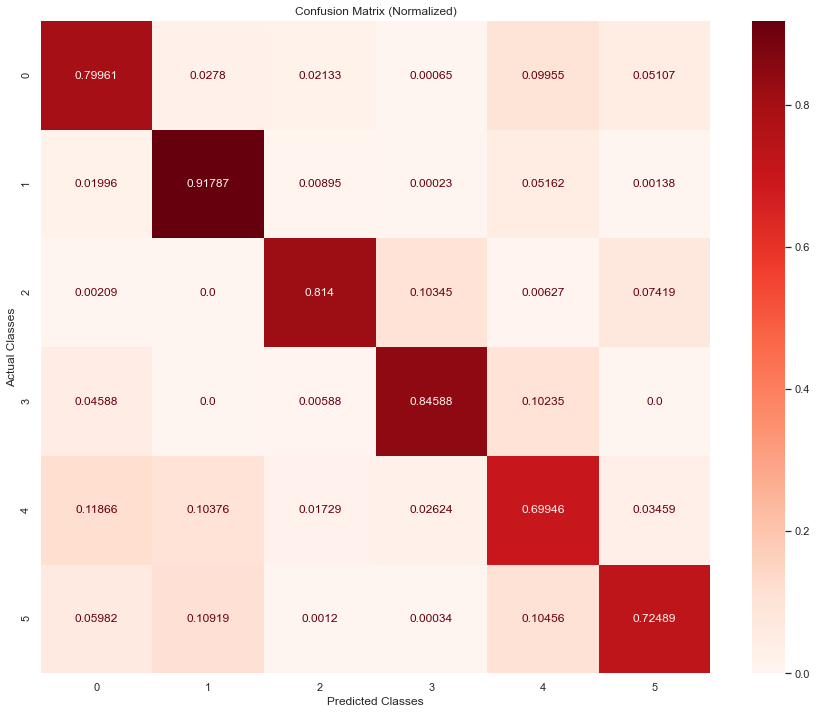

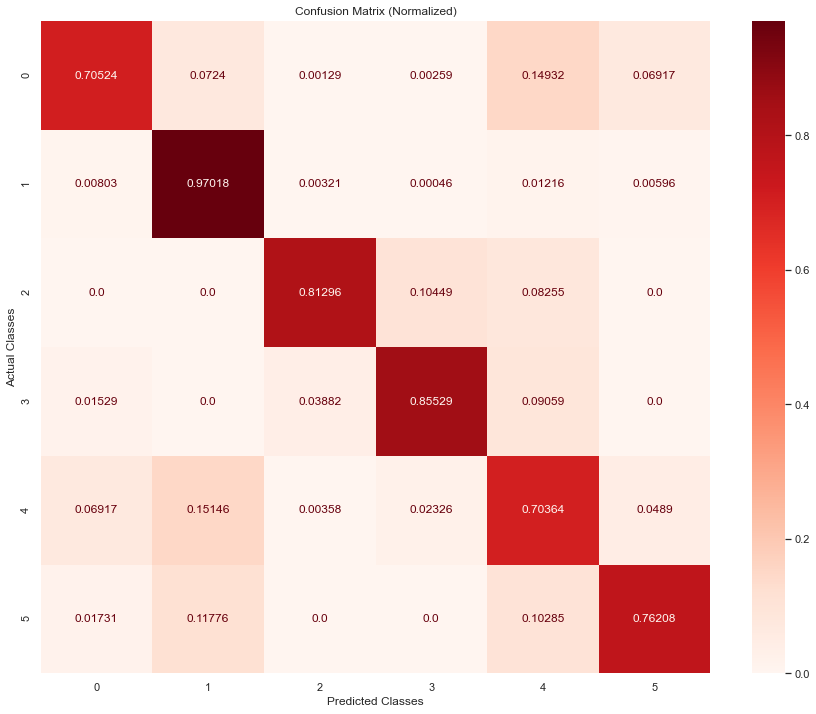

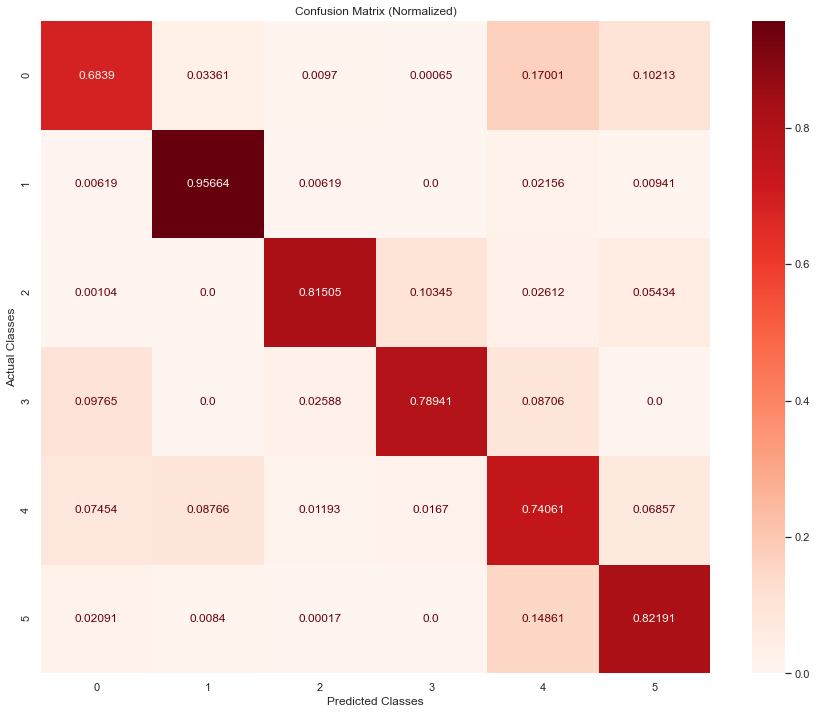

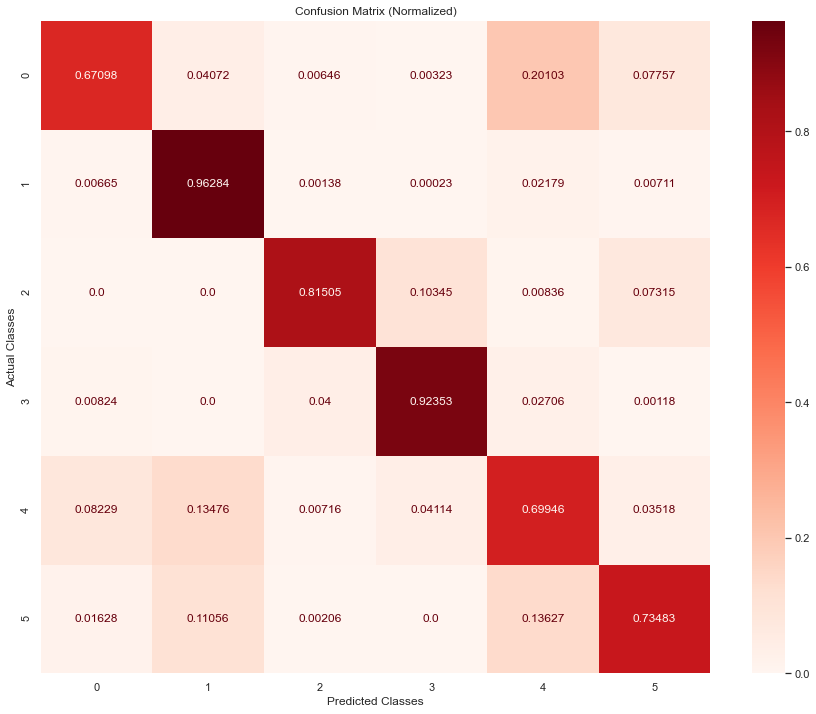

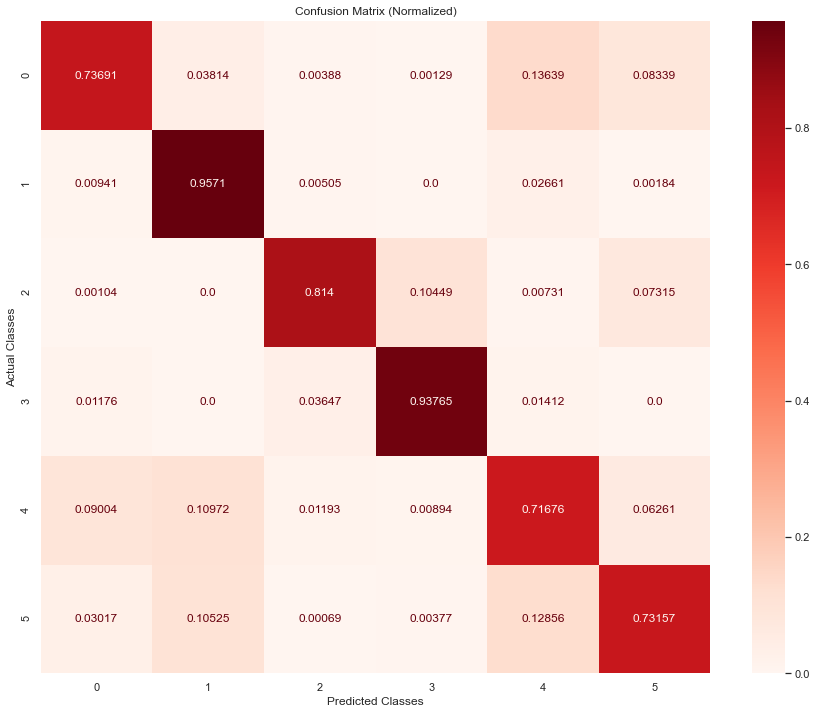

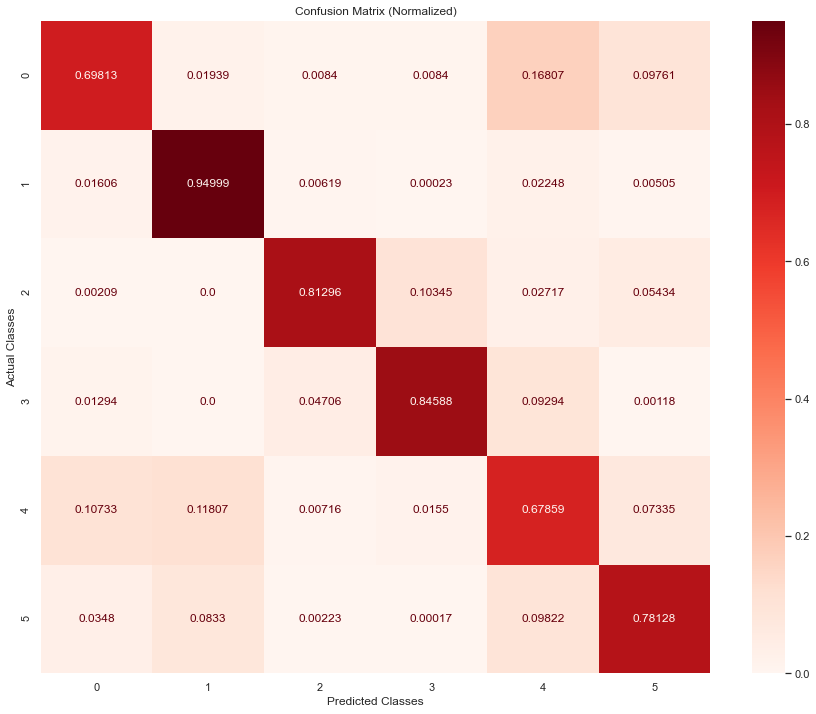

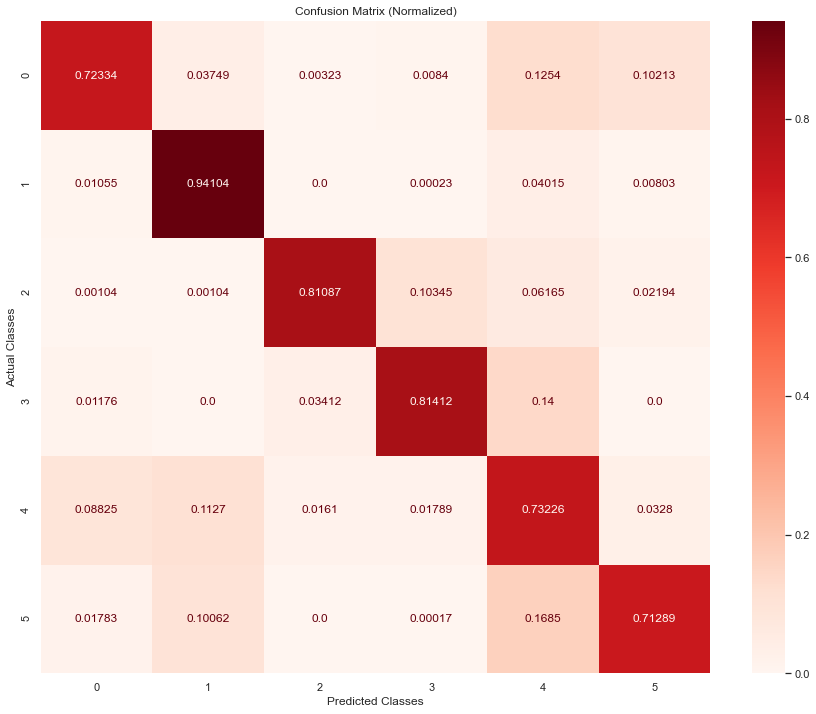

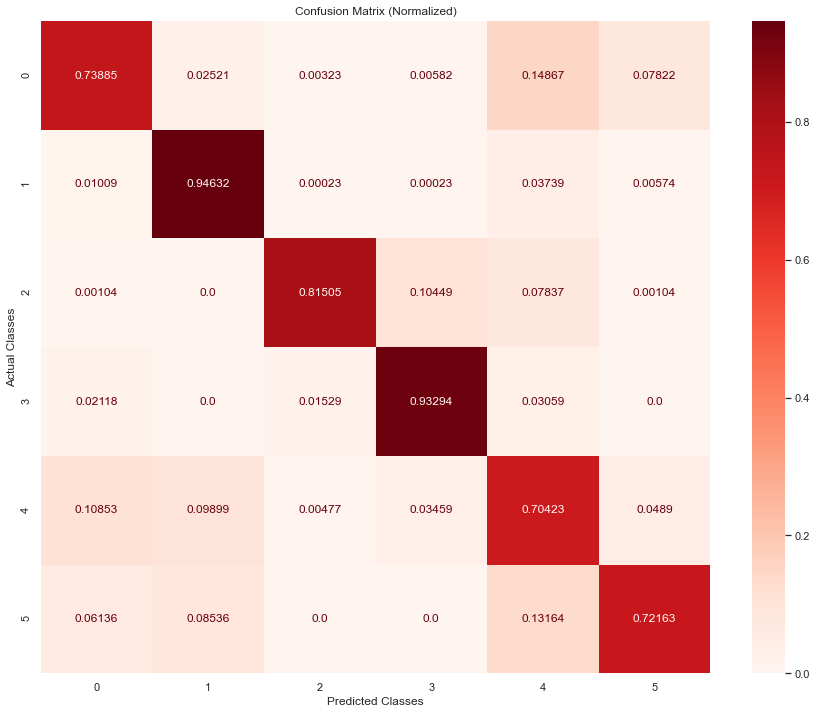

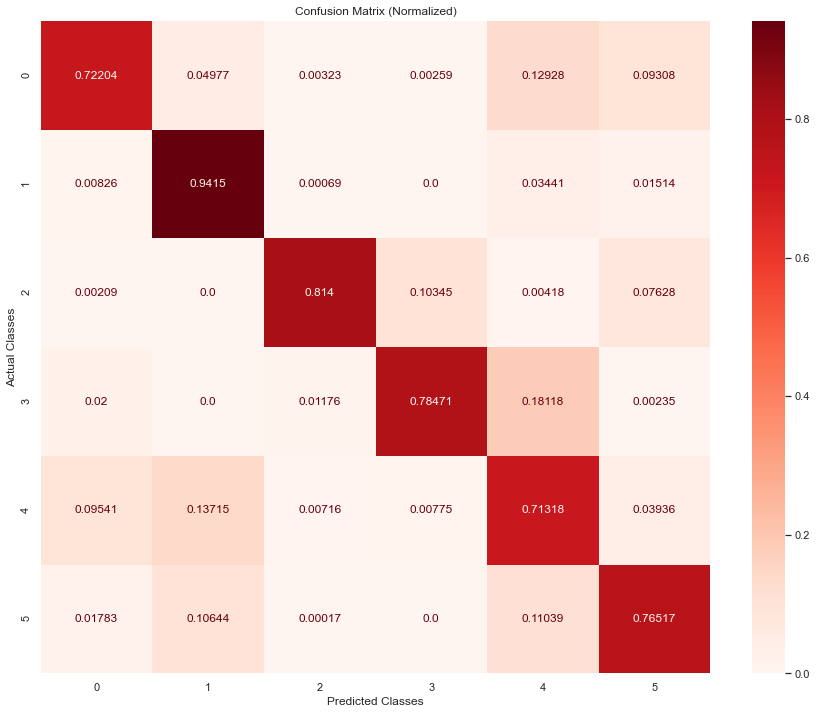

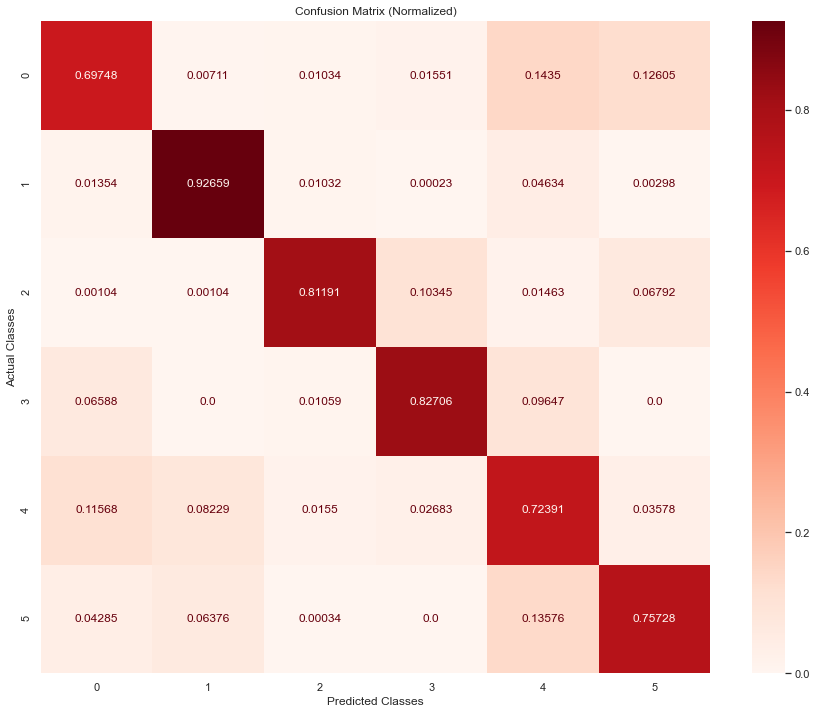

In [104]:
repeat_experiment_dac(model_type="lstm", data = "balanced")

Run:  1
balanced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 3)
(78137, 2)
(15224, 42, 3)
(15224, 2)
CNN-LSTM
Epoch 1/10
1221/1221 [==============================] - 7s 4ms/step - loss: 0.0264 - accuracy: 0.9897 - val_loss: 0.0459 - val_accuracy: 0.9875
Epoch 2/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0092 - accuracy: 0.9976 - val_loss: 0.0867 - val_accuracy: 0.9804
Epoch 3/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0078 - accuracy: 0.9979 - val_loss: 0.1301 - val_accuracy: 0.9773
Epoch 4/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0060 - accuracy: 0.9983 - val_loss: 0.1007 - val_accuracy: 0.9846
Epoch 5/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0064 - accuracy: 0.9983 - val_loss: 0.1405 - val_accuracy: 0.9807
Epoch 6/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0050 - accuracy: 0.9984 - val_loss: 0.1629 - val_accuracy: 0.9

810/810 [==============================] - 3s 4ms/step - loss: 0.0516 - accuracy: 0.9822 - val_loss: 1.5580 - val_accuracy: 0.7920
Epoch 25/5000
810/810 [==============================] - 3s 4ms/step - loss: 0.0517 - accuracy: 0.9826 - val_loss: 1.4657 - val_accuracy: 0.8073
Epoch 26/5000
810/810 [==============================] - 3s 4ms/step - loss: 0.0471 - accuracy: 0.9836 - val_loss: 1.5067 - val_accuracy: 0.7950
Epoch 27/5000
810/810 [==============================] - 3s 4ms/step - loss: 0.0480 - accuracy: 0.9834 - val_loss: 1.6377 - val_accuracy: 0.7591
Epoch 28/5000
810/810 [==============================] - 3s 4ms/step - loss: 0.0480 - accuracy: 0.9839 - val_loss: 1.5634 - val_accuracy: 0.7877
Epoch 29/5000
810/810 [==============================] - 3s 4ms/step - loss: 0.0434 - accuracy: 0.9850 - val_loss: 1.5651 - val_accuracy: 0.8151
Epoch 30/5000
810/810 [==============================] - 3s 4ms/step - loss: 0.0441 - accuracy: 0.9848 - val_loss: 1.7007 - val_accuracy: 0.7912

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  2
balanced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 3)
(78137, 2)
(15224, 42, 3)
(15224, 2)
CNN-LSTM
Epoch 1/10
1221/1221 [==============================] - 6s 4ms/step - loss: 0.0258 - accuracy: 0.9902 - val_loss: 0.0562 - val_accuracy: 0.9836
Epoch 2/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0095 - accuracy: 0.9976 - val_loss: 0.0919 - val_accuracy: 0.9813
Epoch 3/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0079 - accuracy: 0.9978 - val_loss: 0.1151 - val_accuracy: 0.9803
Epoch 4/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0065 - accuracy: 0.9984 - val_loss: 0.1694 - val_accuracy: 0.9781
Epoch 5/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0065 - accuracy: 0.9982 - val_loss: 0.1662 - val_accuracy: 0.9766
Epoch 6/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0046 - accuracy: 0.9985 - val_loss: 0.1641 - val_accuracy: 0.9

810/810 [==============================] - 4s 4ms/step - loss: 0.0584 - accuracy: 0.9800 - val_loss: 1.2939 - val_accuracy: 0.7990
Epoch 25/5000
810/810 [==============================] - 4s 4ms/step - loss: 0.0536 - accuracy: 0.9816 - val_loss: 1.2727 - val_accuracy: 0.7909
Epoch 26/5000
810/810 [==============================] - 4s 4ms/step - loss: 0.0529 - accuracy: 0.9819 - val_loss: 1.3299 - val_accuracy: 0.7875
Epoch 27/5000
810/810 [==============================] - 4s 5ms/step - loss: 0.0488 - accuracy: 0.9833 - val_loss: 1.2238 - val_accuracy: 0.7896
Epoch 28/5000
810/810 [==============================] - 4s 4ms/step - loss: 0.0499 - accuracy: 0.9831 - val_loss: 1.3072 - val_accuracy: 0.7952
Epoch 29/5000
810/810 [==============================] - 4s 4ms/step - loss: 0.0477 - accuracy: 0.9836 - val_loss: 1.4427 - val_accuracy: 0.7904
Epoch 30/5000
810/810 [==============================] - 4s 5ms/step - loss: 0.0434 - accuracy: 0.9855 - val_loss: 1.3642 - val_accuracy: 0.8012

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  3
balanced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 3)
(78137, 2)
(15224, 42, 3)
(15224, 2)
CNN-LSTM
Epoch 1/10
1221/1221 [==============================] - 6s 4ms/step - loss: 0.0266 - accuracy: 0.9903 - val_loss: 0.0661 - val_accuracy: 0.9842
Epoch 2/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0097 - accuracy: 0.9977 - val_loss: 0.0647 - val_accuracy: 0.9838
Epoch 3/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0076 - accuracy: 0.9979 - val_loss: 0.0992 - val_accuracy: 0.9859
Epoch 4/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0075 - accuracy: 0.9981 - val_loss: 0.1497 - val_accuracy: 0.9756
Epoch 5/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0061 - accuracy: 0.9983 - val_loss: 0.1150 - val_accuracy: 0.9846
Epoch 6/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0052 - accuracy: 0.9985 - val_loss: 0.1517 - val_accuracy: 0.9

810/810 [==============================] - 3s 4ms/step - loss: 0.0549 - accuracy: 0.9818 - val_loss: 1.3738 - val_accuracy: 0.7677
Epoch 24/5000
810/810 [==============================] - 3s 4ms/step - loss: 0.0516 - accuracy: 0.9825 - val_loss: 1.3479 - val_accuracy: 0.8002
Epoch 25/5000
810/810 [==============================] - 3s 4ms/step - loss: 0.0495 - accuracy: 0.9835 - val_loss: 1.4711 - val_accuracy: 0.7748
Epoch 26/5000
810/810 [==============================] - 4s 4ms/step - loss: 0.0481 - accuracy: 0.9836 - val_loss: 1.3553 - val_accuracy: 0.7851
Epoch 27/5000
810/810 [==============================] - 3s 4ms/step - loss: 0.0466 - accuracy: 0.9834 - val_loss: 1.4928 - val_accuracy: 0.7763
Epoch 28/5000
810/810 [==============================] - 4s 4ms/step - loss: 0.0434 - accuracy: 0.9847 - val_loss: 1.4158 - val_accuracy: 0.7969
Epoch 29/5000
810/810 [==============================] - 4s 4ms/step - loss: 0.0434 - accuracy: 0.9857 - val_loss: 1.4516 - val_accuracy: 0.7794

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  4
balanced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 3)
(78137, 2)
(15224, 42, 3)
(15224, 2)
CNN-LSTM
Epoch 1/10
1221/1221 [==============================] - 6s 4ms/step - loss: 0.0262 - accuracy: 0.9903 - val_loss: 0.0585 - val_accuracy: 0.9846
Epoch 2/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0092 - accuracy: 0.9977 - val_loss: 0.0636 - val_accuracy: 0.9833
Epoch 3/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0077 - accuracy: 0.9982 - val_loss: 0.0922 - val_accuracy: 0.9839
Epoch 4/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0070 - accuracy: 0.9981 - val_loss: 0.0942 - val_accuracy: 0.9829
Epoch 5/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0064 - accuracy: 0.9983 - val_loss: 0.1635 - val_accuracy: 0.9727
Epoch 6/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0048 - accuracy: 0.9985 - val_loss: 0.1439 - val_accuracy: 0.9

Epoch 22/5000
811/811 [==============================] - 3s 4ms/step - loss: 0.0594 - accuracy: 0.9792 - val_loss: 1.5264 - val_accuracy: 0.7866
Epoch 23/5000
811/811 [==============================] - 3s 4ms/step - loss: 0.0575 - accuracy: 0.9801 - val_loss: 1.5473 - val_accuracy: 0.7994
Epoch 24/5000
811/811 [==============================] - 3s 4ms/step - loss: 0.0555 - accuracy: 0.9812 - val_loss: 1.3871 - val_accuracy: 0.7894
Epoch 25/5000
811/811 [==============================] - 3s 4ms/step - loss: 0.0531 - accuracy: 0.9817 - val_loss: 1.4644 - val_accuracy: 0.7930
Epoch 26/5000
811/811 [==============================] - 3s 4ms/step - loss: 0.0530 - accuracy: 0.9815 - val_loss: 1.5594 - val_accuracy: 0.7846
Epoch 27/5000
811/811 [==============================] - 3s 4ms/step - loss: 0.0493 - accuracy: 0.9833 - val_loss: 1.4577 - val_accuracy: 0.7834
Epoch 28/5000
811/811 [==============================] - 3s 4ms/step - loss: 0.0492 - accuracy: 0.9825 - val_loss: 1.4962 - val_ac

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  5
balanced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 3)
(78137, 2)
(15224, 42, 3)
(15224, 2)
CNN-LSTM
Epoch 1/10
1221/1221 [==============================] - 7s 4ms/step - loss: 0.0263 - accuracy: 0.9898 - val_loss: 0.1034 - val_accuracy: 0.9775
Epoch 2/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0094 - accuracy: 0.9976 - val_loss: 0.0603 - val_accuracy: 0.9887
Epoch 3/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0076 - accuracy: 0.9980 - val_loss: 0.0921 - val_accuracy: 0.9846
Epoch 4/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0060 - accuracy: 0.9983 - val_loss: 0.1694 - val_accuracy: 0.9811
Epoch 5/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0049 - accuracy: 0.9984 - val_loss: 0.1680 - val_accuracy: 0.9842
Epoch 6/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0047 - accuracy: 0.9986 - val_loss: 0.1954 - val_accuracy: 0.9

810/810 [==============================] - 3s 4ms/step - loss: 0.0558 - accuracy: 0.9812 - val_loss: 1.2522 - val_accuracy: 0.7935
Epoch 24/5000
810/810 [==============================] - 3s 4ms/step - loss: 0.0526 - accuracy: 0.9814 - val_loss: 1.3895 - val_accuracy: 0.7880
Epoch 25/5000
810/810 [==============================] - 3s 4ms/step - loss: 0.0510 - accuracy: 0.9826 - val_loss: 1.4829 - val_accuracy: 0.7807
Epoch 26/5000
810/810 [==============================] - 3s 4ms/step - loss: 0.0519 - accuracy: 0.9820 - val_loss: 1.4470 - val_accuracy: 0.7979
Epoch 27/5000
810/810 [==============================] - 3s 4ms/step - loss: 0.0474 - accuracy: 0.9834 - val_loss: 1.4723 - val_accuracy: 0.7996
Epoch 28/5000
810/810 [==============================] - 3s 4ms/step - loss: 0.0462 - accuracy: 0.9843 - val_loss: 1.5133 - val_accuracy: 0.7954
Epoch 29/5000
810/810 [==============================] - 3s 4ms/step - loss: 0.0443 - accuracy: 0.9846 - val_loss: 1.5604 - val_accuracy: 0.8055

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  6
balanced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 3)
(78137, 2)
(15224, 42, 3)
(15224, 2)
CNN-LSTM
Epoch 1/10
1221/1221 [==============================] - 6s 4ms/step - loss: 0.0261 - accuracy: 0.9901 - val_loss: 0.0579 - val_accuracy: 0.9855
Epoch 2/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0092 - accuracy: 0.9977 - val_loss: 0.0735 - val_accuracy: 0.9852
Epoch 3/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0076 - accuracy: 0.9982 - val_loss: 0.0729 - val_accuracy: 0.9893
Epoch 4/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0061 - accuracy: 0.9984 - val_loss: 0.1868 - val_accuracy: 0.9780
Epoch 5/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0057 - accuracy: 0.9983 - val_loss: 0.1768 - val_accuracy: 0.9850
Epoch 6/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0041 - accuracy: 0.9986 - val_loss: 0.1752 - val_accuracy: 0.9

Epoch 23/5000
810/810 [==============================] - 4s 4ms/step - loss: 0.0541 - accuracy: 0.9815 - val_loss: 1.4341 - val_accuracy: 0.8042
Epoch 24/5000
810/810 [==============================] - 3s 4ms/step - loss: 0.0513 - accuracy: 0.9823 - val_loss: 1.4520 - val_accuracy: 0.7997
Epoch 25/5000
810/810 [==============================] - 3s 4ms/step - loss: 0.0500 - accuracy: 0.9830 - val_loss: 1.3826 - val_accuracy: 0.7886
Epoch 26/5000
810/810 [==============================] - 3s 4ms/step - loss: 0.0510 - accuracy: 0.9824 - val_loss: 1.4179 - val_accuracy: 0.7865
Epoch 27/5000
810/810 [==============================] - 3s 4ms/step - loss: 0.0470 - accuracy: 0.9841 - val_loss: 1.4586 - val_accuracy: 0.7865
Epoch 28/5000
810/810 [==============================] - 3s 4ms/step - loss: 0.0443 - accuracy: 0.9850 - val_loss: 1.3133 - val_accuracy: 0.8182
Epoch 29/5000
810/810 [==============================] - 3s 4ms/step - loss: 0.0438 - accuracy: 0.9850 - val_loss: 1.4367 - val_ac

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  7
balanced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 3)
(78137, 2)
(15224, 42, 3)
(15224, 2)
CNN-LSTM
Epoch 1/10
1221/1221 [==============================] - 6s 4ms/step - loss: 0.0269 - accuracy: 0.9904 - val_loss: 0.0788 - val_accuracy: 0.9788
Epoch 2/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0094 - accuracy: 0.9977 - val_loss: 0.0873 - val_accuracy: 0.9829
Epoch 3/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0078 - accuracy: 0.9980 - val_loss: 0.1002 - val_accuracy: 0.9851
Epoch 4/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0072 - accuracy: 0.9981 - val_loss: 0.1324 - val_accuracy: 0.9837
Epoch 5/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0065 - accuracy: 0.9983 - val_loss: 0.1427 - val_accuracy: 0.9831
Epoch 6/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0052 - accuracy: 0.9986 - val_loss: 0.1549 - val_accuracy: 0.9

810/810 [==============================] - 3s 4ms/step - loss: 0.0574 - accuracy: 0.9802 - val_loss: 1.0600 - val_accuracy: 0.7909
Epoch 24/5000
810/810 [==============================] - 3s 4ms/step - loss: 0.0572 - accuracy: 0.9802 - val_loss: 1.0505 - val_accuracy: 0.8051
Epoch 25/5000
810/810 [==============================] - 3s 4ms/step - loss: 0.0549 - accuracy: 0.9814 - val_loss: 1.1283 - val_accuracy: 0.7993
Epoch 26/5000
810/810 [==============================] - 3s 4ms/step - loss: 0.0516 - accuracy: 0.9828 - val_loss: 1.1105 - val_accuracy: 0.7855
Epoch 27/5000
810/810 [==============================] - 3s 4ms/step - loss: 0.0516 - accuracy: 0.9821 - val_loss: 1.0705 - val_accuracy: 0.8143
Epoch 28/5000
810/810 [==============================] - 3s 4ms/step - loss: 0.0494 - accuracy: 0.9833 - val_loss: 1.0853 - val_accuracy: 0.8033
Epoch 29/5000
810/810 [==============================] - 3s 4ms/step - loss: 0.0471 - accuracy: 0.9843 - val_loss: 1.1460 - val_accuracy: 0.7974

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  8
balanced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 3)
(78137, 2)
(15224, 42, 3)
(15224, 2)
CNN-LSTM
Epoch 1/10
1221/1221 [==============================] - 7s 5ms/step - loss: 0.0264 - accuracy: 0.9905 - val_loss: 0.0718 - val_accuracy: 0.9833
Epoch 2/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0089 - accuracy: 0.9977 - val_loss: 0.1147 - val_accuracy: 0.9808
Epoch 3/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0081 - accuracy: 0.9979 - val_loss: 0.1171 - val_accuracy: 0.9786
Epoch 4/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0067 - accuracy: 0.9981 - val_loss: 0.1394 - val_accuracy: 0.9833
Epoch 5/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0057 - accuracy: 0.9985 - val_loss: 0.2078 - val_accuracy: 0.9769
Epoch 6/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0043 - accuracy: 0.9986 - val_loss: 0.2070 - val_accuracy: 0.9

810/810 [==============================] - 3s 4ms/step - loss: 0.0500 - accuracy: 0.9829 - val_loss: 1.2168 - val_accuracy: 0.7931
Epoch 24/5000
810/810 [==============================] - 4s 4ms/step - loss: 0.0487 - accuracy: 0.9834 - val_loss: 1.1719 - val_accuracy: 0.8138
Epoch 25/5000
810/810 [==============================] - 3s 4ms/step - loss: 0.0484 - accuracy: 0.9832 - val_loss: 1.1950 - val_accuracy: 0.7869
Epoch 26/5000
810/810 [==============================] - 3s 4ms/step - loss: 0.0455 - accuracy: 0.9840 - val_loss: 1.1722 - val_accuracy: 0.8117
Epoch 27/5000
810/810 [==============================] - 3s 4ms/step - loss: 0.0431 - accuracy: 0.9848 - val_loss: 1.3319 - val_accuracy: 0.7907
Epoch 28/5000
810/810 [==============================] - 4s 4ms/step - loss: 0.0430 - accuracy: 0.9850 - val_loss: 1.3226 - val_accuracy: 0.8004
Epoch 29/5000
810/810 [==============================] - 4s 4ms/step - loss: 0.0415 - accuracy: 0.9855 - val_loss: 1.2386 - val_accuracy: 0.7993

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  9
balanced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 3)
(78137, 2)
(15224, 42, 3)
(15224, 2)
CNN-LSTM
Epoch 1/10
1221/1221 [==============================] - 6s 4ms/step - loss: 0.0243 - accuracy: 0.9910 - val_loss: 0.0641 - val_accuracy: 0.9842
Epoch 2/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0091 - accuracy: 0.9976 - val_loss: 0.0601 - val_accuracy: 0.9867
Epoch 3/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0081 - accuracy: 0.9977 - val_loss: 0.1055 - val_accuracy: 0.9833
Epoch 4/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0069 - accuracy: 0.9983 - val_loss: 0.1865 - val_accuracy: 0.9787
Epoch 5/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0054 - accuracy: 0.9983 - val_loss: 0.1725 - val_accuracy: 0.9790
Epoch 6/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0056 - accuracy: 0.9984 - val_loss: 0.2165 - val_accuracy: 0.9

810/810 [==============================] - 3s 4ms/step - loss: 0.0552 - accuracy: 0.9812 - val_loss: 1.3729 - val_accuracy: 0.8086
Epoch 25/5000
810/810 [==============================] - 3s 4ms/step - loss: 0.0531 - accuracy: 0.9814 - val_loss: 1.3472 - val_accuracy: 0.8140
Epoch 26/5000
810/810 [==============================] - 3s 4ms/step - loss: 0.0508 - accuracy: 0.9823 - val_loss: 1.3704 - val_accuracy: 0.8007
Epoch 27/5000
810/810 [==============================] - 3s 4ms/step - loss: 0.0495 - accuracy: 0.9834 - val_loss: 1.2244 - val_accuracy: 0.8212
Epoch 28/5000
810/810 [==============================] - 3s 4ms/step - loss: 0.0463 - accuracy: 0.9844 - val_loss: 1.4094 - val_accuracy: 0.8028
Epoch 29/5000
810/810 [==============================] - 3s 4ms/step - loss: 0.0441 - accuracy: 0.9850 - val_loss: 1.4938 - val_accuracy: 0.8037
Epoch 30/5000
810/810 [==============================] - 3s 4ms/step - loss: 0.0454 - accuracy: 0.9846 - val_loss: 1.2757 - val_accuracy: 0.7995

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  10
balanced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 3)
(78137, 2)
(15224, 42, 3)
(15224, 2)
CNN-LSTM
Epoch 1/10
1221/1221 [==============================] - 6s 4ms/step - loss: 0.0274 - accuracy: 0.9899 - val_loss: 0.0566 - val_accuracy: 0.9850
Epoch 2/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0092 - accuracy: 0.9976 - val_loss: 0.0487 - val_accuracy: 0.9891
Epoch 3/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0076 - accuracy: 0.9980 - val_loss: 0.0917 - val_accuracy: 0.9831
Epoch 4/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0068 - accuracy: 0.9983 - val_loss: 0.1158 - val_accuracy: 0.9820
Epoch 5/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0060 - accuracy: 0.9983 - val_loss: 0.1553 - val_accuracy: 0.9805
Epoch 6/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0046 - accuracy: 0.9986 - val_loss: 0.2788 - val_accuracy: 0.

810/810 [==============================] - 3s 4ms/step - loss: 0.0611 - accuracy: 0.9794 - val_loss: 1.6616 - val_accuracy: 0.7801
Epoch 24/5000
810/810 [==============================] - 3s 4ms/step - loss: 0.0554 - accuracy: 0.9812 - val_loss: 1.5691 - val_accuracy: 0.7795
Epoch 25/5000
810/810 [==============================] - 3s 4ms/step - loss: 0.0513 - accuracy: 0.9825 - val_loss: 1.4809 - val_accuracy: 0.7898
Epoch 26/5000
810/810 [==============================] - 3s 4ms/step - loss: 0.0516 - accuracy: 0.9831 - val_loss: 1.5845 - val_accuracy: 0.7841
Epoch 27/5000
810/810 [==============================] - 3s 4ms/step - loss: 0.0504 - accuracy: 0.9825 - val_loss: 1.5841 - val_accuracy: 0.7956
Epoch 28/5000
810/810 [==============================] - 3s 4ms/step - loss: 0.0485 - accuracy: 0.9838 - val_loss: 1.3454 - val_accuracy: 0.8038
Epoch 29/5000
810/810 [==============================] - 4s 4ms/step - loss: 0.0459 - accuracy: 0.9839 - val_loss: 1.6172 - val_accuracy: 0.7718

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


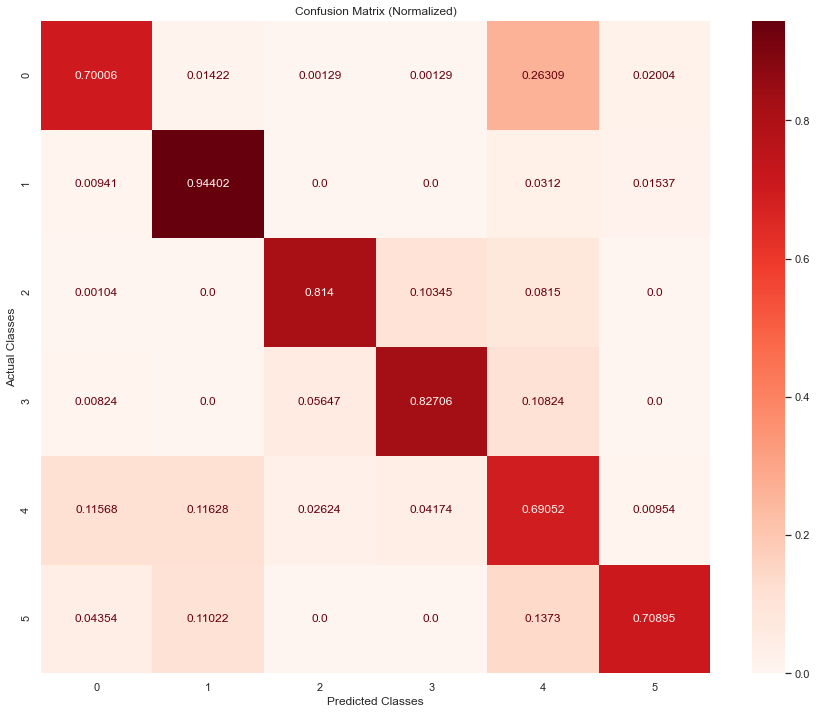

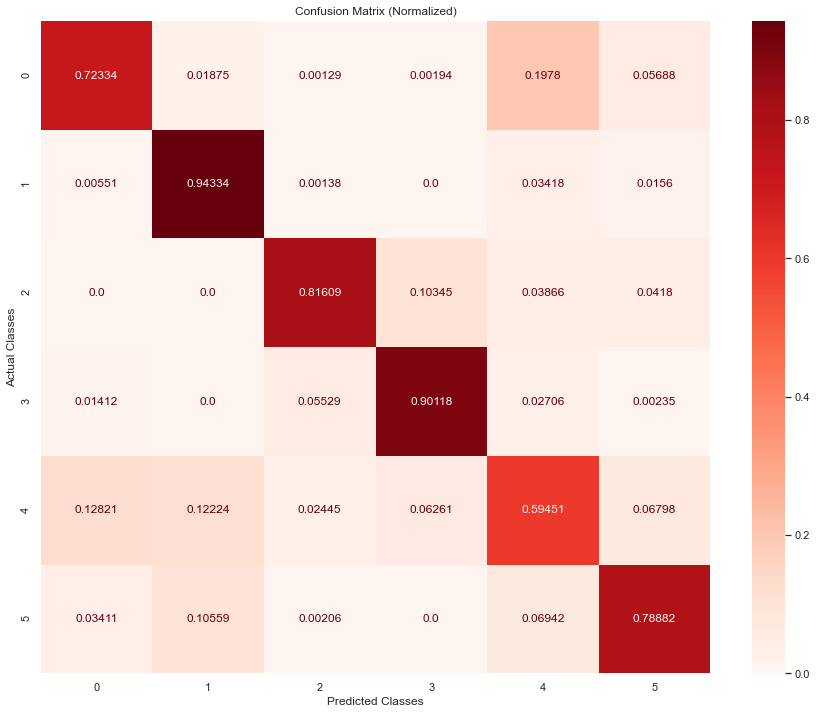

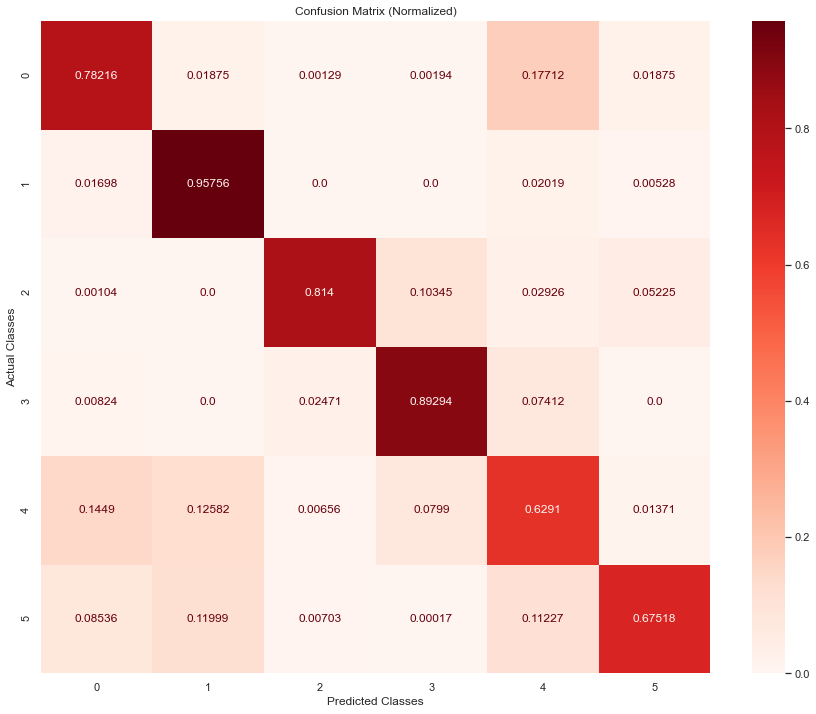

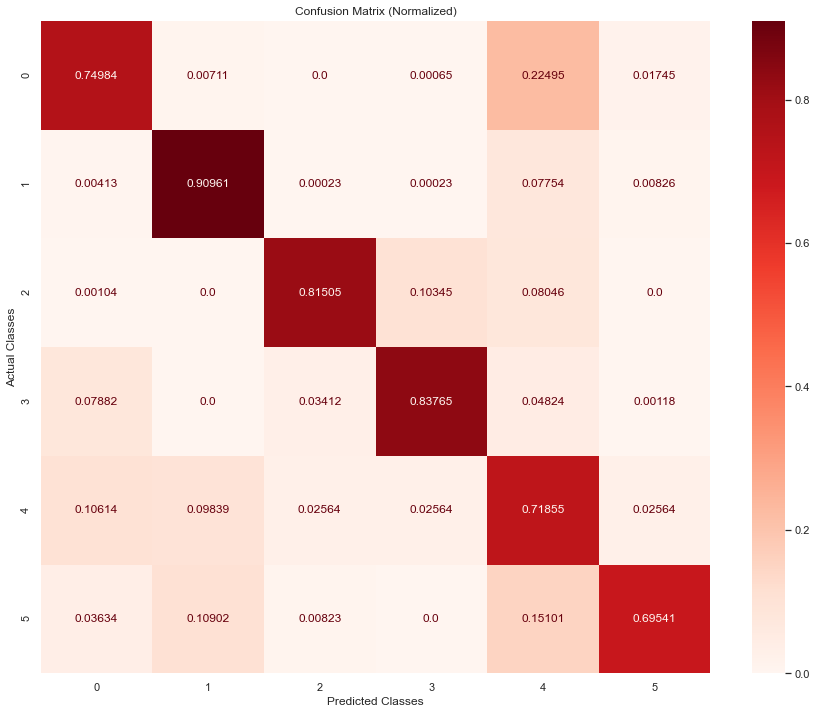

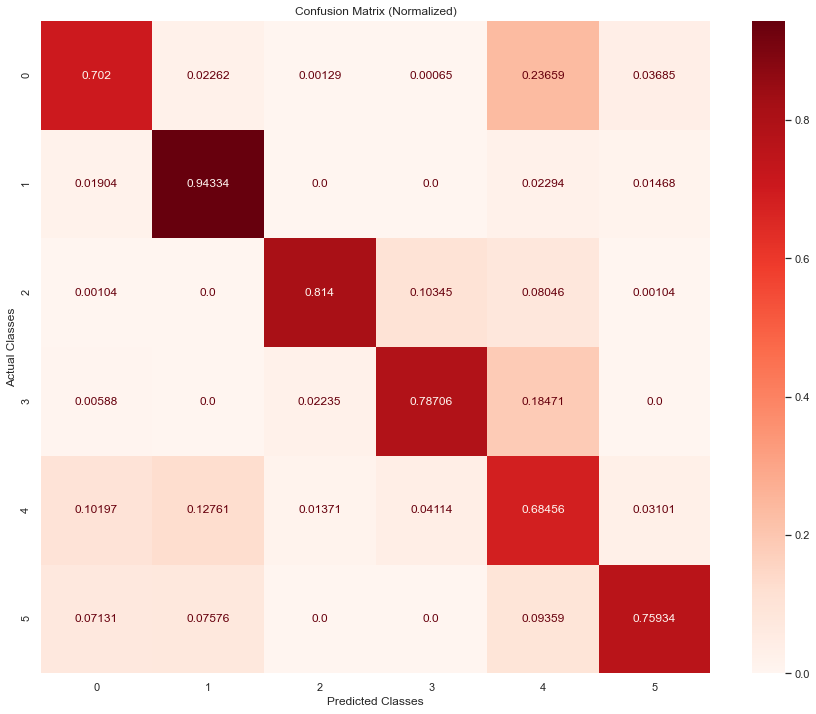

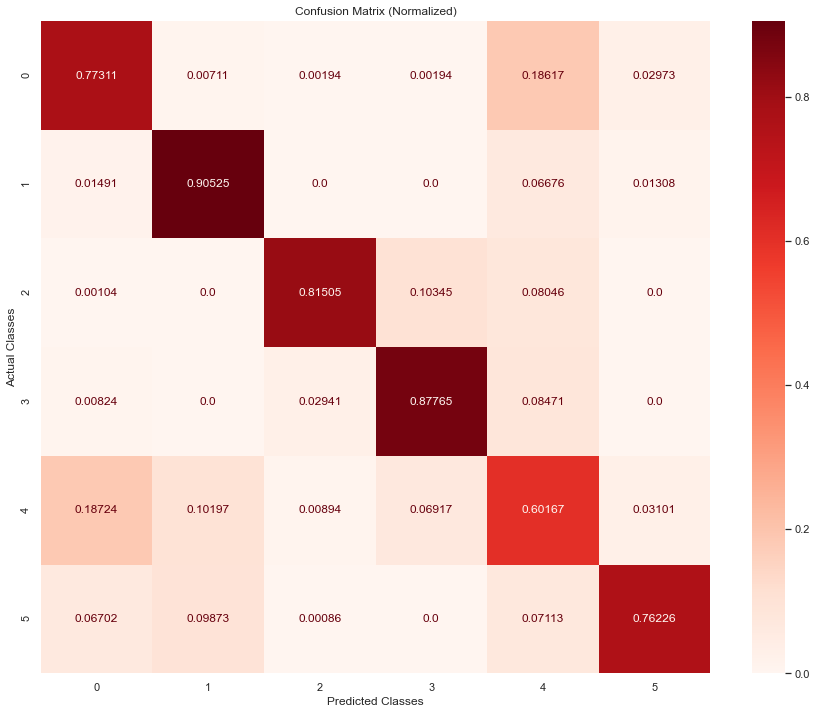

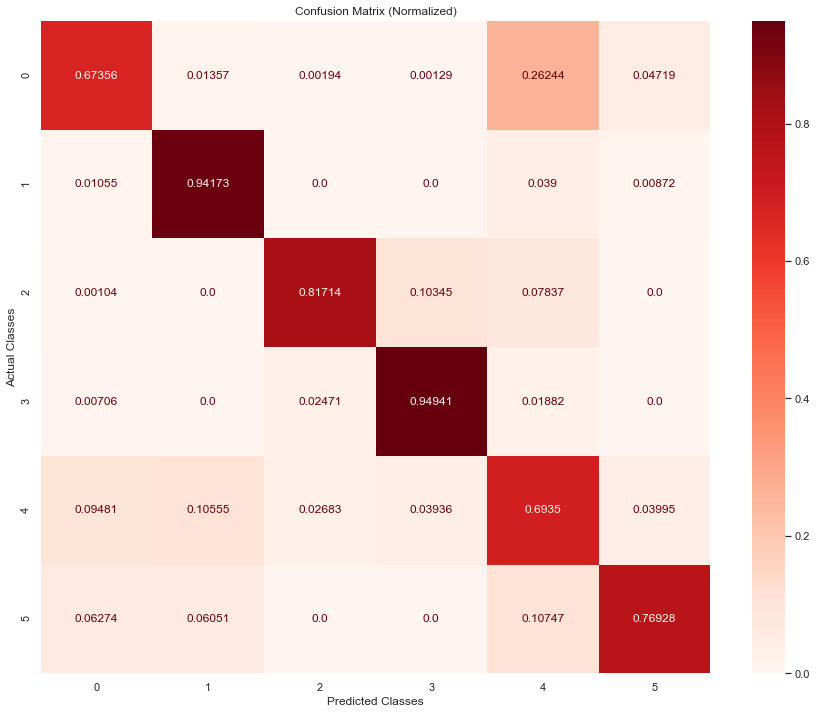

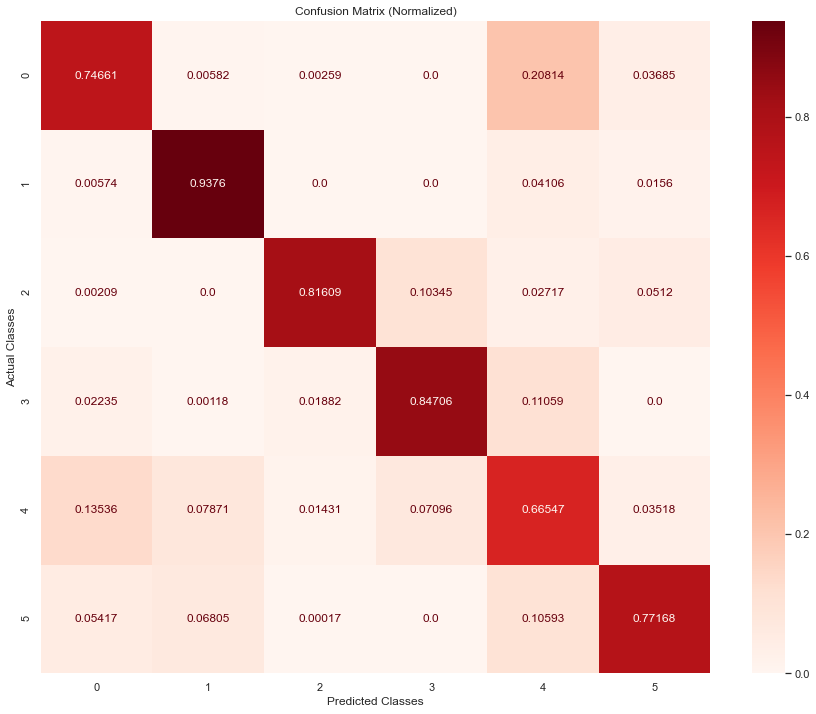

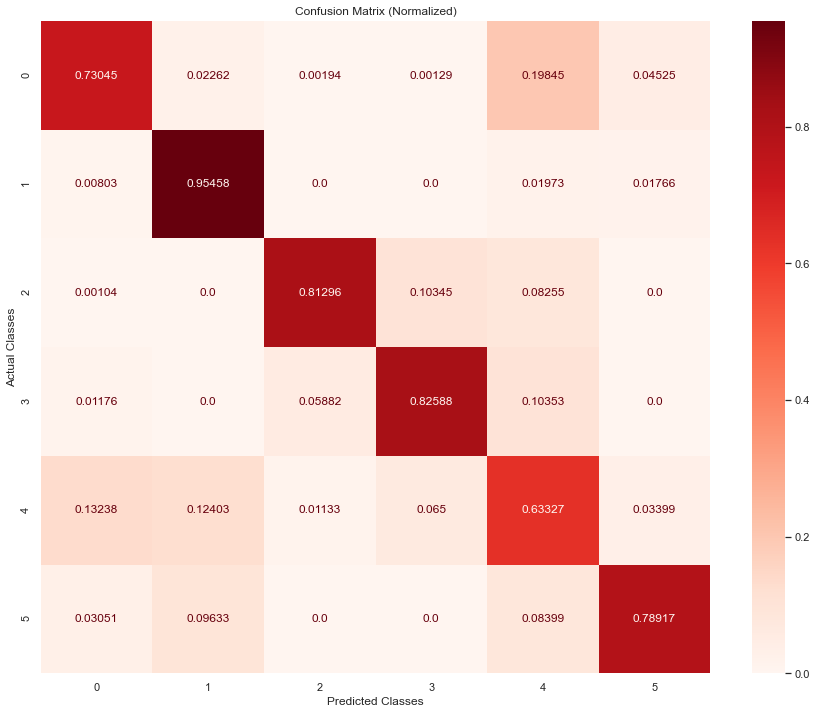

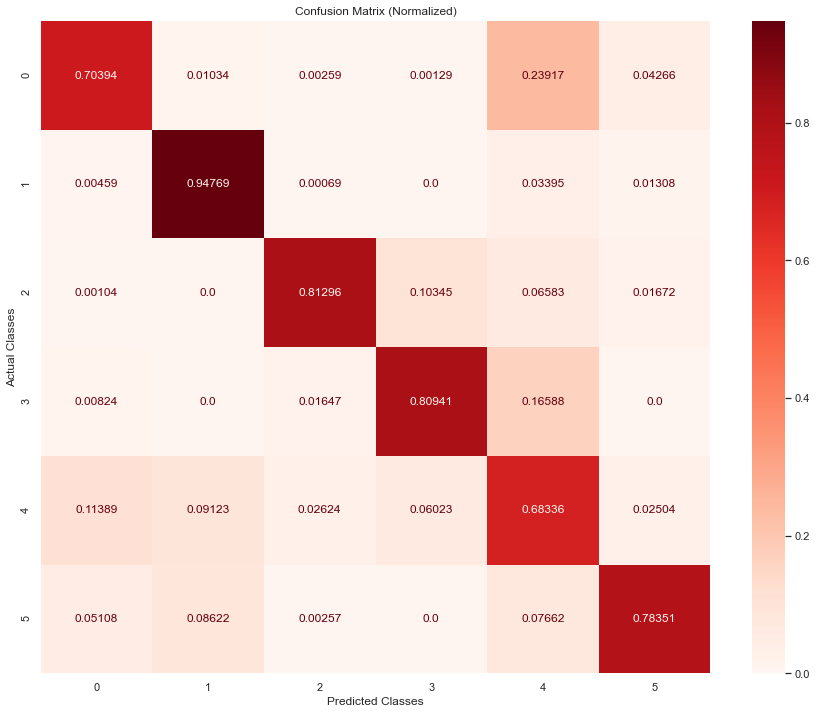

In [105]:
repeat_experiment_dac(model_type="cnnlstm", data = "balanced")

Run:  1
balanced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 3)
(78137, 2)
(15224, 42, 3)
(15224, 2)
ConvLSTM
Epoch 1/10
1221/1221 [==============================] - 23s 18ms/step - loss: 0.0345 - accuracy: 0.9873 - val_loss: 0.0399 - val_accuracy: 0.9912
Epoch 2/10
1221/1221 [==============================] - 21s 18ms/step - loss: 0.0092 - accuracy: 0.9976 - val_loss: 0.0832 - val_accuracy: 0.9852
Timed stopping at epoch 2 after training for 0:00:30

STATIONARY
ConvLSTM
Epoch 1/5000
411/411 [==============================] - 7s 16ms/step - loss: 0.0937 - accuracy: 0.9898 - val_loss: 0.6995 - val_accuracy: 0.8585
Epoch 2/5000
411/411 [==============================] - 6s 15ms/step - loss: 0.0390 - accuracy: 0.9936 - val_loss: 0.7575 - val_accuracy: 0.8547
Epoch 3/5000
411/411 [==============================] - 6s 15ms/step - loss: 0.0377 - accuracy: 0.9935 - val_loss: 0.7535 - val_accuracy: 0.8580
Epoch 4/5000
411/411 [==============================] - 6s 

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  2
balanced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 3)
(78137, 2)
(15224, 42, 3)
(15224, 2)
ConvLSTM
Epoch 1/10
1221/1221 [==============================] - 22s 17ms/step - loss: 0.0366 - accuracy: 0.9871 - val_loss: 0.0570 - val_accuracy: 0.9861
Epoch 2/10
1221/1221 [==============================] - 21s 17ms/step - loss: 0.0099 - accuracy: 0.9972 - val_loss: 0.1057 - val_accuracy: 0.9802
Timed stopping at epoch 2 after training for 0:00:30

STATIONARY
ConvLSTM
Epoch 1/5000
412/412 [==============================] - 8s 16ms/step - loss: 0.1048 - accuracy: 0.9859 - val_loss: 0.9139 - val_accuracy: 0.8410
Epoch 2/5000
412/412 [==============================] - 7s 16ms/step - loss: 0.0450 - accuracy: 0.9925 - val_loss: 0.7773 - val_accuracy: 0.8377
Epoch 3/5000
412/412 [==============================] - 7s 16ms/step - loss: 0.0440 - accuracy: 0.9926 - val_loss: 0.7988 - val_accuracy: 0.8432
Epoch 4/5000
412/412 [==============================] - 7s 

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  3
balanced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 3)
(78137, 2)
(15224, 42, 3)
(15224, 2)
ConvLSTM
Epoch 1/10
1221/1221 [==============================] - 22s 17ms/step - loss: 0.0372 - accuracy: 0.9861 - val_loss: 0.0563 - val_accuracy: 0.9873
Epoch 2/10
1221/1221 [==============================] - 20s 17ms/step - loss: 0.0094 - accuracy: 0.9974 - val_loss: 0.0950 - val_accuracy: 0.9819
Timed stopping at epoch 2 after training for 0:00:30

STATIONARY
ConvLSTM
Epoch 1/5000
411/411 [==============================] - 8s 16ms/step - loss: 0.0948 - accuracy: 0.9895 - val_loss: 0.7997 - val_accuracy: 0.8524
Epoch 2/5000
411/411 [==============================] - 6s 16ms/step - loss: 0.0363 - accuracy: 0.9939 - val_loss: 0.6533 - val_accuracy: 0.8558
Epoch 3/5000
411/411 [==============================] - 6s 16ms/step - loss: 0.0348 - accuracy: 0.9939 - val_loss: 0.7961 - val_accuracy: 0.8536
Epoch 4/5000
411/411 [==============================] - 6s 

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  4
balanced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 3)
(78137, 2)
(15224, 42, 3)
(15224, 2)
ConvLSTM
Epoch 1/10
1221/1221 [==============================] - 22s 17ms/step - loss: 0.0369 - accuracy: 0.9862 - val_loss: 0.0898 - val_accuracy: 0.9819
Epoch 2/10
1221/1221 [==============================] - 20s 17ms/step - loss: 0.0100 - accuracy: 0.9973 - val_loss: 0.0944 - val_accuracy: 0.9823
Timed stopping at epoch 2 after training for 0:00:30

STATIONARY
ConvLSTM
Epoch 1/5000
411/411 [==============================] - 8s 17ms/step - loss: 0.0980 - accuracy: 0.9897 - val_loss: 0.7233 - val_accuracy: 0.8544
Epoch 2/5000
411/411 [==============================] - 7s 18ms/step - loss: 0.0367 - accuracy: 0.9940 - val_loss: 0.6586 - val_accuracy: 0.8123
Epoch 3/5000
411/411 [==============================] - 7s 18ms/step - loss: 0.0366 - accuracy: 0.9940 - val_loss: 0.8603 - val_accuracy: 0.8572
Epoch 4/5000
411/411 [==============================] - 7s 

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  5
balanced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 3)
(78137, 2)
(15224, 42, 3)
(15224, 2)
ConvLSTM
Epoch 1/10
1221/1221 [==============================] - 22s 17ms/step - loss: 0.0357 - accuracy: 0.9867 - val_loss: 0.1268 - val_accuracy: 0.9734
Epoch 2/10
1221/1221 [==============================] - 20s 17ms/step - loss: 0.0099 - accuracy: 0.9974 - val_loss: 0.0883 - val_accuracy: 0.9836
Timed stopping at epoch 2 after training for 0:00:30

STATIONARY
ConvLSTM
Epoch 1/5000
411/411 [==============================] - 9s 18ms/step - loss: 0.0997 - accuracy: 0.9896 - val_loss: 0.8399 - val_accuracy: 0.8556
Epoch 2/5000
411/411 [==============================] - 7s 17ms/step - loss: 0.0424 - accuracy: 0.9930 - val_loss: 0.6799 - val_accuracy: 0.8512
Epoch 3/5000
411/411 [==============================] - 7s 18ms/step - loss: 0.0422 - accuracy: 0.9930 - val_loss: 0.7389 - val_accuracy: 0.8518
Epoch 4/5000
411/411 [==============================] - 7s 

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  6
balanced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 3)
(78137, 2)
(15224, 42, 3)
(15224, 2)
ConvLSTM
Epoch 1/10
1221/1221 [==============================] - 22s 17ms/step - loss: 0.0354 - accuracy: 0.9867 - val_loss: 0.0785 - val_accuracy: 0.9804
Epoch 2/10
1221/1221 [==============================] - 20s 17ms/step - loss: 0.0095 - accuracy: 0.9975 - val_loss: 0.0948 - val_accuracy: 0.9861
Timed stopping at epoch 2 after training for 0:00:30

STATIONARY
ConvLSTM
Epoch 1/5000
411/411 [==============================] - 8s 17ms/step - loss: 0.0972 - accuracy: 0.9894 - val_loss: 0.6692 - val_accuracy: 0.8576
Epoch 2/5000
411/411 [==============================] - 7s 18ms/step - loss: 0.0356 - accuracy: 0.9940 - val_loss: 0.6630 - val_accuracy: 0.8543
Epoch 3/5000
411/411 [==============================] - 7s 18ms/step - loss: 0.0349 - accuracy: 0.9940 - val_loss: 0.7668 - val_accuracy: 0.8565
Epoch 4/5000
411/411 [==============================] - 7s 

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  7
balanced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 3)
(78137, 2)
(15224, 42, 3)
(15224, 2)
ConvLSTM
Epoch 1/10
1221/1221 [==============================] - 22s 17ms/step - loss: 0.0376 - accuracy: 0.9863 - val_loss: 0.0842 - val_accuracy: 0.9796
Epoch 2/10
1221/1221 [==============================] - 20s 17ms/step - loss: 0.0096 - accuracy: 0.9976 - val_loss: 0.0763 - val_accuracy: 0.9863
Timed stopping at epoch 2 after training for 0:00:30

STATIONARY
ConvLSTM
Epoch 1/5000
411/411 [==============================] - 8s 17ms/step - loss: 0.0993 - accuracy: 0.9859 - val_loss: 0.6865 - val_accuracy: 0.8633
Epoch 2/5000
411/411 [==============================] - 7s 18ms/step - loss: 0.0389 - accuracy: 0.9936 - val_loss: 0.6410 - val_accuracy: 0.8693
Epoch 3/5000
411/411 [==============================] - 7s 18ms/step - loss: 0.0377 - accuracy: 0.9936 - val_loss: 0.6560 - val_accuracy: 0.8655
Epoch 4/5000
411/411 [==============================] - 7s 

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  8
balanced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 3)
(78137, 2)
(15224, 42, 3)
(15224, 2)
ConvLSTM
Epoch 1/10
1221/1221 [==============================] - 22s 17ms/step - loss: 0.0358 - accuracy: 0.9869 - val_loss: 0.1071 - val_accuracy: 0.9765
Epoch 2/10
1221/1221 [==============================] - 20s 17ms/step - loss: 0.0092 - accuracy: 0.9975 - val_loss: 0.1163 - val_accuracy: 0.9803
Timed stopping at epoch 2 after training for 0:00:30

STATIONARY
ConvLSTM
Epoch 1/5000
411/411 [==============================] - 8s 17ms/step - loss: 0.0950 - accuracy: 0.9890 - val_loss: 0.6985 - val_accuracy: 0.8612
Epoch 2/5000
411/411 [==============================] - 7s 18ms/step - loss: 0.0343 - accuracy: 0.9943 - val_loss: 0.6613 - val_accuracy: 0.8682
Epoch 3/5000
411/411 [==============================] - 7s 18ms/step - loss: 0.0329 - accuracy: 0.9943 - val_loss: 0.8367 - val_accuracy: 0.8676
Epoch 4/5000
411/411 [==============================] - 7s 

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  9
balanced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 3)
(78137, 2)
(15224, 42, 3)
(15224, 2)
ConvLSTM
Epoch 1/10
1221/1221 [==============================] - 22s 17ms/step - loss: 0.0385 - accuracy: 0.9854 - val_loss: 0.0496 - val_accuracy: 0.9867
Epoch 2/10
1221/1221 [==============================] - 21s 17ms/step - loss: 0.0092 - accuracy: 0.9977 - val_loss: 0.0997 - val_accuracy: 0.9810
Timed stopping at epoch 2 after training for 0:00:30

STATIONARY
ConvLSTM
Epoch 1/5000
414/414 [==============================] - 8s 16ms/step - loss: 0.1389 - accuracy: 0.9790 - val_loss: 0.7752 - val_accuracy: 0.8222
Epoch 2/5000
414/414 [==============================] - 6s 15ms/step - loss: 0.0722 - accuracy: 0.9872 - val_loss: 0.7705 - val_accuracy: 0.8269
Epoch 3/5000
414/414 [==============================] - 6s 15ms/step - loss: 0.0633 - accuracy: 0.9872 - val_loss: 0.6870 - val_accuracy: 0.83320.0635 
Epoch 4/5000
414/414 [==============================

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  10
balanced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 3)
(78137, 2)
(15224, 42, 3)
(15224, 2)
ConvLSTM
Epoch 1/10
1221/1221 [==============================] - 21s 16ms/step - loss: 0.0357 - accuracy: 0.9876 - val_loss: 0.0908 - val_accuracy: 0.9779
Epoch 2/10
1221/1221 [==============================] - 20s 16ms/step - loss: 0.0092 - accuracy: 0.9977 - val_loss: 0.1275 - val_accuracy: 0.9802
Timed stopping at epoch 2 after training for 0:00:30

STATIONARY
ConvLSTM
Epoch 1/5000
411/411 [==============================] - 8s 16ms/step - loss: 0.1042 - accuracy: 0.9901 - val_loss: 0.5957 - val_accuracy: 0.8647
Epoch 2/5000
411/411 [==============================] - 6s 16ms/step - loss: 0.0364 - accuracy: 0.9940 - val_loss: 0.7099 - val_accuracy: 0.8647
Epoch 3/5000
411/411 [==============================] - 6s 16ms/step - loss: 0.0349 - accuracy: 0.9941 - val_loss: 0.6536 - val_accuracy: 0.8630
Epoch 4/5000
411/411 [==============================] - 6s

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


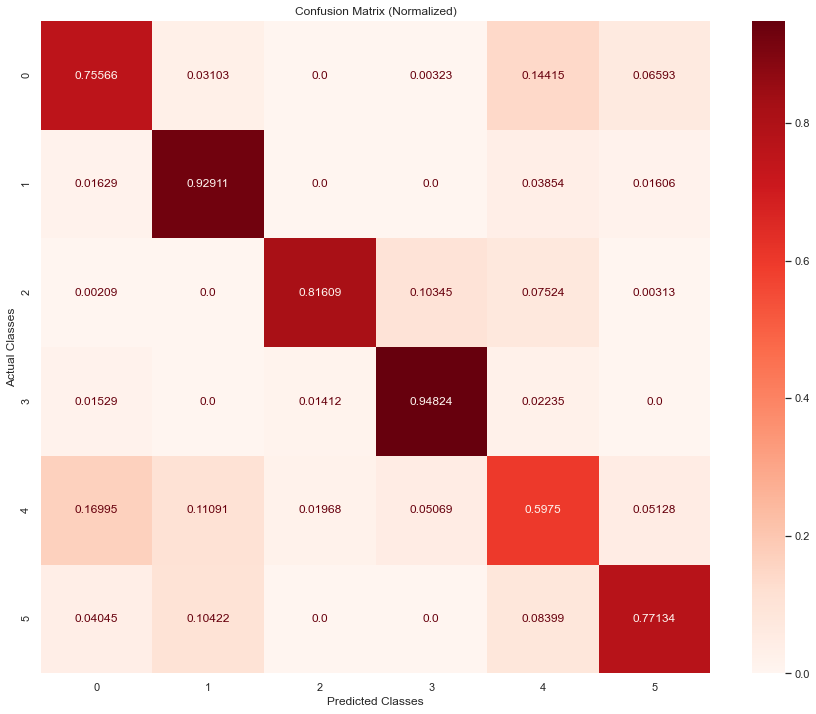

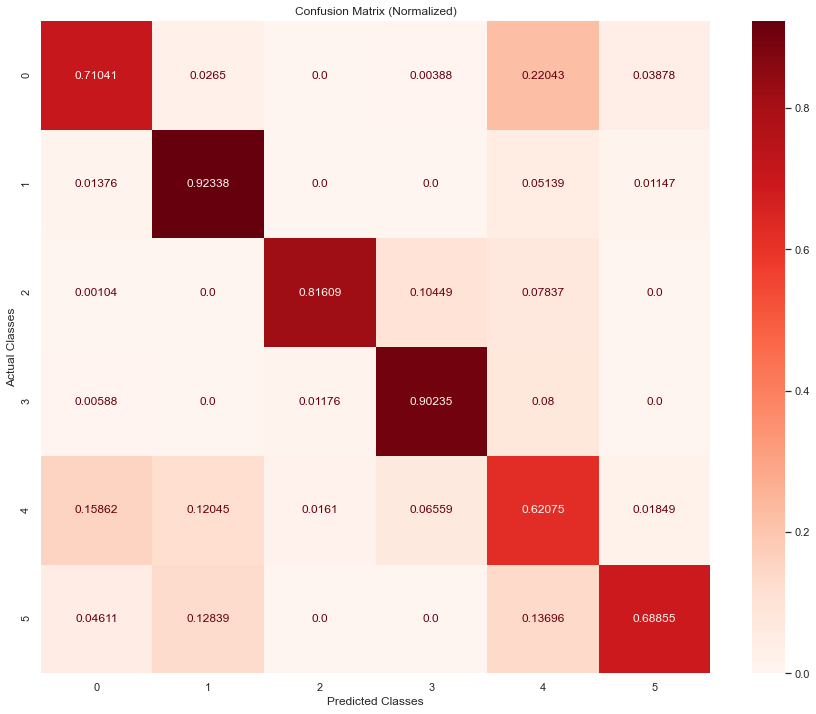

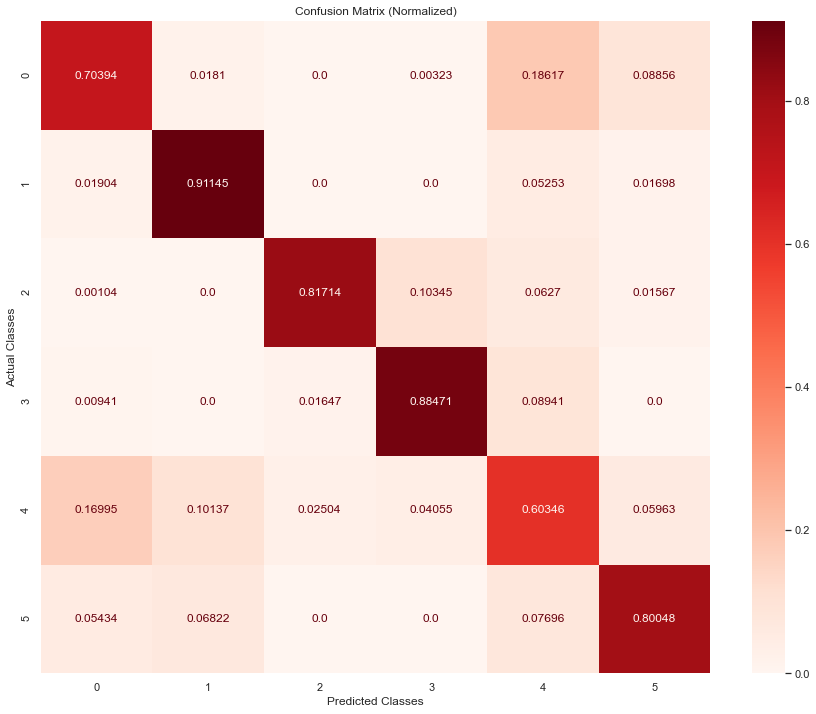

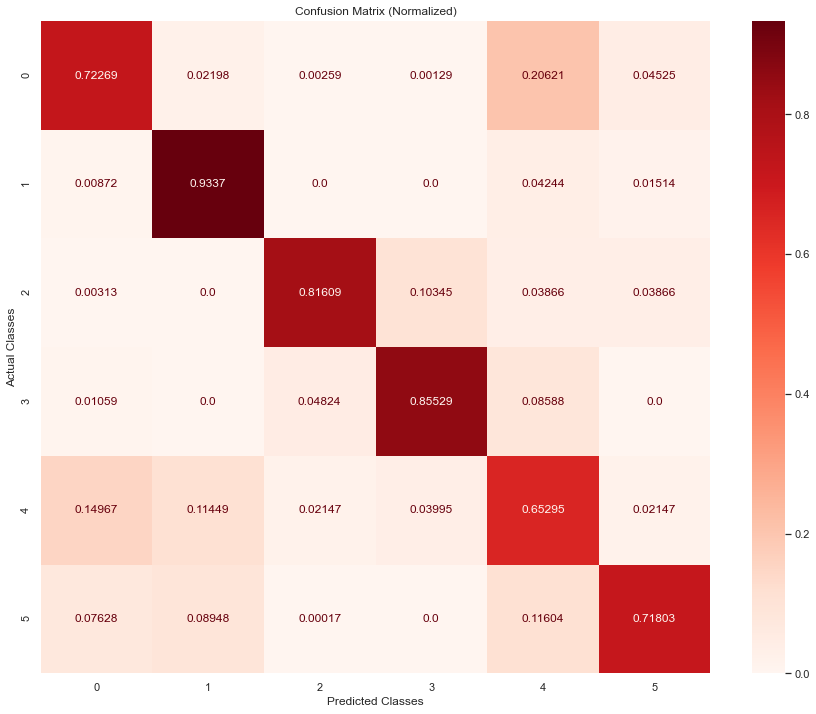

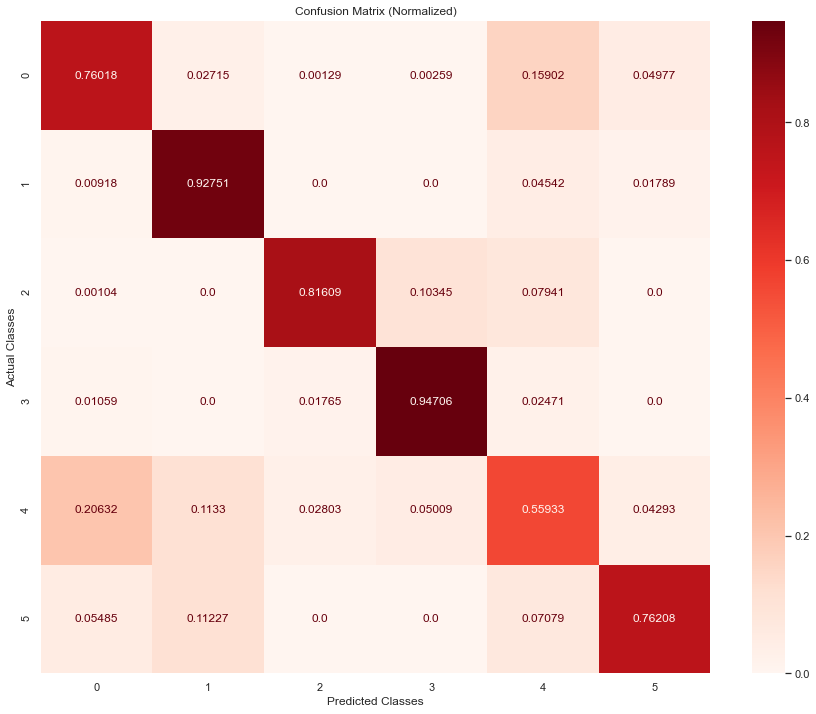

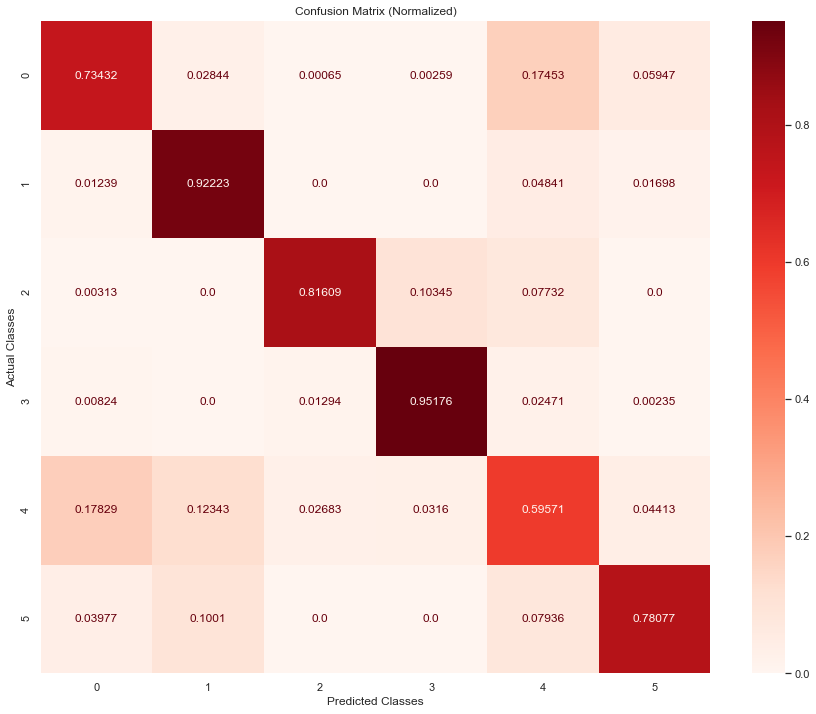

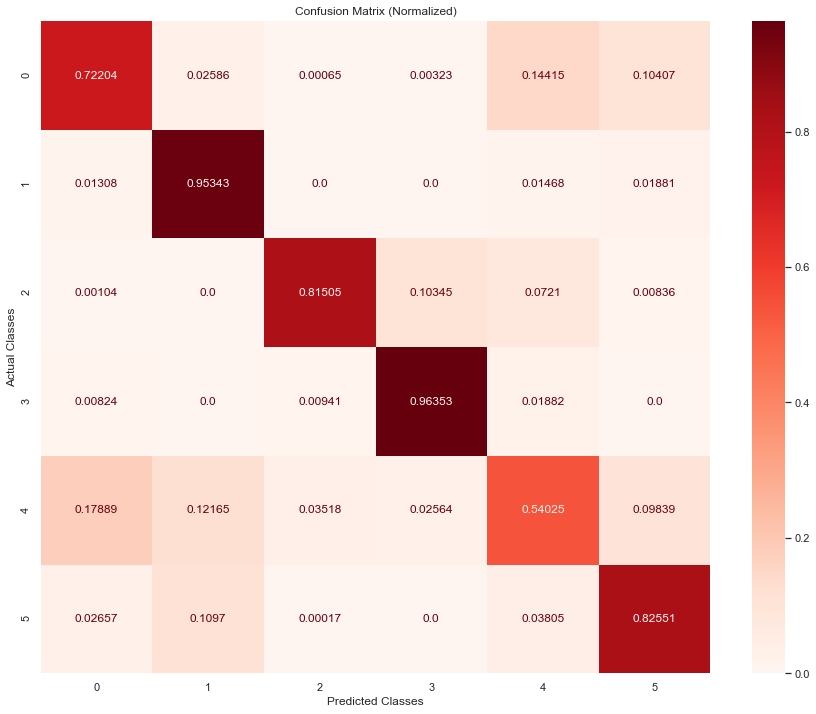

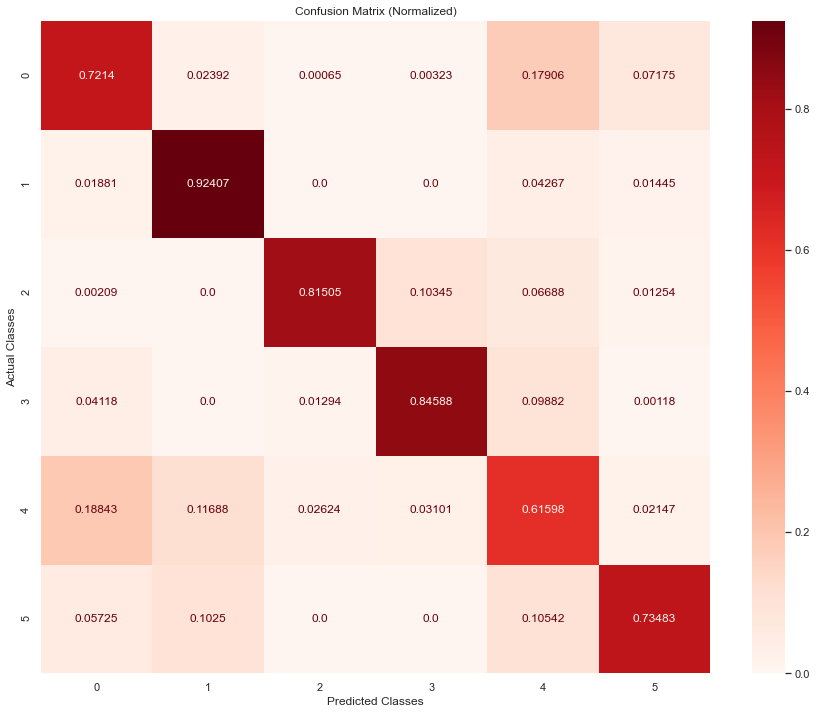

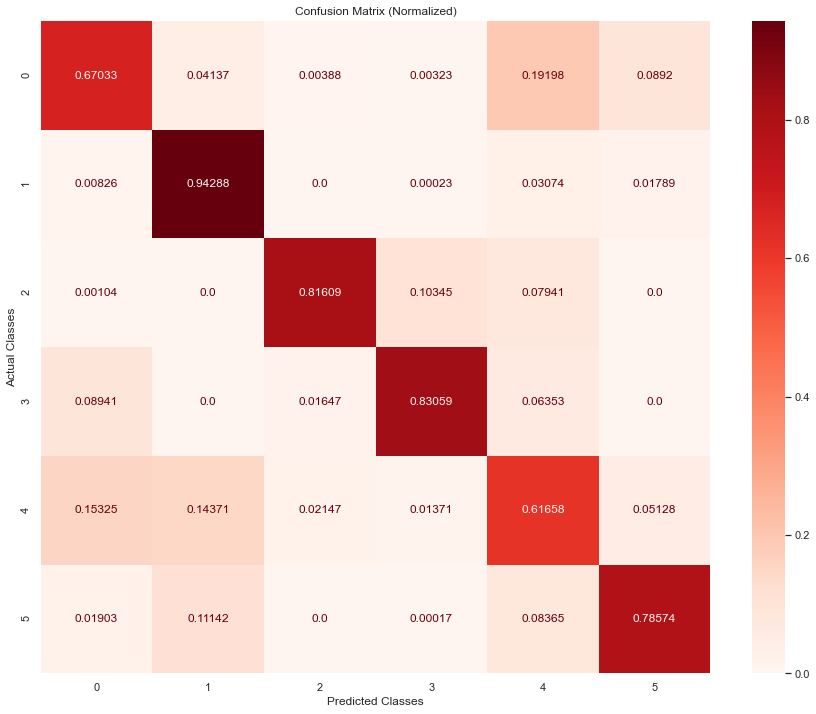

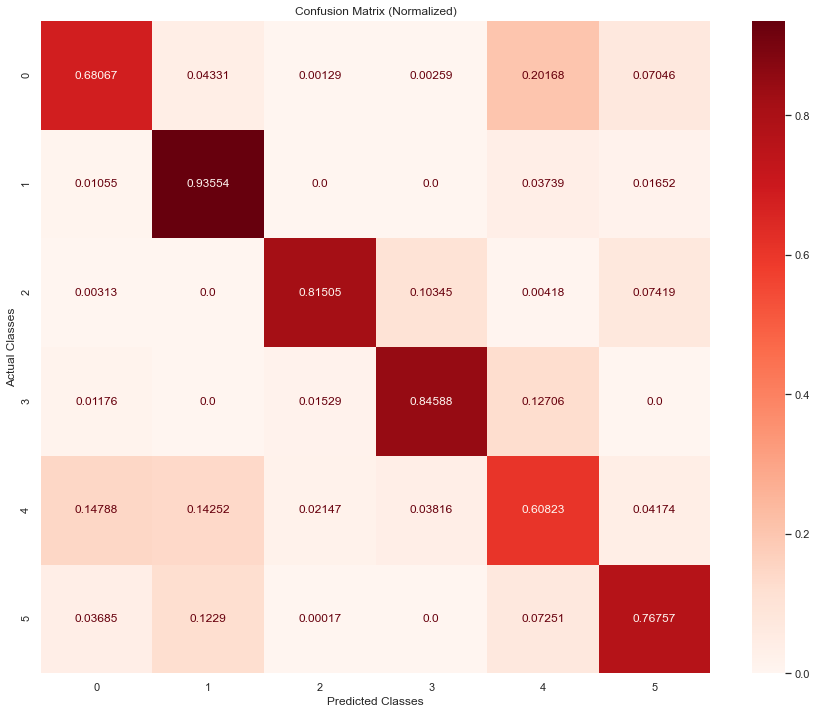

In [106]:
repeat_experiment_dac(model_type="convlstm", data = "balanced")

Run:  1
balanced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 3)
(78137, 2)
(15224, 42, 3)
(15224, 2)
Bi-LSTM
Epoch 1/10
1221/1221 [==============================] - 13s 9ms/step - loss: 0.1658 - accuracy: 0.9260 - val_loss: 0.1189 - val_accuracy: 0.9853
Epoch 2/10
1221/1221 [==============================] - 11s 9ms/step - loss: 0.0166 - accuracy: 0.9963 - val_loss: 0.1340 - val_accuracy: 0.9819
Epoch 3/10
1221/1221 [==============================] - 10s 9ms/step - loss: 0.0149 - accuracy: 0.9968 - val_loss: 0.1317 - val_accuracy: 0.9824
Timed stopping at epoch 3 after training for 0:00:30

STATIONARY
Bi-LSTM
Epoch 1/5000
411/411 [==============================] - 6s 9ms/step - loss: 0.1102 - accuracy: 0.9829 - val_loss: 0.6693 - val_accuracy: 0.8931
Epoch 2/5000
411/411 [==============================] - 3s 8ms/step - loss: 0.0862 - accuracy: 0.9784 - val_loss: 0.6499 - val_accuracy: 0.8610
Epoch 3/5000
411/411 [==============================] - 3s 8ms/st

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  2
balanced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 3)
(78137, 2)
(15224, 42, 3)
(15224, 2)
Bi-LSTM
Epoch 1/10
1221/1221 [==============================] - 13s 9ms/step - loss: 0.1766 - accuracy: 0.9212 - val_loss: 0.0713 - val_accuracy: 0.9871
Epoch 2/10
1221/1221 [==============================] - 11s 9ms/step - loss: 0.0163 - accuracy: 0.9958 - val_loss: 0.1124 - val_accuracy: 0.9869
Epoch 3/10
1221/1221 [==============================] - 10s 9ms/step - loss: 0.0117 - accuracy: 0.9973 - val_loss: 0.0930 - val_accuracy: 0.9862
Timed stopping at epoch 3 after training for 0:00:30

STATIONARY
Bi-LSTM
Epoch 1/5000
413/413 [==============================] - 6s 9ms/step - loss: 0.1924 - accuracy: 0.9470 - val_loss: 0.8494 - val_accuracy: 0.8828
Epoch 2/5000
413/413 [==============================] - 3s 8ms/step - loss: 0.0622 - accuracy: 0.9903 - val_loss: 0.5913 - val_accuracy: 0.8948
Epoch 3/5000
413/413 [==============================] - 3s 8ms/st

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  3
balanced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 3)
(78137, 2)
(15224, 42, 3)
(15224, 2)
Bi-LSTM
Epoch 1/10
1221/1221 [==============================] - 13s 9ms/step - loss: 0.1633 - accuracy: 0.9261 - val_loss: 0.1163 - val_accuracy: 0.9807
Epoch 2/10
1221/1221 [==============================] - 11s 9ms/step - loss: 0.0172 - accuracy: 0.9959 - val_loss: 0.0815 - val_accuracy: 0.9831
Epoch 3/10
1221/1221 [==============================] - 11s 9ms/step - loss: 0.0133 - accuracy: 0.9969 - val_loss: 0.0620 - val_accuracy: 0.9860
Timed stopping at epoch 3 after training for 0:00:30

STATIONARY
Bi-LSTM
Epoch 1/5000
410/410 [==============================] - 6s 9ms/step - loss: 0.0895 - accuracy: 0.9896 - val_loss: 0.5061 - val_accuracy: 0.9117
Epoch 2/5000
410/410 [==============================] - 3s 8ms/step - loss: 0.0387 - accuracy: 0.9946 - val_loss: 0.5849 - val_accuracy: 0.9038
Epoch 3/5000
410/410 [==============================] - 3s 8ms/st

Epoch 13/5000
812/812 [==============================] - 7s 9ms/step - loss: 0.0937 - accuracy: 0.9691 - val_loss: 1.1010 - val_accuracy: 0.7983
Epoch 14/5000
812/812 [==============================] - 7s 9ms/step - loss: 0.0837 - accuracy: 0.9728 - val_loss: 1.1529 - val_accuracy: 0.7812
Epoch 15/5000
812/812 [==============================] - 7s 9ms/step - loss: 0.0807 - accuracy: 0.9738 - val_loss: 0.9983 - val_accuracy: 0.7914
Epoch 16/5000
812/812 [==============================] - 7s 9ms/step - loss: 0.0716 - accuracy: 0.9767 - val_loss: 1.1820 - val_accuracy: 0.8006
Epoch 17/5000
812/812 [==============================] - 7s 9ms/step - loss: 0.0648 - accuracy: 0.9792 - val_loss: 0.9858 - val_accuracy: 0.8058
Epoch 18/5000
812/812 [==============================] - 7s 9ms/step - loss: 0.0644 - accuracy: 0.9793 - val_loss: 1.0457 - val_accuracy: 0.7982
Epoch 19/5000
812/812 [==============================] - 7s 9ms/step - loss: 0.0593 - accuracy: 0.9816 - val_loss: 1.2517 - val_ac

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  4
balanced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 3)
(78137, 2)
(15224, 42, 3)
(15224, 2)
Bi-LSTM
Epoch 1/10
1221/1221 [==============================] - 13s 9ms/step - loss: 0.1471 - accuracy: 0.9350 - val_loss: 0.1030 - val_accuracy: 0.9781
Epoch 2/10
1221/1221 [==============================] - 11s 9ms/step - loss: 0.0171 - accuracy: 0.9960 - val_loss: 0.0828 - val_accuracy: 0.9847
Epoch 3/10
1221/1221 [==============================] - 11s 9ms/step - loss: 0.0132 - accuracy: 0.9969 - val_loss: 0.1106 - val_accuracy: 0.9809
Timed stopping at epoch 3 after training for 0:00:30

STATIONARY
Bi-LSTM
Epoch 1/5000
419/419 [==============================] - 6s 10ms/step - loss: 0.2013 - accuracy: 0.9632 - val_loss: 0.8596 - val_accuracy: 0.8233
Epoch 2/5000
419/419 [==============================] - 3s 8ms/step - loss: 0.1311 - accuracy: 0.9760 - val_loss: 0.7219 - val_accuracy: 0.8373
Epoch 3/5000
419/419 [==============================] - 3s 8ms/s

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  5
balanced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 3)
(78137, 2)
(15224, 42, 3)
(15224, 2)
Bi-LSTM
Epoch 1/10
1221/1221 [==============================] - 13s 9ms/step - loss: 0.1728 - accuracy: 0.9197 - val_loss: 0.0964 - val_accuracy: 0.9750
Epoch 2/10
1221/1221 [==============================] - 10s 9ms/step - loss: 0.0211 - accuracy: 0.9947 - val_loss: 0.0362 - val_accuracy: 0.9896
Epoch 3/10
1221/1221 [==============================] - 11s 9ms/step - loss: 0.0136 - accuracy: 0.9966 - val_loss: 0.0580 - val_accuracy: 0.9907
Timed stopping at epoch 3 after training for 0:00:30

STATIONARY
Bi-LSTM
Epoch 1/5000
412/412 [==============================] - 5s 9ms/step - loss: 0.1364 - accuracy: 0.9795 - val_loss: 0.4733 - val_accuracy: 0.9153
Epoch 2/5000
412/412 [==============================] - 3s 8ms/step - loss: 0.0545 - accuracy: 0.9914 - val_loss: 0.4743 - val_accuracy: 0.9147
Epoch 3/5000
412/412 [==============================] - 3s 8ms/st

Epoch 13/5000
810/810 [==============================] - 7s 9ms/step - loss: 0.0887 - accuracy: 0.9720 - val_loss: 0.9896 - val_accuracy: 0.7960
Epoch 14/5000
810/810 [==============================] - 7s 9ms/step - loss: 0.0836 - accuracy: 0.9738 - val_loss: 0.9079 - val_accuracy: 0.8151
Epoch 15/5000
810/810 [==============================] - 7s 9ms/step - loss: 0.0729 - accuracy: 0.9774 - val_loss: 1.1132 - val_accuracy: 0.7992
Epoch 16/5000
810/810 [==============================] - 7s 9ms/step - loss: 0.0661 - accuracy: 0.9788 - val_loss: 0.8146 - val_accuracy: 0.8102
Epoch 17/5000
810/810 [==============================] - 7s 9ms/step - loss: 0.0622 - accuracy: 0.9809 - val_loss: 0.9959 - val_accuracy: 0.7951
Epoch 18/5000
810/810 [==============================] - 7s 9ms/step - loss: 0.0568 - accuracy: 0.9829 - val_loss: 1.0387 - val_accuracy: 0.8095
Epoch 19/5000
810/810 [==============================] - 7s 9ms/step - loss: 0.0533 - accuracy: 0.9834 - val_loss: 1.0382 - val_ac

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  6
balanced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 3)
(78137, 2)
(15224, 42, 3)
(15224, 2)
Bi-LSTM
Epoch 1/10
1221/1221 [==============================] - 13s 9ms/step - loss: 0.1624 - accuracy: 0.9250 - val_loss: 0.0796 - val_accuracy: 0.9869
Epoch 2/10
1221/1221 [==============================] - 11s 9ms/step - loss: 0.0160 - accuracy: 0.9962 - val_loss: 0.1189 - val_accuracy: 0.9833
Epoch 3/10
1221/1221 [==============================] - 11s 9ms/step - loss: 0.0114 - accuracy: 0.9973 - val_loss: 0.0752 - val_accuracy: 0.9856
Timed stopping at epoch 3 after training for 0:00:30

STATIONARY
Bi-LSTM
Epoch 1/5000
411/411 [==============================] - 5s 9ms/step - loss: 0.0947 - accuracy: 0.9873 - val_loss: 0.6534 - val_accuracy: 0.8788
Epoch 2/5000
411/411 [==============================] - 3s 8ms/step - loss: 0.0798 - accuracy: 0.9759 - val_loss: 0.7746 - val_accuracy: 0.8901
Epoch 3/5000
411/411 [==============================] - 3s 8ms/st

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  7
balanced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 3)
(78137, 2)
(15224, 42, 3)
(15224, 2)
Bi-LSTM
Epoch 1/10
1221/1221 [==============================] - 13s 9ms/step - loss: 0.1770 - accuracy: 0.9197 - val_loss: 0.1146 - val_accuracy: 0.9766
Epoch 2/10
1221/1221 [==============================] - 11s 9ms/step - loss: 0.0161 - accuracy: 0.9964 - val_loss: 0.0725 - val_accuracy: 0.9838
Epoch 3/10
1221/1221 [==============================] - 11s 9ms/step - loss: 0.0123 - accuracy: 0.9971 - val_loss: 0.0608 - val_accuracy: 0.9894
Timed stopping at epoch 3 after training for 0:00:30

STATIONARY
Bi-LSTM
Epoch 1/5000
410/410 [==============================] - 6s 10ms/step - loss: 0.1121 - accuracy: 0.9802 - val_loss: 0.5411 - val_accuracy: 0.9099
Epoch 2/5000
410/410 [==============================] - 3s 8ms/step - loss: 0.0375 - accuracy: 0.9943 - val_loss: 0.5474 - val_accuracy: 0.9099
Epoch 3/5000
410/410 [==============================] - 3s 8ms/s

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  8
balanced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 3)
(78137, 2)
(15224, 42, 3)
(15224, 2)
Bi-LSTM
Epoch 1/10
1221/1221 [==============================] - 13s 9ms/step - loss: 0.1460 - accuracy: 0.9357 - val_loss: 0.0918 - val_accuracy: 0.9806
Epoch 2/10
1221/1221 [==============================] - 10s 9ms/step - loss: 0.0174 - accuracy: 0.9959 - val_loss: 0.0783 - val_accuracy: 0.9838
Epoch 3/10
1221/1221 [==============================] - 10s 9ms/step - loss: 0.0123 - accuracy: 0.9971 - val_loss: 0.0707 - val_accuracy: 0.9869
Timed stopping at epoch 3 after training for 0:00:30

STATIONARY
Bi-LSTM
Epoch 1/5000
412/412 [==============================] - 5s 9ms/step - loss: 0.1161 - accuracy: 0.9810 - val_loss: 0.5989 - val_accuracy: 0.8947
Epoch 2/5000
412/412 [==============================] - 3s 8ms/step - loss: 0.0541 - accuracy: 0.9911 - val_loss: 0.5708 - val_accuracy: 0.8964
Epoch 3/5000
412/412 [==============================] - 3s 8ms/st

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  9
balanced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 3)
(78137, 2)
(15224, 42, 3)
(15224, 2)
Bi-LSTM
Epoch 1/10
1221/1221 [==============================] - 12s 9ms/step - loss: 0.1825 - accuracy: 0.9169 - val_loss: 0.0806 - val_accuracy: 0.9845
Epoch 2/10
1221/1221 [==============================] - 11s 9ms/step - loss: 0.0181 - accuracy: 0.9959 - val_loss: 0.0897 - val_accuracy: 0.9844
Epoch 3/10
1221/1221 [==============================] - 11s 9ms/step - loss: 0.0155 - accuracy: 0.9963 - val_loss: 0.0740 - val_accuracy: 0.9872
Timed stopping at epoch 3 after training for 0:00:30

STATIONARY
Bi-LSTM
Epoch 1/5000
412/412 [==============================] - 6s 9ms/step - loss: 0.1325 - accuracy: 0.9773 - val_loss: 0.6092 - val_accuracy: 0.8898
Epoch 2/5000
412/412 [==============================] - 3s 8ms/step - loss: 0.0675 - accuracy: 0.9893 - val_loss: 0.7277 - val_accuracy: 0.8814
Epoch 3/5000
412/412 [==============================] - 3s 8ms/st

Epoch 14/5000
810/810 [==============================] - 7s 9ms/step - loss: 0.0778 - accuracy: 0.9754 - val_loss: 0.8761 - val_accuracy: 0.8095
Epoch 15/5000
810/810 [==============================] - 7s 9ms/step - loss: 0.0734 - accuracy: 0.9778 - val_loss: 1.0353 - val_accuracy: 0.7927
Epoch 16/5000
810/810 [==============================] - 7s 9ms/step - loss: 0.0711 - accuracy: 0.9780 - val_loss: 0.9493 - val_accuracy: 0.7922
Epoch 17/5000
810/810 [==============================] - 7s 9ms/step - loss: 0.0629 - accuracy: 0.9803 - val_loss: 1.0179 - val_accuracy: 0.7986
Epoch 18/5000
810/810 [==============================] - 7s 9ms/step - loss: 0.0614 - accuracy: 0.9810 - val_loss: 0.8986 - val_accuracy: 0.8151
Epoch 19/5000
810/810 [==============================] - 7s 9ms/step - loss: 0.0559 - accuracy: 0.9830 - val_loss: 0.8939 - val_accuracy: 0.8231
Timed stopping at epoch 19 after training for 0:02:15


c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  10
balanced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 3)
(78137, 2)
(15224, 42, 3)
(15224, 2)
Bi-LSTM
Epoch 1/10
1221/1221 [==============================] - 13s 9ms/step - loss: 0.1955 - accuracy: 0.9099 - val_loss: 0.1139 - val_accuracy: 0.9748
Epoch 2/10
1221/1221 [==============================] - 11s 9ms/step - loss: 0.0171 - accuracy: 0.9958 - val_loss: 0.1083 - val_accuracy: 0.9771
Epoch 3/10
1221/1221 [==============================] - 11s 9ms/step - loss: 0.0118 - accuracy: 0.9971 - val_loss: 0.1463 - val_accuracy: 0.9791
Timed stopping at epoch 3 after training for 0:00:30

STATIONARY
Bi-LSTM
Epoch 1/5000
411/411 [==============================] - 5s 9ms/step - loss: 0.1413 - accuracy: 0.9756 - val_loss: 0.5959 - val_accuracy: 0.9001
Epoch 2/5000
411/411 [==============================] - 3s 8ms/step - loss: 0.0454 - accuracy: 0.9927 - val_loss: 0.5714 - val_accuracy: 0.9001
Epoch 3/5000
411/411 [==============================] - 3s 8ms/s

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


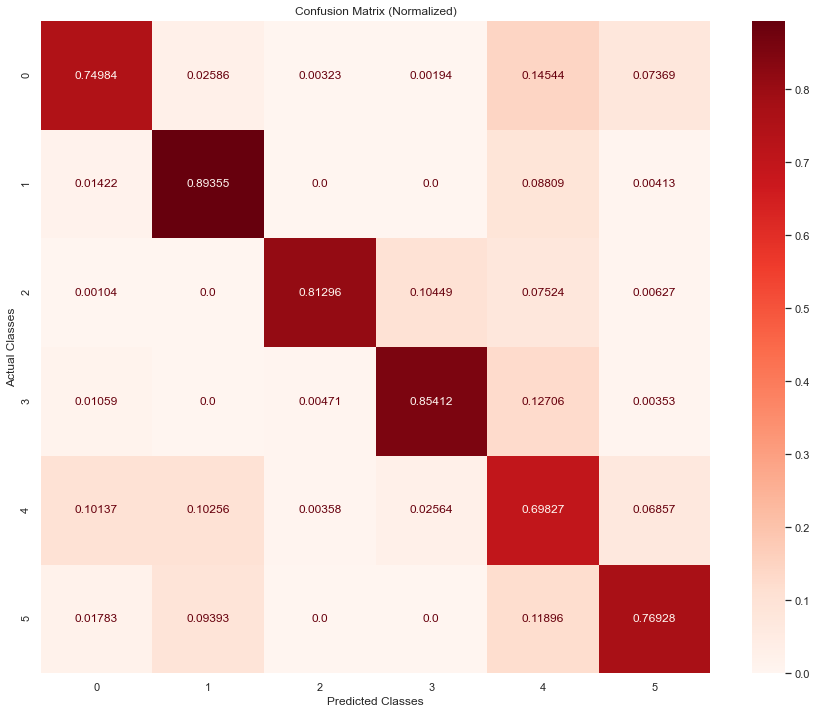

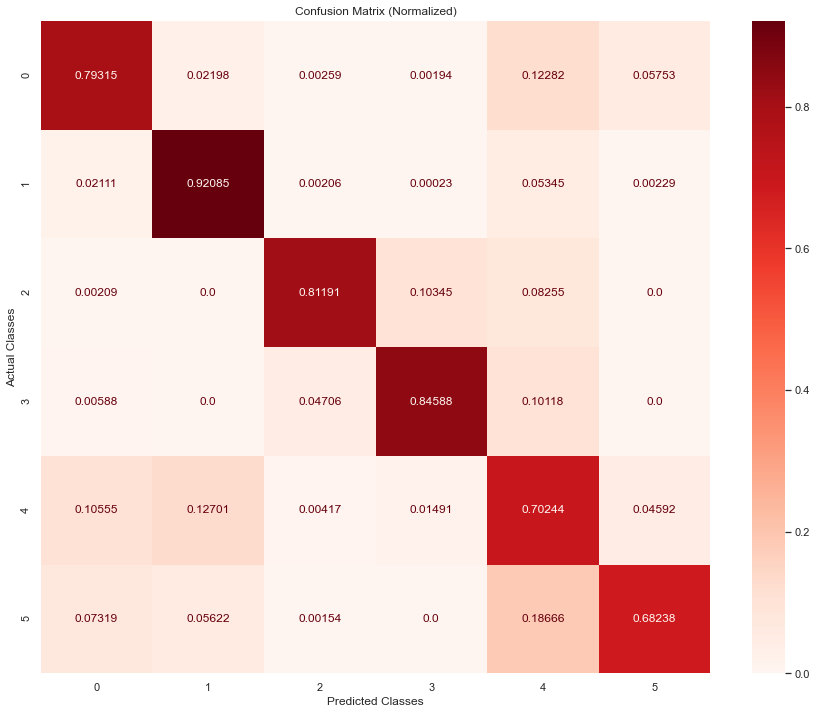

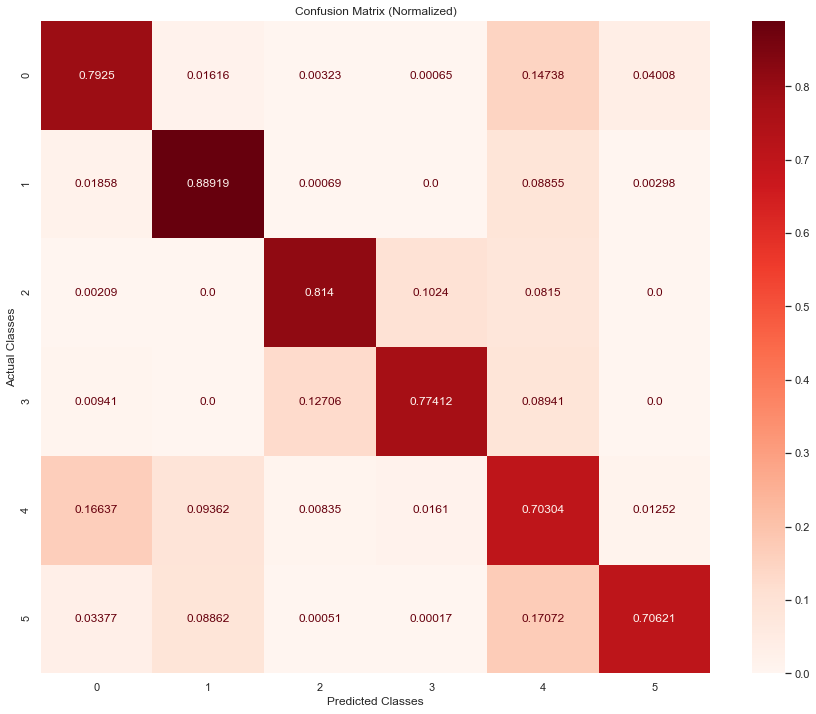

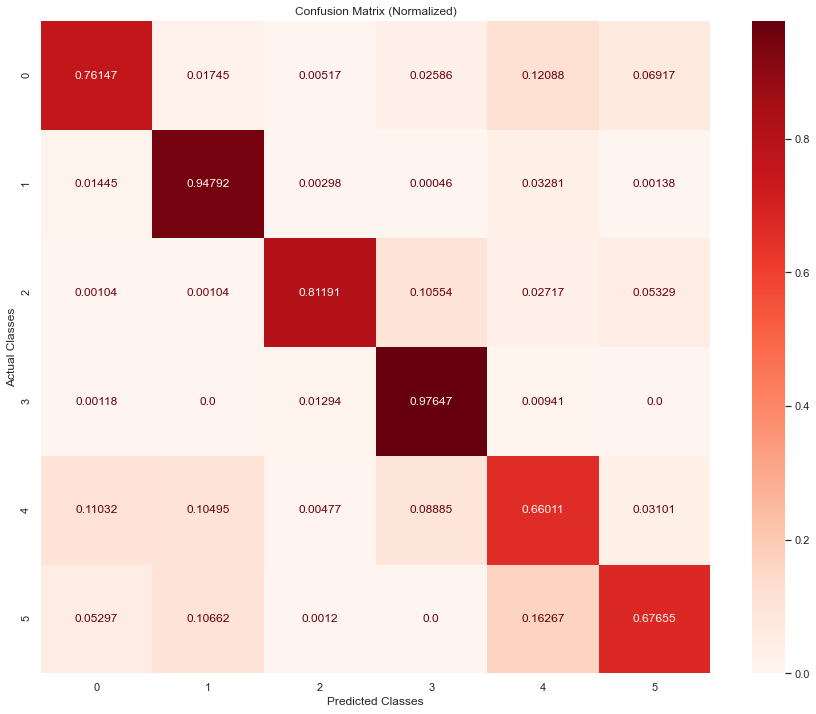

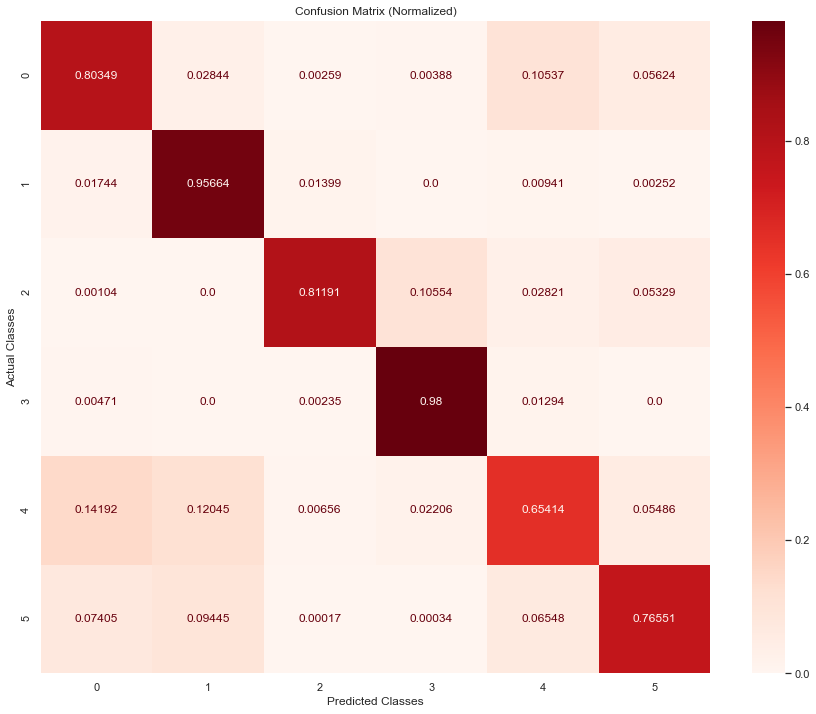

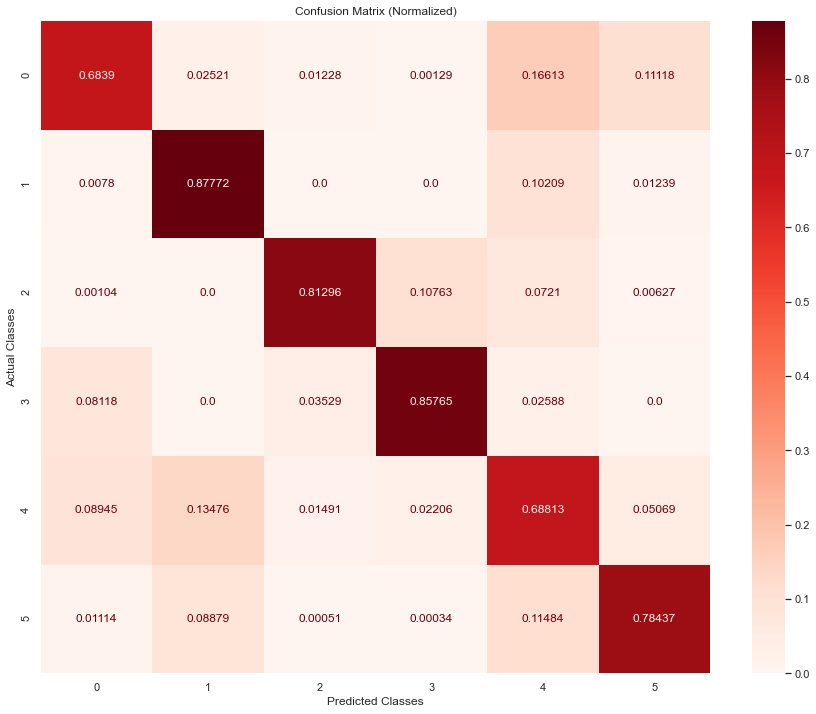

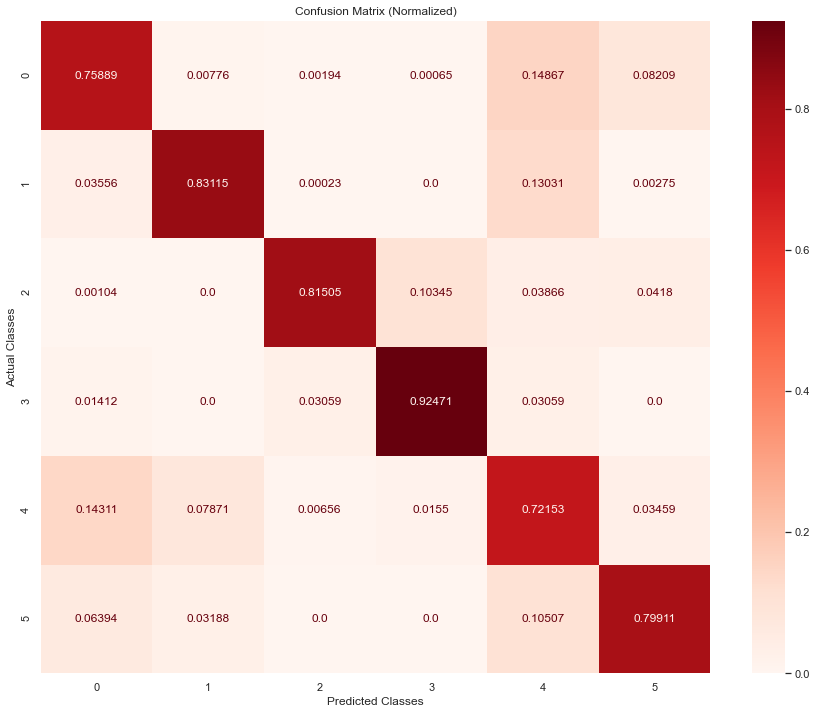

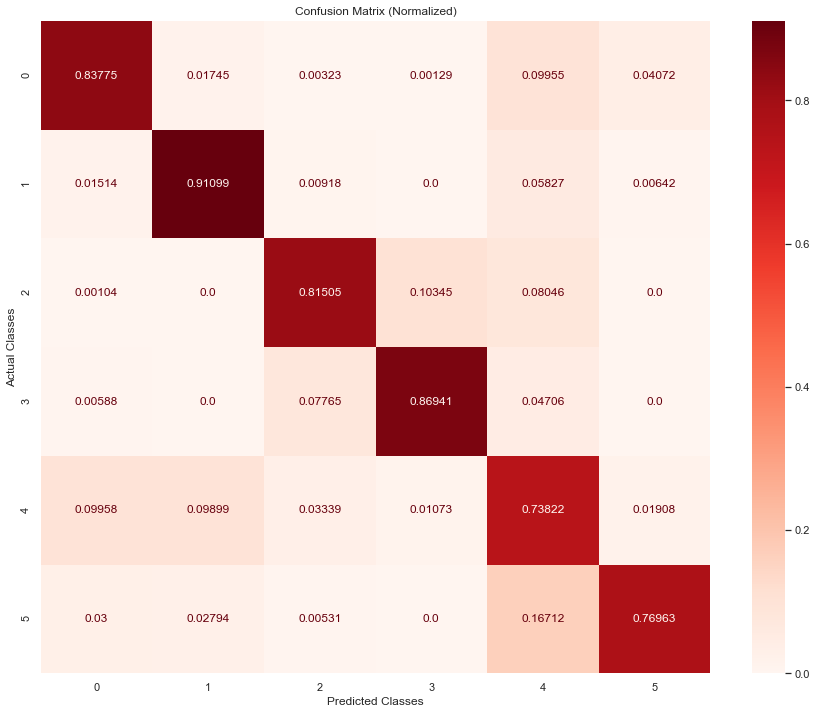

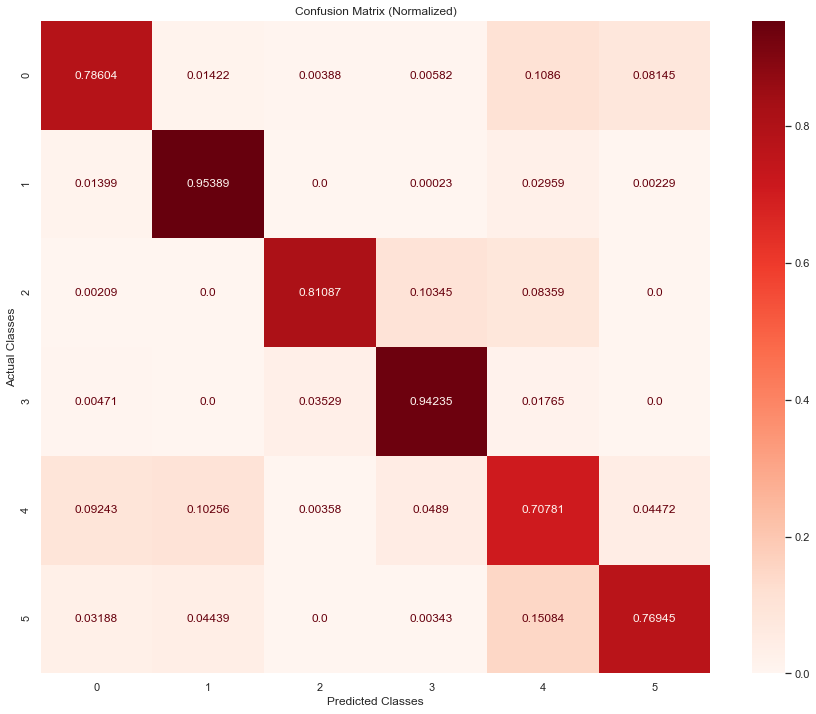

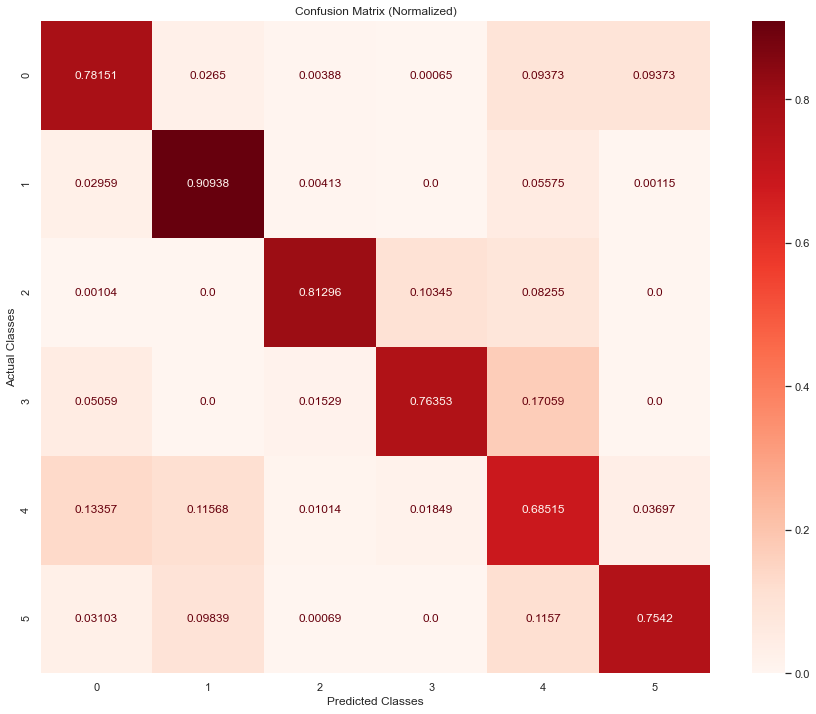

In [107]:
repeat_experiment_dac(model_type="bilstm", data = "balanced")

##### After feature reduction

Run:  1
reduced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 1)
(78137, 2)
(15224, 42, 1)
(15224, 2)
LSTM
Epoch 1/10
1221/1221 [==============================] - 7s 5ms/step - loss: 0.1855 - accuracy: 0.9212 - val_loss: 0.0192 - val_accuracy: 0.9956
Epoch 2/10
1221/1221 [==============================] - 7s 5ms/step - loss: 0.0276 - accuracy: 0.9930 - val_loss: 0.0139 - val_accuracy: 0.9968
Epoch 3/10
1221/1221 [==============================] - 7s 5ms/step - loss: 0.0180 - accuracy: 0.9954 - val_loss: 0.0187 - val_accuracy: 0.9957
Epoch 4/10
1221/1221 [==============================] - 7s 5ms/step - loss: 0.0149 - accuracy: 0.9960 - val_loss: 0.0135 - val_accuracy: 0.9970
Epoch 5/10
1221/1221 [==============================] - 7s 5ms/step - loss: 0.0144 - accuracy: 0.9962 - val_loss: 0.0152 - val_accuracy: 0.9965
Timed stopping at epoch 5 after training for 0:00:30

STATIONARY
LSTM
Epoch 1/5000
411/411 [==============================] - 4s 6ms/step - loss:

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  2
reduced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 1)
(78137, 2)
(15224, 42, 1)
(15224, 2)
LSTM
Epoch 1/10
1221/1221 [==============================] - 7s 5ms/step - loss: 0.1426 - accuracy: 0.9388 - val_loss: 0.0151 - val_accuracy: 0.9965
Epoch 2/10
1221/1221 [==============================] - 6s 5ms/step - loss: 0.0201 - accuracy: 0.9947 - val_loss: 0.0206 - val_accuracy: 0.9972
Epoch 3/10
1221/1221 [==============================] - 7s 5ms/step - loss: 0.0156 - accuracy: 0.9960 - val_loss: 0.0135 - val_accuracy: 0.9970
Epoch 4/10
1221/1221 [==============================] - 6s 5ms/step - loss: 0.0142 - accuracy: 0.9963 - val_loss: 0.0181 - val_accuracy: 0.9961
Epoch 5/10
1221/1221 [==============================] - 6s 5ms/step - loss: 0.0132 - accuracy: 0.9967 - val_loss: 0.0133 - val_accuracy: 0.9968
Timed stopping at epoch 5 after training for 0:00:30

STATIONARY
LSTM
Epoch 1/5000
408/408 [==============================] - 3s 5ms/step - loss:

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  3
reduced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 1)
(78137, 2)
(15224, 42, 1)
(15224, 2)
LSTM
Epoch 1/10
1221/1221 [==============================] - 8s 5ms/step - loss: 0.1481 - accuracy: 0.9374 - val_loss: 0.0174 - val_accuracy: 0.9960
Epoch 2/10
1221/1221 [==============================] - 6s 5ms/step - loss: 0.0234 - accuracy: 0.9943 - val_loss: 0.0169 - val_accuracy: 0.9965
Epoch 3/10
1221/1221 [==============================] - 6s 5ms/step - loss: 0.0162 - accuracy: 0.9960 - val_loss: 0.0125 - val_accuracy: 0.9970
Epoch 4/10
1221/1221 [==============================] - 6s 5ms/step - loss: 0.0140 - accuracy: 0.9964 - val_loss: 0.0153 - val_accuracy: 0.9966
Epoch 5/10
1221/1221 [==============================] - 6s 5ms/step - loss: 0.0145 - accuracy: 0.9961 - val_loss: 0.0164 - val_accuracy: 0.9967
Timed stopping at epoch 5 after training for 0:00:30

STATIONARY
LSTM
Epoch 1/5000
412/412 [==============================] - 3s 6ms/step - loss:

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  4
reduced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 1)
(78137, 2)
(15224, 42, 1)
(15224, 2)
LSTM
Epoch 1/10
1221/1221 [==============================] - 8s 5ms/step - loss: 0.1666 - accuracy: 0.9311 - val_loss: 0.0160 - val_accuracy: 0.9964
Epoch 2/10
1221/1221 [==============================] - 6s 5ms/step - loss: 0.0245 - accuracy: 0.9938 - val_loss: 0.0168 - val_accuracy: 0.9964
Epoch 3/10
1221/1221 [==============================] - 6s 5ms/step - loss: 0.0187 - accuracy: 0.9950 - val_loss: 0.0142 - val_accuracy: 0.9968
Epoch 4/10
1221/1221 [==============================] - 6s 5ms/step - loss: 0.0151 - accuracy: 0.9961 - val_loss: 0.0183 - val_accuracy: 0.9968
Epoch 5/10
1221/1221 [==============================] - 6s 5ms/step - loss: 0.0145 - accuracy: 0.9963 - val_loss: 0.0191 - val_accuracy: 0.9964
Timed stopping at epoch 5 after training for 0:00:30

STATIONARY
LSTM
Epoch 1/5000
411/411 [==============================] - 3s 6ms/step - loss:

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  5
reduced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 1)
(78137, 2)
(15224, 42, 1)
(15224, 2)
LSTM
Epoch 1/10
1221/1221 [==============================] - 8s 5ms/step - loss: 0.1793 - accuracy: 0.9227 - val_loss: 0.0202 - val_accuracy: 0.9953
Epoch 2/10
1221/1221 [==============================] - 6s 5ms/step - loss: 0.0207 - accuracy: 0.9948 - val_loss: 0.0310 - val_accuracy: 0.9949
Epoch 3/10
1221/1221 [==============================] - 6s 5ms/step - loss: 0.0155 - accuracy: 0.9959 - val_loss: 0.0133 - val_accuracy: 0.9966
Epoch 4/10
1221/1221 [==============================] - 6s 5ms/step - loss: 0.0143 - accuracy: 0.9962 - val_loss: 0.0153 - val_accuracy: 0.9964
Epoch 5/10
1221/1221 [==============================] - 6s 5ms/step - loss: 0.0130 - accuracy: 0.9966 - val_loss: 0.0123 - val_accuracy: 0.9973
Timed stopping at epoch 5 after training for 0:00:30

STATIONARY
LSTM
Epoch 1/5000
410/410 [==============================] - 3s 5ms/step - loss:

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  6
reduced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 1)
(78137, 2)
(15224, 42, 1)
(15224, 2)
LSTM
Epoch 1/10
1221/1221 [==============================] - 7s 5ms/step - loss: 0.1659 - accuracy: 0.9294 - val_loss: 0.0201 - val_accuracy: 0.9950
Epoch 2/10
1221/1221 [==============================] - 6s 5ms/step - loss: 0.0248 - accuracy: 0.9938 - val_loss: 0.0142 - val_accuracy: 0.9967
Epoch 3/10
1221/1221 [==============================] - 6s 5ms/step - loss: 0.0191 - accuracy: 0.9952 - val_loss: 0.0174 - val_accuracy: 0.9963
Epoch 4/10
1221/1221 [==============================] - 6s 5ms/step - loss: 0.0169 - accuracy: 0.9956 - val_loss: 0.0200 - val_accuracy: 0.9960
Epoch 5/10
1221/1221 [==============================] - 6s 5ms/step - loss: 0.0141 - accuracy: 0.9963 - val_loss: 0.0141 - val_accuracy: 0.9971
Timed stopping at epoch 5 after training for 0:00:30

STATIONARY
LSTM
Epoch 1/5000
412/412 [==============================] - 3s 6ms/step - loss:

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  7
reduced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 1)
(78137, 2)
(15224, 42, 1)
(15224, 2)
LSTM
Epoch 1/10
1221/1221 [==============================] - 7s 5ms/step - loss: 0.1831 - accuracy: 0.9239 - val_loss: 0.0275 - val_accuracy: 0.9927
Epoch 2/10
1221/1221 [==============================] - 6s 5ms/step - loss: 0.0248 - accuracy: 0.9939 - val_loss: 0.0139 - val_accuracy: 0.9968
Epoch 3/10
1221/1221 [==============================] - 6s 5ms/step - loss: 0.0181 - accuracy: 0.9955 - val_loss: 0.0137 - val_accuracy: 0.9967
Epoch 4/10
1221/1221 [==============================] - 7s 5ms/step - loss: 0.0150 - accuracy: 0.9962 - val_loss: 0.0133 - val_accuracy: 0.9971
Epoch 5/10
1221/1221 [==============================] - 6s 5ms/step - loss: 0.0145 - accuracy: 0.9966 - val_loss: 0.0160 - val_accuracy: 0.9970
Timed stopping at epoch 5 after training for 0:00:30

STATIONARY
LSTM
Epoch 1/5000
411/411 [==============================] - 3s 5ms/step - loss:

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  8
reduced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 1)
(78137, 2)
(15224, 42, 1)
(15224, 2)
LSTM
Epoch 1/10
1221/1221 [==============================] - 7s 5ms/step - loss: 0.1542 - accuracy: 0.9340 - val_loss: 0.0214 - val_accuracy: 0.9944
Epoch 2/10
1221/1221 [==============================] - 6s 5ms/step - loss: 0.0233 - accuracy: 0.9944 - val_loss: 0.0171 - val_accuracy: 0.9963
Epoch 3/10
1221/1221 [==============================] - 6s 5ms/step - loss: 0.0178 - accuracy: 0.9955 - val_loss: 0.0123 - val_accuracy: 0.9972
Epoch 4/10
1221/1221 [==============================] - 6s 5ms/step - loss: 0.0148 - accuracy: 0.9962 - val_loss: 0.0108 - val_accuracy: 0.9974
Epoch 5/10
1221/1221 [==============================] - 6s 5ms/step - loss: 0.0136 - accuracy: 0.9963 - val_loss: 0.0132 - val_accuracy: 0.9967
Timed stopping at epoch 5 after training for 0:00:30

STATIONARY
LSTM
Epoch 1/5000
413/413 [==============================] - 3s 5ms/step - loss:

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  9
reduced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 1)
(78137, 2)
(15224, 42, 1)
(15224, 2)
LSTM
Epoch 1/10
1221/1221 [==============================] - 7s 5ms/step - loss: 0.1338 - accuracy: 0.9448 - val_loss: 0.0182 - val_accuracy: 0.9958
Epoch 2/10
1221/1221 [==============================] - 6s 5ms/step - loss: 0.0230 - accuracy: 0.9944 - val_loss: 0.0230 - val_accuracy: 0.9949
Epoch 3/10
1221/1221 [==============================] - 6s 5ms/step - loss: 0.0157 - accuracy: 0.9960 - val_loss: 0.0194 - val_accuracy: 0.9963
Epoch 4/10
1221/1221 [==============================] - 6s 5ms/step - loss: 0.0144 - accuracy: 0.9961 - val_loss: 0.0130 - val_accuracy: 0.9969
Epoch 5/10
1221/1221 [==============================] - 6s 5ms/step - loss: 0.0137 - accuracy: 0.9962 - val_loss: 0.0153 - val_accuracy: 0.9963
Timed stopping at epoch 5 after training for 0:00:30

STATIONARY
LSTM
Epoch 1/5000
411/411 [==============================] - 3s 6ms/step - loss:

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  10
reduced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 1)
(78137, 2)
(15224, 42, 1)
(15224, 2)
LSTM
Epoch 1/10
1221/1221 [==============================] - 7s 5ms/step - loss: 0.1672 - accuracy: 0.9278 - val_loss: 0.0225 - val_accuracy: 0.9956
Epoch 2/10
1221/1221 [==============================] - 6s 5ms/step - loss: 0.0240 - accuracy: 0.9937 - val_loss: 0.0210 - val_accuracy: 0.9952
Epoch 3/10
1221/1221 [==============================] - 6s 5ms/step - loss: 0.0168 - accuracy: 0.9956 - val_loss: 0.0147 - val_accuracy: 0.9961
Epoch 4/10
1221/1221 [==============================] - 6s 5ms/step - loss: 0.0147 - accuracy: 0.9963 - val_loss: 0.0131 - val_accuracy: 0.9971
Epoch 5/10
1221/1221 [==============================] - 6s 5ms/step - loss: 0.0136 - accuracy: 0.9966 - val_loss: 0.0202 - val_accuracy: 0.9949
Timed stopping at epoch 5 after training for 0:00:30

STATIONARY
LSTM
Epoch 1/5000
414/414 [==============================] - 3s 5ms/step - loss

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


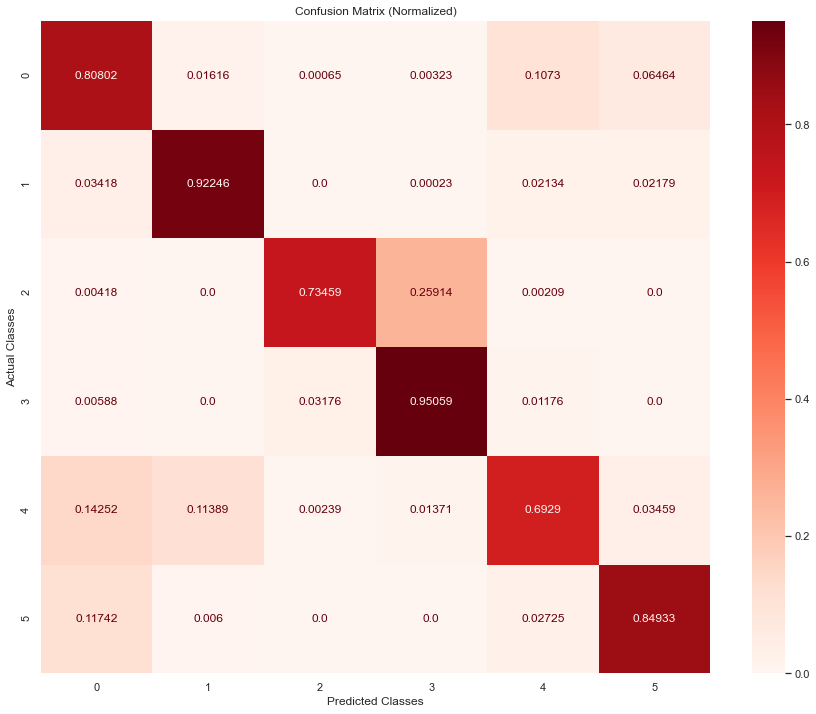

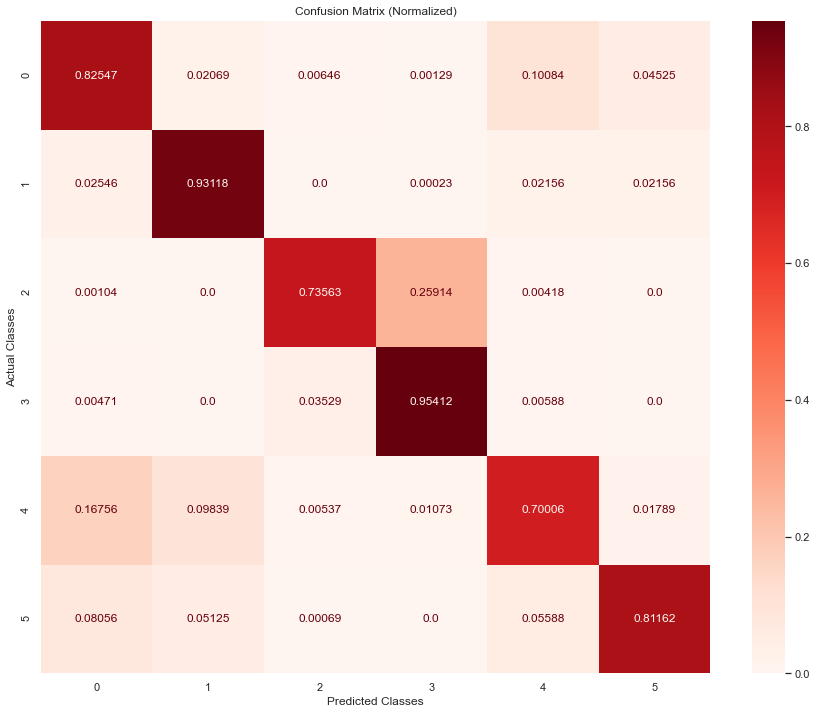

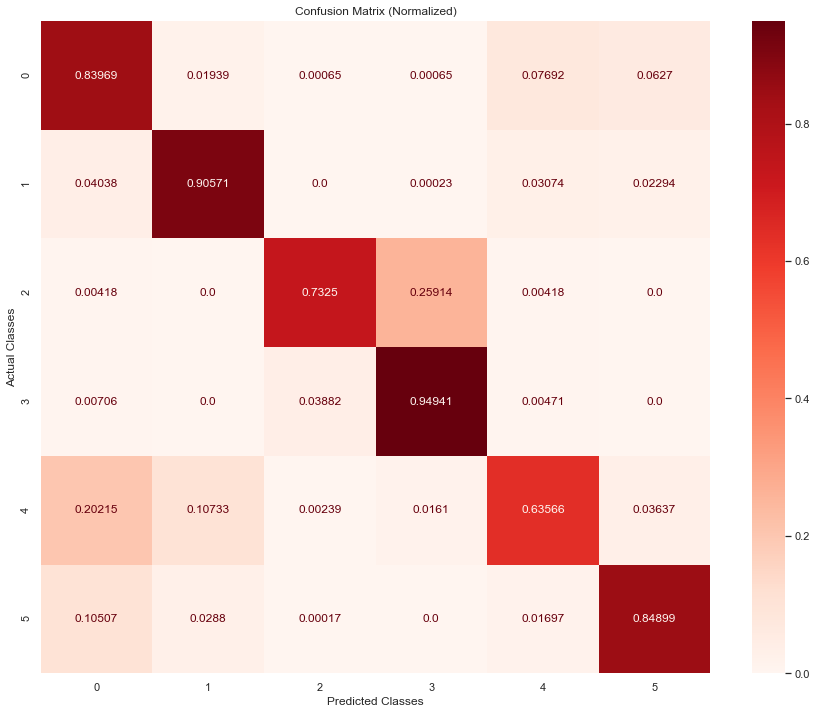

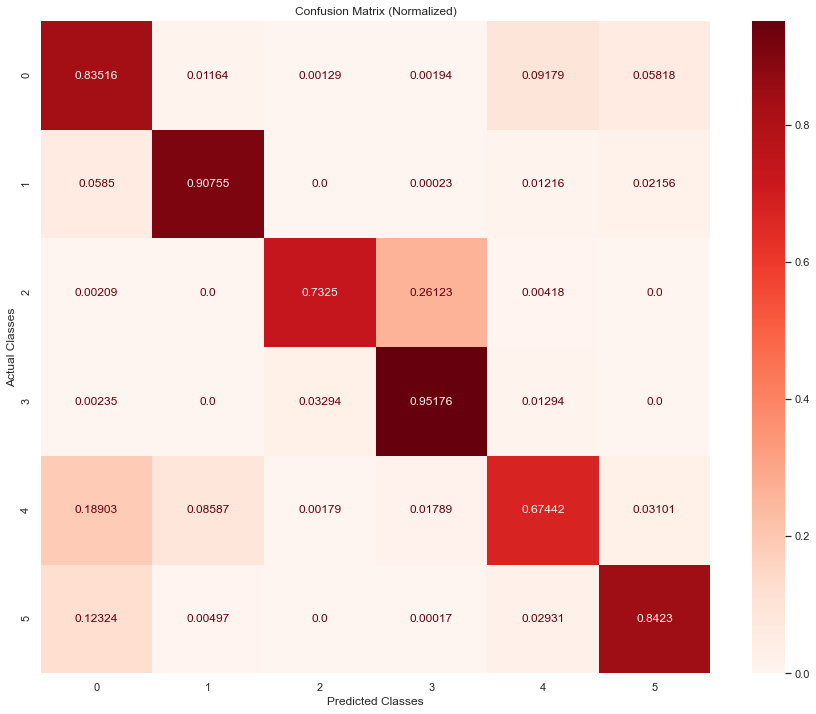

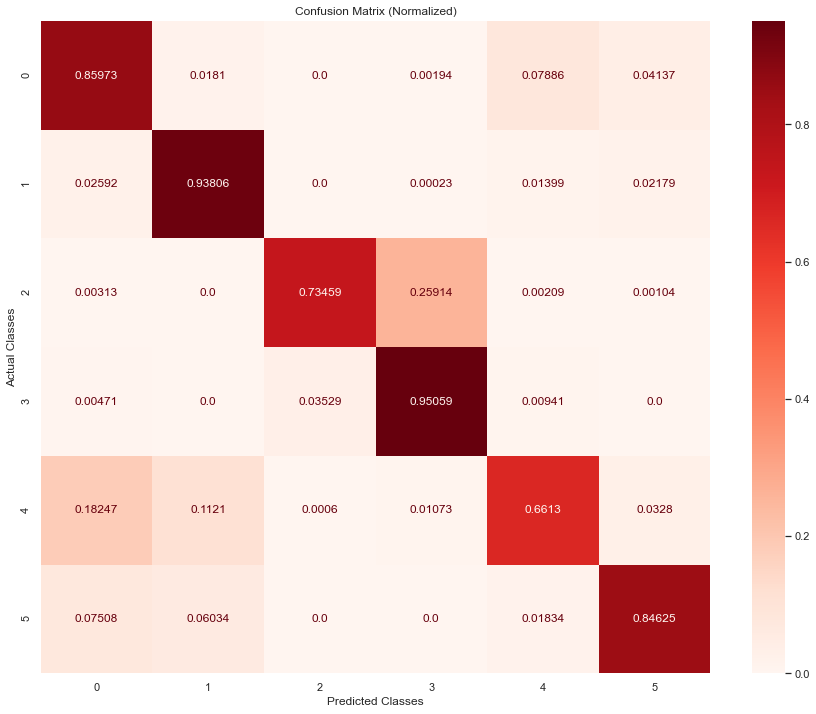

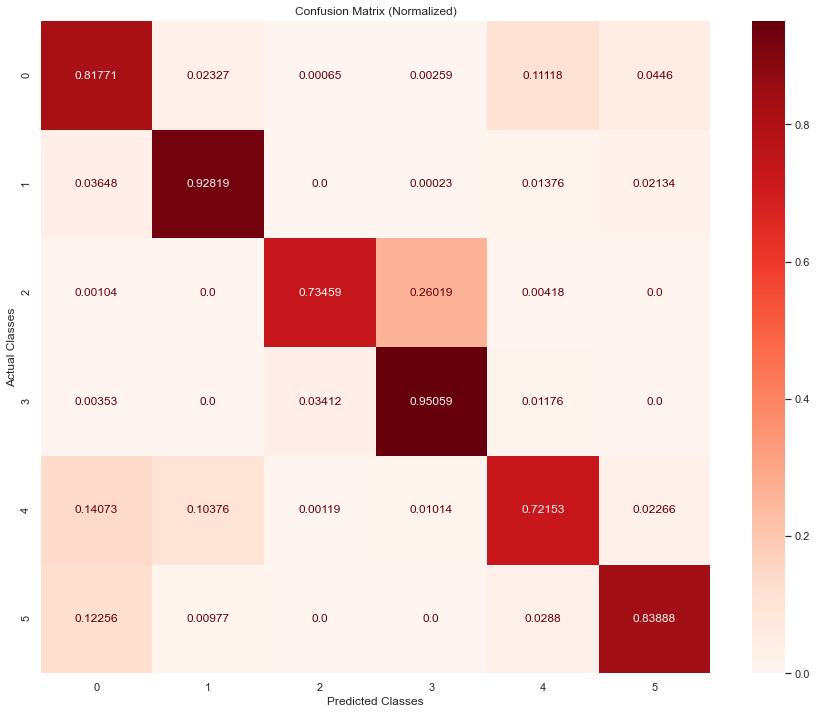

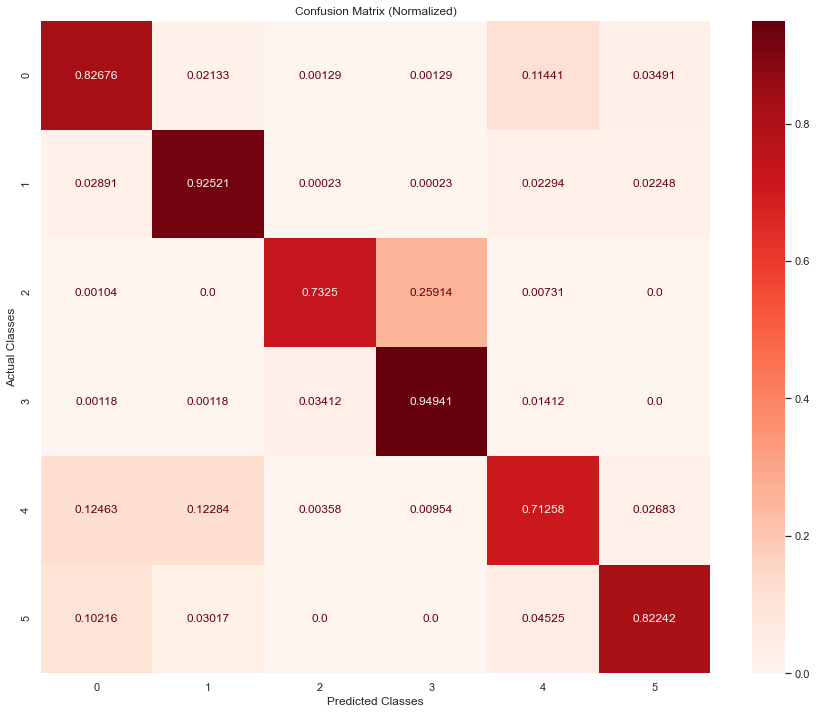

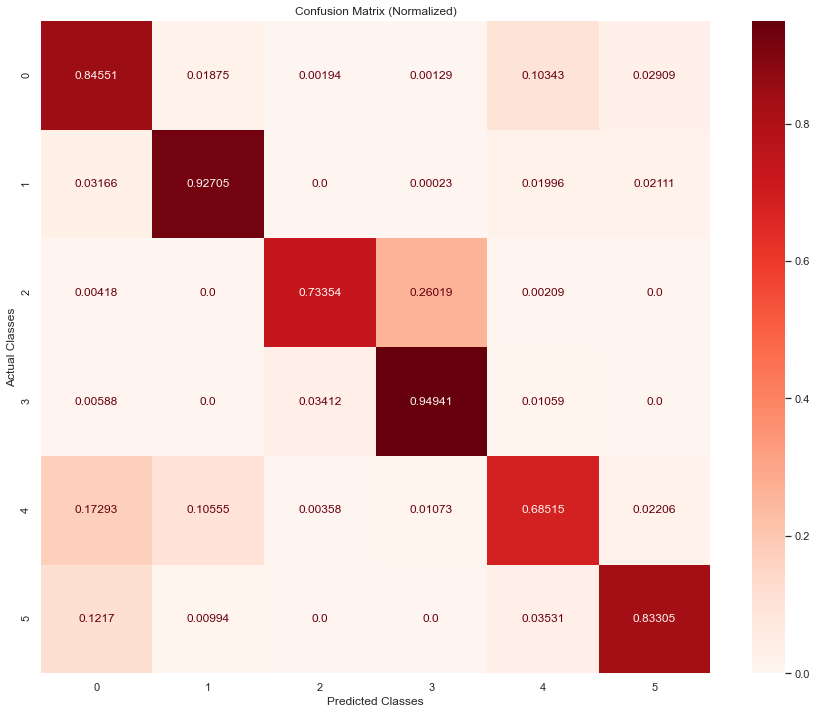

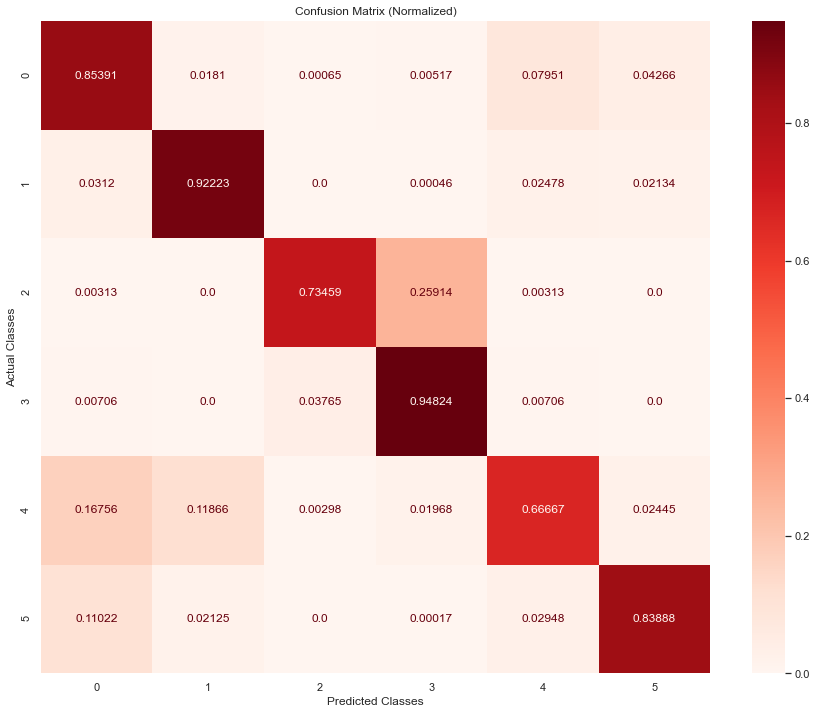

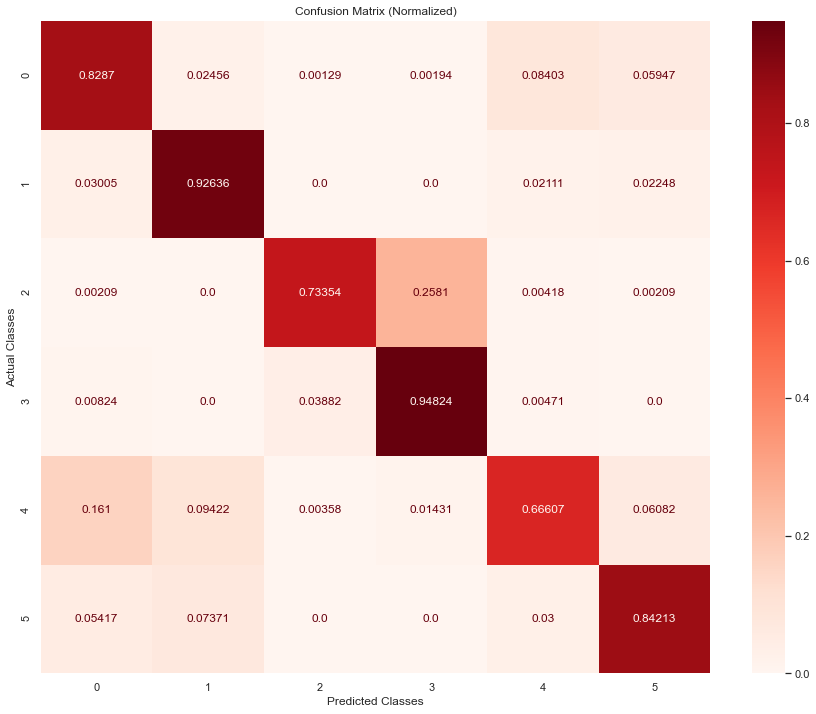

In [108]:
repeat_experiment_dac(repeats=REPEATS, model_type="lstm", data = "reduced")

Run:  1
reduced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 1)
(78137, 2)
(15224, 42, 1)
(15224, 2)
CNN-LSTM
Epoch 1/10
1221/1221 [==============================] - 6s 5ms/step - loss: 0.0324 - accuracy: 0.9860 - val_loss: 0.0184 - val_accuracy: 0.9941
Epoch 2/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0132 - accuracy: 0.9965 - val_loss: 0.0288 - val_accuracy: 0.9912
Epoch 3/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0111 - accuracy: 0.9969 - val_loss: 0.0205 - val_accuracy: 0.9943
Epoch 4/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0099 - accuracy: 0.9974 - val_loss: 0.0096 - val_accuracy: 0.9969
Epoch 5/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0099 - accuracy: 0.9971 - val_loss: 0.0209 - val_accuracy: 0.9937
Epoch 6/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0085 - accuracy: 0.9977 - val_loss: 0.0107 - val_accuracy: 0.99

812/812 [==============================] - 3s 4ms/step - loss: 0.2125 - accuracy: 0.9230 - val_loss: 0.8842 - val_accuracy: 0.8542
Epoch 25/5000
812/812 [==============================] - 3s 4ms/step - loss: 0.2070 - accuracy: 0.9255 - val_loss: 0.9431 - val_accuracy: 0.8552
Epoch 26/5000
812/812 [==============================] - 3s 4ms/step - loss: 0.1988 - accuracy: 0.9280 - val_loss: 0.8814 - val_accuracy: 0.8578
Epoch 27/5000
812/812 [==============================] - 3s 4ms/step - loss: 0.1970 - accuracy: 0.9295 - val_loss: 0.9904 - val_accuracy: 0.8488
Epoch 28/5000
812/812 [==============================] - 3s 4ms/step - loss: 0.1892 - accuracy: 0.9328 - val_loss: 0.9816 - val_accuracy: 0.8445
Epoch 29/5000
812/812 [==============================] - 3s 4ms/step - loss: 0.1911 - accuracy: 0.9313 - val_loss: 0.9292 - val_accuracy: 0.8517
Epoch 30/5000
812/812 [==============================] - 3s 4ms/step - loss: 0.1879 - accuracy: 0.9311 - val_loss: 0.9058 - val_accuracy: 0.8529

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  2
reduced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 1)
(78137, 2)
(15224, 42, 1)
(15224, 2)
CNN-LSTM
Epoch 1/10
1221/1221 [==============================] - 6s 4ms/step - loss: 0.0328 - accuracy: 0.9859 - val_loss: 0.0137 - val_accuracy: 0.9955
Epoch 2/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0124 - accuracy: 0.9968 - val_loss: 0.0199 - val_accuracy: 0.9940
Epoch 3/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0110 - accuracy: 0.9971 - val_loss: 0.0097 - val_accuracy: 0.9969
Epoch 4/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0109 - accuracy: 0.9971 - val_loss: 0.0199 - val_accuracy: 0.9931
Epoch 5/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0104 - accuracy: 0.9972 - val_loss: 0.0278 - val_accuracy: 0.9930
Epoch 6/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0088 - accuracy: 0.9975 - val_loss: 0.0439 - val_accuracy: 0.99

807/807 [==============================] - 3s 4ms/step - loss: 0.1973 - accuracy: 0.9285 - val_loss: 0.8444 - val_accuracy: 0.8559
Epoch 27/5000
807/807 [==============================] - 3s 4ms/step - loss: 0.1937 - accuracy: 0.9300 - val_loss: 0.9295 - val_accuracy: 0.8501
Epoch 28/5000
807/807 [==============================] - 3s 4ms/step - loss: 0.1929 - accuracy: 0.9297 - val_loss: 0.8839 - val_accuracy: 0.8614
Epoch 29/5000
807/807 [==============================] - 3s 4ms/step - loss: 0.1875 - accuracy: 0.9313 - val_loss: 0.8904 - val_accuracy: 0.8592
Epoch 30/5000
807/807 [==============================] - 3s 4ms/step - loss: 0.1844 - accuracy: 0.9338 - val_loss: 0.8639 - val_accuracy: 0.8573
Epoch 31/5000
807/807 [==============================] - 3s 4ms/step - loss: 0.1783 - accuracy: 0.9350 - val_loss: 0.8638 - val_accuracy: 0.8582
Epoch 32/5000
807/807 [==============================] - 3s 4ms/step - loss: 0.1796 - accuracy: 0.9358 - val_loss: 0.9141 - val_accuracy: 0.8586

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  3
reduced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 1)
(78137, 2)
(15224, 42, 1)
(15224, 2)
CNN-LSTM
Epoch 1/10
1221/1221 [==============================] - 6s 4ms/step - loss: 0.0313 - accuracy: 0.9871 - val_loss: 0.0193 - val_accuracy: 0.9935
Epoch 2/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0131 - accuracy: 0.9966 - val_loss: 0.0188 - val_accuracy: 0.9942
Epoch 3/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0107 - accuracy: 0.9972 - val_loss: 0.0226 - val_accuracy: 0.9936
Epoch 4/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0102 - accuracy: 0.9973 - val_loss: 0.0103 - val_accuracy: 0.9972
Epoch 5/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0095 - accuracy: 0.9974 - val_loss: 0.0088 - val_accuracy: 0.9970
Epoch 6/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0090 - accuracy: 0.9976 - val_loss: 0.0098 - val_accuracy: 0.99

816/816 [==============================] - 3s 4ms/step - loss: 0.2269 - accuracy: 0.9185 - val_loss: 0.9017 - val_accuracy: 0.8417
Epoch 23/5000
816/816 [==============================] - 3s 4ms/step - loss: 0.2227 - accuracy: 0.9195 - val_loss: 0.8528 - val_accuracy: 0.8512
Epoch 24/5000
816/816 [==============================] - 3s 4ms/step - loss: 0.2212 - accuracy: 0.9202 - val_loss: 0.9227 - val_accuracy: 0.8449
Epoch 25/5000
816/816 [==============================] - 3s 4ms/step - loss: 0.2166 - accuracy: 0.9213 - val_loss: 0.7923 - val_accuracy: 0.8545
Epoch 26/5000
816/816 [==============================] - 3s 4ms/step - loss: 0.2123 - accuracy: 0.9223 - val_loss: 0.9167 - val_accuracy: 0.8466
Epoch 27/5000
816/816 [==============================] - 4s 4ms/step - loss: 0.2034 - accuracy: 0.9253 - val_loss: 0.9039 - val_accuracy: 0.8517
Epoch 28/5000
816/816 [==============================] - 4s 4ms/step - loss: 0.2007 - accuracy: 0.9270 - val_loss: 0.9961 - val_accuracy: 0.8429

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  4
reduced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 1)
(78137, 2)
(15224, 42, 1)
(15224, 2)
CNN-LSTM
Epoch 1/10
1221/1221 [==============================] - 6s 4ms/step - loss: 0.0301 - accuracy: 0.9880 - val_loss: 0.0200 - val_accuracy: 0.9932
Epoch 2/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0122 - accuracy: 0.9968 - val_loss: 0.0263 - val_accuracy: 0.9924
Epoch 3/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0118 - accuracy: 0.9967 - val_loss: 0.0129 - val_accuracy: 0.9964
Epoch 4/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0102 - accuracy: 0.9973 - val_loss: 0.0135 - val_accuracy: 0.9956
Epoch 5/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0095 - accuracy: 0.9974 - val_loss: 0.0163 - val_accuracy: 0.9953
Epoch 6/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0092 - accuracy: 0.9977 - val_loss: 0.0187 - val_accuracy: 0.99

810/810 [==============================] - 3s 4ms/step - loss: 0.1988 - accuracy: 0.9285 - val_loss: 0.8822 - val_accuracy: 0.8552
Epoch 26/5000
810/810 [==============================] - 3s 4ms/step - loss: 0.2006 - accuracy: 0.9274 - val_loss: 0.8696 - val_accuracy: 0.8384
Epoch 27/5000
810/810 [==============================] - 3s 4ms/step - loss: 0.1937 - accuracy: 0.9299 - val_loss: 0.9656 - val_accuracy: 0.8442
Epoch 28/5000
810/810 [==============================] - 3s 4ms/step - loss: 0.1925 - accuracy: 0.9298 - val_loss: 0.9261 - val_accuracy: 0.8564
Epoch 29/5000
810/810 [==============================] - 3s 4ms/step - loss: 0.1896 - accuracy: 0.9322 - val_loss: 0.8714 - val_accuracy: 0.8517
Epoch 30/5000
810/810 [==============================] - 3s 4ms/step - loss: 0.1849 - accuracy: 0.9337 - val_loss: 0.9167 - val_accuracy: 0.8559
Epoch 31/5000
810/810 [==============================] - 3s 4ms/step - loss: 0.1781 - accuracy: 0.9359 - val_loss: 0.9140 - val_accuracy: 0.8570

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  5
reduced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 1)
(78137, 2)
(15224, 42, 1)
(15224, 2)
CNN-LSTM
Epoch 1/10
1221/1221 [==============================] - 6s 4ms/step - loss: 0.0358 - accuracy: 0.9851 - val_loss: 0.0156 - val_accuracy: 0.9957
Epoch 2/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0120 - accuracy: 0.9968 - val_loss: 0.0225 - val_accuracy: 0.9923
Epoch 3/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0110 - accuracy: 0.9971 - val_loss: 0.0158 - val_accuracy: 0.9944
Epoch 4/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0105 - accuracy: 0.9973 - val_loss: 0.0152 - val_accuracy: 0.9951
Epoch 5/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0099 - accuracy: 0.9974 - val_loss: 0.0224 - val_accuracy: 0.9928
Epoch 6/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0100 - accuracy: 0.9974 - val_loss: 0.0233 - val_accuracy: 0.99

809/809 [==============================] - 3s 4ms/step - loss: 0.1939 - accuracy: 0.9301 - val_loss: 0.9593 - val_accuracy: 0.8503
Epoch 26/5000
809/809 [==============================] - 3s 4ms/step - loss: 0.1887 - accuracy: 0.9315 - val_loss: 0.9423 - val_accuracy: 0.8495
Epoch 27/5000
809/809 [==============================] - 3s 4ms/step - loss: 0.1877 - accuracy: 0.9312 - val_loss: 0.9106 - val_accuracy: 0.8514
Epoch 28/5000
809/809 [==============================] - 3s 4ms/step - loss: 0.1808 - accuracy: 0.9352 - val_loss: 1.0447 - val_accuracy: 0.8569
Epoch 29/5000
809/809 [==============================] - 3s 4ms/step - loss: 0.1810 - accuracy: 0.9352 - val_loss: 0.9145 - val_accuracy: 0.8528
Epoch 30/5000
809/809 [==============================] - 3s 4ms/step - loss: 0.1739 - accuracy: 0.9372 - val_loss: 0.9756 - val_accuracy: 0.8546
Epoch 31/5000
809/809 [==============================] - 3s 4ms/step - loss: 0.1721 - accuracy: 0.9380 - val_loss: 0.9318 - val_accuracy: 0.8588

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  6
reduced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 1)
(78137, 2)
(15224, 42, 1)
(15224, 2)
CNN-LSTM
Epoch 1/10
1221/1221 [==============================] - 6s 4ms/step - loss: 0.0324 - accuracy: 0.9864 - val_loss: 0.0168 - val_accuracy: 0.9945
Epoch 2/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0123 - accuracy: 0.9966 - val_loss: 0.0244 - val_accuracy: 0.9924
Epoch 3/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0114 - accuracy: 0.9972 - val_loss: 0.0109 - val_accuracy: 0.9966
Epoch 4/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0103 - accuracy: 0.9971 - val_loss: 0.0118 - val_accuracy: 0.9968
Epoch 5/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0104 - accuracy: 0.9972 - val_loss: 0.0167 - val_accuracy: 0.9945
Epoch 6/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0091 - accuracy: 0.9976 - val_loss: 0.0221 - val_accuracy: 0.99

809/809 [==============================] - 3s 4ms/step - loss: 0.2049 - accuracy: 0.9253 - val_loss: 0.9145 - val_accuracy: 0.8587
Epoch 25/5000
809/809 [==============================] - 3s 4ms/step - loss: 0.1987 - accuracy: 0.9285 - val_loss: 0.9012 - val_accuracy: 0.8477
Epoch 26/5000
809/809 [==============================] - 3s 4ms/step - loss: 0.1963 - accuracy: 0.9293 - val_loss: 0.9714 - val_accuracy: 0.8521
Epoch 27/5000
809/809 [==============================] - 3s 4ms/step - loss: 0.1889 - accuracy: 0.9311 - val_loss: 0.8582 - val_accuracy: 0.8511
Epoch 28/5000
809/809 [==============================] - 3s 4ms/step - loss: 0.1873 - accuracy: 0.9319 - val_loss: 0.8714 - val_accuracy: 0.8518
Epoch 29/5000
809/809 [==============================] - 3s 4ms/step - loss: 0.1873 - accuracy: 0.9319 - val_loss: 0.9856 - val_accuracy: 0.8541
Epoch 30/5000
809/809 [==============================] - 3s 4ms/step - loss: 0.1837 - accuracy: 0.9329 - val_loss: 0.9124 - val_accuracy: 0.8585

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  7
reduced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 1)
(78137, 2)
(15224, 42, 1)
(15224, 2)
CNN-LSTM
Epoch 1/10
1221/1221 [==============================] - 6s 4ms/step - loss: 0.0326 - accuracy: 0.9865 - val_loss: 0.0120 - val_accuracy: 0.9967
Epoch 2/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0119 - accuracy: 0.9969 - val_loss: 0.0168 - val_accuracy: 0.9950
Epoch 3/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0113 - accuracy: 0.9969 - val_loss: 0.0206 - val_accuracy: 0.9941
Epoch 4/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0102 - accuracy: 0.9973 - val_loss: 0.0111 - val_accuracy: 0.9967
Epoch 5/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0090 - accuracy: 0.9975 - val_loss: 0.0125 - val_accuracy: 0.9963
Epoch 6/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0088 - accuracy: 0.9977 - val_loss: 0.0118 - val_accuracy: 0.99

811/811 [==============================] - 3s 4ms/step - loss: 0.2059 - accuracy: 0.9251 - val_loss: 0.7754 - val_accuracy: 0.8558
Epoch 26/5000
811/811 [==============================] - 3s 4ms/step - loss: 0.1994 - accuracy: 0.9285 - val_loss: 0.8054 - val_accuracy: 0.8565
Epoch 27/5000
811/811 [==============================] - 3s 4ms/step - loss: 0.1973 - accuracy: 0.9279 - val_loss: 0.8549 - val_accuracy: 0.8567
Epoch 28/5000
811/811 [==============================] - 3s 4ms/step - loss: 0.1923 - accuracy: 0.9297 - val_loss: 0.8204 - val_accuracy: 0.8517
Epoch 29/5000
811/811 [==============================] - 3s 4ms/step - loss: 0.1887 - accuracy: 0.9317 - val_loss: 0.8948 - val_accuracy: 0.8546
Epoch 30/5000
811/811 [==============================] - 4s 4ms/step - loss: 0.1854 - accuracy: 0.9331 - val_loss: 0.8685 - val_accuracy: 0.8487
Epoch 31/5000
811/811 [==============================] - 4s 4ms/step - loss: 0.1809 - accuracy: 0.9339 - val_loss: 0.9674 - val_accuracy: 0.8523

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  8
reduced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 1)
(78137, 2)
(15224, 42, 1)
(15224, 2)
CNN-LSTM
Epoch 1/10
1221/1221 [==============================] - 6s 4ms/step - loss: 0.0309 - accuracy: 0.9872 - val_loss: 0.0108 - val_accuracy: 0.9960
Epoch 2/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0119 - accuracy: 0.9968 - val_loss: 0.0170 - val_accuracy: 0.9942
Epoch 3/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0105 - accuracy: 0.9972 - val_loss: 0.0134 - val_accuracy: 0.9960
Epoch 4/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0101 - accuracy: 0.9974 - val_loss: 0.0187 - val_accuracy: 0.9949
Epoch 5/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0092 - accuracy: 0.9975 - val_loss: 0.0217 - val_accuracy: 0.9934
Epoch 6/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0098 - accuracy: 0.9974 - val_loss: 0.0088 - val_accuracy: 0.99

813/813 [==============================] - 3s 4ms/step - loss: 0.2229 - accuracy: 0.9184 - val_loss: 0.7643 - val_accuracy: 0.8532
Epoch 23/5000
813/813 [==============================] - 3s 4ms/step - loss: 0.2188 - accuracy: 0.9196 - val_loss: 0.7778 - val_accuracy: 0.8592
Epoch 24/5000
813/813 [==============================] - 3s 4ms/step - loss: 0.2116 - accuracy: 0.9233 - val_loss: 0.7762 - val_accuracy: 0.8515
Epoch 25/5000
813/813 [==============================] - 3s 4ms/step - loss: 0.2102 - accuracy: 0.9225 - val_loss: 0.8706 - val_accuracy: 0.8535
Epoch 26/5000
813/813 [==============================] - 3s 4ms/step - loss: 0.2089 - accuracy: 0.9240 - val_loss: 0.8300 - val_accuracy: 0.8577
Epoch 27/5000
813/813 [==============================] - 3s 4ms/step - loss: 0.2033 - accuracy: 0.9253 - val_loss: 0.7928 - val_accuracy: 0.8630
Epoch 28/5000
813/813 [==============================] - 3s 4ms/step - loss: 0.2020 - accuracy: 0.9280 - val_loss: 0.8575 - val_accuracy: 0.8554

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  9
reduced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 1)
(78137, 2)
(15224, 42, 1)
(15224, 2)
CNN-LSTM
Epoch 1/10
1221/1221 [==============================] - 6s 4ms/step - loss: 0.0323 - accuracy: 0.9873 - val_loss: 0.0186 - val_accuracy: 0.9945
Epoch 2/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0119 - accuracy: 0.9968 - val_loss: 0.0166 - val_accuracy: 0.9953
Epoch 3/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0109 - accuracy: 0.9970 - val_loss: 0.0111 - val_accuracy: 0.9966
Epoch 4/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0097 - accuracy: 0.9974 - val_loss: 0.0282 - val_accuracy: 0.9927
Epoch 5/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0100 - accuracy: 0.9973 - val_loss: 0.0211 - val_accuracy: 0.9939
Epoch 6/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0085 - accuracy: 0.9976 - val_loss: 0.0094 - val_accuracy: 0.99

813/813 [==============================] - 3s 4ms/step - loss: 0.2139 - accuracy: 0.9220 - val_loss: 0.9383 - val_accuracy: 0.8535
Epoch 24/5000
813/813 [==============================] - 4s 4ms/step - loss: 0.2120 - accuracy: 0.9229 - val_loss: 0.8129 - val_accuracy: 0.8509
Epoch 25/5000
813/813 [==============================] - 3s 4ms/step - loss: 0.2058 - accuracy: 0.9256 - val_loss: 0.8534 - val_accuracy: 0.8563
Epoch 26/5000
813/813 [==============================] - 3s 4ms/step - loss: 0.2002 - accuracy: 0.9270 - val_loss: 0.9082 - val_accuracy: 0.8559
Epoch 27/5000
813/813 [==============================] - 3s 4ms/step - loss: 0.2009 - accuracy: 0.9273 - val_loss: 0.8718 - val_accuracy: 0.8557
Epoch 28/5000
813/813 [==============================] - 3s 4ms/step - loss: 0.1947 - accuracy: 0.9292 - val_loss: 0.9007 - val_accuracy: 0.8510
Epoch 29/5000
813/813 [==============================] - 3s 4ms/step - loss: 0.1879 - accuracy: 0.9313 - val_loss: 0.9332 - val_accuracy: 0.8582

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  10
reduced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 1)
(78137, 2)
(15224, 42, 1)
(15224, 2)
CNN-LSTM
Epoch 1/10
1221/1221 [==============================] - 6s 4ms/step - loss: 0.0331 - accuracy: 0.9877 - val_loss: 0.0146 - val_accuracy: 0.9951
Epoch 2/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0120 - accuracy: 0.9969 - val_loss: 0.0144 - val_accuracy: 0.9955
Epoch 3/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0116 - accuracy: 0.9970 - val_loss: 0.0194 - val_accuracy: 0.9940
Epoch 4/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0107 - accuracy: 0.9972 - val_loss: 0.0304 - val_accuracy: 0.9926
Epoch 5/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0096 - accuracy: 0.9973 - val_loss: 0.0103 - val_accuracy: 0.9974
Epoch 6/10
1221/1221 [==============================] - 5s 4ms/step - loss: 0.0104 - accuracy: 0.9973 - val_loss: 0.0227 - val_accuracy: 0.9

810/810 [==============================] - 3s 4ms/step - loss: 0.2082 - accuracy: 0.9242 - val_loss: 0.8992 - val_accuracy: 0.8551
Epoch 25/5000
810/810 [==============================] - 3s 4ms/step - loss: 0.2033 - accuracy: 0.9259 - val_loss: 0.9307 - val_accuracy: 0.8379
Epoch 26/5000
810/810 [==============================] - 3s 4ms/step - loss: 0.1972 - accuracy: 0.9279 - val_loss: 0.9713 - val_accuracy: 0.8521
Epoch 27/5000
810/810 [==============================] - 3s 4ms/step - loss: 0.1969 - accuracy: 0.9279 - val_loss: 0.9152 - val_accuracy: 0.8560
Epoch 28/5000
810/810 [==============================] - 3s 4ms/step - loss: 0.1920 - accuracy: 0.9302 - val_loss: 0.8738 - val_accuracy: 0.8557
Epoch 29/5000
810/810 [==============================] - 3s 4ms/step - loss: 0.1876 - accuracy: 0.9318 - val_loss: 0.9771 - val_accuracy: 0.8563
Epoch 30/5000
810/810 [==============================] - 3s 4ms/step - loss: 0.1868 - accuracy: 0.9320 - val_loss: 0.9928 - val_accuracy: 0.8529

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


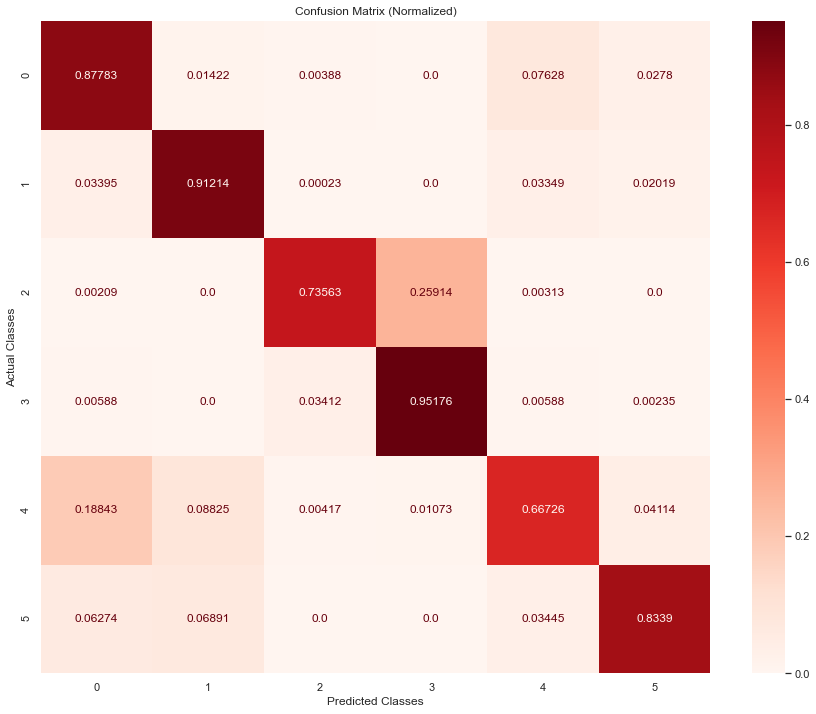

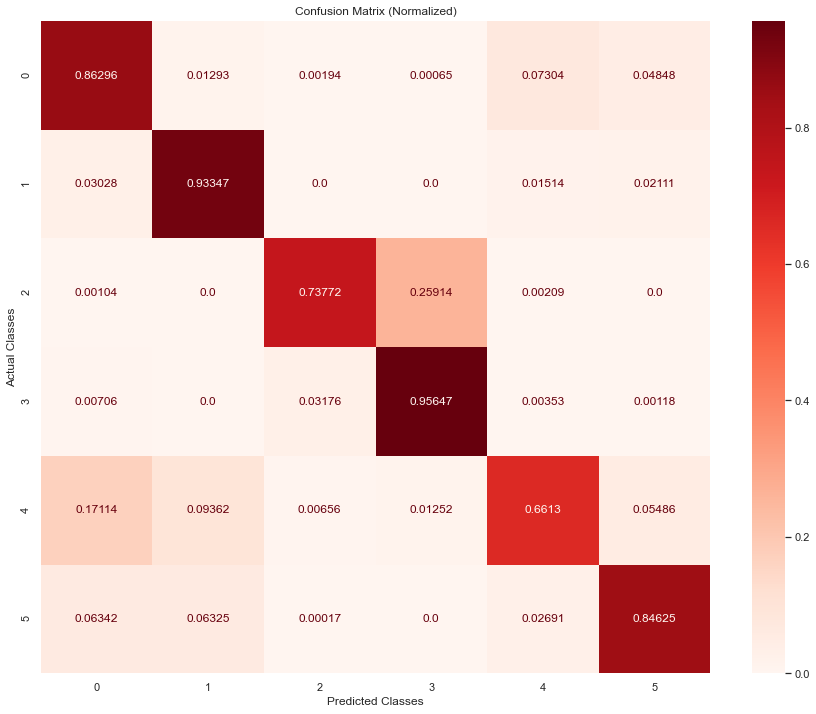

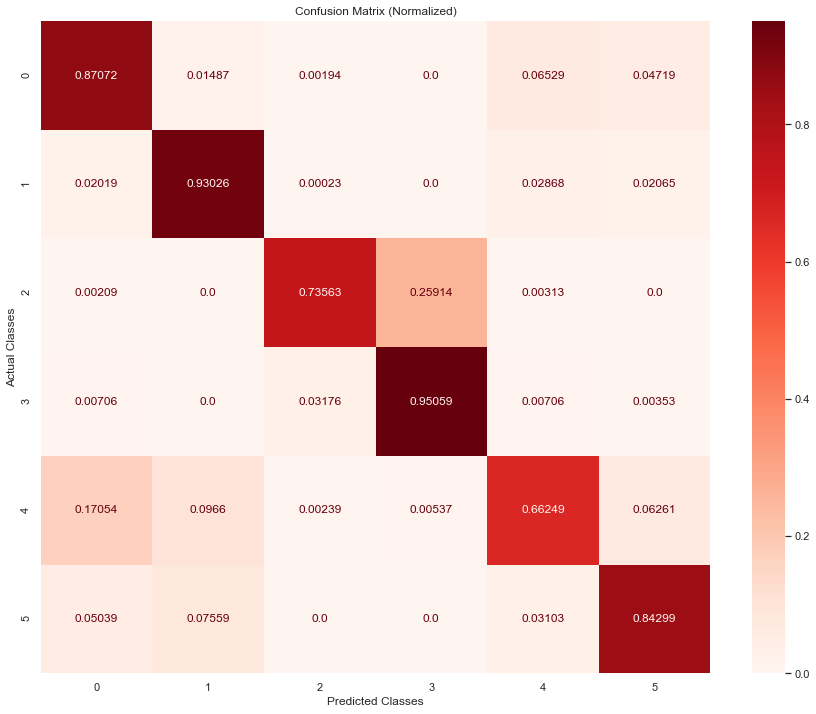

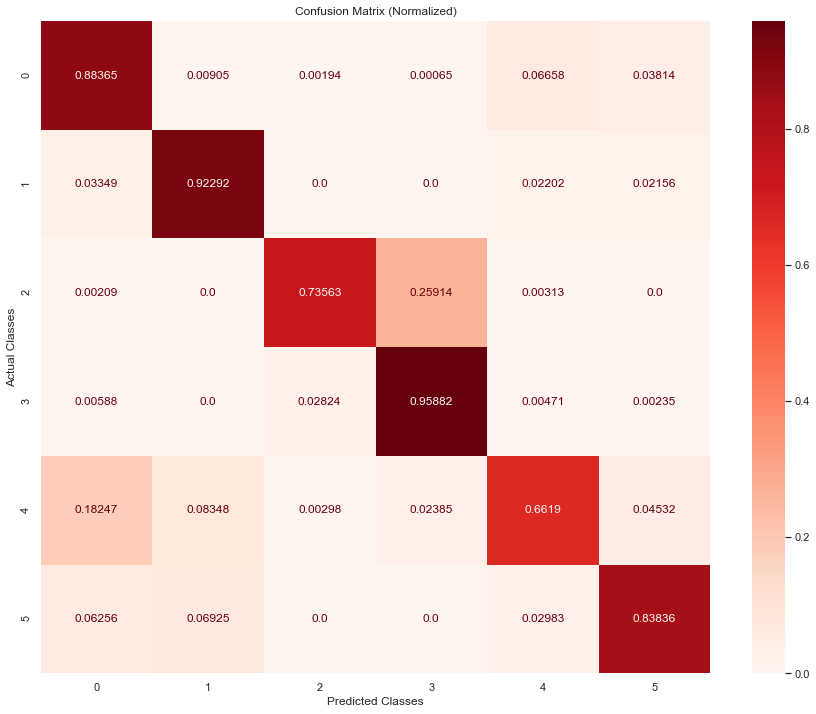

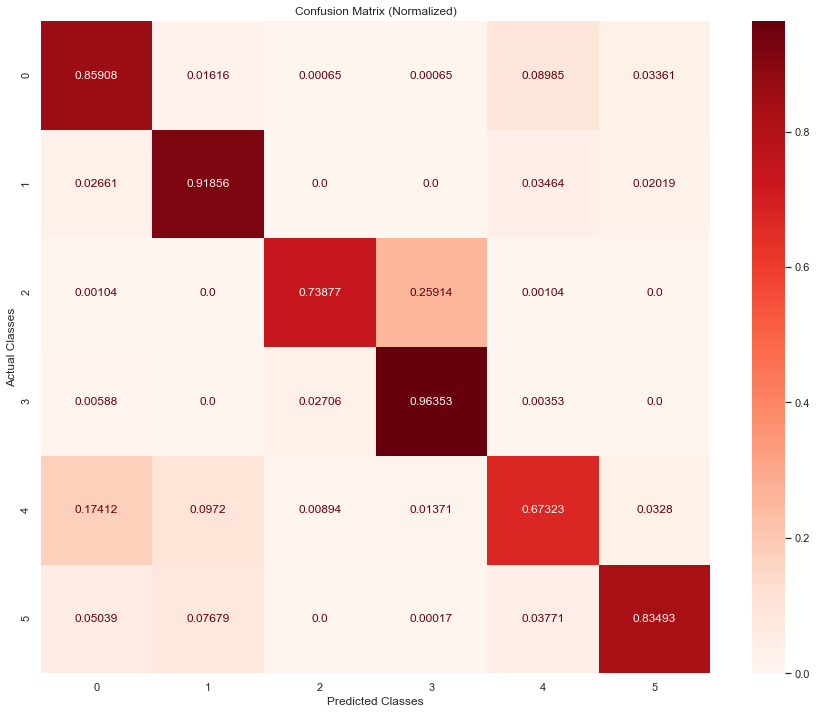

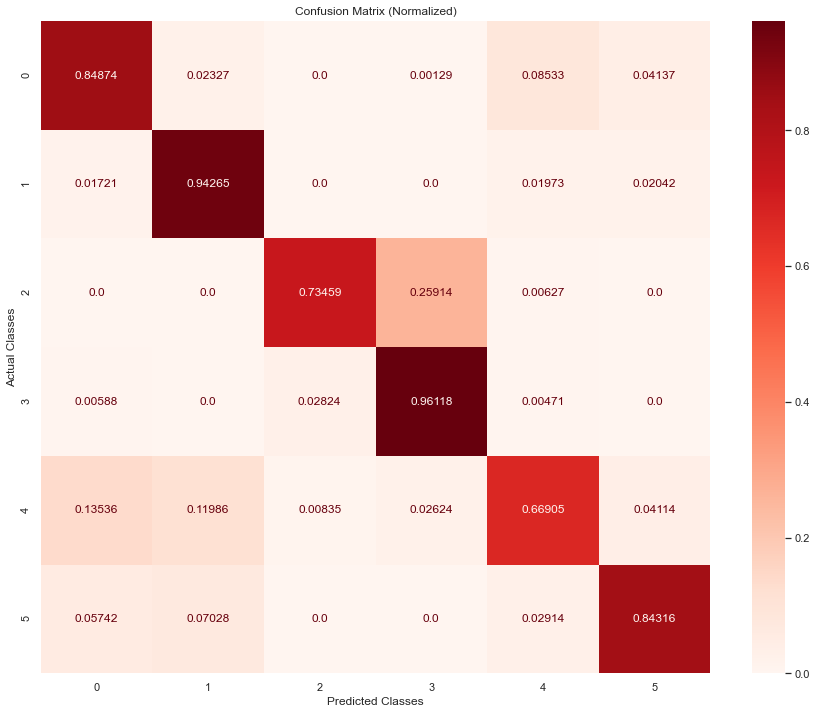

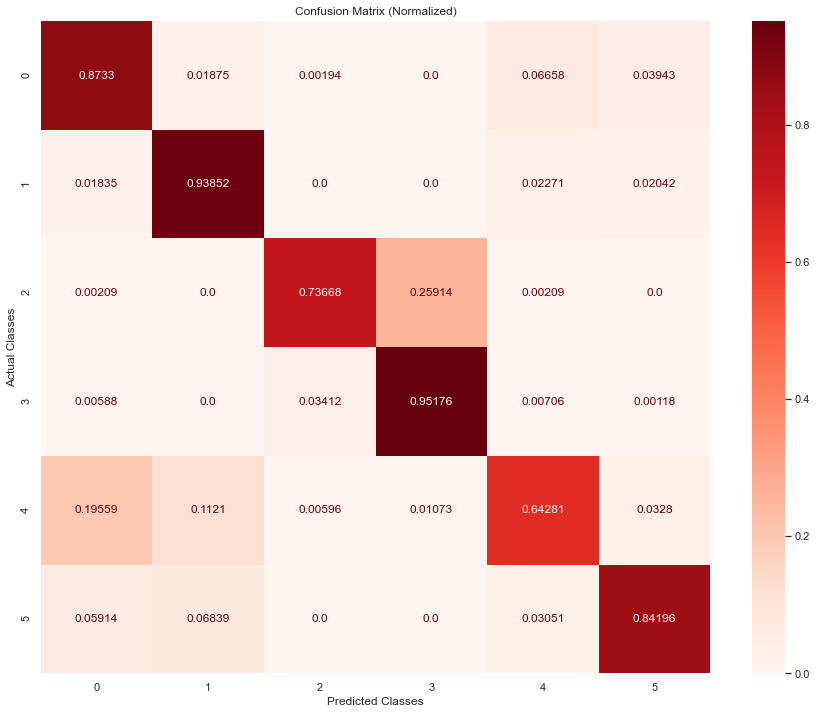

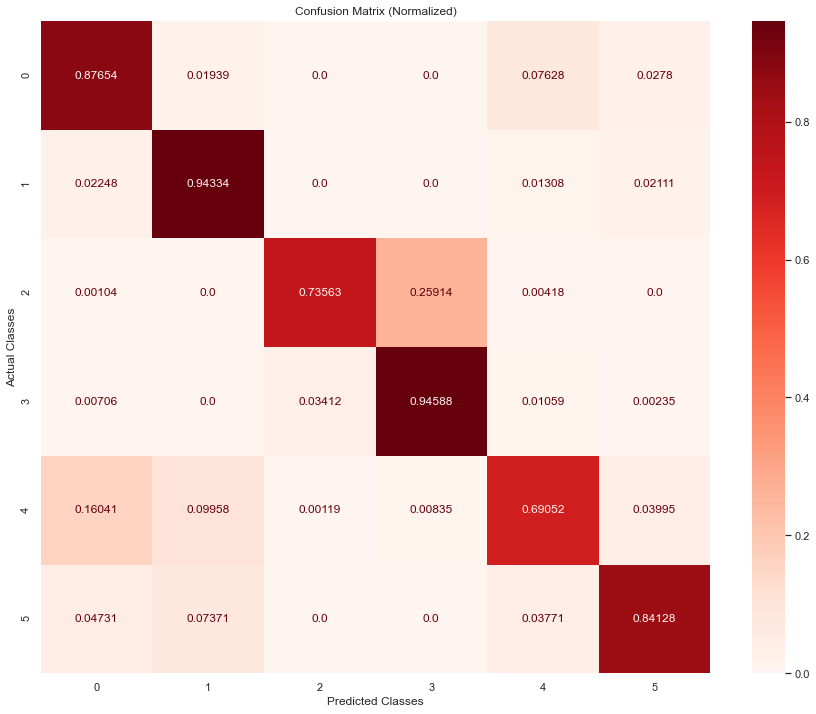

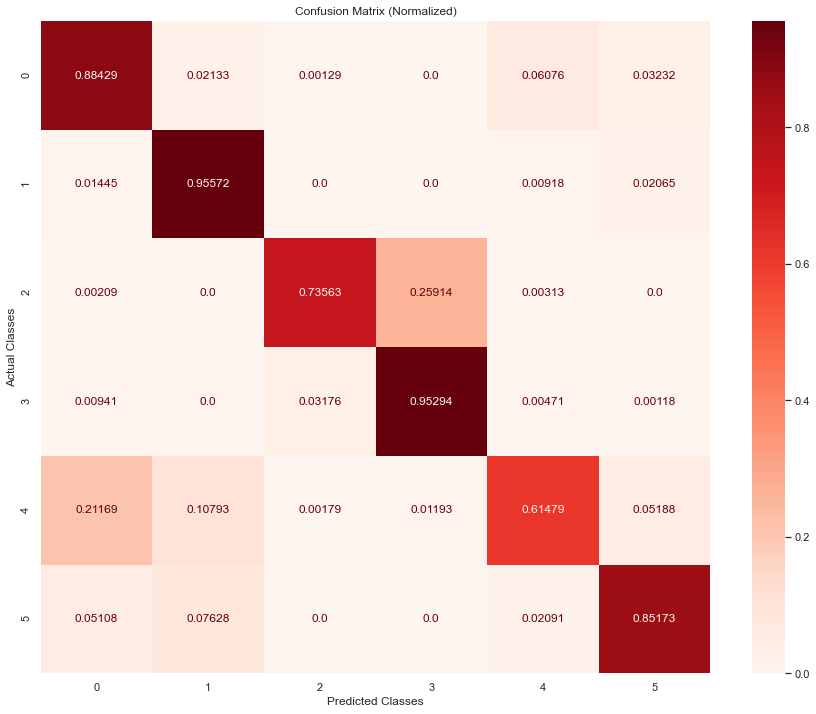

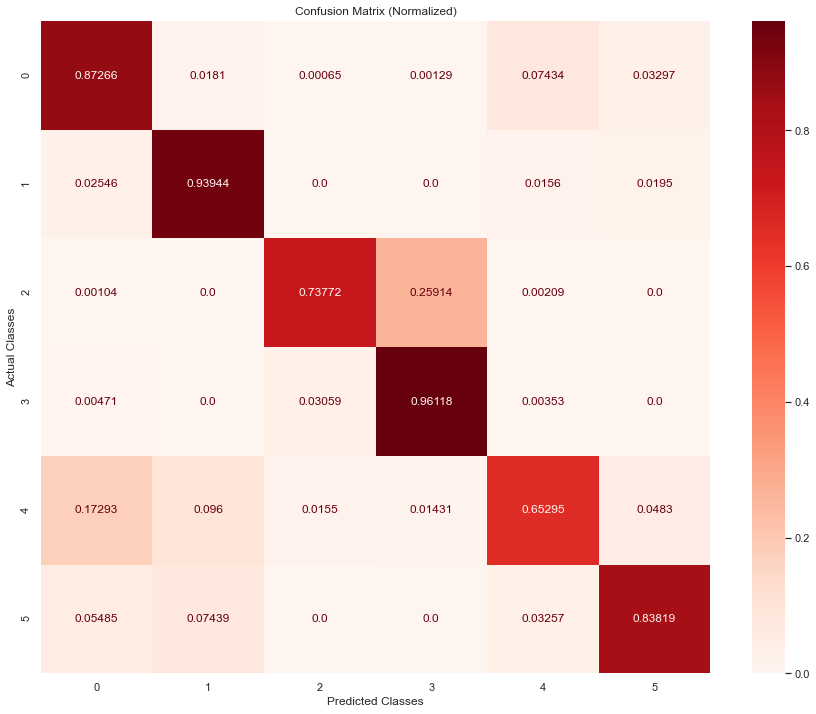

In [109]:
repeat_experiment_dac(repeats=REPEATS, model_type="cnnlstm", data = "reduced")

Run:  1
reduced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 1)
(78137, 2)
(15224, 42, 1)
(15224, 2)
ConvLSTM
Epoch 1/10
1221/1221 [==============================] - 24s 18ms/step - loss: 0.0516 - accuracy: 0.9821 - val_loss: 0.0151 - val_accuracy: 0.9948
Epoch 2/10
1221/1221 [==============================] - 22s 18ms/step - loss: 0.0128 - accuracy: 0.9968 - val_loss: 0.0147 - val_accuracy: 0.9953
Timed stopping at epoch 2 after training for 0:00:30

STATIONARY
ConvLSTM
Epoch 1/5000
410/410 [==============================] - 9s 19ms/step - loss: 0.1718 - accuracy: 0.9544 - val_loss: 0.8728 - val_accuracy: 0.8200
Epoch 2/5000
410/410 [==============================] - 7s 18ms/step - loss: 0.0782 - accuracy: 0.9788 - val_loss: 0.7514 - val_accuracy: 0.8195
Epoch 3/5000
410/410 [==============================] - 7s 18ms/step - loss: 0.0759 - accuracy: 0.9787 - val_loss: 0.8935 - val_accuracy: 0.8195
Epoch 4/5000
410/410 [==============================] - 7s 1

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  2
reduced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 1)
(78137, 2)
(15224, 42, 1)
(15224, 2)
ConvLSTM
Epoch 1/10
1221/1221 [==============================] - 23s 18ms/step - loss: 0.0442 - accuracy: 0.9823 - val_loss: 0.0303 - val_accuracy: 0.9895
Epoch 2/10
1221/1221 [==============================] - 21s 18ms/step - loss: 0.0135 - accuracy: 0.9964 - val_loss: 0.0143 - val_accuracy: 0.9964
Timed stopping at epoch 2 after training for 0:00:30

STATIONARY
ConvLSTM
Epoch 1/5000
404/404 [==============================] - 9s 19ms/step - loss: 0.1557 - accuracy: 0.9550 - val_loss: 0.6162 - val_accuracy: 0.8424
Epoch 2/5000
404/404 [==============================] - 7s 18ms/step - loss: 0.0561 - accuracy: 0.9815 - val_loss: 0.8460 - val_accuracy: 0.8424
Epoch 3/5000
404/404 [==============================] - 7s 18ms/step - loss: 0.0563 - accuracy: 0.9806 - val_loss: 0.7971 - val_accuracy: 0.8424
Epoch 4/5000
404/404 [==============================] - 7s 1

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  3
reduced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 1)
(78137, 2)
(15224, 42, 1)
(15224, 2)
ConvLSTM
Epoch 1/10
1221/1221 [==============================] - 23s 18ms/step - loss: 0.0538 - accuracy: 0.9803 - val_loss: 0.0187 - val_accuracy: 0.9938
Epoch 2/10
1221/1221 [==============================] - 22s 18ms/step - loss: 0.0135 - accuracy: 0.9964 - val_loss: 0.0425 - val_accuracy: 0.9881
Timed stopping at epoch 2 after training for 0:00:30

STATIONARY
ConvLSTM
Epoch 1/5000
415/415 [==============================] - 9s 18ms/step - loss: 0.2320 - accuracy: 0.9445 - val_loss: 0.9834 - val_accuracy: 0.7729
Epoch 2/5000
415/415 [==============================] - 7s 18ms/step - loss: 0.1383 - accuracy: 0.9664 - val_loss: 0.9875 - val_accuracy: 0.7714
Epoch 3/5000
415/415 [==============================] - 7s 18ms/step - loss: 0.1341 - accuracy: 0.9676 - val_loss: 0.9462 - val_accuracy: 0.7714
Epoch 4/5000
415/415 [==============================] - 7s 1

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  4
reduced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 1)
(78137, 2)
(15224, 42, 1)
(15224, 2)
ConvLSTM
Epoch 1/10
1221/1221 [==============================] - 22s 17ms/step - loss: 0.0539 - accuracy: 0.9813 - val_loss: 0.0123 - val_accuracy: 0.9968
Epoch 2/10
1221/1221 [==============================] - 21s 17ms/step - loss: 0.0137 - accuracy: 0.9964 - val_loss: 0.0165 - val_accuracy: 0.9946
Timed stopping at epoch 2 after training for 0:00:30

STATIONARY
ConvLSTM
Epoch 1/5000
411/411 [==============================] - 9s 18ms/step - loss: 0.1627 - accuracy: 0.9555 - val_loss: 0.7910 - val_accuracy: 0.8151
Epoch 2/5000
411/411 [==============================] - 7s 18ms/step - loss: 0.0800 - accuracy: 0.9778 - val_loss: 0.9501 - val_accuracy: 0.8162
Epoch 3/5000
411/411 [==============================] - 7s 18ms/step - loss: 0.0787 - accuracy: 0.9776 - val_loss: 0.8119 - val_accuracy: 0.8156
Epoch 4/5000
411/411 [==============================] - 7s 1

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  5
reduced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 1)
(78137, 2)
(15224, 42, 1)
(15224, 2)
ConvLSTM
Epoch 1/10
1221/1221 [==============================] - 23s 18ms/step - loss: 0.0496 - accuracy: 0.9808 - val_loss: 0.0164 - val_accuracy: 0.9948
Epoch 2/10
1221/1221 [==============================] - 23s 19ms/step - loss: 0.0136 - accuracy: 0.9962 - val_loss: 0.0138 - val_accuracy: 0.9958
Timed stopping at epoch 2 after training for 0:00:30

STATIONARY
ConvLSTM
Epoch 1/5000
410/410 [==============================] - 8s 18ms/step - loss: 0.1724 - accuracy: 0.9535 - val_loss: 0.8633 - val_accuracy: 0.8238
Epoch 2/5000
410/410 [==============================] - 7s 17ms/step - loss: 0.0729 - accuracy: 0.9788 - val_loss: 0.8744 - val_accuracy: 0.8265
Epoch 3/5000
410/410 [==============================] - 7s 17ms/step - loss: 0.0703 - accuracy: 0.9789 - val_loss: 0.8988 - val_accuracy: 0.8233
Epoch 4/5000
410/410 [==============================] - 7s 1

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  6
reduced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 1)
(78137, 2)
(15224, 42, 1)
(15224, 2)
ConvLSTM
Epoch 1/10
1221/1221 [==============================] - 22s 17ms/step - loss: 0.0489 - accuracy: 0.9816 - val_loss: 0.0178 - val_accuracy: 0.9938
Epoch 2/10
1221/1221 [==============================] - 21s 17ms/step - loss: 0.0137 - accuracy: 0.9964 - val_loss: 0.0483 - val_accuracy: 0.9865
Timed stopping at epoch 2 after training for 0:00:30

STATIONARY
ConvLSTM
Epoch 1/5000
418/418 [==============================] - 9s 18ms/step - loss: 0.2560 - accuracy: 0.9403 - val_loss: 0.9297 - val_accuracy: 0.7628
Epoch 2/5000
418/418 [==============================] - 7s 18ms/step - loss: 0.1626 - accuracy: 0.9627 - val_loss: 1.0477 - val_accuracy: 0.7638
Epoch 3/5000
418/418 [==============================] - 7s 17ms/step - loss: 0.1587 - accuracy: 0.9620 - val_loss: 1.0164 - val_accuracy: 0.7618
Epoch 4/5000
418/418 [==============================] - 7s 1

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  7
reduced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 1)
(78137, 2)
(15224, 42, 1)
(15224, 2)
ConvLSTM
Epoch 1/10
1221/1221 [==============================] - 22s 17ms/step - loss: 0.0483 - accuracy: 0.9802 - val_loss: 0.0186 - val_accuracy: 0.9941
Epoch 2/10
1221/1221 [==============================] - 20s 17ms/step - loss: 0.0141 - accuracy: 0.9962 - val_loss: 0.0169 - val_accuracy: 0.9948
Timed stopping at epoch 2 after training for 0:00:30

STATIONARY
ConvLSTM
Epoch 1/5000
411/411 [==============================] - 8s 18ms/step - loss: 0.1748 - accuracy: 0.9535 - val_loss: 0.8716 - val_accuracy: 0.8159
Epoch 2/5000
411/411 [==============================] - 7s 17ms/step - loss: 0.0856 - accuracy: 0.9766 - val_loss: 0.8140 - val_accuracy: 0.8154
Epoch 3/5000
411/411 [==============================] - 7s 17ms/step - loss: 0.0812 - accuracy: 0.9772 - val_loss: 0.7831 - val_accuracy: 0.8165
Epoch 4/5000
411/411 [==============================] - 7s 1

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  8
reduced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 1)
(78137, 2)
(15224, 42, 1)
(15224, 2)
ConvLSTM
Epoch 1/10
1221/1221 [==============================] - 22s 17ms/step - loss: 0.0450 - accuracy: 0.9825 - val_loss: 0.0138 - val_accuracy: 0.9959
Epoch 2/10
1221/1221 [==============================] - 20s 17ms/step - loss: 0.0134 - accuracy: 0.9964 - val_loss: 0.0146 - val_accuracy: 0.9955
Timed stopping at epoch 2 after training for 0:00:30

STATIONARY
ConvLSTM
Epoch 1/5000
410/410 [==============================] - 8s 18ms/step - loss: 0.1679 - accuracy: 0.9534 - val_loss: 0.7799 - val_accuracy: 0.8200
Epoch 2/5000
410/410 [==============================] - 7s 17ms/step - loss: 0.0719 - accuracy: 0.9787 - val_loss: 0.7635 - val_accuracy: 0.8281
Epoch 3/5000
410/410 [==============================] - 7s 17ms/step - loss: 0.0715 - accuracy: 0.9783 - val_loss: 0.8031 - val_accuracy: 0.8200
Epoch 4/5000
410/410 [==============================] - 7s 1

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  9
reduced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 1)
(78137, 2)
(15224, 42, 1)
(15224, 2)
ConvLSTM
Epoch 1/10
1221/1221 [==============================] - 22s 17ms/step - loss: 0.0462 - accuracy: 0.9814 - val_loss: 0.0138 - val_accuracy: 0.9957
Epoch 2/10
1221/1221 [==============================] - 20s 17ms/step - loss: 0.0134 - accuracy: 0.9963 - val_loss: 0.0179 - val_accuracy: 0.9942
Timed stopping at epoch 2 after training for 0:00:30

STATIONARY
ConvLSTM
Epoch 1/5000
411/411 [==============================] - 9s 18ms/step - loss: 0.1767 - accuracy: 0.9547 - val_loss: 0.9759 - val_accuracy: 0.8130
Epoch 2/5000
411/411 [==============================] - 7s 18ms/step - loss: 0.0869 - accuracy: 0.9764 - val_loss: 0.8819 - val_accuracy: 0.8125
Epoch 3/5000
411/411 [==============================] - 7s 18ms/step - loss: 0.0820 - accuracy: 0.9776 - val_loss: 0.9584 - val_accuracy: 0.8125
Epoch 4/5000
411/411 [==============================] - 7s 1

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  10
reduced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 1)
(78137, 2)
(15224, 42, 1)
(15224, 2)
ConvLSTM
Epoch 1/10
1221/1221 [==============================] - 22s 17ms/step - loss: 0.0507 - accuracy: 0.9804 - val_loss: 0.0135 - val_accuracy: 0.9958
Epoch 2/10
1221/1221 [==============================] - 21s 17ms/step - loss: 0.0134 - accuracy: 0.9964 - val_loss: 0.0146 - val_accuracy: 0.9955
Timed stopping at epoch 2 after training for 0:00:30

STATIONARY
ConvLSTM
Epoch 1/5000
410/410 [==============================] - 9s 18ms/step - loss: 0.1784 - accuracy: 0.9556 - val_loss: 0.8485 - val_accuracy: 0.8217
Epoch 2/5000
410/410 [==============================] - 7s 18ms/step - loss: 0.0737 - accuracy: 0.9797 - val_loss: 0.8038 - val_accuracy: 0.8206
Epoch 3/5000
410/410 [==============================] - 7s 18ms/step - loss: 0.0729 - accuracy: 0.9791 - val_loss: 0.8227 - val_accuracy: 0.8249
Epoch 4/5000
410/410 [==============================] - 7s 

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


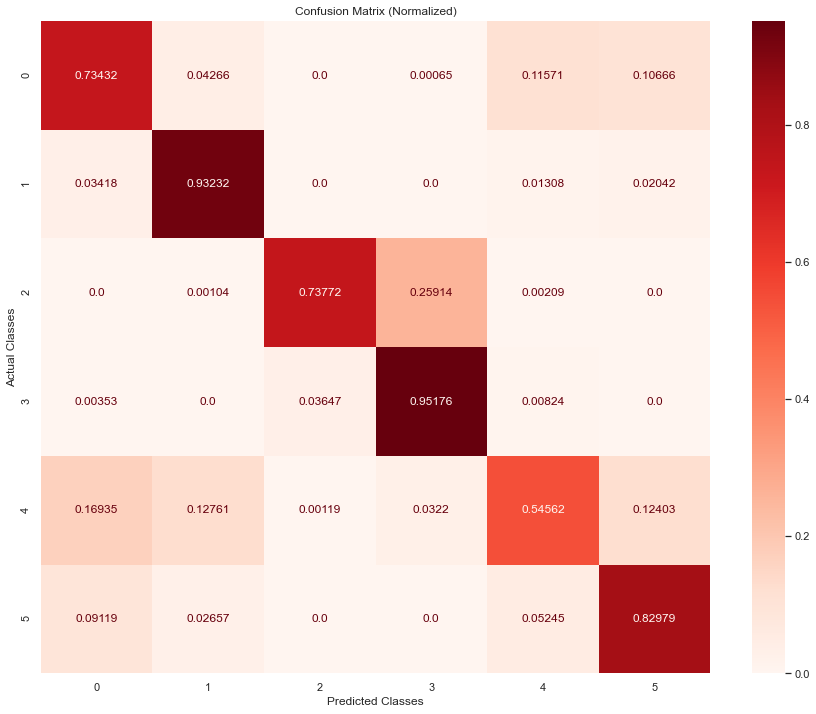

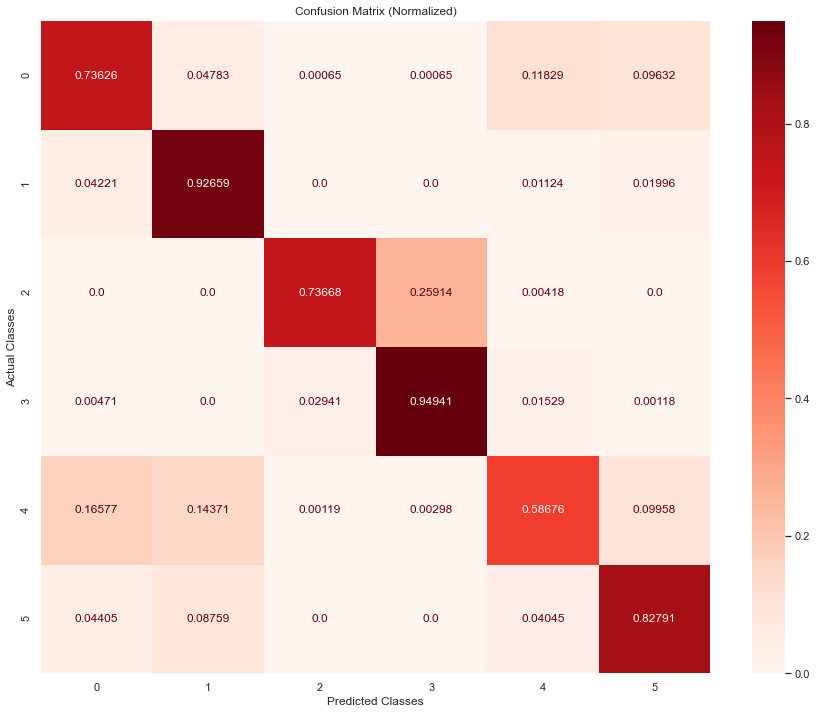

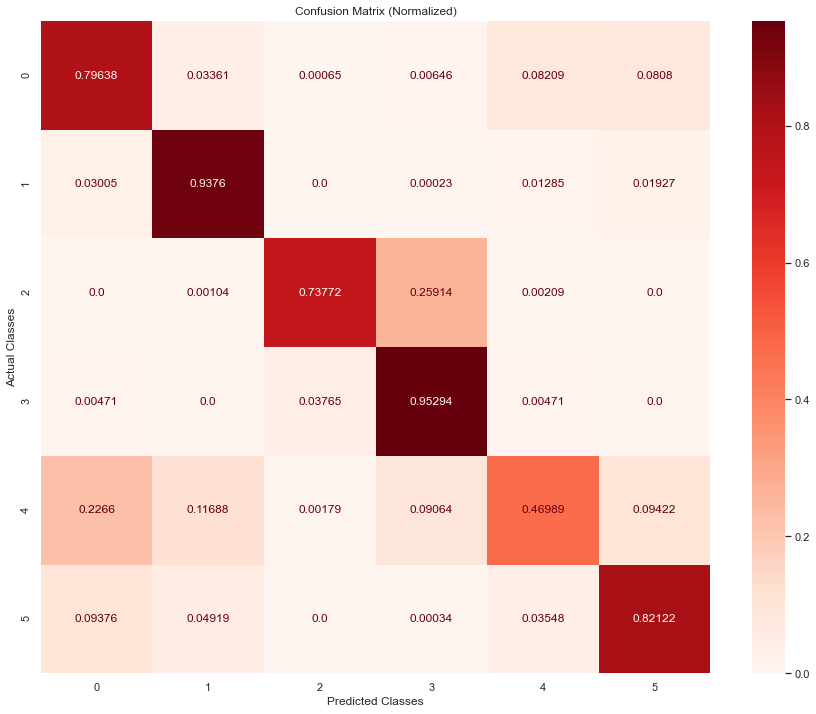

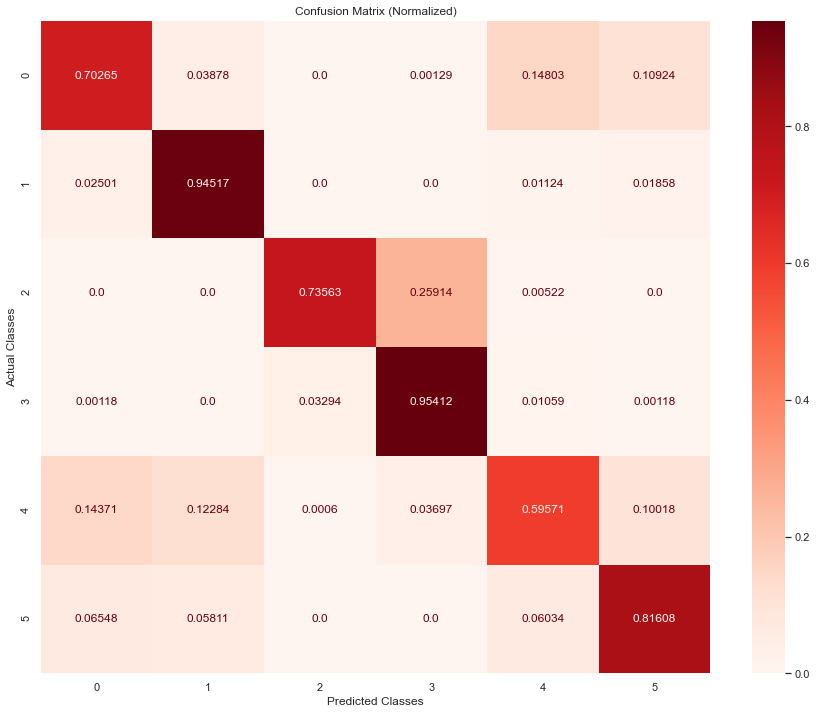

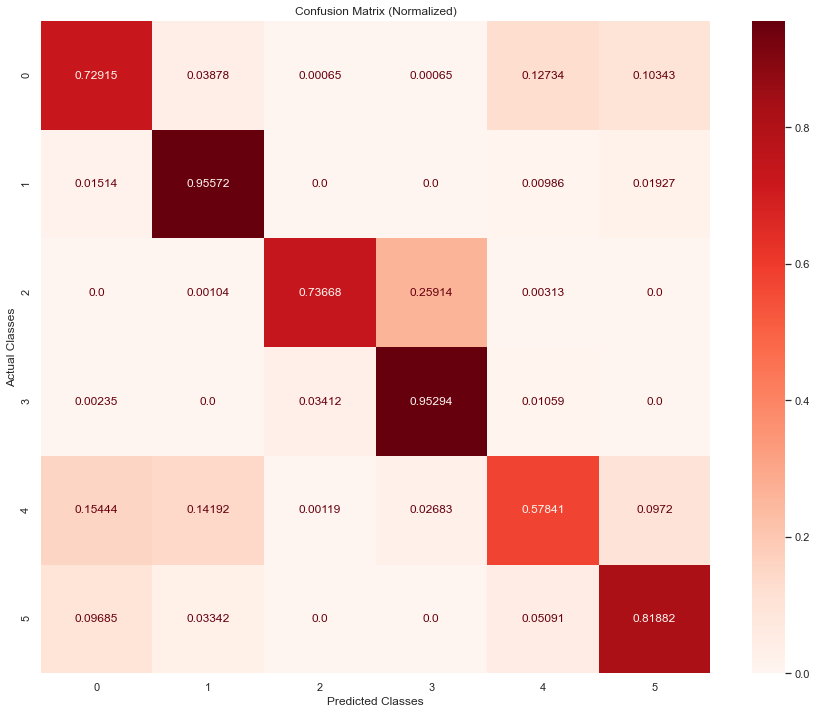

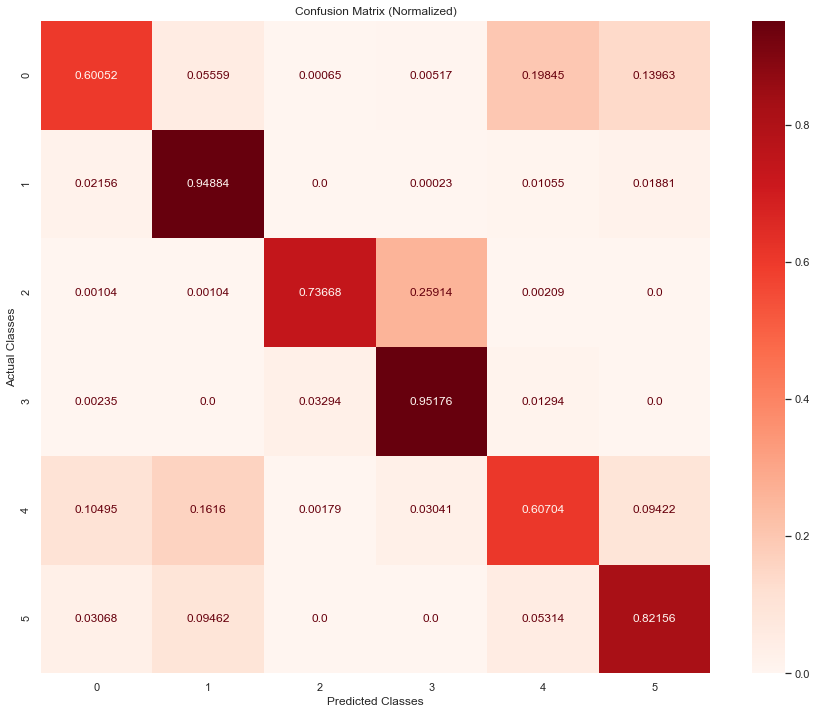

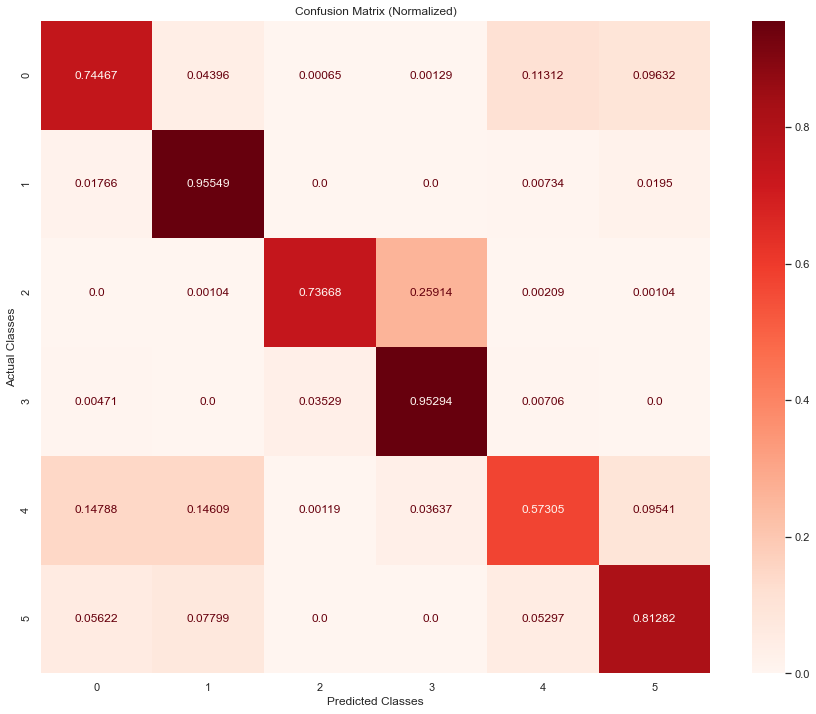

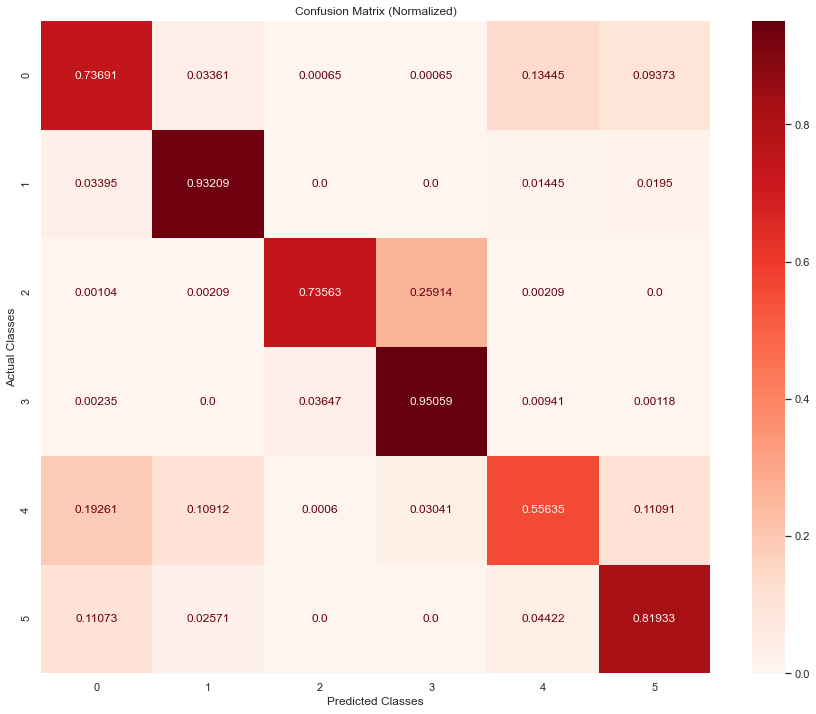

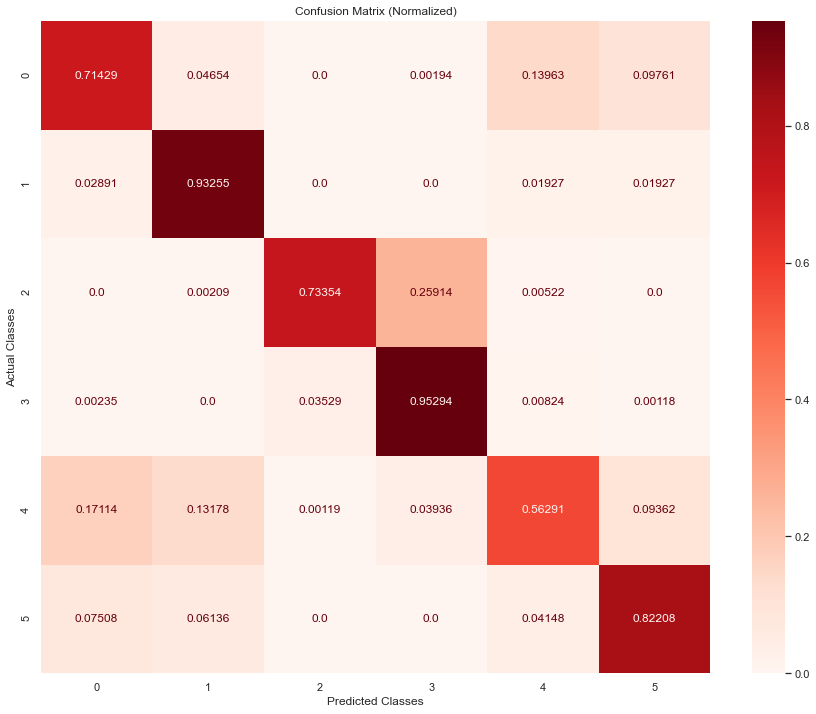

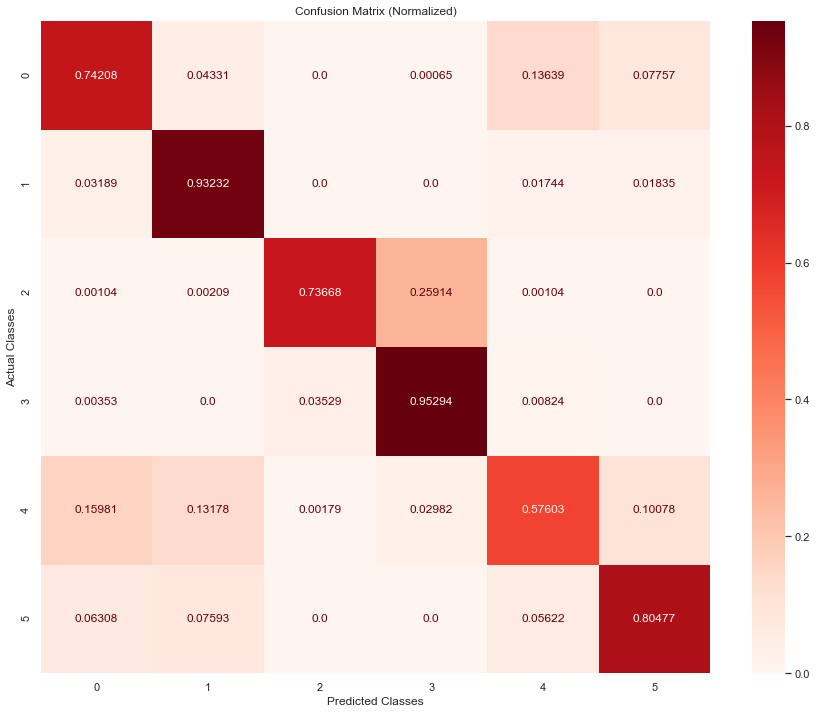

In [110]:
repeat_experiment_dac(repeats=REPEATS, model_type="convlstm", data = "reduced")

Run:  1
reduced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 1)
(78137, 2)
(15224, 42, 1)
(15224, 2)
Bi-LSTM
Epoch 1/10
1221/1221 [==============================] - 13s 9ms/step - loss: 0.1294 - accuracy: 0.9460 - val_loss: 0.0203 - val_accuracy: 0.9940
Epoch 2/10
1221/1221 [==============================] - 10s 9ms/step - loss: 0.0206 - accuracy: 0.9949 - val_loss: 0.0148 - val_accuracy: 0.9961
Epoch 3/10
1221/1221 [==============================] - 11s 9ms/step - loss: 0.0165 - accuracy: 0.9958 - val_loss: 0.0126 - val_accuracy: 0.9970
Timed stopping at epoch 3 after training for 0:00:30

STATIONARY
Bi-LSTM
Epoch 1/5000
412/412 [==============================] - 5s 9ms/step - loss: 0.2005 - accuracy: 0.9445 - val_loss: 0.6170 - val_accuracy: 0.8389
Epoch 2/5000
412/412 [==============================] - 3s 8ms/step - loss: 0.1074 - accuracy: 0.9722 - val_loss: 0.8761 - val_accuracy: 0.8318
Epoch 3/5000
412/412 [==============================] - 3s 8ms/ste

Epoch 13/5000
810/810 [==============================] - 7s 9ms/step - loss: 0.2775 - accuracy: 0.9010 - val_loss: 0.6369 - val_accuracy: 0.8536
Epoch 14/5000
810/810 [==============================] - 7s 9ms/step - loss: 0.2614 - accuracy: 0.9071 - val_loss: 0.7015 - val_accuracy: 0.8386
Epoch 15/5000
810/810 [==============================] - 7s 9ms/step - loss: 0.2497 - accuracy: 0.9125 - val_loss: 0.8203 - val_accuracy: 0.8330
Epoch 16/5000
810/810 [==============================] - 7s 9ms/step - loss: 0.2366 - accuracy: 0.9178 - val_loss: 0.7440 - val_accuracy: 0.8420
Epoch 17/5000
810/810 [==============================] - 7s 9ms/step - loss: 0.2233 - accuracy: 0.9211 - val_loss: 0.9321 - val_accuracy: 0.8251
Epoch 18/5000
810/810 [==============================] - 7s 9ms/step - loss: 0.2147 - accuracy: 0.9239 - val_loss: 0.7678 - val_accuracy: 0.8395
Epoch 19/5000
810/810 [==============================] - 7s 9ms/step - loss: 0.2064 - accuracy: 0.9290 - val_loss: 0.7564 - val_ac

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  2
reduced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 1)
(78137, 2)
(15224, 42, 1)
(15224, 2)
Bi-LSTM
Epoch 1/10
1221/1221 [==============================] - 13s 9ms/step - loss: 0.1515 - accuracy: 0.9372 - val_loss: 0.0165 - val_accuracy: 0.9962
Epoch 2/10
1221/1221 [==============================] - 10s 8ms/step - loss: 0.0242 - accuracy: 0.9939 - val_loss: 0.0116 - val_accuracy: 0.9967
Epoch 3/10
1221/1221 [==============================] - 10s 8ms/step - loss: 0.0186 - accuracy: 0.9954 - val_loss: 0.0123 - val_accuracy: 0.9964
Timed stopping at epoch 3 after training for 0:00:30

STATIONARY
Bi-LSTM
Epoch 1/5000
407/407 [==============================] - 5s 9ms/step - loss: 0.1723 - accuracy: 0.9452 - val_loss: 0.8838 - val_accuracy: 0.8395
Epoch 2/5000
407/407 [==============================] - 3s 8ms/step - loss: 0.0711 - accuracy: 0.9774 - val_loss: 0.6716 - val_accuracy: 0.8390
Epoch 3/5000
407/407 [==============================] - 3s 8ms/ste

Epoch 13/5000
815/815 [==============================] - 7s 9ms/step - loss: 0.2735 - accuracy: 0.9028 - val_loss: 0.7214 - val_accuracy: 0.8503
Epoch 14/5000
815/815 [==============================] - 7s 9ms/step - loss: 0.2580 - accuracy: 0.9090 - val_loss: 0.7279 - val_accuracy: 0.8302
Epoch 15/5000
815/815 [==============================] - 7s 9ms/step - loss: 0.2455 - accuracy: 0.9140 - val_loss: 0.8361 - val_accuracy: 0.8435
Epoch 16/5000
815/815 [==============================] - 7s 9ms/step - loss: 0.2351 - accuracy: 0.9177 - val_loss: 0.7730 - val_accuracy: 0.8407
Epoch 17/5000
815/815 [==============================] - 7s 9ms/step - loss: 0.2292 - accuracy: 0.9196 - val_loss: 0.7794 - val_accuracy: 0.8519
Epoch 18/5000
815/815 [==============================] - 7s 9ms/step - loss: 0.2197 - accuracy: 0.9236 - val_loss: 0.8173 - val_accuracy: 0.8541
Epoch 19/5000
815/815 [==============================] - 7s 9ms/step - loss: 0.2098 - accuracy: 0.9270 - val_loss: 0.8037 - val_ac

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  3
reduced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 1)
(78137, 2)
(15224, 42, 1)
(15224, 2)
Bi-LSTM
Epoch 1/10
1221/1221 [==============================] - 13s 9ms/step - loss: 0.1796 - accuracy: 0.9229 - val_loss: 0.0211 - val_accuracy: 0.9946
Epoch 2/10
1221/1221 [==============================] - 11s 9ms/step - loss: 0.0307 - accuracy: 0.9924 - val_loss: 0.0236 - val_accuracy: 0.9938
Epoch 3/10
1221/1221 [==============================] - 11s 9ms/step - loss: 0.0223 - accuracy: 0.9944 - val_loss: 0.0179 - val_accuracy: 0.9959
Timed stopping at epoch 3 after training for 0:00:30

STATIONARY
Bi-LSTM
Epoch 1/5000
412/412 [==============================] - 6s 9ms/step - loss: 0.2072 - accuracy: 0.9402 - val_loss: 0.7210 - val_accuracy: 0.8279
Epoch 2/5000
412/412 [==============================] - 3s 8ms/step - loss: 0.1123 - accuracy: 0.9725 - val_loss: 0.8424 - val_accuracy: 0.8262
Epoch 3/5000
412/412 [==============================] - 4s 9ms/ste

Epoch 13/5000
810/810 [==============================] - 7s 9ms/step - loss: 0.2660 - accuracy: 0.9068 - val_loss: 0.6932 - val_accuracy: 0.8443
Epoch 14/5000
810/810 [==============================] - 7s 9ms/step - loss: 0.2513 - accuracy: 0.9108 - val_loss: 0.6304 - val_accuracy: 0.8456
Epoch 15/5000
810/810 [==============================] - 7s 9ms/step - loss: 0.2417 - accuracy: 0.9139 - val_loss: 0.6449 - val_accuracy: 0.8475
Epoch 16/5000
810/810 [==============================] - 7s 9ms/step - loss: 0.2297 - accuracy: 0.9199 - val_loss: 0.6676 - val_accuracy: 0.8393
Epoch 17/5000
810/810 [==============================] - 7s 9ms/step - loss: 0.2187 - accuracy: 0.9233 - val_loss: 0.7325 - val_accuracy: 0.8520
Epoch 18/5000
810/810 [==============================] - 7s 9ms/step - loss: 0.2112 - accuracy: 0.9263 - val_loss: 0.6515 - val_accuracy: 0.8456
Epoch 19/5000
810/810 [==============================] - 7s 9ms/step - loss: 0.2034 - accuracy: 0.9295 - val_loss: 0.8058 - val_ac

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  4
reduced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 1)
(78137, 2)
(15224, 42, 1)
(15224, 2)
Bi-LSTM
Epoch 1/10
1221/1221 [==============================] - 12s 9ms/step - loss: 0.1303 - accuracy: 0.9452 - val_loss: 0.0172 - val_accuracy: 0.9961
Epoch 2/10
1221/1221 [==============================] - 10s 9ms/step - loss: 0.0208 - accuracy: 0.9947 - val_loss: 0.0124 - val_accuracy: 0.9973
Epoch 3/10
1221/1221 [==============================] - 10s 9ms/step - loss: 0.0153 - accuracy: 0.9959 - val_loss: 0.0141 - val_accuracy: 0.9970
Timed stopping at epoch 3 after training for 0:00:30

STATIONARY
Bi-LSTM
Epoch 1/5000
411/411 [==============================] - 6s 9ms/step - loss: 0.1827 - accuracy: 0.9456 - val_loss: 0.7134 - val_accuracy: 0.8325
Epoch 2/5000
411/411 [==============================] - 3s 8ms/step - loss: 0.0914 - accuracy: 0.9734 - val_loss: 0.7904 - val_accuracy: 0.8336
Epoch 3/5000
411/411 [==============================] - 3s 8ms/ste

Epoch 13/5000
811/811 [==============================] - 7s 9ms/step - loss: 0.2720 - accuracy: 0.9034 - val_loss: 0.7597 - val_accuracy: 0.8506
Epoch 14/5000
811/811 [==============================] - 7s 9ms/step - loss: 0.2572 - accuracy: 0.9089 - val_loss: 0.7444 - val_accuracy: 0.8488
Epoch 15/5000
811/811 [==============================] - 7s 9ms/step - loss: 0.2412 - accuracy: 0.9146 - val_loss: 0.6478 - val_accuracy: 0.8517
Epoch 16/5000
811/811 [==============================] - 7s 9ms/step - loss: 0.2333 - accuracy: 0.9176 - val_loss: 0.6804 - val_accuracy: 0.8416
Epoch 17/5000
811/811 [==============================] - 7s 9ms/step - loss: 0.2189 - accuracy: 0.9238 - val_loss: 0.6476 - val_accuracy: 0.8536
Epoch 18/5000
811/811 [==============================] - 7s 9ms/step - loss: 0.2109 - accuracy: 0.9256 - val_loss: 0.7686 - val_accuracy: 0.8525
Epoch 19/5000
811/811 [==============================] - 7s 9ms/step - loss: 0.2004 - accuracy: 0.9305 - val_loss: 0.8533 - val_ac

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  5
reduced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 1)
(78137, 2)
(15224, 42, 1)
(15224, 2)
Bi-LSTM
Epoch 1/10
1221/1221 [==============================] - 13s 9ms/step - loss: 0.1474 - accuracy: 0.9390 - val_loss: 0.0184 - val_accuracy: 0.9955
Epoch 2/10
1221/1221 [==============================] - 10s 8ms/step - loss: 0.0241 - accuracy: 0.9943 - val_loss: 0.0207 - val_accuracy: 0.9961
Epoch 3/10
1221/1221 [==============================] - 10s 8ms/step - loss: 0.0181 - accuracy: 0.9957 - val_loss: 0.0134 - val_accuracy: 0.9968
Timed stopping at epoch 3 after training for 0:00:30

STATIONARY
Bi-LSTM
Epoch 1/5000
409/409 [==============================] - 5s 9ms/step - loss: 0.1712 - accuracy: 0.9483 - val_loss: 0.7559 - val_accuracy: 0.8381
Epoch 2/5000
409/409 [==============================] - 3s 8ms/step - loss: 0.0823 - accuracy: 0.9767 - val_loss: 0.7568 - val_accuracy: 0.8375
Epoch 3/5000
409/409 [==============================] - 3s 8ms/ste

Epoch 13/5000
813/813 [==============================] - 7s 9ms/step - loss: 0.2746 - accuracy: 0.9034 - val_loss: 0.7142 - val_accuracy: 0.8335
Epoch 14/5000
813/813 [==============================] - 7s 9ms/step - loss: 0.2592 - accuracy: 0.9077 - val_loss: 0.7383 - val_accuracy: 0.8447
Epoch 15/5000
813/813 [==============================] - 7s 9ms/step - loss: 0.2505 - accuracy: 0.9121 - val_loss: 0.7208 - val_accuracy: 0.8397
Epoch 16/5000
813/813 [==============================] - 7s 9ms/step - loss: 0.2386 - accuracy: 0.9149 - val_loss: 0.6907 - val_accuracy: 0.8429
Epoch 17/5000
813/813 [==============================] - 7s 9ms/step - loss: 0.2263 - accuracy: 0.9203 - val_loss: 0.6814 - val_accuracy: 0.8389
Epoch 18/5000
813/813 [==============================] - 7s 9ms/step - loss: 0.2189 - accuracy: 0.9252 - val_loss: 0.7231 - val_accuracy: 0.8492
Epoch 19/5000
813/813 [==============================] - 7s 9ms/step - loss: 0.2040 - accuracy: 0.9296 - val_loss: 0.7354 - val_ac

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  6
reduced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 1)
(78137, 2)
(15224, 42, 1)
(15224, 2)
Bi-LSTM
Epoch 1/10
1221/1221 [==============================] - 13s 9ms/step - loss: 0.1442 - accuracy: 0.9397 - val_loss: 0.0238 - val_accuracy: 0.9939
Epoch 2/10
1221/1221 [==============================] - 10s 8ms/step - loss: 0.0256 - accuracy: 0.9937 - val_loss: 0.0148 - val_accuracy: 0.9965
Epoch 3/10
1221/1221 [==============================] - 10s 8ms/step - loss: 0.0176 - accuracy: 0.9956 - val_loss: 0.0124 - val_accuracy: 0.9967
Timed stopping at epoch 3 after training for 0:00:30

STATIONARY
Bi-LSTM
Epoch 1/5000
410/410 [==============================] - 5s 9ms/step - loss: 0.1891 - accuracy: 0.9437 - val_loss: 0.6416 - val_accuracy: 0.8393
Epoch 2/5000
410/410 [==============================] - 3s 8ms/step - loss: 0.0910 - accuracy: 0.9752 - val_loss: 0.7801 - val_accuracy: 0.8338
Epoch 3/5000
410/410 [==============================] - 3s 8ms/ste

Epoch 12/5000
812/812 [==============================] - 7s 9ms/step - loss: 0.2688 - accuracy: 0.9079 - val_loss: 0.7028 - val_accuracy: 0.8457
Epoch 13/5000
812/812 [==============================] - 7s 9ms/step - loss: 0.2606 - accuracy: 0.9101 - val_loss: 0.8070 - val_accuracy: 0.8378
Epoch 14/5000
812/812 [==============================] - 7s 9ms/step - loss: 0.2440 - accuracy: 0.9167 - val_loss: 0.7589 - val_accuracy: 0.8381
Epoch 15/5000
812/812 [==============================] - 7s 9ms/step - loss: 0.2318 - accuracy: 0.9200 - val_loss: 0.8764 - val_accuracy: 0.8387
Epoch 16/5000
812/812 [==============================] - 7s 9ms/step - loss: 0.2239 - accuracy: 0.9233 - val_loss: 0.8200 - val_accuracy: 0.8385
Epoch 17/5000
812/812 [==============================] - 7s 9ms/step - loss: 0.2133 - accuracy: 0.9261 - val_loss: 0.7962 - val_accuracy: 0.8361
Epoch 18/5000
812/812 [==============================] - 7s 9ms/step - loss: 0.2023 - accuracy: 0.9301 - val_loss: 0.8022 - val_ac

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  7
reduced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 1)
(78137, 2)
(15224, 42, 1)
(15224, 2)
Bi-LSTM
Epoch 1/10
1221/1221 [==============================] - 12s 9ms/step - loss: 0.1487 - accuracy: 0.9373 - val_loss: 0.0140 - val_accuracy: 0.9963
Epoch 2/10
1221/1221 [==============================] - 10s 8ms/step - loss: 0.0233 - accuracy: 0.9943 - val_loss: 0.0105 - val_accuracy: 0.9967
Epoch 3/10
1221/1221 [==============================] - 10s 8ms/step - loss: 0.0175 - accuracy: 0.9957 - val_loss: 0.0162 - val_accuracy: 0.9959
Timed stopping at epoch 3 after training for 0:00:30

STATIONARY
Bi-LSTM
Epoch 1/5000
412/412 [==============================] - 6s 9ms/step - loss: 0.2028 - accuracy: 0.9434 - val_loss: 0.8194 - val_accuracy: 0.8363
Epoch 2/5000
412/412 [==============================] - 3s 8ms/step - loss: 0.1112 - accuracy: 0.9698 - val_loss: 0.7071 - val_accuracy: 0.8297
Epoch 3/5000
412/412 [==============================] - 3s 8ms/ste

Epoch 13/5000
810/810 [==============================] - 7s 9ms/step - loss: 0.2694 - accuracy: 0.9059 - val_loss: 0.6463 - val_accuracy: 0.8462
Epoch 14/5000
810/810 [==============================] - 7s 9ms/step - loss: 0.2573 - accuracy: 0.9095 - val_loss: 0.6067 - val_accuracy: 0.8445
Epoch 15/5000
810/810 [==============================] - 7s 9ms/step - loss: 0.2466 - accuracy: 0.9146 - val_loss: 0.7055 - val_accuracy: 0.8502
Epoch 16/5000
810/810 [==============================] - 7s 9ms/step - loss: 0.2376 - accuracy: 0.9167 - val_loss: 0.6796 - val_accuracy: 0.8454
Epoch 17/5000
810/810 [==============================] - 7s 9ms/step - loss: 0.2256 - accuracy: 0.9221 - val_loss: 0.7525 - val_accuracy: 0.8485
Epoch 18/5000
810/810 [==============================] - 7s 9ms/step - loss: 0.2174 - accuracy: 0.9243 - val_loss: 0.7095 - val_accuracy: 0.8488
Epoch 19/5000
810/810 [==============================] - 7s 9ms/step - loss: 0.2088 - accuracy: 0.9283 - val_loss: 0.7318 - val_ac

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  8
reduced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 1)
(78137, 2)
(15224, 42, 1)
(15224, 2)
Bi-LSTM
Epoch 1/10
1221/1221 [==============================] - 13s 9ms/step - loss: 0.1577 - accuracy: 0.9337 - val_loss: 0.0314 - val_accuracy: 0.9896
Epoch 2/10
1221/1221 [==============================] - 10s 9ms/step - loss: 0.0227 - accuracy: 0.9944 - val_loss: 0.0169 - val_accuracy: 0.9952
Epoch 3/10
1221/1221 [==============================] - 10s 8ms/step - loss: 0.0169 - accuracy: 0.9959 - val_loss: 0.0180 - val_accuracy: 0.9945
Timed stopping at epoch 3 after training for 0:00:30

STATIONARY
Bi-LSTM
Epoch 1/5000
410/410 [==============================] - 6s 9ms/step - loss: 0.1872 - accuracy: 0.9430 - val_loss: 0.9281 - val_accuracy: 0.8182
Epoch 2/5000
410/410 [==============================] - 3s 8ms/step - loss: 0.0936 - accuracy: 0.9754 - val_loss: 0.9657 - val_accuracy: 0.8182
Epoch 3/5000
410/410 [==============================] - 3s 8ms/ste

Epoch 13/5000
812/812 [==============================] - 7s 9ms/step - loss: 0.2716 - accuracy: 0.9053 - val_loss: 0.7132 - val_accuracy: 0.8346
Epoch 14/5000
812/812 [==============================] - 7s 9ms/step - loss: 0.2562 - accuracy: 0.9103 - val_loss: 0.7212 - val_accuracy: 0.8471
Epoch 15/5000
812/812 [==============================] - 7s 9ms/step - loss: 0.2410 - accuracy: 0.9158 - val_loss: 0.7711 - val_accuracy: 0.8445
Epoch 16/5000
812/812 [==============================] - 7s 9ms/step - loss: 0.2272 - accuracy: 0.9222 - val_loss: 0.8020 - val_accuracy: 0.8328
Epoch 17/5000
812/812 [==============================] - 7s 9ms/step - loss: 0.2207 - accuracy: 0.9241 - val_loss: 0.7351 - val_accuracy: 0.8522
Epoch 18/5000
812/812 [==============================] - 7s 9ms/step - loss: 0.2102 - accuracy: 0.9259 - val_loss: 0.7290 - val_accuracy: 0.8383
Epoch 19/5000
812/812 [==============================] - 7s 9ms/step - loss: 0.1986 - accuracy: 0.9308 - val_loss: 0.8198 - val_ac

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  9
reduced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 1)
(78137, 2)
(15224, 42, 1)
(15224, 2)
Bi-LSTM
Epoch 1/10
1221/1221 [==============================] - 13s 9ms/step - loss: 0.1366 - accuracy: 0.9427 - val_loss: 0.0175 - val_accuracy: 0.9964
Epoch 2/10
1221/1221 [==============================] - 10s 8ms/step - loss: 0.0193 - accuracy: 0.9950 - val_loss: 0.0169 - val_accuracy: 0.9959
Epoch 3/10
1221/1221 [==============================] - 10s 9ms/step - loss: 0.0145 - accuracy: 0.9963 - val_loss: 0.0133 - val_accuracy: 0.9968
Timed stopping at epoch 3 after training for 0:00:30

STATIONARY
Bi-LSTM
Epoch 1/5000
413/413 [==============================] - 5s 9ms/step - loss: 0.1856 - accuracy: 0.9503 - val_loss: 0.8114 - val_accuracy: 0.8325
Epoch 2/5000
413/413 [==============================] - 3s 8ms/step - loss: 0.1132 - accuracy: 0.9710 - val_loss: 0.7537 - val_accuracy: 0.8347
Epoch 3/5000
413/413 [==============================] - 3s 8ms/ste

Epoch 13/5000
809/809 [==============================] - 7s 9ms/step - loss: 0.2698 - accuracy: 0.9068 - val_loss: 0.6745 - val_accuracy: 0.8471
Epoch 14/5000
809/809 [==============================] - 7s 9ms/step - loss: 0.2545 - accuracy: 0.9128 - val_loss: 0.7760 - val_accuracy: 0.8397
Epoch 15/5000
809/809 [==============================] - 7s 9ms/step - loss: 0.2427 - accuracy: 0.9159 - val_loss: 0.7605 - val_accuracy: 0.8442
Epoch 16/5000
809/809 [==============================] - 7s 9ms/step - loss: 0.2297 - accuracy: 0.9193 - val_loss: 0.7345 - val_accuracy: 0.8561
Epoch 17/5000
809/809 [==============================] - 7s 9ms/step - loss: 0.2205 - accuracy: 0.9236 - val_loss: 0.7958 - val_accuracy: 0.8422
Epoch 18/5000
809/809 [==============================] - 7s 9ms/step - loss: 0.2091 - accuracy: 0.9275 - val_loss: 0.8408 - val_accuracy: 0.8399
Epoch 19/5000
809/809 [==============================] - 7s 9ms/step - loss: 0.2027 - accuracy: 0.9303 - val_loss: 0.7094 - val_ac

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


Run:  10
reduced
SPLITTING DATA:
Classify data as either stationary or moving:
(78137, 42, 1)
(78137, 2)
(15224, 42, 1)
(15224, 2)
Bi-LSTM
Epoch 1/10
1221/1221 [==============================] - 12s 9ms/step - loss: 0.1270 - accuracy: 0.9478 - val_loss: 0.0176 - val_accuracy: 0.9963
Epoch 2/10
1221/1221 [==============================] - 10s 8ms/step - loss: 0.0240 - accuracy: 0.9940 - val_loss: 0.0138 - val_accuracy: 0.9973
Epoch 3/10
1221/1221 [==============================] - 10s 8ms/step - loss: 0.0164 - accuracy: 0.9959 - val_loss: 0.0153 - val_accuracy: 0.9967
Timed stopping at epoch 3 after training for 0:00:30

STATIONARY
Bi-LSTM
Epoch 1/5000
412/412 [==============================] - 6s 9ms/step - loss: 0.1808 - accuracy: 0.9504 - val_loss: 0.8978 - val_accuracy: 0.8329
Epoch 2/5000
412/412 [==============================] - 3s 8ms/step - loss: 0.0990 - accuracy: 0.9740 - val_loss: 0.8408 - val_accuracy: 0.8351
Epoch 3/5000
412/412 [==============================] - 3s 8ms/st

c:\users\arl3n\anaconda3\envs\tf2.5\lib\site-packages\pycm\pycm_obj.py:939: MatplotlibDeprecationWarning: 
The set_window_title function was deprecated in Matplotlib 3.4 and will be removed two minor releases later. Use manager.set_window_title or GUI-specific methods instead.
  fig.canvas.set_window_title(title)


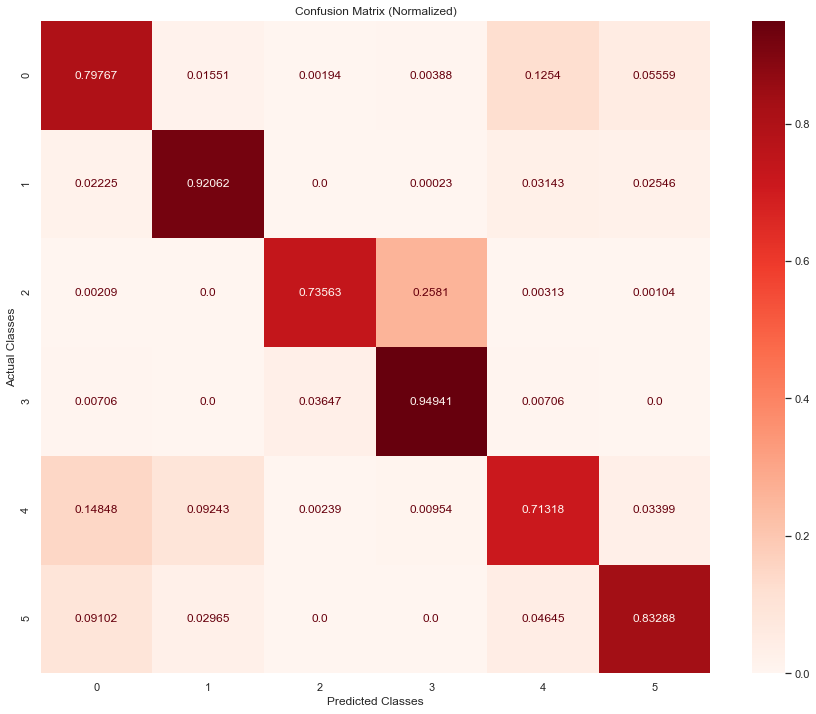

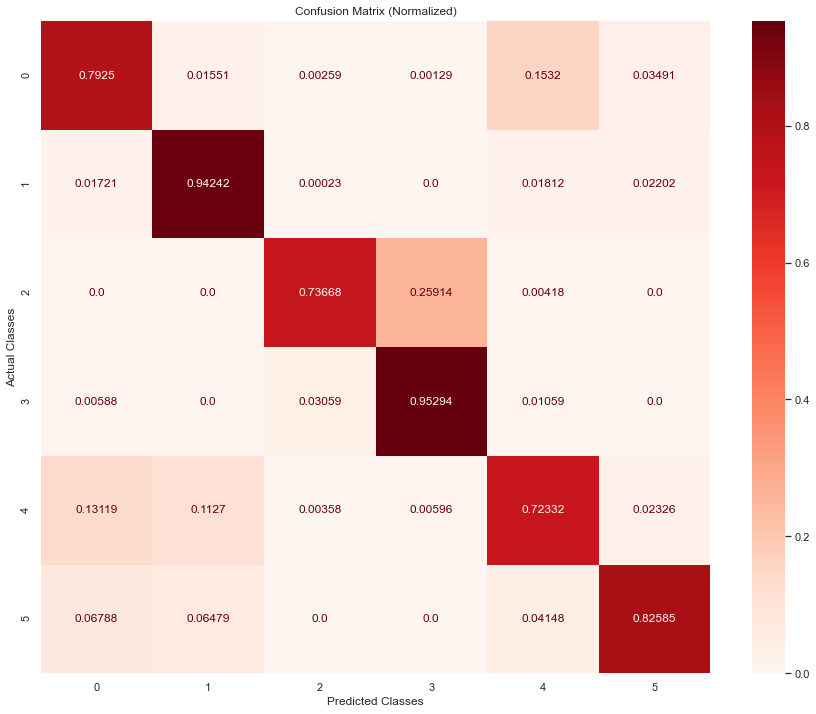

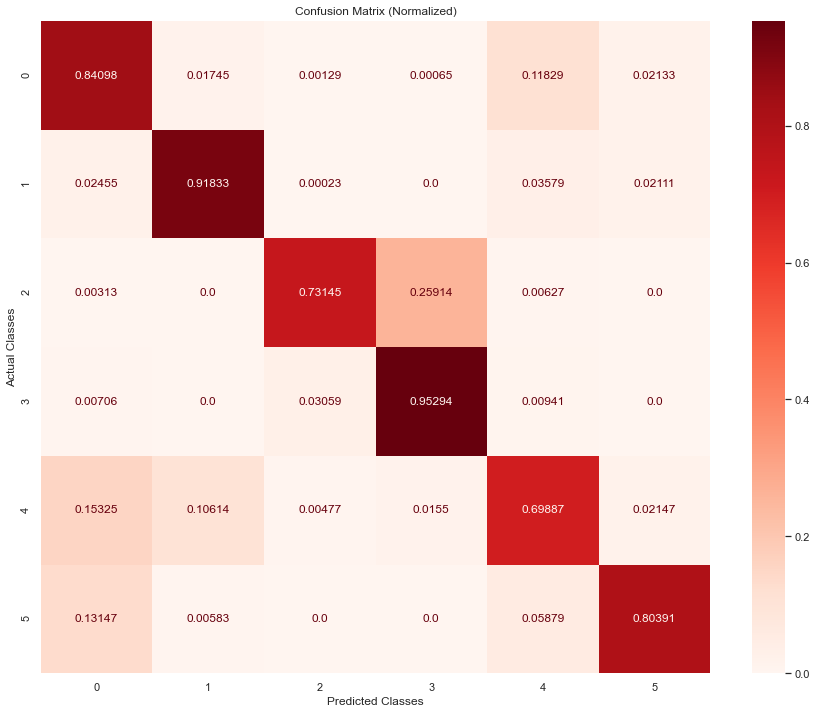

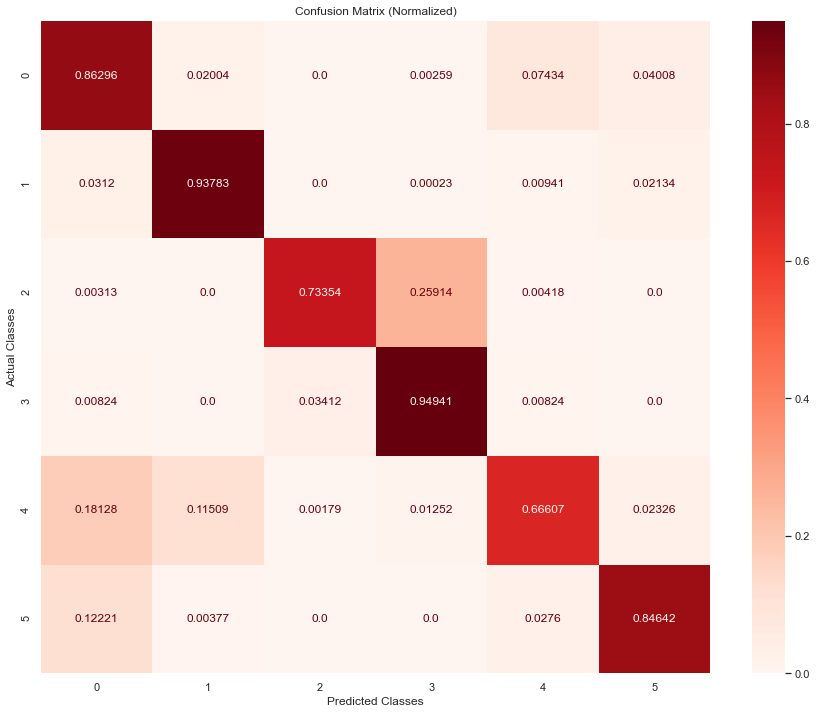

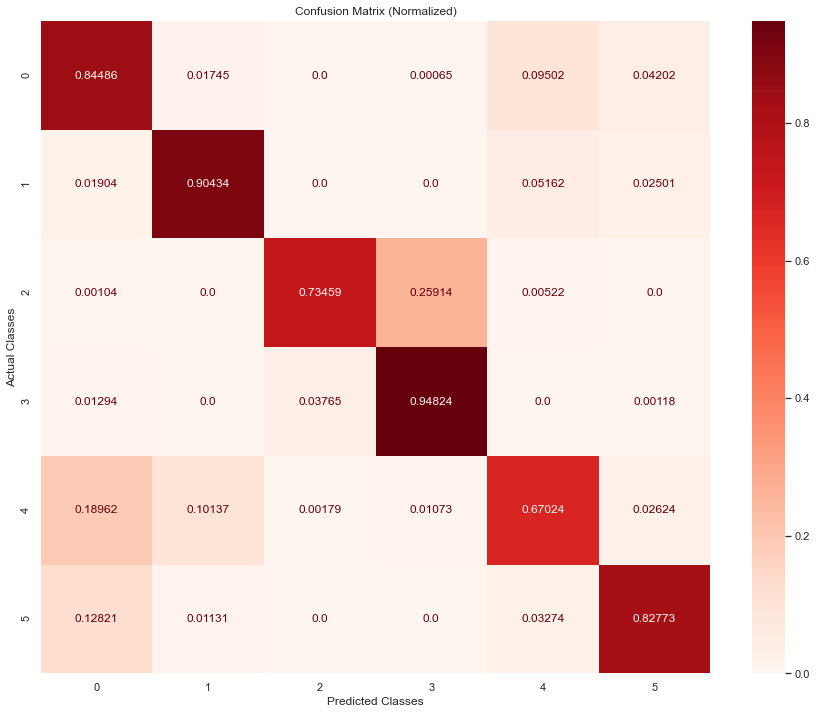

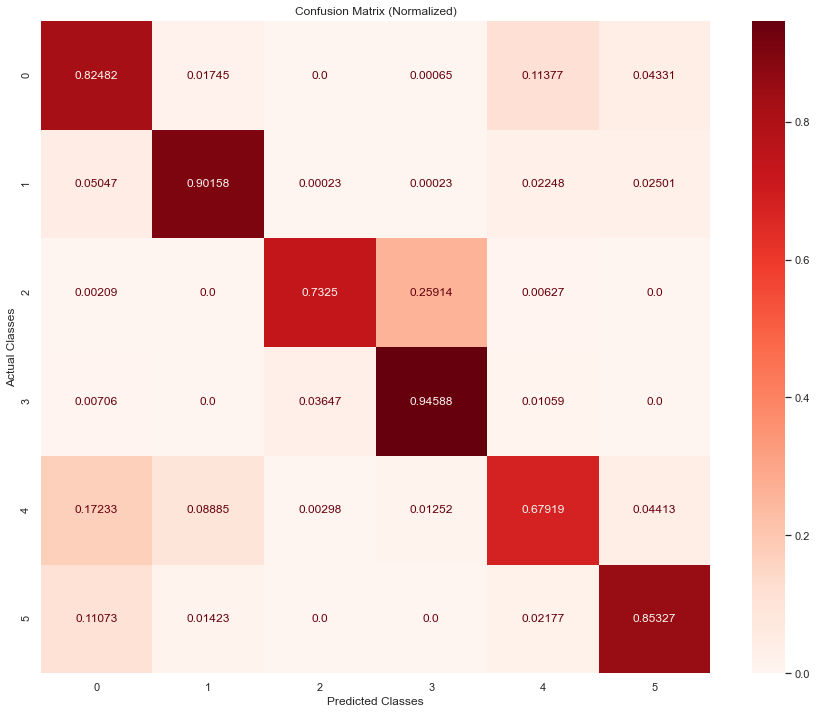

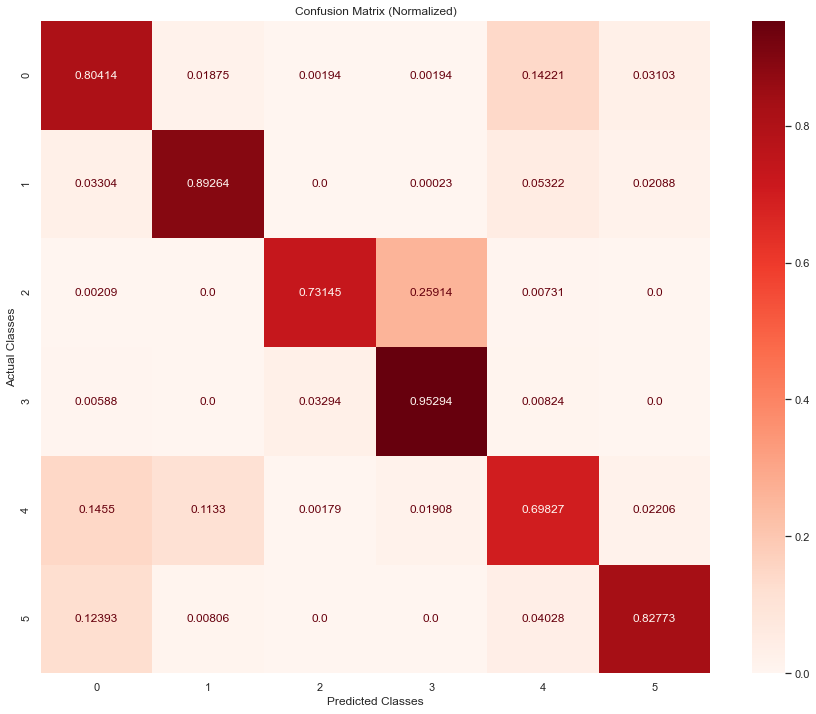

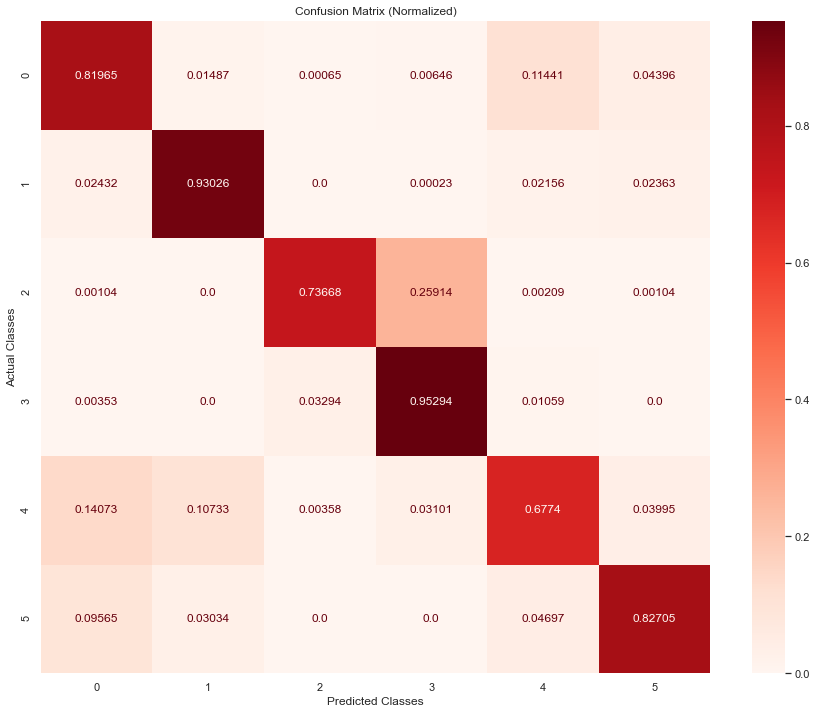

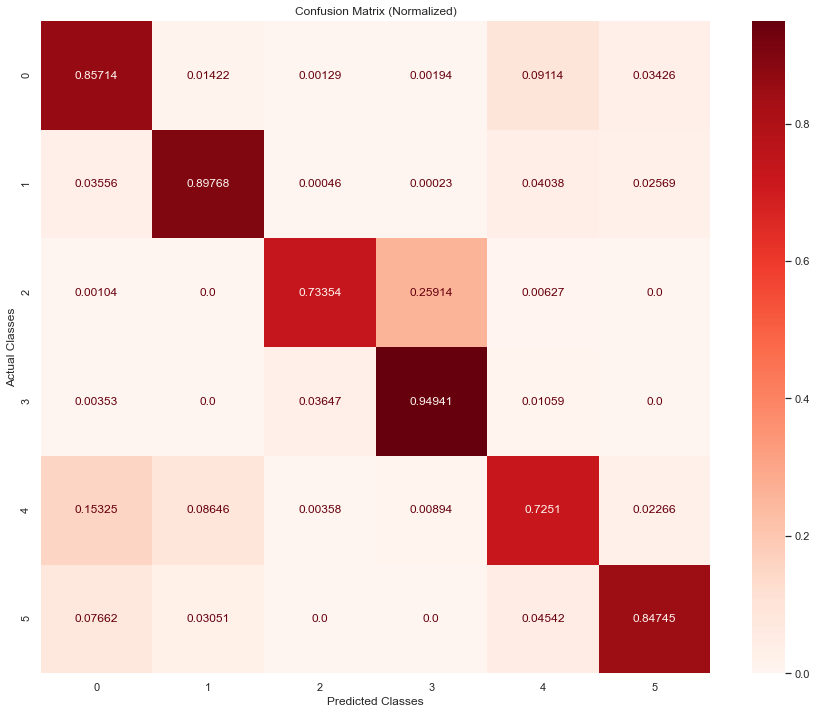

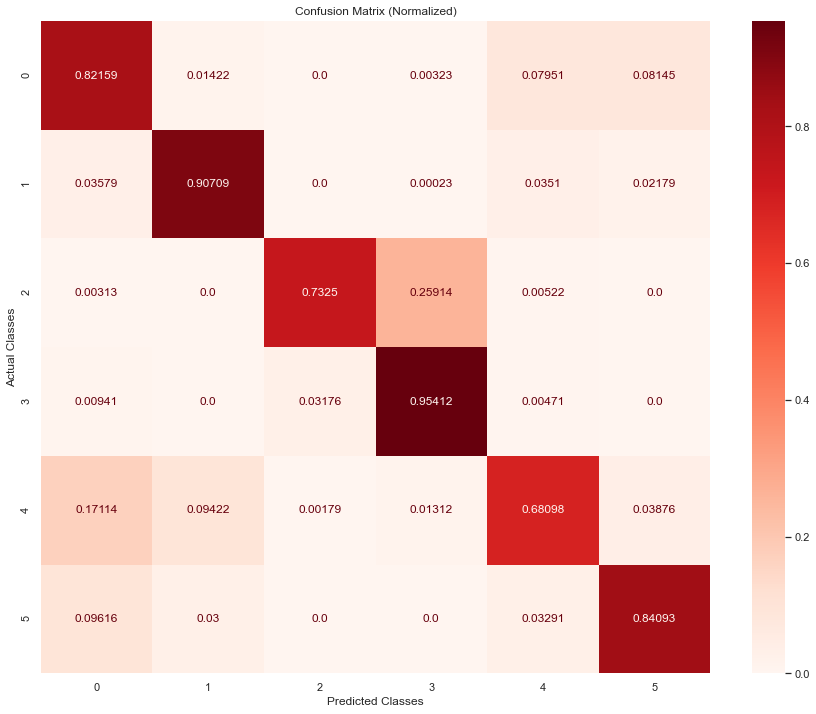

In [111]:
repeat_experiment_dac(repeats=REPEATS, model_type="bilstm", data = "reduced")

### Store the data from these repeat runs

#### First, make a dataframe to store all the dictionaries of metrics

In [112]:
# function to make list to store model family
def model_family_fn(df):
    family = list()
    for i in range(len(df)):
        if (df['model'][i][0] == "l"):
            family.append("lstm")
        elif (df['model'][i][0] == "c"):
            if (df['model'][i][1] == "n"):
                family.append("cnnlstm")
            else:
                family.append("convlstm")
        else:
            family.append("bilstm")
    
    return family

In [113]:
# function tomake list to store model type (whether dac or standard model)
def model_type_fn(df, model="model"):

    model_type = list()
    for i in range(len(df)):
        if (df[model][i].find("dac") == -1):
            model_type.append("standard")
        else:
            model_type.append("divide_and_conquer") 
            
    return model_type

In [114]:
# function tomake list to store model type (whether dac or standard model)
def data_used_fn(df, model="model"):

    data_used = list()
    for i in range(len(df)):
        if ("original" in  df[model][i]):
            data_used.append("original")
        elif ("balanced" in df[model][i]):
            data_used.append("balanced")
        elif ("reduced" in df[model][i]):
            data_used.append("reduced")
            
    return data_used

In [115]:
# make a df for the metrics for each repeat, to see how much this varies between runs

# get the names of each model
repeat_keys = list(repeat_final_model_accuracies_train.keys())

# make lists of each metric
repeat_final_model_accuracies_train_values = list(repeat_final_model_accuracies_train.values())
repeat_final_model_accuracies_test_values = list(repeat_final_model_accuracies_test.values())

repeat_precision_values = list(repeat_precision.values())
repeat_recall_values = list(repeat_recall.values())
repeat_f1_score_values = list(repeat_f1_score.values())

# declare dataframe
repeat_metrics_df = pd.DataFrame(repeat_keys, index=repeat_keys)
repeat_metrics_df = repeat_metrics_df.rename(columns={0: "model"})

# make list to store model family      
repeat_family = model_family_fn(repeat_metrics_df)

# make list to store data used by model
repeat_data_used = data_used_fn(repeat_metrics_df)
        
# make list to store model type (whether dac or standard model)
repeat_model_type = model_type_fn(repeat_metrics_df)

# add columns to dataframe
repeat_metrics_df['family'] = repeat_family
repeat_metrics_df['model_type'] = repeat_model_type
repeat_metrics_df['data_used'] = repeat_data_used
repeat_metrics_df['train_accuracy'] = repeat_final_model_accuracies_train_values
repeat_metrics_df['test_accuracy'] = repeat_final_model_accuracies_test_values
repeat_metrics_df['precision'] = repeat_precision_values
repeat_metrics_df['recall'] = repeat_recall_values
repeat_metrics_df['f1_score'] = repeat_f1_score_values
repeat_metrics_df['model_plain'] =  repeat_metrics_df['family'] + '_' + repeat_metrics_df['model_type'] + '_' + repeat_metrics_df['data_used']
repeat_metrics_df

,model,family,model_type,data_used,train_accuracy,test_accuracy,precision,recall,f1_score,model_plain
lstm_original_1,lstm_original_1,lstm,standard,original,0.994281,0.825013,0.835296,0.825013,0.826784,lstm_standard_original
lstm_original_2,lstm_original_2,lstm,standard,original,0.995468,0.825079,0.840808,0.825079,0.826300,lstm_standard_original
lstm_original_3,lstm_original_3,lstm,standard,original,0.994578,0.819167,0.831899,0.819167,0.820533,lstm_standard_original
lstm_original_4,lstm_original_4,lstm,standard,original,0.996358,0.819955,0.835064,0.819955,0.820314,lstm_standard_original
lstm_original_5,lstm_original_5,lstm,standard,original,0.996817,0.807409,0.828203,0.807409,0.811664,lstm_standard_original
...,...,...,...,...,...,...,...,...,...,...
bilstm_reduced__dac_6,bilstm_reduced__dac_6,bilstm,divide_and_conquer,reduced,0.949422,0.842617,0.868822,0.842617,0.849508,bilstm_divide_and_conquer_reduced
bilstm_reduced__dac_7,bilstm_reduced__dac_7,bilstm,divide_and_conquer,reduced,0.944892,0.830596,0.861450,0.830596,0.839042,bilstm_divide_and_conquer_reduced
bilstm_reduced__dac_8,bilstm_reduced__dac_8,bilstm,divide_and_conquer,reduced,0.946901,0.840712,0.860428,0.840712,0.845080,bilstm_divide_and_conquer_reduced
bilstm_reduced__dac_9,bilstm_reduced__dac_9,bilstm,divide_and_conquer,reduced,0.945762,0.847872,0.868004,0.847872,0.852755,bilstm_divide_and_conquer_reduced


In [117]:
# make a df for mean metrics

# get the names of each model
mean_keys = list(mean_final_model_accuracies_train.keys())

# make lists of each metric
mean_final_model_accuracies_train_values = list(mean_final_model_accuracies_train.values())
mean_final_model_accuracies_test_values = list(mean_final_model_accuracies_test.values())

mean_precision_values = list(mean_precision.values())
mean_recall_values = list(mean_recall.values())
mean_f1_score_values = list(mean_f1_score.values())

std_final_model_accuracies_train_values = list(std_final_model_accuracies_train.values())
std_final_model_accuracies_test_values = list(std_final_model_accuracies_test.values())
std_precision_values = list(std_precision.values())
std_recall_values = list(std_recall.values())
std_f1_score_values = list(std_f1_score.values())

# declare dataframe
mean_metrics_df = pd.DataFrame(mean_keys, index=mean_keys)
mean_metrics_df = mean_metrics_df.rename(columns={0: "model"})

# make list to store model family      
mean_family = model_family_fn(mean_metrics_df)

# make list to store data used by model
mean_data_used = data_used_fn(mean_metrics_df)
        
# make list to store model type (whether dac or standard model)
mean_model_type = model_type_fn(mean_metrics_df)

# add columns to dataframe
mean_metrics_df['family'] = mean_family
mean_metrics_df['model_type'] = mean_model_type
mean_metrics_df['data_used'] = mean_data_used
mean_metrics_df['mean_train_accuracy'] = mean_final_model_accuracies_train_values
mean_metrics_df['train_accuracy_sd'] = std_final_model_accuracies_train_values
mean_metrics_df['mean_test_accuracy'] = mean_final_model_accuracies_test_values
mean_metrics_df['test_accuracy_sd'] = std_final_model_accuracies_test_values
mean_metrics_df['mean_precision'] = mean_precision_values
mean_metrics_df['precision_sd'] = std_precision_values
mean_metrics_df['mean_recall'] = mean_recall_values
mean_metrics_df['recall_sd'] = std_recall_values
mean_metrics_df['mean_f1_score'] = mean_f1_score_values
mean_metrics_df['f1_score_sd'] = std_f1_score_values
mean_metrics_df['model_plain'] =  mean_metrics_df['family'] + '_' + mean_metrics_df['model_type'] + '_' + mean_metrics_df['data_used']

mean_metrics_df

,model,family,model_type,data_used,mean_train_accuracy,train_accuracy_sd,mean_test_accuracy,test_accuracy_sd,mean_precision,precision_sd,mean_recall,recall_sd,mean_f1_score,f1_score_sd,model_plain
lstm_original,lstm_original,lstm,standard,original,0.995454,0.000868,0.817558,0.005895,0.834345,0.004490,0.817558,0.005895,0.819870,0.005232,lstm_standard_original
cnnlstm_original,cnnlstm_original,cnnlstm,standard,original,0.995101,0.000582,0.832902,0.007696,0.843130,0.004151,0.832902,0.007696,0.833983,0.006509,cnnlstm_standard_original
convlstm_original,convlstm_original,convlstm,standard,original,0.983482,0.001405,0.822419,0.006105,0.831399,0.004690,0.822419,0.006105,0.823586,0.005535,convlstm_standard_original
bilstm_original,bilstm_original,bilstm,standard,original,0.991203,0.000889,0.819903,0.005801,0.838408,0.004019,0.819903,0.005801,0.823151,0.005557,bilstm_standard_original
lstm_balanced,lstm_balanced,lstm,standard,balanced,0.995356,0.000430,0.820665,0.010108,0.837620,0.008852,0.820665,0.010108,0.823822,0.009928,lstm_standard_balanced
cnnlstm_balanced,cnnlstm_balanced,cnnlstm,standard,balanced,0.993138,0.000238,0.824639,0.010038,0.844990,0.005163,0.824639,0.010038,0.828925,0.007876,cnnlstm_standard_balanced
convlstm_balanced,convlstm_balanced,convlstm,standard,balanced,0.975657,0.001701,0.818083,0.007555,0.834538,0.004490,0.818083,0.007555,0.821410,0.006382,convlstm_standard_balanced
bilstm_balanced,bilstm_balanced,bilstm,standard,balanced,0.992349,0.000484,0.806004,0.011410,0.836633,0.008682,0.806004,0.011410,0.813458,0.009452,bilstm_standard_balanced
lstm_reduced,lstm_reduced,lstm,standard,reduced,0.982849,0.000733,0.847511,0.005861,0.865104,0.005367,0.847511,0.005861,0.851153,0.004866,lstm_standard_reduced
cnnlstm_reduced,cnnlstm_reduced,cnnlstm,standard,reduced,0.963184,0.001300,0.850709,0.004896,0.863230,0.003364,0.850709,0.004896,0.851997,0.004069,cnnlstm_standard_reduced


#### Make a dataframe to store accuracies per epoch

In [118]:
# convert the dictionary values from arrays into series so that they can be made into a dataframe
for model in repeat_training_times:
    repeat_training_times[model] = pd.Series(repeat_training_times[model]) 

# make dataframe for trainig times
repeat_training_times_df = pd.DataFrame(repeat_training_times)

# get training times in a list
repeat_training_times_df['epoch'] = repeat_training_times_df.index
repeat_training_times_df = pd.melt(repeat_training_times_df, id_vars = 'epoch', value_name = "time")
repeat_times_list= list(repeat_training_times_df.time)

In [119]:
# convert the dictionary values from arrays into series so that they can be made into a dataframe
for model in repeat_epoch_accuracies_train:
    repeat_epoch_accuracies_train[model] = pd.Series(repeat_epoch_accuracies_train[model]) 

for model in repeat_epoch_accuracies_test:
    repeat_epoch_accuracies_test[model] = pd.Series(repeat_epoch_accuracies_test[model]) 
    
# make dataframe for accuracies per epoch
repeat_epoch_accuracies_train_df = pd.DataFrame(repeat_epoch_accuracies_train)
repeat_epoch_accuracies_test_df = pd.DataFrame(repeat_epoch_accuracies_test)

In [120]:
# make train df tidy fomat
repeat_epoch_accuracies_train_df['epoch'] = repeat_epoch_accuracies_train_df.index
repeat_epoch_accuracies_train_df = pd.melt(repeat_epoch_accuracies_train_df, id_vars = 'epoch')
repeat_epoch_accuracies_train_df = repeat_epoch_accuracies_train_df.rename(columns={"variable": "model", "value": "accuracy"})
repeat_epoch_accuracies_train_df["time"] = repeat_times_list
repeat_epoch_accuracies_train_df["family"] = model_family_fn(repeat_epoch_accuracies_train_df)
repeat_epoch_accuracies_train_df["model_type"] = model_type_fn(repeat_epoch_accuracies_train_df)
repeat_epoch_accuracies_train_df["data_used"] = data_used_fn(repeat_epoch_accuracies_train_df)
repeat_epoch_accuracies_train_df["data_used_and_model_type"] = repeat_epoch_accuracies_train_df["data_used"] + "_" + repeat_epoch_accuracies_train_df["model_type"]
repeat_epoch_accuracies_train_df["test_or_train"] = 'train'
repeat_epoch_accuracies_train_df['model_plain'] =  repeat_epoch_accuracies_train_df['family'] + '_' + repeat_epoch_accuracies_train_df['model_type'] + '_' + repeat_epoch_accuracies_train_df['data_used']
repeat_epoch_accuracies_train_df

,epoch,model,accuracy,time,family,model_type,data_used,data_used_and_model_type,test_or_train,model_plain
0,0,lstm_original_1,0.648457,7.164900,lstm,standard,original,original_standard,train,lstm_standard_original
1,1,lstm_original_1,0.776033,10.370618,lstm,standard,original,original_standard,train,lstm_standard_original
2,2,lstm_original_1,0.808622,13.658643,lstm,standard,original,original_standard,train,lstm_standard_original
3,3,lstm_original_1,0.849088,16.962383,lstm,standard,original,original_standard,train,lstm_standard_original
4,4,lstm_original_1,0.862928,20.308132,lstm,standard,original,original_standard,train,lstm_standard_original
...,...,...,...,...,...,...,...,...,...,...
126955,524,bilstm_reduced__dac_10,NaN,NaN,bilstm,divide_and_conquer,reduced,reduced_divide_and_conquer,train,bilstm_divide_and_conquer_reduced
126956,525,bilstm_reduced__dac_10,NaN,NaN,bilstm,divide_and_conquer,reduced,reduced_divide_and_conquer,train,bilstm_divide_and_conquer_reduced
126957,526,bilstm_reduced__dac_10,NaN,NaN,bilstm,divide_and_conquer,reduced,reduced_divide_and_conquer,train,bilstm_divide_and_conquer_reduced
126958,527,bilstm_reduced__dac_10,NaN,NaN,bilstm,divide_and_conquer,reduced,reduced_divide_and_conquer,train,bilstm_divide_and_conquer_reduced


In [121]:
# make test df tidy fomat
repeat_epoch_accuracies_test_df['epoch'] = repeat_epoch_accuracies_test_df.index
repeat_epoch_accuracies_test_df = pd.melt(repeat_epoch_accuracies_test_df, id_vars = 'epoch')
repeat_epoch_accuracies_test_df = repeat_epoch_accuracies_test_df.rename(columns={"variable": "model", "value": "accuracy"})
repeat_epoch_accuracies_test_df["time"] = repeat_times_list
repeat_epoch_accuracies_test_df["family"] = model_family_fn(repeat_epoch_accuracies_test_df)
repeat_epoch_accuracies_test_df["model_type"] = model_type_fn(repeat_epoch_accuracies_test_df)
repeat_epoch_accuracies_test_df["data_used"] = data_used_fn(repeat_epoch_accuracies_test_df)
repeat_epoch_accuracies_test_df["data_used_and_model_type"] = repeat_epoch_accuracies_test_df["data_used"] + "_" + repeat_epoch_accuracies_test_df["model_type"]
repeat_epoch_accuracies_test_df["test_or_train"] = 'test'
repeat_epoch_accuracies_test_df['model_plain'] =  repeat_epoch_accuracies_test_df['family'] + '_' + repeat_epoch_accuracies_test_df['model_type'] + '_' + repeat_epoch_accuracies_test_df['data_used']
repeat_epoch_accuracies_test_df

,epoch,model,accuracy,time,family,model_type,data_used,data_used_and_model_type,test_or_train,model_plain
0,0,lstm_original_1,0.668944,7.164900,lstm,standard,original,original_standard,test,lstm_standard_original
1,1,lstm_original_1,0.687401,10.370618,lstm,standard,original,original_standard,test,lstm_standard_original
2,2,lstm_original_1,0.712756,13.658643,lstm,standard,original,original_standard,test,lstm_standard_original
3,3,lstm_original_1,0.746059,16.962383,lstm,standard,original,original_standard,test,lstm_standard_original
4,4,lstm_original_1,0.753810,20.308132,lstm,standard,original,original_standard,test,lstm_standard_original
...,...,...,...,...,...,...,...,...,...,...
126955,524,bilstm_reduced__dac_10,NaN,NaN,bilstm,divide_and_conquer,reduced,reduced_divide_and_conquer,test,bilstm_divide_and_conquer_reduced
126956,525,bilstm_reduced__dac_10,NaN,NaN,bilstm,divide_and_conquer,reduced,reduced_divide_and_conquer,test,bilstm_divide_and_conquer_reduced
126957,526,bilstm_reduced__dac_10,NaN,NaN,bilstm,divide_and_conquer,reduced,reduced_divide_and_conquer,test,bilstm_divide_and_conquer_reduced
126958,527,bilstm_reduced__dac_10,NaN,NaN,bilstm,divide_and_conquer,reduced,reduced_divide_and_conquer,test,bilstm_divide_and_conquer_reduced


In [122]:
# put the train and test accuracy data into the same df
repeat_epoch_accuracies_df = pd.concat([repeat_epoch_accuracies_test_df, repeat_epoch_accuracies_train_df], ignore_index=True)
repeat_epoch_accuracies_df

,epoch,model,accuracy,time,family,model_type,data_used,data_used_and_model_type,test_or_train,model_plain
0,0,lstm_original_1,0.668944,7.164900,lstm,standard,original,original_standard,test,lstm_standard_original
1,1,lstm_original_1,0.687401,10.370618,lstm,standard,original,original_standard,test,lstm_standard_original
2,2,lstm_original_1,0.712756,13.658643,lstm,standard,original,original_standard,test,lstm_standard_original
3,3,lstm_original_1,0.746059,16.962383,lstm,standard,original,original_standard,test,lstm_standard_original
4,4,lstm_original_1,0.753810,20.308132,lstm,standard,original,original_standard,test,lstm_standard_original
...,...,...,...,...,...,...,...,...,...,...
253915,524,bilstm_reduced__dac_10,NaN,NaN,bilstm,divide_and_conquer,reduced,reduced_divide_and_conquer,train,bilstm_divide_and_conquer_reduced
253916,525,bilstm_reduced__dac_10,NaN,NaN,bilstm,divide_and_conquer,reduced,reduced_divide_and_conquer,train,bilstm_divide_and_conquer_reduced
253917,526,bilstm_reduced__dac_10,NaN,NaN,bilstm,divide_and_conquer,reduced,reduced_divide_and_conquer,train,bilstm_divide_and_conquer_reduced
253918,527,bilstm_reduced__dac_10,NaN,NaN,bilstm,divide_and_conquer,reduced,reduced_divide_and_conquer,train,bilstm_divide_and_conquer_reduced


In [127]:
# save these main dfs
with open(f'{repeat_metrics_df=}'.split('=')[0] + '_wisdm_' + '5m10r' + '.pkl', 'wb') as file:
        dill.dump(repeat_metrics_df, file)

with open(f'{mean_metrics_df=}'.split('=')[0] + '_wisdm_' + '5m10r' + '.pkl', 'wb') as file:
        dill.dump(mean_metrics_df, file)

with open(f'{repeat_epoch_accuracies_train_df=}'.split('=')[0] + '_wisdm_' + '5m10r' + '.pkl', 'wb') as file:
        dill.dump(repeat_epoch_accuracies_train_df, file)
        
with open(f'{repeat_epoch_accuracies_test_df=}'.split('=')[0] + '_wisdm_' + '5m10r' + '.pkl', 'wb') as file:
        dill.dump(repeat_epoch_accuracies_test_df, file)  
        
with open(f'{repeat_epoch_accuracies_df=}'.split('=')[0] + '_wisdm_' + '5m10r' + '.pkl', 'wb') as file:
        dill.dump(repeat_epoch_accuracies_df, file)
        

In [128]:
# reload 10repeats 10mins data
with open('repeat_metrics_df' + '_wisdm_' + '5m10r' + '.pkl', 'rb') as in_strm:
    repeat_metrics_df = dill.load(in_strm)

with open("mean_metrics_df" + '_wisdm_' + '5m10r' + '.pkl', 'rb') as in_strm:
    mean_metrics_df = dill.load(in_strm)

with open('repeat_epoch_accuracies_train_df' + '_wisdm_' + '5m10r' + '.pkl', 'rb') as in_strm:
    repeat_epoch_accuracies_train_df = dill.load(in_strm)

with open('repeat_epoch_accuracies_test_df' + '_wisdm_' + '5m10r' + '.pkl', 'rb') as in_strm:
    repeat_epoch_accuracies_test_df = dill.load(in_strm)

with open('repeat_epoch_accuracies_df' + '_wisdm_' + '5m10r' + '.pkl', 'rb') as in_strm:
    repeat_epoch_accuracies_df = dill.load(in_strm)

#### Seperate test data by std/dac model type

In [129]:
# get data for original 4 models
repeat_epoch_accuracies_df_test_standard = repeat_epoch_accuracies_test_df[repeat_epoch_accuracies_test_df['model_type'] == 'standard']
repeat_epoch_accuracies_df_test_standard

,epoch,model,accuracy,time,family,model_type,data_used,data_used_and_model_type,test_or_train,model_plain
0,0,lstm_original_1,0.668944,7.164900,lstm,standard,original,original_standard,test,lstm_standard_original
1,1,lstm_original_1,0.687401,10.370618,lstm,standard,original,original_standard,test,lstm_standard_original
2,2,lstm_original_1,0.712756,13.658643,lstm,standard,original,original_standard,test,lstm_standard_original
3,3,lstm_original_1,0.746059,16.962383,lstm,standard,original,original_standard,test,lstm_standard_original
4,4,lstm_original_1,0.753810,20.308132,lstm,standard,original,original_standard,test,lstm_standard_original
...,...,...,...,...,...,...,...,...,...,...
63475,524,bilstm_reduced_10,NaN,NaN,bilstm,standard,reduced,reduced_standard,test,bilstm_standard_reduced
63476,525,bilstm_reduced_10,NaN,NaN,bilstm,standard,reduced,reduced_standard,test,bilstm_standard_reduced
63477,526,bilstm_reduced_10,NaN,NaN,bilstm,standard,reduced,reduced_standard,test,bilstm_standard_reduced
63478,527,bilstm_reduced_10,NaN,NaN,bilstm,standard,reduced,reduced_standard,test,bilstm_standard_reduced


In [130]:
# get data for dac models
repeat_epoch_accuracies_df_test_dac = repeat_epoch_accuracies_test_df[repeat_epoch_accuracies_test_df['model_type'] == 'divide_and_conquer']
repeat_epoch_accuracies_df_test_dac

,epoch,model,accuracy,time,family,model_type,data_used,data_used_and_model_type,test_or_train,model_plain
63480,0,lstm_original__dac_1,0.707961,9.770556,lstm,divide_and_conquer,original,original_divide_and_conquer,test,lstm_divide_and_conquer_original
63481,1,lstm_original__dac_1,0.728455,16.408044,lstm,divide_and_conquer,original,original_divide_and_conquer,test,lstm_divide_and_conquer_original
63482,2,lstm_original__dac_1,0.681621,23.009522,lstm,divide_and_conquer,original,original_divide_and_conquer,test,lstm_divide_and_conquer_original
63483,3,lstm_original__dac_1,0.714530,29.613000,lstm,divide_and_conquer,original,original_divide_and_conquer,test,lstm_divide_and_conquer_original
63484,4,lstm_original__dac_1,0.749015,36.167470,lstm,divide_and_conquer,original,original_divide_and_conquer,test,lstm_divide_and_conquer_original
...,...,...,...,...,...,...,...,...,...,...
126955,524,bilstm_reduced__dac_10,NaN,NaN,bilstm,divide_and_conquer,reduced,reduced_divide_and_conquer,test,bilstm_divide_and_conquer_reduced
126956,525,bilstm_reduced__dac_10,NaN,NaN,bilstm,divide_and_conquer,reduced,reduced_divide_and_conquer,test,bilstm_divide_and_conquer_reduced
126957,526,bilstm_reduced__dac_10,NaN,NaN,bilstm,divide_and_conquer,reduced,reduced_divide_and_conquer,test,bilstm_divide_and_conquer_reduced
126958,527,bilstm_reduced__dac_10,NaN,NaN,bilstm,divide_and_conquer,reduced,reduced_divide_and_conquer,test,bilstm_divide_and_conquer_reduced


#### Seperate test data by dataset used

In [131]:
# get data for original 4 models with original dataset
repeat_epoch_accuracies_df_test_original = repeat_epoch_accuracies_test_df[repeat_epoch_accuracies_test_df['data_used'] == 'original']
repeat_epoch_accuracies_df_test_original

,epoch,model,accuracy,time,family,model_type,data_used,data_used_and_model_type,test_or_train,model_plain
0,0,lstm_original_1,0.668944,7.164900,lstm,standard,original,original_standard,test,lstm_standard_original
1,1,lstm_original_1,0.687401,10.370618,lstm,standard,original,original_standard,test,lstm_standard_original
2,2,lstm_original_1,0.712756,13.658643,lstm,standard,original,original_standard,test,lstm_standard_original
3,3,lstm_original_1,0.746059,16.962383,lstm,standard,original,original_standard,test,lstm_standard_original
4,4,lstm_original_1,0.753810,20.308132,lstm,standard,original,original_standard,test,lstm_standard_original
...,...,...,...,...,...,...,...,...,...,...
84635,524,bilstm_original__dac_10,NaN,NaN,bilstm,divide_and_conquer,original,original_divide_and_conquer,test,bilstm_divide_and_conquer_original
84636,525,bilstm_original__dac_10,NaN,NaN,bilstm,divide_and_conquer,original,original_divide_and_conquer,test,bilstm_divide_and_conquer_original
84637,526,bilstm_original__dac_10,NaN,NaN,bilstm,divide_and_conquer,original,original_divide_and_conquer,test,bilstm_divide_and_conquer_original
84638,527,bilstm_original__dac_10,NaN,NaN,bilstm,divide_and_conquer,original,original_divide_and_conquer,test,bilstm_divide_and_conquer_original


In [132]:
# get data for original 4 models with balanced dataset
repeat_epoch_accuracies_df_test_balanced = repeat_epoch_accuracies_test_df[repeat_epoch_accuracies_test_df['data_used'] == 'balanced']
repeat_epoch_accuracies_df_test_balanced

,epoch,model,accuracy,time,family,model_type,data_used,data_used_and_model_type,test_or_train,model_plain
21160,0,lstm_balanced_1,0.565357,7.256133,lstm,standard,balanced,balanced_standard,test,lstm_standard_balanced
21161,1,lstm_balanced_1,0.670586,13.458099,lstm,standard,balanced,balanced_standard,test,lstm_standard_balanced
21162,2,lstm_balanced_1,0.757554,19.722078,lstm,standard,balanced,balanced_standard,test,lstm_standard_balanced
21163,3,lstm_balanced_1,0.782383,26.121076,lstm,standard,balanced,balanced_standard,test,lstm_standard_balanced
21164,4,lstm_balanced_1,0.738177,32.555080,lstm,standard,balanced,balanced_standard,test,lstm_standard_balanced
...,...,...,...,...,...,...,...,...,...,...
105795,524,bilstm_balanced__dac_10,NaN,NaN,bilstm,divide_and_conquer,balanced,balanced_divide_and_conquer,test,bilstm_divide_and_conquer_balanced
105796,525,bilstm_balanced__dac_10,NaN,NaN,bilstm,divide_and_conquer,balanced,balanced_divide_and_conquer,test,bilstm_divide_and_conquer_balanced
105797,526,bilstm_balanced__dac_10,NaN,NaN,bilstm,divide_and_conquer,balanced,balanced_divide_and_conquer,test,bilstm_divide_and_conquer_balanced
105798,527,bilstm_balanced__dac_10,NaN,NaN,bilstm,divide_and_conquer,balanced,balanced_divide_and_conquer,test,bilstm_divide_and_conquer_balanced


In [133]:
# get data for original 4 models with reduced dataset
repeat_epoch_accuracies_df_test_reduced = repeat_epoch_accuracies_test_df[repeat_epoch_accuracies_test_df['data_used'] == 'reduced']
repeat_epoch_accuracies_df_test_reduced

,epoch,model,accuracy,time,family,model_type,data_used,data_used_and_model_type,test_or_train,model_plain
42320,0,lstm_reduced_1,0.661061,7.307321,lstm,standard,reduced,reduced_standard,test,lstm_standard_reduced
42321,1,lstm_reduced_1,0.750000,13.591235,lstm,standard,reduced,reduced_standard,test,lstm_standard_reduced
42322,2,lstm_reduced_1,0.802746,19.764622,lstm,standard,reduced,reduced_standard,test,lstm_standard_reduced
42323,3,lstm_reduced_1,0.800447,25.978014,lstm,standard,reduced,reduced_standard,test,lstm_standard_reduced
42324,4,lstm_reduced_1,0.808460,32.229919,lstm,standard,reduced,reduced_standard,test,lstm_standard_reduced
...,...,...,...,...,...,...,...,...,...,...
126955,524,bilstm_reduced__dac_10,NaN,NaN,bilstm,divide_and_conquer,reduced,reduced_divide_and_conquer,test,bilstm_divide_and_conquer_reduced
126956,525,bilstm_reduced__dac_10,NaN,NaN,bilstm,divide_and_conquer,reduced,reduced_divide_and_conquer,test,bilstm_divide_and_conquer_reduced
126957,526,bilstm_reduced__dac_10,NaN,NaN,bilstm,divide_and_conquer,reduced,reduced_divide_and_conquer,test,bilstm_divide_and_conquer_reduced
126958,527,bilstm_reduced__dac_10,NaN,NaN,bilstm,divide_and_conquer,reduced,reduced_divide_and_conquer,test,bilstm_divide_and_conquer_reduced


In [135]:
# make function to get the mean accuracy/training times of epochs for the data, depending on what is selected, and plot it
def plot_mean_and_sd(col, condition, labels='default', df=repeat_epoch_accuracies_test_df):
    # make df of mean accuracy and time per epoch
    test_mean_accuracies_times = df[df[col]==condition].groupby(['model_plain','epoch']).mean()
    test_mean_accuracies_times.reset_index(inplace=True)  
    test_mean_accuracies_times

    # get sd
    sd = df[df[col]==condition].groupby(['model_plain','epoch']).std()
    sd_acc = list(sd.accuracy)
    test_mean_accuracies_times['sd_acc'] = sd_acc

    #get lower and upper bounds of sd
    test_mean_accuracies_times['acc_lower'] = test_mean_accuracies_times['accuracy'] - test_mean_accuracies_times['sd_acc']
    test_mean_accuracies_times['acc_upper'] = test_mean_accuracies_times['accuracy'] + test_mean_accuracies_times['sd_acc']

    # get min and max also
    mins = df[df[col]==condition].groupby(['model_plain','epoch']).min()
    maxes = df[df[col]==condition].groupby(['model_plain','epoch']).max()

    # convert the times to a list for the df
    min_acc = list(mins.accuracy)
    max_acc = list(maxes.accuracy)

    test_mean_accuracies_times['min_acc'] = min_acc
    test_mean_accuracies_times['max_acc'] = max_acc

    # get names of the models to be plotted
    models_list=unique(test_mean_accuracies_times['model_plain'])
    
    # if no labels inputted, set the legend labels to default 
    if (labels=='default'):
        labels=models_list
        
    # plot the lines for each model    
    ax = sns.lineplot(x = 'time', 
              y = 'accuracy', 
              data=test_mean_accuracies_times,
              hue='model_plain',
              ci='sd',
            )
    
    # add legend. user can set custom labels for aesthetics
    ax.legend(loc = 'lower right',
             labels=labels)
    
    # limit for consistency
    ax.set(ylim=(0, 1),
          xlim=(0, None))
    
    ax.set(#title='Comparing balanced vs original datasets',
       xlabel='Time (s)',
       ylabel='Accuracy')
    
    # iterate through, adding sd bars for each moddel selected by condition
    for i in range(len(models_list)):
        ax.fill_between('time',
                  'acc_lower', 
                  'acc_upper',
                  data=test_mean_accuracies_times[test_mean_accuracies_times['model_plain']==models_list[i]],
                  alpha=0.2)

In [136]:
repeat_epoch_accuracies_test_df

,epoch,model,accuracy,time,family,model_type,data_used,data_used_and_model_type,test_or_train,model_plain
0,0,lstm_original_1,0.668944,7.164900,lstm,standard,original,original_standard,test,lstm_standard_original
1,1,lstm_original_1,0.687401,10.370618,lstm,standard,original,original_standard,test,lstm_standard_original
2,2,lstm_original_1,0.712756,13.658643,lstm,standard,original,original_standard,test,lstm_standard_original
3,3,lstm_original_1,0.746059,16.962383,lstm,standard,original,original_standard,test,lstm_standard_original
4,4,lstm_original_1,0.753810,20.308132,lstm,standard,original,original_standard,test,lstm_standard_original
...,...,...,...,...,...,...,...,...,...,...
126955,524,bilstm_reduced__dac_10,NaN,NaN,bilstm,divide_and_conquer,reduced,reduced_divide_and_conquer,test,bilstm_divide_and_conquer_reduced
126956,525,bilstm_reduced__dac_10,NaN,NaN,bilstm,divide_and_conquer,reduced,reduced_divide_and_conquer,test,bilstm_divide_and_conquer_reduced
126957,526,bilstm_reduced__dac_10,NaN,NaN,bilstm,divide_and_conquer,reduced,reduced_divide_and_conquer,test,bilstm_divide_and_conquer_reduced
126958,527,bilstm_reduced__dac_10,NaN,NaN,bilstm,divide_and_conquer,reduced,reduced_divide_and_conquer,test,bilstm_divide_and_conquer_reduced
